In [1]:
import os

os.chdir("./content")

lm_dir = "tf-levenberg-marquardt"
if not os.path.exists(lm_dir):
  !git clone https://github.com/fabiodimarco/$lm_dir

os.chdir(lm_dir)

Cloning into 'tf-levenberg-marquardt'...
remote: Enumerating objects: 74, done.
remote: Counting objects: 100% (74/74), done.
remote: Compressing objects: 100% (49/49), done.
remote: Total 74 (delta 40), reused 47 (delta 21), pack-reused 0 (from 0)
Receiving objects: 100% (74/74), 40.11 KiB | 5.73 MiB/s, done.
Resolving deltas: 100% (40/40), done.


/tmp/ipykernel_1142564/89000192.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


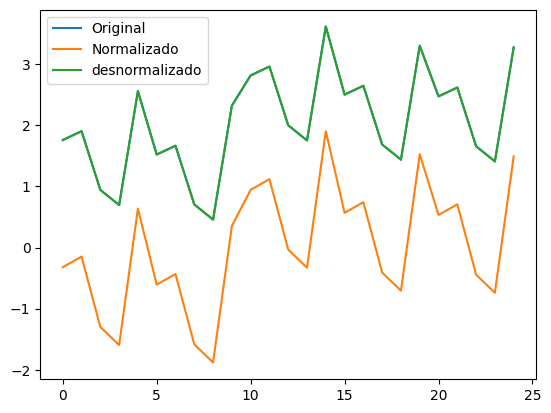

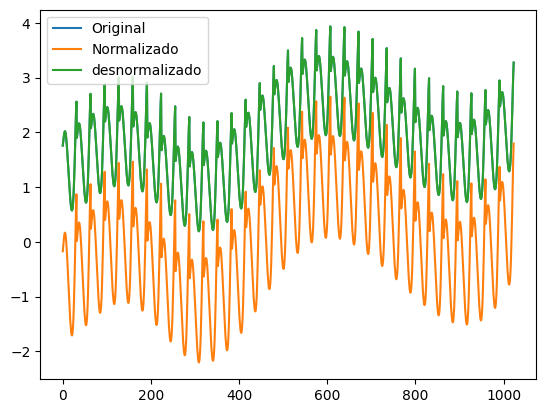

In [2]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

scaler = StandardScaler()
out_scaler = StandardScaler()

def function(grid):
    x = np.linspace(0, 1, grid)
    y = np.linspace(0, 1, grid)
    x, y = np.meshgrid(x, y)
    z = 1.3356 * (1.5 * (1 - x))+np.exp(2 * x - 1) * np.sin(3 * np.pi * (x - 0.6)**2)+np.exp(3*(y - 0.5)) * np.sin(4 * np.pi * (y - 0.9)**2)
    return x, y, z

def create_dataframe(grid):
   x, y, z = function(grid)
   data = {'X': x.flatten(), 'Y': y.flatten(), 'Z': z.flatten()}
   df = pd.DataFrame(data)
   return df

def show_norm(df, label="function", plot=False):
    df_norm = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
    df_denorm = pd.DataFrame(scaler.inverse_transform(df_norm), columns=df_norm.columns)

    if (plot):
        df.plot(title=f"{label}: Original data")
        df_norm.plot(title=f"{label}: Normalized data")
        df_denorm.plot(title=f"{label}: Denormalized data")
    return (df_norm)


def test_out_scaler(df):
    out = df["Z"].values.reshape(-1, 1)  
    plt.plot(out, label='Original')
    out_scaler.fit(out)
    norm = out_scaler.transform(out)
    plt.plot(norm, label='Normalizado')
    plt.plot(out_scaler.inverse_transform(norm), label='desnormalizado')
    plt.legend()
    plt.show()


df_25 = create_dataframe(grid=5)
df_25_norm = show_norm(df_25)
test_out_scaler(df_25)

df_1000 = create_dataframe(grid=32)
df_1000_norm = show_norm(df_1000)
test_out_scaler(df_1000)



In [3]:
def split_df(df):
    _input = np.vstack([df['X'], df['Y']]).T
    _output = np.array(df['Z'])
    return (_input, _output)

In [4]:
import tensorflow as tf
import numpy as np
from keras import regularizers
from keras import initializers
import levenberg_marquardt as lm

# layers, neurons
class ShuffleArchitecture:
    def __init__(self, input_size, hidden_sizes, output_size, act_h, act_o, param_reg):
        self.input_size = input_size
        self.hidden_sizes = hidden_sizes
        self.output_size = output_size
        self.act_h = act_h
        self.act_o = act_o
        self.regularizer = regularizers.L2(param_reg)
        self.initializer = initializers.RandomUniform(minval=-0.5, maxval=0.5, seed=np.random.randint(1, 10000))

    def compute_k(self):
        total_parameters = 0
        for layer in self.model.layers:
            weights = layer.get_weights()
            if len(weights) > 0:  
                for w in weights:
                    total_parameters += np.prod(w.shape)
        return total_parameters
        
    def set_architecture(self):
        self.model = tf.keras.Sequential()
        self.model.add(tf.keras.layers.Dense(self.hidden_sizes[0],
                        input_shape=(self.input_size,),
                        activation=self.act_h,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,                        
                        ))  # input layer

        for size in self.hidden_sizes[1:]:  # hidden layers
            self.model.add(tf.keras.layers.Dense(size,
                            activation=self.act_h,
                            kernel_regularizer=self.regularizer,
                            kernel_initializer=self.initializer,  
                        ))

        self.model.add(tf.keras.layers.Dense(self.output_size,
                        activation=self.act_o,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,  
                        ))  # output layer

    def create_model(self, _learning_rate):
        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
            loss=tf.keras.losses.MeanSquaredError())

        self.lm_model = lm.ModelWrapper(
            tf.keras.models.clone_model(self.model))

        self.lm_model.compile(
            optimizer=tf.keras.optimizers.SGD(learning_rate=_learning_rate),
            loss=lm.MeanSquaredError())
        return(self.lm_model)

2024-12-08 15:06:18.262058: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-08 15:06:18.267203: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-08 15:06:18.279856: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-08 15:06:18.299642: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-08 15:06:20.874859: W tensorflow/compiler/tf2

In [5]:
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping
from sklearn.metrics import r2_score, mean_squared_error, root_mean_squared_error, mean_absolute_percentage_error 

class TrainWithSmallDataset:
    def __init__(self, batch_size=1000):
        self.batch_size = batch_size
        self.betters = []
        self.k = 0

    def create_dataset(self, input, output):
      input = tf.expand_dims(tf.cast(input, tf.float32), axis=-1)
      output = tf.expand_dims(tf.cast(output, tf.float32), axis=-1)
      dataset = tf.data.Dataset.from_tensor_slices((input, output))
      dataset = dataset.shuffle(len(input))
      dataset = dataset.batch(self.batch_size).cache()
      dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
      return (dataset, input, output)

    def split_dataset(self, input, output, sup_input, sup_output):
      input_train, input_vt, output_train, output_vt = train_test_split(input, output, test_size=0.3, shuffle = True)
      input_val, input_test, output_val, output_test = train_test_split(input_vt, output_vt, test_size=0.5, shuffle = True)

      self.train_dataset, self.train_input, self.train_output = self.create_dataset(input_train, output_train)
      self.val_dataset, self.val_input, self.val_output = self.create_dataset(input_val, output_val)
      self.test_dataset, self.test_input, self.test_output = self.create_dataset(input_test, output_test)
      self.vt_dataset, self.vt_input, self.vt_output = self.create_dataset(input_vt, output_vt)
      self.sup_dataset, self.sup_input, self.sup_output = self.create_dataset(sup_input, sup_output)
      self.dataset, self.input, self.output = self.create_dataset(input, output)

      self._data = (input, output)
      self._train = (input_train, output_train)
      self._vt = (input_vt, output_vt)
      self._val = (input_val, output_val)
      self._test = (input_test, output_test)
      self._sup = (sup_input, sup_output)

    def train_using_lm(self, train_dataset, epochs=1000):
      early_stopping_monitor = EarlyStopping(monitor='val_loss',
                                              patience=6,
                                              restore_best_weights=True)

      self.results = self.lm_model.fit(train_dataset,
                                            epochs=epochs,
                                            validation_data=self.val_dataset,
                                            callbacks=[early_stopping_monitor],
                                            verbose=0)
      print ("Stopped at epoch: ", early_stopping_monitor.stopped_epoch)
    
    def get_new_metrics(self, orig, pred, r2, mse):
      n = len(orig) # N: quantidade de saidas
      k = self.k
      waste = (orig.flatten() - pred.flatten())

      mape = mean_absolute_percentage_error(orig, pred)  
      r2_adj = 1 - (((n - 1)/(n - k - 1)) * (1 - r2))
      rsd = np.sqrt(np.sum(waste ** 2) / (n - 2))
      rmse = root_mean_squared_error(orig, pred)          
      aic = (-2 * np.log(mse)) + (2 * k)
      bic = (-2 * np.log(mse)) + (k * np.log(n))
      return (mape, r2_adj, rsd, rmse, aic, bic)
      

    def get_metrics(self):
          # Calculando a saida com os dados normalizados
          pred = self.lm_model.predict(self.input).flatten()
          test_pred = self.lm_model.predict(self.test_input).flatten()
          val_pred = self.lm_model.predict(self.val_input).flatten()
          vt_pred = self.lm_model.predict(self.vt_input).flatten()
          sup_pred = self.lm_model.predict(self.sup_input).flatten()

          # Calculando as metricas com a saida desnormalizada
          pred_denorm = out_scaler.inverse_transform(pred.reshape(-1, 1))
          test_pred_denorm = out_scaler.inverse_transform(test_pred.reshape(-1, 1))
          val_pred_denorm = out_scaler.inverse_transform(val_pred.reshape(-1, 1))
          vt_pred_denorm = out_scaler.inverse_transform(vt_pred.reshape(-1, 1))
          sup_pred_denorm = out_scaler.inverse_transform(sup_pred.reshape(-1, 1))

          out_denorm = out_scaler.inverse_transform(self._data[1].reshape(-1, 1))
          test_denorm = out_scaler.inverse_transform(self._test[1].reshape(-1, 1))
          val_denorm = out_scaler.inverse_transform(self._val[1].reshape(-1, 1))
          vt_denorm = out_scaler.inverse_transform(self._vt[1].reshape(-1, 1))    
          sup_denorm = out_scaler.inverse_transform(self._sup[1].reshape(-1, 1))

          r2 = r2_score(out_denorm, pred_denorm)
          r2_test = r2_score(test_denorm, test_pred_denorm)
          r2_val = r2_score(val_denorm, val_pred_denorm)
          r2_vt = r2_score(vt_denorm,  vt_pred_denorm)
          r2_sup = r2_score(sup_denorm,  sup_pred_denorm)

          mse = mean_squared_error(out_denorm, pred_denorm)
          mse_test = mean_squared_error(test_denorm, test_pred_denorm)
          mse_val = mean_squared_error(val_denorm, val_pred_denorm)
          mse_vt = mean_squared_error(vt_denorm,  vt_pred_denorm)
          mse_sup = mean_squared_error(sup_denorm,  sup_pred_denorm)
          
          mape, r2_adj, rsd, rmse, aic, bic = self.get_new_metrics(out_denorm, pred_denorm, r2, mse)
          metrics = {
                          'r2': r2,
                          'r2_sup': r2_sup,
                          'r2_test': r2_test,
                          'r2_val': r2_val,
                          'r2_vt': r2_vt,
                          'mse': mse,
                          'mse_sup': mse_sup,
                          'mse_test': mse_test,
                          'mse_val': mse_val,
                          'mse_vt': mse_vt,
                          'mape': mape,
                          'rmse': rmse,
                          'r2_adj': r2_adj,
                          'rsd': rsd,
                          'aic': aic,
                          'bic': bic
                          }

          return metrics

In [6]:
import pickle
from itertools import product

class Tester:
  def __init__(self, run_times=500, dataset_run_times=10):
    self.run_times = run_times
    self.better_metrics = {}
    self.dataset_run_times = dataset_run_times
    self.input_25, self.output_25 = split_df(df_25_norm)
    self.input_1000, self.output_1000 = split_df(df_1000_norm)
  
  def setArchitecure(self, trainer, _hidden_sizes, _pg, _lr):
    shuffler = ShuffleArchitecture(input_size=2,
                                    hidden_sizes=_hidden_sizes,
                                    output_size=1,
                                    act_h='tanh',
                                    act_o='linear',
                                    param_reg=_pg)
    shuffler.set_architecture()    
    trainer.lm_model = shuffler.create_model(_lr)
    trainer.k = shuffler.compute_k()

  def Train(self, trainer, epochs=1000):
    trainer.train_using_lm(trainer.train_dataset, epochs=epochs)
    return(trainer.get_metrics(), trainer.lm_model)

  def SaveModelWeights(self, model, fileName):
    path = f"../models/{fileName}.keras"
    open(path,'w').close()
    model.save_weights(path)

  def SaveDataset(self, trainer, fileName):
    path = f"../dataset/{fileName}.pkl" 
    with open(path, 'wb') as f:
      pickle.dump((trainer._data, trainer._train, trainer._vt, trainer._val, trainer._test), f)
      
  def LoopWeights(self, sort_by, boundarie, trainer, idx):
    better_model = 0
    save = False

    for i in range(self.run_times):
      print (f"+++++++++++ [{idx}] | {i + 1} ++++++++++++++++++")
      metrics, model = self.Train(trainer)
      if (metrics[sort_by] <= boundarie): # should be >= to acsending metrics
        fileName = f"model_{idx}_{better_model}"
        self.SaveModelWeights(model, fileName)
        self.better_metrics[fileName] = metrics
        better_model += 1
        save = True
    return(save)

  def Loop(self, sort_by, boundarie, hidden_sizes, regularizers, learning_rate):
    trainer = TrainWithSmallDataset()

    for count, (hidden_size, reg, lr) in enumerate(product(hidden_sizes, regularizers, learning_rate), start=1):
      header =  f"Hidden Size={hidden_size}, regularizer={reg}, learning_rate={lr}"
      print(f"Testando combinacao{count}: {header}")
      self.setArchitecure(trainer, hidden_size, reg, lr)
      for j in range(self.dataset_run_times):
        trainer.split_dataset(self.input_25, self.output_25, self.input_1000, self.output_1000)
        if (self.LoopWeights(sort_by, boundarie, trainer, f"{count}_{j}") == True):
          self.SaveDataset(trainer, f"dataset_{count}_{j}")
          self.DisplayBetterResults('mse_sup', header, f"{count}_{j}")
        self.better_metrics = {}

  def DisplayBetterResults(self, sort_by, header, dataset=0):
    df = pd.DataFrame.from_dict(self.better_metrics, orient='index')
    df = df.sort_values([sort_by])
    display(df)
    path = f'../results/metrics_{dataset}'
    df.to_excel(f"{path}.xlsx", index=True)
    print(f"DataFrame salvo em {path}")
    with open(f"{path}.txt", 'w') as arquivo:
      arquivo.write(header)

# Treinando com 25 dados


In [7]:
tester = Tester(run_times=25, dataset_run_times=10)
tester.Loop(sort_by='mse',
            boundarie = 0.5,
            hidden_sizes = [[5], [6], [7], [8], [9], [10], [11], [12], [13], [14]],
            regularizers=[0.2, 0.05],
            learning_rate=[0.01, 0.1])

Testando combinacao1: Hidden Size=[5], regularizer=0.2, learning_rate=0.01


+++++++++++ [1_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 5ms/step
+++++++++++ [1_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_0] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [===========

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_0_7,0.282401,0.157518,0.354805,-1.249021,0.236835,0.425998,0.500134,0.721723,0.273047,0.497385,0.451659,0.652685,-4.740790,0.680471,43.706643,69.303035
model_1_0_6,0.267856,0.145724,0.341733,-1.292178,0.221597,0.434633,0.507135,0.736345,0.278286,0.507316,0.456211,0.659267,-4.857155,0.687333,43.666509,69.262901
model_1_0_5,0.253001,0.133632,0.328381,-1.336267,0.206033,0.443451,0.514313,0.751280,0.283639,0.517460,0.460811,0.665921,-4.975996,0.694271,43.626335,69.222728
model_1_0_4,0.237828,0.121234,0.314743,-1.381285,0.190136,0.452458,0.521673,0.766536,0.289105,0.527820,0.465461,0.672650,-5.097380,0.701286,43.586119,69.182511
model_1_0_3,0.222329,0.108522,0.300807,-1.427262,0.173895,0.461659,0.529220,0.782125,0.294686,0.538406,0.470161,0.679455,-5.221369,0.708381,43.545857,69.142249
model_1_0_2,0.206497,0.095489,0.286570,-1.474206,0.157304,0.471058,0.536957,0.798051,0.300386,0.549218,0.474910,0.686337,-5.348027,0.715555,43.505548,69.101941
model_1_0_1,0.190318,0.082135,0.272028,-1.522216,0.140353,0.480662,0.544884,0.814318,0.306215,0.560266,0.479708,0.693298,-5.477457,0.722813,43.465181,69.061573
model_1_0_0,0.173785,0.068449,0.257175,-1.571257,0.123039,0.490477,0.553009,0.830932,0.312168,0.571550,0.484555,0.700340,-5.609718,0.730155,43.424755,69.021147


DataFrame salvo em ../results/metrics_1_0
+++++++++++ [1_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 9ms/step
+++++++++++ [1_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_1_24,0.564896,0.357241,0.170249,0.446942,0.407365,0.258296,0.381570,0.396879,0.131370,0.264125,0.352063,0.508229,-2.480831,0.529865,44.707294,70.303687
model_1_1_23,0.556100,0.351972,0.153691,0.435765,0.395502,0.263518,0.384698,0.404799,0.134025,0.269412,0.355590,0.513340,-2.551202,0.535194,44.667264,70.263657
model_1_1_22,0.547125,0.346509,0.136812,0.424354,0.383403,0.268846,0.387940,0.412872,0.136736,0.274804,0.359152,0.518503,-2.622996,0.540577,44.627234,70.223626
model_1_1_21,0.537973,0.340846,0.119607,0.412717,0.371070,0.274279,0.391302,0.421101,0.139500,0.280301,0.362748,0.523717,-2.696218,0.546013,44.587217,70.183609
model_1_1_20,0.528632,0.334985,0.102056,0.400837,0.358486,0.279824,0.394782,0.429496,0.142322,0.285909,0.366381,0.528984,-2.770943,0.551504,44.547187,70.143579
model_1_1_19,0.519104,0.328925,0.084160,0.388722,0.345655,0.285481,0.398379,0.438056,0.145199,0.291628,0.370050,0.534304,-2.847166,0.557050,44.507163,70.103555
model_1_1_18,0.509385,0.322654,0.065921,0.376362,0.332573,0.291251,0.402102,0.446780,0.148135,0.297458,0.373756,0.539676,-2.924924,0.562651,44.467143,70.063535
model_1_1_17,0.499471,0.316172,0.047327,0.363757,0.319237,0.297136,0.405950,0.455674,0.151130,0.303402,0.377497,0.545102,-3.004235,0.568308,44.427132,70.023524
model_1_1_16,0.489352,0.309474,0.028352,0.350885,0.305625,0.303143,0.409926,0.464750,0.154187,0.309468,0.381278,0.550584,-3.085181,0.574023,44.387104,69.983497
model_1_1_15,0.479031,0.302554,0.009009,0.337755,0.291746,0.309270,0.414034,0.474002,0.157306,0.315654,0.385095,0.556120,-3.167750,0.579795,44.347084,69.943476


DataFrame salvo em ../results/metrics_1_1
+++++++++++ [1_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_2_24,0.761584,0.448175,0.630175,0.641887,0.713426,0.141534,0.327587,0.050704,0.156163,0.103434,0.262072,0.376210,-0.907330,0.392226,45.910428,71.506821
model_1_2_23,0.756754,0.447004,0.622773,0.634609,0.707623,0.144401,0.328282,0.051719,0.159337,0.105528,0.264710,0.380002,-0.945968,0.396179,45.870317,71.466710
model_1_2_22,0.751803,0.445536,0.615009,0.627114,0.701621,0.147341,0.329154,0.052784,0.162606,0.107695,0.267384,0.383850,-0.985577,0.400191,45.830018,71.426410
model_1_2_21,0.746755,0.443982,0.607123,0.619497,0.695522,0.150337,0.330076,0.053865,0.165927,0.109896,0.270085,0.387733,-1.025957,0.404240,45.789753,71.386145
model_1_2_20,0.741618,0.442480,0.599195,0.611730,0.689324,0.153387,0.330968,0.054952,0.169314,0.112133,0.272806,0.391646,-1.067059,0.408320,45.749583,71.345976
model_1_2_19,0.736363,0.440817,0.591052,0.603791,0.682982,0.156506,0.331955,0.056068,0.172776,0.114422,0.275560,0.395609,-1.109097,0.412451,45.709317,71.305709
model_1_2_18,0.730848,0.439125,0.584254,0.596911,0.677535,0.159780,0.332960,0.057000,0.175777,0.116388,0.278725,0.399725,-1.153212,0.416742,45.667915,71.264307
model_1_2_17,0.725372,0.437082,0.575729,0.588626,0.670911,0.163031,0.334172,0.058169,0.179389,0.118779,0.281536,0.403771,-1.197024,0.420960,45.627629,71.224021
model_1_2_16,0.719788,0.434980,0.567084,0.580170,0.664160,0.166346,0.335420,0.059354,0.183077,0.121216,0.284374,0.407855,-1.241696,0.425219,45.587372,71.183764
model_1_2_15,0.714086,0.432716,0.558209,0.571532,0.657257,0.169731,0.336764,0.060571,0.186843,0.123707,0.287242,0.411984,-1.287313,0.429523,45.547081,71.143473


DataFrame salvo em ../results/metrics_1_2
+++++++++++ [1_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_3_15,0.827001,0.462410,0.849652,0.817114,0.830803,0.102699,0.319137,0.101140,0.175620,0.138380,0.223036,0.320468,-0.383989,0.334111,46.551897,72.148290
model_1_3_14,0.823487,0.462361,0.846554,0.813433,0.827367,0.104786,0.319166,0.103224,0.179155,0.141190,0.225298,0.323706,-0.412102,0.337487,46.511678,72.108070
model_1_3_16,0.830436,0.462216,0.852650,0.820732,0.834159,0.100661,0.319252,0.099123,0.172147,0.135635,0.220811,0.317271,-0.356514,0.330778,46.592000,72.188392
model_1_3_17,0.833801,0.462190,0.855616,0.824247,0.837443,0.098663,0.319267,0.097128,0.168771,0.132950,0.218602,0.314106,-0.329592,0.327479,46.632093,72.228485
model_1_3_13,0.819909,0.462158,0.843406,0.809691,0.823876,0.106910,0.319286,0.105342,0.182749,0.144045,0.227579,0.326971,-0.440731,0.340891,46.471536,72.067928
model_1_3_12,0.816262,0.461981,0.840198,0.805879,0.820319,0.109075,0.319391,0.107500,0.186409,0.146955,0.229878,0.330264,-0.469901,0.344324,46.431447,72.027839
model_1_3_18,0.837104,0.461829,0.858497,0.827728,0.840671,0.096702,0.319482,0.095190,0.165429,0.130309,0.216417,0.310970,-0.303170,0.324208,46.672238,72.268630
model_1_3_19,0.840337,0.461769,0.861337,0.831112,0.843825,0.094783,0.319517,0.093280,0.162179,0.127729,0.214249,0.307869,-0.277307,0.320975,46.712328,72.308721
model_1_3_11,0.812543,0.461426,0.836916,0.802011,0.816698,0.111282,0.319721,0.109708,0.190123,0.149916,0.232206,0.333590,-0.499652,0.347792,46.391370,71.987762
model_1_3_20,0.843508,0.461322,0.864103,0.834454,0.846925,0.092900,0.319782,0.091419,0.158970,0.125194,0.212109,0.304795,-0.251934,0.317771,46.752457,72.348849


DataFrame salvo em ../results/metrics_1_3
+++++++++++ [1_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [1_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_4_0,0.858453,0.458597,0.760441,0.681762,0.810466,0.084029,0.321400,0.069866,0.078949,0.074408,0.201689,0.289877,-0.132378,0.302218,46.953196,72.549589
model_1_4_1,0.861266,0.457368,0.765252,0.688046,0.814238,0.082358,0.322130,0.068462,0.077391,0.072926,0.199679,0.286982,-0.109871,0.299199,46.993350,72.589742
model_1_4_2,0.864027,0.455954,0.769988,0.694241,0.817955,0.080719,0.322969,0.067081,0.075854,0.071467,0.197681,0.284111,-0.087781,0.296206,47.033557,72.629949
model_1_4_3,0.866731,0.454615,0.774611,0.700279,0.821580,0.079115,0.323764,0.065733,0.074356,0.070044,0.195712,0.281273,-0.066156,0.293247,47.073718,72.670111
model_1_4_4,0.869383,0.453052,0.779162,0.706212,0.825145,0.077540,0.324692,0.064406,0.072884,0.068645,0.193758,0.278459,-0.044933,0.290314,47.113931,72.710323
model_1_4_5,0.871980,0.451533,0.783597,0.712013,0.828625,0.075998,0.325594,0.063112,0.071445,0.067278,0.191828,0.275677,-0.024157,0.287413,47.154098,72.750490
model_1_4_6,0.874522,0.450254,0.787906,0.717710,0.832026,0.074489,0.326353,0.061856,0.070031,0.065943,0.189916,0.272927,-0.003824,0.284546,47.194204,72.790596
model_1_4_7,0.877013,0.448897,0.792122,0.723274,0.835350,0.073011,0.327158,0.060626,0.068651,0.064638,0.188026,0.270205,0.016101,0.281708,47.234300,72.830693
model_1_4_8,0.879453,0.447476,0.796249,0.728730,0.838607,0.071562,0.328002,0.059422,0.067297,0.063360,0.186155,0.267511,0.035622,0.278899,47.274380,72.870773
model_1_4_9,0.895342,0.435210,0.823325,0.764124,0.859847,0.062130,0.335284,0.051526,0.058517,0.055021,0.173501,0.249258,0.162735,0.259870,47.557065,73.153457


DataFrame salvo em ../results/metrics_1_4
+++++++++++ [1_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_5_0,0.925030,0.385774,0.916423,0.924838,0.926146,0.044505,0.364631,0.045207,0.059169,0.052188,0.146298,0.210963,0.400239,0.219944,48.224286,73.820679
model_1_5_1,0.926515,0.385750,0.918060,0.926319,0.927598,0.043624,0.364646,0.044321,0.058003,0.051162,0.144841,0.208863,0.412120,0.217755,48.264301,73.860693
model_1_5_2,0.927970,0.385525,0.919666,0.927772,0.929022,0.042760,0.364779,0.043453,0.056859,0.050156,0.143400,0.206785,0.423764,0.215588,48.304312,73.900705
model_1_5_3,0.929399,0.385247,0.921245,0.929200,0.930421,0.041912,0.364944,0.042599,0.055735,0.049167,0.141971,0.204724,0.435191,0.213439,48.344372,73.940765
model_1_5_4,0.930800,0.385089,0.922796,0.930600,0.931794,0.041080,0.365038,0.041760,0.054633,0.048197,0.140555,0.202682,0.446399,0.211311,48.384459,73.980851
model_1_5_5,0.932171,0.384922,0.924314,0.931969,0.933138,0.040266,0.365137,0.040939,0.053556,0.047247,0.139155,0.200664,0.457372,0.209206,48.424498,74.020890
model_1_5_6,0.933515,0.384480,0.925797,0.933311,0.934453,0.039468,0.365400,0.040136,0.052499,0.046318,0.137771,0.198667,0.468119,0.207124,48.464508,74.060900
model_1_5_7,0.934833,0.383514,0.927261,0.934630,0.935748,0.038686,0.365973,0.039344,0.051461,0.045402,0.136398,0.196687,0.478664,0.205061,48.504558,74.100950
model_1_5_8,0.936125,0.382846,0.928696,0.935921,0.937017,0.037919,0.366369,0.038569,0.050444,0.044506,0.135041,0.194729,0.488997,0.203019,48.544595,74.140987
model_1_5_9,0.937389,0.382155,0.930093,0.937187,0.938256,0.037168,0.366780,0.037813,0.049448,0.043630,0.133698,0.192791,0.499115,0.200998,48.584595,74.180987


DataFrame salvo em ../results/metrics_1_5
+++++++++++ [1_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_6_0,0.954574,0.363742,0.930161,0.921233,0.934439,0.026967,0.377710,0.019243,0.035611,0.027427,0.113905,0.164216,0.636590,0.171207,49.226283,74.822675
model_1_6_1,0.955501,0.363403,0.931563,0.922913,0.935808,0.026416,0.377912,0.018856,0.034852,0.026854,0.112744,0.162531,0.644011,0.169450,49.267550,74.863942
model_1_6_2,0.956388,0.363198,0.932916,0.924448,0.937084,0.025890,0.378033,0.018483,0.034158,0.026320,0.111614,0.160904,0.651101,0.167754,49.307784,74.904177
model_1_6_3,0.957256,0.362829,0.934250,0.925958,0.938339,0.025375,0.378252,0.018116,0.033475,0.025795,0.110497,0.159294,0.658048,0.166076,49.348009,74.944402
model_1_6_4,0.958114,0.362296,0.935573,0.927474,0.939594,0.024865,0.378569,0.017751,0.032790,0.025270,0.109384,0.157687,0.664912,0.164401,49.388562,74.984954
model_1_6_5,0.958948,0.361941,0.936858,0.928923,0.940800,0.024370,0.378780,0.017397,0.032135,0.024766,0.108290,0.156109,0.671585,0.162755,49.428794,75.025186
model_1_6_6,0.959768,0.361481,0.938114,0.930350,0.941984,0.023884,0.379052,0.017051,0.031490,0.024270,0.107204,0.154544,0.678141,0.161123,49.469118,75.065511
model_1_6_7,0.960570,0.360992,0.939344,0.931750,0.943146,0.023407,0.379343,0.016712,0.030856,0.023784,0.106130,0.152995,0.684560,0.159508,49.509408,75.105800
model_1_6_8,0.961356,0.360553,0.940551,0.933117,0.944282,0.022941,0.379604,0.016380,0.030239,0.023309,0.105068,0.151463,0.690844,0.157911,49.549656,75.146048
model_1_6_9,0.962124,0.360197,0.941732,0.934443,0.945388,0.022485,0.379815,0.016054,0.029639,0.022847,0.104018,0.149950,0.696989,0.156334,49.589810,75.186202


DataFrame salvo em ../results/metrics_1_6
+++++++++++ [1_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_7_0,0.975595,0.357141,0.915585,0.978068,0.976668,0.014488,0.381629,0.012363,0.019678,0.016020,0.083357,0.120364,0.804764,0.125488,50.468929,76.065321
model_1_7_1,0.976084,0.356189,0.917298,0.978511,0.977140,0.014197,0.382194,0.012112,0.019281,0.015696,0.082518,0.119153,0.808673,0.124226,50.509380,76.105772
model_1_7_2,0.976561,0.355205,0.918972,0.978941,0.977600,0.013915,0.382778,0.011867,0.018894,0.015380,0.081691,0.117960,0.812485,0.122982,50.549627,76.146019
model_1_7_3,0.977029,0.354491,0.920599,0.979365,0.978050,0.013637,0.383202,0.011628,0.018514,0.015071,0.080870,0.116776,0.816232,0.121747,50.589995,76.186388
model_1_7_4,0.977488,0.353782,0.922196,0.979779,0.978492,0.013364,0.383623,0.011394,0.018142,0.014768,0.080057,0.115604,0.819902,0.120525,50.630345,76.226737
model_1_7_5,0.977937,0.353056,0.923749,0.980187,0.978923,0.013097,0.384054,0.011167,0.017777,0.014472,0.079257,0.114444,0.823497,0.119316,50.670676,76.267068
model_1_7_6,0.978378,0.352304,0.925284,0.980586,0.979348,0.012836,0.384500,0.010942,0.017419,0.014181,0.078461,0.113295,0.827023,0.118119,50.711029,76.307422
model_1_7_7,0.978810,0.351565,0.926787,0.980977,0.979763,0.012579,0.384939,0.010722,0.017068,0.013895,0.077672,0.112157,0.830481,0.116932,50.751417,76.347809
model_1_7_8,0.979236,0.350506,0.928290,0.981363,0.980176,0.012326,0.385567,0.010502,0.016721,0.013612,0.076885,0.111025,0.833887,0.115751,50.792016,76.388409
model_1_7_9,0.979653,0.349703,0.929757,0.981741,0.980580,0.012079,0.386044,0.010287,0.016382,0.013335,0.076108,0.109905,0.837221,0.114584,50.832555,76.428947


DataFrame salvo em ../results/metrics_1_7
+++++++++++ [1_8] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 5ms/step
+++++++++++ [1_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_8_24,0.994403,0.346731,0.990241,0.993093,0.992204,0.003323,0.387808,0.003915,0.001320,0.002618,0.039778,0.057644,0.955221,0.060098,53.413850,79.010243
model_1_8_23,0.994289,0.346626,0.990046,0.992951,0.992048,0.003390,0.387871,0.003993,0.001347,0.002670,0.040180,0.058225,0.954313,0.060704,53.373733,78.970125
model_1_8_20,0.993163,0.344208,0.988123,0.991532,0.990495,0.004059,0.389307,0.004765,0.001619,0.003192,0.043975,0.063709,0.945303,0.066421,53.013722,78.610114
model_1_8_22,0.993431,0.344074,0.988582,0.991869,0.990865,0.003899,0.389386,0.004580,0.001554,0.003067,0.043101,0.062445,0.947452,0.065103,53.093891,78.690283
model_1_8_19,0.993025,0.344048,0.987887,0.991359,0.990305,0.004141,0.389401,0.004859,0.001652,0.003255,0.044418,0.064349,0.944198,0.067089,52.973713,78.570105
model_1_8_21,0.993299,0.343944,0.988355,0.991703,0.990682,0.003978,0.389463,0.004671,0.001586,0.003129,0.043535,0.063073,0.946388,0.065759,53.053818,78.650211
model_1_8_1,0.985856,0.340028,0.975711,0.982760,0.980584,0.008397,0.391788,0.009744,0.003295,0.006519,0.063406,0.091633,0.886847,0.095534,51.559865,77.156257
model_1_8_0,0.985569,0.339982,0.975221,0.982412,0.980192,0.008567,0.391815,0.009940,0.003362,0.006651,0.064047,0.092558,0.884551,0.096498,51.519683,77.116075
model_1_8_2,0.986138,0.339439,0.976193,0.983103,0.980969,0.008229,0.392137,0.009550,0.003230,0.006390,0.062771,0.090715,0.889103,0.094577,51.600142,77.196535
model_1_8_3,0.986414,0.338962,0.976666,0.983442,0.981348,0.008065,0.392421,0.009361,0.003165,0.006263,0.062141,0.089805,0.891316,0.093628,51.640454,77.236846


DataFrame salvo em ../results/metrics_1_8
+++++++++++ [1_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [1_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [1_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_9_0,0.994515,0.345268,0.995098,0.992448,0.994938,0.003256,0.388677,0.005957,0.002480,0.004219,0.039378,0.057064,0.956118,0.059493,53.454321,79.050713
model_1_9_1,0.994622,0.344060,0.995193,0.992585,0.995035,0.003192,0.389394,0.005841,0.002435,0.004138,0.038998,0.056502,0.956978,0.058907,53.493913,79.090305
model_1_9_2,0.994729,0.343639,0.995290,0.992732,0.995134,0.003129,0.389644,0.005724,0.002387,0.004055,0.038610,0.055937,0.957835,0.058318,53.534149,79.130542
model_1_9_3,0.994834,0.343081,0.995384,0.992875,0.995231,0.003066,0.389976,0.005609,0.002340,0.003975,0.038224,0.055376,0.958676,0.057733,53.574456,79.170848
model_1_9_4,0.994937,0.342827,0.995476,0.993015,0.995326,0.003006,0.390126,0.005497,0.002294,0.003896,0.037846,0.054823,0.959497,0.057157,53.614604,79.210996
model_1_9_5,0.995037,0.342191,0.995565,0.993153,0.995418,0.002946,0.390504,0.005389,0.002249,0.003819,0.037472,0.054280,0.960294,0.056591,53.654362,79.250755
model_1_9_6,0.995136,0.341822,0.995654,0.993290,0.995509,0.002888,0.390723,0.005281,0.002204,0.003742,0.037097,0.053736,0.961087,0.056024,53.694673,79.291065
model_1_9_7,0.995232,0.341269,0.995740,0.993418,0.995598,0.002830,0.391051,0.005176,0.002161,0.003669,0.036731,0.053200,0.961860,0.055465,53.734795,79.331188
model_1_9_16,0.996693,0.335125,0.997039,0.995436,0.996942,0.001963,0.394699,0.003598,0.001499,0.002548,0.030704,0.044309,0.973542,0.046196,54.466237,80.062630
model_1_9_17,0.996759,0.334721,0.997099,0.995526,0.997004,0.001924,0.394938,0.003525,0.001469,0.002497,0.030395,0.043862,0.974073,0.045730,54.506804,80.103196


DataFrame salvo em ../results/metrics_1_9
Testando combinacao2: Hidden Size=[5], regularizer=0.2, learning_rate=0.1
+++++++++++ [2_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 5 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [=========

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_0_23,0.998689,0.697500,0.997420,0.995319,0.997914,0.000779,0.179577,0.000424,0.000560,0.000492,0.012881,0.027902,0.989508,0.029090,56.316161,81.912553
model_2_0_22,0.998384,0.694922,0.996864,0.994198,0.997436,0.000959,0.181107,0.000515,0.000695,0.000605,0.014304,0.030974,0.987071,0.032292,55.898456,81.494849
model_2_0_21,0.998003,0.692146,0.996147,0.992810,0.996834,0.001185,0.182755,0.000633,0.000861,0.000747,0.015905,0.034431,0.984024,0.035897,55.475225,81.071617
model_2_0_20,0.997527,0.689021,0.995225,0.991093,0.996077,0.001468,0.184611,0.000785,0.001067,0.000926,0.017704,0.038312,0.980219,0.039943,55.047927,80.644320
model_2_0_19,0.996935,0.685510,0.994064,0.988957,0.995131,0.001820,0.186695,0.000975,0.001322,0.001149,0.019717,0.042657,0.975479,0.044473,54.618252,80.214644
model_2_0_18,0.996197,0.681579,0.992594,0.986309,0.993947,0.002258,0.189029,0.001217,0.001639,0.001428,0.021967,0.047514,0.969576,0.049537,54.186888,79.783281
model_2_0_17,0.995280,0.677115,0.990753,0.983024,0.992472,0.002802,0.191678,0.001519,0.002033,0.001776,0.024478,0.052931,0.962244,0.055185,53.755040,79.351432
model_2_0_16,0.994142,0.672087,0.988430,0.978966,0.990634,0.003477,0.194663,0.001901,0.002519,0.002210,0.027276,0.058969,0.953139,0.061479,53.322987,78.919380
model_2_0_15,0.992730,0.666384,0.985516,0.973943,0.988344,0.004316,0.198049,0.002380,0.003120,0.002750,0.030394,0.065696,0.941838,0.068492,52.890888,78.487280
model_2_0_14,0.990977,0.659881,0.981867,0.967720,0.985494,0.005357,0.201909,0.002980,0.003865,0.003422,0.033867,0.073188,0.927815,0.076304,52.458879,78.055272


DataFrame salvo em ../results/metrics_2_0
+++++++++++ [2_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_1_11,0.999891,0.707452,0.999954,0.999471,0.999891,0.000065,0.173669,0.000040,0.000073,0.000056,0.003719,0.008062,0.999124,0.008406,61.282142,86.878534
model_2_1_12,0.999911,0.707243,0.999963,0.999569,0.999911,0.000053,0.173793,0.000033,0.000059,0.000046,0.003353,0.007266,0.999289,0.007575,61.698420,87.294813
model_2_1_10,0.999865,0.707212,0.999944,0.999353,0.999866,0.000080,0.173812,0.000049,0.000089,0.000069,0.004125,0.008942,0.998922,0.009323,60.867809,86.464202
model_2_1_13,0.999928,0.706731,0.999970,0.999649,0.999928,0.000043,0.174097,0.000026,0.000048,0.000037,0.003025,0.006549,0.999422,0.006828,62.113720,87.710112
model_2_1_9,0.999835,0.706466,0.999931,0.999214,0.999837,0.000098,0.174255,0.000061,0.000108,0.000084,0.004572,0.009906,0.998678,0.010327,60.458543,86.054936
model_2_1_21,0.999986,0.706402,0.999994,0.999930,0.999986,0.000008,0.174293,0.000005,0.000010,0.000007,0.001321,0.002868,0.999889,0.002990,65.416052,91.012444
model_2_1_20,0.999983,0.706260,0.999993,0.999914,0.999983,0.000010,0.174377,0.000006,0.000012,0.000009,0.001466,0.003178,0.999864,0.003313,65.005855,90.602248
model_2_1_8,0.999797,0.706210,0.999914,0.999039,0.999800,0.000121,0.174406,0.000075,0.000132,0.000103,0.005070,0.010985,0.998374,0.011453,60.044844,85.641237
model_2_1_22,0.999989,0.705990,0.999995,0.999943,0.999988,0.000007,0.174537,0.000004,0.000008,0.000006,0.001191,0.002588,0.999910,0.002698,65.827329,91.423721
model_2_1_23,0.999991,0.705893,0.999996,0.999953,0.999991,0.000005,0.174595,0.000003,0.000006,0.000005,0.001074,0.002333,0.999927,0.002432,66.243131,91.839523


DataFrame salvo em ../results/metrics_2_1
+++++++++++ [2_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_2] | 3 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_2_21,0.999999,0.709046,0.999997,1.000000,0.999999,3.316677e-07,0.172723,0.000002,5.503601e-07,1.029647e-06,0.000139,0.000576,0.999996,0.000600,71.838264,97.434657
model_2_2_22,0.999999,0.709031,0.999997,1.000000,0.999999,3.230980e-07,0.172732,0.000001,5.359415e-07,1.004240e-06,0.000138,0.000568,0.999996,0.000593,71.890620,97.487013
model_2_2_23,0.999999,0.709030,0.999997,1.000000,0.999999,3.166350e-07,0.172733,0.000001,5.251592e-07,9.852266e-07,0.000137,0.000563,0.999996,0.000587,71.931032,97.527425
model_2_2_17,1.000000,0.709016,0.999998,1.000000,0.999999,2.909295e-07,0.172741,0.000001,4.737438e-07,8.825019e-07,0.000155,0.000539,0.999996,0.000562,72.100370,97.696762
model_2_2_19,1.000000,0.709015,0.999998,1.000000,0.999999,2.795306e-07,0.172741,0.000001,4.565702e-07,8.562449e-07,0.000148,0.000529,0.999996,0.000551,72.180308,97.776700
model_2_2_24,0.999999,0.709009,0.999997,1.000000,0.999999,3.099550e-07,0.172745,0.000001,5.132395e-07,9.651737e-07,0.000135,0.000557,0.999996,0.000580,71.973677,97.570070
model_2_2_16,0.999999,0.709009,0.999998,1.000000,0.999999,2.970499e-07,0.172745,0.000001,4.813000e-07,8.950184e-07,0.000159,0.000545,0.999996,0.000568,72.058732,97.655124
model_2_2_20,1.000000,0.709005,0.999998,1.000000,0.999999,2.732798e-07,0.172747,0.000001,4.484164e-07,8.403698e-07,0.000145,0.000523,0.999996,0.000545,72.225539,97.821931
model_2_2_18,1.000000,0.709002,0.999998,1.000000,0.999999,2.827218e-07,0.172749,0.000001,4.620485e-07,8.622824e-07,0.000151,0.000532,0.999996,0.000554,72.157605,97.753997
model_2_2_15,0.999999,0.708985,0.999998,1.000000,0.999999,3.017680e-07,0.172759,0.000001,4.865673e-07,9.023868e-07,0.000163,0.000549,0.999996,0.000573,72.027215,97.623607


DataFrame salvo em ../results/metrics_2_2
+++++++++++ [2_3] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_3] | 7 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_3] | 8 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_3] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_3_8,1.0,0.710651,1.0,0.999998,0.999999,2.631939e-07,0.171770,3.355540e-07,1.292651e-06,8.141025e-07,0.000276,0.000513,0.999996,0.000535,72.300750,97.897142
model_2_3_10,1.0,0.710560,1.0,0.999998,0.999999,2.658395e-07,0.171824,3.375811e-07,1.321446e-06,8.295134e-07,0.000265,0.000516,0.999996,0.000538,72.280746,97.877138
model_2_3_11,1.0,0.710542,1.0,0.999998,0.999999,2.651250e-07,0.171835,3.356996e-07,1.319157e-06,8.274281e-07,0.000264,0.000515,0.999996,0.000537,72.286129,97.882521
model_2_3_9,1.0,0.710540,1.0,0.999998,0.999999,2.616755e-07,0.171836,3.346171e-07,1.297765e-06,8.161912e-07,0.000263,0.000512,0.999996,0.000533,72.312321,97.908714
model_2_3_7,1.0,0.710521,1.0,0.999998,0.999999,2.497901e-07,0.171847,3.189443e-07,1.221365e-06,7.701548e-07,0.000270,0.000500,0.999997,0.000521,72.405290,98.001682
model_2_3_6,1.0,0.710410,1.0,0.999998,0.999999,2.248169e-07,0.171913,2.457246e-07,9.697376e-07,6.077311e-07,0.000262,0.000474,0.999997,0.000494,72.615959,98.212352
model_2_3_23,1.0,0.710352,1.0,0.999998,0.999999,2.559895e-07,0.171948,3.149952e-07,1.284480e-06,7.997377e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_3_24,1.0,0.710352,1.0,0.999998,0.999999,2.559895e-07,0.171948,3.149952e-07,1.284480e-06,7.997377e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_3_21,1.0,0.710352,1.0,0.999998,0.999999,2.559895e-07,0.171948,3.149952e-07,1.284480e-06,7.997377e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_3_22,1.0,0.710352,1.0,0.999998,0.999999,2.559895e-07,0.171948,3.149952e-07,1.284480e-06,7.997377e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651


DataFrame salvo em ../results/metrics_2_3
+++++++++++ [2_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_4] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_4] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_4] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_4] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_4_0,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,4.307224e-07,2.027626e-10,2.154626e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_4_22,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,4.307224e-07,2.027626e-10,2.154626e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_4_21,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,4.307224e-07,2.027626e-10,2.154626e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_4_20,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,4.307224e-07,2.027626e-10,2.154626e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_4_19,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,4.307224e-07,2.027626e-10,2.154626e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_4_18,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,4.307224e-07,2.027626e-10,2.154626e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_4_17,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,4.307224e-07,2.027626e-10,2.154626e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_4_16,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,4.307224e-07,2.027626e-10,2.154626e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_4_15,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,4.307224e-07,2.027626e-10,2.154626e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_4_14,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,4.307224e-07,2.027626e-10,2.154626e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651


DataFrame salvo em ../results/metrics_2_4
+++++++++++ [2_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_5] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_5] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_5] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_5] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_5_0,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,8.536256e-07,2.687856e-10,4.269472e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_5_22,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,8.536256e-07,2.687856e-10,4.269472e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_5_21,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,8.536256e-07,2.687856e-10,4.269472e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_5_20,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,8.536256e-07,2.687856e-10,4.269472e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_5_19,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,8.536256e-07,2.687856e-10,4.269472e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_5_18,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,8.536256e-07,2.687856e-10,4.269472e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_5_17,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,8.536256e-07,2.687856e-10,4.269472e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_5_16,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,8.536256e-07,2.687856e-10,4.269472e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_5_15,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,8.536256e-07,2.687856e-10,4.269472e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_5_14,1.0,0.710352,0.999999,1.0,0.999999,2.559895e-07,0.171948,8.536256e-07,2.687856e-10,4.269472e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651


DataFrame salvo em ../results/metrics_2_5
+++++++++++ [2_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_6_0,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,1.426555e-07,1.715363e-07,1.570959e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_6_22,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,1.426555e-07,1.715363e-07,1.570959e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_6_21,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,1.426555e-07,1.715363e-07,1.570959e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_6_20,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,1.426555e-07,1.715363e-07,1.570959e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_6_19,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,1.426555e-07,1.715363e-07,1.570959e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_6_18,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,1.426555e-07,1.715363e-07,1.570959e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_6_17,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,1.426555e-07,1.715363e-07,1.570959e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_6_16,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,1.426555e-07,1.715363e-07,1.570959e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_6_15,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,1.426555e-07,1.715363e-07,1.570959e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_6_14,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,1.426555e-07,1.715363e-07,1.570959e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651


DataFrame salvo em ../results/metrics_2_6
+++++++++++ [2_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_7_0,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,5.030215e-08,1.311736e-10,2.521666e-08,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_7_22,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,5.030215e-08,1.311736e-10,2.521666e-08,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_7_21,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,5.030215e-08,1.311736e-10,2.521666e-08,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_7_20,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,5.030215e-08,1.311736e-10,2.521666e-08,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_7_19,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,5.030215e-08,1.311736e-10,2.521666e-08,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_7_18,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,5.030215e-08,1.311736e-10,2.521666e-08,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_7_17,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,5.030215e-08,1.311736e-10,2.521666e-08,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_7_16,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,5.030215e-08,1.311736e-10,2.521666e-08,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_7_15,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,5.030215e-08,1.311736e-10,2.521666e-08,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_7_14,1.0,0.710352,1.0,1.0,1.0,2.559895e-07,0.171948,5.030215e-08,1.311736e-10,2.521666e-08,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651


DataFrame salvo em ../results/metrics_2_7
+++++++++++ [2_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 5ms/step
+++++++++++ [2_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 7ms/step
+++++++++++ [2_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_8_0,1.0,0.710352,0.999996,1.0,0.999999,2.559895e-07,0.171948,0.000001,8.274925e-11,6.422253e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_8_22,1.0,0.710352,0.999996,1.0,0.999999,2.559895e-07,0.171948,0.000001,8.274925e-11,6.422253e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_8_21,1.0,0.710352,0.999996,1.0,0.999999,2.559895e-07,0.171948,0.000001,8.274925e-11,6.422253e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_8_20,1.0,0.710352,0.999996,1.0,0.999999,2.559895e-07,0.171948,0.000001,8.274925e-11,6.422253e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_8_19,1.0,0.710352,0.999996,1.0,0.999999,2.559895e-07,0.171948,0.000001,8.274925e-11,6.422253e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_8_18,1.0,0.710352,0.999996,1.0,0.999999,2.559895e-07,0.171948,0.000001,8.274925e-11,6.422253e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_8_17,1.0,0.710352,0.999996,1.0,0.999999,2.559895e-07,0.171948,0.000001,8.274925e-11,6.422253e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_8_16,1.0,0.710352,0.999996,1.0,0.999999,2.559895e-07,0.171948,0.000001,8.274925e-11,6.422253e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_8_15,1.0,0.710352,0.999996,1.0,0.999999,2.559895e-07,0.171948,0.000001,8.274925e-11,6.422253e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_8_14,1.0,0.710352,0.999996,1.0,0.999999,2.559895e-07,0.171948,0.000001,8.274925e-11,6.422253e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651


DataFrame salvo em ../results/metrics_2_8
+++++++++++ [2_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_9] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_9_0,1.0,0.710352,0.999998,1.0,0.999999,2.559895e-07,0.171948,9.471705e-07,1.122292e-10,4.736414e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_9_22,1.0,0.710352,0.999998,1.0,0.999999,2.559895e-07,0.171948,9.471705e-07,1.122292e-10,4.736414e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_9_21,1.0,0.710352,0.999998,1.0,0.999999,2.559895e-07,0.171948,9.471705e-07,1.122292e-10,4.736414e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_9_20,1.0,0.710352,0.999998,1.0,0.999999,2.559895e-07,0.171948,9.471705e-07,1.122292e-10,4.736414e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_9_19,1.0,0.710352,0.999998,1.0,0.999999,2.559895e-07,0.171948,9.471705e-07,1.122292e-10,4.736414e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_9_18,1.0,0.710352,0.999998,1.0,0.999999,2.559895e-07,0.171948,9.471705e-07,1.122292e-10,4.736414e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_9_17,1.0,0.710352,0.999998,1.0,0.999999,2.559895e-07,0.171948,9.471705e-07,1.122292e-10,4.736414e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_9_16,1.0,0.710352,0.999998,1.0,0.999999,2.559895e-07,0.171948,9.471705e-07,1.122292e-10,4.736414e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_9_15,1.0,0.710352,0.999998,1.0,0.999999,2.559895e-07,0.171948,9.471705e-07,1.122292e-10,4.736414e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651
model_2_9_14,1.0,0.710352,0.999998,1.0,0.999999,2.559895e-07,0.171948,9.471705e-07,1.122292e-10,4.736414e-07,0.000257,0.000506,0.999997,0.000527,72.356259,97.952651


DataFrame salvo em ../results/metrics_2_9
Testando combinacao3: Hidden Size=[5], regularizer=0.05, learning_rate=0.01
+++++++++++ [3_0] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [=======

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_0_12,0.350832,0.116542,-3.801856,-0.961456,-1.203409,0.385374,0.524459,0.454462,0.180166,0.317314,0.474920,0.620785,-4.193345,0.647213,43.907081,69.503473
model_3_0_11,0.337502,0.104341,-3.898099,-1.006791,-1.249492,0.393287,0.531702,0.463571,0.184330,0.323951,0.479763,0.627126,-4.299982,0.653824,43.866430,69.462822
model_3_0_10,0.323896,0.091873,-3.996234,-1.053253,-1.296557,0.401364,0.539103,0.472859,0.188598,0.330729,0.484656,0.633533,-4.408829,0.660504,43.825772,69.422164
model_3_0_9,0.310014,0.079127,-4.096329,-1.100568,-1.344537,0.409605,0.546670,0.482332,0.192944,0.337638,0.489597,0.640004,-4.519886,0.667250,43.785122,69.381515
model_3_0_8,0.295846,0.066102,-4.198390,-1.148978,-1.393512,0.418016,0.554402,0.491992,0.197391,0.344691,0.494589,0.646542,-4.633229,0.674066,43.744471,69.340863
model_3_0_7,0.281386,0.052791,-4.302439,-1.198532,-1.443506,0.426600,0.562304,0.501839,0.201942,0.351891,0.499631,0.653147,-4.748913,0.680952,43.703815,69.300207
model_3_0_6,0.266631,0.039187,-4.408525,-1.249109,-1.494495,0.435360,0.570380,0.511880,0.206588,0.359234,0.504724,0.659818,-4.866954,0.687908,43.663166,69.259558
model_3_0_5,0.251577,0.025287,-4.516661,-1.300654,-1.546467,0.444296,0.578632,0.522114,0.211323,0.366718,0.509866,0.666556,-4.987384,0.694932,43.622527,69.218920
model_3_0_4,0.236215,0.011085,-4.626869,-1.353388,-1.599498,0.453416,0.587063,0.532544,0.216167,0.374355,0.515060,0.673362,-5.110279,0.702028,43.581892,69.178284
model_3_0_3,0.220542,-0.003424,-4.739161,-1.407219,-1.653564,0.462720,0.595676,0.543172,0.221111,0.382142,0.520304,0.680235,-5.235665,0.709194,43.541266,69.137659


DataFrame salvo em ../results/metrics_3_0
+++++++++++ [3_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_1_24,0.612734,0.363442,0.701899,0.723839,0.707957,0.229898,0.377889,0.343522,0.121362,0.232442,0.366832,0.479477,-2.098128,0.499889,44.940241,70.536633
model_3_1_23,0.604667,0.355651,0.695499,0.717954,0.701699,0.234687,0.382513,0.350898,0.123948,0.237423,0.370628,0.484445,-2.162663,0.505068,44.899008,70.495400
model_3_1_22,0.596377,0.347622,0.688871,0.711852,0.695216,0.239608,0.387280,0.358536,0.126630,0.242583,0.374484,0.489498,-2.228984,0.510337,44.857502,70.453894
model_3_1_21,0.588045,0.339671,0.682317,0.705809,0.688803,0.244554,0.392000,0.366088,0.129285,0.247687,0.378326,0.494524,-2.295641,0.515577,44.816636,70.413028
model_3_1_20,0.578380,0.330232,0.673904,0.698196,0.680611,0.250292,0.397603,0.375783,0.132631,0.254207,0.382769,0.500292,-2.372959,0.521590,44.770256,70.366648
model_3_1_19,0.569711,0.322068,0.667106,0.691893,0.673949,0.255438,0.402450,0.383617,0.135401,0.259509,0.386679,0.505409,-2.442315,0.526925,44.729548,70.325941
model_3_1_18,0.560641,0.313490,0.659770,0.685098,0.666763,0.260823,0.407542,0.392070,0.138387,0.265229,0.390717,0.510708,-2.514873,0.532450,44.687830,70.284222
model_3_1_17,0.551680,0.305103,0.652823,0.678647,0.659953,0.266142,0.412521,0.400076,0.141222,0.270649,0.394682,0.515889,-2.586557,0.537852,44.647452,70.243844
model_3_1_16,0.542463,0.296443,0.645601,0.671952,0.652877,0.271614,0.417662,0.408398,0.144164,0.276281,0.398718,0.521166,-2.660297,0.543353,44.606748,70.203141
model_3_1_15,0.533106,0.287676,0.638309,0.665184,0.645729,0.277169,0.422866,0.416802,0.147138,0.281970,0.402774,0.526468,-2.735155,0.548881,44.566258,70.162650


DataFrame salvo em ../results/metrics_3_1
+++++++++++ [3_2] | 1 ++++++++++++++++++
Stopped at epoch:  82
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_2] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_2_24,0.949361,0.660768,0.891407,0.898331,0.913273,0.030062,0.201383,0.017211,0.068197,0.042704,0.132416,0.173383,0.594886,0.180764,49.009010,74.605402
model_3_2_23,0.948331,0.659963,0.889193,0.896262,0.911507,0.030673,0.201861,0.017562,0.069585,0.043573,0.133757,0.175137,0.586650,0.182593,48.968756,74.565149
model_3_2_22,0.947281,0.659140,0.886934,0.894151,0.909706,0.031296,0.202349,0.017920,0.071001,0.044460,0.135111,0.176908,0.578247,0.184439,48.928505,74.524898
model_3_2_21,0.946209,0.658299,0.884629,0.891996,0.907868,0.031933,0.202848,0.018285,0.072446,0.045365,0.136479,0.178697,0.569672,0.186305,48.888251,74.484643
model_3_2_20,0.945115,0.657438,0.882277,0.889798,0.905992,0.032582,0.203360,0.018658,0.073920,0.046289,0.137861,0.180505,0.560923,0.188189,48.847996,74.444388
model_3_2_19,0.943999,0.656557,0.879876,0.887555,0.904078,0.033244,0.203882,0.019039,0.075425,0.047232,0.139257,0.182330,0.551995,0.190093,48.807740,74.404132
model_3_2_18,0.942861,0.655656,0.877427,0.885266,0.902124,0.033920,0.204417,0.019427,0.076960,0.048193,0.140667,0.184175,0.542886,0.192015,48.767482,74.363874
model_3_2_17,0.941699,0.654734,0.874927,0.882931,0.900131,0.034610,0.204965,0.019823,0.078526,0.049175,0.142092,0.186038,0.533592,0.193958,48.727225,74.323618
model_3_2_16,0.940514,0.653791,0.872377,0.880548,0.898098,0.035314,0.205525,0.020227,0.080125,0.050176,0.143530,0.187919,0.524109,0.195919,48.686970,74.283362
model_3_2_15,0.939304,0.652824,0.869774,0.878117,0.896023,0.036032,0.206099,0.020640,0.081756,0.051198,0.144984,0.189820,0.514433,0.197901,48.646712,74.243104


DataFrame salvo em ../results/metrics_3_2
+++++++++++ [3_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_3_24,0.969380,0.680470,0.973215,0.953966,0.966108,0.018177,0.189687,0.013686,0.047712,0.030699,0.102958,0.134824,0.755038,0.140564,50.015143,75.611536
model_3_3_23,0.968757,0.679833,0.972668,0.953030,0.965418,0.018547,0.190065,0.013966,0.048682,0.031324,0.104001,0.136188,0.750057,0.141986,49.974880,75.571272
model_3_3_22,0.968122,0.679188,0.972112,0.952075,0.964715,0.018924,0.190448,0.014250,0.049672,0.031961,0.105053,0.137565,0.744976,0.143422,49.934632,75.531025
model_3_3_21,0.967474,0.678530,0.971543,0.951101,0.963997,0.019309,0.190838,0.014541,0.050682,0.032611,0.106116,0.138957,0.739791,0.144872,49.894377,75.490769
model_3_3_20,0.966813,0.677883,0.970965,0.950107,0.963265,0.019701,0.191223,0.014836,0.051712,0.033274,0.107188,0.140361,0.734505,0.146336,49.854156,75.450548
model_3_3_19,0.966138,0.677217,0.970373,0.949093,0.962517,0.020102,0.191618,0.015139,0.052763,0.033951,0.108273,0.141781,0.729106,0.147817,49.813895,75.410287
model_3_3_18,0.965450,0.676532,0.969769,0.948058,0.961755,0.020510,0.192025,0.015447,0.053836,0.034642,0.109369,0.143215,0.723599,0.149312,49.773645,75.370037
model_3_3_17,0.964748,0.675847,0.969153,0.947002,0.960977,0.020927,0.192431,0.015762,0.054930,0.035346,0.110475,0.144663,0.717982,0.150821,49.733406,75.329799
model_3_3_16,0.964031,0.675135,0.968525,0.945924,0.960184,0.021353,0.192854,0.016083,0.056047,0.036065,0.111592,0.146125,0.712250,0.152346,49.693165,75.289558
model_3_3_15,0.963300,0.674405,0.967883,0.944825,0.959374,0.021787,0.193287,0.016411,0.057186,0.036798,0.112721,0.147603,0.706400,0.153887,49.652910,75.249303


DataFrame salvo em ../results/metrics_3_3
+++++++++++ [3_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_4_24,0.981481,0.688893,0.987647,0.984426,0.985843,0.010993,0.184687,0.009779,0.016064,0.012921,0.080077,0.104850,0.851851,0.109313,51.020906,76.617298
model_3_4_23,0.981105,0.688651,0.987396,0.984108,0.985555,0.011217,0.184830,0.009977,0.016392,0.013184,0.080886,0.105910,0.848840,0.110419,50.980671,76.577064
model_3_4_22,0.980721,0.688413,0.987140,0.983785,0.985261,0.011445,0.184972,0.010180,0.016725,0.013452,0.081703,0.106980,0.845769,0.111535,50.940446,76.536838
model_3_4_21,0.980329,0.688162,0.986880,0.983455,0.984962,0.011677,0.185120,0.010386,0.017065,0.013726,0.082529,0.108061,0.842636,0.112662,50.900224,76.496616
model_3_4_20,0.979930,0.687910,0.986613,0.983119,0.984656,0.011914,0.185270,0.010597,0.017412,0.014005,0.083362,0.109153,0.839439,0.113800,50.860002,76.456394
model_3_4_19,0.979522,0.687651,0.986341,0.982775,0.984344,0.012156,0.185424,0.010812,0.017766,0.014289,0.084204,0.110256,0.836178,0.114950,50.819786,76.416178
model_3_4_18,0.979106,0.687377,0.986064,0.982425,0.984026,0.012403,0.185586,0.011031,0.018128,0.014580,0.085055,0.111371,0.832849,0.116112,50.779557,76.375949
model_3_4_17,0.978681,0.687086,0.985782,0.982066,0.983701,0.012656,0.185759,0.011255,0.018498,0.014876,0.085915,0.112497,0.829452,0.117286,50.739311,76.335703
model_3_4_16,0.978248,0.686804,0.985493,0.981702,0.983370,0.012913,0.185927,0.011484,0.018874,0.015179,0.086783,0.113634,0.825987,0.118472,50.699090,76.295482
model_3_4_15,0.977806,0.686507,0.985199,0.981329,0.983031,0.013175,0.186103,0.011716,0.019258,0.015487,0.087660,0.114783,0.822452,0.119669,50.658860,76.255252


DataFrame salvo em ../results/metrics_3_4
+++++++++++ [3_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_5_24,0.988790,0.697335,0.990513,0.931262,0.982155,0.006654,0.179675,0.003929,0.014619,0.009274,0.062297,0.081575,0.910324,0.085048,52.024933,77.621325
model_3_5_23,0.988563,0.697098,0.990321,0.929867,0.981793,0.006789,0.179816,0.004008,0.014915,0.009462,0.062926,0.082398,0.908504,0.085906,51.984759,77.581151
model_3_5_22,0.988331,0.696823,0.990126,0.928445,0.981424,0.006927,0.179979,0.004089,0.015218,0.009653,0.063561,0.083230,0.906648,0.086773,51.944592,77.540985
model_3_5_21,0.988094,0.696518,0.989927,0.926995,0.981048,0.007068,0.180160,0.004171,0.015526,0.009849,0.064203,0.084070,0.904755,0.087649,51.904438,77.500830
model_3_5_20,0.987853,0.696143,0.989724,0.925513,0.980664,0.007211,0.180383,0.004255,0.015841,0.010048,0.064851,0.084918,0.902822,0.088533,51.864268,77.460660
model_3_5_19,0.987606,0.695911,0.989517,0.924002,0.980272,0.007357,0.180520,0.004341,0.016163,0.010252,0.065506,0.085775,0.900851,0.089427,51.824091,77.420484
model_3_5_18,0.987355,0.695651,0.989305,0.922460,0.979872,0.007507,0.180675,0.004429,0.016491,0.010460,0.066167,0.086641,0.898839,0.090330,51.783927,77.380319
model_3_5_17,0.987098,0.695269,0.989090,0.920888,0.979465,0.007659,0.180901,0.004518,0.016825,0.010671,0.066835,0.087515,0.896787,0.091241,51.743761,77.340153
model_3_5_16,0.986837,0.694983,0.988870,0.919284,0.979049,0.007814,0.181071,0.004609,0.017166,0.010888,0.067509,0.088398,0.894695,0.092161,51.703619,77.300011
model_3_5_15,0.986570,0.694601,0.988646,0.917647,0.978625,0.007973,0.181298,0.004702,0.017514,0.011108,0.068191,0.089290,0.892559,0.093091,51.663456,77.259848


DataFrame salvo em ../results/metrics_3_5
+++++++++++ [3_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [3_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_6_24,0.993221,0.698769,0.989670,0.992847,0.991247,0.004024,0.178824,0.005114,0.003314,0.004214,0.048428,0.063438,0.945767,0.066139,53.030760,78.627153
model_3_6_23,0.993083,0.698719,0.989460,0.992701,0.991069,0.004106,0.178854,0.005217,0.003382,0.004299,0.048917,0.064079,0.944666,0.066807,52.990573,78.586966
model_3_6_13,0.991542,0.698635,0.987113,0.991069,0.989077,0.005021,0.178903,0.006379,0.004138,0.005259,0.054101,0.070858,0.932338,0.073875,52.588301,78.184693
model_3_6_22,0.992943,0.698571,0.989248,0.992553,0.990889,0.004189,0.178941,0.005322,0.003450,0.004386,0.049409,0.064725,0.943544,0.067481,52.950422,78.546815
model_3_6_12,0.991370,0.698561,0.986852,0.990887,0.988855,0.005123,0.178947,0.006508,0.004223,0.005365,0.054648,0.071574,0.930964,0.074621,52.548079,78.144472
model_3_6_21,0.992800,0.698510,0.989029,0.992401,0.990703,0.004275,0.178977,0.005431,0.003521,0.004476,0.049910,0.065380,0.942396,0.068163,52.910173,78.506565
model_3_6_11,0.991195,0.698492,0.986585,0.990701,0.988628,0.005227,0.178988,0.006641,0.004309,0.005475,0.055201,0.072298,0.929560,0.075376,52.507829,78.104222
model_3_6_20,0.992653,0.698465,0.988806,0.992246,0.990514,0.004361,0.179004,0.005541,0.003593,0.004567,0.050415,0.066041,0.941226,0.068852,52.869939,78.466332
model_3_6_19,0.992504,0.698415,0.988579,0.992088,0.990321,0.004450,0.179034,0.005654,0.003666,0.004660,0.050925,0.066708,0.940032,0.069548,52.829719,78.426111
model_3_6_10,0.991016,0.698411,0.986313,0.990511,0.988397,0.005333,0.179036,0.006775,0.004397,0.005586,0.055760,0.073029,0.928129,0.076138,52.467610,78.064003


DataFrame salvo em ../results/metrics_3_6
+++++++++++ [3_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_7_0,0.993355,0.698680,0.994235,0.901625,0.992789,0.003944,0.178876,0.004729,0.002909,0.003819,0.047944,0.062805,0.946844,0.065479,53.070884,78.667276
model_3_7_1,0.993488,0.698604,0.994349,0.903575,0.992932,0.003866,0.178922,0.004635,0.002852,0.003743,0.047465,0.062178,0.947900,0.064825,53.111030,78.707422
model_3_7_2,0.993617,0.698510,0.994461,0.905482,0.993072,0.003789,0.178977,0.004543,0.002795,0.003669,0.046991,0.061557,0.948935,0.064178,53.151155,78.747547
model_3_7_3,0.993744,0.698418,0.994571,0.907353,0.993209,0.003714,0.179032,0.004453,0.002740,0.003597,0.046521,0.060943,0.949950,0.063537,53.191295,78.787687
model_3_7_4,0.993868,0.698332,0.994678,0.909189,0.993344,0.003640,0.179083,0.004365,0.002686,0.003525,0.046056,0.060334,0.950945,0.062902,53.231446,78.827838
model_3_7_5,0.993990,0.698243,0.994784,0.910988,0.993476,0.003568,0.179136,0.004278,0.002632,0.003455,0.045596,0.059731,0.951919,0.062274,53.271590,78.867983
model_3_7_6,0.994109,0.698155,0.994887,0.912754,0.993605,0.003497,0.179188,0.004194,0.002580,0.003387,0.045141,0.059135,0.952875,0.061652,53.311743,78.908135
model_3_7_7,0.994227,0.698072,0.994989,0.914484,0.993732,0.003427,0.179237,0.004110,0.002529,0.003320,0.044689,0.058544,0.953812,0.061036,53.351917,78.948310
model_3_7_8,0.994341,0.697990,0.995089,0.916180,0.993857,0.003359,0.179286,0.004028,0.002479,0.003254,0.044243,0.057959,0.954731,0.060426,53.392101,78.988493
model_3_7_9,0.994454,0.697916,0.995186,0.917845,0.993979,0.003292,0.179330,0.003948,0.002430,0.003189,0.043801,0.057379,0.955631,0.059822,53.432276,79.028668


DataFrame salvo em ../results/metrics_3_7
+++++++++++ [3_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_8_0,0.995979,0.696568,0.996610,0.997110,0.996817,0.002387,0.180130,0.001243,0.000687,0.000965,0.037296,0.048860,0.967828,0.050940,54.075171,79.671564
model_3_8_1,0.996059,0.696541,0.996677,0.997168,0.996880,0.002340,0.180146,0.001219,0.000673,0.000946,0.036923,0.048372,0.968468,0.050431,54.115372,79.711764
model_3_8_2,0.996137,0.696503,0.996743,0.997224,0.996943,0.002293,0.180169,0.001194,0.000660,0.000927,0.036553,0.047888,0.969096,0.049926,54.155587,79.751979
model_3_8_3,0.996214,0.696457,0.996808,0.997280,0.997003,0.002248,0.180196,0.001171,0.000647,0.000909,0.036188,0.047409,0.969711,0.049427,54.195780,79.792172
model_3_8_4,0.996289,0.696421,0.996871,0.997334,0.997063,0.002203,0.180218,0.001148,0.000634,0.000891,0.035826,0.046935,0.970314,0.048933,54.235992,79.832384
model_3_8_5,0.996363,0.696386,0.996933,0.997386,0.997121,0.002159,0.180239,0.001125,0.000622,0.000873,0.035469,0.046466,0.970905,0.048444,54.276181,79.872573
model_3_8_6,0.996435,0.696331,0.996994,0.997438,0.997178,0.002116,0.180271,0.001103,0.000609,0.000856,0.035114,0.046001,0.971483,0.047959,54.316360,79.912753
model_3_8_7,0.996506,0.696292,0.997054,0.997489,0.997234,0.002074,0.180294,0.001081,0.000597,0.000839,0.034763,0.045541,0.972051,0.047480,54.356570,79.952963
model_3_8_8,0.996576,0.696242,0.997112,0.997539,0.997289,0.002033,0.180324,0.001059,0.000585,0.000822,0.034415,0.045085,0.972607,0.047005,54.396784,79.993176
model_3_8_9,0.996644,0.696225,0.997170,0.997588,0.997343,0.001992,0.180334,0.001038,0.000574,0.000806,0.034071,0.044634,0.973153,0.046534,54.437012,80.033404


DataFrame salvo em ../results/metrics_3_8
+++++++++++ [3_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_9] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_9_0,0.997567,0.695319,0.997950,0.997726,0.998008,0.001444,0.180872,0.001528,0.000466,0.000997,0.029011,0.038004,0.980536,0.039622,55.080258,80.676650
model_3_9_1,0.997615,0.695248,0.997991,0.997771,0.998048,0.001416,0.180914,0.001498,0.000457,0.000977,0.028720,0.037624,0.980924,0.039226,55.120475,80.716867
model_3_9_2,0.997663,0.695178,0.998031,0.997816,0.998087,0.001387,0.180955,0.001468,0.000448,0.000958,0.028433,0.037248,0.981304,0.038833,55.160682,80.757074
model_3_9_3,0.997709,0.695102,0.998070,0.997859,0.998125,0.001360,0.181001,0.001439,0.000439,0.000939,0.028149,0.036875,0.981676,0.038445,55.200873,80.797265
model_3_9_4,0.997755,0.695025,0.998108,0.997902,0.998162,0.001333,0.181046,0.001410,0.000430,0.000920,0.027867,0.036507,0.982040,0.038061,55.241059,80.837451
model_3_9_5,0.997800,0.694954,0.998146,0.997943,0.998199,0.001306,0.181089,0.001382,0.000422,0.000902,0.027589,0.036141,0.982397,0.037680,55.281261,80.877653
model_3_9_6,0.997843,0.694883,0.998183,0.997984,0.998235,0.001280,0.181130,0.001355,0.000413,0.000884,0.027313,0.035780,0.982748,0.037303,55.321469,80.917861
model_3_9_7,0.997886,0.694807,0.998219,0.998025,0.998270,0.001255,0.181175,0.001328,0.000405,0.000866,0.027040,0.035422,0.983091,0.036930,55.361655,80.958047
model_3_9_8,0.997928,0.694731,0.998254,0.998064,0.998304,0.001230,0.181221,0.001301,0.000397,0.000849,0.026769,0.035068,0.983427,0.036561,55.401857,80.998250
model_3_9_9,0.997970,0.694657,0.998289,0.998102,0.998338,0.001205,0.181265,0.001275,0.000389,0.000832,0.026501,0.034718,0.983757,0.036196,55.442037,81.038429


DataFrame salvo em ../results/metrics_3_9
Testando combinacao4: Hidden Size=[5], regularizer=0.05, learning_rate=0.1
+++++++++++ [4_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [=========

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_0_5,0.835462,0.430036,0.689727,-0.474024,0.411875,0.097677,0.338355,0.096851,0.258296,0.177574,0.202899,0.312533,-0.316302,0.325838,46.652184,72.248576
model_4_0_4,0.829544,0.429862,0.732444,-0.342117,0.472234,0.101190,0.338459,0.083517,0.235182,0.159349,0.216358,0.318104,-0.363646,0.331646,46.581513,72.177905
model_4_0_3,0.821116,0.428862,0.774339,-0.199207,0.535361,0.106193,0.339052,0.070440,0.210139,0.140289,0.230115,0.325873,-0.431074,0.339746,46.484986,72.081378
model_4_0_6,0.838505,0.428460,0.643995,-0.602607,0.350923,0.095870,0.339291,0.111126,0.280828,0.195977,0.191463,0.309629,-0.291959,0.322811,46.689518,72.285910
model_4_0_7,0.838961,0.425069,0.595021,-0.729550,0.288770,0.095599,0.341304,0.126413,0.303072,0.214743,0.181112,0.309192,-0.288309,0.322355,46.695176,72.291568
model_4_0_8,0.837390,0.420200,0.543513,-0.852981,0.226327,0.096532,0.344194,0.142492,0.324701,0.233596,0.171778,0.310696,-0.300879,0.323923,46.675756,72.272148
model_4_0_2,0.802062,0.418327,0.801128,-0.129429,0.569457,0.117504,0.345306,0.062077,0.197912,0.129995,0.246774,0.342789,-0.583502,0.357382,46.282559,71.878951
model_4_0_9,0.834294,0.414196,0.490198,-0.971160,0.164474,0.098370,0.347759,0.159134,0.345410,0.252272,0.163391,0.313641,-0.325651,0.326993,46.638030,72.234422
model_4_0_10,0.830125,0.407400,0.436043,-1.082600,0.104142,0.100845,0.351793,0.176038,0.364938,0.270488,0.155862,0.317561,-0.359000,0.331081,46.588338,72.184730
model_4_0_11,0.825241,0.400101,0.381917,-1.186527,0.046006,0.103744,0.356126,0.192933,0.383149,0.288041,0.149106,0.322094,-0.398070,0.335806,46.531651,72.128043


DataFrame salvo em ../results/metrics_4_0
+++++++++++ [4_1] | 1 ++++++++++++++++++
Stopped at epoch:  19
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_1] | 6 ++++++++++++++++++
Stopped at epoch:  31
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_1] | 7 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_1] | 9 ++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_1_4,0.986543,0.610503,0.878830,0.968647,0.973729,0.007989,0.231222,0.022198,0.009698,0.015948,0.052092,0.089381,0.892341,0.093186,51.659405,77.255797
model_4_1_3,0.986614,0.609436,0.901629,0.969876,0.977482,0.007947,0.231856,0.018021,0.009317,0.013669,0.050941,0.089143,0.892912,0.092938,51.670039,77.266431
model_4_1_2,0.986410,0.607624,0.924530,0.971018,0.981229,0.008067,0.232931,0.013825,0.008964,0.011395,0.049501,0.089818,0.891284,0.093642,51.639862,77.236255
model_4_1_1,0.985744,0.604985,0.945100,0.971955,0.984571,0.008463,0.234498,0.010057,0.008675,0.009366,0.047876,0.091995,0.885950,0.095912,51.544067,77.140459
model_4_1_0,0.984407,0.601703,0.960819,0.972528,0.987089,0.009257,0.236447,0.007178,0.008497,0.007838,0.046317,0.096213,0.875253,0.100309,51.364776,76.961169
model_4_1_24,0.989324,0.571418,0.850021,0.960765,0.967374,0.006338,0.254425,0.027475,0.012136,0.019805,0.039532,0.079610,0.914591,0.083000,52.122438,77.718831
model_4_1_23,0.989281,0.570479,0.849238,0.960716,0.967243,0.006363,0.254983,0.027618,0.012151,0.019885,0.039627,0.079769,0.914249,0.083165,52.114456,77.710849
model_4_1_22,0.989235,0.569456,0.848392,0.960668,0.967103,0.006390,0.255589,0.027774,0.012166,0.019970,0.039720,0.079940,0.913882,0.083343,52.105916,77.702308
model_4_1_21,0.989185,0.568435,0.847466,0.960618,0.966951,0.006420,0.256196,0.027943,0.012181,0.020062,0.039822,0.080125,0.913484,0.083536,52.096681,77.693073
model_4_1_20,0.989145,0.567421,0.846707,0.960577,0.966826,0.006444,0.256797,0.028082,0.012194,0.020138,0.039909,0.080276,0.913156,0.083694,52.089131,77.685523


DataFrame salvo em ../results/metrics_4_1
+++++++++++ [4_2] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_2_0,0.993018,0.525975,0.947166,0.977505,0.986447,0.004145,0.281402,0.002165,0.008974,0.005570,0.034423,0.064379,0.944147,0.067119,52.971900,78.568293
model_4_2_1,0.993334,0.516210,0.930568,0.974271,0.984050,0.003957,0.287199,0.002846,0.010264,0.006555,0.033769,0.062906,0.946672,0.065584,53.064439,78.660831
model_4_2_2,0.993423,0.507866,0.909279,0.971356,0.981574,0.003905,0.292152,0.003718,0.011428,0.007573,0.033159,0.062487,0.947381,0.065147,53.091196,78.687589
model_4_2_3,0.993440,0.499843,0.887924,0.969143,0.979435,0.003894,0.296915,0.004593,0.012310,0.008452,0.032297,0.062403,0.947523,0.065059,53.096596,78.692989
model_4_2_4,0.993467,0.491612,0.868959,0.967726,0.977802,0.003879,0.301801,0.005371,0.012875,0.009123,0.031201,0.062278,0.947733,0.064929,53.104599,78.700991
model_4_2_5,0.993549,0.482923,0.854104,0.967130,0.976771,0.003830,0.306959,0.005980,0.013114,0.009547,0.029925,0.061883,0.948393,0.064518,53.130024,78.726416
model_4_2_6,0.993700,0.473678,0.843724,0.967269,0.976322,0.003740,0.312448,0.006405,0.013058,0.009731,0.028531,0.061155,0.949600,0.063759,53.177372,78.773764
model_4_2_7,0.993916,0.463779,0.837412,0.968038,0.976380,0.003612,0.318324,0.006664,0.012751,0.009707,0.027134,0.060099,0.951327,0.062657,53.247079,78.843471
model_4_2_8,0.994188,0.453101,0.834592,0.969328,0.976865,0.003450,0.324663,0.006779,0.012237,0.009508,0.025717,0.058741,0.953501,0.061241,53.338491,78.934884
model_4_2_9,0.994506,0.441496,0.834660,0.971042,0.977701,0.003261,0.331552,0.006777,0.011553,0.009165,0.024288,0.057109,0.956048,0.059540,53.451163,79.047555


DataFrame salvo em ../results/metrics_4_2
+++++++++++ [4_3] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_3_0,0.999601,0.202792,0.998780,0.999964,0.999293,0.000237,0.473257,0.000704,0.000012,0.000358,0.005291,0.015387,0.996809,0.016042,58.696822,84.293215
model_4_3_1,0.999672,0.188657,0.998988,0.999971,0.999414,0.000195,0.481648,0.000584,0.000009,0.000297,0.004792,0.013958,0.997374,0.014552,59.086788,84.683180
model_4_3_2,0.999729,0.176001,0.999156,0.999974,0.999510,0.000161,0.489161,0.000487,0.000008,0.000248,0.004325,0.012683,0.997832,0.013223,59.470043,85.066435
model_4_3_3,0.999777,0.162929,0.999302,0.999978,0.999595,0.000132,0.496922,0.000403,0.000007,0.000205,0.003915,0.011502,0.998217,0.011992,59.860974,85.457367
model_4_3_4,0.999817,0.149843,0.999423,0.999981,0.999665,0.000109,0.504690,0.000333,0.000006,0.000170,0.003551,0.010434,0.998533,0.010878,60.250778,85.847171
model_4_3_5,0.999849,0.137082,0.999522,0.999983,0.999722,0.000090,0.512266,0.000276,0.000005,0.000141,0.003227,0.009466,0.998792,0.009869,60.640129,86.236521
model_4_3_6,0.999876,0.124707,0.999604,0.999984,0.999769,0.000074,0.519612,0.000228,0.000005,0.000117,0.002937,0.008597,0.999004,0.008963,61.025500,86.621892
model_4_3_7,0.999897,0.112498,0.999671,0.999985,0.999808,0.000061,0.526859,0.000190,0.000005,0.000097,0.002682,0.007818,0.999176,0.008151,61.405153,87.001545
model_4_3_8,0.999915,0.101185,0.999728,0.999985,0.999840,0.000051,0.533575,0.000157,0.000005,0.000081,0.002471,0.007110,0.999319,0.007413,61.784824,87.381216
model_4_3_9,0.999929,0.090514,0.999772,0.999985,0.999865,0.000042,0.539910,0.000132,0.000005,0.000068,0.002292,0.006487,0.999433,0.006763,62.151770,87.748162


DataFrame salvo em ../results/metrics_4_3
+++++++++++ [4_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_4_0,0.999993,-0.105175,0.999943,0.999998,0.999990,4.228289e-06,0.656080,6.872656e-06,1.266948e-06,4.069802e-06,0.000859,0.002056,0.999943,0.002144,66.747426,92.343818
model_4_4_1,0.999995,-0.156253,0.999898,0.999998,0.999983,3.089884e-06,0.686402,1.235058e-05,1.798353e-06,7.074464e-06,0.000756,0.001758,0.999958,0.001833,67.374754,92.971146
model_4_4_2,0.999995,-0.158777,0.999901,0.999997,0.999983,2.913113e-06,0.687900,1.194467e-05,2.007848e-06,6.976257e-06,0.000709,0.001707,0.999961,0.001779,67.492576,93.088969
model_4_4_3,0.999995,-0.163413,0.999907,0.999997,0.999984,2.696290e-06,0.690652,1.115866e-05,2.156920e-06,6.657792e-06,0.000666,0.001642,0.999964,0.001712,67.647268,93.243660
model_4_4_4,0.999996,-0.166287,0.999919,0.999997,0.999986,2.338291e-06,0.692358,9.749079e-06,1.960188e-06,5.854633e-06,0.000611,0.001529,0.999968,0.001594,67.932180,93.528572
model_4_4_5,0.999997,-0.167311,0.999929,0.999997,0.999988,2.047530e-06,0.692966,8.610188e-06,1.814740e-06,5.212464e-06,0.000563,0.001431,0.999972,0.001492,68.197753,93.794145
model_4_4_6,0.999996,-0.175298,0.999920,0.999997,0.999986,2.201415e-06,0.697707,9.611515e-06,2.099672e-06,5.855593e-06,0.000581,0.001484,0.999970,0.001547,68.052820,93.649213
model_4_4_8,0.999999,-0.185705,0.999974,0.999999,0.999995,7.143912e-07,0.703886,3.158703e-06,8.377905e-07,1.998247e-06,0.000319,0.000845,0.999990,0.000881,70.303670,95.900063
model_4_4_9,0.999999,-0.185766,0.999978,0.999999,0.999996,6.117185e-07,0.703922,2.650811e-06,7.755339e-07,1.713173e-06,0.000288,0.000782,0.999992,0.000815,70.613987,96.210380
model_4_4_10,0.999999,-0.186191,0.999982,0.999999,0.999997,5.121532e-07,0.704174,2.226465e-06,6.539995e-07,1.440232e-06,0.000263,0.000716,0.999993,0.000746,70.969284,96.565677


DataFrame salvo em ../results/metrics_4_4
+++++++++++ [4_5] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_5] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_5_0,1.0,-0.188735,1.0,1.0,1.0,7.622639e-09,0.705685,1.521321e-09,3.243843e-10,9.228524e-10,0.000032,0.000087,1.0,0.000091,79.384286,104.980679
model_4_5_9,1.0,-0.188764,1.0,1.0,1.0,7.427056e-10,0.705702,1.610123e-10,3.469191e-11,9.785209e-11,0.000010,0.000027,1.0,0.000028,84.041443,109.637835
model_4_5_11,1.0,-0.188764,1.0,1.0,1.0,4.872166e-10,0.705702,1.048849e-10,1.981997e-11,6.235246e-11,0.000008,0.000022,1.0,0.000023,84.884625,110.481017
model_4_5_10,1.0,-0.188764,1.0,1.0,1.0,5.956282e-10,0.705702,1.325476e-10,2.223760e-11,7.739261e-11,0.000009,0.000024,1.0,0.000025,84.482809,110.079201
model_4_5_6,1.0,-0.188765,1.0,1.0,1.0,2.126705e-09,0.705702,4.430186e-10,8.550172e-11,2.642602e-10,0.000017,0.000046,1.0,0.000048,81.937384,107.533776
model_4_5_12,1.0,-0.188765,1.0,1.0,1.0,3.908479e-10,0.705702,8.399956e-11,1.715372e-11,5.057664e-11,0.000007,0.000020,1.0,0.000021,85.325405,110.921798
model_4_5_7,1.0,-0.188766,1.0,1.0,1.0,1.721902e-09,0.705703,3.706812e-10,7.374101e-11,2.222111e-10,0.000015,0.000041,1.0,0.000043,82.359673,107.956065
model_4_5_8,1.0,-0.188767,1.0,1.0,1.0,1.399412e-09,0.705703,2.946505e-10,6.020102e-11,1.774258e-10,0.000014,0.000037,1.0,0.000039,82.774427,108.370819
model_4_5_18,1.0,-0.188768,1.0,1.0,1.0,5.865469e-11,0.705704,1.224388e-11,1.920907e-12,7.082395e-12,0.000003,0.000008,1.0,0.000008,89.118707,114.715100
model_4_5_15,1.0,-0.188768,1.0,1.0,1.0,1.073976e-10,0.705704,2.230056e-11,3.626084e-12,1.296332e-11,0.000004,0.000010,1.0,0.000011,87.908967,113.505359


DataFrame salvo em ../results/metrics_4_5
+++++++++++ [4_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_6_12,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,1.480645e-12,1.318707e-12,1.399676e-12,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_6_22,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,1.480645e-12,1.318707e-12,1.399676e-12,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_6_21,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,1.480645e-12,1.318707e-12,1.399676e-12,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_6_20,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,1.480645e-12,1.318707e-12,1.399676e-12,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_6_19,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,1.480645e-12,1.318707e-12,1.399676e-12,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_6_18,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,1.480645e-12,1.318707e-12,1.399676e-12,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_6_17,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,1.480645e-12,1.318707e-12,1.399676e-12,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_6_16,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,1.480645e-12,1.318707e-12,1.399676e-12,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_6_15,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,1.480645e-12,1.318707e-12,1.399676e-12,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_6_14,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,1.480645e-12,1.318707e-12,1.399676e-12,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808


DataFrame salvo em ../results/metrics_4_6
+++++++++++ [4_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_7_0,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,2.484221e-13,1.023011e-12,6.357163e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_7_22,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,2.484221e-13,1.023011e-12,6.357163e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_7_21,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,2.484221e-13,1.023011e-12,6.357163e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_7_20,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,2.484221e-13,1.023011e-12,6.357163e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_7_19,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,2.484221e-13,1.023011e-12,6.357163e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_7_18,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,2.484221e-13,1.023011e-12,6.357163e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_7_17,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,2.484221e-13,1.023011e-12,6.357163e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_7_16,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,2.484221e-13,1.023011e-12,6.357163e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_7_15,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,2.484221e-13,1.023011e-12,6.357163e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_7_14,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,2.484221e-13,1.023011e-12,6.357163e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808


DataFrame salvo em ../results/metrics_4_7
+++++++++++ [4_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_8_0,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,3.732902e-13,1.041927e-12,7.076084e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_8_22,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,3.732902e-13,1.041927e-12,7.076084e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_8_21,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,3.732902e-13,1.041927e-12,7.076084e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_8_20,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,3.732902e-13,1.041927e-12,7.076084e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_8_19,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,3.732902e-13,1.041927e-12,7.076084e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_8_18,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,3.732902e-13,1.041927e-12,7.076084e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_8_17,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,3.732902e-13,1.041927e-12,7.076084e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_8_16,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,3.732902e-13,1.041927e-12,7.076084e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_8_15,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,3.732902e-13,1.041927e-12,7.076084e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_8_14,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,3.732902e-13,1.041927e-12,7.076084e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808


DataFrame salvo em ../results/metrics_4_8
+++++++++++ [4_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 5ms/step
+++++++++++ [4_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_9] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_9_0,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,9.460118e-13,7.972313e-13,8.716215e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_9_22,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,9.460118e-13,7.972313e-13,8.716215e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_9_21,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,9.460118e-13,7.972313e-13,8.716215e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_9_20,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,9.460118e-13,7.972313e-13,8.716215e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_9_19,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,9.460118e-13,7.972313e-13,8.716215e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_9_18,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,9.460118e-13,7.972313e-13,8.716215e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_9_17,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,9.460118e-13,7.972313e-13,8.716215e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_9_16,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,9.460118e-13,7.972313e-13,8.716215e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_9_15,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,9.460118e-13,7.972313e-13,8.716215e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808
model_4_9_14,1.0,-0.188772,1.0,1.0,1.0,1.089058e-12,0.705706,9.460118e-13,7.972313e-13,8.716215e-13,4.774043e-07,0.000001,1.0,0.000001,97.091415,122.687808


DataFrame salvo em ../results/metrics_4_9
Testando combinacao5: Hidden Size=[6], regularizer=0.2, learning_rate=0.01
+++++++++++ [5_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_0] | 2 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [========

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_0_5,0.201775,-0.046380,-0.397770,-3.882172,-0.370114,0.473861,0.621177,0.127565,1.268496,0.698030,0.509710,0.688375,20.157390,0.717681,51.493684,81.965580
model_5_0_6,0.205890,-0.046440,-0.443952,-3.927521,-0.385814,0.471418,0.621212,0.131780,1.280279,0.706029,0.509332,0.686599,20.058644,0.715829,51.504020,81.975915
model_5_0_4,0.196798,-0.047322,-0.355894,-3.845466,-0.357003,0.476816,0.621736,0.123743,1.258959,0.691351,0.510325,0.690518,20.276854,0.719915,51.481251,81.953147
model_5_0_7,0.209281,-0.047345,-0.493404,-3.979811,-0.403577,0.469405,0.621749,0.136293,1.293865,0.715079,0.509133,0.685131,19.977264,0.714299,51.512578,81.984474
model_5_0_8,0.212063,-0.048963,-0.545250,-4.037652,-0.422970,0.467753,0.622710,0.141024,1.308893,0.724959,0.509067,0.683925,19.910481,0.713041,51.519629,81.991524
model_5_0_3,0.190804,-0.049419,-0.319374,-3.819297,-0.347059,0.480374,0.622981,0.120410,1.252160,0.686285,0.511242,0.693090,20.420697,0.722596,51.466383,81.938278
model_5_0_9,0.214337,-0.051179,-0.598715,-4.099901,-0.443631,0.466404,0.624025,0.145904,1.325067,0.735485,0.509099,0.682938,19.855920,0.712012,51.525407,81.997303
model_5_0_2,0.183624,-0.052819,-0.289224,-3.805752,-0.340905,0.484636,0.624999,0.117659,1.248640,0.683149,0.512540,0.696158,20.593028,0.725795,51.448714,81.920609
model_5_0_10,0.216180,-0.053895,-0.653215,-4.165634,-0.465274,0.465310,0.625637,0.150878,1.342146,0.746512,0.509201,0.682136,19.811685,0.711176,51.530105,82.002000
model_5_0_11,0.217656,-0.057034,-0.708340,-4.234116,-0.487674,0.464433,0.627501,0.155908,1.359939,0.757924,0.509351,0.681493,19.776244,0.710506,51.533876,82.005772


DataFrame salvo em ../results/metrics_5_0
+++++++++++ [5_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_1_24,0.457181,0.131326,0.563805,0.399298,0.473429,0.322241,0.515683,0.278328,0.601259,0.439794,0.432162,0.567663,14.027663,0.591829,52.264911,82.736807
model_5_1_23,0.451851,0.123214,0.565184,0.402560,0.475911,0.325405,0.520498,0.277448,0.597994,0.437721,0.434575,0.570443,14.155575,0.594728,52.245370,82.717266
model_5_1_22,0.446104,0.114485,0.566093,0.405140,0.477804,0.328817,0.525680,0.276868,0.595411,0.436140,0.437101,0.573425,14.293502,0.597837,52.224511,82.696406
model_5_1_21,0.439865,0.105153,0.566425,0.406845,0.478953,0.332520,0.531220,0.276656,0.593704,0.435180,0.439761,0.576646,14.443237,0.601195,52.202109,82.674005
model_5_1_20,0.433062,0.095288,0.566064,0.407492,0.479202,0.336559,0.537076,0.276886,0.593057,0.434972,0.442577,0.580137,14.606514,0.604835,52.177964,82.649860
model_5_1_19,0.425663,0.085023,0.564961,0.407024,0.478500,0.340951,0.543170,0.277591,0.593526,0.435558,0.445557,0.583910,14.784092,0.608769,52.152031,82.623927
model_5_1_18,0.417749,0.074580,0.563225,0.405716,0.477054,0.345649,0.549369,0.278698,0.594834,0.436766,0.448675,0.587919,14.974018,0.612948,52.124662,82.596557
model_5_1_17,0.409476,0.064196,0.561117,0.404104,0.475282,0.350561,0.555533,0.280043,0.596449,0.438246,0.451885,0.592082,15.172586,0.617288,52.096442,82.568338
model_5_1_16,0.401025,0.054156,0.558957,0.402806,0.473679,0.355578,0.561494,0.281421,0.597748,0.439585,0.455134,0.596303,15.375407,0.621689,52.068023,82.539919
model_5_1_15,0.392596,0.044780,0.557173,0.402470,0.472797,0.360581,0.567060,0.282560,0.598083,0.440322,0.458353,0.600484,15.577690,0.626048,52.040077,82.511972


DataFrame salvo em ../results/metrics_5_1
+++++++++++ [5_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_2_24,0.596396,0.221352,-0.663249,0.242379,0.254235,0.239597,0.462239,0.673549,0.147521,0.410535,0.350305,0.489486,10.686496,0.510325,52.857596,83.329491
model_5_2_23,0.592768,0.218719,-0.669554,0.256922,0.254488,0.241751,0.463802,0.676103,0.144689,0.410396,0.352988,0.491682,10.773578,0.512613,52.839696,83.311592
model_5_2_22,0.589006,0.216066,-0.676191,0.271018,0.254540,0.243984,0.465377,0.678790,0.141944,0.410367,0.355692,0.493947,10.863855,0.514975,52.821307,83.293203
model_5_2_21,0.585109,0.213390,-0.683155,0.284646,0.254388,0.246297,0.466966,0.681611,0.139290,0.410451,0.358416,0.496283,10.957374,0.517411,52.802435,83.274330
model_5_2_20,0.581076,0.210689,-0.690440,0.297779,0.254031,0.248691,0.468569,0.684561,0.136733,0.410647,0.361159,0.498690,11.054178,0.519920,52.783085,83.254980
model_5_2_19,0.576902,0.207963,-0.698042,0.310384,0.253464,0.251169,0.470187,0.687639,0.134279,0.410959,0.363920,0.501168,11.154344,0.522503,52.763258,83.235154
model_5_2_18,0.572587,0.205210,-0.705952,0.322421,0.252684,0.253731,0.471821,0.690842,0.131935,0.411389,0.366700,0.503717,11.257918,0.525161,52.742962,83.214857
model_5_2_17,0.568126,0.202432,-0.714160,0.333845,0.251685,0.256379,0.473471,0.694166,0.129711,0.411939,0.369505,0.506339,11.364978,0.527895,52.722196,83.194092
model_5_2_16,0.563517,0.199628,-0.722657,0.344598,0.250462,0.259115,0.475135,0.697607,0.127617,0.412612,0.372672,0.509034,11.475598,0.530704,52.700964,83.172860
model_5_2_15,0.558756,0.196803,-0.731425,0.354614,0.249008,0.261941,0.476813,0.701158,0.125667,0.413412,0.375871,0.511802,11.589850,0.533591,52.679269,83.151165


DataFrame salvo em ../results/metrics_5_2
+++++++++++ [5_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_3_0,0.596182,0.218063,0.210426,0.269873,0.334368,0.239724,0.464191,0.914629,0.144333,0.529481,0.352039,0.489616,10.691644,0.510460,52.856533,83.328429
model_5_3_1,0.596788,0.213668,0.208590,0.247256,0.330220,0.239364,0.466801,0.916757,0.148804,0.532780,0.352862,0.489248,10.677079,0.510077,52.859541,83.331437
model_5_3_2,0.598598,0.208910,0.211916,0.217698,0.328969,0.238289,0.469625,0.912904,0.154647,0.533775,0.352325,0.488149,10.633637,0.508930,52.868540,83.340435
model_5_3_3,0.600606,0.204140,0.216583,0.185047,0.328310,0.237098,0.472457,0.907498,0.161101,0.534300,0.350976,0.486927,10.585465,0.507656,52.878566,83.350461
model_5_3_4,0.602304,0.199357,0.220526,0.151716,0.327040,0.236089,0.475297,0.902930,0.167690,0.535310,0.349191,0.485890,10.544697,0.506576,52.887090,83.358986
model_5_3_5,0.603554,0.194500,0.223058,0.118996,0.324818,0.235347,0.478180,0.899997,0.174158,0.537078,0.347130,0.485126,10.514695,0.505779,52.893386,83.365282
model_5_3_6,0.604376,0.189619,0.224078,0.087832,0.321688,0.234860,0.481077,0.898816,0.180319,0.539567,0.346211,0.484623,10.494982,0.505255,52.897534,83.369430
model_5_3_7,0.604858,0.184809,0.223762,0.058874,0.317860,0.234573,0.483932,0.899182,0.186043,0.542613,0.345217,0.484328,10.483407,0.504947,52.899974,83.371870
model_5_3_8,0.605115,0.180179,0.222405,0.032535,0.313599,0.234421,0.486681,0.900753,0.191250,0.546001,0.343988,0.484170,10.477233,0.504782,52.901276,83.373172
model_5_3_9,0.605240,0.175792,0.220296,0.008897,0.309127,0.234346,0.489285,0.903196,0.195923,0.549559,0.342537,0.484093,10.474234,0.504702,52.901909,83.373805


DataFrame salvo em ../results/metrics_5_3
+++++++++++ [5_4] | 1 ++++++++++++++++++
Stopped at epoch:  18
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_4] | 9 +++++++++++++++

2024-12-08 15:17:03.538381: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_4] | 15 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_4] | 16 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_4] | 17 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_4] | 18 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_4] | 19 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_4] | 20 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_4] | 21 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_4] | 22 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_4] |

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_4_24,0.580103,0.322967,-0.085875,0.014212,0.059276,0.249269,0.401916,0.911486,0.317626,0.614556,0.289930,0.499269,11.077535,0.520524,52.778444,83.250340
model_5_4_23,0.593689,0.312496,-0.015093,0.005844,0.102686,0.241204,0.408132,0.852072,0.320322,0.586197,0.289430,0.491125,10.751458,0.512033,52.844228,83.316123
model_5_4_22,0.604800,0.300877,0.045292,-0.003607,0.139150,0.234608,0.415030,0.801385,0.323367,0.562376,0.288896,0.484363,10.484805,0.504984,52.899679,83.371575
model_5_4_21,0.613346,0.288652,0.094760,-0.013735,0.168433,0.229534,0.422287,0.759861,0.326631,0.543246,0.288347,0.479097,10.279692,0.499494,52.943405,83.415300
model_5_4_20,0.619411,0.276351,0.133535,-0.024123,0.190783,0.225934,0.429589,0.727313,0.329978,0.528645,0.287809,0.475325,10.134133,0.495561,52.975025,83.446920
model_5_4_19,0.623258,0.264309,0.162707,-0.034554,0.206952,0.223650,0.436738,0.702826,0.333339,0.518082,0.287304,0.472917,10.041814,0.493050,52.995342,83.467237
model_5_4_18,0.625224,0.252586,0.183770,-0.045077,0.217889,0.222483,0.443697,0.685145,0.336729,0.510937,0.286841,0.471681,9.994614,0.491761,53.005809,83.477705
model_5_4_17,0.625600,0.240980,0.198119,-0.056012,0.224410,0.222260,0.450587,0.673101,0.340253,0.506677,0.286425,0.471445,9.985600,0.491515,53.007815,83.479710
model_5_4_16,0.624572,0.229182,0.206726,-0.067775,0.227040,0.222870,0.457591,0.665876,0.344043,0.504959,0.287787,0.472091,10.010273,0.492189,53.002330,83.474226
model_5_4_15,0.622254,0.216943,0.210207,-0.080685,0.226092,0.224246,0.464857,0.662954,0.348202,0.505578,0.289884,0.473547,10.065909,0.493707,52.990019,83.461915


DataFrame salvo em ../results/metrics_5_4
+++++++++++ [5_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_5_24,0.629134,0.422148,0.107047,-0.050550,0.089323,0.220162,0.343038,0.631257,0.442579,0.536918,0.255410,0.469214,9.900775,0.489189,53.026785,83.498680
model_5_5_23,0.628317,0.419139,0.104042,-0.038488,0.091831,0.220647,0.344824,0.633382,0.437498,0.535440,0.256357,0.469731,9.920393,0.489728,53.022381,83.494277
model_5_5_22,0.627376,0.415995,0.100671,-0.026576,0.094066,0.221206,0.346691,0.635765,0.432479,0.534122,0.257334,0.470325,9.942981,0.490348,53.017323,83.489219
model_5_5_21,0.626319,0.412729,0.096980,-0.014812,0.096056,0.221833,0.348630,0.638374,0.427523,0.532949,0.258336,0.470992,9.968343,0.491043,53.011659,83.483555
model_5_5_20,0.625153,0.409354,0.093004,-0.003195,0.097823,0.222525,0.350633,0.641185,0.422629,0.531907,0.259363,0.471726,9.996323,0.491808,53.005429,83.477325
model_5_5_19,0.623884,0.405881,0.088776,0.008268,0.099383,0.223279,0.352695,0.644174,0.417800,0.530987,0.260411,0.472524,10.026796,0.492640,52.998666,83.470562
model_5_5_18,0.622515,0.402319,0.084325,0.019580,0.100756,0.224092,0.354809,0.647320,0.413035,0.530177,0.261543,0.473383,10.059651,0.493536,52.991400,83.463296
model_5_5_17,0.621050,0.398674,0.079676,0.030736,0.101955,0.224961,0.356973,0.650607,0.408335,0.529471,0.262910,0.474300,10.094794,0.494492,52.983657,83.455553
model_5_5_16,0.619493,0.394954,0.074851,0.041728,0.102989,0.225885,0.359182,0.654018,0.403704,0.528861,0.264294,0.475274,10.132159,0.495507,52.975457,83.447353
model_5_5_15,0.617847,0.391163,0.069872,0.052556,0.103872,0.226862,0.361432,0.657538,0.399143,0.528340,0.265693,0.476301,10.171670,0.496578,52.966823,83.438718


DataFrame salvo em ../results/metrics_5_5
+++++++++++ [5_6] | 1 ++++++++++++++++++
Stopped at epoch:  43
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_6] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_6_10,0.755784,0.598592,0.600267,0.623585,0.637416,0.144977,0.238293,0.187586,0.366300,0.276943,0.217173,0.380759,6.861181,0.396968,53.862359,84.334255
model_5_6_11,0.756457,0.597652,0.606074,0.615908,0.634309,0.144578,0.238851,0.184861,0.373771,0.279316,0.214963,0.380234,6.845031,0.396421,53.867878,84.339773
model_5_6_9,0.752869,0.596906,0.590434,0.624526,0.634994,0.146707,0.239294,0.192200,0.365385,0.278793,0.219475,0.383024,6.931134,0.399330,53.838630,84.310526
model_5_6_12,0.755845,0.595320,0.609183,0.604720,0.628137,0.144941,0.240236,0.183402,0.384659,0.284030,0.212687,0.380711,6.859715,0.396919,53.862859,84.334755
model_5_6_8,0.749533,0.594542,0.579321,0.624614,0.631636,0.148688,0.240697,0.197415,0.365300,0.281357,0.221316,0.385601,7.011208,0.402017,53.811810,84.283705
model_5_6_13,0.754145,0.591923,0.609656,0.590751,0.619384,0.145950,0.242252,0.183180,0.398253,0.290716,0.210371,0.382035,6.900531,0.398299,53.848977,84.320872
model_5_6_14,0.751681,0.587906,0.607637,0.575212,0.608865,0.147413,0.244637,0.184127,0.413374,0.298750,0.208007,0.383944,6.959652,0.400289,53.829037,84.300933
model_5_6_7,0.741864,0.586445,0.559011,0.611692,0.617166,0.153241,0.245504,0.206946,0.377874,0.292410,0.224541,0.391460,7.195271,0.408125,53.751489,84.223384
model_5_6_21,0.752931,0.585108,0.512590,0.586506,0.586861,0.146671,0.246298,0.228731,0.402384,0.315557,0.209652,0.382976,6.929656,0.399280,53.839129,84.311024
model_5_6_15,0.748786,0.583705,0.603208,0.559364,0.597408,0.149131,0.247131,0.186206,0.428796,0.307501,0.206230,0.386175,7.029127,0.402615,53.805857,84.277753


DataFrame salvo em ../results/metrics_5_6
+++++++++++ [5_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_7_0,0.759065,0.533486,0.972669,-0.048524,0.507938,0.143030,0.276943,0.017230,0.552712,0.284971,0.210320,0.378192,6.782444,0.394293,53.889408,84.361304
model_5_7_1,0.759621,0.531996,0.974140,-0.058592,0.504156,0.142700,0.277828,0.016304,0.558019,0.287161,0.210266,0.377756,6.769108,0.393838,53.894026,84.365922
model_5_7_2,0.760014,0.530297,0.975349,-0.069275,0.499953,0.142466,0.278836,0.015541,0.563651,0.289596,0.210397,0.377447,6.759669,0.393516,53.897301,84.369197
model_5_7_3,0.760236,0.528410,0.976333,-0.080683,0.495297,0.142334,0.279956,0.014920,0.569664,0.292292,0.210510,0.377272,6.754344,0.393334,53.899151,84.371047
model_5_7_4,0.760280,0.526353,0.977122,-0.092897,0.490168,0.142308,0.281178,0.014423,0.576103,0.295263,0.210605,0.377238,6.753282,0.393297,53.899520,84.371416
model_5_7_5,0.760143,0.524138,0.977743,-0.105981,0.484551,0.142389,0.282492,0.014032,0.583000,0.298516,0.210682,0.377345,6.756567,0.393410,53.898379,84.370274
model_5_7_6,0.759824,0.521777,0.978217,-0.119966,0.478444,0.142579,0.283894,0.013733,0.590372,0.302052,0.210742,0.377596,6.764220,0.393671,53.895722,84.367617
model_5_7_7,0.759326,0.519279,0.978562,-0.134857,0.471855,0.142875,0.285377,0.013516,0.598221,0.305868,0.210785,0.377988,6.776185,0.394079,53.891574,84.363470
model_5_7_8,0.758652,0.516650,0.978787,-0.150634,0.464798,0.143275,0.286937,0.013374,0.606538,0.309956,0.210812,0.378517,6.792360,0.394631,53.885982,84.357877
model_5_7_9,0.757808,0.513894,0.978902,-0.167270,0.457289,0.143776,0.288573,0.013301,0.615307,0.314304,0.210825,0.379178,6.812614,0.395320,53.879001,84.350896


DataFrame salvo em ../results/metrics_5_7
+++++++++++ [5_8] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_8_3,0.621327,0.439533,0.374686,-0.190255,0.494257,0.224797,0.332717,0.248906,0.428364,0.338635,0.247413,0.474127,10.088149,0.494312,52.985119,83.457014
model_5_8_0,0.742885,0.434743,0.798775,0.801801,0.886923,0.152635,0.335561,0.080098,0.071330,0.075714,0.204920,0.390685,7.170765,0.407317,53.759416,84.231311
model_5_8_1,0.734545,0.408622,0.730700,0.754417,0.853954,0.157586,0.351068,0.107195,0.088384,0.097789,0.209598,0.396971,7.370923,0.413870,53.695572,84.167468
model_5_8_4,0.599810,0.405775,0.264385,-0.313770,0.428278,0.237570,0.352758,0.292811,0.472816,0.382814,0.253282,0.487411,10.604551,0.508161,52.874587,83.346483
model_5_8_2,0.716553,0.388154,0.657186,0.620317,0.796065,0.168266,0.363218,0.136457,0.136645,0.136551,0.215664,0.410203,7.802724,0.427666,53.564415,84.036311
model_5_8_5,0.577936,0.387359,0.130664,-0.413071,0.361844,0.250555,0.363690,0.346039,0.508553,0.427296,0.257462,0.500555,11.129528,0.521865,52.768152,83.240047
model_5_8_6,0.330773,-0.308171,-1.133365,-1.707579,-0.361767,0.397282,0.776587,0.849186,0.974437,0.911811,0.300644,0.630303,17.061443,0.657136,51.846218,82.318114
model_5_8_21,0.568997,-0.864713,-0.134091,-1.190376,0.074251,0.255862,1.106974,0.451425,0.788299,0.619862,0.233811,0.505828,11.344072,0.527362,52.726234,83.198130
model_5_8_20,0.589398,-0.879804,-0.041528,-1.070606,0.133952,0.243751,1.115933,0.414580,0.745195,0.579888,0.233638,0.493711,10.854440,0.514730,52.823217,83.295113
model_5_8_19,0.592421,-1.029863,-0.070197,-0.987782,0.147690,0.241957,1.205014,0.425992,0.715387,0.570690,0.234857,0.491891,10.781906,0.512832,52.837993,83.309888


DataFrame salvo em ../results/metrics_5_8
+++++++++++ [5_9] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_9] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_9_1,0.567842,-0.649349,0.787816,-4.584784,0.067343,0.256548,0.979125,0.182781,0.747018,0.464900,0.246159,0.506505,11.371796,0.528068,52.720881,83.192777
model_5_9_0,0.570672,-0.663940,0.791658,-4.428937,0.091572,0.254867,0.987787,0.179472,0.726172,0.452822,0.243398,0.504844,11.303862,0.526336,52.734024,83.205919
model_5_9_2,0.543090,-0.665217,0.788292,-5.376170,-0.038427,0.271242,0.988545,0.182371,0.852874,0.517623,0.255122,0.520809,11.965843,0.542980,52.609491,83.081386
model_5_9_3,0.347136,-0.832553,0.790427,-10.925513,-0.781142,0.387568,1.087883,0.180533,1.595152,0.887842,0.283710,0.622550,16.668741,0.649053,51.895726,82.367621
model_5_9_5,0.457647,-1.250824,0.587552,-8.064383,-0.572561,0.321964,1.336186,0.355295,1.212448,0.783872,0.264808,0.567419,14.016467,0.591575,52.266631,82.738526
model_5_9_6,0.466941,-1.377874,0.562997,-7.766457,-0.553805,0.316447,1.411608,0.376447,1.172598,0.774522,0.260382,0.562536,13.793419,0.586484,52.301200,82.773095
model_5_9_4,0.303942,-1.395950,0.598738,-12.283480,-1.128974,0.413210,1.422340,0.345659,1.776793,1.061226,0.291923,0.642814,17.705395,0.670180,51.767598,82.239494
model_5_9_7,0.469952,-1.397951,0.493932,-7.529838,-0.581736,0.314659,1.423527,0.435942,1.140948,0.788445,0.261949,0.560945,13.721141,0.584825,52.312531,82.784426
model_5_9_8,0.483123,-2.117250,0.383555,-7.069348,-0.615326,0.306840,1.850534,0.531024,1.079353,0.805188,0.252048,0.553932,13.405042,0.577514,52.362855,82.834751
model_5_9_9,0.474919,-3.699088,0.351170,-7.304034,-0.674797,0.311711,2.789582,0.558921,1.110744,0.834833,0.250120,0.558310,13.601936,0.582079,52.331360,82.803256


DataFrame salvo em ../results/metrics_5_9
Testando combinacao6: Hidden Size=[6], regularizer=0.2, learning_rate=0.1
+++++++++++ [6_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_0] | 2 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==========

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_0_23,0.989631,0.708138,0.969829,0.978198,0.975565,0.006156,0.173262,0.012014,0.017321,0.014668,0.048748,0.078459,1.248867,0.081799,60.180736,90.652632
model_6_0_22,0.988343,0.707259,0.967927,0.975841,0.973374,0.006920,0.173784,0.012771,0.019195,0.015983,0.053032,0.083187,1.279770,0.086729,59.946635,90.418531
model_6_0_21,0.986779,0.706156,0.965598,0.973043,0.970750,0.007848,0.174439,0.013698,0.021417,0.017558,0.057799,0.088591,1.317297,0.092363,59.694895,90.166791
model_6_0_20,0.984878,0.704774,0.962746,0.969715,0.967602,0.008977,0.175259,0.014834,0.024062,0.019448,0.063105,0.094748,1.362931,0.098781,59.426147,89.898043
model_6_0_19,0.982562,0.703047,0.959252,0.965743,0.963814,0.010352,0.176284,0.016225,0.027217,0.021721,0.069012,0.101744,1.418511,0.106076,59.141167,89.613062
model_6_0_18,0.979739,0.700893,0.954972,0.960992,0.959251,0.012028,0.177563,0.017930,0.030992,0.024461,0.075588,0.109672,1.486272,0.114341,58.841036,89.312932
model_6_0_17,0.976292,0.698209,0.949727,0.955293,0.953739,0.014074,0.179156,0.020018,0.035520,0.027769,0.082912,0.118635,1.568995,0.123685,58.526828,88.998724
model_6_0_16,0.972080,0.694874,0.943301,0.948438,0.947072,0.016575,0.181136,0.022577,0.040966,0.031771,0.091069,0.128743,1.670088,0.134224,58.199752,88.671648
model_6_0_15,0.966927,0.690734,0.935430,0.940175,0.938993,0.019633,0.183594,0.025711,0.047531,0.036621,0.100155,0.140119,1.793741,0.146084,57.861057,88.332953
model_6_0_14,0.960619,0.685604,0.925791,0.930187,0.929186,0.023378,0.186639,0.029549,0.055466,0.042508,0.110278,0.152899,1.945135,0.159408,57.511916,87.983812


DataFrame salvo em ../results/metrics_6_0
+++++++++++ [6_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_1_4,0.996076,0.710472,0.967541,0.994396,0.991845,0.002329,0.171876,0.003502,0.002894,0.003198,0.029484,0.048262,1.094168,0.050317,62.124415,92.596311
model_6_1_5,0.996741,0.710468,0.970981,0.995441,0.993006,0.001935,0.171879,0.003131,0.002354,0.002743,0.026634,0.043986,1.078220,0.045859,62.495512,92.967408
model_6_1_6,0.997284,0.710278,0.973885,0.996300,0.993971,0.001612,0.171992,0.002818,0.001911,0.002364,0.024046,0.040156,1.065191,0.041865,62.859939,93.331835
model_6_1_3,0.995261,0.710277,0.963408,0.993128,0.990440,0.002813,0.171992,0.003948,0.003549,0.003748,0.032621,0.053039,1.113730,0.055297,61.746921,92.218817
model_6_1_7,0.997728,0.709942,0.976365,0.997004,0.994776,0.001349,0.172191,0.002550,0.001547,0.002048,0.021697,0.036725,1.054527,0.038288,63.217194,93.689089
model_6_1_2,0.994259,0.709902,0.958392,0.991583,0.988734,0.003408,0.172214,0.004489,0.004346,0.004418,0.036079,0.058377,1.137777,0.060863,61.363304,91.835200
model_6_1_8,0.998092,0.709507,0.978503,0.997578,0.995448,0.001133,0.172449,0.002319,0.001250,0.001785,0.019568,0.033655,1.045790,0.035087,63.566431,94.038327
model_6_1_1,0.993026,0.709392,0.952269,0.989698,0.986650,0.004140,0.172517,0.005150,0.005320,0.005235,0.039893,0.064345,1.167384,0.067084,60.973990,91.445886
model_6_1_9,0.998390,0.709011,0.980353,0.998044,0.996009,0.000956,0.172744,0.002120,0.001010,0.001565,0.017691,0.030911,1.038630,0.032227,63.906527,94.378422
model_6_1_0,0.991505,0.708795,0.944764,0.987389,0.984097,0.005043,0.172872,0.005959,0.006512,0.006236,0.044103,0.071013,1.203873,0.074036,60.579579,91.051475


DataFrame salvo em ../results/metrics_6_1
+++++++++++ [6_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 [==============================] - 0s 13ms/step


2024-12-08 15:18:55.769672: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_2] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_2] | 10 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_2] | 11 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_2_0,0.999756,0.699196,0.999766,0.999966,0.999857,0.000145,0.178570,0.000080,0.000007,0.000043,0.004330,0.012023,1.005844,0.012535,67.683574,98.155469
model_6_2_1,0.999800,0.696911,0.999824,0.999975,0.999892,0.000119,0.179927,0.000060,0.000005,0.000032,0.003875,0.010905,1.004807,0.011369,68.074316,98.546211
model_6_2_2,0.999835,0.694630,0.999868,0.999982,0.999919,0.000098,0.181281,0.000045,0.000004,0.000024,0.003454,0.009903,1.003965,0.010325,68.459594,98.931489
model_6_2_3,0.999863,0.692396,0.999901,0.999986,0.999940,0.000081,0.182607,0.000034,0.000003,0.000018,0.003074,0.009005,1.003278,0.009389,68.839807,99.311703
model_6_2_4,0.999886,0.690368,0.999926,0.999987,0.999954,0.000067,0.183811,0.000025,0.000003,0.000014,0.002731,0.008210,1.002725,0.008560,69.209579,99.681474
model_6_2_5,0.999905,0.688341,0.999944,0.999987,0.999964,0.000056,0.185014,0.000019,0.000003,0.000011,0.002440,0.007504,1.002277,0.007824,69.569015,100.040910
model_6_2_6,0.999920,0.686347,0.999957,0.999986,0.999971,0.000047,0.186198,0.000015,0.000003,0.000009,0.002184,0.006873,1.001910,0.007166,69.920416,100.392312
model_6_2_7,0.999933,0.684430,0.999967,0.999984,0.999976,0.000040,0.187336,0.000011,0.000003,0.000007,0.001962,0.006313,1.001611,0.006582,70.260345,100.732241
model_6_2_8,0.999943,0.682705,0.999973,0.999979,0.999978,0.000034,0.188360,0.000009,0.000004,0.000007,0.001792,0.005824,1.001371,0.006072,70.583238,101.055133
model_6_2_9,0.999951,0.681034,0.999978,0.999975,0.999979,0.000029,0.189352,0.000007,0.000005,0.000006,0.001636,0.005383,1.001172,0.005613,70.897677,101.369573


DataFrame salvo em ../results/metrics_6_2
+++++++++++ [6_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_3_0,0.999989,0.666770,0.999990,0.999997,0.999995,0.000006,0.197819,0.000004,0.000004,0.000004,0.000936,0.002523,1.000257,0.002631,73.928896,104.400792
model_6_3_1,0.999991,0.665899,0.999988,0.999997,0.999995,0.000006,0.198337,0.000005,0.000004,0.000004,0.001025,0.002359,1.000225,0.002460,74.197538,104.669433
model_6_3_2,0.999991,0.664958,0.999987,0.999996,0.999994,0.000005,0.198895,0.000005,0.000005,0.000005,0.001134,0.002263,1.000207,0.002359,74.364935,104.836830
model_6_3_3,0.999992,0.664027,0.999985,0.999995,0.999992,0.000005,0.199448,0.000006,0.000007,0.000006,0.001218,0.002214,1.000198,0.002308,74.452351,104.924247
model_6_3_4,0.999992,0.663286,0.999985,0.999992,0.999991,0.000005,0.199888,0.000006,0.000009,0.000008,0.001283,0.002200,1.000196,0.002294,74.476744,104.948640
model_6_3_5,0.999991,0.662557,0.999983,0.999989,0.999988,0.000005,0.200320,0.000007,0.000013,0.000010,0.001352,0.002249,1.000205,0.002345,74.388245,104.860140
model_6_3_6,0.999991,0.662085,0.999982,0.999986,0.999985,0.000005,0.200601,0.000007,0.000017,0.000012,0.001409,0.002338,1.000221,0.002438,74.233059,104.704955
model_6_3_7,0.999991,0.661558,0.999982,0.999984,0.999984,0.000005,0.200914,0.000007,0.000019,0.000013,0.001382,0.002324,1.000218,0.002423,74.257115,104.729010
model_6_3_8,0.999990,0.661160,0.999981,0.999982,0.999982,0.000006,0.201150,0.000008,0.000022,0.000015,0.001403,0.002405,1.000234,0.002507,74.121332,104.593228
model_6_3_9,0.999990,0.660849,0.999981,0.999979,0.999980,0.000006,0.201335,0.000008,0.000025,0.000016,0.001410,0.002471,1.000247,0.002576,74.012825,104.484721


DataFrame salvo em ../results/metrics_6_3
+++++++++++ [6_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_4_0,0.999985,0.656793,0.999951,0.999990,0.999960,9.028558e-06,0.203743,0.000038,0.000002,0.000020,0.001409,0.003005,1.000365,0.003133,73.230236,103.702131
model_6_4_1,0.999987,0.654840,0.999960,0.999992,0.999968,7.472055e-06,0.204902,0.000031,0.000002,0.000016,0.001324,0.002734,1.000302,0.002850,73.608681,104.080577
model_6_4_2,0.999990,0.652999,0.999968,0.999993,0.999974,6.199324e-06,0.205995,0.000025,0.000002,0.000013,0.001248,0.002490,1.000251,0.002596,73.982140,104.454036
model_6_4_3,0.999991,0.651037,0.999975,0.999993,0.999979,5.117260e-06,0.207159,0.000020,0.000002,0.000011,0.001191,0.002262,1.000207,0.002358,74.365783,104.837678
model_6_4_4,0.999993,0.649266,0.999980,0.999993,0.999983,4.274488e-06,0.208211,0.000016,0.000002,0.000009,0.001132,0.002067,1.000173,0.002156,74.725692,105.197588
model_6_4_5,0.999994,0.647264,0.999984,0.999993,0.999986,3.658250e-06,0.209400,0.000012,0.000002,0.000007,0.001101,0.001913,1.000148,0.001994,75.037051,105.508947
model_6_4_6,0.999995,0.645208,0.999987,0.999992,0.999988,3.209222e-06,0.210620,0.000010,0.000002,0.000006,0.001080,0.001791,1.000130,0.001868,75.298964,105.770860
model_6_4_7,0.999995,0.643971,0.999990,0.999993,0.999990,2.712717e-06,0.211354,0.000008,0.000002,0.000005,0.001003,0.001647,1.000110,0.001717,75.635120,106.107016
model_6_4_8,0.999996,0.642613,0.999991,0.999993,0.999992,2.325896e-06,0.212160,0.000007,0.000002,0.000004,0.000946,0.001525,1.000094,0.001590,75.942810,106.414706
model_6_4_9,0.999998,0.635599,0.999997,0.999993,0.999996,1.045694e-06,0.216324,0.000002,0.000002,0.000002,0.000651,0.001023,1.000042,0.001066,77.541659,108.013555


DataFrame salvo em ../results/metrics_6_4
+++++++++++ [6_5] | 1 ++++++++++++++++++
Stopped at epoch:  30
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_5] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_5_0,0.999998,0.633261,0.999936,0.999996,0.999984,0.000001,0.217712,0.000006,0.000001,0.000004,0.000325,0.001067,1.000046,0.001112,77.372389,107.844284
model_6_5_1,0.999998,0.633249,0.999935,0.999996,0.999984,0.000001,0.217719,0.000006,0.000001,0.000004,0.000324,0.001069,1.000046,0.001115,77.362656,107.834552
model_6_5_2,0.999998,0.633238,0.999935,0.999996,0.999984,0.000001,0.217726,0.000006,0.000001,0.000004,0.000323,0.001072,1.000046,0.001118,77.353029,107.824925
model_6_5_3,0.999998,0.633228,0.999934,0.999996,0.999984,0.000001,0.217732,0.000006,0.000001,0.000004,0.000323,0.001074,1.000047,0.001120,77.344763,107.816659
model_6_5_4,0.999998,0.633212,0.999934,0.999996,0.999984,0.000001,0.217741,0.000006,0.000001,0.000004,0.000322,0.001075,1.000047,0.001121,77.339881,107.811777
model_6_5_5,0.999998,0.633203,0.999933,0.999996,0.999984,0.000001,0.217746,0.000006,0.000001,0.000004,0.000321,0.001077,1.000047,0.001123,77.332812,107.804708
model_6_5_6,0.999998,0.633198,0.999933,0.999996,0.999984,0.000001,0.217750,0.000006,0.000001,0.000004,0.000321,0.001079,1.000047,0.001125,77.325561,107.797456
model_6_5_7,0.999998,0.633190,0.999933,0.999996,0.999984,0.000001,0.217754,0.000006,0.000001,0.000004,0.000320,0.001081,1.000047,0.001127,77.319667,107.791563
model_6_5_8,0.999998,0.633189,0.999932,0.999996,0.999984,0.000001,0.217755,0.000006,0.000001,0.000004,0.000320,0.001083,1.000047,0.001129,77.313503,107.785399
model_6_5_9,0.999998,0.633184,0.999932,0.999996,0.999984,0.000001,0.217758,0.000006,0.000001,0.000004,0.000319,0.001084,1.000048,0.001130,77.308121,107.780017


DataFrame salvo em ../results/metrics_6_5
+++++++++++ [6_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_6] | 5 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_6_10,0.999993,0.637204,0.999988,0.999933,0.999967,0.000004,0.215372,0.000005,0.000020,0.000013,0.000853,0.002009,1.000163,0.002094,74.841091,105.312987
model_6_6_12,0.999993,0.637204,0.999988,0.999933,0.999967,0.000004,0.215372,0.000005,0.000020,0.000013,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_6_22,0.999993,0.637204,0.999988,0.999933,0.999967,0.000004,0.215372,0.000005,0.000020,0.000013,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_6_21,0.999993,0.637204,0.999988,0.999933,0.999967,0.000004,0.215372,0.000005,0.000020,0.000013,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_6_20,0.999993,0.637204,0.999988,0.999933,0.999967,0.000004,0.215372,0.000005,0.000020,0.000013,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_6_19,0.999993,0.637204,0.999988,0.999933,0.999967,0.000004,0.215372,0.000005,0.000020,0.000013,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_6_18,0.999993,0.637204,0.999988,0.999933,0.999967,0.000004,0.215372,0.000005,0.000020,0.000013,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_6_17,0.999993,0.637204,0.999988,0.999933,0.999967,0.000004,0.215372,0.000005,0.000020,0.000013,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_6_16,0.999993,0.637204,0.999988,0.999933,0.999967,0.000004,0.215372,0.000005,0.000020,0.000013,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_6_15,0.999993,0.637204,0.999988,0.999933,0.999967,0.000004,0.215372,0.000005,0.000020,0.000013,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951


DataFrame salvo em ../results/metrics_6_6
+++++++++++ [6_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_7_0,0.999993,0.637204,0.999997,0.999971,0.999993,0.000004,0.215372,0.000001,0.000002,0.000002,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_7_22,0.999993,0.637204,0.999997,0.999971,0.999993,0.000004,0.215372,0.000001,0.000002,0.000002,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_7_21,0.999993,0.637204,0.999997,0.999971,0.999993,0.000004,0.215372,0.000001,0.000002,0.000002,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_7_20,0.999993,0.637204,0.999997,0.999971,0.999993,0.000004,0.215372,0.000001,0.000002,0.000002,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_7_19,0.999993,0.637204,0.999997,0.999971,0.999993,0.000004,0.215372,0.000001,0.000002,0.000002,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_7_18,0.999993,0.637204,0.999997,0.999971,0.999993,0.000004,0.215372,0.000001,0.000002,0.000002,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_7_17,0.999993,0.637204,0.999997,0.999971,0.999993,0.000004,0.215372,0.000001,0.000002,0.000002,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_7_16,0.999993,0.637204,0.999997,0.999971,0.999993,0.000004,0.215372,0.000001,0.000002,0.000002,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_7_15,0.999993,0.637204,0.999997,0.999971,0.999993,0.000004,0.215372,0.000001,0.000002,0.000002,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_7_14,0.999993,0.637204,0.999997,0.999971,0.999993,0.000004,0.215372,0.000001,0.000002,0.000002,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951


DataFrame salvo em ../results/metrics_6_7
+++++++++++ [6_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 5ms/step
+++++++++++ [6_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_8_0,0.999993,0.637204,0.9998,0.999984,0.99998,0.000004,0.215372,0.000017,0.000005,0.000011,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_8_22,0.999993,0.637204,0.9998,0.999984,0.99998,0.000004,0.215372,0.000017,0.000005,0.000011,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_8_21,0.999993,0.637204,0.9998,0.999984,0.99998,0.000004,0.215372,0.000017,0.000005,0.000011,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_8_20,0.999993,0.637204,0.9998,0.999984,0.99998,0.000004,0.215372,0.000017,0.000005,0.000011,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_8_19,0.999993,0.637204,0.9998,0.999984,0.99998,0.000004,0.215372,0.000017,0.000005,0.000011,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_8_18,0.999993,0.637204,0.9998,0.999984,0.99998,0.000004,0.215372,0.000017,0.000005,0.000011,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_8_17,0.999993,0.637204,0.9998,0.999984,0.99998,0.000004,0.215372,0.000017,0.000005,0.000011,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_8_16,0.999993,0.637204,0.9998,0.999984,0.99998,0.000004,0.215372,0.000017,0.000005,0.000011,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_8_15,0.999993,0.637204,0.9998,0.999984,0.99998,0.000004,0.215372,0.000017,0.000005,0.000011,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_8_14,0.999993,0.637204,0.9998,0.999984,0.99998,0.000004,0.215372,0.000017,0.000005,0.000011,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951


DataFrame salvo em ../results/metrics_6_8
+++++++++++ [6_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_9] | 2 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_9] | 3 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [6_9] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_9_1,0.999996,0.637506,1.000000,0.999998,0.999998,2.296240e-06,0.215192,1.219514e-07,0.000002,1.135480e-06,0.000792,0.001515,1.000093,0.001580,75.968475,106.440370
model_6_9_0,0.999993,0.637204,1.000000,0.999998,0.999999,4.034905e-06,0.215372,3.065103e-13,0.000002,8.774739e-07,0.000853,0.002009,1.000163,0.002094,74.841056,105.312951
model_6_9_2,0.999997,0.636162,1.000000,0.999998,0.999998,1.614462e-06,0.215990,1.940016e-07,0.000002,9.890818e-07,0.000696,0.001271,1.000065,0.001325,76.673017,107.144913
model_6_9_4,0.999998,0.635957,0.999999,0.999998,0.999998,1.172896e-06,0.216112,3.635756e-07,0.000002,1.057341e-06,0.000646,0.001083,1.000047,0.001129,77.312070,107.783965
model_6_9_3,0.999998,0.635896,0.999999,0.999998,0.999998,1.352417e-06,0.216148,2.415392e-07,0.000002,9.749256e-07,0.000659,0.001163,1.000055,0.001212,77.027234,107.499129
model_6_9_5,0.999998,0.635615,0.999999,0.999998,0.999998,1.005714e-06,0.216315,4.199167e-07,0.000002,1.052515e-06,0.000615,0.001003,1.000041,0.001046,77.619626,108.091521
model_6_9_6,0.999999,0.635555,0.999999,0.999998,0.999998,8.804976e-07,0.216350,4.756803e-07,0.000002,1.061726e-06,0.000590,0.000938,1.000036,0.000978,77.885557,108.357453
model_6_9_7,0.999999,0.635199,0.999999,0.999998,0.999998,7.723377e-07,0.216561,5.262317e-07,0.000002,1.062391e-06,0.000565,0.000879,1.000031,0.000916,78.147688,108.619583
model_6_9_8,0.999999,0.634425,0.999998,0.999998,0.999998,4.728200e-07,0.217021,8.760890e-07,0.000001,1.185523e-06,0.000464,0.000688,1.000019,0.000717,79.129102,109.600998
model_6_9_9,0.999999,0.633352,0.999998,0.999998,0.999998,3.658516e-07,0.217658,8.252453e-07,0.000001,1.078102e-06,0.000359,0.000605,1.000015,0.000631,79.642076,110.113972


DataFrame salvo em ../results/metrics_6_9
Testando combinacao7: Hidden Size=[6], regularizer=0.05, learning_rate=0.01
+++++++++++ [7_0] | 1 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [=======

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_0_14,0.369388,0.214309,0.102508,0.323929,0.251886,0.374358,0.466420,0.604832,0.231054,0.417943,0.416131,0.611848,16.134680,0.637896,51.965084,82.436979
model_7_0_13,0.356450,0.203338,0.084116,0.309553,0.236396,0.382039,0.472933,0.617227,0.235967,0.426597,0.420336,0.618093,16.445196,0.644407,51.924465,82.396361
model_7_0_12,0.343261,0.192074,0.065406,0.294872,0.220621,0.389869,0.479620,0.629836,0.240985,0.435410,0.424586,0.624395,16.761748,0.650977,51.883889,82.355785
model_7_0_11,0.329784,0.180540,0.046247,0.279844,0.204468,0.397869,0.486467,0.642748,0.246121,0.444434,0.428882,0.630769,17.085180,0.657622,51.843265,82.315160
model_7_0_10,0.316028,0.168727,0.026689,0.264474,0.187970,0.406035,0.493480,0.655928,0.251373,0.453651,0.433224,0.637209,17.415317,0.664336,51.802632,82.274527
model_7_0_9,0.301993,0.156628,0.006767,0.248748,0.171144,0.414367,0.500662,0.669353,0.256748,0.463051,0.437610,0.643713,17.752162,0.671118,51.762007,82.233902
model_7_0_8,0.287675,0.144240,-0.013522,0.232673,0.153990,0.422867,0.508016,0.683027,0.262242,0.472634,0.442039,0.650282,18.095811,0.677966,51.721394,82.193290
model_7_0_7,0.273062,0.131560,-0.034203,0.216236,0.136489,0.431542,0.515544,0.696964,0.267859,0.482411,0.446513,0.656919,18.446521,0.684885,51.680781,82.152676
model_7_0_6,0.258152,0.118580,-0.055259,0.199424,0.118646,0.440393,0.523249,0.711154,0.273605,0.492379,0.451031,0.663621,18.804349,0.691873,51.640176,82.112071
model_7_0_5,0.242941,0.105296,-0.076695,0.182249,0.100464,0.449423,0.531135,0.725600,0.279475,0.502537,0.455594,0.670390,19.169417,0.698930,51.599582,82.071477


DataFrame salvo em ../results/metrics_7_0
+++++++++++ [7_1] | 1 ++++++++++++++++++
Stopped at epoch:  35
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_1] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_1_24,0.780730,0.560495,0.811117,0.476682,0.802956,0.130168,0.260909,0.222013,0.136812,0.179412,0.247474,0.360788,6.262474,0.376148,54.077859,84.549754
model_7_1_23,0.776498,0.557017,0.807703,0.467318,0.799408,0.132680,0.262974,0.226025,0.139260,0.182643,0.249815,0.364253,6.364041,0.379760,54.039626,84.511522
model_7_1_22,0.772174,0.553445,0.804216,0.457687,0.795774,0.135247,0.265095,0.230124,0.141778,0.185951,0.252189,0.367760,6.467829,0.383416,54.001298,84.473194
model_7_1_21,0.767759,0.549778,0.800659,0.447809,0.792060,0.137868,0.267271,0.234305,0.144361,0.189333,0.254592,0.371306,6.573791,0.387114,53.962911,84.434806
model_7_1_20,0.763282,0.546086,0.797066,0.437968,0.788328,0.140526,0.269463,0.238528,0.146933,0.192731,0.256990,0.374868,6.681239,0.390827,53.924723,84.396618
model_7_1_19,0.758708,0.542295,0.793399,0.427856,0.784510,0.143241,0.271714,0.242838,0.149577,0.196208,0.259420,0.378472,6.790998,0.394584,53.886452,84.358348
model_7_1_18,0.754045,0.538423,0.789665,0.417554,0.780621,0.146009,0.274012,0.247228,0.152270,0.199749,0.261871,0.382112,6.902915,0.398379,53.848169,84.320064
model_7_1_17,0.749284,0.534449,0.785856,0.406985,0.776645,0.148836,0.276371,0.251704,0.155033,0.203369,0.264353,0.385792,7.017179,0.402216,53.809824,84.281720
model_7_1_16,0.744440,0.530420,0.781988,0.396318,0.772617,0.151712,0.278763,0.256251,0.157822,0.207037,0.266845,0.389502,7.133449,0.406084,53.771547,84.243442
model_7_1_15,0.739501,0.526311,0.778046,0.385452,0.768513,0.154644,0.281202,0.260884,0.160663,0.210773,0.269359,0.393248,7.251986,0.409989,53.733263,84.205159


DataFrame salvo em ../results/metrics_7_1
+++++++++++ [7_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_2_24,0.867327,0.628757,0.875187,0.973544,0.885018,0.078760,0.220386,0.149167,0.003108,0.076137,0.192497,0.280643,4.184153,0.292590,55.082689,85.554584
model_7_2_23,0.864634,0.626641,0.872661,0.973008,0.882690,0.080359,0.221642,0.152186,0.003171,0.077679,0.194441,0.283477,4.248780,0.295545,55.042502,85.514398
model_7_2_22,0.861887,0.624482,0.870083,0.972460,0.880315,0.081990,0.222924,0.155267,0.003235,0.079251,0.196406,0.286339,4.314719,0.298529,55.002315,85.474211
model_7_2_21,0.859084,0.622278,0.867453,0.971900,0.877892,0.083654,0.224232,0.158410,0.003301,0.080856,0.198390,0.289230,4.381996,0.301543,54.962129,85.434025
model_7_2_20,0.856223,0.620029,0.864770,0.971328,0.875421,0.085352,0.225567,0.161616,0.003368,0.082492,0.200394,0.292151,4.450638,0.304588,54.921943,85.393839
model_7_2_19,0.853305,0.617734,0.862032,0.970745,0.872898,0.087084,0.226929,0.164888,0.003437,0.084163,0.202418,0.295101,4.520677,0.307664,54.881755,85.353651
model_7_2_18,0.850328,0.615391,0.859240,0.970148,0.870326,0.088852,0.228320,0.168226,0.003507,0.085866,0.204462,0.298080,4.592132,0.310770,54.841569,85.313465
model_7_2_17,0.847290,0.613001,0.856391,0.969540,0.867700,0.090655,0.229739,0.171631,0.003578,0.087604,0.206528,0.301090,4.665041,0.313908,54.801382,85.273278
model_7_2_16,0.844190,0.610562,0.853484,0.968918,0.865022,0.092495,0.231187,0.175105,0.003651,0.089378,0.208614,0.304131,4.739433,0.317078,54.761193,85.233089
model_7_2_15,0.841028,0.608073,0.850518,0.968284,0.862289,0.094373,0.232665,0.178650,0.003726,0.091188,0.210721,0.307202,4.815338,0.320280,54.721003,85.192898


DataFrame salvo em ../results/metrics_7_2
+++++++++++ [7_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_3_24,0.919780,0.669323,0.891889,0.907887,0.909569,0.047622,0.196304,0.034290,0.038902,0.036596,0.149702,0.218225,2.925275,0.227515,56.088923,86.560819
model_7_3_23,0.918150,0.668069,0.889705,0.905998,0.907727,0.048590,0.197048,0.034983,0.039700,0.037341,0.151216,0.220431,2.964409,0.229815,56.048678,86.520574
model_7_3_22,0.916486,0.666790,0.887475,0.904072,0.905849,0.049578,0.197808,0.035690,0.040513,0.038102,0.152746,0.222660,3.004339,0.232139,56.008433,86.480328
model_7_3_21,0.914788,0.665484,0.885200,0.902107,0.903932,0.050585,0.198583,0.036412,0.041343,0.038877,0.154291,0.224912,3.045078,0.234487,55.968189,86.440085
model_7_3_20,0.913056,0.664151,0.882877,0.900103,0.901975,0.051614,0.199374,0.037148,0.042190,0.039669,0.155851,0.227186,3.086648,0.236858,55.927944,86.399839
model_7_3_19,0.911289,0.662790,0.880506,0.898058,0.899979,0.052663,0.200182,0.037900,0.043053,0.040477,0.157427,0.229483,3.129063,0.239253,55.887697,86.359593
model_7_3_18,0.909486,0.661401,0.878087,0.895972,0.897943,0.053733,0.201007,0.038667,0.043934,0.041301,0.159019,0.231804,3.172338,0.241672,55.847453,86.319349
model_7_3_17,0.907646,0.659984,0.875617,0.893844,0.895864,0.054825,0.201848,0.039451,0.044833,0.042142,0.160627,0.234148,3.216495,0.244116,55.807207,86.279103
model_7_3_16,0.905769,0.658536,0.873097,0.891673,0.893744,0.055940,0.202708,0.040250,0.045750,0.043000,0.162251,0.236516,3.261550,0.246585,55.766960,86.238856
model_7_3_15,0.903853,0.657059,0.870524,0.889459,0.891580,0.057077,0.203585,0.041066,0.046685,0.043876,0.163892,0.238908,3.307521,0.249078,55.726714,86.198609


DataFrame salvo em ../results/metrics_7_3
+++++++++++ [7_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_4_24,0.951333,0.692619,0.958704,0.941931,0.947018,0.028891,0.182475,0.010011,0.036685,0.023348,0.116554,0.169974,2.168018,0.177210,57.088445,87.560340
model_7_4_23,0.950350,0.691903,0.957888,0.940776,0.945966,0.029474,0.182900,0.010209,0.037414,0.023812,0.117727,0.171681,2.191604,0.178990,57.048461,87.520357
model_7_4_22,0.949347,0.691170,0.957055,0.939599,0.944892,0.030070,0.183335,0.010411,0.038158,0.024285,0.118911,0.173406,2.215670,0.180789,57.008471,87.480367
model_7_4_21,0.948324,0.690421,0.956204,0.938397,0.943797,0.030677,0.183779,0.010617,0.038917,0.024767,0.120108,0.175149,2.240221,0.182605,56.968482,87.440378
model_7_4_20,0.947281,0.689658,0.955339,0.937173,0.942682,0.031296,0.184232,0.010827,0.039690,0.025259,0.121317,0.176908,2.265264,0.184439,56.928499,87.400395
model_7_4_19,0.946216,0.688878,0.954455,0.935924,0.941544,0.031928,0.184695,0.011041,0.040479,0.025760,0.122538,0.178685,2.290815,0.186292,56.888514,87.360410
model_7_4_18,0.945130,0.688082,0.953555,0.934651,0.940383,0.032573,0.185168,0.011260,0.041284,0.026272,0.123771,0.180481,2.316882,0.188164,56.848528,87.320424
model_7_4_17,0.944022,0.687268,0.952636,0.933352,0.939199,0.033231,0.185651,0.011482,0.042104,0.026793,0.125016,0.182294,2.343473,0.190054,56.808544,87.280440
model_7_4_16,0.942892,0.686438,0.951700,0.932027,0.937992,0.033902,0.186144,0.011709,0.042941,0.027325,0.126274,0.184125,2.370603,0.191964,56.768559,87.240455
model_7_4_15,0.941738,0.685589,0.950745,0.930676,0.936761,0.034587,0.186648,0.011941,0.043795,0.027868,0.127545,0.185975,2.398281,0.193892,56.728574,87.200469


DataFrame salvo em ../results/metrics_7_4
+++++++++++ [7_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_5_24,0.970557,0.706691,0.967129,0.952934,0.963016,0.017479,0.174121,0.028391,0.016857,0.022624,0.090678,0.132207,1.706637,0.137836,58.093539,88.565435
model_7_5_23,0.969959,0.706252,0.966463,0.951977,0.962266,0.017834,0.174381,0.028967,0.017200,0.023083,0.091593,0.133543,1.720983,0.139228,58.053341,88.525237
model_7_5_22,0.969349,0.705805,0.965783,0.951000,0.961500,0.018196,0.174647,0.029554,0.017550,0.023552,0.092517,0.134891,1.735622,0.140634,58.013139,88.485034
model_7_5_21,0.968727,0.705350,0.965090,0.950005,0.960719,0.018565,0.174917,0.030153,0.017907,0.024030,0.093450,0.136254,1.750555,0.142054,57.972947,88.444843
model_7_5_20,0.968092,0.704885,0.964383,0.948989,0.959922,0.018942,0.175193,0.030764,0.018270,0.024517,0.094393,0.137630,1.765789,0.143489,57.932759,88.404654
model_7_5_19,0.967444,0.704411,0.963660,0.947953,0.959109,0.019326,0.175474,0.031387,0.018641,0.025014,0.095345,0.139019,1.781335,0.144938,57.892565,88.364460
model_7_5_18,0.966783,0.703925,0.962923,0.946894,0.958278,0.019719,0.175763,0.032024,0.019021,0.025523,0.096307,0.140424,1.797204,0.146402,57.852350,88.324246
model_7_5_17,0.966109,0.703430,0.962171,0.945814,0.957431,0.020119,0.176057,0.032674,0.019408,0.026041,0.097279,0.141843,1.813394,0.147881,57.812141,88.284036
model_7_5_16,0.965421,0.702928,0.961404,0.944716,0.956568,0.020528,0.176354,0.033336,0.019801,0.026569,0.098260,0.143275,1.829900,0.149374,57.771962,88.243858
model_7_5_15,0.964719,0.702414,0.960621,0.943592,0.955687,0.020945,0.176660,0.034013,0.020203,0.027108,0.099252,0.144722,1.846752,0.150883,57.731756,88.203652


DataFrame salvo em ../results/metrics_7_5
+++++++++++ [7_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_6_24,0.982163,0.715970,0.981933,0.986297,0.985397,0.010589,0.168612,0.005789,0.015676,0.010733,0.070559,0.102903,1.428093,0.107283,59.095892,89.567787
model_7_6_23,0.981802,0.715682,0.981562,0.986023,0.985103,0.010803,0.168784,0.005908,0.015990,0.010949,0.071271,0.103939,1.436763,0.108364,59.055789,89.527684
model_7_6_22,0.981433,0.715387,0.981184,0.985743,0.984803,0.011022,0.168958,0.006029,0.016310,0.011169,0.071989,0.104987,1.445608,0.109456,59.015690,89.487586
model_7_6_21,0.981057,0.715087,0.980799,0.985458,0.984497,0.011245,0.169137,0.006153,0.016636,0.011394,0.072716,0.106044,1.454633,0.110559,58.975589,89.447484
model_7_6_20,0.980673,0.714780,0.980405,0.985167,0.984185,0.011473,0.169319,0.006279,0.016969,0.011624,0.073449,0.107113,1.463841,0.111673,58.935488,89.407384
model_7_6_19,0.980282,0.714468,0.980003,0.984870,0.983866,0.011706,0.169504,0.006407,0.017309,0.011858,0.074190,0.108192,1.473235,0.112798,58.895388,89.367284
model_7_6_18,0.979883,0.714149,0.979594,0.984567,0.983541,0.011943,0.169694,0.006539,0.017655,0.012097,0.074938,0.109282,1.482819,0.113935,58.855289,89.327184
model_7_6_17,0.979475,0.713823,0.979175,0.984259,0.983210,0.012184,0.169887,0.006673,0.018008,0.012340,0.075694,0.110383,1.492596,0.115082,58.815192,89.287087
model_7_6_16,0.979059,0.713491,0.978749,0.983944,0.982872,0.012431,0.170084,0.006809,0.018368,0.012589,0.076457,0.111495,1.502572,0.116242,58.775092,89.246988
model_7_6_15,0.978635,0.713152,0.978313,0.983623,0.982527,0.012683,0.170285,0.006949,0.018736,0.012842,0.077228,0.112618,1.512749,0.117413,58.734998,89.206894


DataFrame salvo em ../results/metrics_7_6
+++++++++++ [7_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_7_24,0.989202,0.720788,0.987850,0.982036,0.984531,0.006410,0.165752,0.004486,0.008945,0.006715,0.054924,0.080064,1.259158,0.083473,60.099699,90.571594
model_7_7_23,0.988983,0.720640,0.987605,0.981673,0.984218,0.006540,0.165840,0.004576,0.009126,0.006851,0.055477,0.080872,1.264414,0.084315,60.059540,90.531435
model_7_7_22,0.988759,0.720489,0.987354,0.981302,0.983899,0.006673,0.165930,0.004669,0.009310,0.006990,0.056036,0.081688,1.269777,0.085166,60.019382,90.491277
model_7_7_21,0.988531,0.720334,0.987098,0.980924,0.983573,0.006808,0.166022,0.004763,0.009499,0.007131,0.056600,0.082512,1.275248,0.086025,59.979224,90.451120
model_7_7_20,0.988299,0.720176,0.986837,0.980538,0.983240,0.006946,0.166115,0.004860,0.009691,0.007275,0.057170,0.083345,1.280830,0.086893,59.939073,90.410969
model_7_7_19,0.988061,0.720015,0.986571,0.980144,0.982901,0.007087,0.166211,0.004958,0.009887,0.007423,0.057746,0.084186,1.286525,0.087770,59.898917,90.370813
model_7_7_18,0.987819,0.719851,0.986299,0.979742,0.982555,0.007231,0.166309,0.005058,0.010087,0.007573,0.058328,0.085035,1.292337,0.088655,59.858761,90.330656
model_7_7_17,0.987572,0.719683,0.986022,0.979332,0.982203,0.007378,0.166409,0.005161,0.010291,0.007726,0.058915,0.085893,1.298266,0.089550,59.818602,90.290498
model_7_7_16,0.987320,0.719511,0.985739,0.978914,0.981842,0.007527,0.166510,0.005265,0.010499,0.007882,0.059509,0.086760,1.304315,0.090453,59.778447,90.250343
model_7_7_15,0.987063,0.719336,0.985450,0.978488,0.981475,0.007680,0.166614,0.005372,0.010712,0.008042,0.060108,0.087635,1.310486,0.091366,59.738294,90.210190


DataFrame salvo em ../results/metrics_7_7
+++++++++++ [7_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_8_24,0.993472,0.724262,0.996385,0.983345,0.993760,0.003875,0.163690,0.002124,0.002647,0.002385,0.042695,0.062254,1.156680,0.064904,61.106162,91.578057
model_7_8_23,0.993339,0.724154,0.996311,0.983004,0.993632,0.003954,0.163754,0.002167,0.002701,0.002434,0.043128,0.062883,1.159866,0.065560,61.065896,91.537791
model_7_8_22,0.993203,0.724043,0.996236,0.982656,0.993502,0.004035,0.163820,0.002211,0.002757,0.002484,0.043564,0.063519,1.163117,0.066224,61.025634,91.497530
model_7_8_21,0.993065,0.723930,0.996158,0.982302,0.993369,0.004117,0.163887,0.002257,0.002813,0.002535,0.044005,0.064162,1.166434,0.066894,60.985376,91.457271
model_7_8_20,0.992924,0.723815,0.996080,0.981940,0.993233,0.004200,0.163956,0.002303,0.002871,0.002587,0.044451,0.064811,1.169819,0.067570,60.945111,91.417007
model_7_8_19,0.992780,0.723697,0.996000,0.981570,0.993094,0.004286,0.164025,0.002350,0.002929,0.002640,0.044901,0.065467,1.173272,0.068254,60.904846,91.376742
model_7_8_18,0.992634,0.723577,0.995918,0.981193,0.992953,0.004373,0.164096,0.002398,0.002989,0.002694,0.045356,0.066129,1.176795,0.068944,60.864585,91.336481
model_7_8_17,0.992484,0.723455,0.995834,0.980809,0.992809,0.004462,0.164169,0.002447,0.003050,0.002749,0.045815,0.066798,1.180390,0.069642,60.824326,91.296222
model_7_8_16,0.992331,0.723331,0.995749,0.980416,0.992662,0.004553,0.164243,0.002497,0.003113,0.002805,0.046279,0.067474,1.184058,0.070346,60.784069,91.255964
model_7_8_15,0.992175,0.723204,0.995662,0.980016,0.992512,0.004645,0.164318,0.002549,0.003176,0.002862,0.046747,0.068156,1.187801,0.071058,60.743807,91.215703


DataFrame salvo em ../results/metrics_7_8
+++++++++++ [7_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_9] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_9_24,0.996050,0.725749,0.994467,0.993266,0.995766,0.002345,0.162807,0.002653,0.002883,0.002768,0.033217,0.048425,1.094804,0.050487,62.110943,92.582838
model_7_9_23,0.995970,0.725701,0.994355,0.993129,0.995680,0.002393,0.162836,0.002707,0.002941,0.002824,0.033552,0.048914,1.096729,0.050997,62.070747,92.542642
model_7_9_22,0.995888,0.725651,0.994241,0.992989,0.995593,0.002441,0.162865,0.002762,0.003001,0.002882,0.033891,0.049408,1.098692,0.051512,62.030556,92.502452
model_7_9_21,0.995804,0.725603,0.994124,0.992847,0.995503,0.002491,0.162894,0.002818,0.003062,0.002940,0.034233,0.049907,1.100695,0.052032,61.990376,92.462272
model_7_9_20,0.995719,0.725550,0.994005,0.992701,0.995412,0.002541,0.162925,0.002875,0.003124,0.003000,0.034578,0.050411,1.102739,0.052557,61.950194,92.422089
model_7_9_19,0.995632,0.725500,0.993884,0.992553,0.995319,0.002593,0.162955,0.002933,0.003188,0.003060,0.034927,0.050920,1.104824,0.053088,61.909999,92.381895
model_7_9_18,0.995544,0.725450,0.993761,0.992401,0.995224,0.002645,0.162985,0.002992,0.003253,0.003123,0.035279,0.051434,1.106952,0.053624,61.869808,92.341704
model_7_9_17,0.995453,0.725391,0.993634,0.992247,0.995127,0.002699,0.163020,0.003053,0.003319,0.003186,0.035636,0.051954,1.109123,0.054165,61.829615,92.301511
model_7_9_16,0.995361,0.725340,0.993505,0.992089,0.995028,0.002754,0.163050,0.003114,0.003387,0.003251,0.035995,0.052478,1.111338,0.054712,61.789429,92.261324
model_7_9_15,0.995267,0.725285,0.993374,0.991928,0.994927,0.002810,0.163082,0.003177,0.003456,0.003317,0.036359,0.053008,1.113598,0.055265,61.749235,92.221130


DataFrame salvo em ../results/metrics_7_9
Testando combinacao8: Hidden Size=[6], regularizer=0.05, learning_rate=0.1
+++++++++++ [8_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 5ms/step
+++++++++++ [8_0] | 3 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [========

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_0_4,0.911875,0.629683,0.915049,0.396141,0.695536,0.052315,0.219836,0.039795,0.266202,0.152999,0.129963,0.228724,3.114989,0.238461,55.900962,86.372858
model_8_0_3,0.909345,0.629594,0.919736,0.380970,0.691066,0.053817,0.219889,0.037600,0.272890,0.155245,0.133751,0.231984,3.175723,0.241861,55.844340,86.316235
model_8_0_5,0.913868,0.629417,0.910173,0.409085,0.698941,0.051132,0.219994,0.042080,0.260496,0.151288,0.126550,0.226123,3.067170,0.235750,55.946701,86.418596
model_8_0_2,0.906146,0.629029,0.924047,0.363159,0.685263,0.055716,0.220225,0.035581,0.280741,0.158161,0.137966,0.236042,3.252503,0.246091,55.774977,86.246873
model_8_0_6,0.915429,0.628892,0.905249,0.420150,0.701499,0.050205,0.220306,0.044387,0.255618,0.150002,0.123476,0.224065,3.029711,0.233604,55.983274,86.455170
model_8_0_7,0.916644,0.628185,0.900381,0.429631,0.703388,0.049484,0.220725,0.046667,0.251439,0.149053,0.120707,0.222449,3.000541,0.231919,56.012226,86.484122
model_8_0_1,0.902118,0.627840,0.927735,0.342229,0.677802,0.058107,0.220930,0.033853,0.289968,0.161910,0.143073,0.241053,3.349158,0.251316,55.690947,86.162843
model_8_0_8,0.917584,0.627357,0.895645,0.437772,0.704752,0.048926,0.221217,0.048885,0.247850,0.148367,0.118213,0.221192,2.977986,0.230608,56.034903,86.506798
model_8_0_9,0.918305,0.626455,0.891094,0.444781,0.705705,0.048498,0.221752,0.051017,0.244760,0.147888,0.115966,0.220223,2.960691,0.229598,56.052467,86.524363
model_8_0_10,0.918851,0.625515,0.886764,0.450830,0.706340,0.048173,0.222311,0.053046,0.242093,0.147569,0.113943,0.219484,2.947566,0.228828,56.065900,86.537796


DataFrame salvo em ../results/metrics_8_0
+++++++++++ [8_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_1_0,0.919796,0.600159,0.996176,0.635408,0.793174,0.047612,0.237363,0.001596,0.196107,0.098852,0.108257,0.218203,2.924890,0.227492,56.089324,86.561220
model_8_1_1,0.916492,0.579246,0.987153,0.583687,0.760130,0.049574,0.249778,0.005363,0.223926,0.114645,0.115303,0.222653,3.004203,0.232131,56.008568,86.480464
model_8_1_2,0.910100,0.553157,0.973076,0.520982,0.718698,0.053369,0.265265,0.011240,0.257654,0.134447,0.122706,0.231017,3.157608,0.240852,55.861061,86.332957
model_8_1_3,0.900869,0.522091,0.955254,0.446795,0.669169,0.058848,0.283707,0.018681,0.297558,0.158119,0.130783,0.242587,3.379138,0.252914,55.665585,86.137480
model_8_1_4,0.889606,0.487102,0.936138,0.363981,0.614221,0.065534,0.304478,0.026661,0.342102,0.184382,0.139002,0.255997,3.649444,0.266895,55.450362,85.922257
model_8_1_5,0.877846,0.450705,0.918413,0.280591,0.559556,0.072516,0.326085,0.034061,0.386955,0.210508,0.146693,0.269288,3.931700,0.280752,55.247896,85.719792
model_8_1_6,0.867688,0.417392,0.903607,0.209606,0.513146,0.078546,0.345861,0.040243,0.425137,0.232690,0.152735,0.280260,4.175478,0.292192,55.088145,85.560041
model_8_1_7,0.860640,0.391620,0.891397,0.161060,0.480497,0.082730,0.361161,0.045340,0.451249,0.248294,0.156834,0.287628,4.344629,0.299873,54.984350,85.456246
model_8_1_8,0.856219,0.372964,0.879797,0.132281,0.459236,0.085355,0.372235,0.050183,0.466729,0.258456,0.159772,0.292155,4.450752,0.304593,54.921877,85.393772
model_8_1_9,0.853207,0.358459,0.865970,0.116435,0.444281,0.087143,0.380846,0.055956,0.475252,0.265604,0.162317,0.295200,4.523036,0.307767,54.880415,85.352311


DataFrame salvo em ../results/metrics_8_1
+++++++++++ [8_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_2] | 7 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_2_1,0.843078,0.351568,-0.231707,0.992563,0.823544,0.093156,0.384937,0.285561,0.004966,0.145264,0.173479,0.305214,4.766134,0.318208,54.746963,85.218859
model_8_2_0,0.829426,0.347323,-0.150857,0.997819,0.837061,0.101260,0.387457,0.266817,0.001456,0.134137,0.173226,0.318214,5.093781,0.331761,54.580123,85.052019
model_8_2_2,0.849049,0.344440,-0.356385,0.980805,0.801220,0.089611,0.389168,0.314467,0.012818,0.163642,0.176130,0.299351,4.622833,0.312095,54.824549,85.296445
model_8_2_3,0.838949,0.320731,-0.603131,0.939916,0.749891,0.095607,0.403244,0.371673,0.040122,0.205898,0.185335,0.309204,4.865229,0.322367,54.695019,85.166915
model_8_2_4,0.796606,0.267248,-0.934858,0.771495,0.634872,0.120743,0.434993,0.448581,0.152588,0.300585,0.204233,0.347481,5.881451,0.362274,54.228176,84.700072
model_8_2_24,0.930292,0.259564,0.514087,0.781388,0.842913,0.041382,0.439555,0.112655,0.145982,0.129319,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_2_23,0.930291,0.259564,0.514084,0.781388,0.842913,0.041382,0.439555,0.112655,0.145982,0.129319,0.077160,0.203426,2.673007,0.212086,56.369816,86.841712
model_8_2_22,0.922068,0.235012,0.373349,0.786972,0.825360,0.046264,0.454130,0.145284,0.142254,0.143769,0.090931,0.215091,2.870375,0.224247,56.146784,86.618679
model_8_2_21,0.921475,0.232932,0.362099,0.788146,0.824253,0.046616,0.455365,0.147892,0.141469,0.144681,0.092318,0.215907,2.884594,0.225098,56.131637,86.603532
model_8_2_20,0.920823,0.230674,0.349951,0.789430,0.823063,0.047003,0.456705,0.150708,0.140612,0.145660,0.093857,0.216802,2.900249,0.226031,56.115091,86.586987


DataFrame salvo em ../results/metrics_8_2
+++++++++++ [8_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_3] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_3] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_3] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_3] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_3_0,0.930292,0.259564,0.555907,0.987577,0.974973,0.041382,0.439555,0.019935,0.012164,0.016049,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_3_22,0.930292,0.259564,0.555907,0.987577,0.974973,0.041382,0.439555,0.019935,0.012164,0.016049,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_3_21,0.930292,0.259564,0.555907,0.987577,0.974973,0.041382,0.439555,0.019935,0.012164,0.016049,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_3_20,0.930292,0.259564,0.555907,0.987577,0.974973,0.041382,0.439555,0.019935,0.012164,0.016049,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_3_19,0.930292,0.259564,0.555907,0.987577,0.974973,0.041382,0.439555,0.019935,0.012164,0.016049,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_3_18,0.930292,0.259564,0.555907,0.987577,0.974973,0.041382,0.439555,0.019935,0.012164,0.016049,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_3_17,0.930292,0.259564,0.555907,0.987577,0.974973,0.041382,0.439555,0.019935,0.012164,0.016049,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_3_16,0.930292,0.259564,0.555907,0.987577,0.974973,0.041382,0.439555,0.019935,0.012164,0.016049,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_3_15,0.930292,0.259564,0.555907,0.987577,0.974973,0.041382,0.439555,0.019935,0.012164,0.016049,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_3_14,0.930292,0.259564,0.555907,0.987577,0.974973,0.041382,0.439555,0.019935,0.012164,0.016049,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717


DataFrame salvo em ../results/metrics_8_3
+++++++++++ [8_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_4] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_4] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_4] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_4] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_4_0,0.930292,0.259564,1.0,0.955614,0.972248,0.041382,0.439555,1.562509e-13,0.055176,0.027588,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_4_22,0.930292,0.259564,1.0,0.955614,0.972248,0.041382,0.439555,1.562509e-13,0.055176,0.027588,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_4_21,0.930292,0.259564,1.0,0.955614,0.972248,0.041382,0.439555,1.562509e-13,0.055176,0.027588,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_4_20,0.930292,0.259564,1.0,0.955614,0.972248,0.041382,0.439555,1.562509e-13,0.055176,0.027588,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_4_19,0.930292,0.259564,1.0,0.955614,0.972248,0.041382,0.439555,1.562509e-13,0.055176,0.027588,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_4_18,0.930292,0.259564,1.0,0.955614,0.972248,0.041382,0.439555,1.562509e-13,0.055176,0.027588,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_4_17,0.930292,0.259564,1.0,0.955614,0.972248,0.041382,0.439555,1.562509e-13,0.055176,0.027588,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_4_16,0.930292,0.259564,1.0,0.955614,0.972248,0.041382,0.439555,1.562509e-13,0.055176,0.027588,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_4_15,0.930292,0.259564,1.0,0.955614,0.972248,0.041382,0.439555,1.562509e-13,0.055176,0.027588,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_4_14,0.930292,0.259564,1.0,0.955614,0.972248,0.041382,0.439555,1.562509e-13,0.055176,0.027588,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717


DataFrame salvo em ../results/metrics_8_4
+++++++++++ [8_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_5] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_5] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_5] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_5] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_5_0,0.930292,0.259564,1.0,-0.001817,0.400937,0.041382,0.439555,8.798304e-14,0.149673,0.074836,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_5_22,0.930292,0.259564,1.0,-0.001817,0.400937,0.041382,0.439555,8.798304e-14,0.149673,0.074836,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_5_21,0.930292,0.259564,1.0,-0.001817,0.400937,0.041382,0.439555,8.798304e-14,0.149673,0.074836,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_5_20,0.930292,0.259564,1.0,-0.001817,0.400937,0.041382,0.439555,8.798304e-14,0.149673,0.074836,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_5_19,0.930292,0.259564,1.0,-0.001817,0.400937,0.041382,0.439555,8.798304e-14,0.149673,0.074836,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_5_18,0.930292,0.259564,1.0,-0.001817,0.400937,0.041382,0.439555,8.798304e-14,0.149673,0.074836,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_5_17,0.930292,0.259564,1.0,-0.001817,0.400937,0.041382,0.439555,8.798304e-14,0.149673,0.074836,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_5_16,0.930292,0.259564,1.0,-0.001817,0.400937,0.041382,0.439555,8.798304e-14,0.149673,0.074836,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_5_15,0.930292,0.259564,1.0,-0.001817,0.400937,0.041382,0.439555,8.798304e-14,0.149673,0.074836,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_5_14,0.930292,0.259564,1.0,-0.001817,0.400937,0.041382,0.439555,8.798304e-14,0.149673,0.074836,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717


DataFrame salvo em ../results/metrics_8_5
+++++++++++ [8_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_6_0,0.930292,0.259564,0.887253,0.866247,0.915768,0.041382,0.439555,0.031917,0.037544,0.03473,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_6_22,0.930292,0.259564,0.887253,0.866247,0.915768,0.041382,0.439555,0.031917,0.037544,0.03473,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_6_21,0.930292,0.259564,0.887253,0.866247,0.915768,0.041382,0.439555,0.031917,0.037544,0.03473,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_6_20,0.930292,0.259564,0.887253,0.866247,0.915768,0.041382,0.439555,0.031917,0.037544,0.03473,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_6_19,0.930292,0.259564,0.887253,0.866247,0.915768,0.041382,0.439555,0.031917,0.037544,0.03473,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_6_18,0.930292,0.259564,0.887253,0.866247,0.915768,0.041382,0.439555,0.031917,0.037544,0.03473,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_6_17,0.930292,0.259564,0.887253,0.866247,0.915768,0.041382,0.439555,0.031917,0.037544,0.03473,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_6_16,0.930292,0.259564,0.887253,0.866247,0.915768,0.041382,0.439555,0.031917,0.037544,0.03473,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_6_15,0.930292,0.259564,0.887253,0.866247,0.915768,0.041382,0.439555,0.031917,0.037544,0.03473,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_6_14,0.930292,0.259564,0.887253,0.866247,0.915768,0.041382,0.439555,0.031917,0.037544,0.03473,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717


DataFrame salvo em ../results/metrics_8_6
+++++++++++ [8_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_7_0,0.930292,0.259564,0.997493,0.993428,0.996348,0.041382,0.439555,0.003473,0.00408,0.003777,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_7_22,0.930292,0.259564,0.997493,0.993428,0.996348,0.041382,0.439555,0.003473,0.00408,0.003777,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_7_21,0.930292,0.259564,0.997493,0.993428,0.996348,0.041382,0.439555,0.003473,0.00408,0.003777,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_7_20,0.930292,0.259564,0.997493,0.993428,0.996348,0.041382,0.439555,0.003473,0.00408,0.003777,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_7_19,0.930292,0.259564,0.997493,0.993428,0.996348,0.041382,0.439555,0.003473,0.00408,0.003777,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_7_18,0.930292,0.259564,0.997493,0.993428,0.996348,0.041382,0.439555,0.003473,0.00408,0.003777,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_7_17,0.930292,0.259564,0.997493,0.993428,0.996348,0.041382,0.439555,0.003473,0.00408,0.003777,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_7_16,0.930292,0.259564,0.997493,0.993428,0.996348,0.041382,0.439555,0.003473,0.00408,0.003777,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_7_15,0.930292,0.259564,0.997493,0.993428,0.996348,0.041382,0.439555,0.003473,0.00408,0.003777,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_7_14,0.930292,0.259564,0.997493,0.993428,0.996348,0.041382,0.439555,0.003473,0.00408,0.003777,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717


DataFrame salvo em ../results/metrics_8_7
+++++++++++ [8_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_8_0,0.930292,0.259564,0.714649,0.488723,0.797736,0.041382,0.439555,0.051885,0.12992,0.090902,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_8_22,0.930292,0.259564,0.714649,0.488723,0.797736,0.041382,0.439555,0.051885,0.12992,0.090902,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_8_21,0.930292,0.259564,0.714649,0.488723,0.797736,0.041382,0.439555,0.051885,0.12992,0.090902,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_8_20,0.930292,0.259564,0.714649,0.488723,0.797736,0.041382,0.439555,0.051885,0.12992,0.090902,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_8_19,0.930292,0.259564,0.714649,0.488723,0.797736,0.041382,0.439555,0.051885,0.12992,0.090902,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_8_18,0.930292,0.259564,0.714649,0.488723,0.797736,0.041382,0.439555,0.051885,0.12992,0.090902,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_8_17,0.930292,0.259564,0.714649,0.488723,0.797736,0.041382,0.439555,0.051885,0.12992,0.090902,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_8_16,0.930292,0.259564,0.714649,0.488723,0.797736,0.041382,0.439555,0.051885,0.12992,0.090902,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_8_15,0.930292,0.259564,0.714649,0.488723,0.797736,0.041382,0.439555,0.051885,0.12992,0.090902,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_8_14,0.930292,0.259564,0.714649,0.488723,0.797736,0.041382,0.439555,0.051885,0.12992,0.090902,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717


DataFrame salvo em ../results/metrics_8_8
+++++++++++ [8_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_9] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_9_0,0.930292,0.259564,0.850867,1.0,0.864676,0.041382,0.439555,0.185096,2.950060e-13,0.092548,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_9_22,0.930292,0.259564,0.850867,1.0,0.864676,0.041382,0.439555,0.185096,2.950060e-13,0.092548,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_9_21,0.930292,0.259564,0.850867,1.0,0.864676,0.041382,0.439555,0.185096,2.950060e-13,0.092548,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_9_20,0.930292,0.259564,0.850867,1.0,0.864676,0.041382,0.439555,0.185096,2.950060e-13,0.092548,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_9_19,0.930292,0.259564,0.850867,1.0,0.864676,0.041382,0.439555,0.185096,2.950060e-13,0.092548,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_9_18,0.930292,0.259564,0.850867,1.0,0.864676,0.041382,0.439555,0.185096,2.950060e-13,0.092548,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_9_17,0.930292,0.259564,0.850867,1.0,0.864676,0.041382,0.439555,0.185096,2.950060e-13,0.092548,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_9_16,0.930292,0.259564,0.850867,1.0,0.864676,0.041382,0.439555,0.185096,2.950060e-13,0.092548,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_9_15,0.930292,0.259564,0.850867,1.0,0.864676,0.041382,0.439555,0.185096,2.950060e-13,0.092548,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717
model_8_9_14,0.930292,0.259564,0.850867,1.0,0.864676,0.041382,0.439555,0.185096,2.950060e-13,0.092548,0.077159,0.203426,2.673003,0.212086,56.369821,86.841717


DataFrame salvo em ../results/metrics_8_9
Testando combinacao9: Hidden Size=[7], regularizer=0.2, learning_rate=0.01
+++++++++++ [9_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [=========

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_0_22,0.491215,0.199732,-1.981199,0.665246,0.363071,0.302036,0.475074,0.648624,0.294210,0.471417,0.424598,0.549578,3.442166,0.572975,60.394415,95.741814
model_9_0_21,0.480207,0.189164,-2.047454,0.657105,0.348500,0.308571,0.481347,0.663039,0.301365,0.482202,0.429204,0.555492,3.495005,0.579140,60.351604,95.699003
model_9_0_20,0.468949,0.178352,-2.115303,0.648754,0.333569,0.315255,0.487766,0.677802,0.308705,0.493253,0.433864,0.561476,3.549046,0.585379,60.308747,95.656146
model_9_0_19,0.457433,0.167290,-2.184794,0.640189,0.318270,0.322091,0.494333,0.692921,0.316232,0.504577,0.438579,0.567531,3.604321,0.591692,60.265841,95.613240
model_9_0_18,0.445653,0.155970,-2.255985,0.631402,0.302589,0.329084,0.501053,0.708410,0.323955,0.516183,0.443350,0.573659,3.660867,0.598081,60.222882,95.570280
model_9_0_17,0.433600,0.144385,-2.328930,0.622387,0.286515,0.336239,0.507930,0.724281,0.331879,0.528080,0.448179,0.579861,3.718718,0.604547,60.179864,95.527263
model_9_0_16,0.421268,0.132528,-2.403693,0.613137,0.270035,0.343560,0.514969,0.740547,0.340008,0.540278,0.453067,0.586140,3.777914,0.611093,60.136785,95.484184
model_9_0_15,0.408647,0.120390,-2.480342,0.603643,0.253132,0.351053,0.522174,0.757224,0.348352,0.552788,0.458015,0.592497,3.838496,0.617721,60.093637,95.441036
model_9_0_14,0.395727,0.107963,-2.558953,0.593899,0.235792,0.358722,0.529552,0.774327,0.356917,0.565622,0.463024,0.598934,3.900509,0.624432,60.050413,95.397812
model_9_0_13,0.382499,0.095236,-2.639611,0.583893,0.217997,0.366575,0.537107,0.791876,0.365710,0.578793,0.468097,0.605454,3.964004,0.631230,60.007104,95.354503


DataFrame salvo em ../results/metrics_9_0
+++++++++++ [9_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_1_24,0.693394,0.399846,0.598774,0.776048,0.723134,0.182014,0.356277,0.165622,0.196377,0.181000,0.329725,0.426631,2.471707,0.444794,61.407339,96.754738
model_9_1_23,0.687112,0.393714,0.590649,0.771251,0.717352,0.185744,0.359918,0.168976,0.200583,0.184779,0.333086,0.430980,2.501862,0.449328,61.366774,96.714173
model_9_1_22,0.680701,0.387452,0.582362,0.766350,0.711449,0.189550,0.363635,0.172396,0.204881,0.188639,0.336481,0.435373,2.532636,0.453908,61.326207,96.673606
model_9_1_21,0.674158,0.381056,0.573913,0.761342,0.705423,0.193434,0.367432,0.175884,0.209272,0.192578,0.339911,0.439811,2.564040,0.458535,61.285641,96.633040
model_9_1_20,0.667482,0.374525,0.565296,0.756226,0.699271,0.197397,0.371309,0.179441,0.213758,0.196600,0.343375,0.444294,2.596087,0.463208,61.245076,96.592475
model_9_1_19,0.660669,0.367855,0.556508,0.750999,0.692992,0.201442,0.375269,0.183069,0.218342,0.200705,0.346874,0.448823,2.628790,0.467930,61.204510,96.551909
model_9_1_18,0.653716,0.361042,0.547546,0.745659,0.686581,0.205569,0.379313,0.186768,0.223024,0.204896,0.350408,0.453397,2.662163,0.472699,61.163946,96.511345
model_9_1_17,0.646621,0.354084,0.538407,0.740203,0.680036,0.209781,0.383444,0.190541,0.227808,0.209174,0.353978,0.458018,2.696218,0.477517,61.123383,96.470782
model_9_1_16,0.639381,0.346977,0.529086,0.734630,0.673356,0.214079,0.387663,0.194388,0.232695,0.213542,0.357583,0.462686,2.730969,0.482384,61.082822,96.430221
model_9_1_15,0.631993,0.339717,0.519581,0.728937,0.666537,0.218465,0.391973,0.198312,0.237688,0.218000,0.361225,0.467402,2.766431,0.487300,61.042263,96.389662


DataFrame salvo em ../results/metrics_9_1
+++++++++++ [9_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_2_24,0.814551,0.516837,0.823193,0.594709,0.776112,0.110090,0.286826,0.172545,0.106358,0.139452,0.256446,0.331799,1.890155,0.345924,62.412906,97.760305
model_9_2_23,0.810795,0.513217,0.819762,0.586038,0.771598,0.112320,0.288976,0.175894,0.108634,0.142264,0.259033,0.335142,1.908186,0.349410,62.372798,97.720197
model_9_2_22,0.806961,0.509522,0.816260,0.577186,0.766989,0.114596,0.291169,0.179311,0.110957,0.145134,0.261646,0.338521,1.926587,0.352932,62.332681,97.680080
model_9_2_21,0.803049,0.505751,0.812686,0.568148,0.762285,0.116919,0.293408,0.182799,0.113329,0.148064,0.264286,0.341934,1.945365,0.356491,62.292553,97.639952
model_9_2_20,0.799056,0.501903,0.809038,0.558919,0.757483,0.119289,0.295692,0.186360,0.115750,0.151055,0.266953,0.345382,1.964529,0.360086,62.252415,97.599814
model_9_2_19,0.794982,0.497976,0.805315,0.549498,0.752582,0.121708,0.298023,0.189993,0.118223,0.154108,0.269648,0.348866,1.984086,0.363718,62.212269,97.559668
model_9_2_18,0.790824,0.493967,0.801514,0.539878,0.747578,0.124176,0.300403,0.193702,0.120747,0.157224,0.272370,0.352386,2.004045,0.367388,62.172111,97.519510
model_9_2_17,0.786581,0.489877,0.797635,0.530056,0.742471,0.126695,0.302831,0.197487,0.123325,0.160406,0.275119,0.355942,2.024413,0.371096,62.131945,97.479344
model_9_2_16,0.782250,0.485702,0.793677,0.520028,0.737257,0.129266,0.305310,0.201350,0.125956,0.163653,0.277897,0.359535,2.045199,0.374842,62.091771,97.439170
model_9_2_15,0.777831,0.481441,0.789636,0.509789,0.731934,0.131889,0.307839,0.205294,0.128643,0.166969,0.280703,0.363166,2.066412,0.378626,62.051586,97.398985


DataFrame salvo em ../results/metrics_9_2
+++++++++++ [9_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_3_24,0.887756,0.584847,0.927670,0.898827,0.950800,0.066633,0.246453,0.045649,0.007840,0.026745,0.199208,0.258133,1.538771,0.269123,63.417114,98.764512
model_9_3_23,0.885478,0.582749,0.926239,0.896483,0.949802,0.067985,0.247698,0.046552,0.008022,0.027287,0.201235,0.260740,1.549706,0.271840,63.376929,98.724328
model_9_3_22,0.883154,0.580607,0.924780,0.894085,0.948784,0.069365,0.248970,0.047473,0.008208,0.027840,0.203283,0.263372,1.560863,0.274585,63.336744,98.684143
model_9_3_21,0.880782,0.578420,0.923293,0.891633,0.947746,0.070773,0.250268,0.048412,0.008398,0.028405,0.205351,0.266032,1.572245,0.277357,63.296560,98.643959
model_9_3_20,0.878363,0.576187,0.921776,0.889126,0.946687,0.072209,0.251594,0.049369,0.008592,0.028981,0.207439,0.268718,1.583859,0.280157,63.256377,98.603776
model_9_3_19,0.875894,0.573907,0.920230,0.886561,0.945606,0.073675,0.252947,0.050345,0.008791,0.029568,0.209549,0.271431,1.595708,0.282986,63.216195,98.563594
model_9_3_18,0.873376,0.571580,0.918653,0.883938,0.944504,0.075170,0.254329,0.051340,0.008994,0.030167,0.211679,0.274171,1.607797,0.285843,63.176014,98.523413
model_9_3_17,0.870806,0.569204,0.917046,0.881256,0.943380,0.076695,0.255739,0.052354,0.009202,0.030778,0.213831,0.276939,1.620131,0.288729,63.135835,98.483234
model_9_3_16,0.868184,0.566778,0.915408,0.878512,0.942233,0.078251,0.257179,0.053388,0.009415,0.031401,0.216004,0.279735,1.632715,0.291643,63.095657,98.443056
model_9_3_15,0.865510,0.564301,0.913738,0.875706,0.941064,0.079839,0.258650,0.054442,0.009632,0.032037,0.218199,0.282558,1.645554,0.294588,63.055480,98.402879


DataFrame salvo em ../results/metrics_9_3
+++++++++++ [9_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_4_24,0.931571,0.627431,0.890492,0.941929,0.924211,0.040623,0.221173,0.043941,0.043366,0.043654,0.155437,0.201551,1.328461,0.210131,64.406858,99.754257
model_9_4_23,0.930211,0.626091,0.888460,0.940795,0.922768,0.041430,0.221968,0.044756,0.044213,0.044485,0.156982,0.203543,1.334988,0.212209,64.367507,99.714906
model_9_4_22,0.928823,0.624726,0.886387,0.939636,0.921295,0.042254,0.222779,0.045588,0.045078,0.045333,0.158542,0.205557,1.341648,0.214308,64.328133,99.675532
model_9_4_21,0.927407,0.623333,0.884271,0.938453,0.919791,0.043094,0.223606,0.046437,0.045962,0.046199,0.160119,0.207591,1.348445,0.216429,64.288737,99.636135
model_9_4_20,0.925962,0.621914,0.882113,0.937245,0.918256,0.043952,0.224448,0.047303,0.046864,0.047084,0.161712,0.209647,1.355381,0.218572,64.249318,99.596717
model_9_4_19,0.924488,0.620466,0.879910,0.936010,0.916689,0.044827,0.225308,0.048187,0.047786,0.047986,0.163321,0.211725,1.362459,0.220738,64.209875,99.557274
model_9_4_18,0.922983,0.618991,0.877663,0.934750,0.915089,0.045721,0.226184,0.049089,0.048727,0.048908,0.164947,0.213824,1.369682,0.222927,64.170412,99.517811
model_9_4_17,0.921447,0.617486,0.875369,0.933463,0.913456,0.046632,0.227077,0.050009,0.049688,0.049849,0.166589,0.215945,1.377053,0.225138,64.130927,99.478326
model_9_4_16,0.919880,0.615953,0.873029,0.932149,0.911788,0.047562,0.227987,0.050948,0.050670,0.050809,0.168248,0.218088,1.384574,0.227373,64.091424,99.438823
model_9_4_15,0.918281,0.614390,0.870641,0.930806,0.910087,0.048512,0.228915,0.051906,0.051672,0.051789,0.169925,0.220254,1.392250,0.229630,64.051899,99.399298


DataFrame salvo em ../results/metrics_9_4
+++++++++++ [9_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_5_24,0.958273,0.650629,0.965939,0.975501,0.972888,0.024771,0.207402,0.010262,0.011903,0.011082,0.121594,0.157388,1.200289,0.164088,65.396175,100.743574
model_9_5_23,0.957442,0.649916,0.965355,0.975060,0.972411,0.025264,0.207825,0.010437,0.012117,0.011277,0.122785,0.158947,1.204277,0.165714,65.356738,100.704137
model_9_5_22,0.956594,0.649188,0.964760,0.974610,0.971924,0.025767,0.208257,0.010617,0.012336,0.011476,0.123989,0.160522,1.208347,0.167356,65.317287,100.664686
model_9_5_21,0.955729,0.648444,0.964152,0.974151,0.971427,0.026281,0.208699,0.010800,0.012559,0.011679,0.125204,0.162114,1.212499,0.169015,65.277824,100.625223
model_9_5_20,0.954847,0.647685,0.963532,0.973683,0.970921,0.026805,0.209149,0.010987,0.012786,0.011887,0.126432,0.163722,1.216735,0.170692,65.238348,100.585747
model_9_5_19,0.953947,0.646910,0.962899,0.973206,0.970404,0.027339,0.209610,0.011177,0.013018,0.012098,0.127672,0.165346,1.221056,0.172385,65.198860,100.546259
model_9_5_18,0.953028,0.646118,0.962253,0.972719,0.969877,0.027885,0.210080,0.011372,0.013255,0.012313,0.128925,0.166987,1.225466,0.174096,65.159359,100.506758
model_9_5_17,0.952091,0.645309,0.961593,0.972223,0.969339,0.028441,0.210560,0.011571,0.013496,0.012533,0.130190,0.168645,1.229964,0.175824,65.119848,100.467247
model_9_5_16,0.951135,0.644483,0.960921,0.971717,0.968790,0.029009,0.211050,0.011773,0.013741,0.012757,0.131468,0.170319,1.234554,0.177570,65.080323,100.427722
model_9_5_15,0.950159,0.643640,0.960234,0.971202,0.968231,0.029588,0.211551,0.011980,0.013992,0.012986,0.132759,0.172011,1.239237,0.179334,65.040783,100.388182


DataFrame salvo em ../results/metrics_9_5
+++++++++++ [9_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_6_24,0.974785,0.663389,0.985186,0.985351,0.985520,0.014969,0.199827,0.001448,0.014814,0.008131,0.094616,0.122346,1.121030,0.127554,66.403613,101.751012
model_9_6_23,0.974272,0.663014,0.984895,0.985048,0.985222,0.015273,0.200050,0.001477,0.015120,0.008298,0.095570,0.123584,1.123493,0.128845,66.363332,101.710731
model_9_6_22,0.973749,0.662629,0.984597,0.984739,0.984918,0.015584,0.200278,0.001506,0.015432,0.008469,0.096533,0.124835,1.126005,0.130150,66.323046,101.670445
model_9_6_21,0.973215,0.662234,0.984293,0.984424,0.984607,0.015901,0.200512,0.001536,0.015751,0.008643,0.097506,0.126099,1.128569,0.131467,66.282763,101.630162
model_9_6_20,0.972670,0.661829,0.983982,0.984102,0.984291,0.016224,0.200753,0.001566,0.016077,0.008821,0.098489,0.127375,1.131185,0.132798,66.242480,101.589879
model_9_6_19,0.972114,0.661415,0.983664,0.983774,0.983967,0.016555,0.200999,0.001597,0.016409,0.009003,0.099481,0.128664,1.133854,0.134142,66.202191,101.549590
model_9_6_18,0.971546,0.660989,0.983339,0.983438,0.983637,0.016891,0.201251,0.001629,0.016748,0.009188,0.100484,0.129967,1.136578,0.135500,66.161901,101.509300
model_9_6_17,0.970967,0.660554,0.983006,0.983096,0.983300,0.017235,0.201510,0.001661,0.017094,0.009378,0.101497,0.131283,1.139357,0.136872,66.121614,101.469013
model_9_6_16,0.970376,0.660107,0.982666,0.982747,0.982956,0.017586,0.201775,0.001695,0.017447,0.009571,0.102521,0.132612,1.142193,0.138257,66.081322,101.428721
model_9_6_15,0.969774,0.659650,0.982319,0.982391,0.982605,0.017944,0.202047,0.001729,0.017807,0.009768,0.103554,0.133954,1.145087,0.139657,66.041029,101.388428


DataFrame salvo em ../results/metrics_9_6
+++++++++++ [9_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_7_24,0.984536,0.671816,0.995545,0.981835,0.987585,0.009180,0.194824,0.002574,0.020677,0.011625,0.073922,0.095812,1.074227,0.099891,67.381450,102.728849
model_9_7_23,0.984234,0.671563,0.995497,0.981483,0.987356,0.009359,0.194974,0.002602,0.021077,0.011839,0.074654,0.096744,1.075678,0.100863,67.342732,102.690130
model_9_7_22,0.983925,0.671305,0.995447,0.981124,0.987122,0.009543,0.195128,0.002630,0.021486,0.012058,0.075394,0.097686,1.077159,0.101845,67.303972,102.651371
model_9_7_21,0.983610,0.671040,0.995395,0.980757,0.986883,0.009730,0.195285,0.002660,0.021904,0.012282,0.076141,0.098638,1.078670,0.102838,67.265178,102.612577
model_9_7_20,0.983289,0.670769,0.995343,0.980383,0.986639,0.009920,0.195446,0.002691,0.022330,0.012510,0.076895,0.099601,1.080212,0.103841,67.226348,102.573747
model_9_7_19,0.982961,0.670492,0.995288,0.980001,0.986391,0.010115,0.195610,0.002722,0.022764,0.012743,0.077658,0.100573,1.081786,0.104855,67.187480,102.534879
model_9_7_18,0.982627,0.670208,0.995233,0.979611,0.986137,0.010314,0.195779,0.002754,0.023208,0.012981,0.078427,0.101556,1.083392,0.105879,67.148585,102.495984
model_9_7_17,0.982285,0.669918,0.995175,0.979214,0.985877,0.010516,0.195951,0.002787,0.023660,0.013224,0.079205,0.102549,1.085032,0.106915,67.109650,102.457049
model_9_7_16,0.981937,0.669621,0.995117,0.978808,0.985612,0.010723,0.196127,0.002821,0.024122,0.013472,0.079990,0.103553,1.086705,0.107962,67.070682,102.418081
model_9_7_15,0.981581,0.669317,0.995056,0.978394,0.985342,0.010934,0.196308,0.002856,0.024594,0.013725,0.080784,0.104568,1.088412,0.109019,67.031682,102.379081


DataFrame salvo em ../results/metrics_9_7
+++++++++++ [9_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_8_24,0.990667,0.674540,0.984676,0.986987,0.986091,0.005541,0.193207,0.001385,0.001466,0.001425,0.057435,0.074435,1.044799,0.077603,68.391341,103.738740
model_9_8_23,0.990477,0.674479,0.984353,0.986701,0.985791,0.005654,0.193244,0.001414,0.001498,0.001456,0.058018,0.075190,1.045712,0.078391,68.350953,103.698352
model_9_8_22,0.990282,0.674413,0.984023,0.986408,0.985485,0.005769,0.193282,0.001444,0.001531,0.001487,0.058607,0.075953,1.046645,0.079186,68.310567,103.657966
model_9_8_21,0.990084,0.674345,0.983686,0.986110,0.985173,0.005887,0.193323,0.001474,0.001564,0.001519,0.059201,0.076724,1.047596,0.079990,68.270180,103.617579
model_9_8_20,0.989882,0.674273,0.983342,0.985805,0.984853,0.006007,0.193366,0.001505,0.001599,0.001552,0.059802,0.077502,1.048568,0.080802,68.229785,103.577184
model_9_8_19,0.989675,0.674197,0.982990,0.985493,0.984527,0.006129,0.193411,0.001537,0.001634,0.001586,0.060408,0.078289,1.049558,0.081622,68.189401,103.536800
model_9_8_18,0.989465,0.674118,0.982630,0.985174,0.984193,0.006254,0.193458,0.001570,0.001670,0.001620,0.061021,0.079083,1.050569,0.082450,68.149010,103.496409
model_9_8_17,0.989250,0.674035,0.982263,0.984849,0.983852,0.006382,0.193507,0.001603,0.001706,0.001655,0.061640,0.079886,1.051601,0.083287,68.108619,103.456017
model_9_8_16,0.989030,0.673948,0.981888,0.984516,0.983504,0.006512,0.193558,0.001637,0.001744,0.001690,0.062266,0.080697,1.052654,0.084132,68.068224,103.415623
model_9_8_15,0.988807,0.673858,0.981504,0.984177,0.983148,0.006645,0.193612,0.001672,0.001782,0.001727,0.062898,0.081516,1.053728,0.084986,68.027828,103.375227


DataFrame salvo em ../results/metrics_9_8
+++++++++++ [9_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_9] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_9_24,0.994511,0.677258,0.973295,0.998470,0.996645,0.003258,0.191593,0.002462,0.000667,0.001565,0.043668,0.057083,1.026346,0.059513,69.453030,104.800429
model_9_9_23,0.994396,0.677183,0.972586,0.998442,0.996562,0.003327,0.191638,0.002527,0.000680,0.001603,0.044156,0.057678,1.026899,0.060134,69.411511,104.758909
model_9_9_22,0.994278,0.677106,0.971847,0.998414,0.996475,0.003397,0.191684,0.002595,0.000692,0.001643,0.044649,0.058282,1.027465,0.060763,69.369867,104.717266
model_9_9_21,0.994157,0.677026,0.971078,0.998385,0.996386,0.003468,0.191731,0.002666,0.000705,0.001685,0.045148,0.058893,1.028044,0.061400,69.328119,104.675518
model_9_9_20,0.994034,0.676944,0.970279,0.998355,0.996293,0.003542,0.191780,0.002740,0.000718,0.001729,0.045651,0.059513,1.028638,0.062046,69.286255,104.633654
model_9_9_19,0.993907,0.676859,0.969449,0.998323,0.996196,0.003617,0.191830,0.002816,0.000731,0.001774,0.046159,0.060140,1.029245,0.062700,69.244308,104.591707
model_9_9_18,0.993778,0.676772,0.968586,0.998292,0.996096,0.003694,0.191882,0.002896,0.000745,0.001820,0.046671,0.060776,1.029866,0.063363,69.202271,104.549670
model_9_9_17,0.993645,0.676682,0.967691,0.998259,0.995992,0.003772,0.191936,0.002978,0.000760,0.001869,0.047189,0.061419,1.030502,0.064034,69.160136,104.507535
model_9_9_16,0.993510,0.676589,0.966763,0.998225,0.995884,0.003853,0.191991,0.003064,0.000774,0.001919,0.047712,0.062071,1.031152,0.064713,69.117923,104.465322
model_9_9_15,0.993371,0.676494,0.965801,0.998190,0.995773,0.003935,0.192047,0.003152,0.000789,0.001971,0.048241,0.062731,1.031818,0.065401,69.075623,104.423022


DataFrame salvo em ../results/metrics_9_9
Testando combinacao10: Hidden Size=[7], regularizer=0.2, learning_rate=0.1
+++++++++++ [10_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [=

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_0_10,0.922693,0.664872,0.713782,0.835297,0.853314,0.045892,0.198946,0.056183,0.077631,0.066907,0.148830,0.214225,1.371071,0.223345,64.162908,99.510307
model_10_0_11,0.931278,0.664688,0.686072,0.852993,0.856495,0.040796,0.199056,0.061622,0.069290,0.065456,0.136555,0.201981,1.329864,0.210579,64.398333,99.745732
model_10_0_9,0.911904,0.663515,0.742435,0.814164,0.848561,0.052297,0.199752,0.050558,0.087592,0.069075,0.162473,0.228686,1.422860,0.238422,63.901613,99.249012
model_10_0_12,0.938088,0.663369,0.659516,0.867844,0.858454,0.036753,0.199839,0.066835,0.062290,0.064562,0.125476,0.191712,1.297176,0.199874,64.607044,99.954443
model_10_0_13,0.943471,0.661239,0.634261,0.880337,0.859475,0.033558,0.201103,0.071792,0.056402,0.064097,0.115479,0.183188,1.271338,0.190987,64.788969,100.136368
model_10_0_8,0.898380,0.660103,0.771745,0.788878,0.841803,0.060326,0.201778,0.044805,0.099510,0.072157,0.177718,0.245613,1.487775,0.256069,63.615989,98.963388
model_10_0_14,0.947710,0.658551,0.610407,0.890872,0.859785,0.031042,0.202699,0.076474,0.051436,0.063955,0.106462,0.176187,1.250994,0.183688,64.944835,100.292234
model_10_0_15,0.951031,0.655504,0.588014,0.899780,0.859569,0.029070,0.204508,0.080870,0.047237,0.064054,0.098331,0.170499,1.235050,0.177758,65.076096,100.423495
model_10_0_7,0.881465,0.653997,0.801318,0.758565,0.832504,0.070367,0.205403,0.039000,0.113798,0.076399,0.194630,0.265268,1.568967,0.276562,63.308051,98.655450
model_10_0_16,0.953621,0.652251,0.567106,0.907334,0.858973,0.027533,0.206439,0.084974,0.043677,0.064326,0.091017,0.165930,1.222620,0.172994,65.184766,100.532165


DataFrame salvo em ../results/metrics_10_0
+++++++++++ [10_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_1_0,0.962671,0.630150,0.864460,0.780612,0.827616,0.022160,0.219559,0.040898,0.084938,0.062918,0.053866,0.148863,1.179180,0.155200,65.618919,100.966318
model_10_1_1,0.964315,0.629747,0.872661,0.783767,0.832679,0.021184,0.219798,0.038423,0.083716,0.061070,0.050457,0.145547,1.171287,0.151744,65.709015,101.056414
model_10_1_2,0.965693,0.629293,0.879743,0.786422,0.837015,0.020366,0.220067,0.036286,0.082688,0.059487,0.047392,0.142709,1.164672,0.148785,65.787787,101.135186
model_10_1_3,0.966845,0.628805,0.885868,0.788610,0.840707,0.019682,0.220358,0.034438,0.081841,0.058140,0.044639,0.140293,1.159143,0.146266,65.856086,101.203485
model_10_1_4,0.967806,0.628293,0.891172,0.790377,0.843836,0.019112,0.220661,0.032838,0.081157,0.056997,0.042167,0.138246,1.154534,0.144132,65.914873,101.262272
model_10_1_5,0.968605,0.627771,0.895775,0.791773,0.846480,0.018638,0.220971,0.031448,0.080617,0.056033,0.039948,0.136519,1.150697,0.142331,65.965154,101.312553
model_10_1_6,0.969268,0.627247,0.899777,0.792846,0.848703,0.018244,0.221283,0.030241,0.080201,0.055221,0.037956,0.135069,1.147512,0.140819,66.007882,101.355281
model_10_1_7,0.969818,0.626727,0.903262,0.793642,0.850566,0.017917,0.221591,0.029190,0.079893,0.054541,0.036169,0.133855,1.144873,0.139554,66.043983,101.391382
model_10_1_8,0.970273,0.626218,0.906303,0.794209,0.852123,0.017647,0.221893,0.028272,0.079674,0.053973,0.034565,0.132843,1.142690,0.138498,66.074352,101.421751
model_10_1_9,0.970649,0.625725,0.908962,0.794588,0.853424,0.017424,0.222186,0.027469,0.079527,0.053498,0.033126,0.132000,1.140884,0.137619,66.099823,101.447222


DataFrame salvo em ../results/metrics_10_1
+++++++++++ [10_2] | 1 ++++++++++++++++++
Stopped at epoch:  106
1/1 [==============================] - 0s 14ms/step


2024-12-08 15:28:09.607736: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_2] | 5 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_2] | 6 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_2] | 7 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_2] | 9 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_2

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_2_12,0.988104,0.731550,0.880066,0.930677,0.969176,0.007062,0.159363,0.033665,0.010472,0.022069,0.027112,0.084035,1.057100,0.087613,67.906071,103.253470
model_10_2_22,0.988104,0.731550,0.880066,0.930677,0.969176,0.007062,0.159363,0.033665,0.010472,0.022069,0.027112,0.084035,1.057100,0.087613,67.906071,103.253470
model_10_2_21,0.988104,0.731550,0.880066,0.930677,0.969176,0.007062,0.159363,0.033665,0.010472,0.022069,0.027112,0.084035,1.057100,0.087613,67.906071,103.253470
model_10_2_20,0.988104,0.731550,0.880066,0.930677,0.969176,0.007062,0.159363,0.033665,0.010472,0.022069,0.027112,0.084035,1.057100,0.087613,67.906071,103.253470
model_10_2_19,0.988104,0.731550,0.880066,0.930677,0.969176,0.007062,0.159363,0.033665,0.010472,0.022069,0.027112,0.084035,1.057100,0.087613,67.906071,103.253470
model_10_2_18,0.988104,0.731550,0.880066,0.930677,0.969176,0.007062,0.159363,0.033665,0.010472,0.022069,0.027112,0.084035,1.057100,0.087613,67.906071,103.253470
model_10_2_17,0.988104,0.731550,0.880066,0.930677,0.969176,0.007062,0.159363,0.033665,0.010472,0.022069,0.027112,0.084035,1.057100,0.087613,67.906071,103.253470
model_10_2_16,0.988104,0.731550,0.880066,0.930677,0.969176,0.007062,0.159363,0.033665,0.010472,0.022069,0.027112,0.084035,1.057100,0.087613,67.906071,103.253470
model_10_2_15,0.988104,0.731550,0.880066,0.930677,0.969176,0.007062,0.159363,0.033665,0.010472,0.022069,0.027112,0.084035,1.057100,0.087613,67.906071,103.253470
model_10_2_14,0.988104,0.731550,0.880066,0.930677,0.969176,0.007062,0.159363,0.033665,0.010472,0.022069,0.027112,0.084035,1.057100,0.087613,67.906071,103.253470


DataFrame salvo em ../results/metrics_10_2
+++++++++++ [10_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_3] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_3] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_3] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_3] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_3_0,0.988104,0.73155,0.980965,0.991404,0.988371,0.007062,0.159363,0.003506,0.003375,0.00344,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_3_22,0.988104,0.73155,0.980965,0.991404,0.988371,0.007062,0.159363,0.003506,0.003375,0.00344,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_3_21,0.988104,0.73155,0.980965,0.991404,0.988371,0.007062,0.159363,0.003506,0.003375,0.00344,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_3_20,0.988104,0.73155,0.980965,0.991404,0.988371,0.007062,0.159363,0.003506,0.003375,0.00344,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_3_19,0.988104,0.73155,0.980965,0.991404,0.988371,0.007062,0.159363,0.003506,0.003375,0.00344,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_3_18,0.988104,0.73155,0.980965,0.991404,0.988371,0.007062,0.159363,0.003506,0.003375,0.00344,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_3_17,0.988104,0.73155,0.980965,0.991404,0.988371,0.007062,0.159363,0.003506,0.003375,0.00344,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_3_16,0.988104,0.73155,0.980965,0.991404,0.988371,0.007062,0.159363,0.003506,0.003375,0.00344,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_3_15,0.988104,0.73155,0.980965,0.991404,0.988371,0.007062,0.159363,0.003506,0.003375,0.00344,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_3_14,0.988104,0.73155,0.980965,0.991404,0.988371,0.007062,0.159363,0.003506,0.003375,0.00344,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347


DataFrame salvo em ../results/metrics_10_3
+++++++++++ [10_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_4] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_4] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_4] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_4] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_4_0,0.988104,0.73155,0.999798,0.993322,0.99646,0.007062,0.159363,0.000039,0.003592,0.001815,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_4_22,0.988104,0.73155,0.999798,0.993322,0.99646,0.007062,0.159363,0.000039,0.003592,0.001815,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_4_21,0.988104,0.73155,0.999798,0.993322,0.99646,0.007062,0.159363,0.000039,0.003592,0.001815,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_4_20,0.988104,0.73155,0.999798,0.993322,0.99646,0.007062,0.159363,0.000039,0.003592,0.001815,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_4_19,0.988104,0.73155,0.999798,0.993322,0.99646,0.007062,0.159363,0.000039,0.003592,0.001815,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_4_18,0.988104,0.73155,0.999798,0.993322,0.99646,0.007062,0.159363,0.000039,0.003592,0.001815,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_4_17,0.988104,0.73155,0.999798,0.993322,0.99646,0.007062,0.159363,0.000039,0.003592,0.001815,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_4_16,0.988104,0.73155,0.999798,0.993322,0.99646,0.007062,0.159363,0.000039,0.003592,0.001815,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_4_15,0.988104,0.73155,0.999798,0.993322,0.99646,0.007062,0.159363,0.000039,0.003592,0.001815,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_4_14,0.988104,0.73155,0.999798,0.993322,0.99646,0.007062,0.159363,0.000039,0.003592,0.001815,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347


DataFrame salvo em ../results/metrics_10_4
+++++++++++ [10_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_5] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_5] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_5_0,0.988104,0.73155,0.988661,0.999348,0.995067,0.007062,0.159363,0.003506,0.00027,0.001888,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_5_22,0.988104,0.73155,0.988661,0.999348,0.995067,0.007062,0.159363,0.003506,0.00027,0.001888,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_5_21,0.988104,0.73155,0.988661,0.999348,0.995067,0.007062,0.159363,0.003506,0.00027,0.001888,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_5_20,0.988104,0.73155,0.988661,0.999348,0.995067,0.007062,0.159363,0.003506,0.00027,0.001888,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_5_19,0.988104,0.73155,0.988661,0.999348,0.995067,0.007062,0.159363,0.003506,0.00027,0.001888,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_5_18,0.988104,0.73155,0.988661,0.999348,0.995067,0.007062,0.159363,0.003506,0.00027,0.001888,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_5_17,0.988104,0.73155,0.988661,0.999348,0.995067,0.007062,0.159363,0.003506,0.00027,0.001888,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_5_16,0.988104,0.73155,0.988661,0.999348,0.995067,0.007062,0.159363,0.003506,0.00027,0.001888,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_5_15,0.988104,0.73155,0.988661,0.999348,0.995067,0.007062,0.159363,0.003506,0.00027,0.001888,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_5_14,0.988104,0.73155,0.988661,0.999348,0.995067,0.007062,0.159363,0.003506,0.00027,0.001888,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347


DataFrame salvo em ../results/metrics_10_5
+++++++++++ [10_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_6_0,0.988104,0.73155,0.994353,0.959433,0.975487,0.007062,0.159363,0.003575,0.032368,0.017971,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_6_22,0.988104,0.73155,0.994353,0.959433,0.975487,0.007062,0.159363,0.003575,0.032368,0.017971,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_6_21,0.988104,0.73155,0.994353,0.959433,0.975487,0.007062,0.159363,0.003575,0.032368,0.017971,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_6_20,0.988104,0.73155,0.994353,0.959433,0.975487,0.007062,0.159363,0.003575,0.032368,0.017971,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_6_19,0.988104,0.73155,0.994353,0.959433,0.975487,0.007062,0.159363,0.003575,0.032368,0.017971,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_6_18,0.988104,0.73155,0.994353,0.959433,0.975487,0.007062,0.159363,0.003575,0.032368,0.017971,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_6_17,0.988104,0.73155,0.994353,0.959433,0.975487,0.007062,0.159363,0.003575,0.032368,0.017971,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_6_16,0.988104,0.73155,0.994353,0.959433,0.975487,0.007062,0.159363,0.003575,0.032368,0.017971,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_6_15,0.988104,0.73155,0.994353,0.959433,0.975487,0.007062,0.159363,0.003575,0.032368,0.017971,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_6_14,0.988104,0.73155,0.994353,0.959433,0.975487,0.007062,0.159363,0.003575,0.032368,0.017971,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347


DataFrame salvo em ../results/metrics_10_6
+++++++++++ [10_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_7_0,0.988104,0.73155,0.964095,1.0,0.990897,0.007062,0.159363,0.004764,1.927325e-14,0.002382,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_7_22,0.988104,0.73155,0.964095,1.0,0.990897,0.007062,0.159363,0.004764,1.927325e-14,0.002382,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_7_21,0.988104,0.73155,0.964095,1.0,0.990897,0.007062,0.159363,0.004764,1.927325e-14,0.002382,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_7_20,0.988104,0.73155,0.964095,1.0,0.990897,0.007062,0.159363,0.004764,1.927325e-14,0.002382,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_7_19,0.988104,0.73155,0.964095,1.0,0.990897,0.007062,0.159363,0.004764,1.927325e-14,0.002382,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_7_18,0.988104,0.73155,0.964095,1.0,0.990897,0.007062,0.159363,0.004764,1.927325e-14,0.002382,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_7_17,0.988104,0.73155,0.964095,1.0,0.990897,0.007062,0.159363,0.004764,1.927325e-14,0.002382,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_7_16,0.988104,0.73155,0.964095,1.0,0.990897,0.007062,0.159363,0.004764,1.927325e-14,0.002382,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_7_15,0.988104,0.73155,0.964095,1.0,0.990897,0.007062,0.159363,0.004764,1.927325e-14,0.002382,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_7_14,0.988104,0.73155,0.964095,1.0,0.990897,0.007062,0.159363,0.004764,1.927325e-14,0.002382,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347


DataFrame salvo em ../results/metrics_10_7
+++++++++++ [10_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_8_0,0.988104,0.73155,0.999333,1.0,0.999505,0.007062,0.159363,0.00034,3.180583e-14,0.00017,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_8_22,0.988104,0.73155,0.999333,1.0,0.999505,0.007062,0.159363,0.00034,3.180583e-14,0.00017,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_8_21,0.988104,0.73155,0.999333,1.0,0.999505,0.007062,0.159363,0.00034,3.180583e-14,0.00017,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_8_20,0.988104,0.73155,0.999333,1.0,0.999505,0.007062,0.159363,0.00034,3.180583e-14,0.00017,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_8_19,0.988104,0.73155,0.999333,1.0,0.999505,0.007062,0.159363,0.00034,3.180583e-14,0.00017,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_8_18,0.988104,0.73155,0.999333,1.0,0.999505,0.007062,0.159363,0.00034,3.180583e-14,0.00017,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_8_17,0.988104,0.73155,0.999333,1.0,0.999505,0.007062,0.159363,0.00034,3.180583e-14,0.00017,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_8_16,0.988104,0.73155,0.999333,1.0,0.999505,0.007062,0.159363,0.00034,3.180583e-14,0.00017,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_8_15,0.988104,0.73155,0.999333,1.0,0.999505,0.007062,0.159363,0.00034,3.180583e-14,0.00017,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_8_14,0.988104,0.73155,0.999333,1.0,0.999505,0.007062,0.159363,0.00034,3.180583e-14,0.00017,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347


DataFrame salvo em ../results/metrics_10_8
+++++++++++ [10_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_9_0,0.988104,0.73155,0.999851,0.955295,0.968673,0.007062,0.159363,0.000039,0.032368,0.016203,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_9_22,0.988104,0.73155,0.999851,0.955295,0.968673,0.007062,0.159363,0.000039,0.032368,0.016203,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_9_21,0.988104,0.73155,0.999851,0.955295,0.968673,0.007062,0.159363,0.000039,0.032368,0.016203,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_9_20,0.988104,0.73155,0.999851,0.955295,0.968673,0.007062,0.159363,0.000039,0.032368,0.016203,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_9_19,0.988104,0.73155,0.999851,0.955295,0.968673,0.007062,0.159363,0.000039,0.032368,0.016203,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_9_18,0.988104,0.73155,0.999851,0.955295,0.968673,0.007062,0.159363,0.000039,0.032368,0.016203,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_9_17,0.988104,0.73155,0.999851,0.955295,0.968673,0.007062,0.159363,0.000039,0.032368,0.016203,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_9_16,0.988104,0.73155,0.999851,0.955295,0.968673,0.007062,0.159363,0.000039,0.032368,0.016203,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_9_15,0.988104,0.73155,0.999851,0.955295,0.968673,0.007062,0.159363,0.000039,0.032368,0.016203,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347
model_10_9_14,0.988104,0.73155,0.999851,0.955295,0.968673,0.007062,0.159363,0.000039,0.032368,0.016203,0.027112,0.084035,1.0571,0.087613,67.906071,103.25347


DataFrame salvo em ../results/metrics_10_9
Testando combinacao11: Hidden Size=[7], regularizer=0.05, learning_rate=0.01
+++++++++++ [11_0] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_1_24,0.637186,0.430587,-0.561745,0.761099,0.714272,0.215382,0.338028,0.179041,0.078803,0.128922,0.355957,0.464093,2.741506,0.483850,61.070684,96.418083
model_11_1_23,0.630896,0.424642,-0.546878,0.752179,0.712900,0.219116,0.341557,0.177337,0.081745,0.129541,0.359076,0.468099,2.771701,0.488027,61.036305,96.383704
model_11_1_22,0.624448,0.418555,-0.532228,0.742923,0.711378,0.222944,0.345171,0.175657,0.084798,0.130228,0.362229,0.472170,2.802651,0.492271,61.001669,96.349068
model_11_1_21,0.617839,0.412321,-0.517806,0.733322,0.709701,0.226867,0.348872,0.174004,0.087965,0.130985,0.365415,0.476306,2.834374,0.496583,60.966779,96.314178
model_11_1_20,0.611065,0.405937,-0.503619,0.723369,0.707865,0.230888,0.352662,0.172378,0.091248,0.131813,0.368634,0.480509,2.866886,0.500965,60.931641,96.279040
model_11_1_19,0.604124,0.399399,-0.489673,0.713053,0.705866,0.235009,0.356543,0.170779,0.094651,0.132715,0.371888,0.484777,2.900205,0.505415,60.896262,96.243661
model_11_1_18,0.597011,0.392702,-0.475980,0.702368,0.703700,0.239232,0.360518,0.169209,0.098176,0.133692,0.375176,0.489113,2.934347,0.509936,60.860645,96.208044
model_11_1_17,0.589723,0.385843,-0.462547,0.691306,0.701363,0.243558,0.364590,0.167669,0.101824,0.134747,0.378499,0.493516,2.969330,0.514526,60.824799,96.172198
model_11_1_16,0.582257,0.378816,-0.449379,0.679862,0.698853,0.247991,0.368762,0.166159,0.105599,0.135879,0.381856,0.497987,3.005169,0.519187,60.788729,96.136128
model_11_1_15,0.574609,0.371618,-0.436480,0.668031,0.696167,0.252531,0.373035,0.164681,0.109502,0.137091,0.385248,0.502524,3.041879,0.523918,60.752445,96.099844


DataFrame salvo em ../results/metrics_11_1
+++++++++++ [11_2] | 1 ++++++++++++++++++
Stopped at epoch:  22
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_2] | 6 ++++++++++++++++++
Stopped at epoch:  154
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_2] | 9 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_2_5,0.981772,0.720640,0.963561,0.944960,0.947686,0.010821,0.165840,0.003297,0.036127,0.019712,0.075103,0.104023,1.087493,0.108452,67.052570,102.399969
model_11_2_6,0.982094,0.720600,0.963966,0.945867,0.948525,0.010630,0.165864,0.003261,0.035532,0.019396,0.074398,0.103101,1.085950,0.107491,67.088170,102.435569
model_11_2_7,0.982409,0.720559,0.964358,0.946756,0.949346,0.010443,0.165888,0.003225,0.034948,0.019087,0.073701,0.102190,1.084437,0.106541,67.123683,102.471081
model_11_2_8,0.982718,0.720515,0.964737,0.947629,0.950152,0.010259,0.165914,0.003191,0.034375,0.018783,0.073011,0.101289,1.082955,0.105601,67.159106,102.506505
model_11_2_9,0.983020,0.720470,0.965103,0.948484,0.950941,0.010080,0.165941,0.003158,0.033814,0.018486,0.072328,0.100398,1.081502,0.104673,67.194438,102.541837
model_11_2_10,0.983317,0.720423,0.965457,0.949323,0.951714,0.009904,0.165969,0.003126,0.033263,0.018194,0.071652,0.099518,1.080079,0.103754,67.229679,102.577078
model_11_2_11,0.983608,0.720374,0.965800,0.950146,0.952472,0.009731,0.165998,0.003095,0.032723,0.017909,0.070983,0.098647,1.078683,0.102846,67.264835,102.612234
model_11_2_12,0.983893,0.720324,0.966132,0.950953,0.953215,0.009562,0.166028,0.003065,0.032193,0.017629,0.070321,0.097786,1.077316,0.101949,67.299902,102.647300
model_11_2_13,0.984172,0.720272,0.966452,0.951745,0.953942,0.009396,0.166058,0.003036,0.031674,0.017355,0.069667,0.096935,1.075975,0.101061,67.334874,102.682273
model_11_2_14,0.984445,0.720219,0.966763,0.952521,0.954656,0.009234,0.166090,0.003008,0.031164,0.017086,0.069019,0.096093,1.074662,0.100184,67.369763,102.717162


DataFrame salvo em ../results/metrics_11_2
+++++++++++ [11_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_3_2,0.987669,0.719633,0.992993,0.986531,0.991884,0.007320,0.166438,0.004504,0.005377,0.004941,0.061073,0.085558,1.059189,0.089201,67.834227,103.181626
model_11_3_3,0.987915,0.719632,0.993133,0.986802,0.992047,0.007174,0.166438,0.004414,0.005269,0.004841,0.060462,0.084702,1.058010,0.088308,67.874467,103.221865
model_11_3_1,0.987418,0.719632,0.992849,0.986255,0.991717,0.007469,0.166439,0.004597,0.005487,0.005042,0.061690,0.086424,1.060392,0.090103,67.793976,103.141375
model_11_3_4,0.988155,0.719630,0.993271,0.987067,0.992206,0.007032,0.166440,0.004325,0.005163,0.004744,0.059858,0.083854,1.056855,0.087424,67.914690,103.262089
model_11_3_0,0.987163,0.719628,0.992703,0.985972,0.991547,0.007621,0.166441,0.004691,0.005600,0.005145,0.062314,0.087298,1.061620,0.091014,67.753724,103.101123
model_11_3_5,0.988391,0.719626,0.993406,0.987326,0.992363,0.006892,0.166442,0.004239,0.005060,0.004649,0.059259,0.083015,1.055723,0.086550,67.954914,103.302313
model_11_3_6,0.988622,0.719619,0.993538,0.987579,0.992516,0.006754,0.166446,0.004154,0.004959,0.004556,0.058667,0.082185,1.054614,0.085684,67.995123,103.342522
model_11_3_7,0.988849,0.719611,0.993668,0.987827,0.992665,0.006620,0.166451,0.004070,0.004860,0.004465,0.058081,0.081363,1.053527,0.084827,68.035324,103.382723
model_11_3_8,0.989070,0.719602,0.993794,0.988069,0.992812,0.006488,0.166456,0.003989,0.004763,0.004376,0.057501,0.080550,1.052462,0.083979,68.075511,103.422910
model_11_3_9,0.989288,0.719590,0.993919,0.988306,0.992955,0.006359,0.166463,0.003909,0.004668,0.004289,0.056928,0.079745,1.051419,0.083140,68.115686,103.463085


DataFrame salvo em ../results/metrics_11_3
+++++++++++ [11_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [11_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_4_13,0.993944,0.719442,0.987436,0.996690,0.990805,0.003595,0.166552,0.009747,0.001266,0.005506,0.042768,0.059958,1.029068,0.062511,69.256412,104.603811
model_11_4_14,0.994059,0.719441,0.987661,0.996755,0.990972,0.003527,0.166552,0.009572,0.001241,0.005406,0.042358,0.059385,1.028515,0.061913,69.294850,104.642249
model_11_4_12,0.993827,0.719440,0.987206,0.996623,0.990635,0.003665,0.166552,0.009925,0.001291,0.005608,0.043186,0.060538,1.029632,0.063115,69.217961,104.565360
model_11_4_15,0.994172,0.719439,0.987882,0.996820,0.991135,0.003459,0.166553,0.009401,0.001216,0.005308,0.041951,0.058817,1.027972,0.061321,69.333266,104.680665
model_11_4_11,0.993707,0.719437,0.986972,0.996556,0.990461,0.003736,0.166554,0.010107,0.001317,0.005712,0.043607,0.061123,1.030208,0.063725,69.179496,104.526895
model_11_4_16,0.994283,0.719436,0.988099,0.996883,0.991296,0.003394,0.166555,0.009232,0.001192,0.005212,0.041549,0.058256,1.027440,0.060736,69.371667,104.719066
model_11_4_10,0.993584,0.719433,0.986733,0.996487,0.990284,0.003809,0.166557,0.010293,0.001343,0.005818,0.044033,0.061713,1.030795,0.064341,69.141017,104.488415
model_11_4_17,0.994392,0.719431,0.988312,0.996946,0.991454,0.003329,0.166558,0.009068,0.001168,0.005118,0.041151,0.057699,1.026919,0.060155,69.410054,104.757452
model_11_4_9,0.993460,0.719426,0.986489,0.996418,0.990104,0.003883,0.166561,0.010482,0.001370,0.005926,0.044463,0.062310,1.031393,0.064963,69.102534,104.449933
model_11_4_18,0.994498,0.719425,0.988520,0.997007,0.991608,0.003266,0.166562,0.008906,0.001144,0.005025,0.040756,0.057148,1.026407,0.059581,69.448419,104.795818


DataFrame salvo em ../results/metrics_11_4
+++++++++++ [11_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [11_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_5_0,0.995194,0.719339,0.990625,0.994696,0.992503,0.002853,0.166612,0.002619,0.001269,0.001944,0.038082,0.053416,1.023071,0.055690,69.718547,105.065946
model_11_5_1,0.995290,0.719319,0.990813,0.994807,0.992656,0.002796,0.166625,0.002566,0.001242,0.001904,0.037696,0.052880,1.022610,0.055131,69.758924,105.106322
model_11_5_2,0.995384,0.719298,0.990999,0.994917,0.992806,0.002740,0.166637,0.002515,0.001216,0.001865,0.037314,0.052348,1.022157,0.054577,69.799344,105.146743
model_11_5_3,0.995476,0.719276,0.991181,0.995024,0.992954,0.002685,0.166650,0.002464,0.001190,0.001827,0.036935,0.051821,1.021714,0.054028,69.839805,105.187203
model_11_5_4,0.995567,0.719254,0.991360,0.995131,0.993100,0.002632,0.166663,0.002414,0.001165,0.001789,0.036560,0.051299,1.021278,0.053483,69.880306,105.227705
model_11_5_5,0.995656,0.719231,0.991536,0.995235,0.993243,0.002579,0.166677,0.002365,0.001140,0.001752,0.036189,0.050782,1.020852,0.052944,69.920832,105.268231
model_11_5_6,0.995743,0.719207,0.991709,0.995338,0.993383,0.002527,0.166691,0.002316,0.001115,0.001716,0.035821,0.050270,1.020433,0.052410,69.961412,105.308811
model_11_5_7,0.995829,0.719183,0.991879,0.995440,0.993522,0.002476,0.166705,0.002269,0.001091,0.001680,0.035456,0.049762,1.020022,0.051880,70.002024,105.349423
model_11_5_8,0.995913,0.719158,0.992046,0.995540,0.993658,0.002426,0.166720,0.002222,0.001067,0.001644,0.035096,0.049259,1.019619,0.051356,70.042681,105.390080
model_11_5_9,0.995995,0.719133,0.992210,0.995639,0.993792,0.002378,0.166735,0.002176,0.001043,0.001610,0.034738,0.048760,1.019224,0.050836,70.083380,105.430779


DataFrame salvo em ../results/metrics_11_5
+++++++++++ [11_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_6_0,0.997116,0.718610,0.996987,0.997990,0.997152,0.001712,0.167045,0.002599,0.000277,0.001438,0.029476,0.041381,1.013846,0.043142,70.739767,106.087166
model_11_6_1,0.997174,0.718533,0.997051,0.998024,0.997211,0.001678,0.167091,0.002545,0.000272,0.001408,0.029181,0.040962,1.013567,0.042706,70.780394,106.127793
model_11_6_2,0.997230,0.718455,0.997113,0.998058,0.997269,0.001644,0.167137,0.002491,0.000267,0.001379,0.028889,0.040549,1.013294,0.042275,70.821010,106.168409
model_11_6_3,0.997286,0.718378,0.997174,0.998091,0.997325,0.001611,0.167183,0.002438,0.000263,0.001351,0.028600,0.040139,1.013027,0.041848,70.861627,106.209025
model_11_6_4,0.997341,0.718300,0.997234,0.998123,0.997380,0.001579,0.167229,0.002387,0.000258,0.001323,0.028314,0.039734,1.012765,0.041425,70.902236,106.249635
model_11_6_5,0.997394,0.718223,0.997292,0.998155,0.997435,0.001547,0.167275,0.002336,0.000254,0.001295,0.028031,0.039332,1.012509,0.041007,70.942846,106.290245
model_11_6_6,0.997446,0.718145,0.997349,0.998186,0.997488,0.001516,0.167321,0.002287,0.000250,0.001268,0.027750,0.038935,1.012257,0.040592,70.983455,106.330854
model_11_6_7,0.997498,0.718068,0.997405,0.998216,0.997540,0.001485,0.167367,0.002239,0.000246,0.001242,0.027473,0.038542,1.012011,0.040182,71.024061,106.371460
model_11_6_8,0.997548,0.717991,0.997460,0.998246,0.997591,0.001456,0.167413,0.002192,0.000241,0.001217,0.027198,0.038152,1.011770,0.039777,71.064657,106.412056
model_11_6_9,0.997597,0.717914,0.997514,0.998275,0.997640,0.001426,0.167459,0.002145,0.000237,0.001191,0.026926,0.037767,1.011533,0.039375,71.105248,106.452647


DataFrame salvo em ../results/metrics_11_6
+++++++++++ [11_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_7_0,0.998262,0.716715,0.998540,0.988400,0.997209,0.001031,0.168170,0.000721,0.000916,0.000819,0.022931,0.032117,1.008340,0.033484,71.753497,107.100896
model_11_7_1,0.998297,0.716650,0.998569,0.988612,0.997261,0.001011,0.168209,0.000707,0.000899,0.000803,0.022709,0.031800,1.008177,0.033154,71.793120,107.140519
model_11_7_2,0.998330,0.716584,0.998597,0.988819,0.997313,0.000991,0.168248,0.000693,0.000883,0.000788,0.022488,0.031487,1.008016,0.032827,71.832752,107.180151
model_11_7_3,0.998363,0.716519,0.998624,0.989022,0.997363,0.000972,0.168286,0.000680,0.000867,0.000773,0.022270,0.031177,1.007859,0.032504,71.872340,107.219739
model_11_7_4,0.998395,0.716454,0.998651,0.989221,0.997413,0.000953,0.168325,0.000666,0.000851,0.000759,0.022054,0.030870,1.007705,0.032184,71.911936,107.259335
model_11_7_5,0.998426,0.716389,0.998677,0.989416,0.997461,0.000934,0.168364,0.000653,0.000836,0.000745,0.021840,0.030566,1.007554,0.031867,71.951524,107.298923
model_11_7_6,0.998457,0.716324,0.998703,0.989608,0.997509,0.000916,0.168402,0.000641,0.000821,0.000731,0.021628,0.030265,1.007406,0.031553,71.991074,107.338473
model_11_7_7,0.998487,0.716259,0.998729,0.989795,0.997555,0.000898,0.168441,0.000628,0.000806,0.000717,0.021418,0.029967,1.007261,0.031243,72.030628,107.378027
model_11_7_8,0.998517,0.716194,0.998753,0.989979,0.997601,0.000880,0.168480,0.000616,0.000791,0.000704,0.021210,0.029672,1.007119,0.030935,72.070168,107.417567
model_11_7_9,0.998546,0.716129,0.998778,0.990159,0.997646,0.000863,0.168518,0.000604,0.000777,0.000690,0.021005,0.029381,1.006980,0.030631,72.109675,107.457074


DataFrame salvo em ../results/metrics_11_7
+++++++++++ [11_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_8_0,0.998940,0.715141,0.999581,0.997845,0.999237,0.000629,0.169104,0.000486,0.000852,0.000669,0.017959,0.025083,1.005087,0.026151,72.742300,108.089699
model_11_8_1,0.998962,0.715117,0.999588,0.997898,0.999254,0.000616,0.169119,0.000477,0.000831,0.000654,0.017761,0.024823,1.004982,0.025879,72.783992,108.131391
model_11_8_2,0.998983,0.715092,0.999596,0.997948,0.999270,0.000603,0.169134,0.000468,0.000811,0.000640,0.017565,0.024566,1.004880,0.025612,72.825597,108.172996
model_11_8_3,0.999004,0.715067,0.999603,0.997998,0.999286,0.000591,0.169149,0.000460,0.000792,0.000626,0.017372,0.024312,1.004779,0.025347,72.867120,108.214518
model_11_8_4,0.999025,0.715041,0.999610,0.998045,0.999301,0.000579,0.169164,0.000452,0.000773,0.000612,0.017180,0.024061,1.004681,0.025086,72.908574,108.255973
model_11_8_5,0.999045,0.715016,0.999617,0.998092,0.999317,0.000567,0.169179,0.000443,0.000755,0.000599,0.016990,0.023814,1.004585,0.024828,72.949926,108.297325
model_11_8_6,0.999064,0.714990,0.999624,0.998137,0.999331,0.000556,0.169194,0.000436,0.000737,0.000586,0.016803,0.023569,1.004492,0.024573,72.991225,108.338623
model_11_8_7,0.999083,0.714964,0.999630,0.998181,0.999346,0.000544,0.169209,0.000428,0.000719,0.000574,0.016617,0.023328,1.004400,0.024321,73.032439,108.379838
model_11_8_8,0.999102,0.714938,0.999637,0.998224,0.999359,0.000533,0.169225,0.000421,0.000702,0.000561,0.016433,0.023089,1.004311,0.024072,73.073514,108.420913
model_11_8_9,0.999120,0.714912,0.999643,0.998266,0.999373,0.000522,0.169240,0.000413,0.000686,0.000550,0.016251,0.022854,1.004223,0.023827,73.114558,108.461957


DataFrame salvo em ../results/metrics_11_8
+++++++++++ [11_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [11_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [11_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [11_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_9_0,0.999362,0.714476,0.999666,0.997748,0.998977,0.000379,0.169499,0.000243,0.001248,0.000745,0.013795,0.019466,1.003064,0.020295,73.756318,109.103717
model_11_9_1,0.999374,0.714448,0.999672,0.997790,0.998995,0.000372,0.169516,0.000239,0.001225,0.000732,0.013663,0.019281,1.003006,0.020102,73.794468,109.141867
model_11_9_2,0.999386,0.714420,0.999677,0.997831,0.999014,0.000365,0.169532,0.000235,0.001202,0.000718,0.013532,0.019098,1.002949,0.019912,73.832585,109.179984
model_11_9_3,0.999397,0.714393,0.999683,0.997872,0.999032,0.000358,0.169549,0.000231,0.001180,0.000705,0.013403,0.018918,1.002894,0.019723,73.870630,109.218029
model_11_9_4,0.999408,0.714365,0.999688,0.997911,0.999049,0.000351,0.169565,0.000227,0.001158,0.000692,0.013274,0.018739,1.002839,0.019536,73.908647,109.256046
model_11_9_5,0.999420,0.714337,0.999693,0.997950,0.999067,0.000345,0.169582,0.000223,0.001136,0.000680,0.013148,0.018562,1.002786,0.019352,73.946648,109.294047
model_11_9_6,0.999431,0.714309,0.999698,0.997988,0.999083,0.000338,0.169598,0.000220,0.001115,0.000668,0.013022,0.018387,1.002733,0.019169,73.984554,109.331953
model_11_9_7,0.999441,0.714281,0.999703,0.998025,0.999100,0.000332,0.169615,0.000216,0.001095,0.000655,0.012898,0.018213,1.002682,0.018988,74.022458,109.369857
model_11_9_8,0.999452,0.714254,0.999708,0.998061,0.999116,0.000326,0.169631,0.000213,0.001074,0.000644,0.012775,0.018042,1.002632,0.018810,74.060293,109.407692
model_11_9_9,0.999462,0.714226,0.999712,0.998097,0.999132,0.000319,0.169648,0.000209,0.001055,0.000632,0.012653,0.017872,1.002583,0.018633,74.098121,109.445519


DataFrame salvo em ../results/metrics_11_9
Testando combinacao12: Hidden Size=[7], regularizer=0.05, learning_rate=0.1
+++++++++++ [12_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_0] | 2 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_0_5,0.945755,0.760934,0.866584,0.924136,0.914349,0.032202,0.141920,0.056192,0.034793,0.045492,0.096124,0.179449,1.260374,0.187089,64.871457,100.218856
model_12_0_4,0.932946,0.760890,0.835226,0.905744,0.893975,0.039806,0.141946,0.069399,0.043227,0.056313,0.106829,0.199515,1.321859,0.208008,64.447471,99.794870
model_12_0_6,0.956113,0.759877,0.891942,0.938931,0.930790,0.026053,0.142547,0.045512,0.028008,0.036760,0.086478,0.161410,1.210658,0.168282,65.295221,100.642620
model_12_0_3,0.917107,0.759371,0.796457,0.882900,0.868741,0.049209,0.142848,0.085728,0.053704,0.069716,0.118711,0.221831,1.397886,0.231274,64.023366,99.370764
model_12_0_7,0.964489,0.758042,0.912457,0.950834,0.944063,0.021081,0.143637,0.036871,0.022548,0.029710,0.077788,0.145192,1.170452,0.151373,65.718785,101.066184
model_12_0_2,0.897518,0.755852,0.748506,0.854525,0.837479,0.060838,0.144937,0.105923,0.066718,0.086321,0.131897,0.246654,1.491915,0.257154,63.599082,98.946481
model_12_0_8,0.971261,0.755645,0.929050,0.960400,0.954772,0.017060,0.145060,0.029883,0.018161,0.024022,0.069962,0.130616,1.137945,0.136176,66.141983,101.489382
model_12_0_9,0.976737,0.752892,0.942474,0.968090,0.963415,0.013810,0.146694,0.024228,0.014635,0.019432,0.062915,0.117515,1.111662,0.122518,66.564752,101.912151
model_12_0_10,0.981165,0.749918,0.953338,0.974272,0.970391,0.011181,0.148459,0.019653,0.011799,0.015726,0.056569,0.105741,1.090407,0.110243,66.987052,102.334451
model_12_0_1,0.873290,0.749723,0.689215,0.819308,0.798766,0.075221,0.148575,0.130896,0.082869,0.106882,0.146529,0.274264,1.608208,0.285940,63.174662,98.522061


DataFrame salvo em ../results/metrics_12_0
+++++++++++ [12_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [12_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_1_0,0.998948,0.714660,0.997896,0.999296,0.999364,6.246774e-04,0.169390,3.343962e-04,4.509340e-04,3.926651e-04,0.013696,0.024994,1.005051,0.026058,72.756550,108.103949
model_12_1_1,0.999144,0.713659,0.998257,0.999424,0.999477,5.081888e-04,0.169985,2.770783e-04,3.688012e-04,3.229397e-04,0.012357,0.022543,1.004109,0.023503,73.169315,108.516714
model_12_1_2,0.999304,0.712676,0.998558,0.999529,0.999570,4.129915e-04,0.170568,2.292169e-04,3.013345e-04,2.652757e-04,0.011143,0.020322,1.003339,0.021187,73.584167,108.931566
model_12_1_3,0.999435,0.711689,0.998809,0.999616,0.999648,3.353783e-04,0.171154,1.892795e-04,2.459287e-04,2.176041e-04,0.010042,0.018313,1.002712,0.019093,74.000503,109.347902
model_12_1_4,0.999542,0.710629,0.999021,0.999687,0.999712,2.720890e-04,0.171783,1.556636e-04,2.001673e-04,1.779155e-04,0.009044,0.016495,1.002200,0.017197,74.418763,109.766162
model_12_1_5,0.999628,0.709501,0.999197,0.999746,0.999765,2.207201e-04,0.172453,1.276419e-04,1.627198e-04,1.451808e-04,0.008143,0.014857,1.001785,0.015489,74.837230,110.184629
model_12_1_6,0.999699,0.708381,0.999345,0.999793,0.999809,1.789026e-04,0.173117,1.040320e-04,1.322052e-04,1.181186e-04,0.007329,0.013375,1.001447,0.013945,75.257338,110.604737
model_12_1_7,0.999756,0.707305,0.999470,0.999832,0.999845,1.450868e-04,0.173756,8.428527e-05,1.073421e-04,9.581371e-05,0.006598,0.012045,1.001173,0.012558,75.676357,111.023756
model_12_1_8,0.999802,0.706034,0.999577,0.999864,0.999875,1.176087e-04,0.174511,6.726073e-05,8.692093e-05,7.709083e-05,0.005936,0.010845,1.000951,0.011306,76.096294,111.443693
model_12_1_9,0.999839,0.704678,0.999665,0.999891,0.999901,9.568008e-05,0.175316,5.325045e-05,6.960789e-05,6.142917e-05,0.005330,0.009782,1.000774,0.010198,76.509001,111.856400


DataFrame salvo em ../results/metrics_12_1
+++++++++++ [12_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_2_0,1.0,0.683950,1.0,1.0,1.0,7.116687e-08,0.187621,1.213669e-08,1.140113e-07,6.307400e-08,0.000139,0.000267,1.000001,0.000278,90.916477,126.263876
model_12_2_1,1.0,0.683755,1.0,1.0,1.0,6.565615e-08,0.187736,6.932166e-09,1.222905e-07,6.461135e-08,0.000127,0.000256,1.000001,0.000267,91.077669,126.425068
model_12_2_2,1.0,0.683590,1.0,1.0,1.0,5.592646e-08,0.187835,4.899461e-09,1.077940e-07,5.634674e-08,0.000115,0.000236,1.000000,0.000247,91.398457,126.745855
model_12_2_3,1.0,0.683379,1.0,1.0,1.0,4.928877e-08,0.187960,3.935239e-09,9.902500e-08,5.148012e-08,0.000105,0.000222,1.000000,0.000231,91.651139,126.998538
model_12_2_4,1.0,0.683250,1.0,1.0,1.0,4.146719e-08,0.188036,3.301381e-09,8.420699e-08,4.375419e-08,0.000095,0.000204,1.000000,0.000212,91.996727,127.344125
model_12_2_5,1.0,0.683164,1.0,1.0,1.0,3.645174e-08,0.188088,2.362273e-09,8.323862e-08,4.280045e-08,0.000087,0.000191,1.000000,0.000199,92.254553,127.601952
model_12_2_6,1.0,0.683100,1.0,1.0,1.0,3.015703e-08,0.188126,2.202697e-09,6.859590e-08,3.539930e-08,0.000079,0.000174,1.000000,0.000181,92.633695,127.981094
model_12_2_7,1.0,0.683014,1.0,1.0,1.0,2.633234e-08,0.188176,1.860677e-09,6.052517e-08,3.119293e-08,0.000072,0.000162,1.000000,0.000169,92.904936,128.252335
model_12_2_8,1.0,0.682954,1.0,1.0,1.0,2.211632e-08,0.188212,1.403919e-09,5.223608e-08,2.682000e-08,0.000064,0.000149,1.000000,0.000155,93.253900,128.601299
model_12_2_9,1.0,0.682770,1.0,1.0,1.0,6.422416e-09,0.188322,8.310771e-10,9.039133e-09,4.935105e-09,0.000031,0.000080,1.000000,0.000084,95.726943,131.074342


DataFrame salvo em ../results/metrics_12_2
+++++++++++ [12_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_3_24,1.0,0.682799,0.999999,1.0,1.0,3.738432e-08,0.188304,2.025200e-07,3.113170e-08,1.168259e-07,0.000028,0.000193,1.0,0.000202,92.204029,127.551428
model_12_3_23,1.0,0.682799,0.999999,1.0,1.0,3.737763e-08,0.188304,2.025200e-07,3.108991e-08,1.168050e-07,0.000028,0.000193,1.0,0.000202,92.204387,127.551786
model_12_3_22,1.0,0.682799,0.999999,1.0,1.0,3.740453e-08,0.188304,2.026883e-07,3.108972e-08,1.168890e-07,0.000028,0.000193,1.0,0.000202,92.202948,127.550347
model_12_3_21,1.0,0.682799,0.999999,1.0,1.0,3.667752e-08,0.188304,1.986880e-07,3.054558e-08,1.146168e-07,0.000028,0.000192,1.0,0.000200,92.242204,127.589603
model_12_3_20,1.0,0.682789,1.000000,1.0,1.0,2.894593e-08,0.188310,1.566269e-07,2.427956e-08,9.045325e-08,0.000025,0.000170,1.0,0.000177,92.715672,128.063071
model_12_3_19,1.0,0.682788,1.000000,1.0,1.0,2.798285e-08,0.188311,1.514164e-07,2.346926e-08,8.744284e-08,0.000025,0.000167,1.0,0.000174,92.783348,128.130747
model_12_3_18,1.0,0.682786,1.000000,1.0,1.0,2.674484e-08,0.188312,1.446887e-07,2.245790e-08,8.357332e-08,0.000025,0.000164,1.0,0.000171,92.873849,128.221247
model_12_3_17,1.0,0.682785,1.000000,1.0,1.0,2.577467e-08,0.188312,1.394027e-07,2.167913e-08,8.054093e-08,0.000024,0.000161,1.0,0.000167,92.947747,128.295146
model_12_3_16,1.0,0.682784,1.000000,1.0,1.0,2.474858e-08,0.188313,1.338561e-07,2.081000e-08,7.733303e-08,0.000024,0.000157,1.0,0.000164,93.028996,128.376395
model_12_3_15,1.0,0.682782,1.000000,1.0,1.0,2.351366e-08,0.188314,1.271187e-07,1.982529e-08,7.347198e-08,0.000023,0.000153,1.0,0.000160,93.131368,128.478767


DataFrame salvo em ../results/metrics_12_3
+++++++++++ [12_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 6ms/step
+++++++++++ [12_4] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_4] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_4] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_4] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_4_0,1.0,0.682799,1.0,0.999999,1.0,3.738432e-08,0.188304,3.670028e-14,1.245708e-07,6.228543e-08,0.000028,0.000193,1.0,0.000202,92.204029,127.551428
model_12_4_22,1.0,0.682799,1.0,0.999999,1.0,3.738432e-08,0.188304,3.670028e-14,1.245708e-07,6.228543e-08,0.000028,0.000193,1.0,0.000202,92.204029,127.551428
model_12_4_21,1.0,0.682799,1.0,0.999999,1.0,3.738432e-08,0.188304,3.670028e-14,1.245708e-07,6.228543e-08,0.000028,0.000193,1.0,0.000202,92.204029,127.551428
model_12_4_20,1.0,0.682799,1.0,0.999999,1.0,3.738432e-08,0.188304,3.670028e-14,1.245708e-07,6.228543e-08,0.000028,0.000193,1.0,0.000202,92.204029,127.551428
model_12_4_19,1.0,0.682799,1.0,0.999999,1.0,3.738432e-08,0.188304,3.670028e-14,1.245708e-07,6.228543e-08,0.000028,0.000193,1.0,0.000202,92.204029,127.551428
model_12_4_18,1.0,0.682799,1.0,0.999999,1.0,3.738432e-08,0.188304,3.670028e-14,1.245708e-07,6.228543e-08,0.000028,0.000193,1.0,0.000202,92.204029,127.551428
model_12_4_17,1.0,0.682799,1.0,0.999999,1.0,3.738432e-08,0.188304,3.670028e-14,1.245708e-07,6.228543e-08,0.000028,0.000193,1.0,0.000202,92.204029,127.551428
model_12_4_16,1.0,0.682799,1.0,0.999999,1.0,3.738432e-08,0.188304,3.670028e-14,1.245708e-07,6.228543e-08,0.000028,0.000193,1.0,0.000202,92.204029,127.551428
model_12_4_15,1.0,0.682799,1.0,0.999999,1.0,3.738432e-08,0.188304,3.670028e-14,1.245708e-07,6.228543e-08,0.000028,0.000193,1.0,0.000202,92.204029,127.551428
model_12_4_14,1.0,0.682799,1.0,0.999999,1.0,3.738432e-08,0.188304,3.670028e-14,1.245708e-07,6.228543e-08,0.000028,0.000193,1.0,0.000202,92.204029,127.551428


DataFrame salvo em ../results/metrics_12_4
+++++++++++ [12_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [12_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_5_0,1.0,0.682799,1.0,1.0,1.0,3.738432e-08,0.188304,2.520490e-13,1.324095e-07,6.620487e-08,2.834398e-05,1.933503e-04,1.0,2.015816e-04,92.204029,127.551428
model_12_5_1,1.0,0.682799,1.0,1.0,1.0,3.738432e-08,0.188304,2.520490e-13,1.324095e-07,6.620487e-08,2.834059e-05,1.933503e-04,1.0,2.015816e-04,92.204029,127.551428
model_12_5_2,1.0,0.682791,1.0,1.0,1.0,3.037285e-08,0.188309,1.243325e-12,1.077187e-07,5.385997e-08,2.577496e-05,1.742781e-04,1.0,1.816975e-04,92.619434,127.966832
model_12_5_3,1.0,0.682783,1.0,1.0,1.0,2.465902e-08,0.188313,1.560238e-12,8.754569e-08,4.377362e-08,2.323886e-05,1.570319e-04,1.0,1.637171e-04,93.036246,128.383645
model_12_5_4,1.0,0.682777,1.0,1.0,1.0,1.998318e-08,0.188317,1.989225e-12,7.091789e-08,3.545994e-08,2.098470e-05,1.413619e-04,1.0,1.473799e-04,93.456750,128.804149
model_12_5_5,1.0,0.682771,1.0,1.0,1.0,1.620570e-08,0.188321,1.764442e-12,5.755474e-08,2.877825e-08,1.885709e-05,1.273016e-04,1.0,1.327211e-04,93.875805,129.223204
model_12_5_6,1.0,0.682765,1.0,1.0,1.0,1.309526e-08,0.188324,1.636429e-12,4.649205e-08,2.324684e-08,1.693376e-05,1.144345e-04,1.0,1.193063e-04,94.302030,129.649429
model_12_5_7,1.0,0.682760,1.0,1.0,1.0,1.062071e-08,0.188327,2.004514e-12,3.772362e-08,1.886281e-08,1.531051e-05,1.030568e-04,1.0,1.074442e-04,94.720920,130.068319
model_12_5_9,1.0,0.682760,1.0,1.0,1.0,7.362578e-09,0.188327,2.041449e-11,2.559217e-08,1.280629e-08,1.501342e-05,8.580547e-05,1.0,8.945838e-05,95.453711,130.801110
model_12_5_10,1.0,0.682756,1.0,1.0,1.0,5.926030e-09,0.188330,1.896073e-11,2.053514e-08,1.027705e-08,1.347011e-05,7.698071e-05,1.0,8.025794e-05,95.887823,131.235222


DataFrame salvo em ../results/metrics_12_5
+++++++++++ [12_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_6_0,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,5.217626e-14,4.335446e-13,2.428604e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_6_22,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,5.217626e-14,4.335446e-13,2.428604e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_6_21,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,5.217626e-14,4.335446e-13,2.428604e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_6_20,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,5.217626e-14,4.335446e-13,2.428604e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_6_19,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,5.217626e-14,4.335446e-13,2.428604e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_6_18,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,5.217626e-14,4.335446e-13,2.428604e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_6_17,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,5.217626e-14,4.335446e-13,2.428604e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_6_16,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,5.217626e-14,4.335446e-13,2.428604e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_6_15,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,5.217626e-14,4.335446e-13,2.428604e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_6_14,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,5.217626e-14,4.335446e-13,2.428604e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982


DataFrame salvo em ../results/metrics_12_6
+++++++++++ [12_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_7_0,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,9.045734e-13,5.246456e-14,4.785190e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_7_22,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,9.045734e-13,5.246456e-14,4.785190e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_7_21,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,9.045734e-13,5.246456e-14,4.785190e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_7_20,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,9.045734e-13,5.246456e-14,4.785190e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_7_19,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,9.045734e-13,5.246456e-14,4.785190e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_7_18,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,9.045734e-13,5.246456e-14,4.785190e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_7_17,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,9.045734e-13,5.246456e-14,4.785190e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_7_16,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,9.045734e-13,5.246456e-14,4.785190e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_7_15,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,9.045734e-13,5.246456e-14,4.785190e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_7_14,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,9.045734e-13,5.246456e-14,4.785190e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982


DataFrame salvo em ../results/metrics_12_7
+++++++++++ [12_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [12_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_8_0,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,6.694471e-13,2.071091e-13,4.382781e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_8_22,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,6.694471e-13,2.071091e-13,4.382781e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_8_21,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,6.694471e-13,2.071091e-13,4.382781e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_8_20,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,6.694471e-13,2.071091e-13,4.382781e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_8_19,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,6.694471e-13,2.071091e-13,4.382781e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_8_18,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,6.694471e-13,2.071091e-13,4.382781e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_8_17,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,6.694471e-13,2.071091e-13,4.382781e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_8_16,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,6.694471e-13,2.071091e-13,4.382781e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_8_15,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,6.694471e-13,2.071091e-13,4.382781e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_8_14,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,6.694471e-13,2.071091e-13,4.382781e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982


DataFrame salvo em ../results/metrics_12_8
+++++++++++ [12_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_9_0,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,1.437977e-13,9.152800e-14,1.176628e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_9_22,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,1.437977e-13,9.152800e-14,1.176628e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_9_21,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,1.437977e-13,9.152800e-14,1.176628e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_9_20,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,1.437977e-13,9.152800e-14,1.176628e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_9_19,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,1.437977e-13,9.152800e-14,1.176628e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_9_18,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,1.437977e-13,9.152800e-14,1.176628e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_9_17,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,1.437977e-13,9.152800e-14,1.176628e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_9_16,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,1.437977e-13,9.152800e-14,1.176628e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_9_15,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,1.437977e-13,9.152800e-14,1.176628e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982
model_12_9_14,1.0,0.682717,1.0,1.0,1.0,4.652459e-13,0.188353,1.437977e-13,9.152800e-14,1.176628e-13,2.891436e-07,6.820894e-07,1.0,7.111273e-07,114.792421,150.13982


DataFrame salvo em ../results/metrics_12_9
Testando combinacao13: Hidden Size=[8], regularizer=0.2, learning_rate=0.01
+++++++++++ [13_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_0_21,0.462588,0.151130,-1.012921,0.144896,0.167045,0.319031,0.503926,0.244588,0.321891,0.283240,0.330766,0.564829,2.433100,0.588874,68.284932,108.507835
model_13_0_20,0.451718,0.140217,-1.053644,0.128353,0.150612,0.325484,0.510404,0.249537,0.328118,0.288827,0.334082,0.570512,2.462085,0.594800,68.244885,108.467787
model_13_0_19,0.440620,0.129066,-1.095234,0.111447,0.133824,0.332072,0.517024,0.254590,0.334482,0.294536,0.337433,0.576257,2.491680,0.600789,68.204806,108.427709
model_13_0_18,0.429288,0.117672,-1.137709,0.094171,0.116673,0.338799,0.523788,0.259751,0.340985,0.300368,0.340819,0.582065,2.521898,0.606844,68.164696,108.387598
model_13_0_17,0.417716,0.106027,-1.181096,0.076509,0.099145,0.345669,0.530701,0.265023,0.347634,0.306329,0.344241,0.587936,2.552757,0.612966,68.124548,108.347450
model_13_0_16,0.405897,0.094125,-1.225425,0.058448,0.081227,0.352685,0.537767,0.270410,0.354433,0.312421,0.347699,0.593873,2.584274,0.619155,68.084360,108.307262
model_13_0_15,0.393826,0.081958,-1.270714,0.039977,0.062912,0.359851,0.544989,0.275913,0.361386,0.318649,0.351194,0.599876,2.616465,0.625414,68.044129,108.267031
model_13_0_14,0.381495,0.069518,-1.317005,0.021083,0.044183,0.367171,0.552374,0.281537,0.368498,0.325018,0.354727,0.605947,2.649347,0.631743,68.003853,108.226756
model_13_0_13,0.368897,0.056798,-1.364317,0.001750,0.025029,0.374650,0.559925,0.287286,0.375776,0.331531,0.358297,0.612086,2.682940,0.638144,67.963527,108.186429
model_13_0_12,0.356027,0.043789,-1.412685,-0.018029,0.005439,0.382290,0.567648,0.293163,0.383221,0.338192,0.361907,0.618296,2.717262,0.644619,67.923150,108.146052


DataFrame salvo em ../results/metrics_13_0
+++++++++++ [13_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [13_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_1_24,0.675681,0.363253,0.664454,0.426651,0.596561,0.192530,0.378000,0.191642,0.262837,0.227240,0.257060,0.438782,1.864850,0.457462,69.295010,109.517912
model_13_1_23,0.669081,0.356684,0.657641,0.414966,0.588351,0.196448,0.381900,0.195534,0.268194,0.231864,0.259660,0.443225,1.882452,0.462094,69.254714,109.477616
model_13_1_22,0.662345,0.349981,0.650688,0.403040,0.579973,0.200447,0.385879,0.199505,0.273661,0.236583,0.262287,0.447713,1.900414,0.466773,69.214413,109.437316
model_13_1_21,0.655471,0.343141,0.643591,0.390869,0.571422,0.204527,0.389940,0.203558,0.279241,0.241399,0.264941,0.452247,1.918744,0.471500,69.174108,109.397010
model_13_1_20,0.648457,0.336160,0.636349,0.378451,0.562697,0.208691,0.394084,0.207694,0.284933,0.246314,0.267622,0.456827,1.937449,0.476275,69.133799,109.356701
model_13_1_19,0.641299,0.329035,0.628959,0.365775,0.553792,0.212941,0.398314,0.211915,0.290744,0.251330,0.270330,0.461455,1.956537,0.481100,69.093484,109.316386
model_13_1_18,0.633993,0.321765,0.621415,0.352838,0.544703,0.217277,0.402630,0.216224,0.296675,0.256449,0.273067,0.466130,1.976018,0.485974,69.053161,109.276063
model_13_1_17,0.626538,0.314344,0.613715,0.339635,0.535426,0.221703,0.407035,0.220621,0.302728,0.261674,0.275831,0.470853,1.995898,0.490899,69.012834,109.235736
model_13_1_16,0.618930,0.306774,0.605852,0.326159,0.525956,0.226220,0.411529,0.225112,0.308905,0.267009,0.278623,0.475626,2.016188,0.495874,68.972496,109.195399
model_13_1_15,0.611165,0.299048,0.597826,0.312405,0.516289,0.230830,0.416116,0.229697,0.315210,0.272453,0.281444,0.480447,2.036895,0.500901,68.932152,109.155054


DataFrame salvo em ../results/metrics_13_1
+++++++++++ [13_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_2_24,0.803952,0.489923,0.516608,0.682164,0.834171,0.116382,0.302804,0.137709,0.141876,0.139793,0.199955,0.341149,1.522794,0.355672,70.301748,110.524650
model_13_2_23,0.799965,0.485993,0.506763,0.675701,0.830796,0.118750,0.305137,0.140514,0.144761,0.142638,0.201974,0.344601,1.533428,0.359271,70.261476,110.484378
model_13_2_22,0.795896,0.481982,0.496718,0.669106,0.827353,0.121165,0.307518,0.143376,0.147705,0.145540,0.204014,0.348088,1.544278,0.362906,70.221204,110.444106
model_13_2_21,0.791745,0.477889,0.486469,0.662377,0.823839,0.123629,0.309948,0.146296,0.150708,0.148502,0.206074,0.351610,1.555348,0.366579,70.180934,110.403836
model_13_2_20,0.787509,0.473713,0.476014,0.655511,0.820255,0.126144,0.312427,0.149274,0.153773,0.151524,0.208155,0.355168,1.566643,0.370288,70.140663,110.363565
model_13_2_19,0.783187,0.469451,0.465347,0.648506,0.816598,0.128710,0.314957,0.152313,0.156900,0.154606,0.210257,0.358761,1.578169,0.374035,70.100392,110.323294
model_13_2_18,0.778777,0.465103,0.454465,0.641360,0.812867,0.131328,0.317538,0.155413,0.160090,0.157752,0.212380,0.362391,1.589928,0.377819,70.060122,110.283024
model_13_2_17,0.774277,0.460665,0.443360,0.634067,0.809060,0.133999,0.320173,0.158576,0.163345,0.160961,0.214525,0.366058,1.601927,0.381642,70.019850,110.242753
model_13_2_16,0.769686,0.456136,0.432033,0.626627,0.805176,0.136724,0.322861,0.161803,0.166667,0.164235,0.216691,0.369762,1.614170,0.385504,69.979580,110.202482
model_13_2_15,0.765002,0.451515,0.420477,0.619036,0.801214,0.139505,0.325604,0.165095,0.170055,0.167575,0.218879,0.373504,1.626661,0.389404,69.939310,110.162212


DataFrame salvo em ../results/metrics_13_2
+++++++++++ [13_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_3_24,0.880962,0.564535,0.792849,0.917248,0.908887,0.070666,0.258511,0.037561,0.036441,0.037001,0.155647,0.265831,1.317435,0.277148,71.299575,111.522477
model_13_3_23,0.878558,0.562186,0.788662,0.915689,0.907107,0.072093,0.259905,0.038321,0.037128,0.037724,0.157216,0.268501,1.323844,0.279932,71.259597,111.482500
model_13_3_22,0.876101,0.559769,0.784311,0.914083,0.905265,0.073552,0.261340,0.039109,0.037835,0.038472,0.158801,0.271205,1.330398,0.282750,71.219526,111.442428
model_13_3_21,0.873603,0.557339,0.779995,0.912478,0.903431,0.075035,0.262783,0.039892,0.038542,0.039217,0.160400,0.273925,1.337059,0.285586,71.179608,111.402510
model_13_3_20,0.871040,0.554807,0.775400,0.910794,0.901492,0.076556,0.264286,0.040725,0.039283,0.040004,0.162018,0.276688,1.343894,0.288468,71.139454,111.362356
model_13_3_19,0.868429,0.552239,0.770764,0.909092,0.899535,0.078106,0.265810,0.041566,0.040033,0.040799,0.163651,0.279475,1.350857,0.291373,71.099366,111.322268
model_13_3_18,0.865768,0.549631,0.766071,0.907368,0.897552,0.079686,0.267358,0.042417,0.040792,0.041604,0.165300,0.282287,1.357952,0.294305,71.059324,111.282226
model_13_3_17,0.863050,0.546960,0.761236,0.905602,0.895515,0.081299,0.268944,0.043294,0.041570,0.042432,0.166966,0.285131,1.365200,0.297269,71.019231,111.242134
model_13_3_16,0.860290,0.544281,0.756469,0.903845,0.893498,0.082938,0.270534,0.044158,0.042343,0.043251,0.168648,0.287989,1.372559,0.300249,70.979330,111.202233
model_13_3_15,0.857463,0.541510,0.751458,0.902018,0.891389,0.084616,0.272180,0.045066,0.043148,0.044107,0.170347,0.290888,1.380098,0.303272,70.939264,111.162166


DataFrame salvo em ../results/metrics_13_3
+++++++++++ [13_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [13_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [13_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_4_24,0.927919,0.610100,0.813950,0.860215,0.842691,0.042791,0.231461,0.032640,0.037112,0.034876,0.121121,0.206859,1.192217,0.215665,72.302878,112.525780
model_13_4_23,0.926458,0.608684,0.810304,0.857339,0.839526,0.043657,0.232302,0.033280,0.037876,0.035578,0.122342,0.208944,1.196111,0.217839,72.262763,112.485665
model_13_4_22,0.924968,0.607238,0.806582,0.854400,0.836294,0.044542,0.233161,0.033933,0.038656,0.036294,0.123576,0.211050,1.200084,0.220035,72.222643,112.445545
model_13_4_21,0.923448,0.605764,0.802792,0.851402,0.832999,0.045444,0.234036,0.034597,0.039452,0.037025,0.124822,0.213177,1.204138,0.222252,72.182528,112.405431
model_13_4_20,0.921897,0.604259,0.798923,0.848342,0.829636,0.046365,0.234929,0.035276,0.040265,0.037770,0.126081,0.215326,1.208275,0.224493,72.142408,112.365310
model_13_4_19,0.920315,0.602724,0.794981,0.845219,0.826206,0.047305,0.235840,0.035968,0.041094,0.038531,0.127352,0.217497,1.212495,0.226756,72.102290,112.325192
model_13_4_18,0.918700,0.601159,0.790961,0.842030,0.822707,0.048263,0.236769,0.036673,0.041940,0.039307,0.128636,0.219689,1.216800,0.229042,72.062170,112.285072
model_13_4_17,0.917052,0.599560,0.786860,0.838775,0.819135,0.049241,0.237719,0.037393,0.042805,0.040099,0.129933,0.221904,1.221194,0.231351,72.022045,112.244947
model_13_4_16,0.915371,0.597928,0.782678,0.835452,0.815490,0.050239,0.238687,0.038126,0.043687,0.040907,0.131243,0.224141,1.225676,0.233683,71.981919,112.204821
model_13_4_15,0.913656,0.596265,0.778417,0.832061,0.811774,0.051257,0.239675,0.038874,0.044587,0.041730,0.132566,0.226401,1.230249,0.236039,71.941796,112.164699


DataFrame salvo em ../results/metrics_13_4
+++++++++++ [13_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_5_24,0.956388,0.639710,0.808044,0.920184,0.961062,0.025890,0.213884,0.018209,0.033501,0.025855,0.094231,0.160904,1.116300,0.167754,73.307781,113.530683
model_13_5_23,0.955502,0.638777,0.804150,0.918567,0.960273,0.026416,0.214438,0.018579,0.034179,0.026379,0.095182,0.162529,1.118660,0.169448,73.267590,113.490492
model_13_5_22,0.954599,0.637827,0.800174,0.916918,0.959468,0.026952,0.215002,0.018956,0.034872,0.026914,0.096143,0.164171,1.121069,0.171160,73.227397,113.450300
model_13_5_21,0.953677,0.636857,0.796119,0.915235,0.958646,0.027499,0.215577,0.019340,0.035578,0.027459,0.097113,0.165828,1.123527,0.172888,73.187205,113.410107
model_13_5_20,0.952737,0.635869,0.791983,0.913518,0.957808,0.028057,0.216164,0.019733,0.036299,0.028016,0.098093,0.167503,1.126034,0.174634,73.147014,113.369917
model_13_5_19,0.951778,0.634861,0.787761,0.911766,0.956953,0.028627,0.216762,0.020133,0.037034,0.028584,0.099082,0.169195,1.128593,0.176398,73.106821,113.329723
model_13_5_18,0.950799,0.633834,0.783453,0.909979,0.956080,0.029208,0.217372,0.020542,0.037784,0.029163,0.100082,0.170903,1.131203,0.178179,73.066628,113.289530
model_13_5_17,0.949800,0.632789,0.779058,0.908155,0.955190,0.029801,0.217992,0.020959,0.038550,0.029754,0.101092,0.172629,1.133867,0.179978,73.026435,113.249337
model_13_5_16,0.948781,0.631723,0.774573,0.906294,0.954281,0.030406,0.218625,0.021384,0.039331,0.030358,0.102112,0.174373,1.136584,0.181796,72.986239,113.209141
model_13_5_15,0.947741,0.630636,0.769997,0.904396,0.953355,0.031023,0.219270,0.021818,0.040128,0.030973,0.103143,0.176134,1.139357,0.183632,72.946044,113.168947


DataFrame salvo em ../results/metrics_13_5
+++++++++++ [13_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_6_24,0.973605,0.657028,0.955385,0.971980,0.976488,0.015669,0.203603,0.006665,0.020106,0.013386,0.073301,0.125176,1.070386,0.130505,74.312133,114.535035
model_13_6_23,0.973070,0.656492,0.954480,0.971413,0.976012,0.015987,0.203921,0.006800,0.020513,0.013657,0.074042,0.126440,1.071815,0.131823,74.271945,114.494847
model_13_6_22,0.972523,0.655944,0.953554,0.970833,0.975525,0.016312,0.204246,0.006939,0.020929,0.013934,0.074790,0.127717,1.073272,0.133154,74.231752,114.454654
model_13_6_21,0.971965,0.655385,0.952610,0.970242,0.975029,0.016643,0.204578,0.007080,0.021353,0.014216,0.075545,0.129007,1.074760,0.134499,74.191561,114.414463
model_13_6_20,0.971396,0.654815,0.951648,0.969640,0.974523,0.016981,0.204917,0.007223,0.021785,0.014504,0.076308,0.130309,1.076277,0.135857,74.151375,114.374278
model_13_6_19,0.970815,0.654232,0.950665,0.969025,0.974007,0.017325,0.205263,0.007370,0.022227,0.014798,0.077079,0.131625,1.077825,0.137229,74.111185,114.334087
model_13_6_18,0.970223,0.653638,0.949663,0.968398,0.973480,0.017677,0.205615,0.007520,0.022677,0.015098,0.077858,0.132954,1.079405,0.138614,74.071002,114.293904
model_13_6_17,0.969619,0.653032,0.948640,0.967758,0.972943,0.018036,0.205975,0.007673,0.023136,0.015404,0.078644,0.134297,1.081017,0.140014,74.030817,114.253719
model_13_6_16,0.969002,0.652412,0.947597,0.967105,0.972395,0.018402,0.206343,0.007829,0.023604,0.015716,0.079438,0.135652,1.082661,0.141427,73.990636,114.213538
model_13_6_15,0.968373,0.651780,0.946532,0.966440,0.971835,0.018775,0.206718,0.007988,0.024082,0.016035,0.080241,0.137022,1.084338,0.142855,73.950451,114.173353


DataFrame salvo em ../results/metrics_13_6
+++++++++++ [13_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_7_24,0.984031,0.667392,0.993093,0.934551,0.974637,0.009480,0.197451,0.003424,0.015180,0.009302,0.057014,0.097364,1.042583,0.101508,75.317215,115.540117
model_13_7_23,0.983707,0.667072,0.992953,0.933221,0.974122,0.009672,0.197640,0.003494,0.015488,0.009491,0.057590,0.098347,1.043448,0.102534,75.277012,115.499914
model_13_7_22,0.983376,0.666746,0.992810,0.931865,0.973596,0.009869,0.197834,0.003565,0.015803,0.009684,0.058172,0.099341,1.044330,0.103570,75.236803,115.459705
model_13_7_21,0.983039,0.666412,0.992664,0.930480,0.973060,0.010069,0.198032,0.003637,0.016124,0.009881,0.058759,0.100344,1.045230,0.104616,75.196591,115.419493
model_13_7_20,0.982694,0.666072,0.992516,0.929067,0.972513,0.010273,0.198234,0.003711,0.016452,0.010081,0.059353,0.101358,1.046149,0.105673,75.156384,115.379287
model_13_7_19,0.982343,0.665724,0.992364,0.927626,0.971954,0.010482,0.198440,0.003786,0.016786,0.010286,0.059953,0.102382,1.047086,0.106741,75.116173,115.339075
model_13_7_18,0.981984,0.665370,0.992209,0.926156,0.971385,0.010695,0.198651,0.003863,0.017127,0.010495,0.060558,0.103416,1.048042,0.107819,75.075967,115.298869
model_13_7_17,0.981618,0.665008,0.992051,0.924656,0.970804,0.010912,0.198866,0.003941,0.017475,0.010708,0.061170,0.104461,1.049018,0.108908,75.035765,115.258667
model_13_7_16,0.981245,0.664638,0.991890,0.923126,0.970211,0.011134,0.199085,0.004021,0.017830,0.010925,0.061788,0.105516,1.050013,0.110008,74.995559,115.218461
model_13_7_15,0.980864,0.664261,0.991725,0.921564,0.969606,0.011360,0.199309,0.004103,0.018192,0.011147,0.062412,0.106582,1.051029,0.111120,74.955349,115.178252


DataFrame salvo em ../results/metrics_13_7
+++++++++++ [13_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [13_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_8_24,0.990340,0.673359,0.936695,0.958420,0.976540,0.005734,0.193908,0.002156,0.006958,0.004557,0.044345,0.075726,1.025759,0.078950,76.322533,116.545436
model_13_8_23,0.990144,0.673179,0.935404,0.957575,0.976064,0.005851,0.194015,0.002200,0.007099,0.004650,0.044793,0.076491,1.026283,0.079748,76.282315,116.505217
model_13_8_22,0.989944,0.672995,0.934086,0.956714,0.975577,0.005970,0.194124,0.002245,0.007243,0.004744,0.045246,0.077264,1.026816,0.080553,76.242099,116.465002
model_13_8_21,0.989740,0.672807,0.932742,0.955835,0.975080,0.006091,0.194236,0.002291,0.007390,0.004841,0.045703,0.078045,1.027361,0.081367,76.201883,116.424785
model_13_8_20,0.989531,0.672614,0.931371,0.954938,0.974574,0.006215,0.194350,0.002337,0.007541,0.004939,0.046165,0.078834,1.027917,0.082190,76.161668,116.384570
model_13_8_19,0.989319,0.672417,0.929972,0.954022,0.974057,0.006341,0.194467,0.002385,0.007694,0.005039,0.046631,0.079630,1.028484,0.083020,76.121454,116.344356
model_13_8_18,0.989102,0.672216,0.928543,0.953089,0.973530,0.006470,0.194587,0.002434,0.007850,0.005142,0.047103,0.080435,1.029062,0.083859,76.081237,116.304139
model_13_8_17,0.988880,0.672010,0.927087,0.952137,0.972992,0.006601,0.194709,0.002483,0.008009,0.005246,0.047578,0.081247,1.029653,0.084706,76.041025,116.263927
model_13_8_16,0.988654,0.671800,0.925601,0.951164,0.972443,0.006735,0.194834,0.002534,0.008172,0.005353,0.048059,0.082068,1.030255,0.085562,76.000808,116.223710
model_13_8_15,0.988424,0.671584,0.924085,0.950173,0.971883,0.006872,0.194962,0.002585,0.008338,0.005462,0.048545,0.082898,1.030869,0.086427,75.960597,116.183500


DataFrame salvo em ../results/metrics_13_8
+++++++++++ [13_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_9_24,0.994148,0.677050,0.950139,0.995341,0.993892,0.003474,0.191717,0.004252,0.001854,0.003053,0.034516,0.058942,1.015606,0.061451,77.324838,117.547740
model_13_9_23,0.994029,0.676938,0.949145,0.995246,0.993769,0.003544,0.191784,0.004336,0.001892,0.003114,0.034864,0.059535,1.015922,0.062069,77.284768,117.507670
model_13_9_22,0.993909,0.676823,0.948131,0.995150,0.993644,0.003616,0.191852,0.004423,0.001931,0.003177,0.035215,0.060134,1.016244,0.062695,77.244688,117.467591
model_13_9_21,0.993785,0.676706,0.947100,0.995051,0.993517,0.003689,0.191922,0.004511,0.001970,0.003240,0.035569,0.060740,1.016572,0.063325,77.204637,117.427540
model_13_9_20,0.993660,0.676585,0.946049,0.994950,0.993387,0.003764,0.191993,0.004600,0.002010,0.003305,0.035927,0.061351,1.016908,0.063963,77.164587,117.387489
model_13_9_19,0.993531,0.676464,0.944970,0.994847,0.993254,0.003840,0.192065,0.004692,0.002051,0.003372,0.036289,0.061969,1.017250,0.064607,77.124485,117.347387
model_13_9_18,0.993400,0.676338,0.943879,0.994742,0.993119,0.003918,0.192140,0.004785,0.002093,0.003439,0.036654,0.062592,1.017599,0.065257,77.084449,117.307351
model_13_9_17,0.993267,0.676209,0.942763,0.994635,0.992981,0.003997,0.192216,0.004881,0.002136,0.003508,0.037023,0.063222,1.017955,0.065914,77.044394,117.267297
model_13_9_16,0.993131,0.676078,0.941627,0.994526,0.992841,0.004078,0.192294,0.004978,0.002179,0.003578,0.037395,0.063858,1.018318,0.066577,77.004349,117.227251
model_13_9_15,0.992992,0.675944,0.940469,0.994414,0.992697,0.004160,0.192374,0.005076,0.002224,0.003650,0.037771,0.064501,1.018688,0.067247,76.964311,117.187213


DataFrame salvo em ../results/metrics_13_9
Testando combinacao14: Hidden Size=[8], regularizer=0.2, learning_rate=0.1
+++++++++++ [14_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_0] | 2 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_0_19,0.999232,0.659981,0.999131,0.996733,0.998815,0.000456,0.201850,0.000807,0.000632,0.000720,0.013021,0.021358,1.002049,0.022267,81.385302,121.608204
model_14_0_20,0.999362,0.659975,0.999248,0.997293,0.998994,0.000379,0.201853,0.000698,0.000524,0.000611,0.011530,0.019459,1.001701,0.020288,81.757695,121.980598
model_14_0_18,0.999066,0.659923,0.998976,0.996001,0.998580,0.000555,0.201884,0.000952,0.000774,0.000863,0.014679,0.023550,1.002491,0.024553,80.994509,121.217411
model_14_0_21,0.999464,0.659920,0.999335,0.997717,0.999128,0.000318,0.201886,0.000618,0.000442,0.000530,0.010189,0.017832,1.001428,0.018591,82.106996,122.329898
model_14_0_22,0.999544,0.659829,0.999398,0.998034,0.999226,0.000271,0.201940,0.000559,0.000381,0.000470,0.008982,0.016454,1.001216,0.017155,82.428689,122.651591
model_14_0_17,0.998856,0.659784,0.998772,0.995052,0.998273,0.000679,0.201967,0.001140,0.000958,0.001049,0.016522,0.026060,1.003051,0.027170,80.589365,120.812268
model_14_0_23,0.999605,0.659711,0.999442,0.998266,0.999297,0.000234,0.202010,0.000519,0.000336,0.000427,0.007896,0.015305,1.001052,0.015956,82.718428,122.941330
model_14_0_16,0.998592,0.659543,0.998509,0.993831,0.997877,0.000836,0.202110,0.001385,0.001194,0.001290,0.018571,0.028916,1.003756,0.030147,80.173417,120.396319
model_14_0_15,0.998259,0.659176,0.998171,0.992270,0.997369,0.001033,0.202328,0.001699,0.001496,0.001598,0.020850,0.032147,1.004642,0.033516,79.749685,119.972587
model_14_0_14,0.997842,0.658655,0.997739,0.990280,0.996723,0.001281,0.202637,0.002100,0.001881,0.001991,0.023384,0.035789,1.005754,0.037312,79.320476,119.543378


DataFrame salvo em ../results/metrics_14_0
+++++++++++ [14_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_1_24,0.999992,0.666144,0.999991,0.999971,0.999984,0.000005,0.198191,0.000008,0.000018,0.000013,0.001035,0.002234,1.000022,0.002329,90.415359,130.638262
model_14_1_23,0.999990,0.666108,0.999990,0.999967,0.999982,0.000006,0.198213,0.000009,0.000021,0.000015,0.001113,0.002395,1.000026,0.002496,90.138277,130.361179
model_14_1_22,0.999989,0.666066,0.999989,0.999962,0.999979,0.000007,0.198238,0.000010,0.000024,0.000017,0.001197,0.002568,1.000030,0.002677,89.858490,130.081392
model_14_1_21,0.999987,0.666010,0.999988,0.999957,0.999976,0.000008,0.198271,0.000012,0.000027,0.000019,0.001289,0.002755,1.000034,0.002872,89.577119,129.800021
model_14_1_20,0.999985,0.665944,0.999987,0.999951,0.999973,0.000009,0.198310,0.000013,0.000031,0.000022,0.001388,0.002957,1.000039,0.003083,89.294238,129.517140
model_14_1_19,0.999983,0.665869,0.999985,0.999944,0.999970,0.000010,0.198355,0.000014,0.000036,0.000025,0.001495,0.003176,1.000045,0.003311,89.009000,129.231902
model_14_1_18,0.999980,0.665780,0.999983,0.999936,0.999966,0.000012,0.198408,0.000016,0.000041,0.000028,0.001611,0.003413,1.000052,0.003558,88.721123,128.944025
model_14_1_17,0.999977,0.665679,0.999982,0.999928,0.999961,0.000013,0.198467,0.000018,0.000046,0.000032,0.001736,0.003668,1.000060,0.003825,88.431941,128.654844
model_14_1_16,0.999974,0.665561,0.999979,0.999918,0.999956,0.000016,0.198537,0.000020,0.000052,0.000036,0.001871,0.003944,1.000070,0.004112,88.142190,128.365092
model_14_1_15,0.999970,0.665428,0.999977,0.999907,0.999950,0.000018,0.198616,0.000022,0.000060,0.000041,0.002017,0.004243,1.000081,0.004423,87.850147,128.073049


DataFrame salvo em ../results/metrics_14_1
+++++++++++ [14_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_2_0,0.999993,0.665810,0.999987,0.999998,0.999996,4.028532e-06,0.198390,2.186739e-06,1.154396e-06,1.670568e-06,0.000927,0.002007,1.000018,0.002093,90.844217,131.067119
model_14_2_1,0.999995,0.665474,0.999990,0.999998,0.999997,3.250246e-06,0.198589,1.698507e-06,9.121953e-07,1.305351e-06,0.000831,0.001803,1.000015,0.001880,91.273559,131.496462
model_14_2_2,0.999996,0.665140,0.999992,0.999999,0.999997,2.624302e-06,0.198787,1.306185e-06,7.417624e-07,1.023974e-06,0.000745,0.001620,1.000012,0.001689,91.701391,131.924293
model_14_2_3,0.999996,0.664807,0.999994,0.999999,0.999998,2.121033e-06,0.198985,9.985411e-07,6.209743e-07,8.097577e-07,0.000668,0.001456,1.000010,0.001518,92.127215,132.350117
model_14_2_4,0.999997,0.664478,0.999995,0.999999,0.999998,1.716155e-06,0.199180,7.573909e-07,5.331942e-07,6.452926e-07,0.000598,0.001310,1.000008,0.001366,92.550848,132.773750
model_14_2_5,0.999998,0.664153,0.999996,0.999999,0.999999,1.391757e-06,0.199373,5.783124e-07,4.693478e-07,5.238301e-07,0.000536,0.001180,1.000006,0.001230,92.969888,133.192790
model_14_2_6,0.999998,0.663835,0.999997,0.999999,0.999999,1.134529e-06,0.199562,4.539387e-07,4.336770e-07,4.438078e-07,0.000487,0.001065,1.000005,0.001110,93.378586,133.601488
model_14_2_7,0.999998,0.663523,0.999998,0.999999,0.999999,9.281002e-07,0.199747,3.693278e-07,4.018683e-07,3.855981e-07,0.000442,0.000963,1.000004,0.001004,93.780252,134.003155
model_14_2_8,0.999999,0.663219,0.999998,0.999999,0.999999,7.655529e-07,0.199928,3.212630e-07,3.851412e-07,3.532021e-07,0.000406,0.000875,1.000003,0.000912,94.165335,134.388237
model_14_2_9,0.999999,0.662923,0.999998,0.999999,0.999999,6.378058e-07,0.200104,3.011676e-07,3.787581e-07,3.399628e-07,0.000377,0.000799,1.000003,0.000833,94.530464,134.753366


DataFrame salvo em ../results/metrics_14_2
+++++++++++ [14_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_3_0,1.0,0.658715,0.999999,1.0,1.0,9.538904e-08,0.202601,3.254435e-07,5.266048e-09,1.653548e-07,0.000137,0.000309,1.0,0.000322,98.330604,138.553507
model_14_3_1,1.0,0.658656,0.999999,1.0,1.0,7.944273e-08,0.202637,2.712178e-07,1.038301e-08,1.408004e-07,0.000134,0.000282,1.0,0.000294,98.696459,138.919361
model_14_3_2,1.0,0.658595,1.000000,1.0,1.0,6.675645e-08,0.202673,2.272997e-07,1.561184e-08,1.214557e-07,0.000130,0.000258,1.0,0.000269,99.044430,139.267332
model_14_3_3,1.0,0.658539,1.000000,1.0,1.0,5.685834e-08,0.202706,1.936333e-07,2.076610e-08,1.071997e-07,0.000125,0.000238,1.0,0.000249,99.365406,139.588308
model_14_3_4,1.0,0.658490,1.000000,1.0,1.0,4.912026e-08,0.202735,1.656293e-07,2.756109e-08,9.659518e-08,0.000121,0.000222,1.0,0.000231,99.657989,139.880891
model_14_3_5,1.0,0.658418,1.000000,1.0,1.0,4.058447e-08,0.202778,1.338243e-07,2.599691e-08,7.991059e-08,0.000112,0.000201,1.0,0.000210,100.039761,140.262663
model_14_3_6,1.0,0.658368,1.000000,1.0,1.0,3.525388e-08,0.202807,1.146367e-07,2.977030e-08,7.220348e-08,0.000108,0.000188,1.0,0.000196,100.321380,140.544283
model_14_3_7,1.0,0.658304,1.000000,1.0,1.0,2.845538e-08,0.202846,8.921018e-08,2.738836e-08,5.829927e-08,0.000098,0.000169,1.0,0.000176,100.749857,140.972760
model_14_3_8,1.0,0.658251,1.000000,1.0,1.0,2.451176e-08,0.202877,7.554646e-08,2.838654e-08,5.196650e-08,0.000092,0.000157,1.0,0.000163,101.048226,141.271128
model_14_3_9,1.0,0.658204,1.000000,1.0,1.0,2.160391e-08,0.202905,6.531283e-08,2.975228e-08,4.753256e-08,0.000088,0.000147,1.0,0.000153,101.300783,141.523686


DataFrame salvo em ../results/metrics_14_3
+++++++++++ [14_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_4] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_4] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_4] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_4] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_4_0,1.0,0.657073,1.0,1.0,1.0,4.478837e-10,0.203576,1.329165e-09,1.458021e-09,1.393593e-09,0.000006,0.000021,1.0,0.000022,109.052975,149.275877
model_14_4_22,1.0,0.657073,1.0,1.0,1.0,4.478837e-10,0.203576,1.329165e-09,1.458021e-09,1.393593e-09,0.000006,0.000021,1.0,0.000022,109.052975,149.275877
model_14_4_21,1.0,0.657073,1.0,1.0,1.0,4.478837e-10,0.203576,1.329165e-09,1.458021e-09,1.393593e-09,0.000006,0.000021,1.0,0.000022,109.052975,149.275877
model_14_4_20,1.0,0.657073,1.0,1.0,1.0,4.478837e-10,0.203576,1.329165e-09,1.458021e-09,1.393593e-09,0.000006,0.000021,1.0,0.000022,109.052975,149.275877
model_14_4_19,1.0,0.657073,1.0,1.0,1.0,4.478837e-10,0.203576,1.329165e-09,1.458021e-09,1.393593e-09,0.000006,0.000021,1.0,0.000022,109.052975,149.275877
model_14_4_18,1.0,0.657073,1.0,1.0,1.0,4.478837e-10,0.203576,1.329165e-09,1.458021e-09,1.393593e-09,0.000006,0.000021,1.0,0.000022,109.052975,149.275877
model_14_4_17,1.0,0.657073,1.0,1.0,1.0,4.478837e-10,0.203576,1.329165e-09,1.458021e-09,1.393593e-09,0.000006,0.000021,1.0,0.000022,109.052975,149.275877
model_14_4_16,1.0,0.657073,1.0,1.0,1.0,4.478837e-10,0.203576,1.329165e-09,1.458021e-09,1.393593e-09,0.000006,0.000021,1.0,0.000022,109.052975,149.275877
model_14_4_15,1.0,0.657073,1.0,1.0,1.0,4.478837e-10,0.203576,1.329165e-09,1.458021e-09,1.393593e-09,0.000006,0.000021,1.0,0.000022,109.052975,149.275877
model_14_4_14,1.0,0.657073,1.0,1.0,1.0,4.478837e-10,0.203576,1.329165e-09,1.458021e-09,1.393593e-09,0.000006,0.000021,1.0,0.000022,109.052975,149.275877


DataFrame salvo em ../results/metrics_14_4
+++++++++++ [14_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_5] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_5_0,1.0,0.657073,1.0,1.0,1.0,4.478837e-10,0.203576,3.979373e-12,1.323205e-09,6.635923e-10,0.000006,0.000021,1.0,0.000022,109.052975,149.275877
model_14_5_22,1.0,0.656915,1.0,1.0,1.0,7.334655e-11,0.203670,1.708276e-10,2.841654e-10,2.274965e-10,0.000003,0.000009,1.0,0.000009,112.671651,152.894554
model_14_5_21,1.0,0.656915,1.0,1.0,1.0,7.334655e-11,0.203670,1.708276e-10,2.841654e-10,2.274965e-10,0.000003,0.000009,1.0,0.000009,112.671651,152.894554
model_14_5_20,1.0,0.656915,1.0,1.0,1.0,7.334655e-11,0.203670,1.708276e-10,2.841654e-10,2.274965e-10,0.000003,0.000009,1.0,0.000009,112.671651,152.894554
model_14_5_19,1.0,0.656915,1.0,1.0,1.0,7.334655e-11,0.203670,1.708276e-10,2.841654e-10,2.274965e-10,0.000003,0.000009,1.0,0.000009,112.671651,152.894554
model_14_5_18,1.0,0.656915,1.0,1.0,1.0,7.334655e-11,0.203670,1.708276e-10,2.841654e-10,2.274965e-10,0.000003,0.000009,1.0,0.000009,112.671651,152.894554
model_14_5_17,1.0,0.656915,1.0,1.0,1.0,7.334655e-11,0.203670,1.708276e-10,2.841654e-10,2.274965e-10,0.000003,0.000009,1.0,0.000009,112.671651,152.894554
model_14_5_16,1.0,0.656915,1.0,1.0,1.0,7.334655e-11,0.203670,1.708276e-10,2.841654e-10,2.274965e-10,0.000003,0.000009,1.0,0.000009,112.671651,152.894554
model_14_5_15,1.0,0.656915,1.0,1.0,1.0,7.334655e-11,0.203670,1.708276e-10,2.841654e-10,2.274965e-10,0.000003,0.000009,1.0,0.000009,112.671651,152.894554
model_14_5_14,1.0,0.656915,1.0,1.0,1.0,7.334655e-11,0.203670,1.708276e-10,2.841654e-10,2.274965e-10,0.000003,0.000009,1.0,0.000009,112.671651,152.894554


DataFrame salvo em ../results/metrics_14_5
+++++++++++ [14_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_6_2,1.0,0.656915,1.0,1.0,1.0,6.523859e-11,0.203670,1.329402e-10,4.856355e-11,9.075186e-11,2.620844e-06,0.000008,1.0,0.000008,112.905940,153.128842
model_14_6_0,1.0,0.656915,1.0,1.0,1.0,7.334655e-11,0.203670,1.496018e-10,4.848614e-11,9.904397e-11,2.610585e-06,0.000009,1.0,0.000009,112.671651,152.894554
model_14_6_1,1.0,0.656915,1.0,1.0,1.0,7.334655e-11,0.203670,1.496018e-10,4.848614e-11,9.904397e-11,2.610585e-06,0.000009,1.0,0.000009,112.671651,152.894554
model_14_6_3,1.0,0.656894,1.0,1.0,1.0,5.130350e-11,0.203683,1.092310e-10,3.799716e-11,7.361406e-11,2.336998e-06,0.000007,1.0,0.000007,113.386524,153.609427
model_14_6_4,1.0,0.656872,1.0,1.0,1.0,4.072520e-11,0.203696,8.238345e-11,3.278596e-11,5.758471e-11,2.188686e-06,0.000006,1.0,0.000007,113.848348,154.071250
model_14_6_5,1.0,0.656846,1.0,1.0,1.0,3.371853e-11,0.203711,6.570396e-11,2.497281e-11,4.533839e-11,1.959893e-06,0.000006,1.0,0.000006,114.225947,154.448849
model_14_6_6,1.0,0.656816,1.0,1.0,1.0,2.750299e-11,0.203729,5.292874e-11,2.219636e-11,3.756255e-11,1.826127e-06,0.000005,1.0,0.000005,114.633453,154.856355
model_14_6_7,1.0,0.656803,1.0,1.0,1.0,2.376739e-11,0.203737,4.969400e-11,1.993528e-11,3.481464e-11,1.762561e-06,0.000005,1.0,0.000005,114.925413,155.148315
model_14_6_8,1.0,0.656790,1.0,1.0,1.0,1.936510e-11,0.203744,3.965830e-11,1.800114e-11,2.882972e-11,1.660864e-06,0.000004,1.0,0.000005,115.335097,155.557999
model_14_6_9,1.0,0.656769,1.0,1.0,1.0,1.632570e-11,0.203757,3.782176e-11,1.325330e-11,2.553753e-11,1.551008e-06,0.000004,1.0,0.000004,115.676561,155.899463


DataFrame salvo em ../results/metrics_14_6
+++++++++++ [14_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_7] | 6 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [14_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [14_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_7_12,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.023846e-12,6.034388e-12,6.529117e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_7_22,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.023846e-12,6.034388e-12,6.529117e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_7_21,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.023846e-12,6.034388e-12,6.529117e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_7_20,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.023846e-12,6.034388e-12,6.529117e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_7_19,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.023846e-12,6.034388e-12,6.529117e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_7_18,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.023846e-12,6.034388e-12,6.529117e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_7_17,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.023846e-12,6.034388e-12,6.529117e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_7_16,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.023846e-12,6.034388e-12,6.529117e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_7_15,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.023846e-12,6.034388e-12,6.529117e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_7_14,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.023846e-12,6.034388e-12,6.529117e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209


DataFrame salvo em ../results/metrics_14_7
+++++++++++ [14_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [14_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_8_0,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,1.624857e-12,1.921504e-12,1.773180e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_8_22,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,1.624857e-12,1.921504e-12,1.773180e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_8_21,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,1.624857e-12,1.921504e-12,1.773180e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_8_20,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,1.624857e-12,1.921504e-12,1.773180e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_8_19,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,1.624857e-12,1.921504e-12,1.773180e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_8_18,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,1.624857e-12,1.921504e-12,1.773180e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_8_17,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,1.624857e-12,1.921504e-12,1.773180e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_8_16,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,1.624857e-12,1.921504e-12,1.773180e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_8_15,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,1.624857e-12,1.921504e-12,1.773180e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_8_14,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,1.624857e-12,1.921504e-12,1.773180e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209


DataFrame salvo em ../results/metrics_14_8
+++++++++++ [14_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_9_0,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.232694e-12,3.001632e-14,3.631355e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_9_22,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.232694e-12,3.001632e-14,3.631355e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_9_21,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.232694e-12,3.001632e-14,3.631355e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_9_20,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.232694e-12,3.001632e-14,3.631355e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_9_19,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.232694e-12,3.001632e-14,3.631355e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_9_18,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.232694e-12,3.001632e-14,3.631355e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_9_17,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.232694e-12,3.001632e-14,3.631355e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_9_16,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.232694e-12,3.001632e-14,3.631355e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_9_15,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.232694e-12,3.001632e-14,3.631355e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209
model_14_9_14,1.0,0.656673,1.0,1.0,1.0,2.173563e-12,0.203814,7.232694e-12,3.001632e-14,3.631355e-12,5.161314e-07,0.000001,1.0,0.000002,119.709307,159.932209


DataFrame salvo em ../results/metrics_14_9
Testando combinacao15: Hidden Size=[8], regularizer=0.05, learning_rate=0.01
+++++++++++ [15_0] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_0_14,0.369086,0.017608,-1.357658,-0.016159,-0.191828,0.374538,0.583190,0.317567,0.327073,0.322320,0.434288,0.611995,2.682439,0.638049,67.964124,108.187026
model_15_0_13,0.356189,0.004058,-1.407060,-0.036525,-0.216250,0.382194,0.591234,0.324221,0.333628,0.328925,0.438716,0.618219,2.716831,0.644537,67.923652,108.146555
model_15_0_12,0.343025,-0.009770,-1.457462,-0.057307,-0.241169,0.390009,0.599443,0.331010,0.340317,0.335664,0.443190,0.624507,2.751932,0.651093,67.883173,108.106075
model_15_0_11,0.329589,-0.023885,-1.508883,-0.078524,-0.266600,0.397985,0.607822,0.337936,0.347146,0.342541,0.447712,0.630860,2.787762,0.657717,67.842683,108.065585
model_15_0_10,0.315875,-0.038291,-1.561347,-0.100171,-0.292547,0.406126,0.616375,0.345003,0.354114,0.349558,0.452281,0.637280,2.824334,0.664411,67.802182,108.025084
model_15_0_9,0.301874,-0.052998,-1.614876,-0.122278,-0.319033,0.414438,0.625105,0.352213,0.361230,0.356721,0.456899,0.643768,2.861668,0.671175,67.761666,107.984568
model_15_0_8,0.287582,-0.068014,-1.669491,-0.144848,-0.346065,0.422922,0.634019,0.359570,0.368494,0.364032,0.461567,0.650325,2.899783,0.678011,67.721133,107.944035
model_15_0_7,0.272989,-0.083348,-1.725218,-0.167907,-0.373664,0.431585,0.643122,0.367076,0.375916,0.371496,0.466285,0.656952,2.938697,0.684919,67.680580,107.903482
model_15_0_6,0.258086,-0.099009,-1.782092,-0.191482,-0.401857,0.440432,0.652419,0.374736,0.383504,0.379120,0.471055,0.663651,2.978437,0.691904,67.639998,107.862900
model_15_0_5,0.242866,-0.115011,-1.840142,-0.215582,-0.430655,0.449467,0.661918,0.382555,0.391261,0.386908,0.475877,0.670423,3.019023,0.698964,67.599385,107.822287


DataFrame salvo em ../results/metrics_15_0
+++++++++++ [15_1] | 1 ++++++++++++++++++
Stopped at epoch:  102
32/32 [==============================] - 0s 8ms/step
+++++++++++ [15_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_1] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_1_24,0.942022,0.629219,0.876565,0.942104,0.936196,0.034418,0.220111,0.028087,0.071873,0.049980,0.130949,0.185522,1.154609,0.193420,72.738329,112.961231
model_15_1_23,0.940892,0.627909,0.874136,0.941058,0.935013,0.035089,0.220889,0.028639,0.073173,0.050906,0.132235,0.187321,1.157621,0.195295,72.699736,112.922638
model_15_1_22,0.939740,0.626575,0.871658,0.939991,0.933808,0.035773,0.221681,0.029203,0.074497,0.051850,0.133533,0.189138,1.160694,0.197190,72.661122,112.884024
model_15_1_21,0.938564,0.625217,0.869130,0.938903,0.932579,0.036471,0.222487,0.029779,0.075848,0.052813,0.134845,0.190973,1.163828,0.199103,72.622487,112.845389
model_15_1_20,0.937365,0.623834,0.866551,0.937794,0.931325,0.037183,0.223309,0.030365,0.077225,0.053795,0.136171,0.192828,1.167025,0.201037,72.583831,112.806733
model_15_1_19,0.936143,0.622425,0.863921,0.936663,0.930048,0.037909,0.224145,0.030964,0.078628,0.054796,0.137509,0.194701,1.170287,0.202990,72.545158,112.768060
model_15_1_18,0.934895,0.620990,0.861238,0.935510,0.928744,0.038649,0.224997,0.031574,0.080059,0.055817,0.138862,0.196594,1.173613,0.204963,72.506466,112.729368
model_15_1_17,0.933623,0.619529,0.858501,0.934335,0.927416,0.039404,0.225864,0.032197,0.081518,0.056858,0.140227,0.198506,1.177006,0.206956,72.467753,112.690656
model_15_1_16,0.932325,0.618041,0.855709,0.933137,0.926060,0.040175,0.226747,0.032832,0.083006,0.057919,0.141607,0.200437,1.180467,0.208970,72.429022,112.651924
model_15_1_15,0.931001,0.616525,0.852860,0.931915,0.924679,0.040961,0.227647,0.033480,0.084523,0.059002,0.143001,0.202388,1.183998,0.211004,72.390270,112.613172


DataFrame salvo em ../results/metrics_15_1
+++++++++++ [15_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_2_24,0.965193,0.655138,0.877707,0.844881,0.870597,0.020663,0.204725,0.027885,0.022348,0.025117,0.101283,0.143746,1.092818,0.149865,73.758841,113.981743
model_15_2_23,0.964475,0.654298,0.875161,0.841552,0.867866,0.021089,0.205223,0.028466,0.022828,0.025647,0.102330,0.145220,1.094732,0.151402,73.718018,113.940920
model_15_2_22,0.963743,0.653444,0.872563,0.838151,0.865078,0.021524,0.205730,0.029058,0.023318,0.026188,0.103387,0.146710,1.096686,0.152956,73.677193,113.900095
model_15_2_21,0.962995,0.652576,0.869909,0.834676,0.862229,0.021968,0.206246,0.029663,0.023819,0.026741,0.104456,0.148215,1.098680,0.154525,73.636363,113.859265
model_15_2_20,0.962232,0.651692,0.867200,0.831127,0.859321,0.022421,0.206771,0.030281,0.024330,0.027306,0.105535,0.149736,1.100715,0.156110,73.595532,113.818434
model_15_2_19,0.961453,0.650793,0.864434,0.827501,0.856351,0.022883,0.207304,0.030912,0.024852,0.027882,0.106626,0.151272,1.102792,0.157712,73.554701,113.777603
model_15_2_18,0.960658,0.649879,0.861610,0.823797,0.853317,0.023355,0.207847,0.031556,0.025386,0.028471,0.107728,0.152824,1.104913,0.159330,73.513867,113.736769
model_15_2_17,0.959846,0.648950,0.858727,0.820013,0.850219,0.023837,0.208399,0.032213,0.025931,0.029072,0.108842,0.154393,1.107077,0.160965,73.473028,113.695930
model_15_2_16,0.959018,0.648004,0.855784,0.816148,0.847056,0.024329,0.208960,0.032884,0.026488,0.029686,0.109967,0.155977,1.109286,0.162617,73.432192,113.655094
model_15_2_15,0.958172,0.647042,0.852779,0.812200,0.843826,0.024831,0.209531,0.033569,0.027057,0.030313,0.111104,0.157577,1.111540,0.164286,73.391353,113.614255


DataFrame salvo em ../results/metrics_15_2
+++++++++++ [15_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_3_24,0.978864,0.673128,0.976607,0.954674,0.967722,0.012547,0.194046,0.012425,0.022982,0.017704,0.078705,0.112013,1.056362,0.116782,74.756545,114.979447
model_15_3_23,0.978439,0.672536,0.976123,0.953790,0.967079,0.012800,0.194397,0.012682,0.023431,0.018056,0.079505,0.113135,1.057496,0.117952,74.716678,114.939580
model_15_3_22,0.978005,0.671936,0.975630,0.952889,0.966423,0.013057,0.194753,0.012944,0.023888,0.018416,0.080312,0.114269,1.058654,0.119134,74.676805,114.899708
model_15_3_21,0.977562,0.671325,0.975126,0.951970,0.965755,0.013320,0.195116,0.013212,0.024354,0.018783,0.081128,0.115414,1.059835,0.120327,74.636931,114.859833
model_15_3_20,0.977110,0.670705,0.974611,0.951033,0.965073,0.013589,0.195484,0.013485,0.024829,0.019157,0.081952,0.116570,1.061040,0.121533,74.597057,114.819959
model_15_3_19,0.976649,0.670075,0.974086,0.950078,0.964377,0.013862,0.195858,0.013764,0.025313,0.019539,0.082784,0.117738,1.062269,0.122750,74.557180,114.780082
model_15_3_18,0.976179,0.669435,0.973549,0.949104,0.963667,0.014141,0.196238,0.014049,0.025807,0.019928,0.083624,0.118918,1.063524,0.123980,74.517295,114.740197
model_15_3_17,0.975699,0.668784,0.973001,0.948111,0.962943,0.014426,0.196624,0.014340,0.026310,0.020325,0.084473,0.120109,1.064803,0.125223,74.477411,114.700313
model_15_3_16,0.975209,0.668123,0.972442,0.947099,0.962204,0.014717,0.197017,0.014637,0.026823,0.020730,0.085330,0.121313,1.066109,0.126478,74.437520,114.660422
model_15_3_15,0.974710,0.667451,0.971871,0.946067,0.961450,0.015013,0.197415,0.014941,0.027347,0.021144,0.086196,0.122529,1.067441,0.127745,74.397629,114.620531


DataFrame salvo em ../results/metrics_15_3
+++++++++++ [15_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_4_24,0.987179,0.683876,0.994523,0.964232,0.988153,0.007611,0.187665,0.004170,0.007260,0.005715,0.061314,0.087241,1.034189,0.090955,75.756334,115.979236
model_15_4_23,0.986920,0.683529,0.994416,0.963521,0.987918,0.007765,0.187871,0.004251,0.007404,0.005828,0.061930,0.088117,1.034879,0.091869,75.716349,115.939252
model_15_4_22,0.986656,0.683176,0.994306,0.962795,0.987679,0.007921,0.188081,0.004335,0.007551,0.005943,0.062552,0.089002,1.035583,0.092791,75.676369,115.899271
model_15_4_21,0.986387,0.682816,0.994194,0.962054,0.987435,0.008081,0.188294,0.004420,0.007702,0.006061,0.063180,0.089897,1.036302,0.093724,75.636384,115.859286
model_15_4_20,0.986112,0.682451,0.994080,0.961299,0.987186,0.008245,0.188511,0.004507,0.007855,0.006181,0.063815,0.090800,1.037035,0.094665,75.596395,115.819297
model_15_4_19,0.985831,0.682079,0.993964,0.960529,0.986932,0.008411,0.188732,0.004596,0.008011,0.006303,0.064456,0.091712,1.037783,0.095616,75.556407,115.779309
model_15_4_18,0.985545,0.681701,0.993845,0.959743,0.986673,0.008581,0.188956,0.004686,0.008171,0.006428,0.065103,0.092633,1.038546,0.096577,75.516423,115.739325
model_15_4_17,0.985253,0.681316,0.993724,0.958942,0.986409,0.008754,0.189185,0.004778,0.008333,0.006556,0.065757,0.093564,1.039324,0.097547,75.476437,115.699339
model_15_4_16,0.984956,0.680924,0.993601,0.958124,0.986140,0.008931,0.189417,0.004872,0.008499,0.006686,0.066417,0.094504,1.040119,0.098527,75.436444,115.659346
model_15_4_15,0.984652,0.680526,0.993475,0.957290,0.985865,0.009111,0.189653,0.004968,0.008669,0.006818,0.067084,0.095454,1.040929,0.099517,75.396457,115.619359


DataFrame salvo em ../results/metrics_15_4
+++++++++++ [15_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_5_24,0.992227,0.690810,0.982833,0.975471,0.980608,0.004614,0.183549,0.003023,0.006290,0.004657,0.047714,0.067928,1.020727,0.070820,76.757226,116.980129
model_15_5_23,0.992070,0.690582,0.982492,0.974978,0.980220,0.004708,0.183684,0.003083,0.006417,0.004750,0.048195,0.068611,1.021146,0.071532,76.717186,116.940088
model_15_5_22,0.991910,0.690351,0.982143,0.974475,0.979824,0.004803,0.183821,0.003145,0.006545,0.004845,0.048681,0.069302,1.021574,0.072252,76.677150,116.900052
model_15_5_21,0.991746,0.690117,0.981789,0.973963,0.979420,0.004900,0.183960,0.003207,0.006677,0.004942,0.049171,0.069999,1.022010,0.072979,76.637123,116.860025
model_15_5_20,0.991579,0.689878,0.981427,0.973440,0.979008,0.004999,0.184102,0.003271,0.006811,0.005041,0.049667,0.070703,1.022455,0.073713,76.597092,116.819994
model_15_5_19,0.991409,0.689636,0.981058,0.972906,0.978588,0.005100,0.184245,0.003336,0.006948,0.005142,0.050168,0.071414,1.022909,0.074454,76.557059,116.779961
model_15_5_18,0.991235,0.689390,0.980681,0.972362,0.978159,0.005203,0.184392,0.003402,0.007087,0.005245,0.050673,0.072132,1.023372,0.075203,76.517021,116.739924
model_15_5_17,0.991058,0.689140,0.980297,0.971806,0.977722,0.005308,0.184540,0.003470,0.007230,0.005350,0.051184,0.072858,1.023845,0.075960,76.476978,116.699880
model_15_5_16,0.990877,0.688885,0.979906,0.971240,0.977276,0.005416,0.184691,0.003539,0.007375,0.005457,0.051700,0.073591,1.024327,0.076724,76.436941,116.659843
model_15_5_15,0.990693,0.688627,0.979507,0.970662,0.976821,0.005525,0.184844,0.003609,0.007523,0.005566,0.052222,0.074331,1.024819,0.077496,76.396899,116.619801


DataFrame salvo em ../results/metrics_15_5
+++++++++++ [15_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_6_24,0.995351,0.695767,0.994419,0.995602,0.995818,0.002760,0.180606,0.003693,0.002657,0.003175,0.036719,0.052532,1.012396,0.054768,77.785349,118.008252
model_15_6_23,0.995255,0.695599,0.994286,0.995520,0.995728,0.002817,0.180706,0.003781,0.002706,0.003244,0.037108,0.053075,1.012654,0.055334,77.744206,117.967108
model_15_6_22,0.995156,0.695428,0.994150,0.995437,0.995636,0.002875,0.180807,0.003871,0.002756,0.003314,0.037500,0.053624,1.012917,0.055906,77.703069,117.925971
model_15_6_21,0.995056,0.695255,0.994012,0.995353,0.995542,0.002935,0.180910,0.003963,0.002807,0.003385,0.037897,0.054178,1.013185,0.056484,77.661929,117.884831
model_15_6_20,0.994953,0.695080,0.993869,0.995266,0.995445,0.002996,0.181013,0.004057,0.002859,0.003458,0.038298,0.054738,1.013459,0.057068,77.620789,117.843691
model_15_6_19,0.994848,0.694903,0.993724,0.995178,0.995347,0.003059,0.181119,0.004153,0.002913,0.003533,0.038703,0.055304,1.013739,0.057658,77.579651,117.802553
model_15_6_18,0.994741,0.694723,0.993576,0.995088,0.995246,0.003122,0.181225,0.004251,0.002967,0.003609,0.039112,0.055876,1.014024,0.058254,77.538517,117.761419
model_15_6_17,0.994632,0.694541,0.993424,0.994996,0.995144,0.003187,0.181333,0.004352,0.003022,0.003687,0.039525,0.056453,1.014316,0.058856,77.497378,117.720280
model_15_6_16,0.994520,0.694357,0.993269,0.994903,0.995039,0.003253,0.181443,0.004454,0.003079,0.003767,0.039942,0.057037,1.014613,0.059465,77.456243,117.679145
model_15_6_15,0.994406,0.694170,0.993110,0.994807,0.994932,0.003321,0.181554,0.004559,0.003137,0.003848,0.040363,0.057626,1.014917,0.060080,77.415106,117.638008


DataFrame salvo em ../results/metrics_15_6
+++++++++++ [15_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [15_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_7_24,0.997200,0.699198,0.984263,0.997822,0.997009,0.001662,0.178569,0.002867,0.001681,0.002274,0.028539,0.040767,1.007465,0.042502,78.799541,119.022444
model_15_7_23,0.997143,0.699088,0.983927,0.997779,0.996947,0.001696,0.178634,0.002928,0.001714,0.002321,0.028828,0.041182,1.007618,0.042935,78.759037,118.981939
model_15_7_22,0.997085,0.698975,0.983585,0.997736,0.996884,0.001731,0.178701,0.002991,0.001748,0.002369,0.029120,0.041601,1.007774,0.043372,78.718510,118.941412
model_15_7_21,0.997025,0.698861,0.983236,0.997691,0.996819,0.001766,0.178769,0.003054,0.001782,0.002418,0.029415,0.042025,1.007933,0.043814,78.677979,118.900882
model_15_7_20,0.996964,0.698745,0.982879,0.997646,0.996754,0.001802,0.178838,0.003119,0.001817,0.002468,0.029713,0.042453,1.008096,0.044260,78.637460,118.860362
model_15_7_19,0.996902,0.698627,0.982514,0.997600,0.996686,0.001839,0.178908,0.003186,0.001853,0.002519,0.030014,0.042885,1.008261,0.044711,78.596921,118.819823
model_15_7_18,0.996839,0.698506,0.982142,0.997552,0.996618,0.001877,0.178980,0.003254,0.001889,0.002571,0.030318,0.043322,1.008431,0.045166,78.556381,118.779284
model_15_7_17,0.996774,0.698384,0.981762,0.997504,0.996548,0.001915,0.179052,0.003323,0.001926,0.002625,0.030625,0.043763,1.008603,0.045626,78.515840,118.738743
model_15_7_16,0.996708,0.698259,0.981373,0.997455,0.996476,0.001954,0.179127,0.003394,0.001964,0.002679,0.030935,0.044209,1.008779,0.046091,78.475295,118.698197
model_15_7_15,0.996640,0.698132,0.980977,0.997405,0.996403,0.001994,0.179202,0.003466,0.002003,0.002734,0.031249,0.044660,1.008959,0.046561,78.434737,118.657639


DataFrame salvo em ../results/metrics_15_7
+++++++++++ [15_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_8_24,0.998307,0.701946,0.999701,0.994942,0.997516,0.001005,0.176938,0.000095,0.001370,0.000732,0.022209,0.031700,1.004514,0.033049,79.805777,120.028679
model_15_8_23,0.998273,0.701854,0.999699,0.994835,0.997465,0.001025,0.176992,0.000095,0.001399,0.000747,0.022433,0.032020,1.004606,0.033383,79.765562,119.988464
model_15_8_22,0.998238,0.701760,0.999697,0.994725,0.997414,0.001046,0.177048,0.000096,0.001429,0.000762,0.022659,0.032344,1.004699,0.033721,79.725348,119.948251
model_15_8_21,0.998202,0.701665,0.999695,0.994614,0.997361,0.001067,0.177104,0.000097,0.001459,0.000778,0.022887,0.032670,1.004795,0.034061,79.685137,119.908039
model_15_8_20,0.998165,0.701569,0.999693,0.994499,0.997308,0.001089,0.177161,0.000097,0.001490,0.000793,0.023118,0.033001,1.004892,0.034406,79.644916,119.867819
model_15_8_19,0.998128,0.701472,0.999690,0.994383,0.997253,0.001111,0.177219,0.000098,0.001521,0.000810,0.023351,0.033334,1.004991,0.034753,79.604690,119.827592
model_15_8_18,0.998090,0.701373,0.999688,0.994264,0.997197,0.001134,0.177278,0.000099,0.001554,0.000826,0.023586,0.033671,1.005093,0.035105,79.564463,119.787365
model_15_8_17,0.998051,0.701272,0.999686,0.994142,0.997140,0.001157,0.177338,0.000099,0.001586,0.000843,0.023824,0.034011,1.005196,0.035459,79.524230,119.747132
model_15_8_16,0.998012,0.701171,0.999684,0.994018,0.997082,0.001180,0.177398,0.000100,0.001620,0.000860,0.024064,0.034355,1.005302,0.035818,79.483997,119.706899
model_15_8_15,0.997971,0.701067,0.999682,0.993891,0.997023,0.001204,0.177459,0.000101,0.001654,0.000877,0.024307,0.034703,1.005410,0.036180,79.443764,119.666666


DataFrame salvo em ../results/metrics_15_8
+++++++++++ [15_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_9_24,0.998982,0.703635,0.998866,0.999305,0.999149,0.000604,0.175935,0.000565,0.000629,0.000597,0.017203,0.024582,1.002715,0.025629,80.822901,121.045803
model_15_9_23,0.998961,0.703576,0.998841,0.999290,0.999131,0.000617,0.175970,0.000577,0.000641,0.000609,0.017380,0.024833,1.002770,0.025891,80.782277,121.005179
model_15_9_22,0.998940,0.703517,0.998816,0.999276,0.999113,0.000629,0.176005,0.000590,0.000654,0.000622,0.017558,0.025087,1.002827,0.026155,80.741658,120.964560
model_15_9_21,0.998918,0.703457,0.998790,0.999261,0.999094,0.000642,0.176041,0.000602,0.000667,0.000635,0.017738,0.025343,1.002885,0.026422,80.701026,120.923929
model_15_9_20,0.998896,0.703396,0.998763,0.999247,0.999075,0.000655,0.176077,0.000616,0.000681,0.000648,0.017920,0.025602,1.002944,0.026692,80.660366,120.883269
model_15_9_19,0.998873,0.703335,0.998736,0.999231,0.999056,0.000669,0.176113,0.000629,0.000695,0.000662,0.018104,0.025863,1.003005,0.026964,80.619737,120.842640
model_15_9_18,0.998850,0.703273,0.998709,0.999216,0.999036,0.000683,0.176150,0.000643,0.000709,0.000676,0.018290,0.026127,1.003066,0.027240,80.579089,120.801991
model_15_9_17,0.998826,0.703210,0.998681,0.999200,0.999015,0.000697,0.176187,0.000657,0.000723,0.000690,0.018478,0.026394,1.003129,0.027518,80.538436,120.761339
model_15_9_16,0.998802,0.703147,0.998652,0.999184,0.998995,0.000711,0.176225,0.000671,0.000738,0.000705,0.018667,0.026664,1.003194,0.027799,80.497786,120.720688
model_15_9_15,0.998778,0.703082,0.998622,0.999167,0.998974,0.000726,0.176263,0.000686,0.000753,0.000719,0.018859,0.026936,1.003259,0.028083,80.457123,120.680025


DataFrame salvo em ../results/metrics_15_9
Testando combinacao16: Hidden Size=[8], regularizer=0.05, learning_rate=0.1
+++++++++++ [16_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_0] | 2 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_0_24,0.998255,0.674371,0.996816,0.990764,0.996856,0.001036,0.193307,0.000998,0.002197,0.001598,0.020648,0.032190,1.004655,0.033560,79.744387,119.967289
model_16_0_23,0.997864,0.673603,0.996139,0.988784,0.996184,0.001268,0.193763,0.001211,0.002668,0.001939,0.022844,0.035613,1.005697,0.037129,79.340229,119.563131
model_16_0_22,0.997387,0.672838,0.995326,0.986408,0.995377,0.001551,0.194218,0.001465,0.003233,0.002349,0.025264,0.039382,1.006967,0.041058,78.937834,119.160736
model_16_0_21,0.996808,0.672090,0.994355,0.983567,0.994412,0.001895,0.194661,0.001770,0.003909,0.002839,0.027929,0.043530,1.008512,0.045383,78.537255,118.760157
model_16_0_20,0.996103,0.671344,0.993191,0.980164,0.993257,0.002314,0.195105,0.002135,0.004718,0.003427,0.030865,0.048100,1.010393,0.050148,78.137858,118.360760
model_16_0_19,0.995245,0.670619,0.991803,0.976105,0.991879,0.002823,0.195535,0.002570,0.005684,0.004127,0.034096,0.053131,1.012681,0.055393,77.739977,117.962879
model_16_0_18,0.994202,0.669923,0.990151,0.971278,0.990240,0.003442,0.195948,0.003088,0.006832,0.004960,0.037652,0.058666,1.015460,0.061164,77.343565,117.566467
model_16_0_17,0.992936,0.669262,0.988189,0.965546,0.988293,0.004193,0.196341,0.003703,0.008195,0.005949,0.041563,0.064756,1.018837,0.067513,76.948496,117.171399
model_16_0_16,0.991397,0.668615,0.985855,0.958735,0.985979,0.005107,0.196725,0.004435,0.009815,0.007125,0.045869,0.071464,1.022941,0.074507,76.554229,116.777131
model_16_0_15,0.989526,0.667983,0.983084,0.950651,0.983232,0.006218,0.197100,0.005304,0.011738,0.008521,0.050610,0.078853,1.027931,0.082210,76.160669,116.383571


DataFrame salvo em ../results/metrics_16_0
+++++++++++ [16_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [16_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_1_24,0.999991,0.680899,0.999993,0.999984,0.999990,0.000005,0.189432,0.000005,0.000005,0.000005,0.001487,0.002312,1.000024,0.002410,90.278458,130.501360
model_16_1_23,0.999989,0.680822,0.999991,0.999981,0.999988,0.000007,0.189478,0.000006,0.000006,0.000006,0.001652,0.002569,1.000030,0.002678,89.857289,130.080191
model_16_1_22,0.999986,0.680736,0.999989,0.999976,0.999985,0.000008,0.189529,0.000008,0.000007,0.000007,0.001835,0.002855,1.000037,0.002977,89.434392,129.657294
model_16_1_21,0.999983,0.680642,0.999986,0.999971,0.999982,0.000010,0.189585,0.000010,0.000009,0.000009,0.002040,0.003173,1.000045,0.003308,89.011972,129.234874
model_16_1_20,0.999979,0.680535,0.999983,0.999964,0.999977,0.000012,0.189648,0.000012,0.000011,0.000011,0.002265,0.003525,1.000056,0.003675,88.591432,128.814334
model_16_1_19,0.999974,0.680418,0.999979,0.999956,0.999972,0.000015,0.189718,0.000015,0.000013,0.000014,0.002516,0.003916,1.000069,0.004083,88.170543,128.393446
model_16_1_18,0.999968,0.680285,0.999974,0.999946,0.999965,0.000019,0.189796,0.000018,0.000016,0.000017,0.002792,0.004349,1.000085,0.004534,87.751322,127.974224
model_16_1_17,0.999961,0.680141,0.999967,0.999934,0.999957,0.000023,0.189882,0.000022,0.000020,0.000021,0.003101,0.004831,1.000105,0.005037,87.330522,127.553424
model_16_1_16,0.999951,0.679979,0.999960,0.999919,0.999948,0.000029,0.189978,0.000027,0.000024,0.000026,0.003443,0.005366,1.000129,0.005594,86.910776,127.133678
model_16_1_15,0.999940,0.679807,0.999950,0.999900,0.999935,0.000036,0.190080,0.000034,0.000030,0.000032,0.003824,0.005961,1.000160,0.006215,86.489954,126.712856


DataFrame salvo em ../results/metrics_16_1
+++++++++++ [16_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_2_22,1.000000,0.681367,1.000000,1.000000,1.000000,1.386123e-08,0.189154,2.091202e-08,1.759662e-08,1.925432e-08,0.000077,0.000118,1.000000,0.000123,102.188340,142.411242
model_16_2_21,1.000000,0.681348,1.000000,1.000000,1.000000,1.611018e-08,0.189166,2.069079e-08,2.049507e-08,2.059293e-08,0.000084,0.000127,1.000000,0.000132,101.887628,142.110531
model_16_2_20,1.000000,0.681182,1.000000,1.000000,1.000000,6.273162e-08,0.189264,5.402392e-08,6.897375e-08,6.149883e-08,0.000162,0.000250,1.000000,0.000261,99.168800,139.391703
model_16_2_18,1.000000,0.681174,1.000000,1.000000,1.000000,9.516888e-08,0.189269,8.003790e-08,1.038844e-07,9.196114e-08,0.000198,0.000308,1.000000,0.000322,98.335226,138.558128
model_16_2_19,1.000000,0.681163,1.000000,1.000000,1.000000,7.725039e-08,0.189275,6.499288e-08,8.480224e-08,7.489756e-08,0.000179,0.000278,1.000000,0.000290,98.752428,138.975330
model_16_2_17,1.000000,0.681134,1.000000,1.000000,1.000000,1.174173e-07,0.189292,9.829339e-08,1.285100e-07,1.134017e-07,0.000219,0.000343,1.000001,0.000357,97.915063,138.137965
model_16_2_23,1.000000,0.681117,1.000000,1.000000,1.000000,1.330469e-08,0.189303,2.491074e-08,1.540636e-08,2.015855e-08,0.000071,0.000115,1.000000,0.000120,102.270299,142.493201
model_16_2_16,1.000000,0.681105,1.000000,1.000000,1.000000,1.449787e-07,0.189310,1.214056e-07,1.605291e-07,1.409674e-07,0.000244,0.000381,1.000001,0.000397,97.493358,137.716260
model_16_2_12,0.999999,0.681095,0.999999,0.999999,0.999999,3.406151e-07,0.189316,3.027586e-07,3.741317e-07,3.384451e-07,0.000374,0.000584,1.000002,0.000608,95.785025,136.007928
model_16_2_24,1.000000,0.681092,1.000000,1.000000,1.000000,1.164504e-08,0.189318,2.409615e-08,1.378869e-08,1.894242e-08,0.000065,0.000108,1.000000,0.000113,102.536771,142.759673


DataFrame salvo em ../results/metrics_16_2
+++++++++++ [16_3] | 1 ++++++++++++++++++
Stopped at epoch:  17
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_3] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_3] | 3 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_3] | 7 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 5ms/step
+++++++++++ [16_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_3_7,0.999999,0.681737,0.999998,0.999991,0.999996,6.147463e-07,0.188935,0.000001,0.000002,0.000002,0.000260,0.000784,1.000003,0.000817,94.604112,134.827015
model_16_3_8,0.999999,0.681727,0.999998,0.999991,0.999997,5.924995e-07,0.188941,0.000001,0.000002,0.000002,0.000256,0.000770,1.000003,0.000803,94.677832,134.900734
model_16_3_0,0.999999,0.681726,0.999997,0.999991,0.999996,6.385485e-07,0.188941,0.000002,0.000002,0.000002,0.000278,0.000799,1.000003,0.000833,94.528136,134.751039
model_16_3_9,0.999999,0.681712,0.999998,0.999992,0.999997,5.619240e-07,0.188950,0.000001,0.000002,0.000002,0.000249,0.000750,1.000003,0.000782,94.783799,135.006701
model_16_3_4,0.999999,0.681694,0.999998,0.999991,0.999997,5.732549e-07,0.188960,0.000001,0.000002,0.000002,0.000252,0.000757,1.000003,0.000789,94.743871,134.966773
model_16_3_6,0.999999,0.681688,0.999998,0.999992,0.999997,5.307050e-07,0.188964,0.000001,0.000002,0.000002,0.000242,0.000728,1.000002,0.000760,94.898119,135.121021
model_16_3_22,0.999999,0.681683,0.999998,0.999993,0.999997,4.961838e-07,0.188967,0.000001,0.000002,0.000002,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_3_21,0.999999,0.681683,0.999998,0.999993,0.999997,4.961838e-07,0.188967,0.000001,0.000002,0.000002,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_3_20,0.999999,0.681683,0.999998,0.999993,0.999997,4.961838e-07,0.188967,0.000001,0.000002,0.000002,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_3_19,0.999999,0.681683,0.999998,0.999993,0.999997,4.961838e-07,0.188967,0.000001,0.000002,0.000002,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541


DataFrame salvo em ../results/metrics_16_3
+++++++++++ [16_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_4] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_4] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_4] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_4] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_4_0,0.999999,0.681683,0.999998,0.999999,0.999999,4.961838e-07,0.188967,5.952242e-07,6.266509e-07,6.109376e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_4_22,0.999999,0.681683,0.999998,0.999999,0.999999,4.961838e-07,0.188967,5.952242e-07,6.266509e-07,6.109376e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_4_21,0.999999,0.681683,0.999998,0.999999,0.999999,4.961838e-07,0.188967,5.952242e-07,6.266509e-07,6.109376e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_4_20,0.999999,0.681683,0.999998,0.999999,0.999999,4.961838e-07,0.188967,5.952242e-07,6.266509e-07,6.109376e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_4_19,0.999999,0.681683,0.999998,0.999999,0.999999,4.961838e-07,0.188967,5.952242e-07,6.266509e-07,6.109376e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_4_18,0.999999,0.681683,0.999998,0.999999,0.999999,4.961838e-07,0.188967,5.952242e-07,6.266509e-07,6.109376e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_4_17,0.999999,0.681683,0.999998,0.999999,0.999999,4.961838e-07,0.188967,5.952242e-07,6.266509e-07,6.109376e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_4_16,0.999999,0.681683,0.999998,0.999999,0.999999,4.961838e-07,0.188967,5.952242e-07,6.266509e-07,6.109376e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_4_15,0.999999,0.681683,0.999998,0.999999,0.999999,4.961838e-07,0.188967,5.952242e-07,6.266509e-07,6.109376e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_4_14,0.999999,0.681683,0.999998,0.999999,0.999999,4.961838e-07,0.188967,5.952242e-07,6.266509e-07,6.109376e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541


DataFrame salvo em ../results/metrics_16_4
+++++++++++ [16_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_5] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_5] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_5] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_5] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_5_0,0.999999,0.681683,1.0,0.999993,0.999997,4.961838e-07,0.188967,1.134597e-07,0.000002,9.852897e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_5_22,0.999999,0.681683,1.0,0.999993,0.999997,4.961838e-07,0.188967,1.134597e-07,0.000002,9.852897e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_5_21,0.999999,0.681683,1.0,0.999993,0.999997,4.961838e-07,0.188967,1.134597e-07,0.000002,9.852897e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_5_20,0.999999,0.681683,1.0,0.999993,0.999997,4.961838e-07,0.188967,1.134597e-07,0.000002,9.852897e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_5_19,0.999999,0.681683,1.0,0.999993,0.999997,4.961838e-07,0.188967,1.134597e-07,0.000002,9.852897e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_5_18,0.999999,0.681683,1.0,0.999993,0.999997,4.961838e-07,0.188967,1.134597e-07,0.000002,9.852897e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_5_17,0.999999,0.681683,1.0,0.999993,0.999997,4.961838e-07,0.188967,1.134597e-07,0.000002,9.852897e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_5_16,0.999999,0.681683,1.0,0.999993,0.999997,4.961838e-07,0.188967,1.134597e-07,0.000002,9.852897e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_5_15,0.999999,0.681683,1.0,0.999993,0.999997,4.961838e-07,0.188967,1.134597e-07,0.000002,9.852897e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_5_14,0.999999,0.681683,1.0,0.999993,0.999997,4.961838e-07,0.188967,1.134597e-07,0.000002,9.852897e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541


DataFrame salvo em ../results/metrics_16_5
+++++++++++ [16_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_6_0,0.999999,0.681683,0.999997,1.0,0.999997,4.961838e-07,0.188967,0.000002,1.613406e-11,0.000001,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_6_22,0.999999,0.681683,0.999997,1.0,0.999997,4.961838e-07,0.188967,0.000002,1.613406e-11,0.000001,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_6_21,0.999999,0.681683,0.999997,1.0,0.999997,4.961838e-07,0.188967,0.000002,1.613406e-11,0.000001,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_6_20,0.999999,0.681683,0.999997,1.0,0.999997,4.961838e-07,0.188967,0.000002,1.613406e-11,0.000001,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_6_19,0.999999,0.681683,0.999997,1.0,0.999997,4.961838e-07,0.188967,0.000002,1.613406e-11,0.000001,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_6_18,0.999999,0.681683,0.999997,1.0,0.999997,4.961838e-07,0.188967,0.000002,1.613406e-11,0.000001,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_6_17,0.999999,0.681683,0.999997,1.0,0.999997,4.961838e-07,0.188967,0.000002,1.613406e-11,0.000001,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_6_16,0.999999,0.681683,0.999997,1.0,0.999997,4.961838e-07,0.188967,0.000002,1.613406e-11,0.000001,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_6_15,0.999999,0.681683,0.999997,1.0,0.999997,4.961838e-07,0.188967,0.000002,1.613406e-11,0.000001,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_6_14,0.999999,0.681683,0.999997,1.0,0.999997,4.961838e-07,0.188967,0.000002,1.613406e-11,0.000001,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541


DataFrame salvo em ../results/metrics_16_6
+++++++++++ [16_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 6ms/step
+++++++++++ [16_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_7_0,0.999999,0.681683,0.999999,0.999999,0.999999,4.961838e-07,0.188967,5.135166e-07,4.710733e-07,4.922950e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_7_22,0.999999,0.681683,0.999999,0.999999,0.999999,4.961838e-07,0.188967,5.135166e-07,4.710733e-07,4.922950e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_7_21,0.999999,0.681683,0.999999,0.999999,0.999999,4.961838e-07,0.188967,5.135166e-07,4.710733e-07,4.922950e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_7_20,0.999999,0.681683,0.999999,0.999999,0.999999,4.961838e-07,0.188967,5.135166e-07,4.710733e-07,4.922950e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_7_19,0.999999,0.681683,0.999999,0.999999,0.999999,4.961838e-07,0.188967,5.135166e-07,4.710733e-07,4.922950e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_7_18,0.999999,0.681683,0.999999,0.999999,0.999999,4.961838e-07,0.188967,5.135166e-07,4.710733e-07,4.922950e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_7_17,0.999999,0.681683,0.999999,0.999999,0.999999,4.961838e-07,0.188967,5.135166e-07,4.710733e-07,4.922950e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_7_16,0.999999,0.681683,0.999999,0.999999,0.999999,4.961838e-07,0.188967,5.135166e-07,4.710733e-07,4.922950e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_7_15,0.999999,0.681683,0.999999,0.999999,0.999999,4.961838e-07,0.188967,5.135166e-07,4.710733e-07,4.922950e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_7_14,0.999999,0.681683,0.999999,0.999999,0.999999,4.961838e-07,0.188967,5.135166e-07,4.710733e-07,4.922950e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541


DataFrame salvo em ../results/metrics_16_7
+++++++++++ [16_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_8_0,0.999999,0.681683,0.999999,1.0,0.999999,4.961838e-07,0.188967,5.843463e-07,1.456456e-07,3.649959e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_8_22,0.999999,0.681683,0.999999,1.0,0.999999,4.961838e-07,0.188967,5.843463e-07,1.456456e-07,3.649959e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_8_21,0.999999,0.681683,0.999999,1.0,0.999999,4.961838e-07,0.188967,5.843463e-07,1.456456e-07,3.649959e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_8_20,0.999999,0.681683,0.999999,1.0,0.999999,4.961838e-07,0.188967,5.843463e-07,1.456456e-07,3.649959e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_8_19,0.999999,0.681683,0.999999,1.0,0.999999,4.961838e-07,0.188967,5.843463e-07,1.456456e-07,3.649959e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_8_18,0.999999,0.681683,0.999999,1.0,0.999999,4.961838e-07,0.188967,5.843463e-07,1.456456e-07,3.649959e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_8_17,0.999999,0.681683,0.999999,1.0,0.999999,4.961838e-07,0.188967,5.843463e-07,1.456456e-07,3.649959e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_8_16,0.999999,0.681683,0.999999,1.0,0.999999,4.961838e-07,0.188967,5.843463e-07,1.456456e-07,3.649959e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_8_15,0.999999,0.681683,0.999999,1.0,0.999999,4.961838e-07,0.188967,5.843463e-07,1.456456e-07,3.649959e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_8_14,0.999999,0.681683,0.999999,1.0,0.999999,4.961838e-07,0.188967,5.843463e-07,1.456456e-07,3.649959e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541


DataFrame salvo em ../results/metrics_16_8
+++++++++++ [16_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 6ms/step
+++++++++++ [16_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_9_0,0.999999,0.681683,1.0,0.999999,1.0,4.961838e-07,0.188967,1.202767e-11,5.135192e-07,2.567656e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_9_22,0.999999,0.681683,1.0,0.999999,1.0,4.961838e-07,0.188967,1.202767e-11,5.135192e-07,2.567656e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_9_21,0.999999,0.681683,1.0,0.999999,1.0,4.961838e-07,0.188967,1.202767e-11,5.135192e-07,2.567656e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_9_20,0.999999,0.681683,1.0,0.999999,1.0,4.961838e-07,0.188967,1.202767e-11,5.135192e-07,2.567656e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_9_19,0.999999,0.681683,1.0,0.999999,1.0,4.961838e-07,0.188967,1.202767e-11,5.135192e-07,2.567656e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_9_18,0.999999,0.681683,1.0,0.999999,1.0,4.961838e-07,0.188967,1.202767e-11,5.135192e-07,2.567656e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_9_17,0.999999,0.681683,1.0,0.999999,1.0,4.961838e-07,0.188967,1.202767e-11,5.135192e-07,2.567656e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_9_16,0.999999,0.681683,1.0,0.999999,1.0,4.961838e-07,0.188967,1.202767e-11,5.135192e-07,2.567656e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_9_15,0.999999,0.681683,1.0,0.999999,1.0,4.961838e-07,0.188967,1.202767e-11,5.135192e-07,2.567656e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541
model_16_9_14,0.999999,0.681683,1.0,0.999999,1.0,4.961838e-07,0.188967,1.202767e-11,5.135192e-07,2.567656e-07,0.000234,0.000704,1.000002,0.000734,95.032639,135.255541


DataFrame salvo em ../results/metrics_16_9
Testando combinacao17: Hidden Size=[9], regularizer=0.2, learning_rate=0.01
+++++++++++ [17_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_0_23,0.487421,0.442043,0.276821,-1.667614,0.520477,0.304289,0.331227,0.353626,0.299512,0.326569,0.347513,0.551624,1.946299,0.575108,76.379556,121.477961
model_17_0_22,0.477046,0.434098,0.262144,-1.719176,0.510958,0.310448,0.335944,0.360803,0.305302,0.333052,0.351037,0.557179,1.965453,0.580899,76.339478,121.437884
model_17_0_21,0.466459,0.425951,0.247175,-1.771783,0.501247,0.316733,0.340780,0.368123,0.311208,0.339665,0.354596,0.562790,1.984999,0.586749,76.299393,121.397798
model_17_0_20,0.455657,0.417597,0.231909,-1.825393,0.491347,0.323146,0.345740,0.375588,0.317227,0.346408,0.358191,0.568459,2.004941,0.592660,76.259304,121.357710
model_17_0_19,0.444633,0.409030,0.216339,-1.880063,0.481251,0.329690,0.350825,0.383201,0.323366,0.353283,0.361823,0.574186,2.025293,0.598631,76.219206,121.317611
model_17_0_18,0.433388,0.400246,0.200464,-1.935694,0.470966,0.336366,0.356040,0.390964,0.329612,0.360288,0.365490,0.579970,2.046054,0.604661,76.179113,121.277519
model_17_0_17,0.421918,0.391240,0.184280,-1.992268,0.460492,0.343174,0.361386,0.398878,0.335964,0.367421,0.369194,0.585811,2.067228,0.610750,76.139033,121.237438
model_17_0_16,0.410216,0.382005,0.167781,-2.049922,0.449817,0.350121,0.366869,0.406946,0.342437,0.374691,0.372935,0.591710,2.088832,0.616901,76.098951,121.197357
model_17_0_15,0.398275,0.372531,0.150955,-2.108679,0.438933,0.357210,0.372493,0.415173,0.349034,0.382104,0.376714,0.597670,2.110876,0.623114,76.058864,121.157270
model_17_0_14,0.386097,0.362817,0.133809,-2.168442,0.427850,0.364440,0.378259,0.423558,0.355744,0.389651,0.380530,0.603688,2.133360,0.629389,76.018789,121.117194


DataFrame salvo em ../results/metrics_17_0
+++++++++++ [17_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [17_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_1_24,0.690084,0.588253,0.669025,0.593078,0.695444,0.183980,0.244431,0.245149,0.260277,0.252713,0.270028,0.428929,1.572153,0.447189,77.385859,122.484265
model_17_1_23,0.683797,0.584046,0.662245,0.584973,0.689294,0.187712,0.246928,0.250171,0.265461,0.257816,0.272767,0.433257,1.583760,0.451702,77.345694,122.444100
model_17_1_22,0.677381,0.579727,0.655327,0.576702,0.683019,0.191520,0.249492,0.255295,0.270751,0.263023,0.275533,0.437630,1.595603,0.456261,77.305523,122.403928
model_17_1_21,0.670835,0.575293,0.648268,0.568263,0.676616,0.195406,0.252125,0.260524,0.276149,0.268336,0.278328,0.442048,1.607689,0.460867,77.265348,122.363754
model_17_1_20,0.664155,0.570739,0.641065,0.559653,0.670082,0.199372,0.254828,0.265859,0.281656,0.273757,0.281151,0.446511,1.620021,0.465520,77.225167,122.323573
model_17_1_19,0.657339,0.566065,0.633716,0.550867,0.663416,0.203418,0.257603,0.271302,0.287276,0.279289,0.284003,0.451019,1.632605,0.470220,77.184981,122.283387
model_17_1_18,0.650383,0.561266,0.626217,0.541902,0.656613,0.207548,0.260451,0.276857,0.293010,0.284934,0.286883,0.455574,1.645447,0.474969,77.144788,122.243194
model_17_1_17,0.643285,0.556340,0.618565,0.532752,0.649672,0.211761,0.263376,0.282524,0.298863,0.290693,0.289793,0.460175,1.658551,0.479766,77.104589,122.202995
model_17_1_16,0.636041,0.551284,0.610758,0.523414,0.642589,0.216062,0.266377,0.288307,0.304835,0.296571,0.292732,0.464824,1.671924,0.484613,77.064384,122.162789
model_17_1_15,0.628649,0.546094,0.602793,0.513885,0.635361,0.220450,0.269458,0.294207,0.310931,0.302569,0.295702,0.469521,1.685570,0.489509,77.024171,122.122577


DataFrame salvo em ../results/metrics_17_1
+++++++++++ [17_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_2_24,0.812246,0.664231,0.625500,0.862831,0.837101,0.111459,0.199327,0.088427,0.037474,0.062951,0.209192,0.333855,1.346623,0.348068,78.388198,123.486603
model_17_2_23,0.808456,0.662083,0.618477,0.859916,0.833925,0.113709,0.200602,0.090086,0.038270,0.064178,0.211346,0.337207,1.353619,0.351563,78.348233,123.446638
model_17_2_22,0.804589,0.659872,0.611306,0.856938,0.830681,0.116004,0.201915,0.091779,0.039084,0.065431,0.213522,0.340594,1.360758,0.355094,78.308256,123.406661
model_17_2_21,0.800643,0.657599,0.603985,0.853895,0.827369,0.118347,0.203264,0.093508,0.039915,0.066711,0.215720,0.344016,1.368045,0.358662,78.268265,123.366671
model_17_2_20,0.796615,0.655261,0.596511,0.850785,0.823986,0.120738,0.204652,0.095272,0.040765,0.068019,0.217940,0.347474,1.375480,0.362267,78.228263,123.326669
model_17_2_19,0.792505,0.652856,0.588881,0.847608,0.820532,0.123178,0.206079,0.097074,0.041633,0.069353,0.220182,0.350968,1.383068,0.365909,78.188246,123.286652
model_17_2_18,0.788310,0.650384,0.581091,0.844363,0.817005,0.125668,0.207547,0.098913,0.042519,0.070716,0.222448,0.354497,1.390812,0.369589,78.148218,123.246623
model_17_2_17,0.784029,0.647843,0.573137,0.841047,0.813403,0.128210,0.209055,0.100791,0.043425,0.072108,0.224736,0.358064,1.398715,0.373307,78.108177,123.206582
model_17_2_16,0.779660,0.645232,0.565016,0.837661,0.809725,0.130803,0.210606,0.102709,0.044350,0.073530,0.227046,0.361667,1.406781,0.377064,78.068124,123.166529
model_17_2_15,0.775202,0.642547,0.556724,0.834202,0.805969,0.133450,0.212199,0.104667,0.045295,0.074981,0.229381,0.365308,1.415012,0.380860,78.028059,123.126465


DataFrame salvo em ../results/metrics_17_2
+++++++++++ [17_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_3_24,0.886290,0.701498,0.892799,0.897615,0.894612,0.067503,0.177204,0.098283,0.050786,0.074535,0.162884,0.259814,1.209926,0.270874,79.391162,124.489568
model_17_3_23,0.883986,0.700491,0.890640,0.895551,0.892489,0.068871,0.177801,0.100263,0.051810,0.076037,0.164522,0.262432,1.214179,0.273604,79.351051,124.449456
model_17_3_22,0.881636,0.699451,0.888437,0.893445,0.890322,0.070266,0.178419,0.102283,0.052854,0.077569,0.166176,0.265077,1.218518,0.276362,79.310938,124.409343
model_17_3_21,0.879238,0.698377,0.886190,0.891296,0.888112,0.071690,0.179056,0.104343,0.053920,0.079132,0.167848,0.267749,1.222945,0.279148,79.270821,124.369227
model_17_3_20,0.876791,0.697268,0.883898,0.889103,0.885857,0.073142,0.179715,0.106445,0.055008,0.080726,0.169536,0.270448,1.227462,0.281961,79.230707,124.329113
model_17_3_19,0.874295,0.696124,0.881559,0.886866,0.883557,0.074624,0.180394,0.108588,0.056118,0.082353,0.171241,0.273174,1.232071,0.284803,79.190590,124.288996
model_17_3_18,0.871748,0.694942,0.879174,0.884583,0.881211,0.076136,0.181095,0.110775,0.057250,0.084013,0.172964,0.275927,1.236772,0.287674,79.150474,124.248880
model_17_3_17,0.869150,0.693724,0.876742,0.882254,0.878817,0.077678,0.181819,0.113005,0.058406,0.085706,0.174703,0.278708,1.241570,0.290574,79.110357,124.208763
model_17_3_16,0.866499,0.692467,0.874260,0.879877,0.876375,0.079252,0.182565,0.115280,0.059585,0.087432,0.176461,0.281518,1.246464,0.293502,79.070241,124.168647
model_17_3_15,0.863794,0.691171,0.871729,0.877452,0.873884,0.080858,0.183334,0.117601,0.060788,0.089194,0.178236,0.284355,1.251458,0.296461,79.030123,124.128529


DataFrame salvo em ../results/metrics_17_3
+++++++++++ [17_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_4_24,0.931231,0.717659,0.925208,0.945429,0.938241,0.040824,0.167610,0.038195,0.021903,0.030049,0.126670,0.202050,1.126958,0.210651,80.396967,125.495373
model_17_4_23,0.929834,0.717275,0.923676,0.944328,0.936984,0.041654,0.167838,0.038977,0.022344,0.030661,0.127950,0.204092,1.129537,0.212781,80.356738,125.455144
model_17_4_22,0.928408,0.716872,0.922113,0.943205,0.935700,0.042500,0.168077,0.039775,0.022795,0.031285,0.129244,0.206155,1.132169,0.214931,80.316508,125.414914
model_17_4_21,0.926954,0.716452,0.920519,0.942059,0.934391,0.043363,0.168326,0.040590,0.023255,0.031922,0.130550,0.208239,1.134855,0.217104,80.276280,125.374685
model_17_4_20,0.925470,0.716013,0.918891,0.940890,0.933054,0.044245,0.168587,0.041421,0.023724,0.032572,0.131869,0.210344,1.137595,0.219299,80.236048,125.334454
model_17_4_19,0.923955,0.715555,0.917231,0.939697,0.931691,0.045144,0.168859,0.042269,0.024203,0.033236,0.133202,0.212470,1.140390,0.221515,80.195818,125.294223
model_17_4_18,0.922410,0.715078,0.915536,0.938480,0.930300,0.046061,0.169142,0.043134,0.024691,0.033913,0.134548,0.214618,1.143243,0.223754,80.155588,125.253994
model_17_4_17,0.920833,0.714580,0.913807,0.937239,0.928880,0.046997,0.169438,0.044017,0.025190,0.034603,0.135908,0.216787,1.146154,0.226016,80.115355,125.213760
model_17_4_16,0.919225,0.714061,0.912043,0.935972,0.927432,0.047952,0.169746,0.044918,0.025698,0.035308,0.137282,0.218979,1.149124,0.228301,80.075123,125.173529
model_17_4_15,0.917583,0.713521,0.910243,0.934680,0.925955,0.048926,0.170066,0.045837,0.026217,0.036027,0.138670,0.221192,1.152154,0.230609,80.034892,125.133297


DataFrame salvo em ../results/metrics_17_4
+++++++++++ [17_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_5_24,0.958277,0.722865,0.969926,0.932174,0.948909,0.024768,0.164519,0.004975,0.048950,0.026962,0.098632,0.157380,1.077027,0.164080,81.396367,126.494772
model_17_5_23,0.957436,0.722785,0.969330,0.930822,0.947892,0.025268,0.164567,0.005073,0.049926,0.027499,0.099623,0.158959,1.078580,0.165727,81.356426,126.454832
model_17_5_22,0.956577,0.722696,0.968722,0.929443,0.946854,0.025778,0.164620,0.005174,0.050921,0.028047,0.100624,0.160555,1.080166,0.167390,81.316485,126.414890
model_17_5_21,0.955701,0.722600,0.968101,0.928036,0.945794,0.026298,0.164677,0.005276,0.051936,0.028606,0.101636,0.162166,1.081783,0.169070,81.276533,126.374938
model_17_5_20,0.954807,0.722493,0.967468,0.926601,0.944714,0.026828,0.164740,0.005381,0.052972,0.029176,0.102657,0.163794,1.083433,0.170767,81.236583,126.334988
model_17_5_19,0.953895,0.722378,0.966822,0.925138,0.943612,0.027370,0.164808,0.005488,0.054028,0.029758,0.103689,0.165438,1.085117,0.172481,81.196629,126.295034
model_17_5_18,0.952965,0.722254,0.966164,0.923644,0.942488,0.027922,0.164882,0.005597,0.055106,0.030351,0.104732,0.167099,1.086834,0.174213,81.156674,126.255080
model_17_5_17,0.952016,0.722120,0.965492,0.922121,0.941341,0.028486,0.164962,0.005708,0.056205,0.030957,0.105784,0.168777,1.088586,0.175962,81.116719,126.215125
model_17_5_16,0.951047,0.721975,0.964806,0.920568,0.940171,0.029060,0.165047,0.005821,0.057326,0.031574,0.106848,0.170471,1.090374,0.177728,81.076761,126.175167
model_17_5_15,0.950060,0.721820,0.964107,0.918983,0.938978,0.029647,0.165139,0.005937,0.058470,0.032204,0.107922,0.172183,1.092198,0.179513,81.036800,126.135206


DataFrame salvo em ../results/metrics_17_5
+++++++++++ [17_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [17_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_6_4,0.962252,0.722970,0.979798,0.971172,0.973264,0.022409,0.164457,0.003817,0.017748,0.010782,0.093817,0.149695,1.069688,0.156068,81.596616,126.695022
model_17_6_5,0.963001,0.722968,0.980172,0.971735,0.973782,0.021964,0.164458,0.003746,0.017401,0.010574,0.092882,0.148204,1.068307,0.154514,81.636658,126.735064
model_17_6_3,0.961489,0.722964,0.979418,0.970597,0.972736,0.022862,0.164461,0.003889,0.018101,0.010995,0.094760,0.151201,1.071097,0.157638,81.556570,126.654976
model_17_6_6,0.963734,0.722960,0.980538,0.972287,0.974289,0.021529,0.164463,0.003677,0.017061,0.010369,0.091957,0.146728,1.066953,0.152975,81.676695,126.775101
model_17_6_2,0.960710,0.722951,0.979029,0.970011,0.972198,0.023324,0.164468,0.003962,0.018462,0.011212,0.095714,0.152723,1.072535,0.159224,81.516524,126.614929
model_17_6_7,0.964453,0.722945,0.980897,0.972828,0.974786,0.021102,0.164472,0.003609,0.016728,0.010168,0.091041,0.145267,1.065626,0.151451,81.716731,126.815136
model_17_6_1,0.959915,0.722930,0.978633,0.969413,0.971649,0.023796,0.164481,0.004037,0.018830,0.011434,0.096677,0.154260,1.074003,0.160827,81.476471,126.574877
model_17_6_8,0.965157,0.722923,0.981249,0.973359,0.975273,0.020684,0.164485,0.003543,0.016401,0.009972,0.090135,0.143820,1.064325,0.149943,81.756767,126.855172
model_17_6_0,0.959104,0.722901,0.978228,0.968803,0.971088,0.024277,0.164498,0.004113,0.019206,0.011660,0.097650,0.155812,1.075499,0.162445,81.436423,126.534829
model_17_6_9,0.965848,0.722895,0.981594,0.973879,0.975751,0.020274,0.164502,0.003478,0.016081,0.009779,0.089237,0.142388,1.063051,0.148450,81.796797,126.895202


DataFrame salvo em ../results/metrics_17_6
+++++++++++ [17_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_7_0,0.975209,0.721749,0.978660,0.954408,0.975311,0.014717,0.165182,0.005554,0.023411,0.014482,0.076006,0.121314,1.045768,0.126478,82.437504,127.535910
model_17_7_1,0.975707,0.721652,0.979083,0.955352,0.975818,0.014421,0.165240,0.005443,0.022927,0.014185,0.075218,0.120088,1.044848,0.125201,82.478115,127.576521
model_17_7_2,0.976195,0.721550,0.979497,0.956275,0.976313,0.014131,0.165300,0.005336,0.022453,0.013894,0.074439,0.118876,1.043947,0.123936,82.518713,127.617119
model_17_7_3,0.976674,0.721445,0.979903,0.957178,0.976799,0.013847,0.165362,0.005230,0.021989,0.013610,0.073667,0.117675,1.043064,0.122685,82.559303,127.657708
model_17_7_4,0.977142,0.721335,0.980301,0.958062,0.977274,0.013569,0.165427,0.005126,0.021535,0.013331,0.072903,0.116487,1.042199,0.121446,82.599892,127.698297
model_17_7_5,0.977601,0.721223,0.980691,0.958928,0.977740,0.013297,0.165494,0.005025,0.021090,0.013058,0.072147,0.115312,1.041351,0.120221,82.640468,127.738873
model_17_7_6,0.978051,0.721107,0.981073,0.959775,0.978195,0.013030,0.165563,0.004925,0.020656,0.012791,0.071399,0.114148,1.040521,0.119008,82.681037,127.779442
model_17_7_7,0.978492,0.720987,0.981448,0.960604,0.978641,0.012768,0.165634,0.004828,0.020230,0.012529,0.070658,0.112996,1.039707,0.117807,82.721598,127.820003
model_17_7_8,0.978924,0.720864,0.981815,0.961415,0.979078,0.012512,0.165707,0.004733,0.019813,0.012273,0.069925,0.111857,1.038910,0.116618,82.762154,127.860559
model_17_7_9,0.979347,0.720738,0.982174,0.962210,0.979505,0.012261,0.165782,0.004639,0.019405,0.012022,0.069200,0.110728,1.038129,0.115442,82.802702,127.901108


DataFrame salvo em ../results/metrics_17_7
+++++++++++ [17_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_8_0,0.985059,0.718456,0.987616,0.985752,0.987040,0.008870,0.167137,0.009037,0.011316,0.010177,0.058571,0.094180,1.027584,0.098189,83.450199,128.548605
model_17_8_1,0.985356,0.718361,0.987861,0.986034,0.987297,0.008694,0.167193,0.008858,0.011091,0.009975,0.057988,0.093239,1.027036,0.097208,83.490353,128.588759
model_17_8_2,0.985647,0.718264,0.988102,0.986311,0.987549,0.008521,0.167251,0.008682,0.010871,0.009777,0.057410,0.092308,1.026498,0.096237,83.530512,128.628917
model_17_8_3,0.985932,0.718165,0.988338,0.986583,0.987796,0.008351,0.167309,0.008510,0.010656,0.009583,0.056837,0.091386,1.025972,0.095276,83.570663,128.669068
model_17_8_4,0.986212,0.718066,0.988570,0.986849,0.988038,0.008185,0.167368,0.008341,0.010445,0.009393,0.056271,0.090473,1.025455,0.094325,83.610813,128.709219
model_17_8_5,0.986486,0.717965,0.988796,0.987110,0.988275,0.008023,0.167428,0.008176,0.010237,0.009206,0.055710,0.089569,1.024950,0.093383,83.650965,128.749370
model_17_8_6,0.986754,0.717862,0.989019,0.987365,0.988508,0.007863,0.167489,0.008013,0.010034,0.009024,0.055155,0.088675,1.024454,0.092450,83.691121,128.789527
model_17_8_7,0.987018,0.717759,0.989236,0.987616,0.988736,0.007707,0.167551,0.007854,0.009835,0.008845,0.054606,0.087789,1.023968,0.091526,83.731271,128.829676
model_17_8_8,0.987276,0.717654,0.989450,0.987861,0.988959,0.007554,0.167613,0.007699,0.009640,0.008670,0.054062,0.086912,1.023491,0.090612,83.771416,128.869822
model_17_8_9,0.987528,0.717548,0.989659,0.988102,0.989178,0.007404,0.167675,0.007546,0.009449,0.008498,0.053523,0.086045,1.023024,0.089708,83.811558,128.909964


DataFrame salvo em ../results/metrics_17_8
+++++++++++ [17_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_9_0,0.990953,0.715802,0.993604,0.989183,0.992043,0.005371,0.168712,0.003896,0.004456,0.004176,0.045611,0.073284,1.016702,0.076404,84.453628,129.552033
model_17_9_1,0.991133,0.715737,0.993737,0.989385,0.992199,0.005264,0.168751,0.003815,0.004373,0.004094,0.045162,0.072554,1.016371,0.075643,84.493682,129.592087
model_17_9_2,0.991308,0.715669,0.993867,0.989583,0.992353,0.005160,0.168791,0.003736,0.004291,0.004013,0.044717,0.071831,1.016046,0.074889,84.533740,129.632145
model_17_9_3,0.991481,0.715601,0.993995,0.989778,0.992503,0.005057,0.168832,0.003658,0.004211,0.003934,0.044277,0.071115,1.015728,0.074143,84.573806,129.672211
model_17_9_4,0.991650,0.715533,0.994120,0.989968,0.992650,0.004957,0.168872,0.003582,0.004132,0.003857,0.043841,0.070407,1.015416,0.073404,84.613863,129.712268
model_17_9_5,0.991815,0.715465,0.994242,0.990155,0.992795,0.004859,0.168912,0.003507,0.004056,0.003781,0.043409,0.069705,1.015110,0.072673,84.653908,129.752313
model_17_9_6,0.991977,0.715397,0.994362,0.990338,0.992936,0.004763,0.168953,0.003434,0.003980,0.003707,0.042981,0.069011,1.014811,0.071949,84.693959,129.792365
model_17_9_7,0.992137,0.715328,0.994480,0.990518,0.993075,0.004668,0.168993,0.003363,0.003906,0.003634,0.042558,0.068324,1.014517,0.071232,84.734005,129.832410
model_17_9_8,0.992292,0.715259,0.994594,0.990695,0.993211,0.004576,0.169034,0.003293,0.003833,0.003563,0.042139,0.067643,1.014229,0.070523,84.774049,129.872455
model_17_9_9,0.992445,0.715190,0.994707,0.990868,0.993344,0.004485,0.169076,0.003224,0.003762,0.003493,0.041724,0.066969,1.013947,0.069820,84.814109,129.912514


DataFrame salvo em ../results/metrics_17_9
Testando combinacao18: Hidden Size=[9], regularizer=0.2, learning_rate=0.1
+++++++++++ [18_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 5ms/step
+++++++++++ [18_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [18_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_0_23,0.986287,0.585170,0.884872,0.992087,0.968205,0.008141,0.246261,0.033108,0.006797,0.019953,0.035017,0.090227,1.025317,0.094068,83.621708,128.720113
model_18_0_22,0.984920,0.581599,0.877597,0.991624,0.966221,0.008952,0.248381,0.035200,0.007195,0.021198,0.037137,0.094615,1.027839,0.098643,83.431769,128.530174
model_18_0_21,0.983269,0.577491,0.869141,0.991030,0.963877,0.009932,0.250819,0.037632,0.007705,0.022668,0.039492,0.099661,1.030888,0.103903,83.223938,128.322344
model_18_0_20,0.981269,0.572756,0.859289,0.990273,0.961101,0.011119,0.253631,0.040465,0.008355,0.024410,0.042400,0.105448,1.034579,0.109937,82.998156,128.096561
model_18_0_19,0.978844,0.567280,0.847781,0.989310,0.957806,0.012559,0.256881,0.043775,0.009182,0.026478,0.046018,0.112066,1.039056,0.116837,82.754658,127.853064
model_18_0_18,0.975899,0.560933,0.834303,0.988091,0.953883,0.014307,0.260649,0.047651,0.010230,0.028940,0.050329,0.119614,1.044494,0.124706,82.493947,127.592352
model_18_0_17,0.972316,0.553554,0.818480,0.986551,0.949203,0.016434,0.265030,0.052201,0.011552,0.031877,0.055122,0.128197,1.051109,0.133654,82.216753,127.315159
model_18_0_16,0.967952,0.544951,0.799858,0.984610,0.943608,0.019025,0.270137,0.057556,0.013220,0.035388,0.060613,0.137931,1.059165,0.143803,81.923997,127.022402
model_18_0_15,0.962630,0.534891,0.777891,0.982169,0.936904,0.022184,0.276109,0.063873,0.015317,0.039595,0.066923,0.148944,1.068991,0.155285,81.616735,126.715141
model_18_0_14,0.956132,0.523093,0.751915,0.979102,0.928853,0.026042,0.283113,0.071343,0.017951,0.044647,0.073940,0.161374,1.080986,0.168245,81.296110,126.394516


DataFrame salvo em ../results/metrics_18_0
+++++++++++ [18_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_1_24,0.996874,0.619642,0.985447,0.991648,0.991779,0.001855,0.225797,0.007529,0.004008,0.005769,0.010226,0.043075,1.005770,0.044909,86.579214,131.677619
model_18_1_23,0.996830,0.619366,0.985180,0.991619,0.991671,0.001882,0.225961,0.007667,0.004022,0.005844,0.010448,0.043382,1.005853,0.045229,86.550818,131.649223
model_18_1_22,0.996778,0.619051,0.984875,0.991581,0.991545,0.001913,0.226148,0.007825,0.004040,0.005932,0.010695,0.043737,1.005949,0.045599,86.518231,131.616636
model_18_1_21,0.996717,0.618691,0.984525,0.991533,0.991400,0.001949,0.226361,0.008006,0.004063,0.006035,0.010971,0.044148,1.006061,0.046027,86.480831,131.579236
model_18_1_20,0.996646,0.618282,0.984122,0.991472,0.991230,0.001991,0.226605,0.008214,0.004092,0.006153,0.011279,0.044623,1.006193,0.046523,86.437987,131.536393
model_18_1_19,0.996563,0.617815,0.983658,0.991396,0.991034,0.002041,0.226882,0.008454,0.004129,0.006292,0.011624,0.045173,1.006346,0.047097,86.388979,131.487384
model_18_1_18,0.996465,0.617283,0.983123,0.991303,0.990804,0.002099,0.227197,0.008731,0.004173,0.006452,0.012033,0.045810,1.006526,0.047760,86.333044,131.431450
model_18_1_17,0.996351,0.616680,0.982504,0.991189,0.990537,0.002166,0.227555,0.009051,0.004228,0.006640,0.012489,0.046545,1.006737,0.048526,86.269371,131.367777
model_18_1_16,0.996216,0.615997,0.981788,0.991050,0.990226,0.002246,0.227961,0.009422,0.004295,0.006858,0.013001,0.047393,1.006985,0.049410,86.197158,131.295564
model_18_1_15,0.996059,0.615227,0.980959,0.990884,0.989863,0.002339,0.228418,0.009851,0.004375,0.007113,0.013618,0.048368,1.007275,0.050427,86.115657,131.214062


DataFrame salvo em ../results/metrics_18_1
+++++++++++ [18_2] | 1 ++++++++++++++++++
Stopped at epoch:  15
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_2] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_2_21,0.999996,0.655811,0.999866,0.999996,0.999991,0.000003,0.204325,0.000007,3.366543e-06,0.000005,0.000828,0.001587,1.000008,0.001654,99.784391,144.882796
model_18_2_20,0.999995,0.655808,0.999865,0.999996,0.999991,0.000003,0.204328,0.000007,3.167206e-06,0.000005,0.000856,0.001645,1.000008,0.001715,99.640565,144.738971
model_18_2_22,0.999996,0.655802,0.999861,0.999996,0.999991,0.000002,0.204331,0.000007,3.536169e-06,0.000005,0.000810,0.001557,1.000008,0.001623,99.860256,144.958661
model_18_2_19,0.999995,0.655785,0.999853,0.999997,0.999991,0.000003,0.204341,0.000008,2.926739e-06,0.000005,0.000885,0.001737,1.000009,0.001811,99.422802,144.521208
model_18_2_23,0.999996,0.655778,0.999850,0.999996,0.999990,0.000002,0.204345,0.000008,3.669814e-06,0.000006,0.000821,0.001548,1.000007,0.001614,99.883379,144.981784
model_18_2_24,0.999996,0.655744,0.999837,0.999996,0.999989,0.000002,0.204365,0.000008,3.778779e-06,0.000006,0.000829,0.001555,1.000008,0.001621,99.864886,144.963291
model_18_2_18,0.999994,0.655741,0.999828,0.999997,0.999990,0.000003,0.204367,0.000009,2.651205e-06,0.000006,0.000915,0.001869,1.000011,0.001949,99.129338,144.227743
model_18_2_17,0.999993,0.655675,0.999785,0.999997,0.999988,0.000004,0.204406,0.000011,2.345196e-06,0.000007,0.000947,0.002047,1.000013,0.002134,98.765827,143.864233
model_18_2_16,0.999991,0.655582,0.999717,0.999998,0.999986,0.000005,0.204461,0.000015,2.008013e-06,0.000008,0.000980,0.002274,1.000016,0.002371,98.344909,143.443315
model_18_2_15,0.999989,0.655458,0.999619,0.999998,0.999981,0.000007,0.204535,0.000020,1.652280e-06,0.000011,0.001015,0.002554,1.000020,0.002663,97.880304,142.978710


DataFrame salvo em ../results/metrics_18_2
+++++++++++ [18_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [18_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_3_24,1.000000,0.657376,0.999995,0.999999,0.999998,1.701532e-07,0.203396,5.820677e-07,4.417300e-07,5.119484e-07,0.000188,0.000412,1.000001,0.000430,105.173134,150.271539
model_18_3_23,1.000000,0.657368,0.999995,0.999999,0.999998,1.706521e-07,0.203401,5.797102e-07,4.378191e-07,5.087646e-07,0.000193,0.000413,1.000001,0.000431,105.167277,150.265683
model_18_3_22,1.000000,0.657358,0.999995,0.999999,0.999998,1.716257e-07,0.203407,5.784906e-07,4.337434e-07,5.061170e-07,0.000199,0.000414,1.000001,0.000432,105.155900,150.254306
model_18_3_21,1.000000,0.657346,0.999995,0.999999,0.999998,1.734600e-07,0.203415,5.794764e-07,4.298851e-07,5.046807e-07,0.000206,0.000416,1.000001,0.000434,105.134638,150.233043
model_18_3_20,1.000000,0.657332,0.999995,0.999999,0.999998,1.759587e-07,0.203423,5.819795e-07,4.254870e-07,5.037097e-07,0.000213,0.000419,1.000001,0.000437,105.106033,150.204439
model_18_3_19,1.000000,0.657314,0.999995,0.999999,0.999998,1.799434e-07,0.203434,5.888439e-07,4.218514e-07,5.053477e-07,0.000221,0.000424,1.000001,0.000442,105.061246,150.159652
model_18_3_18,1.000000,0.657297,0.999995,0.999999,0.999998,1.846137e-07,0.203443,5.963898e-07,4.169597e-07,5.066747e-07,0.000230,0.000430,1.000001,0.000448,105.010000,150.108406
model_18_3_17,1.000000,0.657276,0.999995,0.999999,0.999998,1.913387e-07,0.203456,6.095024e-07,4.128192e-07,5.111608e-07,0.000240,0.000437,1.000001,0.000456,104.938442,150.036847
model_18_3_16,1.000000,0.657256,0.999995,0.999999,0.999998,1.995815e-07,0.203468,6.254900e-07,4.071552e-07,5.163226e-07,0.000251,0.000447,1.000001,0.000466,104.854086,149.952492
model_18_3_15,1.000000,0.657228,0.999995,0.999999,0.999998,2.111474e-07,0.203484,6.520120e-07,4.032538e-07,5.276329e-07,0.000263,0.000460,1.000001,0.000479,104.741419,149.839824


DataFrame salvo em ../results/metrics_18_3
+++++++++++ [18_4] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_4_0,1.000000,0.656572,1.000000,0.999997,0.999999,1.182170e-07,0.203874,6.933017e-08,3.187751e-07,1.940349e-07,0.000148,0.000344,1.000000,0.000358,105.901488,150.999894
model_18_4_1,1.000000,0.656421,1.000000,0.999996,0.999999,1.261790e-07,0.203964,6.328593e-08,4.417721e-07,2.525154e-07,0.000153,0.000355,1.000000,0.000370,105.771129,150.869534
model_18_4_2,1.000000,0.656281,1.000000,0.999995,0.999999,1.406198e-07,0.204046,7.029781e-08,5.794914e-07,3.248946e-07,0.000158,0.000375,1.000000,0.000391,105.554412,150.652818
model_18_4_3,1.000000,0.656145,1.000000,0.999994,0.999999,1.625505e-07,0.204127,9.129152e-08,7.390278e-07,4.151597e-07,0.000165,0.000403,1.000001,0.000420,105.264554,150.362960
model_18_4_4,1.000000,0.656039,1.000000,0.999992,0.999999,1.868909e-07,0.204190,1.173900e-07,9.002381e-07,5.088141e-07,0.000170,0.000432,1.000001,0.000451,104.985481,150.083887
model_18_4_5,1.000000,0.655933,1.000000,0.999991,0.999998,2.166706e-07,0.204253,1.551645e-07,1.076712e-06,6.159380e-07,0.000178,0.000465,1.000001,0.000485,104.689776,149.788181
model_18_4_6,1.000000,0.655850,1.000000,0.999990,0.999998,2.463292e-07,0.204302,1.959323e-07,1.244635e-06,7.202836e-07,0.000185,0.000496,1.000001,0.000517,104.433194,149.531599
model_18_4_7,1.000000,0.655756,0.999999,0.999988,0.999998,2.838851e-07,0.204358,2.519381e-07,1.442174e-06,8.470558e-07,0.000194,0.000533,1.000001,0.000555,104.149393,149.247798
model_18_4_8,0.999999,0.655684,0.999999,0.999986,0.999997,3.182251e-07,0.204401,3.045399e-07,1.619201e-06,9.618706e-07,0.000202,0.000564,1.000001,0.000588,103.921014,149.019419
model_18_4_9,0.999999,0.655605,0.999999,0.999985,0.999997,3.581644e-07,0.204448,3.688965e-07,1.816587e-06,1.092742e-06,0.000210,0.000598,1.000001,0.000624,103.684547,148.782953


DataFrame salvo em ../results/metrics_18_4
+++++++++++ [18_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 5ms/step
+++++++++++ [18_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_5] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_5] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_5] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_5] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_5_0,1.0,0.654758,0.999999,0.999998,0.999999,4.668642e-08,0.20495,6.999766e-08,2.217824e-07,1.459117e-07,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_5_22,1.0,0.654758,0.999999,0.999998,0.999999,4.668642e-08,0.20495,6.999766e-08,2.217824e-07,1.459117e-07,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_5_21,1.0,0.654758,0.999999,0.999998,0.999999,4.668642e-08,0.20495,6.999766e-08,2.217824e-07,1.459117e-07,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_5_20,1.0,0.654758,0.999999,0.999998,0.999999,4.668642e-08,0.20495,6.999766e-08,2.217824e-07,1.459117e-07,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_5_19,1.0,0.654758,0.999999,0.999998,0.999999,4.668642e-08,0.20495,6.999766e-08,2.217824e-07,1.459117e-07,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_5_18,1.0,0.654758,0.999999,0.999998,0.999999,4.668642e-08,0.20495,6.999766e-08,2.217824e-07,1.459117e-07,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_5_17,1.0,0.654758,0.999999,0.999998,0.999999,4.668642e-08,0.20495,6.999766e-08,2.217824e-07,1.459117e-07,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_5_16,1.0,0.654758,0.999999,0.999998,0.999999,4.668642e-08,0.20495,6.999766e-08,2.217824e-07,1.459117e-07,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_5_15,1.0,0.654758,0.999999,0.999998,0.999999,4.668642e-08,0.20495,6.999766e-08,2.217824e-07,1.459117e-07,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_5_14,1.0,0.654758,0.999999,0.999998,0.999999,4.668642e-08,0.20495,6.999766e-08,2.217824e-07,1.459117e-07,0.000062,0.000216,1.0,0.000225,107.759625,152.85803


DataFrame salvo em ../results/metrics_18_5
+++++++++++ [18_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_6_0,1.0,0.654758,0.999999,1.0,1.0,4.668642e-08,0.20495,7.758052e-08,3.296971e-08,5.527511e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_6_22,1.0,0.654758,0.999999,1.0,1.0,4.668642e-08,0.20495,7.758052e-08,3.296971e-08,5.527511e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_6_21,1.0,0.654758,0.999999,1.0,1.0,4.668642e-08,0.20495,7.758052e-08,3.296971e-08,5.527511e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_6_20,1.0,0.654758,0.999999,1.0,1.0,4.668642e-08,0.20495,7.758052e-08,3.296971e-08,5.527511e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_6_19,1.0,0.654758,0.999999,1.0,1.0,4.668642e-08,0.20495,7.758052e-08,3.296971e-08,5.527511e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_6_18,1.0,0.654758,0.999999,1.0,1.0,4.668642e-08,0.20495,7.758052e-08,3.296971e-08,5.527511e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_6_17,1.0,0.654758,0.999999,1.0,1.0,4.668642e-08,0.20495,7.758052e-08,3.296971e-08,5.527511e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_6_16,1.0,0.654758,0.999999,1.0,1.0,4.668642e-08,0.20495,7.758052e-08,3.296971e-08,5.527511e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_6_15,1.0,0.654758,0.999999,1.0,1.0,4.668642e-08,0.20495,7.758052e-08,3.296971e-08,5.527511e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_6_14,1.0,0.654758,0.999999,1.0,1.0,4.668642e-08,0.20495,7.758052e-08,3.296971e-08,5.527511e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803


DataFrame salvo em ../results/metrics_18_6
+++++++++++ [18_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_7_0,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,6.120541e-14,1.105502e-07,5.527512e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_7_22,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,6.120541e-14,1.105502e-07,5.527512e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_7_21,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,6.120541e-14,1.105502e-07,5.527512e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_7_20,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,6.120541e-14,1.105502e-07,5.527512e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_7_19,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,6.120541e-14,1.105502e-07,5.527512e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_7_18,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,6.120541e-14,1.105502e-07,5.527512e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_7_17,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,6.120541e-14,1.105502e-07,5.527512e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_7_16,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,6.120541e-14,1.105502e-07,5.527512e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_7_15,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,6.120541e-14,1.105502e-07,5.527512e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_7_14,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,6.120541e-14,1.105502e-07,5.527512e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803


DataFrame salvo em ../results/metrics_18_7
+++++++++++ [18_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_8_0,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.296976e-08,1.394617e-07,8.623739e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_8_22,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.296976e-08,1.394617e-07,8.623739e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_8_21,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.296976e-08,1.394617e-07,8.623739e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_8_20,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.296976e-08,1.394617e-07,8.623739e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_8_19,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.296976e-08,1.394617e-07,8.623739e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_8_18,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.296976e-08,1.394617e-07,8.623739e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_8_17,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.296976e-08,1.394617e-07,8.623739e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_8_16,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.296976e-08,1.394617e-07,8.623739e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_8_15,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.296976e-08,1.394617e-07,8.623739e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_8_14,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.296976e-08,1.394617e-07,8.623739e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803


DataFrame salvo em ../results/metrics_18_8
+++++++++++ [18_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_9_0,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.204068e-13,8.232073e-08,4.116053e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_9_22,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.204068e-13,8.232073e-08,4.116053e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_9_21,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.204068e-13,8.232073e-08,4.116053e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_9_20,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.204068e-13,8.232073e-08,4.116053e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_9_19,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.204068e-13,8.232073e-08,4.116053e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_9_18,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.204068e-13,8.232073e-08,4.116053e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_9_17,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.204068e-13,8.232073e-08,4.116053e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_9_16,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.204068e-13,8.232073e-08,4.116053e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_9_15,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.204068e-13,8.232073e-08,4.116053e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803
model_18_9_14,1.0,0.654758,1.0,1.0,1.0,4.668642e-08,0.20495,3.204068e-13,8.232073e-08,4.116053e-08,0.000062,0.000216,1.0,0.000225,107.759625,152.85803


DataFrame salvo em ../results/metrics_18_9
Testando combinacao19: Hidden Size=[9], regularizer=0.05, learning_rate=0.01
+++++++++++ [19_0] | 1 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_0] | 3 ++++++++++++++++++
Stopped at epoch:  151
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_0_22,0.948346,0.694839,0.713579,0.912358,0.892942,0.030664,0.181157,0.035094,0.093073,0.064083,0.112653,0.175111,1.095361,0.182566,80.969336,126.067742
model_19_0_21,0.947717,0.693976,0.712819,0.911460,0.892068,0.031038,0.181669,0.035187,0.094027,0.064607,0.113484,0.176175,1.096523,0.183675,80.945107,126.043513
model_19_0_20,0.947074,0.693098,0.712028,0.910546,0.891176,0.031419,0.182190,0.035284,0.094997,0.065141,0.114323,0.177254,1.097709,0.184800,80.920693,126.019098
model_19_0_19,0.946420,0.692205,0.711207,0.909616,0.890267,0.031808,0.182720,0.035385,0.095984,0.065684,0.115172,0.178347,1.098918,0.185940,80.896098,125.994503
model_19_0_18,0.945752,0.691297,0.710354,0.908670,0.889341,0.032204,0.183260,0.035489,0.096989,0.066239,0.116029,0.179455,1.100151,0.187095,80.871320,125.969725
model_19_0_17,0.945070,0.690372,0.709466,0.907708,0.888397,0.032609,0.183808,0.035598,0.098011,0.066804,0.116895,0.180579,1.101409,0.188266,80.846359,125.944764
model_19_0_16,0.944376,0.689432,0.708548,0.906729,0.887434,0.033021,0.184367,0.035710,0.099050,0.067380,0.117770,0.181717,1.102691,0.189453,80.821221,125.919627
model_19_0_15,0.943667,0.688475,0.707593,0.905733,0.886453,0.033442,0.184935,0.035827,0.100108,0.067968,0.118654,0.182871,1.103999,0.190656,80.795903,125.894308
model_19_0_14,0.942944,0.687501,0.706603,0.904719,0.885452,0.033871,0.185513,0.035949,0.101185,0.068567,0.119547,0.184040,1.105334,0.191875,80.770403,125.868808
model_19_0_13,0.942207,0.686510,0.705576,0.903687,0.884432,0.034309,0.186101,0.036075,0.102281,0.069178,0.120450,0.185226,1.106695,0.193111,80.744722,125.843127


DataFrame salvo em ../results/metrics_19_0
+++++++++++ [19_1] | 1 ++++++++++++++++++
Stopped at epoch:  160
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_1] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_1_24,0.989536,0.744433,0.981581,0.963760,0.972771,0.006212,0.151716,0.011220,0.024663,0.017941,0.044801,0.078816,1.019318,0.082171,84.162577,129.260982
model_19_1_23,0.989516,0.744400,0.981608,0.963714,0.972759,0.006224,0.151735,0.011203,0.024695,0.017949,0.044926,0.078892,1.019355,0.082250,84.158724,129.257129
model_19_1_22,0.989495,0.744366,0.981635,0.963666,0.972747,0.006236,0.151755,0.011187,0.024727,0.017957,0.045051,0.078969,1.019394,0.082331,84.154790,129.253196
model_19_1_21,0.989474,0.744332,0.981662,0.963619,0.972735,0.006249,0.151776,0.011170,0.024759,0.017965,0.045178,0.079049,1.019433,0.082414,84.150772,129.249178
model_19_1_20,0.989452,0.744297,0.981689,0.963570,0.972722,0.006261,0.151796,0.011154,0.024793,0.017973,0.045306,0.079130,1.019472,0.082498,84.146672,129.245078
model_19_1_19,0.989430,0.744261,0.981715,0.963521,0.972709,0.006275,0.151818,0.011138,0.024826,0.017982,0.045436,0.079212,1.019513,0.082585,84.142486,129.240891
model_19_1_18,0.989408,0.744225,0.981742,0.963470,0.972696,0.006288,0.151839,0.011121,0.024860,0.017991,0.045566,0.079297,1.019555,0.082673,84.138209,129.236614
model_19_1_17,0.989385,0.744188,0.981769,0.963419,0.972682,0.006302,0.151861,0.011105,0.024895,0.018000,0.045698,0.079384,1.019598,0.082763,84.133853,129.232258
model_19_1_16,0.989361,0.744150,0.981795,0.963368,0.972668,0.006316,0.151883,0.011089,0.024930,0.018009,0.045832,0.079472,1.019641,0.082855,84.129403,129.227809
model_19_1_15,0.989337,0.744112,0.981822,0.963315,0.972653,0.006330,0.151906,0.011073,0.024966,0.018019,0.045966,0.079562,1.019686,0.082949,84.124865,129.223271


DataFrame salvo em ../results/metrics_19_1
+++++++++++ [19_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_2_24,0.992528,0.747177,0.997772,0.984838,0.995081,0.004436,0.150087,0.002809,0.006850,0.004829,0.040887,0.066602,1.013795,0.069437,84.836095,129.934501
model_19_2_23,0.992439,0.747119,0.997828,0.984763,0.995100,0.004489,0.150121,0.002738,0.006884,0.004811,0.041026,0.066996,1.013959,0.069849,84.812468,129.910873
model_19_2_22,0.992348,0.747058,0.997884,0.984687,0.995118,0.004542,0.150158,0.002668,0.006918,0.004793,0.041166,0.067398,1.014126,0.070267,84.788586,129.886992
model_19_2_21,0.992255,0.746993,0.997940,0.984611,0.995137,0.004598,0.150196,0.002597,0.006952,0.004775,0.041306,0.067805,1.014298,0.070692,84.764450,129.862856
model_19_2_20,0.992160,0.746924,0.997996,0.984535,0.995155,0.004654,0.150237,0.002527,0.006986,0.004757,0.041447,0.068220,1.014473,0.071125,84.740053,129.838459
model_19_2_19,0.992063,0.746852,0.998052,0.984459,0.995174,0.004712,0.150280,0.002456,0.007021,0.004739,0.041587,0.068642,1.014653,0.071564,84.715395,129.813801
model_19_2_18,0.991964,0.746775,0.998107,0.984381,0.995192,0.004771,0.150325,0.002386,0.007056,0.004721,0.041727,0.069071,1.014837,0.072012,84.690477,129.788883
model_19_2_17,0.991862,0.746695,0.998163,0.984304,0.995209,0.004831,0.150373,0.002316,0.007091,0.004704,0.041868,0.069507,1.015025,0.072467,84.665284,129.763689
model_19_2_16,0.991757,0.746610,0.998218,0.984226,0.995227,0.004893,0.150423,0.002247,0.007126,0.004686,0.042019,0.069951,1.015217,0.072929,84.639816,129.738221
model_19_2_15,0.991651,0.746522,0.998273,0.984147,0.995244,0.004957,0.150476,0.002178,0.007162,0.004670,0.042172,0.070403,1.015414,0.073400,84.614075,129.712481


DataFrame salvo em ../results/metrics_19_2
+++++++++++ [19_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_3_0,0.992656,0.747122,0.978950,0.979572,0.985327,0.004360,0.150120,0.003568,0.007988,0.005778,0.040496,0.066029,1.013559,0.068840,84.870631,129.969037
model_19_3_1,0.992781,0.747065,0.979008,0.979940,0.985523,0.004285,0.150153,0.003558,0.007844,0.005701,0.040109,0.065462,1.013327,0.068249,84.905129,130.003535
model_19_3_2,0.992905,0.747006,0.979069,0.980302,0.985715,0.004212,0.150188,0.003548,0.007703,0.005625,0.039725,0.064901,1.013099,0.067664,84.939591,130.037996
model_19_3_3,0.993026,0.746946,0.979134,0.980656,0.985905,0.004140,0.150224,0.003537,0.007564,0.005551,0.039345,0.064345,1.012876,0.067084,84.974015,130.072421
model_19_3_4,0.993145,0.746883,0.979200,0.981004,0.986092,0.004070,0.150261,0.003526,0.007428,0.005477,0.038969,0.063794,1.012656,0.066509,85.008407,130.106812
model_19_3_5,0.993261,0.746819,0.979269,0.981346,0.986277,0.004000,0.150299,0.003514,0.007295,0.005404,0.038596,0.063248,1.012440,0.065941,85.042768,130.141173
model_19_3_6,0.993376,0.746754,0.979341,0.981681,0.986459,0.003932,0.150338,0.003502,0.007164,0.005333,0.038227,0.062708,1.012229,0.065377,85.077088,130.175493
model_19_3_7,0.993489,0.746687,0.979415,0.982010,0.986638,0.003865,0.150378,0.003489,0.007035,0.005262,0.037861,0.062172,1.012021,0.064819,85.111380,130.209785
model_19_3_8,0.993599,0.746618,0.979492,0.982332,0.986814,0.003800,0.150418,0.003476,0.006909,0.005193,0.037498,0.061642,1.011817,0.064266,85.145632,130.244037
model_19_3_9,0.993708,0.746548,0.979571,0.982649,0.986989,0.003735,0.150460,0.003463,0.006785,0.005124,0.037139,0.061117,1.011616,0.063719,85.179853,130.278258


DataFrame salvo em ../results/metrics_19_3
+++++++++++ [19_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_4_0,0.995213,0.745310,0.998097,0.998230,0.998177,0.002842,0.151195,0.001963,0.001026,0.001494,0.031828,0.053309,1.008838,0.055578,85.726608,130.825014
model_19_4_1,0.995301,0.745268,0.998123,0.998243,0.998198,0.002789,0.151220,0.001936,0.001019,0.001477,0.031518,0.052814,1.008675,0.055063,85.763892,130.862298
model_19_4_2,0.995388,0.745226,0.998148,0.998255,0.998218,0.002738,0.151245,0.001910,0.001012,0.001461,0.031212,0.052326,1.008515,0.054554,85.801034,130.899440
model_19_4_3,0.995472,0.745183,0.998173,0.998266,0.998237,0.002688,0.151271,0.001885,0.001006,0.001445,0.030908,0.051844,1.008359,0.054051,85.838037,130.936443
model_19_4_4,0.995555,0.745139,0.998196,0.998276,0.998256,0.002639,0.151297,0.001861,0.001000,0.001430,0.030628,0.051369,1.008206,0.053556,85.874884,130.973290
model_19_4_5,0.995636,0.745095,0.998219,0.998285,0.998273,0.002591,0.151323,0.001837,0.000994,0.001416,0.030378,0.050900,1.008057,0.053067,85.911595,131.010000
model_19_4_6,0.995715,0.745051,0.998241,0.998294,0.998290,0.002544,0.151349,0.001814,0.000990,0.001402,0.030130,0.050436,1.007911,0.052584,85.948167,131.046572
model_19_4_7,0.995792,0.745007,0.998263,0.998301,0.998306,0.002498,0.151375,0.001792,0.000985,0.001389,0.029884,0.049979,1.007768,0.052107,85.984591,131.082996
model_19_4_8,0.995868,0.744962,0.998283,0.998308,0.998322,0.002453,0.151402,0.001771,0.000981,0.001376,0.029640,0.049528,1.007629,0.051636,86.020879,131.119284
model_19_4_9,0.995942,0.744917,0.998304,0.998314,0.998337,0.002409,0.151428,0.001750,0.000978,0.001364,0.029399,0.049082,1.007492,0.051172,86.057022,131.155427


DataFrame salvo em ../results/metrics_19_4
+++++++++++ [19_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [19_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_5_24,0.997968,0.745103,0.995882,0.919767,0.997467,0.001206,0.151318,0.001784,0.001099,0.001441,0.021033,0.034729,1.003751,0.036207,87.440733,132.539139
model_19_5_23,0.997935,0.745088,0.995818,0.919607,0.997441,0.001226,0.151327,0.001811,0.001101,0.001456,0.021207,0.035013,1.003812,0.036504,87.408107,132.506512
model_19_5_22,0.997901,0.745072,0.995754,0.919442,0.997415,0.001246,0.151336,0.001839,0.001103,0.001471,0.021383,0.035301,1.003875,0.036804,87.375334,132.473739
model_19_5_21,0.997866,0.745054,0.995688,0.919270,0.997387,0.001267,0.151347,0.001868,0.001106,0.001487,0.021561,0.035593,1.003940,0.037108,87.342425,132.440831
model_19_5_20,0.997830,0.745036,0.995620,0.919092,0.997360,0.001288,0.151358,0.001897,0.001108,0.001503,0.021740,0.035888,1.004005,0.037416,87.309380,132.407785
model_19_5_19,0.997794,0.745016,0.995552,0.918904,0.997331,0.001310,0.151369,0.001927,0.001111,0.001519,0.021922,0.036187,1.004072,0.037728,87.276194,132.374599
model_19_5_18,0.997757,0.744995,0.995481,0.918707,0.997302,0.001332,0.151382,0.001958,0.001113,0.001535,0.022105,0.036490,1.004141,0.038043,87.242866,132.341271
model_19_5_17,0.997719,0.744973,0.995409,0.918502,0.997272,0.001354,0.151395,0.001989,0.001116,0.001552,0.022291,0.036797,1.004211,0.038363,87.209385,132.307790
model_19_5_16,0.997681,0.744949,0.995336,0.918286,0.997242,0.001377,0.151409,0.002020,0.001119,0.001570,0.022479,0.037107,1.004282,0.038687,87.175788,132.274194
model_19_5_15,0.997641,0.744924,0.995261,0.918061,0.997210,0.001400,0.151424,0.002053,0.001122,0.001588,0.022668,0.037422,1.004355,0.039015,87.142038,132.240444


DataFrame salvo em ../results/metrics_19_5
+++++++++++ [19_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_6_19,0.998622,0.745455,0.999469,0.992704,0.999261,0.000818,0.151109,0.000643,0.000334,0.000488,0.017550,0.028596,1.002543,0.029814,88.217893,133.316298
model_19_6_20,0.998649,0.745455,0.999477,0.992842,0.999273,0.000802,0.151109,0.000634,0.000328,0.000481,0.017392,0.028322,1.002494,0.029527,88.256507,133.354913
model_19_6_18,0.998596,0.745454,0.999462,0.992562,0.999250,0.000834,0.151109,0.000652,0.000340,0.000496,0.017709,0.028874,1.002593,0.030103,88.179268,133.277673
model_19_6_21,0.998675,0.745454,0.999484,0.992976,0.999285,0.000787,0.151110,0.000625,0.000321,0.000473,0.017236,0.028050,1.002447,0.029244,88.295091,133.393496
model_19_6_17,0.998568,0.745452,0.999454,0.992417,0.999237,0.000850,0.151111,0.000661,0.000347,0.000504,0.017869,0.029154,1.002643,0.030395,88.140623,133.239029
model_19_6_22,0.998700,0.745451,0.999492,0.993106,0.999296,0.000772,0.151111,0.000616,0.000315,0.000465,0.017082,0.027781,1.002400,0.028963,88.333661,133.432066
model_19_6_16,0.998540,0.745448,0.999446,0.992267,0.999225,0.000867,0.151113,0.000671,0.000354,0.000512,0.018031,0.029437,1.002695,0.030691,88.101968,133.200373
model_19_6_23,0.998725,0.745448,0.999499,0.993233,0.999307,0.000757,0.151113,0.000607,0.000310,0.000458,0.016928,0.027514,1.002354,0.028686,88.372216,133.470622
model_19_6_24,0.998749,0.745443,0.999506,0.993357,0.999318,0.000743,0.151116,0.000598,0.000304,0.000451,0.016776,0.027250,1.002309,0.028410,88.410764,133.509170
model_19_6_15,0.998512,0.745443,0.999438,0.992113,0.999212,0.000883,0.151116,0.000680,0.000361,0.000521,0.018194,0.029723,1.002747,0.030989,88.063296,133.161701


DataFrame salvo em ../results/metrics_19_6
+++++++++++ [19_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_7_24,0.999227,0.745552,0.999240,0.998947,0.999172,0.000459,0.151051,0.000279,0.000569,0.000424,0.013205,0.021418,1.001427,0.022329,89.374179,134.472584
model_19_7_23,0.999213,0.745552,0.999236,0.998926,0.999159,0.000467,0.151051,0.000280,0.000580,0.000430,0.013330,0.021617,1.001453,0.022538,89.337058,134.435464
model_19_7_22,0.999198,0.745551,0.999232,0.998905,0.999146,0.000476,0.151052,0.000282,0.000592,0.000437,0.013456,0.021820,1.001481,0.022748,89.299800,134.398206
model_19_7_21,0.999183,0.745550,0.999228,0.998883,0.999133,0.000485,0.151052,0.000283,0.000604,0.000443,0.013583,0.022024,1.001509,0.022962,89.262413,134.360818
model_19_7_20,0.999167,0.745549,0.999224,0.998860,0.999120,0.000494,0.151053,0.000285,0.000616,0.000450,0.013712,0.022232,1.001537,0.023179,89.224878,134.323284
model_19_7_19,0.999152,0.745547,0.999220,0.998836,0.999106,0.000504,0.151054,0.000286,0.000629,0.000458,0.013842,0.022442,1.001566,0.023398,89.187235,134.285641
model_19_7_18,0.999135,0.745545,0.999216,0.998812,0.999091,0.000513,0.151055,0.000288,0.000642,0.000465,0.013973,0.022655,1.001596,0.023620,89.149461,134.247867
model_19_7_17,0.999119,0.745543,0.999211,0.998787,0.999076,0.000523,0.151057,0.000289,0.000656,0.000473,0.014106,0.022871,1.001627,0.023845,89.111560,134.209966
model_19_7_16,0.999102,0.745540,0.999207,0.998761,0.999061,0.000533,0.151058,0.000291,0.000670,0.000480,0.014240,0.023089,1.001658,0.024072,89.073545,134.171951
model_19_7_15,0.999085,0.745537,0.999202,0.998734,0.999045,0.000543,0.151060,0.000293,0.000684,0.000488,0.014375,0.023311,1.001690,0.024303,89.035399,134.133804


DataFrame salvo em ../results/metrics_19_7
+++++++++++ [19_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_8_0,0.999241,0.745380,0.999931,0.996357,0.999189,0.000450,0.151154,0.000044,0.000880,0.000462,0.013078,0.021224,1.001401,0.022127,89.410530,134.508935
model_19_8_1,0.999255,0.745208,0.999933,0.996405,0.999201,0.000442,0.151255,0.000043,0.000868,0.000455,0.012953,0.021032,1.001376,0.021928,89.446750,134.545156
model_19_8_2,0.999268,0.745038,0.999935,0.996452,0.999212,0.000434,0.151356,0.000041,0.000857,0.000449,0.012834,0.020843,1.001351,0.021731,89.482863,134.581269
model_19_8_3,0.999281,0.744870,0.999936,0.996498,0.999223,0.000427,0.151456,0.000040,0.000845,0.000443,0.012718,0.020657,1.001327,0.021536,89.518858,134.617263
model_19_8_4,0.999294,0.744703,0.999938,0.996544,0.999233,0.000419,0.151555,0.000039,0.000834,0.000437,0.012603,0.020472,1.001303,0.021344,89.554721,134.653127
model_19_8_5,0.999307,0.744537,0.999939,0.996589,0.999243,0.000412,0.151654,0.000038,0.000823,0.000431,0.012489,0.020290,1.001280,0.021154,89.590494,134.688899
model_19_8_6,0.999319,0.744373,0.999940,0.996633,0.999253,0.000404,0.151751,0.000038,0.000813,0.000425,0.012376,0.020110,1.001258,0.020966,89.626116,134.724521
model_19_8_7,0.999331,0.744210,0.999941,0.996677,0.999263,0.000397,0.151848,0.000037,0.000802,0.000420,0.012264,0.019932,1.001236,0.020781,89.661651,134.760057
model_19_8_8,0.999342,0.744049,0.999942,0.996720,0.999273,0.000390,0.151944,0.000037,0.000792,0.000414,0.012153,0.019757,1.001214,0.020598,89.697049,134.795454
model_19_8_9,0.999354,0.743889,0.999943,0.996762,0.999282,0.000383,0.152039,0.000036,0.000782,0.000409,0.012043,0.019583,1.001193,0.020417,89.732354,134.830760


DataFrame salvo em ../results/metrics_19_8
+++++++++++ [19_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_9_0,0.999509,0.741624,0.997819,0.999375,0.998834,0.000291,0.153383,0.000455,0.000218,0.000337,0.010418,0.017073,1.000906,0.017799,90.281139,135.379545
model_19_9_1,0.999517,0.741600,0.997829,0.999389,0.998846,0.000287,0.153397,0.000453,0.000213,0.000333,0.010326,0.016932,1.000892,0.017653,90.314240,135.412646
model_19_9_2,0.999525,0.741577,0.997838,0.999403,0.998858,0.000282,0.153411,0.000451,0.000208,0.000330,0.010235,0.016793,1.000877,0.017508,90.347179,135.445585
model_19_9_3,0.999533,0.741554,0.997848,0.999417,0.998870,0.000277,0.153425,0.000449,0.000203,0.000326,0.010145,0.016656,1.000863,0.017365,90.379964,135.478370
model_19_9_4,0.999540,0.741531,0.997857,0.999431,0.998881,0.000273,0.153438,0.000448,0.000198,0.000323,0.010056,0.016521,1.000849,0.017224,90.412605,135.511011
model_19_9_5,0.999548,0.741508,0.997865,0.999444,0.998892,0.000269,0.153452,0.000446,0.000194,0.000320,0.009968,0.016387,1.000835,0.017085,90.445052,135.543457
model_19_9_6,0.999555,0.741486,0.997874,0.999457,0.998903,0.000264,0.153465,0.000444,0.000189,0.000317,0.009880,0.016255,1.000822,0.016947,90.477360,135.575765
model_19_9_7,0.999562,0.741464,0.997882,0.999469,0.998913,0.000260,0.153478,0.000442,0.000185,0.000314,0.009794,0.016125,1.000809,0.016812,90.509519,135.607925
model_19_9_8,0.999569,0.741442,0.997890,0.999481,0.998924,0.000256,0.153491,0.000441,0.000181,0.000311,0.009708,0.015997,1.000796,0.016678,90.541490,135.639896
model_19_9_9,0.999576,0.741420,0.997897,0.999493,0.998934,0.000252,0.153504,0.000439,0.000176,0.000308,0.009624,0.015870,1.000783,0.016546,90.573309,135.671715


DataFrame salvo em ../results/metrics_19_9
Testando combinacao20: Hidden Size=[9], regularizer=0.05, learning_rate=0.1
+++++++++++ [20_0] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [20_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_0_14,0.965552,0.730954,0.958076,0.955096,0.961702,0.020450,0.159718,0.020250,0.011756,0.016003,0.092223,0.143004,1.063597,0.149092,81.779541,126.877947
model_20_0_15,0.971713,0.730651,0.964982,0.959924,0.967206,0.016792,0.159897,0.016914,0.010492,0.013703,0.083168,0.129585,1.052222,0.135101,82.173679,127.272085
model_20_0_13,0.957926,0.730331,0.949440,0.949161,0.954851,0.024977,0.160087,0.024421,0.013310,0.018865,0.102290,0.158041,1.077675,0.164769,81.379598,126.478004
model_20_0_16,0.976699,0.729655,0.970533,0.963890,0.971657,0.013833,0.160489,0.014233,0.009454,0.011843,0.075025,0.117612,1.043018,0.122619,82.561456,127.659861
model_20_0_12,0.948479,0.728499,0.938603,0.941816,0.946287,0.030585,0.161175,0.029656,0.015233,0.022444,0.113477,0.174886,1.095116,0.182331,80.974488,126.072894
model_20_0_17,0.980740,0.728149,0.975032,0.967185,0.975289,0.011433,0.161383,0.012060,0.008591,0.010326,0.067706,0.106927,1.035556,0.111479,82.942434,128.040839
model_20_0_18,0.984023,0.726285,0.978709,0.969955,0.978282,0.009485,0.162489,0.010284,0.007866,0.009075,0.061128,0.097390,1.029496,0.101536,83.316147,128.414553
model_20_0_11,0.936769,0.725109,0.924987,0.932677,0.935554,0.037537,0.163187,0.036232,0.017625,0.026929,0.125903,0.193744,1.116734,0.201992,80.564872,125.663277
model_20_0_19,0.986695,0.724188,0.981743,0.972311,0.980774,0.007898,0.163734,0.008819,0.007249,0.008034,0.055216,0.088873,1.024563,0.092657,83.682177,128.780583
model_20_0_20,0.988875,0.721953,0.984268,0.974340,0.982869,0.006604,0.165061,0.007599,0.006718,0.007158,0.049903,0.081266,1.020538,0.084726,84.040116,129.138521


DataFrame salvo em ../results/metrics_20_0
+++++++++++ [20_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_1_0,0.995379,0.711995,0.993935,0.985406,0.992686,0.002743,0.170972,0.003659,0.003210,0.003435,0.030079,0.052377,1.008532,0.054607,85.797127,130.895532
model_20_1_1,0.996234,0.711163,0.994832,0.988372,0.993957,0.002236,0.171466,0.003117,0.002558,0.002838,0.027014,0.047283,1.006953,0.049296,86.206409,131.304815
model_20_1_2,0.996917,0.710421,0.995536,0.990714,0.994958,0.001830,0.171906,0.002693,0.002043,0.002368,0.024255,0.042782,1.005692,0.044603,86.606575,131.704980
model_20_1_3,0.997462,0.709761,0.996085,0.992555,0.995742,0.001507,0.172298,0.002362,0.001638,0.002000,0.021976,0.038819,1.004686,0.040471,86.995407,132.093813
model_20_1_4,0.997896,0.709167,0.996510,0.993994,0.996352,0.001249,0.172651,0.002105,0.001321,0.001713,0.019926,0.035345,1.003885,0.036850,87.370409,132.468814
model_20_1_5,0.998241,0.708627,0.996837,0.995110,0.996823,0.001044,0.172972,0.001908,0.001076,0.001492,0.018161,0.032317,1.003248,0.033693,87.728673,132.827079
model_20_1_6,0.998515,0.708129,0.997088,0.995966,0.997185,0.000882,0.173267,0.001757,0.000887,0.001322,0.016639,0.029694,1.002742,0.030958,88.067212,133.165617
model_20_1_7,0.998732,0.707666,0.997278,0.996616,0.997459,0.000753,0.173542,0.001642,0.000744,0.001193,0.015268,0.027440,1.002342,0.028608,88.383006,133.481411
model_20_1_8,0.998903,0.707233,0.997421,0.997101,0.997665,0.000651,0.173799,0.001555,0.000638,0.001097,0.014034,0.025520,1.002025,0.026606,88.673167,133.771573
model_20_1_9,0.999038,0.706826,0.997528,0.997455,0.997816,0.000571,0.174040,0.001491,0.000560,0.001025,0.012923,0.023901,1.001776,0.024918,88.935389,134.033795


DataFrame salvo em ../results/metrics_20_1
+++++++++++ [20_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [20_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_2_0,0.999565,0.702320,0.997958,0.999838,0.999536,0.000258,0.176716,0.000204,0.000083,0.000144,0.005069,0.016077,1.000804,0.016761,90.521550,135.619955
model_20_2_1,0.999637,0.701427,0.998116,0.999837,0.999561,0.000216,0.177246,0.000188,0.000084,0.000136,0.004693,0.014681,1.000670,0.015306,90.884699,135.983104
model_20_2_2,0.999693,0.700588,0.998187,0.999826,0.999563,0.000183,0.177744,0.000181,0.000089,0.000135,0.004370,0.013511,1.000568,0.014086,91.217058,136.315464
model_20_2_3,0.999734,0.699805,0.998178,0.999807,0.999546,0.000158,0.178208,0.000182,0.000099,0.000141,0.004098,0.012559,1.000491,0.013094,91.509312,136.607717
model_20_2_4,0.999765,0.699077,0.998099,0.999781,0.999511,0.000140,0.178641,0.000190,0.000112,0.000151,0.003887,0.011818,1.000434,0.012321,91.752684,136.851089
model_20_2_5,0.999786,0.698402,0.997961,0.999748,0.999462,0.000127,0.179041,0.000204,0.000129,0.000166,0.003711,0.011275,1.000395,0.011755,91.940592,137.038998
model_20_2_6,0.999799,0.697779,0.997771,0.999711,0.999401,0.000119,0.179411,0.000223,0.000148,0.000185,0.003560,0.010916,1.000371,0.011380,92.070263,137.168668
model_20_2_7,0.999807,0.697206,0.997538,0.999670,0.999330,0.000115,0.179752,0.000246,0.000169,0.000208,0.003431,0.010717,1.000357,0.011173,92.143620,137.242026
model_20_2_8,0.999809,0.696681,0.997270,0.999626,0.999250,0.000114,0.180064,0.000273,0.000191,0.000232,0.003322,0.010655,1.000353,0.011109,92.166774,137.265180
model_20_2_9,0.999807,0.696200,0.996976,0.999580,0.999164,0.000115,0.180349,0.000303,0.000215,0.000259,0.003229,0.010703,1.000356,0.011159,92.148758,137.247163


DataFrame salvo em ../results/metrics_20_2
+++++++++++ [20_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_3] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_3] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_3] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_3] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_3_0,0.999948,0.687775,0.999979,0.99875,0.999823,0.000031,0.18535,0.000019,0.000174,0.000097,0.000809,0.005559,1.000096,0.005796,94.769432,139.867838
model_20_3_22,0.999948,0.687775,0.999979,0.99875,0.999823,0.000031,0.18535,0.000019,0.000174,0.000097,0.000809,0.005559,1.000096,0.005796,94.769432,139.867838
model_20_3_21,0.999948,0.687775,0.999979,0.99875,0.999823,0.000031,0.18535,0.000019,0.000174,0.000097,0.000809,0.005559,1.000096,0.005796,94.769432,139.867838
model_20_3_20,0.999948,0.687775,0.999979,0.99875,0.999823,0.000031,0.18535,0.000019,0.000174,0.000097,0.000809,0.005559,1.000096,0.005796,94.769432,139.867838
model_20_3_19,0.999948,0.687775,0.999979,0.99875,0.999823,0.000031,0.18535,0.000019,0.000174,0.000097,0.000809,0.005559,1.000096,0.005796,94.769432,139.867838
model_20_3_18,0.999948,0.687775,0.999979,0.99875,0.999823,0.000031,0.18535,0.000019,0.000174,0.000097,0.000809,0.005559,1.000096,0.005796,94.769432,139.867838
model_20_3_17,0.999948,0.687775,0.999979,0.99875,0.999823,0.000031,0.18535,0.000019,0.000174,0.000097,0.000809,0.005559,1.000096,0.005796,94.769432,139.867838
model_20_3_16,0.999948,0.687775,0.999979,0.99875,0.999823,0.000031,0.18535,0.000019,0.000174,0.000097,0.000809,0.005559,1.000096,0.005796,94.769432,139.867838
model_20_3_15,0.999948,0.687775,0.999979,0.99875,0.999823,0.000031,0.18535,0.000019,0.000174,0.000097,0.000809,0.005559,1.000096,0.005796,94.769432,139.867838
model_20_3_14,0.999948,0.687775,0.999979,0.99875,0.999823,0.000031,0.18535,0.000019,0.000174,0.000097,0.000809,0.005559,1.000096,0.005796,94.769432,139.867838


DataFrame salvo em ../results/metrics_20_3
+++++++++++ [20_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_4] | 2 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_4_24,0.999967,0.689811,0.999995,0.999732,0.999875,0.000020,0.184142,2.246906e-06,0.000121,0.000062,0.000822,0.004440,1.000061,0.004629,95.668499,140.766905
model_20_4_23,0.999967,0.689790,0.999995,0.999732,0.999876,0.000020,0.184154,2.199399e-06,0.000121,0.000061,0.000822,0.004436,1.000061,0.004625,95.672205,140.770611
model_20_4_22,0.999967,0.689768,0.999996,0.999733,0.999876,0.000020,0.184167,2.147353e-06,0.000120,0.000061,0.000822,0.004432,1.000061,0.004620,95.675967,140.774372
model_20_4_21,0.999967,0.689743,0.999996,0.999733,0.999876,0.000020,0.184182,2.090165e-06,0.000120,0.000061,0.000822,0.004428,1.000061,0.004616,95.679516,140.777921
model_20_4_20,0.999967,0.689715,0.999996,0.999734,0.999876,0.000020,0.184199,2.027497e-06,0.000120,0.000061,0.000822,0.004424,1.000061,0.004612,95.682953,140.781358
model_20_4_19,0.999967,0.689684,0.999996,0.999734,0.999877,0.000020,0.184217,1.958129e-06,0.000120,0.000061,0.000822,0.004420,1.000061,0.004609,95.686011,140.784416
model_20_4_18,0.999967,0.689649,0.999996,0.999735,0.999877,0.000020,0.184238,1.882912e-06,0.000120,0.000061,0.000822,0.004417,1.000061,0.004605,95.688806,140.787211
model_20_4_17,0.999967,0.689610,0.999996,0.999735,0.999877,0.000019,0.184261,1.800790e-06,0.000119,0.000061,0.000822,0.004416,1.000061,0.004604,95.690451,140.788857
model_20_4_16,0.999967,0.689567,0.999996,0.999735,0.999877,0.000019,0.184286,1.711429e-06,0.000119,0.000061,0.000822,0.004415,1.000061,0.004603,95.691021,140.789426
model_20_4_15,0.999967,0.689519,0.999997,0.999735,0.999878,0.000020,0.184315,1.614778e-06,0.000119,0.000060,0.000822,0.004416,1.000061,0.004604,95.689996,140.788401


DataFrame salvo em ../results/metrics_20_4
+++++++++++ [20_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_5_0,0.999973,0.689391,0.999991,0.999998,0.999991,0.000016,0.184391,0.000009,1.020119e-07,0.000005,0.000770,0.003993,1.000050,0.004163,96.092785,141.191190
model_20_5_1,0.999978,0.688990,0.999993,0.999996,0.999993,0.000013,0.184629,0.000007,2.418691e-07,0.000004,0.000723,0.003596,1.000040,0.003750,96.511250,141.609656
model_20_5_2,0.999982,0.688607,0.999994,0.999993,0.999994,0.000011,0.184856,0.000006,4.158481e-07,0.000003,0.000681,0.003245,1.000033,0.003383,96.923079,142.021485
model_20_5_3,0.999986,0.688241,0.999995,0.999989,0.999995,0.000009,0.185073,0.000005,6.031818e-07,0.000003,0.000641,0.002932,1.000027,0.003057,97.327754,142.426159
model_20_5_4,0.999988,0.687894,0.999996,0.999986,0.999995,0.000007,0.185280,0.000004,8.015531e-07,0.000003,0.000604,0.002656,1.000022,0.002769,97.723132,142.821537
model_20_5_5,0.999990,0.687565,0.999996,0.999982,0.999995,0.000006,0.185475,0.000004,1.004877e-06,0.000002,0.000569,0.002414,1.000018,0.002516,98.106705,143.205111
model_20_5_6,0.999992,0.687252,0.999997,0.999979,0.999996,0.000005,0.185661,0.000004,1.190438e-06,0.000002,0.000535,0.002199,1.000015,0.002292,98.479621,143.578027
model_20_5_7,0.999993,0.686957,0.999997,0.999976,0.999996,0.000004,0.185836,0.000003,1.375690e-06,0.000002,0.000504,0.002012,1.000013,0.002098,98.834319,143.932725
model_20_5_8,0.999994,0.686679,0.999997,0.999973,0.999996,0.000003,0.186001,0.000003,1.541818e-06,0.000002,0.000472,0.001850,1.000011,0.001929,99.170120,144.268526
model_20_5_9,0.999995,0.686420,0.999997,0.999970,0.999996,0.000003,0.186155,0.000003,1.712352e-06,0.000002,0.000445,0.001714,1.000009,0.001787,99.475272,144.573678


DataFrame salvo em ../results/metrics_20_5
+++++++++++ [20_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_6_0,0.999995,0.684065,0.999959,0.999999,0.999992,0.000003,0.187553,0.000006,3.196797e-07,0.000003,0.000711,0.001714,1.000009,0.001787,99.474834,144.573239
model_20_6_1,0.999995,0.683893,0.999955,0.999998,0.999990,0.000003,0.187655,0.000007,1.172718e-06,0.000004,0.000824,0.001680,1.000009,0.001751,99.556963,144.655368
model_20_6_2,0.999995,0.683732,0.999941,0.999996,0.999986,0.000003,0.187751,0.000009,2.471368e-06,0.000006,0.000958,0.001747,1.000009,0.001821,99.399374,144.497779
model_20_6_3,0.999994,0.683581,0.999920,0.999993,0.999980,0.000004,0.187840,0.000012,4.121595e-06,0.000008,0.001087,0.001887,1.000011,0.001968,99.090583,144.188989
model_20_6_4,0.999993,0.683441,0.999894,0.999990,0.999973,0.000004,0.187923,0.000016,6.041132e-06,0.000011,0.001208,0.002071,1.000013,0.002159,98.718389,143.816795
model_20_6_5,0.999991,0.683310,0.999863,0.999987,0.999965,0.000005,0.188001,0.000020,8.169860e-06,0.000014,0.001323,0.002278,1.000016,0.002375,98.337784,143.436189
model_20_6_6,0.999990,0.683189,0.999830,0.999983,0.999956,0.000006,0.188073,0.000025,1.043338e-05,0.000018,0.001431,0.002492,1.000019,0.002598,97.979250,143.077655
model_20_6_7,0.999988,0.683077,0.999794,0.999979,0.999947,0.000007,0.188139,0.000030,1.277416e-05,0.000021,0.001536,0.002703,1.000023,0.002818,97.653041,142.751446
model_20_6_8,0.999986,0.682973,0.999758,0.999975,0.999938,0.000008,0.188201,0.000035,1.515988e-05,0.000025,0.001654,0.002909,1.000026,0.003033,97.359506,142.457912
model_20_6_9,0.999984,0.682877,0.999720,0.999971,0.999928,0.000010,0.188258,0.000041,1.756479e-05,0.000029,0.001764,0.003107,1.000030,0.003239,97.096490,142.194896


DataFrame salvo em ../results/metrics_20_6
+++++++++++ [20_7] | 1 ++++++++++++++++++
Stopped at epoch:  84
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_7] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_7_0,0.999989,0.679985,0.999906,0.999988,0.999964,0.000007,0.189975,0.000032,0.00001,0.000021,0.000388,0.002599,1.000021,0.00271,97.809990,142.908396
model_20_7_22,0.999989,0.679984,0.999906,0.999988,0.999964,0.000007,0.189975,0.000032,0.00001,0.000021,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_7_21,0.999989,0.679984,0.999906,0.999988,0.999964,0.000007,0.189975,0.000032,0.00001,0.000021,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_7_20,0.999989,0.679984,0.999906,0.999988,0.999964,0.000007,0.189975,0.000032,0.00001,0.000021,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_7_19,0.999989,0.679984,0.999906,0.999988,0.999964,0.000007,0.189975,0.000032,0.00001,0.000021,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_7_18,0.999989,0.679984,0.999906,0.999988,0.999964,0.000007,0.189975,0.000032,0.00001,0.000021,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_7_17,0.999989,0.679984,0.999906,0.999988,0.999964,0.000007,0.189975,0.000032,0.00001,0.000021,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_7_16,0.999989,0.679984,0.999906,0.999988,0.999964,0.000007,0.189975,0.000032,0.00001,0.000021,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_7_15,0.999989,0.679984,0.999906,0.999988,0.999964,0.000007,0.189975,0.000032,0.00001,0.000021,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_7_14,0.999989,0.679984,0.999906,0.999988,0.999964,0.000007,0.189975,0.000032,0.00001,0.000021,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354


DataFrame salvo em ../results/metrics_20_7
+++++++++++ [20_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_8_0,0.999989,0.679984,1.0,0.999989,0.999998,0.000007,0.189975,1.184576e-09,0.000002,8.312879e-07,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_8_22,0.999989,0.679984,1.0,0.999989,0.999998,0.000007,0.189975,1.184576e-09,0.000002,8.312879e-07,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_8_21,0.999989,0.679984,1.0,0.999989,0.999998,0.000007,0.189975,1.184576e-09,0.000002,8.312879e-07,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_8_20,0.999989,0.679984,1.0,0.999989,0.999998,0.000007,0.189975,1.184576e-09,0.000002,8.312879e-07,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_8_19,0.999989,0.679984,1.0,0.999989,0.999998,0.000007,0.189975,1.184576e-09,0.000002,8.312879e-07,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_8_18,0.999989,0.679984,1.0,0.999989,0.999998,0.000007,0.189975,1.184576e-09,0.000002,8.312879e-07,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_8_17,0.999989,0.679984,1.0,0.999989,0.999998,0.000007,0.189975,1.184576e-09,0.000002,8.312879e-07,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_8_16,0.999989,0.679984,1.0,0.999989,0.999998,0.000007,0.189975,1.184576e-09,0.000002,8.312879e-07,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_8_15,0.999989,0.679984,1.0,0.999989,0.999998,0.000007,0.189975,1.184576e-09,0.000002,8.312879e-07,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_8_14,0.999989,0.679984,1.0,0.999989,0.999998,0.000007,0.189975,1.184576e-09,0.000002,8.312879e-07,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354


DataFrame salvo em ../results/metrics_20_8
+++++++++++ [20_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 5ms/step
+++++++++++ [20_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 6ms/step
+++++++++++ [20_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_9_0,0.999989,0.679984,1.0,1.0,1.0,0.000007,0.189975,3.066978e-14,3.950906e-09,1.971775e-09,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_9_22,0.999989,0.679984,1.0,1.0,1.0,0.000007,0.189975,3.066978e-14,3.950906e-09,1.971775e-09,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_9_21,0.999989,0.679984,1.0,1.0,1.0,0.000007,0.189975,3.066978e-14,3.950906e-09,1.971775e-09,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_9_20,0.999989,0.679984,1.0,1.0,1.0,0.000007,0.189975,3.066978e-14,3.950906e-09,1.971775e-09,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_9_19,0.999989,0.679984,1.0,1.0,1.0,0.000007,0.189975,3.066978e-14,3.950906e-09,1.971775e-09,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_9_18,0.999989,0.679984,1.0,1.0,1.0,0.000007,0.189975,3.066978e-14,3.950906e-09,1.971775e-09,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_9_17,0.999989,0.679984,1.0,1.0,1.0,0.000007,0.189975,3.066978e-14,3.950906e-09,1.971775e-09,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_9_16,0.999989,0.679984,1.0,1.0,1.0,0.000007,0.189975,3.066978e-14,3.950906e-09,1.971775e-09,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_9_15,0.999989,0.679984,1.0,1.0,1.0,0.000007,0.189975,3.066978e-14,3.950906e-09,1.971775e-09,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354
model_20_9_14,0.999989,0.679984,1.0,1.0,1.0,0.000007,0.189975,3.066978e-14,3.950906e-09,1.971775e-09,0.000387,0.002599,1.000021,0.00271,97.809948,142.908354


DataFrame salvo em ../results/metrics_20_9
Testando combinacao21: Hidden Size=[10], regularizer=0.2, learning_rate=0.01
+++++++++++ [21_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 5ms/step
+++++++++++ [21_0] | 2 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 5ms/step
+++++++++++ [21_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_0_16,0.397882,0.225782,0.416050,0.184902,0.528917,0.357443,0.459609,0.205334,0.234518,0.219926,0.384774,0.597865,1.850049,0.623318,84.057558,134.031467
model_21_0_15,0.385580,0.214969,0.404226,0.168097,0.519286,0.364746,0.466029,0.209491,0.239353,0.224422,0.388676,0.603942,1.867416,0.629653,84.017107,133.991016
model_21_0_14,0.373019,0.203905,0.392153,0.150910,0.509444,0.372203,0.472596,0.213736,0.244298,0.229017,0.392619,0.610084,1.885149,0.636057,83.976632,133.950541
model_21_0_13,0.360192,0.192584,0.379816,0.133314,0.499375,0.379818,0.479317,0.218075,0.249360,0.233717,0.396604,0.616294,1.903258,0.642530,83.936128,133.910037
model_21_0_12,0.347094,0.180998,0.367226,0.115308,0.489086,0.387593,0.486195,0.222501,0.254541,0.238521,0.400629,0.622570,1.921749,0.649074,83.895599,133.869508
model_21_0_11,0.333717,0.169140,0.354357,0.096859,0.478554,0.395535,0.493234,0.227027,0.259849,0.243438,0.404698,0.628915,1.940635,0.655690,83.855034,133.828943
model_21_0_10,0.320051,0.157000,0.341201,0.077945,0.467771,0.403647,0.500441,0.231653,0.265291,0.248472,0.408809,0.635332,1.959928,0.662380,83.814429,133.788337
model_21_0_9,0.306086,0.144566,0.327734,0.058531,0.456718,0.411938,0.507823,0.236388,0.270877,0.253632,0.412965,0.641824,1.979644,0.669147,83.773767,133.747676
model_21_0_8,0.291817,0.131829,0.313971,0.038616,0.445397,0.420408,0.515384,0.241228,0.276606,0.258917,0.417166,0.648389,1.999788,0.675992,83.733059,133.706968
model_21_0_7,0.277230,0.118774,0.299874,0.018144,0.433781,0.429067,0.523134,0.246184,0.282496,0.264340,0.421412,0.655032,2.020381,0.682918,83.692283,133.666192


DataFrame salvo em ../results/metrics_21_0
+++++++++++ [21_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_1_24,0.635446,0.431794,0.011873,0.257745,0.518569,0.216415,0.337312,0.129329,0.215927,0.172628,0.299778,0.465204,1.514665,0.485009,85.061113,135.035022
model_21_1_23,0.628048,0.425663,-0.008056,0.242778,0.508860,0.220807,0.340951,0.131937,0.220281,0.176109,0.302795,0.469901,1.525109,0.489906,85.020933,134.994842
model_21_1_22,0.620501,0.419386,-0.028369,0.227527,0.498967,0.225287,0.344678,0.134596,0.224717,0.179657,0.305840,0.474644,1.535763,0.494851,84.980761,134.954670
model_21_1_21,0.612803,0.412958,-0.049072,0.211989,0.488885,0.229857,0.348493,0.137305,0.229238,0.183271,0.308915,0.479434,1.546631,0.499844,84.940599,134.914508
model_21_1_20,0.604951,0.406376,-0.070170,0.196160,0.478614,0.234518,0.352401,0.140067,0.233842,0.186955,0.312020,0.484271,1.557716,0.504887,84.900446,134.874354
model_21_1_19,0.596942,0.399636,-0.091669,0.180038,0.468150,0.239273,0.356402,0.142881,0.238532,0.190706,0.315154,0.489155,1.569023,0.509979,84.860303,134.834212
model_21_1_18,0.588772,0.392732,-0.113579,0.163615,0.457490,0.244123,0.360501,0.145748,0.243310,0.194529,0.318319,0.494088,1.580557,0.515122,84.820168,134.794076
model_21_1_17,0.580438,0.385663,-0.135905,0.146889,0.446630,0.249070,0.364697,0.148670,0.248176,0.198423,0.321514,0.499069,1.592323,0.520316,84.780041,134.753950
model_21_1_16,0.571937,0.378422,-0.158655,0.129853,0.435568,0.254117,0.368996,0.151648,0.253131,0.202390,0.324739,0.504100,1.604324,0.525561,84.739923,134.713832
model_21_1_15,0.563265,0.371006,-0.181839,0.112501,0.424297,0.259265,0.373398,0.154682,0.258179,0.206431,0.327996,0.509181,1.616567,0.530857,84.699810,134.673719


DataFrame salvo em ../results/metrics_21_1
+++++++++++ [21_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_2_24,0.779502,0.549812,0.633106,0.812037,0.761233,0.130897,0.267251,0.088797,0.114564,0.101681,0.233154,0.361797,1.311291,0.377199,86.066690,136.040599
model_21_2_23,0.775023,0.546276,0.625647,0.808224,0.756384,0.133556,0.269350,0.090603,0.116888,0.103745,0.235510,0.365453,1.317615,0.381011,86.026468,136.000377
model_21_2_22,0.770453,0.542658,0.618036,0.804335,0.751439,0.136269,0.271498,0.092445,0.119258,0.105851,0.237890,0.369147,1.324067,0.384862,85.986246,135.960155
model_21_2_21,0.765790,0.538956,0.610271,0.800367,0.746392,0.139037,0.273696,0.094324,0.121677,0.108000,0.240293,0.372877,1.330650,0.388751,85.946025,135.919934
model_21_2_20,0.761032,0.535167,0.602347,0.796320,0.741244,0.141862,0.275945,0.096242,0.124144,0.110193,0.242721,0.376645,1.337367,0.392680,85.905805,135.879714
model_21_2_19,0.756178,0.531291,0.594262,0.792190,0.735992,0.144743,0.278246,0.098199,0.126660,0.112430,0.245174,0.380452,1.344220,0.396648,85.865585,135.839493
model_21_2_18,0.751225,0.527325,0.586012,0.787978,0.730633,0.147684,0.280600,0.100195,0.129228,0.114711,0.247651,0.384296,1.351212,0.400657,85.825365,135.799274
model_21_2_17,0.746171,0.523267,0.577594,0.783682,0.725166,0.150684,0.283009,0.102233,0.131847,0.117040,0.250153,0.388180,1.358346,0.404706,85.785146,135.759055
model_21_2_16,0.741015,0.519115,0.569004,0.779298,0.719589,0.153744,0.285474,0.104311,0.134518,0.119415,0.252681,0.392103,1.365625,0.408795,85.744927,135.718836
model_21_2_15,0.735755,0.514866,0.560240,0.774826,0.713898,0.156868,0.287996,0.106433,0.137244,0.121838,0.255234,0.396065,1.373052,0.412926,85.704707,135.678616


DataFrame salvo em ../results/metrics_21_2
+++++++++++ [21_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [21_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_3_24,0.866615,0.619915,0.674830,0.801521,0.857368,0.079183,0.225635,0.090749,0.087768,0.089259,0.181344,0.281395,1.188309,0.293375,87.071978,137.045887
model_21_3_23,0.863903,0.617806,0.668201,0.797498,0.854468,0.080793,0.226887,0.092599,0.089547,0.091073,0.183176,0.284241,1.192137,0.296342,87.031732,137.005641
model_21_3_22,0.861137,0.615650,0.661440,0.793393,0.851511,0.082435,0.228166,0.094486,0.091362,0.092924,0.185027,0.287115,1.196041,0.299338,86.991493,136.965402
model_21_3_21,0.858315,0.613443,0.654544,0.789204,0.848493,0.084110,0.229477,0.096410,0.093215,0.094813,0.186897,0.290018,1.200026,0.302365,86.951251,136.925160
model_21_3_20,0.855436,0.611187,0.647511,0.784931,0.845415,0.085820,0.230816,0.098373,0.095104,0.096739,0.188785,0.292950,1.204091,0.305421,86.911015,136.884924
model_21_3_19,0.852498,0.608878,0.640337,0.780570,0.842275,0.087564,0.232187,0.100375,0.097033,0.098704,0.190692,0.295912,1.208238,0.308509,86.870778,136.844687
model_21_3_18,0.849501,0.606516,0.633022,0.776120,0.839071,0.089343,0.233589,0.102417,0.099000,0.100709,0.192619,0.298903,1.212470,0.311628,86.830547,136.804456
model_21_3_17,0.846443,0.604098,0.625562,0.771579,0.835803,0.091158,0.235025,0.104499,0.101009,0.102754,0.194565,0.301924,1.216787,0.314778,86.790316,136.764225
model_21_3_16,0.843323,0.601625,0.617954,0.766944,0.832469,0.093010,0.236493,0.106622,0.103058,0.104840,0.196531,0.304976,1.221191,0.317960,86.750088,136.723997
model_21_3_15,0.840140,0.599096,0.610196,0.762217,0.829069,0.094900,0.237994,0.108787,0.105149,0.106968,0.198516,0.308058,1.225685,0.321173,86.709865,136.683774


DataFrame salvo em ../results/metrics_21_3
+++++++++++ [21_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_4_24,0.919400,0.656917,0.880785,0.909784,0.907362,0.047848,0.203669,0.032889,0.033094,0.032991,0.140814,0.218741,1.113788,0.228053,88.079463,138.053372
model_21_4_23,0.917759,0.655820,0.878330,0.907944,0.905463,0.048822,0.204320,0.033566,0.033769,0.033668,0.142247,0.220956,1.116105,0.230363,88.039160,138.013069
model_21_4_22,0.916085,0.654697,0.875825,0.906066,0.903526,0.049815,0.204987,0.034258,0.034458,0.034358,0.143694,0.223194,1.118468,0.232696,87.998859,137.972768
model_21_4_21,0.914377,0.653547,0.873268,0.904150,0.901549,0.050829,0.205669,0.034963,0.035160,0.035062,0.145156,0.225454,1.120879,0.235052,87.958558,137.932467
model_21_4_20,0.912634,0.652367,0.870659,0.902196,0.899532,0.051864,0.206370,0.035683,0.035877,0.035780,0.146632,0.227737,1.123340,0.237432,87.918260,137.892169
model_21_4_19,0.910856,0.651159,0.867997,0.900202,0.897474,0.052920,0.207087,0.036417,0.036609,0.036513,0.148124,0.230042,1.125850,0.239836,87.877965,137.851874
model_21_4_18,0.909042,0.649924,0.865279,0.898166,0.895372,0.053997,0.207820,0.037167,0.037356,0.037261,0.149631,0.232372,1.128412,0.242265,87.837661,137.811570
model_21_4_17,0.907190,0.648659,0.862504,0.896089,0.893228,0.055096,0.208571,0.037933,0.038118,0.038025,0.151153,0.234725,1.131026,0.244718,87.797357,137.771266
model_21_4_16,0.905301,0.647363,0.859673,0.893970,0.891040,0.056217,0.209341,0.038714,0.038895,0.038804,0.152691,0.237102,1.133693,0.247196,87.757055,137.730964
model_21_4_15,0.903373,0.646034,0.856783,0.891808,0.888807,0.057362,0.210129,0.039511,0.039688,0.039599,0.154244,0.239503,1.136414,0.249699,87.716752,137.690661


DataFrame salvo em ../results/metrics_21_4
+++++++++++ [21_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_5_24,0.950894,0.678098,0.954198,0.931374,0.954333,0.029152,0.191095,0.046573,0.023553,0.035063,0.110314,0.170738,1.069327,0.178007,89.070489,139.044398
model_21_5_23,0.949912,0.677475,0.953314,0.930011,0.953443,0.029735,0.191465,0.047473,0.024020,0.035746,0.111395,0.172437,1.070713,0.179778,89.030887,139.004796
model_21_5_22,0.948910,0.676835,0.952411,0.928621,0.952534,0.030329,0.191845,0.048390,0.024497,0.036444,0.112488,0.174154,1.072128,0.181568,88.991272,138.965181
model_21_5_21,0.947888,0.676180,0.951491,0.927204,0.951609,0.030936,0.192233,0.049325,0.024984,0.037154,0.113590,0.175887,1.073570,0.183374,88.951663,138.925572
model_21_5_20,0.946845,0.675509,0.950554,0.925757,0.950664,0.031555,0.192632,0.050279,0.025480,0.037880,0.114704,0.177637,1.075042,0.185200,88.912043,138.885952
model_21_5_19,0.945782,0.674821,0.949597,0.924282,0.949701,0.032186,0.193041,0.051252,0.025986,0.038619,0.115829,0.179406,1.076544,0.187043,88.872420,138.846329
model_21_5_18,0.944697,0.674115,0.948622,0.922778,0.948719,0.032830,0.193459,0.052243,0.026503,0.039373,0.116966,0.181192,1.078075,0.188906,88.832796,138.806705
model_21_5_17,0.943590,0.673392,0.947628,0.921243,0.947718,0.033487,0.193889,0.053254,0.027029,0.040142,0.118113,0.182996,1.079638,0.190786,88.793168,138.767076
model_21_5_16,0.942461,0.672650,0.946614,0.919677,0.946697,0.034158,0.194329,0.054285,0.027567,0.040926,0.119272,0.184818,1.081232,0.192686,88.753529,138.727438
model_21_5_15,0.941309,0.671891,0.945580,0.918081,0.945655,0.034842,0.194780,0.055336,0.028115,0.041725,0.120443,0.186659,1.082858,0.194605,88.713891,138.687800


DataFrame salvo em ../results/metrics_21_5
+++++++++++ [21_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_6_24,0.970273,0.688758,0.932842,0.973562,0.954225,0.017647,0.184767,0.009547,0.004155,0.006851,0.085902,0.132844,1.041968,0.138499,90.074326,140.048235
model_21_6_23,0.969670,0.688459,0.931507,0.973021,0.953306,0.018005,0.184944,0.009737,0.004240,0.006988,0.086765,0.134184,1.042819,0.139896,90.034176,140.008085
model_21_6_22,0.969055,0.688156,0.930151,0.972467,0.952372,0.018370,0.185124,0.009929,0.004327,0.007128,0.087637,0.135537,1.043687,0.141307,89.994039,139.967948
model_21_6_21,0.968428,0.687842,0.928768,0.971903,0.951419,0.018743,0.185310,0.010126,0.004416,0.007271,0.088518,0.136904,1.044573,0.142732,89.953899,139.927808
model_21_6_20,0.967788,0.687520,0.927358,0.971326,0.950446,0.019123,0.185502,0.010326,0.004506,0.007416,0.089407,0.138285,1.045476,0.144172,89.913758,139.887667
model_21_6_19,0.967134,0.687186,0.925916,0.970738,0.949453,0.019510,0.185700,0.010532,0.004599,0.007565,0.090306,0.139680,1.046398,0.145626,89.873611,139.847520
model_21_6_18,0.966468,0.686839,0.924441,0.970138,0.948437,0.019906,0.185906,0.010741,0.004693,0.007717,0.091215,0.141089,1.047340,0.147096,89.833449,139.807358
model_21_6_17,0.965788,0.686485,0.922940,0.969526,0.947403,0.020310,0.186116,0.010954,0.004789,0.007872,0.092132,0.142513,1.048300,0.148580,89.793298,139.767207
model_21_6_16,0.965094,0.686124,0.921415,0.968900,0.946350,0.020722,0.186330,0.011171,0.004888,0.008029,0.093058,0.143950,1.049279,0.150078,89.753155,139.727064
model_21_6_15,0.964386,0.685748,0.919851,0.968263,0.945273,0.021142,0.186554,0.011394,0.004988,0.008191,0.093994,0.145402,1.050278,0.151592,89.713001,139.686910


DataFrame salvo em ../results/metrics_21_6
+++++++++++ [21_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [21_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [21_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_7_24,0.982085,0.694466,0.939872,0.965352,0.961484,0.010635,0.181378,0.013169,0.009248,0.011208,0.066698,0.103126,1.025291,0.107516,91.087216,141.061125
model_21_7_23,0.981718,0.694310,0.938639,0.964617,0.960683,0.010853,0.181471,0.013439,0.009444,0.011442,0.067377,0.104176,1.025809,0.108611,91.046683,141.020592
model_21_7_22,0.981344,0.694147,0.937380,0.963866,0.959865,0.011075,0.181567,0.013714,0.009645,0.011679,0.068063,0.105237,1.026338,0.109717,91.006151,140.980060
model_21_7_21,0.980962,0.693980,0.936096,0.963100,0.959031,0.011302,0.181667,0.013996,0.009849,0.011922,0.068755,0.106309,1.026877,0.110835,90.965621,140.939530
model_21_7_20,0.980573,0.693808,0.934785,0.962318,0.958179,0.011533,0.181769,0.014283,0.010058,0.012170,0.069455,0.107392,1.027427,0.111963,90.925093,140.899002
model_21_7_19,0.980175,0.693631,0.933448,0.961520,0.957309,0.011769,0.181874,0.014576,0.010271,0.012423,0.070162,0.108485,1.027988,0.113104,90.884563,140.858472
model_21_7_18,0.979769,0.693448,0.932083,0.960704,0.956422,0.012010,0.181983,0.014875,0.010489,0.012682,0.070876,0.109590,1.028561,0.114255,90.844037,140.817946
model_21_7_17,0.979355,0.693260,0.930690,0.959872,0.955516,0.012256,0.182094,0.015180,0.010711,0.012945,0.071597,0.110706,1.029146,0.115419,90.803513,140.777422
model_21_7_16,0.978932,0.693066,0.929269,0.959022,0.954591,0.012507,0.182209,0.015491,0.010938,0.013214,0.072325,0.111833,1.029743,0.116594,90.762988,140.736897
model_21_7_15,0.978501,0.692866,0.927818,0.958155,0.953648,0.012763,0.182328,0.015808,0.011169,0.013489,0.073061,0.112972,1.030351,0.117781,90.722468,140.696377


DataFrame salvo em ../results/metrics_21_7
+++++++++++ [21_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [21_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_8_24,0.989217,0.697204,0.986569,0.985984,0.988816,0.006402,0.179753,0.006483,0.009086,0.007784,0.051680,0.080009,1.015224,0.083416,92.102440,142.076349
model_21_8_23,0.988996,0.697133,0.986288,0.985694,0.988583,0.006533,0.179795,0.006618,0.009274,0.007946,0.052210,0.080825,1.015536,0.084266,92.061857,142.035766
model_21_8_22,0.988770,0.697061,0.986001,0.985397,0.988346,0.006667,0.179838,0.006757,0.009466,0.008111,0.052745,0.081650,1.015854,0.085126,92.021269,141.995178
model_21_8_21,0.988540,0.696984,0.985708,0.985095,0.988104,0.006803,0.179883,0.006898,0.009662,0.008280,0.053285,0.082482,1.016179,0.085994,91.980689,141.954598
model_21_8_20,0.988305,0.696904,0.985409,0.984786,0.987856,0.006943,0.179931,0.007042,0.009862,0.008452,0.053831,0.083324,1.016511,0.086871,91.940097,141.914006
model_21_8_19,0.988065,0.696822,0.985104,0.984471,0.987604,0.007085,0.179980,0.007190,0.010067,0.008628,0.054383,0.084174,1.016850,0.087757,91.899499,141.873408
model_21_8_18,0.987820,0.696737,0.984792,0.984149,0.987346,0.007230,0.180030,0.007340,0.010275,0.008808,0.054941,0.085032,1.017195,0.088652,91.858902,141.832811
model_21_8_17,0.987570,0.696648,0.984474,0.983821,0.987082,0.007379,0.180083,0.007493,0.010488,0.008991,0.055504,0.085900,1.017548,0.089557,91.818298,141.792206
model_21_8_16,0.987316,0.696557,0.984150,0.983485,0.986814,0.007530,0.180137,0.007650,0.010706,0.009178,0.056073,0.086776,1.017907,0.090470,91.777710,141.751619
model_21_8_15,0.987055,0.696463,0.983817,0.983143,0.986539,0.007685,0.180193,0.007810,0.010928,0.009369,0.056648,0.087661,1.018275,0.091393,91.737095,141.711004


DataFrame salvo em ../results/metrics_21_8
+++++++++++ [21_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_9_23,0.993348,0.697652,0.994958,0.986280,0.994012,0.003949,0.179487,0.003784,0.001382,0.002583,0.040602,0.062840,1.009391,0.065515,93.068683,143.042592
model_21_9_24,0.993481,0.697651,0.995059,0.986553,0.994132,0.003870,0.179487,0.003708,0.001355,0.002532,0.040196,0.062210,1.009204,0.064859,93.108943,143.082852
model_21_9_22,0.993213,0.697651,0.994855,0.986000,0.993890,0.004029,0.179488,0.003862,0.001411,0.002636,0.041012,0.063475,1.009582,0.066177,93.028428,143.002337
model_21_9_21,0.993075,0.697648,0.994750,0.985716,0.993765,0.004111,0.179489,0.003941,0.001439,0.002690,0.041426,0.064117,1.009777,0.066847,92.988178,142.962086
model_21_9_20,0.992934,0.697645,0.994642,0.985425,0.993638,0.004195,0.179491,0.004021,0.001469,0.002745,0.041845,0.064766,1.009975,0.067523,92.947919,142.921827
model_21_9_19,0.992791,0.697640,0.994533,0.985129,0.993508,0.004280,0.179494,0.004104,0.001498,0.002801,0.042268,0.065421,1.010178,0.068206,92.907665,142.881574
model_21_9_18,0.992644,0.697634,0.994421,0.984827,0.993375,0.004367,0.179497,0.004188,0.001529,0.002858,0.042695,0.066083,1.010385,0.068896,92.867404,142.841313
model_21_9_17,0.992494,0.697626,0.994307,0.984518,0.993240,0.004456,0.179502,0.004273,0.001560,0.002917,0.043126,0.066751,1.010596,0.069593,92.827156,142.801064
model_21_9_16,0.992342,0.697617,0.994190,0.984203,0.993102,0.004546,0.179508,0.004361,0.001592,0.002976,0.043562,0.067426,1.010812,0.070297,92.786894,142.760803
model_21_9_15,0.992186,0.697607,0.994071,0.983882,0.992961,0.004639,0.179514,0.004450,0.001624,0.003037,0.044002,0.068108,1.011032,0.071008,92.746633,142.720542


DataFrame salvo em ../results/metrics_21_9
Testando combinacao22: Hidden Size=[10], regularizer=0.2, learning_rate=0.1
+++++++++++ [22_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_0] | 2 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 6ms/step
+++++++++++ [22_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [22_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_0_7,0.945263,0.687729,0.916400,0.918681,0.925176,0.032494,0.185377,0.026700,0.030867,0.028784,0.111431,0.180262,1.077276,0.187936,88.853369,138.827278
model_22_0_6,0.933227,0.687701,0.897923,0.906360,0.911426,0.039639,0.185394,0.032602,0.035544,0.034073,0.123675,0.199096,1.094268,0.207572,88.455869,138.429778
model_22_0_5,0.918225,0.685384,0.874882,0.889904,0.893742,0.048545,0.186770,0.039961,0.041791,0.040876,0.137314,0.220330,1.115447,0.229710,88.050521,138.024430
model_22_0_8,0.954673,0.684262,0.930734,0.925955,0.934715,0.026908,0.187436,0.022122,0.028106,0.025114,0.100450,0.164038,1.063992,0.171021,89.230638,139.204547
model_22_0_4,0.899594,0.680709,0.846280,0.868597,0.871357,0.059605,0.189545,0.049096,0.049879,0.049487,0.152519,0.244142,1.141750,0.254536,87.640018,137.613926
model_22_0_10,0.969815,0.674376,0.953234,0.952382,0.957093,0.017919,0.193304,0.014936,0.018075,0.016506,0.081325,0.133863,1.042614,0.139561,90.043766,140.017675
model_22_0_11,0.974794,0.673388,0.960875,0.958445,0.963256,0.014963,0.193891,0.012496,0.015774,0.014135,0.073177,0.122324,1.035584,0.127531,90.404332,140.378241
model_22_0_3,0.876461,0.673179,0.810779,0.841116,0.843062,0.073338,0.194015,0.060434,0.060310,0.060372,0.169488,0.270810,1.174408,0.282339,87.225354,137.199263
model_22_0_12,0.978876,0.671934,0.967488,0.960885,0.967206,0.012540,0.194754,0.010384,0.014847,0.012616,0.065535,0.111982,1.029822,0.116749,90.757682,140.731591
model_22_0_9,0.961563,0.671191,0.940551,0.930365,0.940965,0.022818,0.195195,0.018987,0.026432,0.022710,0.090589,0.151056,1.054264,0.157487,89.560424,139.534333


DataFrame salvo em ../results/metrics_22_0
+++++++++++ [22_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [22_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_1_0,0.995774,0.646790,0.997621,0.993831,0.996863,0.002509,0.209681,0.001036,0.000700,0.000868,0.026545,0.050089,1.005967,0.052221,93.975820,143.949729
model_22_1_1,0.996567,0.646762,0.998038,0.994952,0.997421,0.002038,0.209697,0.000854,0.000573,0.000714,0.023939,0.045141,1.004846,0.047063,94.391874,144.365782
model_22_1_2,0.997212,0.646684,0.998379,0.995872,0.997878,0.001655,0.209744,0.000706,0.000468,0.000587,0.021589,0.040684,1.003936,0.042416,94.807690,144.781599
model_22_1_3,0.997735,0.646569,0.998658,0.996626,0.998253,0.001345,0.209812,0.000584,0.000383,0.000484,0.019470,0.036669,1.003198,0.038230,95.223254,145.197163
model_22_1_4,0.998160,0.646426,0.998887,0.997245,0.998560,0.001092,0.209897,0.000485,0.000313,0.000399,0.017559,0.033053,1.002598,0.034460,95.638623,145.612531
model_22_1_5,0.998505,0.646265,0.999076,0.997753,0.998812,0.000888,0.209993,0.000402,0.000255,0.000329,0.015835,0.029795,1.002111,0.031063,96.053722,146.027631
model_22_1_6,0.998785,0.646091,0.999231,0.998169,0.999020,0.000721,0.210096,0.000335,0.000208,0.000271,0.014281,0.026859,1.001716,0.028003,96.468563,146.442472
model_22_1_7,0.999012,0.645909,0.999359,0.998509,0.999190,0.000586,0.210204,0.000279,0.000169,0.000224,0.012879,0.024215,1.001394,0.025246,96.883157,146.857066
model_22_1_8,0.999197,0.645721,0.999466,0.998788,0.999331,0.000477,0.210315,0.000233,0.000137,0.000185,0.011615,0.021832,1.001134,0.022761,97.297515,147.271424
model_22_1_9,0.999347,0.645531,0.999554,0.999016,0.999447,0.000387,0.210428,0.000194,0.000112,0.000153,0.010474,0.019685,1.000922,0.020523,97.711635,147.685543


DataFrame salvo em ../results/metrics_22_1
+++++++++++ [22_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [22_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_2_0,0.999976,0.642935,0.999993,0.999978,0.999989,1.420815e-05,0.211969,2.387131e-06,3.061012e-06,2.724071e-06,0.001997,0.003769,1.000034,0.003930,104.323390,154.297299
model_22_2_1,0.999981,0.642828,0.999994,0.999981,0.999991,1.156478e-05,0.212033,1.975159e-06,2.661531e-06,2.318345e-06,0.001804,0.003401,1.000028,0.003545,104.735093,154.709002
model_22_2_2,0.999984,0.642725,0.999995,0.999983,0.999992,9.426092e-06,0.212094,1.643178e-06,2.368437e-06,2.005807e-06,0.001631,0.003070,1.000022,0.003201,105.144058,155.117967
model_22_2_3,0.999987,0.642620,0.999996,0.999985,0.999993,7.675012e-06,0.212156,1.354123e-06,2.069679e-06,1.711901e-06,0.001473,0.002770,1.000018,0.002888,105.555081,155.528990
model_22_2_4,0.999989,0.642522,0.999997,0.999987,0.999994,6.261049e-06,0.212214,1.126993e-06,1.854671e-06,1.490832e-06,0.001332,0.002502,1.000015,0.002609,105.962326,155.936235
model_22_2_5,0.999991,0.642431,0.999997,0.999988,0.999995,5.119164e-06,0.212269,9.471286e-07,1.710628e-06,1.328861e-06,0.001205,0.002263,1.000012,0.002359,106.365039,156.338948
model_22_2_6,0.999993,0.642337,0.999998,0.999989,0.999995,4.180792e-06,0.212324,7.853518e-07,1.520220e-06,1.152718e-06,0.001089,0.002045,1.000010,0.002132,106.770020,156.743928
model_22_2_7,0.999994,0.642248,0.999998,0.999990,0.999996,3.416655e-06,0.212377,6.533300e-07,1.357327e-06,1.005328e-06,0.000985,0.001848,1.000008,0.001927,107.173697,157.147606
model_22_2_8,0.999995,0.642172,0.999998,0.999990,0.999996,2.817219e-06,0.212422,5.630633e-07,1.339918e-06,9.514908e-07,0.000893,0.001678,1.000007,0.001750,107.559521,157.533430
model_22_2_9,0.999996,0.642094,0.999999,0.999991,0.999996,2.319315e-06,0.212469,4.793415e-07,1.257083e-06,8.682124e-07,0.000809,0.001523,1.000006,0.001588,107.948478,157.922386


DataFrame salvo em ../results/metrics_22_2
+++++++++++ [22_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_3_0,1.000000,0.641090,1.000000,1.000000,1.000000,1.679326e-07,0.213064,4.150209e-08,3.257521e-08,3.703865e-08,0.000174,0.000410,1.000000,0.000427,113.199407,163.173316
model_22_3_1,1.000000,0.641047,1.000000,1.000000,1.000000,1.404066e-07,0.213090,5.704154e-08,3.774146e-08,4.739150e-08,0.000164,0.000375,1.000000,0.000391,113.557446,163.531355
model_22_3_2,1.000000,0.640937,0.999999,1.000000,1.000000,1.568849e-07,0.213155,2.139079e-07,1.297855e-07,1.718467e-07,0.000178,0.000396,1.000000,0.000413,113.335507,163.309416
model_22_3_3,0.999999,0.640535,0.999993,0.999997,0.999996,6.779312e-07,0.213394,2.152241e-06,1.572252e-06,1.862247e-06,0.000287,0.000823,1.000002,0.000858,110.408440,160.382349
model_22_3_4,0.999999,0.640501,0.999993,0.999997,0.999995,6.696660e-07,0.213414,2.225464e-06,1.546487e-06,1.885975e-06,0.000279,0.000818,1.000002,0.000853,110.432974,160.406882
model_22_3_5,0.999999,0.640491,0.999993,0.999997,0.999996,6.295766e-07,0.213420,2.123858e-06,1.477080e-06,1.800394e-06,0.000265,0.000793,1.000001,0.000827,110.556437,160.530346
model_22_3_7,0.999999,0.640479,0.999994,0.999997,0.999996,5.395991e-07,0.213427,1.908073e-06,1.245456e-06,1.576765e-06,0.000238,0.000735,1.000001,0.000766,110.864879,160.838788
model_22_3_6,0.999999,0.640473,0.999993,0.999997,0.999996,6.035474e-07,0.213431,2.067480e-06,1.435704e-06,1.751592e-06,0.000253,0.000777,1.000001,0.000810,110.640882,160.614791
model_22_3_8,0.999999,0.640445,0.999994,0.999997,0.999996,5.667099e-07,0.213448,2.040748e-06,1.322173e-06,1.681460e-06,0.000237,0.000753,1.000001,0.000785,110.766837,160.740745
model_22_3_9,0.999999,0.640294,0.999990,0.999996,0.999994,8.188458e-07,0.213537,3.045132e-06,1.929534e-06,2.487333e-06,0.000266,0.000905,1.000002,0.000943,110.030740,160.004649


DataFrame salvo em ../results/metrics_22_3
+++++++++++ [22_4] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_4] | 2 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_4] | 3 ++++++++++++++++++
Stopped at epoch:  28
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_4] | 5 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_4] | 6 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_4] | 8 ++++++++++++++++++
Stopped at epoch:  19
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_4] | 9 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_4_12,1.000000,0.640280,1.000000,1.000000,1.000000,5.112476e-13,0.213545,1.383768e-12,1.043134e-12,1.213451e-12,3.513989e-07,7.150158e-07,1.000000,7.454555e-07,138.603845,188.577754
model_22_4_22,1.000000,0.640280,1.000000,1.000000,1.000000,5.112476e-13,0.213545,1.383768e-12,1.043134e-12,1.213451e-12,3.513989e-07,7.150158e-07,1.000000,7.454555e-07,138.603845,188.577754
model_22_4_21,1.000000,0.640280,1.000000,1.000000,1.000000,5.112476e-13,0.213545,1.383768e-12,1.043134e-12,1.213451e-12,3.513989e-07,7.150158e-07,1.000000,7.454555e-07,138.603845,188.577754
model_22_4_20,1.000000,0.640280,1.000000,1.000000,1.000000,5.112476e-13,0.213545,1.383768e-12,1.043134e-12,1.213451e-12,3.513989e-07,7.150158e-07,1.000000,7.454555e-07,138.603845,188.577754
model_22_4_19,1.000000,0.640280,1.000000,1.000000,1.000000,5.112476e-13,0.213545,1.383768e-12,1.043134e-12,1.213451e-12,3.513989e-07,7.150158e-07,1.000000,7.454555e-07,138.603845,188.577754
model_22_4_18,1.000000,0.640280,1.000000,1.000000,1.000000,5.112476e-13,0.213545,1.383768e-12,1.043134e-12,1.213451e-12,3.513989e-07,7.150158e-07,1.000000,7.454555e-07,138.603845,188.577754
model_22_4_17,1.000000,0.640280,1.000000,1.000000,1.000000,5.112476e-13,0.213545,1.383768e-12,1.043134e-12,1.213451e-12,3.513989e-07,7.150158e-07,1.000000,7.454555e-07,138.603845,188.577754
model_22_4_16,1.000000,0.640280,1.000000,1.000000,1.000000,5.112476e-13,0.213545,1.383768e-12,1.043134e-12,1.213451e-12,3.513989e-07,7.150158e-07,1.000000,7.454555e-07,138.603845,188.577754
model_22_4_15,1.000000,0.640280,1.000000,1.000000,1.000000,5.112476e-13,0.213545,1.383768e-12,1.043134e-12,1.213451e-12,3.513989e-07,7.150158e-07,1.000000,7.454555e-07,138.603845,188.577754
model_22_4_14,1.000000,0.640280,1.000000,1.000000,1.000000,5.112476e-13,0.213545,1.383768e-12,1.043134e-12,1.213451e-12,3.513989e-07,7.150158e-07,1.000000,7.454555e-07,138.603845,188.577754


DataFrame salvo em ../results/metrics_22_4
+++++++++++ [22_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_5] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_5] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_5] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_5] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_5_12,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.217915e-13,7.604244e-13,4.411080e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_5_22,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.217915e-13,7.604244e-13,4.411080e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_5_21,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.217915e-13,7.604244e-13,4.411080e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_5_20,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.217915e-13,7.604244e-13,4.411080e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_5_19,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.217915e-13,7.604244e-13,4.411080e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_5_18,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.217915e-13,7.604244e-13,4.411080e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_5_17,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.217915e-13,7.604244e-13,4.411080e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_5_16,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.217915e-13,7.604244e-13,4.411080e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_5_15,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.217915e-13,7.604244e-13,4.411080e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_5_14,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.217915e-13,7.604244e-13,4.411080e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246


DataFrame salvo em ../results/metrics_22_5
+++++++++++ [22_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_6_24,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,8.833994e-14,7.414524e-13,4.148962e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_6_22,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,8.833994e-14,7.414524e-13,4.148962e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_6_21,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,8.833994e-14,7.414524e-13,4.148962e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_6_23,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,8.833994e-14,7.414524e-13,4.148962e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_6_20,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,8.833994e-14,7.414524e-13,4.148962e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_6_19,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,8.833994e-14,7.414524e-13,4.148962e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_6_18,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,8.833994e-14,7.414524e-13,4.148962e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_6_17,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,8.833994e-14,7.414524e-13,4.148962e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_6_16,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,8.833994e-14,7.414524e-13,4.148962e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_6_15,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,8.833994e-14,7.414524e-13,4.148962e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246


DataFrame salvo em ../results/metrics_22_6
+++++++++++ [22_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_7_0,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.565424e-13,7.842857e-13,4.704140e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_7_22,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.565424e-13,7.842857e-13,4.704140e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_7_21,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.565424e-13,7.842857e-13,4.704140e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_7_20,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.565424e-13,7.842857e-13,4.704140e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_7_19,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.565424e-13,7.842857e-13,4.704140e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_7_18,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.565424e-13,7.842857e-13,4.704140e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_7_17,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.565424e-13,7.842857e-13,4.704140e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_7_16,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.565424e-13,7.842857e-13,4.704140e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_7_15,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.565424e-13,7.842857e-13,4.704140e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_7_14,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.565424e-13,7.842857e-13,4.704140e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246


DataFrame salvo em ../results/metrics_22_7
+++++++++++ [22_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_8_0,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.939408e-13,1.133086e-12,6.635133e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_8_22,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.939408e-13,1.133086e-12,6.635133e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_8_21,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.939408e-13,1.133086e-12,6.635133e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_8_20,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.939408e-13,1.133086e-12,6.635133e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_8_19,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.939408e-13,1.133086e-12,6.635133e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_8_18,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.939408e-13,1.133086e-12,6.635133e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_8_17,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.939408e-13,1.133086e-12,6.635133e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_8_16,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.939408e-13,1.133086e-12,6.635133e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_8_15,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.939408e-13,1.133086e-12,6.635133e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_8_14,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,1.939408e-13,1.133086e-12,6.635133e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246


DataFrame salvo em ../results/metrics_22_8
+++++++++++ [22_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_9_0,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,4.611841e-13,8.159813e-13,6.385827e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_9_22,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,4.611841e-13,8.159813e-13,6.385827e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_9_21,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,4.611841e-13,8.159813e-13,6.385827e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_9_20,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,4.611841e-13,8.159813e-13,6.385827e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_9_19,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,4.611841e-13,8.159813e-13,6.385827e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_9_18,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,4.611841e-13,8.159813e-13,6.385827e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_9_17,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,4.611841e-13,8.159813e-13,6.385827e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_9_16,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,4.611841e-13,8.159813e-13,6.385827e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_9_15,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,4.611841e-13,8.159813e-13,6.385827e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246
model_22_9_14,1.0,0.64028,1.0,1.0,1.0,4.661969e-13,0.213545,4.611841e-13,8.159813e-13,6.385827e-13,3.300873e-07,6.827861e-07,1.0,7.118537e-07,138.788337,188.762246


DataFrame salvo em ../results/metrics_22_9
Testando combinacao23: Hidden Size=[10], regularizer=0.05, learning_rate=0.01
+++++++++++ [23_0] | 1 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_0] | 7 ++++++++++++++++++
Stopped at epoch:  165
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_0_18,0.959187,0.706447,0.925346,0.887059,0.928947,0.024228,0.174266,0.032712,0.063758,0.048235,0.108952,0.155655,1.057619,0.162282,89.440452,139.414360
model_23_0_17,0.958657,0.706110,0.925426,0.885492,0.928321,0.024543,0.174466,0.032677,0.064643,0.048660,0.109715,0.156662,1.058366,0.163331,89.414662,139.388571
model_23_0_16,0.958116,0.705763,0.925503,0.883895,0.927682,0.024864,0.174672,0.032643,0.065544,0.049094,0.110486,0.157683,1.059130,0.164396,89.388668,139.362577
model_23_0_15,0.957564,0.705407,0.925574,0.882268,0.927029,0.025192,0.174883,0.032612,0.066463,0.049537,0.111264,0.158719,1.059910,0.165476,89.362470,139.336379
model_23_0_14,0.957000,0.705041,0.925641,0.880611,0.926361,0.025527,0.175100,0.032583,0.067398,0.049991,0.112050,0.159770,1.060706,0.166572,89.336073,139.309982
model_23_0_13,0.956425,0.704667,0.925703,0.878922,0.925679,0.025868,0.175323,0.032556,0.068352,0.050454,0.112844,0.160836,1.061518,0.167683,89.309478,139.283387
model_23_0_12,0.955837,0.704282,0.925760,0.877201,0.924982,0.026217,0.175551,0.032531,0.069324,0.050927,0.113647,0.161917,1.062348,0.168810,89.282681,139.256590
model_23_0_11,0.955237,0.703888,0.925812,0.875447,0.924269,0.026573,0.175785,0.032508,0.070313,0.051411,0.114457,0.163013,1.063195,0.169953,89.255690,139.229599
model_23_0_10,0.954624,0.703483,0.925858,0.873661,0.923541,0.026937,0.176025,0.032488,0.071322,0.051905,0.115276,0.164125,1.064060,0.171112,89.228503,139.202412
model_23_0_9,0.953999,0.703068,0.925899,0.871840,0.922797,0.027308,0.176272,0.032470,0.072350,0.052410,0.116103,0.165253,1.064943,0.172288,89.201121,139.175030


DataFrame salvo em ../results/metrics_23_0
+++++++++++ [23_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_1_24,0.974895,0.711986,0.981525,0.973636,0.983419,0.014903,0.170977,0.009007,0.008049,0.008528,0.085395,0.122079,1.035442,0.127276,90.412360,140.386269
model_23_1_23,0.974408,0.711853,0.981290,0.973141,0.983161,0.015193,0.171056,0.009121,0.008201,0.008661,0.086207,0.123259,1.036131,0.128506,90.373867,140.347776
model_23_1_22,0.973910,0.711714,0.981051,0.972636,0.982898,0.015488,0.171139,0.009237,0.008355,0.008796,0.087027,0.124452,1.036833,0.129750,90.335338,140.309247
model_23_1_21,0.973402,0.711569,0.980807,0.972121,0.982629,0.015790,0.171225,0.009356,0.008512,0.008934,0.087856,0.125658,1.037550,0.131007,90.296779,140.270688
model_23_1_20,0.972884,0.711418,0.980557,0.971595,0.982354,0.016098,0.171315,0.009478,0.008673,0.009075,0.088693,0.126876,1.038282,0.132277,90.258181,140.232090
model_23_1_19,0.972355,0.711259,0.980302,0.971059,0.982074,0.016411,0.171409,0.009603,0.008836,0.009220,0.089539,0.128107,1.039029,0.133561,90.219547,140.193456
model_23_1_18,0.971815,0.711094,0.980041,0.970512,0.981788,0.016732,0.171507,0.009730,0.009003,0.009367,0.090394,0.129352,1.039791,0.134858,90.180882,140.154791
model_23_1_17,0.971264,0.710923,0.979774,0.969953,0.981496,0.017059,0.171609,0.009860,0.009174,0.009517,0.091265,0.130609,1.040568,0.136169,90.142184,140.116092
model_23_1_16,0.970702,0.710744,0.979502,0.969383,0.981198,0.017392,0.171715,0.009993,0.009348,0.009670,0.092163,0.131880,1.041361,0.137494,90.103449,140.077358
model_23_1_15,0.970129,0.710558,0.979223,0.968802,0.980893,0.017733,0.171826,0.010129,0.009525,0.009827,0.093071,0.133164,1.042171,0.138833,90.064688,140.038597


DataFrame salvo em ../results/metrics_23_1
+++++++++++ [23_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_2_5,0.977689,0.712118,0.967942,0.980611,0.973915,0.013245,0.170899,0.032551,0.005349,0.018950,0.080462,0.115086,1.031498,0.119985,90.648317,140.622226
model_23_2_6,0.978121,0.712117,0.968478,0.981218,0.974405,0.012988,0.170900,0.032007,0.005181,0.018594,0.079668,0.113965,1.030887,0.118817,90.687444,140.661353
model_23_2_4,0.977248,0.712113,0.967395,0.979988,0.973415,0.013507,0.170902,0.033106,0.005521,0.019313,0.081263,0.116218,1.032121,0.121166,90.609134,140.583043
model_23_2_7,0.978545,0.712109,0.969003,0.981807,0.974884,0.012737,0.170904,0.031474,0.005019,0.018246,0.078882,0.112858,1.030290,0.117662,90.726503,140.700412
model_23_2_3,0.976797,0.712101,0.966836,0.979347,0.972903,0.013774,0.170909,0.033674,0.005697,0.019686,0.082073,0.117364,1.032757,0.122361,90.569888,140.543797
model_23_2_8,0.978959,0.712096,0.969518,0.982380,0.975352,0.012491,0.170912,0.030951,0.004861,0.017906,0.078103,0.111763,1.029705,0.116521,90.765507,140.739416
model_23_2_2,0.976336,0.712083,0.966266,0.978688,0.972379,0.014048,0.170920,0.034253,0.005879,0.020066,0.082891,0.118523,1.033407,0.123569,90.530586,140.504495
model_23_2_9,0.979365,0.712077,0.970022,0.982936,0.975810,0.012250,0.170924,0.030440,0.004707,0.017573,0.077333,0.110680,1.029132,0.115392,90.804443,140.778352
model_23_2_1,0.975866,0.712058,0.965684,0.978011,0.971843,0.014327,0.170935,0.034844,0.006066,0.020455,0.083718,0.119695,1.034071,0.124791,90.491228,140.465137
model_23_2_10,0.979762,0.712051,0.970515,0.983476,0.976257,0.012014,0.170939,0.029939,0.004558,0.017248,0.076595,0.109610,1.028572,0.114276,90.843312,140.817221


DataFrame salvo em ../results/metrics_23_2
+++++++++++ [23_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_3_0,0.984811,0.711084,0.975886,0.989958,0.983874,0.009017,0.171513,0.017782,0.005683,0.011732,0.066458,0.094958,1.021444,0.099000,91.417285,141.391194
model_23_3_1,0.985094,0.711007,0.976314,0.990103,0.984147,0.008849,0.171559,0.017467,0.005600,0.011534,0.065813,0.094068,1.021043,0.098072,91.454965,141.428874
model_23_3_2,0.985372,0.710928,0.976733,0.990246,0.984415,0.008684,0.171605,0.017158,0.005520,0.011339,0.065175,0.093186,1.020651,0.097153,91.492625,141.466534
model_23_3_3,0.985645,0.710848,0.977145,0.990386,0.984679,0.008522,0.171653,0.016854,0.005440,0.011147,0.064542,0.092314,1.020266,0.096244,91.530258,141.504167
model_23_3_4,0.985912,0.710767,0.977550,0.990523,0.984937,0.008363,0.171701,0.016556,0.005363,0.010959,0.063915,0.091450,1.019888,0.095343,91.567865,141.541774
model_23_3_5,0.986175,0.710684,0.977947,0.990658,0.985191,0.008207,0.171750,0.016263,0.005286,0.010775,0.063295,0.090594,1.019518,0.094451,91.605452,141.579361
model_23_3_6,0.986432,0.710600,0.978337,0.990790,0.985440,0.008055,0.171800,0.015975,0.005212,0.010593,0.062680,0.089748,1.019155,0.093568,91.643011,141.616920
model_23_3_7,0.986684,0.710515,0.978720,0.990919,0.985684,0.007905,0.171851,0.015693,0.005138,0.010416,0.062071,0.088910,1.018799,0.092695,91.680544,141.654453
model_23_3_8,0.986931,0.710429,0.979096,0.991047,0.985924,0.007758,0.171902,0.015416,0.005066,0.010241,0.061467,0.088080,1.018450,0.091829,91.718050,141.691959
model_23_3_9,0.987174,0.710342,0.979465,0.991171,0.986160,0.007614,0.171954,0.015143,0.004996,0.010069,0.060870,0.087258,1.018107,0.090973,91.755533,141.729441


DataFrame salvo em ../results/metrics_23_3
+++++++++++ [23_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_4_9,0.992007,0.709146,0.985002,0.735030,0.977478,0.004745,0.172663,0.006918,0.003845,0.005381,0.047924,0.068882,1.011284,0.071815,92.701428,142.675337
model_23_4_8,0.991852,0.709145,0.984728,0.730509,0.977076,0.004837,0.172664,0.007044,0.003910,0.005477,0.048367,0.069547,1.011503,0.072508,92.663006,142.636915
model_23_4_10,0.992159,0.709144,0.985271,0.739422,0.977870,0.004655,0.172665,0.006794,0.003781,0.005287,0.047486,0.068225,1.011069,0.071130,92.739771,142.713680
model_23_4_7,0.991694,0.709140,0.984448,0.725856,0.976664,0.004931,0.172667,0.007173,0.003978,0.005576,0.048814,0.070220,1.011726,0.073209,92.624510,142.598419
model_23_4_11,0.992308,0.709137,0.985534,0.743689,0.978254,0.004566,0.172669,0.006673,0.003719,0.005196,0.047052,0.067576,1.010860,0.070452,92.778029,142.751938
model_23_4_6,0.991532,0.709131,0.984163,0.721068,0.976243,0.005027,0.172672,0.007305,0.004047,0.005676,0.049266,0.070900,1.011954,0.073918,92.585935,142.559844
model_23_4_12,0.992453,0.709127,0.985791,0.747831,0.978628,0.004480,0.172675,0.006554,0.003659,0.005106,0.046622,0.066934,1.010654,0.069783,92.816207,142.790116
model_23_4_5,0.991367,0.709118,0.983871,0.716144,0.975812,0.005125,0.172680,0.007440,0.004119,0.005779,0.049722,0.071588,1.012188,0.074636,92.547287,142.521196
model_23_4_13,0.992596,0.709112,0.986043,0.751855,0.978993,0.004396,0.172683,0.006438,0.003601,0.005019,0.046196,0.066299,1.010453,0.069122,92.854297,142.828206
model_23_4_4,0.991198,0.709100,0.983573,0.711080,0.975370,0.005225,0.172691,0.007577,0.004192,0.005885,0.050183,0.072285,1.012426,0.075362,92.508563,142.482472


DataFrame salvo em ../results/metrics_23_4
+++++++++++ [23_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_5_0,0.994090,0.708545,0.994026,0.990923,0.992813,0.003508,0.173021,0.002205,0.005880,0.004043,0.041391,0.059232,1.008344,0.061754,93.305174,143.279082
model_23_5_1,0.994201,0.708356,0.994041,0.991125,0.992935,0.003442,0.173132,0.002200,0.005749,0.003974,0.041003,0.058672,1.008187,0.061170,93.343140,143.317049
model_23_5_2,0.994310,0.708167,0.994055,0.991323,0.993054,0.003378,0.173245,0.002195,0.005621,0.003908,0.040618,0.058120,1.008033,0.060594,93.380987,143.354896
model_23_5_3,0.994416,0.707978,0.994067,0.991517,0.993169,0.003315,0.173357,0.002190,0.005495,0.003843,0.040238,0.057574,1.007883,0.060025,93.418709,143.392618
model_23_5_4,0.994520,0.707788,0.994078,0.991705,0.993281,0.003253,0.173470,0.002186,0.005373,0.003779,0.039861,0.057036,1.007736,0.059464,93.456298,143.430207
model_23_5_5,0.994622,0.707598,0.994088,0.991890,0.993391,0.003193,0.173583,0.002182,0.005254,0.003718,0.039489,0.056504,1.007593,0.058910,93.493759,143.467668
model_23_5_6,0.994721,0.707408,0.994097,0.992070,0.993497,0.003134,0.173695,0.002179,0.005137,0.003658,0.039120,0.055979,1.007452,0.058363,93.531090,143.504999
model_23_5_7,0.994818,0.707217,0.994105,0.992245,0.993601,0.003076,0.173808,0.002176,0.005024,0.003600,0.038756,0.055461,1.007315,0.057823,93.568271,143.542180
model_23_5_8,0.994914,0.707027,0.994111,0.992416,0.993701,0.003020,0.173922,0.002174,0.004913,0.003543,0.038395,0.054950,1.007181,0.057289,93.605317,143.579226
model_23_5_9,0.995007,0.706836,0.994117,0.992584,0.993800,0.002964,0.174035,0.002172,0.004804,0.003488,0.038038,0.054446,1.007050,0.056763,93.642213,143.616122


DataFrame salvo em ../results/metrics_23_5
+++++++++++ [23_6] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_6] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_6_0,0.996513,0.703173,0.997568,0.997590,0.997775,0.002070,0.176209,0.000868,0.000984,0.000926,0.031740,0.045498,1.004923,0.047435,94.360384,144.334292
model_23_6_1,0.996576,0.703005,0.997602,0.997595,0.997792,0.002033,0.176309,0.000856,0.000982,0.000919,0.031472,0.045083,1.004834,0.047003,94.396969,144.370878
model_23_6_2,0.996638,0.702837,0.997634,0.997600,0.997808,0.001996,0.176409,0.000845,0.000980,0.000913,0.031207,0.044674,1.004746,0.046576,94.433441,144.407350
model_23_6_3,0.996699,0.702670,0.997665,0.997604,0.997823,0.001960,0.176508,0.000833,0.000979,0.000906,0.030945,0.044270,1.004661,0.046154,94.469819,144.443728
model_23_6_4,0.996758,0.702504,0.997696,0.997607,0.997838,0.001925,0.176607,0.000822,0.000977,0.000900,0.030685,0.043870,1.004577,0.045738,94.506083,144.479992
model_23_6_5,0.996816,0.702338,0.997726,0.997610,0.997852,0.001890,0.176705,0.000812,0.000976,0.000894,0.030428,0.043475,1.004495,0.045326,94.542236,144.516145
model_23_6_6,0.996873,0.702172,0.997755,0.997612,0.997866,0.001856,0.176803,0.000801,0.000975,0.000888,0.030173,0.043086,1.004415,0.044920,94.578262,144.552170
model_23_6_7,0.996929,0.702007,0.997784,0.997614,0.997879,0.001823,0.176901,0.000791,0.000975,0.000883,0.029921,0.042700,1.004336,0.044518,94.614190,144.588099
model_23_6_8,0.996983,0.701843,0.997811,0.997616,0.997892,0.001791,0.176999,0.000781,0.000974,0.000878,0.029671,0.042320,1.004259,0.044121,94.649999,144.623908
model_23_6_9,0.997036,0.701680,0.997839,0.997617,0.997904,0.001759,0.177096,0.000771,0.000974,0.000873,0.029424,0.041944,1.004184,0.043730,94.685679,144.659588


DataFrame salvo em ../results/metrics_23_6
+++++++++++ [23_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_7_0,0.997753,0.699241,0.994251,0.995869,0.995954,0.001334,0.178544,0.000824,0.002136,0.001480,0.025783,0.036519,1.003172,0.038074,95.239663,145.213572
model_23_7_1,0.997791,0.699170,0.994367,0.995902,0.996000,0.001311,0.178586,0.000808,0.002119,0.001463,0.025576,0.036210,1.003118,0.037752,95.273658,145.247566
model_23_7_2,0.997828,0.699097,0.994480,0.995932,0.996044,0.001289,0.178629,0.000791,0.002103,0.001447,0.025371,0.035907,1.003066,0.037435,95.307317,145.281226
model_23_7_3,0.997864,0.699023,0.994588,0.995961,0.996085,0.001268,0.178673,0.000776,0.002088,0.001432,0.025169,0.035609,1.003016,0.037125,95.340590,145.314499
model_23_7_4,0.997899,0.698948,0.994693,0.995987,0.996125,0.001247,0.178718,0.000761,0.002074,0.001418,0.024969,0.035318,1.002966,0.036821,95.373493,145.347401
model_23_7_5,0.997933,0.698871,0.994794,0.996012,0.996162,0.001227,0.178763,0.000746,0.002062,0.001404,0.024771,0.035032,1.002918,0.036523,95.406014,145.379923
model_23_7_6,0.997966,0.698794,0.994891,0.996034,0.996197,0.001208,0.178809,0.000732,0.002050,0.001391,0.024576,0.034751,1.002872,0.036231,95.438140,145.412049
model_23_7_7,0.997998,0.698715,0.994985,0.996055,0.996230,0.001189,0.178856,0.000719,0.002039,0.001379,0.024383,0.034477,1.002827,0.035945,95.469869,145.443778
model_23_7_8,0.998029,0.698635,0.995075,0.996074,0.996260,0.001170,0.178903,0.000706,0.002030,0.001368,0.024192,0.034208,1.002783,0.035664,95.501194,145.475103
model_23_7_9,0.998059,0.698554,0.995161,0.996091,0.996289,0.001152,0.178951,0.000694,0.002021,0.001357,0.024004,0.033945,1.002740,0.035390,95.532088,145.505997


DataFrame salvo em ../results/metrics_23_7
+++++++++++ [23_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_8_0,0.998445,0.697098,0.998249,0.996428,0.998093,0.000923,0.179816,0.001066,0.001851,0.001458,0.021377,0.030386,1.002196,0.031679,95.975128,145.949037
model_23_8_1,0.998472,0.696954,0.998263,0.996494,0.998121,0.000907,0.179901,0.001057,0.001816,0.001437,0.021175,0.030121,1.002158,0.031403,96.010146,145.984054
model_23_8_2,0.998498,0.696810,0.998278,0.996559,0.998149,0.000892,0.179987,0.001048,0.001783,0.001416,0.020982,0.029859,1.002120,0.031130,96.045034,146.018943
model_23_8_3,0.998524,0.696667,0.998292,0.996622,0.998176,0.000876,0.180071,0.001040,0.001750,0.001395,0.020791,0.029601,1.002084,0.030861,96.079764,146.053673
model_23_8_4,0.998549,0.696525,0.998307,0.996684,0.998202,0.000861,0.180156,0.001031,0.001718,0.001375,0.020603,0.029346,1.002048,0.030596,96.114359,146.088268
model_23_8_5,0.998574,0.696384,0.998321,0.996743,0.998228,0.000846,0.180240,0.001022,0.001687,0.001355,0.020416,0.029095,1.002013,0.030333,96.148808,146.122717
model_23_8_6,0.998598,0.696243,0.998334,0.996802,0.998253,0.000832,0.180323,0.001014,0.001657,0.001336,0.020231,0.028846,1.001979,0.030074,96.183131,146.157040
model_23_8_7,0.998622,0.696103,0.998348,0.996858,0.998278,0.000818,0.180406,0.001006,0.001628,0.001317,0.020048,0.028601,1.001945,0.029818,96.217306,146.191214
model_23_8_8,0.998645,0.695963,0.998362,0.996914,0.998302,0.000804,0.180489,0.000997,0.001599,0.001298,0.019866,0.028358,1.001912,0.029566,96.251326,146.225235
model_23_8_9,0.998668,0.695825,0.998375,0.996968,0.998326,0.000791,0.180572,0.000989,0.001571,0.001280,0.019687,0.028119,1.001880,0.029316,96.285190,146.259099


DataFrame salvo em ../results/metrics_23_8
+++++++++++ [23_9] | 1 ++++++++++++++++++
Stopped at epoch:  73
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_9] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_9_0,0.999504,0.687814,0.999273,0.998675,0.999067,0.000294,0.185327,0.000309,0.000859,0.000584,0.010326,0.017158,1.000700,0.017889,98.261141,148.235049
model_23_9_1,0.999508,0.687759,0.999270,0.998678,0.999068,0.000292,0.185359,0.000311,0.000858,0.000584,0.010260,0.017094,1.000695,0.017821,98.276211,148.250120
model_23_9_2,0.999511,0.687706,0.999267,0.998680,0.999068,0.000290,0.185391,0.000312,0.000856,0.000584,0.010196,0.017030,1.000690,0.017755,98.291015,148.264924
model_23_9_3,0.999515,0.687654,0.999263,0.998683,0.999068,0.000288,0.185422,0.000313,0.000854,0.000584,0.010131,0.016968,1.000685,0.017691,98.305644,148.279553
model_23_9_4,0.999518,0.687604,0.999260,0.998686,0.999068,0.000286,0.185452,0.000315,0.000852,0.000584,0.010068,0.016907,1.000680,0.017627,98.320046,148.293954
model_23_9_5,0.999522,0.687554,0.999256,0.998689,0.999069,0.000284,0.185481,0.000316,0.000850,0.000583,0.010005,0.016847,1.000675,0.017565,98.334264,148.308173
model_23_9_6,0.999525,0.687505,0.999253,0.998692,0.999069,0.000282,0.185510,0.000318,0.000848,0.000583,0.009943,0.016788,1.000670,0.017503,98.348265,148.322173
model_23_9_7,0.999528,0.687458,0.999249,0.998695,0.999069,0.000280,0.185538,0.000320,0.000847,0.000583,0.009881,0.016730,1.000666,0.017443,98.362091,148.336000
model_23_9_8,0.999532,0.687412,0.999245,0.998698,0.999069,0.000278,0.185566,0.000321,0.000845,0.000583,0.009820,0.016674,1.000661,0.017384,98.375673,148.349582
model_23_9_9,0.999535,0.687367,0.999241,0.998701,0.999070,0.000276,0.185593,0.000323,0.000843,0.000583,0.009760,0.016618,1.000657,0.017326,98.389066,148.362975


DataFrame salvo em ../results/metrics_23_9
Testando combinacao24: Hidden Size=[10], regularizer=0.05, learning_rate=0.1
+++++++++++ [24_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_0] | 2 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_0_12,0.971270,0.726824,0.868740,0.959208,0.933293,0.017055,0.162169,0.049993,0.031021,0.040507,0.053988,0.130597,1.040560,0.136156,90.142571,140.116480
model_24_0_11,0.968646,0.726748,0.863825,0.956761,0.930220,0.018613,0.162214,0.051865,0.032882,0.042374,0.058059,0.136430,1.044265,0.142238,89.967767,139.941675
model_24_0_13,0.973415,0.726669,0.872931,0.961183,0.935844,0.015782,0.162261,0.048397,0.029520,0.038958,0.050325,0.125626,1.037531,0.130974,90.297799,140.271708
model_24_0_10,0.965433,0.726356,0.858045,0.953730,0.926509,0.020520,0.162447,0.054067,0.035188,0.044627,0.062583,0.143249,1.048800,0.149347,89.772681,139.746590
model_24_0_14,0.975171,0.726347,0.876517,0.962776,0.937966,0.014739,0.162452,0.047031,0.028308,0.037670,0.047028,0.121406,1.035052,0.126574,90.434468,140.408377
model_24_0_15,0.976610,0.725910,0.879595,0.964060,0.939735,0.013885,0.162711,0.045859,0.027332,0.036595,0.044061,0.117836,1.033021,0.122853,90.553845,140.527754
model_24_0_9,0.961497,0.725541,0.851224,0.949978,0.922021,0.022857,0.162931,0.056665,0.038041,0.047353,0.067610,0.151185,1.054357,0.157621,89.557011,139.530920
model_24_0_16,0.977790,0.725399,0.882243,0.965094,0.941213,0.013185,0.163015,0.044850,0.026545,0.035698,0.041391,0.114825,1.031355,0.119713,90.657380,140.631289
model_24_0_17,0.978759,0.724842,0.884528,0.965927,0.942451,0.012609,0.163346,0.043980,0.025912,0.034946,0.038988,0.112292,1.029987,0.117072,90.746614,140.720522
model_24_0_18,0.979556,0.724263,0.886506,0.966596,0.943491,0.012136,0.163690,0.043227,0.025403,0.034315,0.037755,0.110165,1.028862,0.114855,90.823106,140.797015


DataFrame salvo em ../results/metrics_24_0
+++++++++++ [24_1] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_1_0,0.994500,0.711555,0.992192,0.998636,0.998201,0.003265,0.171233,0.001644,0.001079,0.001362,0.021889,0.057140,1.007765,0.059572,93.449010,143.422919
model_24_1_1,0.995346,0.710347,0.992285,0.998340,0.998060,0.002763,0.171951,0.001624,0.001313,0.001469,0.020796,0.052562,1.006570,0.054799,93.783065,143.756973
model_24_1_2,0.996001,0.709283,0.992288,0.997982,0.997873,0.002374,0.172582,0.001624,0.001596,0.001610,0.019823,0.048721,1.005645,0.050795,94.086618,144.060526
model_24_1_3,0.996503,0.708349,0.992215,0.997573,0.997649,0.002076,0.173137,0.001639,0.001919,0.001779,0.019291,0.045563,1.004937,0.047503,94.354628,144.328537
model_24_1_4,0.996881,0.707529,0.992083,0.997128,0.997398,0.001852,0.173624,0.001667,0.002272,0.001969,0.018888,0.043031,1.004404,0.044863,94.583345,144.557254
model_24_1_5,0.997160,0.706808,0.991906,0.996658,0.997128,0.001686,0.174052,0.001704,0.002643,0.002174,0.018606,0.041060,1.004009,0.042808,94.770858,144.744767
model_24_1_6,0.997361,0.706172,0.991697,0.996175,0.996847,0.001567,0.174429,0.001748,0.003025,0.002387,0.018384,0.039582,1.003726,0.041267,94.917509,144.891417
model_24_1_7,0.997500,0.705608,0.991467,0.995689,0.996561,0.001484,0.174764,0.001797,0.003410,0.002603,0.018212,0.038526,1.003530,0.040166,95.025734,144.999643
model_24_1_8,0.997591,0.705106,0.991224,0.995206,0.996274,0.001430,0.175062,0.001848,0.003792,0.002820,0.018080,0.037820,1.003402,0.039430,95.099660,145.073569
model_24_1_9,0.997644,0.704656,0.990976,0.994733,0.995993,0.001399,0.175329,0.001900,0.004166,0.003033,0.017981,0.037399,1.003326,0.038991,95.144418,145.118326


DataFrame salvo em ../results/metrics_24_1
+++++++++++ [24_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_2_0,0.997724,0.700497,0.998191,0.996673,0.997063,0.001351,0.177798,0.000230,0.001335,0.000783,0.016124,0.036756,1.003213,0.038320,95.213854,145.187763
model_24_2_1,0.998153,0.699999,0.998435,0.997291,0.997587,0.001096,0.178093,0.000199,0.001087,0.000643,0.014577,0.033113,1.002608,0.034523,95.631270,145.605179
model_24_2_2,0.998500,0.699563,0.998645,0.997788,0.998011,0.000891,0.178352,0.000172,0.000887,0.000530,0.013211,0.029844,1.002118,0.031115,96.047042,146.020950
model_24_2_3,0.998780,0.699179,0.998824,0.998188,0.998355,0.000724,0.178580,0.000149,0.000727,0.000438,0.011990,0.026909,1.001722,0.028055,96.461114,146.435023
model_24_2_4,0.999007,0.698841,0.998977,0.998510,0.998634,0.000589,0.178781,0.000130,0.000598,0.000364,0.010897,0.024276,1.001402,0.025310,96.873026,146.846935
model_24_2_5,0.999191,0.698544,0.999106,0.998767,0.998859,0.000480,0.178957,0.000114,0.000495,0.000304,0.009919,0.021916,1.001142,0.022849,97.282155,147.256063
model_24_2_6,0.999339,0.698281,0.999214,0.998973,0.999039,0.000392,0.179113,0.000100,0.000412,0.000256,0.009042,0.019804,1.000933,0.020647,97.687534,147.661443
model_24_2_7,0.999459,0.698049,0.999302,0.999137,0.999183,0.000321,0.179251,0.000089,0.000346,0.000218,0.008252,0.017917,1.000763,0.018680,98.087976,148.061885
model_24_2_8,0.999556,0.697840,0.999374,0.999266,0.999298,0.000264,0.179375,0.000080,0.000295,0.000187,0.007540,0.016236,1.000627,0.016927,98.482056,148.455965
model_24_2_9,0.999634,0.697651,0.999431,0.999367,0.999388,0.000217,0.179487,0.000072,0.000254,0.000163,0.006912,0.014742,1.000517,0.015370,98.868127,148.842036


DataFrame salvo em ../results/metrics_24_2
+++++++++++ [24_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_3_0,0.999967,0.693899,0.999720,0.999997,0.999981,1.931356e-05,0.181715,2.476736e-05,1.366651e-06,1.306700e-05,0.001948,0.004395,1.000046,0.004582,103.709406,153.683315
model_24_3_1,0.999974,0.693314,0.999767,0.999997,0.999984,1.572986e-05,0.182062,2.061594e-05,1.036905e-06,1.082642e-05,0.001749,0.003966,1.000037,0.004135,104.119900,154.093808
model_24_3_2,0.999978,0.692772,0.999806,0.999998,0.999987,1.281197e-05,0.182384,1.715506e-05,7.918304e-07,8.973446e-06,0.001571,0.003579,1.000030,0.003732,104.530261,154.504170
model_24_3_3,0.999982,0.692276,0.999839,0.999998,0.999989,1.044299e-05,0.182679,1.429251e-05,6.068892e-07,7.449699e-06,0.001413,0.003232,1.000025,0.003369,104.939160,154.913069
model_24_3_4,0.999986,0.691817,0.999866,0.999999,0.999991,8.512688e-06,0.182951,1.189855e-05,4.701306e-07,6.184338e-06,0.001272,0.002918,1.000020,0.003042,105.347906,155.321814
model_24_3_5,0.999988,0.691396,0.999888,0.999999,0.999993,6.939938e-06,0.183200,9.898046e-06,3.679810e-07,5.133014e-06,0.001146,0.002634,1.000017,0.002747,105.756435,155.730344
model_24_3_6,0.999990,0.691012,0.999907,0.999999,0.999994,5.657406e-06,0.183428,8.215563e-06,2.909812e-07,4.253272e-06,0.001032,0.002379,1.000013,0.002480,106.165090,156.138999
model_24_3_7,0.999992,0.690655,0.999923,0.999999,0.999995,4.607727e-06,0.183640,6.796272e-06,2.333077e-07,3.514790e-06,0.000930,0.002147,1.000011,0.002238,106.575552,156.549461
model_24_3_8,0.999994,0.690333,0.999936,1.000000,0.999996,3.753886e-06,0.183832,5.631766e-06,1.882632e-07,2.910014e-06,0.000838,0.001937,1.000009,0.002020,106.985438,156.959347
model_24_3_9,0.999995,0.690036,0.999948,1.000000,0.999997,3.055630e-06,0.184008,4.638756e-06,1.539136e-07,2.396335e-06,0.000756,0.001748,1.000007,0.001822,107.397050,157.370959


DataFrame salvo em ../results/metrics_24_3
+++++++++++ [24_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_4_0,1.0,0.687734,1.0,0.999998,0.999999,1.703976e-07,0.185375,5.242980e-08,3.053338e-07,1.788818e-07,0.000156,0.000413,1.0,0.000430,113.170263,163.144171
model_24_4_1,1.0,0.687683,1.0,0.999998,1.000000,1.410839e-07,0.185405,3.515673e-08,2.733655e-07,1.542611e-07,0.000143,0.000376,1.0,0.000392,113.547822,163.521731
model_24_4_2,1.0,0.687644,1.0,0.999999,1.000000,1.174769e-07,0.185428,2.314909e-08,2.460548e-07,1.346020e-07,0.000131,0.000343,1.0,0.000357,113.914048,163.887957
model_24_4_24,1.0,0.687622,1.0,1.000000,1.000000,1.147849e-08,0.185441,2.427694e-08,4.288182e-08,3.357938e-08,0.000046,0.000107,1.0,0.000112,118.565582,168.539491
model_24_4_23,1.0,0.687619,1.0,1.000000,1.000000,1.162496e-08,0.185443,2.337724e-08,4.355798e-08,3.346761e-08,0.000046,0.000108,1.0,0.000112,118.540223,168.514131
model_24_4_22,1.0,0.687617,1.0,1.000000,1.000000,1.186419e-08,0.185444,2.249223e-08,4.460235e-08,3.356086e-08,0.000047,0.000109,1.0,0.000114,118.499482,168.473390
model_24_4_21,1.0,0.687614,1.0,1.000000,1.000000,1.225407e-08,0.185446,2.138803e-08,4.648996e-08,3.393899e-08,0.000048,0.000111,1.0,0.000115,118.434815,168.408724
model_24_4_20,1.0,0.687613,1.0,1.000000,1.000000,1.262624e-08,0.185447,2.042298e-08,4.776828e-08,3.409563e-08,0.000049,0.000112,1.0,0.000117,118.374978,168.348887
model_24_4_3,1.0,0.687611,1.0,0.999999,1.000000,9.854601e-08,0.185448,1.535944e-08,2.233593e-07,1.193594e-07,0.000120,0.000314,1.0,0.000327,114.265485,164.239393
model_24_4_19,1.0,0.687608,1.0,1.000000,1.000000,1.323526e-08,0.185449,1.926944e-08,5.020424e-08,3.473684e-08,0.000051,0.000115,1.0,0.000120,118.280763,168.254672


DataFrame salvo em ../results/metrics_24_4
+++++++++++ [24_5] | 1 ++++++++++++++++++
Stopped at epoch:  19
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_5] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_5] | 3 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_5] | 4 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_5] | 5 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_5] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_5_4,1.0,0.687625,1.0,1.0,1.0,5.337080e-08,0.185439,2.781196e-07,5.525761e-08,1.666886e-07,0.000096,0.000231,1.0,0.000241,115.492004,165.465913
model_24_5_5,1.0,0.687625,1.0,1.0,1.0,5.395307e-08,0.185439,2.809214e-07,5.612934e-08,1.685254e-07,0.000096,0.000232,1.0,0.000242,115.470303,165.444211
model_24_5_6,1.0,0.687625,1.0,1.0,1.0,5.451262e-08,0.185439,2.834682e-07,5.691340e-08,1.702239e-07,0.000096,0.000233,1.0,0.000243,115.449667,165.423576
model_24_5_3,1.0,0.687625,1.0,1.0,1.0,5.137474e-08,0.185439,2.685318e-07,5.224039e-08,1.603861e-07,0.000094,0.000227,1.0,0.000236,115.568239,165.542147
model_24_5_2,1.0,0.687625,1.0,1.0,1.0,4.991358e-08,0.185439,2.613436e-07,5.013596e-08,1.557398e-07,0.000093,0.000223,1.0,0.000233,115.625946,165.599854
model_24_5_7,1.0,0.687625,1.0,1.0,1.0,5.515427e-08,0.185440,2.866274e-07,5.788502e-08,1.722573e-07,0.000097,0.000235,1.0,0.000245,115.426263,165.400172
model_24_5_24,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.185440,3.047131e-07,6.368823e-08,1.841662e-07,0.000099,0.000243,1.0,0.000253,115.294270,165.268179
model_24_5_19,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.185440,3.047131e-07,6.368823e-08,1.841662e-07,0.000099,0.000243,1.0,0.000253,115.294270,165.268179
model_24_5_20,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.185440,3.047131e-07,6.368823e-08,1.841662e-07,0.000099,0.000243,1.0,0.000253,115.294270,165.268179
model_24_5_21,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.185440,3.047131e-07,6.368823e-08,1.841662e-07,0.000099,0.000243,1.0,0.000253,115.294270,165.268179


DataFrame salvo em ../results/metrics_24_5
+++++++++++ [24_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 5ms/step
+++++++++++ [24_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_6_0,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,8.363344e-08,1.444494e-08,4.900472e-08,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_6_22,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,8.363344e-08,1.444494e-08,4.900472e-08,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_6_21,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,8.363344e-08,1.444494e-08,4.900472e-08,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_6_20,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,8.363344e-08,1.444494e-08,4.900472e-08,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_6_19,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,8.363344e-08,1.444494e-08,4.900472e-08,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_6_18,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,8.363344e-08,1.444494e-08,4.900472e-08,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_6_17,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,8.363344e-08,1.444494e-08,4.900472e-08,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_6_16,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,8.363344e-08,1.444494e-08,4.900472e-08,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_6_15,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,8.363344e-08,1.444494e-08,4.900472e-08,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_6_14,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,8.363344e-08,1.444494e-08,4.900472e-08,0.000099,0.000243,1.0,0.000253,115.29427,165.268179


DataFrame salvo em ../results/metrics_24_6
+++++++++++ [24_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_7_0,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,1.087298e-13,1.042355e-10,5.217212e-11,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_7_22,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,1.087298e-13,1.042355e-10,5.217212e-11,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_7_21,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,1.087298e-13,1.042355e-10,5.217212e-11,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_7_20,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,1.087298e-13,1.042355e-10,5.217212e-11,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_7_19,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,1.087298e-13,1.042355e-10,5.217212e-11,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_7_18,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,1.087298e-13,1.042355e-10,5.217212e-11,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_7_17,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,1.087298e-13,1.042355e-10,5.217212e-11,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_7_16,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,1.087298e-13,1.042355e-10,5.217212e-11,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_7_15,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,1.087298e-13,1.042355e-10,5.217212e-11,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_7_14,1.0,0.687625,1.0,1.0,1.0,5.891706e-08,0.18544,1.087298e-13,1.042355e-10,5.217212e-11,0.000099,0.000243,1.0,0.000253,115.29427,165.268179


DataFrame salvo em ../results/metrics_24_7
+++++++++++ [24_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_8_0,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,4.960265e-08,2.203587e-07,1.349807e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_8_22,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,4.960265e-08,2.203587e-07,1.349807e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_8_21,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,4.960265e-08,2.203587e-07,1.349807e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_8_20,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,4.960265e-08,2.203587e-07,1.349807e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_8_19,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,4.960265e-08,2.203587e-07,1.349807e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_8_18,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,4.960265e-08,2.203587e-07,1.349807e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_8_17,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,4.960265e-08,2.203587e-07,1.349807e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_8_16,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,4.960265e-08,2.203587e-07,1.349807e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_8_15,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,4.960265e-08,2.203587e-07,1.349807e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_8_14,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,4.960265e-08,2.203587e-07,1.349807e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179


DataFrame salvo em ../results/metrics_24_8
+++++++++++ [24_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_9_0,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,3.030201e-09,2.204628e-07,1.117465e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_9_22,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,3.030201e-09,2.204628e-07,1.117465e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_9_21,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,3.030201e-09,2.204628e-07,1.117465e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_9_20,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,3.030201e-09,2.204628e-07,1.117465e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_9_19,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,3.030201e-09,2.204628e-07,1.117465e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_9_18,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,3.030201e-09,2.204628e-07,1.117465e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_9_17,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,3.030201e-09,2.204628e-07,1.117465e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_9_16,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,3.030201e-09,2.204628e-07,1.117465e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_9_15,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,3.030201e-09,2.204628e-07,1.117465e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179
model_24_9_14,1.0,0.687625,1.0,0.999999,1.0,5.891706e-08,0.18544,3.030201e-09,2.204628e-07,1.117465e-07,0.000099,0.000243,1.0,0.000253,115.29427,165.268179


DataFrame salvo em ../results/metrics_24_9
Testando combinacao25: Hidden Size=[11], regularizer=0.2, learning_rate=0.01
+++++++++++ [25_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_0] | 2 ++++++++++++++++++
Stopped at epoch:  34
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_0_9,0.280063,0.335513,-0.698531,0.249922,-0.068587,0.427385,0.394468,0.756566,0.612228,0.684397,0.230073,0.653747,1.822785,0.681579,91.700138,146.549550
model_25_0_8,0.267891,0.326606,-0.715278,0.236158,-0.083181,0.434612,0.399756,0.764025,0.623463,0.693744,0.232346,0.659251,1.836696,0.687316,91.666605,146.516018
model_25_0_7,0.255474,0.317476,-0.732343,0.222116,-0.098062,0.441983,0.405176,0.771627,0.634923,0.703275,0.234642,0.664818,1.850886,0.693120,91.632970,146.482382
model_25_0_6,0.242809,0.308119,-0.749733,0.207794,-0.113235,0.449501,0.410730,0.779372,0.646613,0.712993,0.236962,0.670449,1.865361,0.698991,91.599233,146.448645
model_25_0_5,0.229890,0.298529,-0.767452,0.193187,-0.128705,0.457170,0.416424,0.787265,0.658536,0.722901,0.239304,0.676144,1.880126,0.704929,91.565398,146.414810
model_25_0_4,0.216714,0.288701,-0.785506,0.178292,-0.144474,0.464993,0.422258,0.795307,0.670694,0.733000,0.241671,0.681904,1.895184,0.710934,91.531468,146.380880
model_25_0_3,0.203275,0.278631,-0.803901,0.163103,-0.160548,0.472971,0.428236,0.803500,0.683091,0.743296,0.244062,0.687729,1.910543,0.717007,91.497444,146.346856
model_25_0_2,0.189569,0.268312,-0.822640,0.147619,-0.176931,0.481107,0.434362,0.811847,0.695729,0.753788,0.246476,0.693619,1.926207,0.723147,91.463332,146.312744
model_25_0_1,0.175592,0.257740,-0.841728,0.131836,-0.193626,0.489404,0.440638,0.820349,0.708612,0.764481,0.248915,0.699574,1.942181,0.729357,91.429133,146.278545
model_25_0_0,0.161338,0.246909,-0.861171,0.115749,-0.210637,0.497866,0.447068,0.829010,0.721742,0.775376,0.251378,0.705596,1.958471,0.735635,91.394849,146.244261


DataFrame salvo em ../results/metrics_25_0
+++++++++++ [25_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [25_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_1_24,0.509883,0.495294,-0.806622,-0.010753,-0.293570,0.290955,0.299615,0.616710,0.537375,0.577043,0.185227,0.539402,1.560134,0.562366,92.469176,147.318588
model_25_1_23,0.502496,0.490480,-0.823703,-0.025968,-0.309173,0.295340,0.302473,0.622541,0.545464,0.584003,0.186821,0.543452,1.568576,0.566588,92.439258,147.288670
model_25_1_22,0.494976,0.485554,-0.841091,-0.041406,-0.325025,0.299804,0.305397,0.628477,0.553672,0.591074,0.188430,0.547544,1.577171,0.570854,92.409251,147.258663
model_25_1_21,0.487319,0.480513,-0.858791,-0.057068,-0.341131,0.304349,0.308390,0.634519,0.561999,0.598259,0.190054,0.551679,1.585921,0.575165,92.379157,147.228570
model_25_1_20,0.479525,0.475354,-0.876805,-0.072954,-0.357490,0.308977,0.311453,0.640668,0.570445,0.605556,0.191694,0.555857,1.594829,0.579521,92.348980,147.198392
model_25_1_19,0.471590,0.470075,-0.895142,-0.089067,-0.374108,0.313687,0.314586,0.646928,0.579011,0.612970,0.193348,0.560078,1.603897,0.583921,92.318720,147.168132
model_25_1_18,0.463512,0.464674,-0.913809,-0.105409,-0.390989,0.318482,0.317793,0.653300,0.587700,0.620500,0.195018,0.564342,1.613129,0.588368,92.288376,147.137789
model_25_1_17,0.455290,0.459148,-0.932809,-0.121979,-0.408133,0.323364,0.321073,0.659786,0.596509,0.628147,0.196703,0.568651,1.622526,0.592859,92.257956,147.107368
model_25_1_16,0.446920,0.453495,-0.952148,-0.138779,-0.425543,0.328332,0.324429,0.666387,0.605441,0.635914,0.198404,0.573003,1.632092,0.597397,92.227458,147.076871
model_25_1_15,0.438401,0.447713,-0.971828,-0.155809,-0.443222,0.333389,0.327862,0.673105,0.614495,0.643800,0.200121,0.577399,1.641827,0.601980,92.196888,147.046300


DataFrame salvo em ../results/metrics_25_1
+++++++++++ [25_2] | 1 ++++++++++++++++++
Stopped at epoch:  19
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_2] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_2_24,0.728003,0.640326,0.674613,-0.764329,0.304334,0.161469,0.213518,0.044387,0.522065,0.283226,0.135692,0.401832,1.310854,0.418939,93.646882,148.496294
model_25_2_23,0.724050,0.637923,0.672703,-0.782625,0.297366,0.163816,0.214944,0.044647,0.527479,0.286063,0.136766,0.404742,1.315372,0.421973,93.618022,148.467434
model_25_2_22,0.720021,0.635463,0.670727,-0.801218,0.290277,0.166208,0.216405,0.044917,0.532981,0.288949,0.137852,0.407686,1.319977,0.425042,93.589032,148.438444
model_25_2_21,0.715915,0.632943,0.668680,-0.820115,0.283067,0.168645,0.217901,0.045196,0.538573,0.291884,0.138948,0.410664,1.324669,0.428147,93.559915,148.409327
model_25_2_20,0.711730,0.630363,0.666565,-0.839321,0.275734,0.171129,0.219433,0.045484,0.544256,0.294870,0.140056,0.413678,1.329451,0.431289,93.530671,148.380083
model_25_2_19,0.707466,0.627720,0.664377,-0.858840,0.268274,0.173661,0.221001,0.045783,0.550031,0.297907,0.141174,0.416726,1.334325,0.434467,93.501302,148.350714
model_25_2_18,0.703120,0.625015,0.662116,-0.878678,0.260686,0.176241,0.222607,0.046091,0.555902,0.300996,0.142304,0.419810,1.339292,0.437683,93.471808,148.321220
model_25_2_17,0.698691,0.622245,0.659781,-0.898843,0.252967,0.178870,0.224252,0.046410,0.561868,0.304139,0.143446,0.422930,1.344353,0.440935,93.442190,148.291603
model_25_2_16,0.694177,0.619409,0.657370,-0.919335,0.245117,0.181550,0.225935,0.046739,0.567932,0.307335,0.144599,0.426086,1.349512,0.444226,93.412452,148.261864
model_25_2_15,0.689577,0.616505,0.654881,-0.940163,0.237131,0.184281,0.227659,0.047078,0.574095,0.310587,0.145763,0.429279,1.354769,0.447554,93.382592,148.232004


DataFrame salvo em ../results/metrics_25_2
+++++++++++ [25_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_3_24,0.826213,0.699821,0.857547,0.876761,0.864397,0.103167,0.178199,0.145802,0.030330,0.088066,0.108738,0.321197,1.198613,0.334871,94.542806,149.392218
model_25_3_23,0.823099,0.698098,0.855808,0.875704,0.862826,0.105016,0.179222,0.147581,0.030590,0.089086,0.109703,0.324061,1.202172,0.337857,94.507289,149.356701
model_25_3_22,0.819926,0.696327,0.854045,0.874630,0.861234,0.106900,0.180273,0.149386,0.030854,0.090120,0.110678,0.326955,1.205799,0.340874,94.471728,149.321140
model_25_3_21,0.816692,0.694508,0.852259,0.873541,0.859620,0.108820,0.181353,0.151214,0.031122,0.091168,0.111661,0.329878,1.209495,0.343922,94.436128,149.285540
model_25_3_20,0.813396,0.692640,0.850449,0.872434,0.857984,0.110776,0.182462,0.153066,0.031395,0.092231,0.112653,0.332830,1.213261,0.346999,94.400492,149.249904
model_25_3_19,0.810038,0.690721,0.848615,0.871312,0.856327,0.112769,0.183602,0.154943,0.031671,0.093307,0.113654,0.335812,1.217099,0.350108,94.364820,149.214232
model_25_3_18,0.806617,0.688750,0.846759,0.870174,0.854648,0.114801,0.184771,0.156843,0.031951,0.094397,0.114664,0.338823,1.221010,0.353247,94.329115,149.178528
model_25_3_17,0.803130,0.686728,0.844879,0.869021,0.852948,0.116870,0.185972,0.158767,0.032235,0.095501,0.115683,0.341863,1.224994,0.356417,94.293381,149.142793
model_25_3_16,0.799578,0.684652,0.842977,0.867852,0.851228,0.118979,0.187204,0.160714,0.032522,0.096618,0.116711,0.344933,1.229053,0.359618,94.257618,149.107030
model_25_3_15,0.795960,0.682523,0.841052,0.866668,0.849487,0.121127,0.188468,0.162684,0.032814,0.097749,0.117749,0.348033,1.233189,0.362850,94.221828,149.071240


DataFrame salvo em ../results/metrics_25_3
+++++++++++ [25_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [25_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_4_24,0.890022,0.730830,0.952418,0.366291,0.782545,0.065288,0.159791,0.020892,0.133189,0.077040,0.085852,0.255514,1.125689,0.266392,95.457906,150.307318
model_25_4_23,0.888005,0.729825,0.951196,0.357766,0.779259,0.066485,0.160387,0.021428,0.134981,0.078204,0.086656,0.257847,1.127994,0.268824,95.421556,150.270969
model_25_4_22,0.885949,0.728801,0.949941,0.349123,0.775918,0.067706,0.160995,0.021979,0.136797,0.079388,0.087467,0.260203,1.130344,0.271280,95.385172,150.234584
model_25_4_21,0.883853,0.727758,0.948652,0.340358,0.772519,0.068950,0.161615,0.022545,0.138639,0.080592,0.088285,0.262583,1.132739,0.273761,95.348757,150.198169
model_25_4_20,0.881718,0.726695,0.947330,0.331472,0.769064,0.070218,0.162246,0.023125,0.140507,0.081816,0.089109,0.264986,1.135180,0.276267,95.312313,150.161725
model_25_4_19,0.879541,0.725612,0.945975,0.322461,0.765552,0.071510,0.162889,0.023721,0.142401,0.083061,0.089940,0.267413,1.137668,0.278798,95.275840,150.125252
model_25_4_18,0.877322,0.724510,0.944586,0.313322,0.761980,0.072827,0.163543,0.024330,0.144322,0.084326,0.090779,0.269865,1.140203,0.281353,95.239339,150.088751
model_25_4_17,0.875061,0.723389,0.943163,0.304058,0.758351,0.074169,0.164209,0.024955,0.146269,0.085612,0.091624,0.272340,1.142787,0.283934,95.202815,150.052227
model_25_4_16,0.872757,0.722248,0.941708,0.294663,0.754662,0.075537,0.164886,0.025594,0.148243,0.086919,0.092476,0.274840,1.145420,0.286540,95.166268,150.015680
model_25_4_15,0.870409,0.721087,0.940219,0.285138,0.750914,0.076931,0.165575,0.026248,0.150245,0.088247,0.093335,0.277364,1.148104,0.289172,95.129701,149.979113


DataFrame salvo em ../results/metrics_25_4
+++++++++++ [25_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_5_23,0.924054,0.735621,0.853837,0.902187,0.896657,0.045085,0.156947,0.084520,0.016940,0.050730,0.073774,0.212331,1.086795,0.221371,96.198431,151.047843
model_25_5_22,0.922958,0.735620,0.853767,0.900062,0.896241,0.045736,0.156947,0.084560,0.017308,0.050934,0.074159,0.213859,1.088048,0.222963,96.169760,151.019172
model_25_5_24,0.925127,0.735609,0.853897,0.904261,0.897058,0.044448,0.156954,0.084485,0.016581,0.050533,0.073393,0.210826,1.085569,0.219801,96.226890,151.076302
model_25_5_21,0.921837,0.735605,0.853688,0.897884,0.895810,0.046401,0.156957,0.084606,0.017685,0.051146,0.074547,0.215408,1.089329,0.224579,96.140880,150.990292
model_25_5_20,0.920692,0.735575,0.853598,0.895653,0.895363,0.047081,0.156974,0.084658,0.018072,0.051365,0.074939,0.216980,1.090637,0.226218,96.111793,150.961205
model_25_5_19,0.919522,0.735531,0.853498,0.893365,0.894901,0.047775,0.157000,0.084716,0.018468,0.051592,0.075334,0.218575,1.091975,0.227880,96.082501,150.931913
model_25_5_18,0.918327,0.735471,0.853388,0.891020,0.894423,0.048485,0.157036,0.084779,0.018874,0.051827,0.075733,0.220193,1.093341,0.229567,96.053006,150.902418
model_25_5_17,0.917105,0.735396,0.853269,0.888617,0.893928,0.049210,0.157080,0.084849,0.019290,0.052069,0.076136,0.221833,1.094737,0.231277,96.023315,150.872727
model_25_5_16,0.915857,0.735305,0.853138,0.886154,0.893417,0.049951,0.157134,0.084924,0.019717,0.052320,0.076543,0.223497,1.096164,0.233012,95.993425,150.842838
model_25_5_15,0.914582,0.735198,0.852998,0.883630,0.892889,0.050708,0.157198,0.085005,0.020154,0.052579,0.076953,0.225184,1.097621,0.234771,95.963343,150.812756


DataFrame salvo em ../results/metrics_25_5
+++++++++++ [25_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_6_24,0.954162,0.746212,0.959493,0.976883,0.965988,0.027211,0.150660,0.039532,0.011606,0.025569,0.057101,0.164958,1.052386,0.171981,97.208251,152.057663
model_25_6_23,0.953266,0.745931,0.958739,0.976541,0.965384,0.027743,0.150827,0.040268,0.011777,0.026023,0.057682,0.166563,1.053410,0.173654,97.169516,152.018929
model_25_6_22,0.952351,0.745640,0.957969,0.976190,0.964767,0.028287,0.150999,0.041020,0.011953,0.026487,0.058268,0.168186,1.054456,0.175346,97.130733,151.980145
model_25_6_21,0.951417,0.745340,0.957182,0.975831,0.964136,0.028841,0.151177,0.041788,0.012133,0.026961,0.058860,0.169827,1.055524,0.177057,97.091898,151.941310
model_25_6_20,0.950463,0.745029,0.956377,0.975464,0.963491,0.029407,0.151362,0.042573,0.012318,0.027446,0.059457,0.171486,1.056614,0.178786,97.053020,151.902432
model_25_6_19,0.949489,0.744708,0.955555,0.975088,0.962832,0.029985,0.151552,0.043376,0.012507,0.027941,0.060060,0.173163,1.057727,0.180535,97.014090,151.863502
model_25_6_18,0.948495,0.744376,0.954715,0.974703,0.962158,0.030575,0.151749,0.044196,0.012700,0.028448,0.060669,0.174858,1.058863,0.182302,96.975117,151.824529
model_25_6_17,0.947480,0.744034,0.953857,0.974309,0.961469,0.031178,0.151953,0.045034,0.012898,0.028966,0.061284,0.176573,1.060022,0.184090,96.936095,151.785507
model_25_6_16,0.946445,0.743680,0.952979,0.973906,0.960765,0.031793,0.152163,0.045890,0.013100,0.029495,0.061904,0.178305,1.061206,0.185896,96.897034,151.746446
model_25_6_15,0.945387,0.743314,0.952083,0.973494,0.960046,0.032421,0.152380,0.046765,0.013307,0.030036,0.062531,0.180057,1.062415,0.187722,96.857928,151.707340


DataFrame salvo em ../results/metrics_25_6
+++++++++++ [25_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_7_24,0.968451,0.748580,0.969892,-2.608484,0.924912,0.018729,0.149254,0.012039,0.049454,0.030747,0.046530,0.136853,1.036056,0.142679,97.955382,152.804795
model_25_7_23,0.967997,0.748533,0.969749,-2.644882,0.924233,0.018998,0.149281,0.012097,0.049953,0.031025,0.046905,0.137834,1.036575,0.143702,97.926810,152.776222
model_25_7_22,0.967535,0.748483,0.969603,-2.681822,0.923544,0.019273,0.149312,0.012155,0.050459,0.031307,0.047284,0.138827,1.037103,0.144737,97.898111,152.747523
model_25_7_21,0.967063,0.748428,0.969452,-2.719279,0.922843,0.019553,0.149344,0.012215,0.050972,0.031594,0.047667,0.139830,1.037642,0.145783,97.869299,152.718711
model_25_7_20,0.966583,0.748370,0.969298,-2.757285,0.922132,0.019838,0.149378,0.012277,0.051493,0.031885,0.048054,0.140846,1.038190,0.146842,97.840360,152.689772
model_25_7_19,0.966094,0.748309,0.969140,-2.795825,0.921410,0.020128,0.149415,0.012340,0.052022,0.032181,0.048445,0.141872,1.038749,0.147912,97.811306,152.660718
model_25_7_18,0.965596,0.748244,0.968977,-2.834871,0.920677,0.020423,0.149453,0.012405,0.052557,0.032481,0.048839,0.142911,1.039318,0.148995,97.782144,152.631556
model_25_7_17,0.965089,0.748176,0.968810,-2.874434,0.919933,0.020725,0.149494,0.012472,0.053099,0.032785,0.049238,0.143960,1.039898,0.150089,97.752873,152.602285
model_25_7_16,0.964573,0.748104,0.968639,-2.914527,0.919179,0.021031,0.149537,0.012540,0.053648,0.033094,0.049640,0.145021,1.040488,0.151195,97.723496,152.572908
model_25_7_15,0.964046,0.748027,0.968463,-2.955228,0.918412,0.021344,0.149582,0.012611,0.054206,0.033408,0.050046,0.146095,1.041090,0.152314,97.693997,152.543410


DataFrame salvo em ../results/metrics_25_7
+++++++++++ [25_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_8_6,0.972856,0.748774,0.977091,0.963148,0.972423,0.016114,0.149139,0.019660,0.020653,0.020157,0.043239,0.126939,1.031021,0.132343,98.256182,153.105595
model_25_8_7,0.973431,0.748773,0.977394,0.964343,0.973059,0.015773,0.149139,0.019400,0.019984,0.019692,0.042828,0.125589,1.030365,0.130935,98.298973,153.148385
model_25_8_5,0.972269,0.748768,0.976782,0.961921,0.971771,0.016462,0.149142,0.019926,0.021341,0.020633,0.043672,0.128306,1.031693,0.133769,98.213341,153.062753
model_25_8_8,0.973993,0.748765,0.977691,0.965505,0.973679,0.015439,0.149144,0.019145,0.019332,0.019239,0.042420,0.124254,1.029723,0.129543,98.341718,153.191130
model_25_8_4,0.971668,0.748756,0.976466,0.960659,0.971101,0.016819,0.149149,0.020197,0.022048,0.021123,0.044136,0.129689,1.032380,0.135211,98.170453,153.019865
model_25_8_9,0.974542,0.748751,0.977981,0.966636,0.974283,0.015113,0.149152,0.018896,0.018699,0.018797,0.042017,0.122935,1.029095,0.128168,98.384410,153.233822
model_25_8_3,0.971053,0.748736,0.976143,0.959362,0.970415,0.017184,0.149161,0.020474,0.022775,0.021624,0.044605,0.131089,1.033082,0.136670,98.127519,152.976931
model_25_8_10,0.975079,0.748730,0.978266,0.967735,0.974871,0.014794,0.149165,0.018652,0.018082,0.018367,0.041617,0.121631,1.028481,0.126809,98.427046,153.276459
model_25_8_2,0.970424,0.748709,0.975813,0.958030,0.969710,0.017558,0.149177,0.020757,0.023522,0.022139,0.045079,0.132505,1.033801,0.138146,98.084547,152.933959
model_25_8_11,0.975604,0.748704,0.978545,0.968804,0.975445,0.014483,0.149180,0.018413,0.017483,0.017948,0.041221,0.120343,1.027881,0.125467,98.469624,153.319036


DataFrame salvo em ../results/metrics_25_8
+++++++++++ [25_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_9_0,0.981799,0.747845,0.973009,0.978740,0.976537,0.010805,0.149690,0.011612,0.008788,0.010200,0.036011,0.103947,1.020801,0.108372,99.055515,153.904927
model_25_9_1,0.982147,0.747804,0.973397,0.979187,0.976942,0.010598,0.149714,0.011444,0.008603,0.010024,0.035610,0.102948,1.020404,0.107331,99.094114,153.943526
model_25_9_2,0.982488,0.747761,0.973778,0.979624,0.977338,0.010396,0.149740,0.011281,0.008423,0.009852,0.035212,0.101961,1.020014,0.106302,99.132642,153.982054
model_25_9_3,0.982821,0.747714,0.974150,0.980051,0.977725,0.010198,0.149768,0.011120,0.008246,0.009683,0.034819,0.100985,1.019633,0.105284,99.171120,154.020533
model_25_9_4,0.983148,0.747665,0.974516,0.980467,0.978104,0.010004,0.149797,0.010963,0.008074,0.009519,0.034430,0.100020,1.019259,0.104278,99.209539,154.058951
model_25_9_5,0.983468,0.747612,0.974873,0.980874,0.978474,0.009814,0.149828,0.010810,0.007906,0.009358,0.034045,0.099065,1.018893,0.103283,99.247900,154.097312
model_25_9_6,0.983782,0.747557,0.975223,0.981271,0.978837,0.009628,0.149861,0.010659,0.007742,0.009200,0.033664,0.098121,1.018535,0.102299,99.286202,154.135614
model_25_9_7,0.984089,0.747500,0.975566,0.981659,0.979191,0.009445,0.149895,0.010511,0.007581,0.009046,0.033287,0.097188,1.018184,0.101325,99.324444,154.173856
model_25_9_8,0.984390,0.747439,0.975902,0.982038,0.979537,0.009267,0.149931,0.010367,0.007425,0.008896,0.032914,0.096265,1.017840,0.100363,99.362618,154.212031
model_25_9_9,0.984685,0.747377,0.976231,0.982408,0.979876,0.009092,0.149968,0.010225,0.007272,0.008749,0.032544,0.095352,1.017503,0.099411,99.400739,154.250152


DataFrame salvo em ../results/metrics_25_9
Testando combinacao26: Hidden Size=[11], regularizer=0.2, learning_rate=0.1
+++++++++++ [26_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_0] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_0] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_0] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_0] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_0] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_0] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_0] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_0_0,0.82909,0.516949,0.157651,-1.022338,0.303014,0.10146,0.28676,0.052138,0.581986,0.317062,0.065702,0.318528,1.195326,0.332088,94.576186,149.425598
model_26_0_21,0.82909,0.516949,0.157651,-1.022338,0.303014,0.10146,0.28676,0.052138,0.581986,0.317062,0.065702,0.318528,1.195326,0.332088,94.576186,149.425598
model_26_0_20,0.82909,0.516949,0.157651,-1.022338,0.303014,0.10146,0.28676,0.052138,0.581986,0.317062,0.065702,0.318528,1.195326,0.332088,94.576186,149.425598
model_26_0_19,0.82909,0.516949,0.157651,-1.022338,0.303014,0.10146,0.28676,0.052138,0.581986,0.317062,0.065702,0.318528,1.195326,0.332088,94.576186,149.425598
model_26_0_18,0.82909,0.516949,0.157651,-1.022338,0.303014,0.10146,0.28676,0.052138,0.581986,0.317062,0.065702,0.318528,1.195326,0.332088,94.576186,149.425598
model_26_0_17,0.82909,0.516949,0.157651,-1.022338,0.303014,0.10146,0.28676,0.052138,0.581986,0.317062,0.065702,0.318528,1.195326,0.332088,94.576186,149.425598
model_26_0_16,0.82909,0.516949,0.157651,-1.022338,0.303014,0.10146,0.28676,0.052138,0.581986,0.317062,0.065702,0.318528,1.195326,0.332088,94.576186,149.425598
model_26_0_15,0.82909,0.516949,0.157651,-1.022338,0.303014,0.10146,0.28676,0.052138,0.581986,0.317062,0.065702,0.318528,1.195326,0.332088,94.576186,149.425598
model_26_0_14,0.82909,0.516949,0.157651,-1.022338,0.303014,0.10146,0.28676,0.052138,0.581986,0.317062,0.065702,0.318528,1.195326,0.332088,94.576186,149.425598
model_26_0_13,0.82909,0.516949,0.157651,-1.022338,0.303014,0.10146,0.28676,0.052138,0.581986,0.317062,0.065702,0.318528,1.195326,0.332088,94.576186,149.425598


DataFrame salvo em ../results/metrics_26_0
+++++++++++ [26_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_1] | 2 ++++++++++++++++++
Stopped at epoch:  19
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_1] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_1_24,0.869778,0.603479,-2.597604,0.676852,0.508417,0.077306,0.235392,0.351090,0.132014,0.241552,0.051629,0.278039,1.148825,0.289875,95.119980,149.969392
model_26_1_23,0.869744,0.603237,-2.599284,0.676979,0.508303,0.077326,0.235536,0.351254,0.131963,0.241608,0.051693,0.278075,1.148864,0.289913,95.119462,149.968875
model_26_1_22,0.869705,0.602967,-2.601164,0.677116,0.508174,0.077348,0.235696,0.351437,0.131907,0.241672,0.051764,0.278116,1.148908,0.289956,95.118869,149.968282
model_26_1_21,0.869661,0.602665,-2.603259,0.677264,0.508027,0.077375,0.235875,0.351642,0.131846,0.241744,0.051842,0.278163,1.148958,0.290005,95.118194,149.967606
model_26_1_20,0.869611,0.602329,-2.605608,0.677425,0.507861,0.077405,0.236074,0.351871,0.131781,0.241826,0.051930,0.278217,1.149016,0.290061,95.117416,149.966828
model_26_1_19,0.869553,0.601954,-2.608236,0.677596,0.507671,0.077439,0.236297,0.352128,0.131711,0.241919,0.052027,0.278279,1.149083,0.290126,95.116523,149.965935
model_26_1_18,0.869485,0.601535,-2.611177,0.677780,0.507455,0.077479,0.236546,0.352415,0.131636,0.242025,0.052134,0.278351,1.149159,0.290201,95.115495,149.964907
model_26_1_17,0.869408,0.601067,-2.614475,0.677974,0.507209,0.077525,0.236824,0.352736,0.131556,0.242146,0.052254,0.278433,1.149248,0.290287,95.114306,149.963718
model_26_1_16,0.869318,0.600544,-2.618174,0.678179,0.506926,0.077579,0.237134,0.353097,0.131473,0.242285,0.052386,0.278529,1.149351,0.290387,95.112930,149.962342
model_26_1_15,0.869214,0.599959,-2.622327,0.678393,0.506603,0.077640,0.237482,0.353503,0.131385,0.242444,0.052533,0.278640,1.149470,0.290503,95.111333,149.960745


DataFrame salvo em ../results/metrics_26_1
+++++++++++ [26_2] | 1 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_2] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_2_0,0.970582,0.643964,0.873228,0.990013,0.963926,0.017464,0.211358,0.028563,0.004625,0.016594,0.036659,0.132151,1.033621,0.137777,98.095251,152.944663
model_26_2_1,0.973149,0.636987,0.853849,0.989993,0.959170,0.015940,0.215500,0.032929,0.004635,0.018782,0.035983,0.126253,1.030687,0.131628,98.277872,153.127284
model_26_2_2,0.975280,0.628989,0.836794,0.990571,0.955284,0.014675,0.220248,0.036772,0.004367,0.020569,0.035521,0.121141,1.028252,0.126298,98.443211,153.292623
model_26_2_3,0.977045,0.621010,0.821861,0.991373,0.952031,0.013627,0.224985,0.040136,0.003995,0.022066,0.034882,0.116736,1.026235,0.121705,98.591371,153.440784
model_26_2_4,0.978344,0.614175,0.807181,0.991789,0.948645,0.012856,0.229043,0.043444,0.003803,0.023623,0.034057,0.113385,1.024750,0.118212,98.707882,153.557294
model_26_2_5,0.979077,0.608910,0.791090,0.991452,0.944535,0.012421,0.232168,0.047069,0.003959,0.025514,0.033244,0.111448,1.023912,0.116193,98.776784,153.626196
model_26_2_6,0.979337,0.604660,0.774135,0.990541,0.939924,0.012266,0.234691,0.050889,0.004381,0.027635,0.032469,0.110753,1.023614,0.115468,98.801808,153.651220
model_26_2_7,0.979329,0.600844,0.757890,0.989447,0.935395,0.012271,0.236956,0.054550,0.004887,0.029718,0.032545,0.110775,1.023624,0.115491,98.801007,153.650419
model_26_2_8,0.979208,0.597269,0.743327,0.988439,0.931321,0.012343,0.239078,0.057831,0.005354,0.031592,0.032581,0.111099,1.023762,0.115829,98.789317,153.638729
model_26_2_9,0.979060,0.593920,0.730782,0.987640,0.927846,0.012431,0.241066,0.060657,0.005724,0.033191,0.032509,0.111495,1.023932,0.116242,98.775097,153.624510


DataFrame salvo em ../results/metrics_26_2
+++++++++++ [26_3] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_3_24,0.997296,0.655107,0.980357,0.997240,0.988512,0.001605,0.204743,0.009037,0.000887,0.004962,0.009572,0.040067,1.003091,0.041773,102.868780,157.718192
model_26_3_23,0.997312,0.654715,0.980553,0.997225,0.988611,0.001596,0.204976,0.008947,0.000892,0.004919,0.009648,0.039948,1.003072,0.041649,102.880691,157.730103
model_26_3_22,0.997328,0.654281,0.980768,0.997206,0.988719,0.001586,0.205234,0.008848,0.000898,0.004873,0.009733,0.039825,1.003053,0.041520,102.893047,157.742459
model_26_3_21,0.997345,0.653801,0.981005,0.997183,0.988836,0.001576,0.205519,0.008739,0.000905,0.004822,0.009827,0.039700,1.003034,0.041390,102.905651,157.755063
model_26_3_20,0.997362,0.653270,0.981264,0.997155,0.988964,0.001566,0.205834,0.008620,0.000914,0.004767,0.009931,0.039575,1.003015,0.041260,102.918245,157.767657
model_26_3_19,0.997378,0.652682,0.981548,0.997121,0.989102,0.001557,0.206183,0.008489,0.000925,0.004707,0.010048,0.039454,1.002997,0.041134,102.930462,157.779874
model_26_3_18,0.997393,0.652032,0.981858,0.997077,0.989251,0.001548,0.206569,0.008346,0.000939,0.004643,0.010177,0.039343,1.002980,0.041017,102.941799,157.791211
model_26_3_17,0.997405,0.651314,0.982197,0.997024,0.989412,0.001540,0.206995,0.008190,0.000956,0.004573,0.010321,0.039246,1.002965,0.040917,102.951609,157.801021
model_26_3_16,0.997415,0.650521,0.982566,0.996958,0.989584,0.001535,0.207466,0.008021,0.000978,0.004499,0.010481,0.039174,1.002954,0.040841,102.959018,157.808430
model_26_3_15,0.997420,0.649645,0.982967,0.996876,0.989767,0.001532,0.207986,0.007836,0.001004,0.004420,0.010660,0.039135,1.002949,0.040802,102.962903,157.812315


DataFrame salvo em ../results/metrics_26_3
+++++++++++ [26_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_4_0,0.997735,0.647874,0.999627,0.999402,0.999532,0.001345,0.209037,0.000192,0.000258,0.000225,0.009429,0.036670,1.002589,0.038231,103.223193,158.072605
model_26_4_1,0.997958,0.640788,0.999179,0.998372,0.998830,0.001212,0.213244,0.000424,0.000702,0.000563,0.009511,0.034813,1.002333,0.036295,103.431029,158.280441
model_26_4_2,0.998004,0.634094,0.998502,0.996744,0.997737,0.001185,0.217218,0.000774,0.001405,0.001089,0.009655,0.034422,1.002281,0.035887,103.476233,158.325645
model_26_4_3,0.997914,0.627894,0.997662,0.994681,0.996362,0.001238,0.220898,0.001207,0.002295,0.001751,0.010186,0.035186,1.002383,0.036684,103.388402,158.237814
model_26_4_4,0.997728,0.622213,0.996720,0.992343,0.994809,0.001349,0.224271,0.001693,0.003304,0.002499,0.010718,0.036725,1.002597,0.038289,103.217181,158.066593
model_26_4_5,0.997476,0.617037,0.995727,0.989857,0.993162,0.001498,0.227343,0.002206,0.004376,0.003291,0.011177,0.038707,1.002884,0.040354,103.006981,157.856393
model_26_4_6,0.997183,0.612339,0.994717,0.987322,0.991484,0.001672,0.230132,0.002727,0.005470,0.004099,0.011623,0.040891,1.003219,0.042632,102.787350,157.636762
model_26_4_7,0.996868,0.608084,0.993719,0.984810,0.989823,0.001860,0.232658,0.003242,0.006554,0.004898,0.012064,0.043122,1.003580,0.044958,102.574860,157.424272
model_26_4_8,0.996543,0.604236,0.992752,0.982369,0.988210,0.002053,0.234942,0.003742,0.007607,0.005675,0.012462,0.045305,1.003951,0.047233,102.377374,157.226786
model_26_4_9,0.996218,0.600760,0.991826,0.980032,0.986666,0.002245,0.237006,0.004220,0.008616,0.006418,0.012820,0.047385,1.004323,0.049402,102.197824,157.047236


DataFrame salvo em ../results/metrics_26_4
+++++++++++ [26_5] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_5] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_5_24,0.999842,0.645614,0.999824,0.997561,0.999354,0.000094,0.210379,0.000102,0.000466,0.000284,0.003188,0.009697,1.000181,0.010110,108.543561,163.392973
model_26_5_23,0.999837,0.645256,0.999835,0.997469,0.999341,0.000097,0.210591,0.000096,0.000484,0.000290,0.003206,0.009830,1.000186,0.010248,108.489436,163.338849
model_26_5_22,0.999832,0.644856,0.999846,0.997362,0.999325,0.000100,0.210829,0.000090,0.000504,0.000297,0.003226,0.009988,1.000192,0.010414,108.425312,163.274724
model_26_5_21,0.999825,0.644410,0.999857,0.997238,0.999306,0.000104,0.211094,0.000083,0.000528,0.000305,0.003250,0.010179,1.000199,0.010612,108.349781,163.199193
model_26_5_20,0.999818,0.643911,0.999870,0.997092,0.999282,0.000108,0.211390,0.000076,0.000556,0.000316,0.003277,0.010407,1.000209,0.010850,108.261141,163.110553
model_26_5_19,0.999808,0.643353,0.999883,0.996921,0.999254,0.000114,0.211721,0.000068,0.000588,0.000328,0.003308,0.010679,1.000220,0.011134,108.157803,163.007215
model_26_5_18,0.999796,0.642730,0.999896,0.996720,0.999219,0.000121,0.212091,0.000060,0.000627,0.000344,0.003344,0.011003,1.000233,0.011472,108.038201,162.887613
model_26_5_17,0.999782,0.642032,0.999909,0.996483,0.999176,0.000130,0.212505,0.000053,0.000672,0.000362,0.003387,0.011388,1.000250,0.011873,107.900824,162.750237
model_26_5_16,0.999764,0.641253,0.999923,0.996202,0.999124,0.000140,0.212968,0.000045,0.000726,0.000385,0.003436,0.011842,1.000270,0.012346,107.744446,162.593858
model_26_5_15,0.999742,0.640381,0.999936,0.995869,0.999060,0.000153,0.213486,0.000037,0.000789,0.000413,0.003493,0.012376,1.000295,0.012902,107.568103,162.417515


DataFrame salvo em ../results/metrics_26_5
+++++++++++ [26_6] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_6] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_6_0,0.999890,0.647492,0.999365,0.999856,0.999689,0.000065,0.209264,0.000195,0.000077,0.000136,0.003423,0.008072,1.000125,0.008415,109.277654,164.127066
model_26_6_1,0.999878,0.647421,0.999175,0.999829,0.999606,0.000073,0.209306,0.000253,0.000091,0.000172,0.003539,0.008525,1.000140,0.008888,109.059036,163.908448
model_26_6_2,0.999862,0.647302,0.998972,0.999801,0.999518,0.000082,0.209377,0.000315,0.000106,0.000210,0.003649,0.009037,1.000157,0.009422,108.825789,163.675202
model_26_6_3,0.999846,0.647151,0.998762,0.999773,0.999427,0.000092,0.209466,0.000379,0.000121,0.000250,0.003752,0.009574,1.000176,0.009981,108.594955,163.444367
model_26_6_4,0.999828,0.646985,0.998551,0.999744,0.999335,0.000102,0.209565,0.000444,0.000136,0.000290,0.003847,0.010114,1.000197,0.010544,108.375369,163.224781
model_26_6_5,0.999809,0.646812,0.998343,0.999715,0.999245,0.000113,0.209668,0.000508,0.000152,0.000330,0.003932,0.010635,1.000218,0.011088,108.174268,163.023680
model_26_6_6,0.999791,0.646638,0.998141,0.999687,0.999157,0.000124,0.209771,0.000570,0.000167,0.000368,0.004009,0.011135,1.000239,0.011609,107.990794,162.840206
model_26_6_7,0.999773,0.646468,0.997946,0.999659,0.999072,0.000135,0.209872,0.000629,0.000181,0.000405,0.004080,0.011607,1.000259,0.012101,107.824476,162.673888
model_26_6_8,0.999756,0.646306,0.997761,0.999633,0.998990,0.000145,0.209968,0.000686,0.000196,0.000441,0.004143,0.012047,1.000279,0.012560,107.675593,162.525006
model_26_6_9,0.999739,0.646152,0.997585,0.999607,0.998913,0.000155,0.210059,0.000740,0.000209,0.000475,0.004201,0.012457,1.000299,0.012987,107.541885,162.391297


DataFrame salvo em ../results/metrics_26_6
+++++++++++ [26_7] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_7_24,0.999866,0.647902,0.999648,0.996690,0.999563,0.000080,0.209021,0.000101,0.000394,0.000247,0.002796,0.008934,1.000154,0.009315,108.871389,163.720801
model_26_7_23,0.999868,0.647895,0.999652,0.996750,0.999571,0.000079,0.209025,0.000100,0.000387,0.000243,0.002789,0.008867,1.000151,0.009244,108.901699,163.751111
model_26_7_22,0.999870,0.647888,0.999657,0.996816,0.999579,0.000077,0.209029,0.000098,0.000379,0.000239,0.002782,0.008794,1.000149,0.009168,108.934826,163.784238
model_26_7_21,0.999872,0.647879,0.999663,0.996887,0.999588,0.000076,0.209034,0.000097,0.000370,0.000234,0.002773,0.008715,1.000146,0.009086,108.970966,163.820378
model_26_7_20,0.999875,0.647869,0.999669,0.996965,0.999597,0.000074,0.209040,0.000095,0.000361,0.000228,0.002764,0.008630,1.000143,0.008997,109.010237,163.859649
model_26_7_19,0.999877,0.647857,0.999675,0.997050,0.999608,0.000073,0.209047,0.000093,0.000351,0.000222,0.002754,0.008538,1.000140,0.008902,109.052696,163.902108
model_26_7_18,0.999880,0.647844,0.999682,0.997141,0.999619,0.000071,0.209055,0.000091,0.000340,0.000216,0.002742,0.008442,1.000137,0.008801,109.098253,163.947665
model_26_7_17,0.999883,0.647828,0.999690,0.997240,0.999632,0.000070,0.209064,0.000089,0.000328,0.000209,0.002730,0.008340,1.000134,0.008695,109.146805,163.996217
model_26_7_16,0.999886,0.647810,0.999699,0.997346,0.999645,0.000068,0.209075,0.000087,0.000316,0.000201,0.002716,0.008234,1.000131,0.008585,109.197934,164.047346
model_26_7_15,0.999889,0.647789,0.999708,0.997460,0.999659,0.000066,0.209088,0.000084,0.000302,0.000193,0.002701,0.008125,1.000127,0.008471,109.251013,164.100425


DataFrame salvo em ../results/metrics_26_7
+++++++++++ [26_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_8_0,0.999877,0.647811,0.999781,0.999433,0.999706,0.000073,0.209075,0.000077,0.000266,0.000172,0.002683,0.008560,1.000141,0.008924,109.042791,163.892203
model_26_8_1,0.999885,0.647727,0.999793,0.999446,0.999715,0.000068,0.209124,0.000073,0.000260,0.000166,0.002583,0.008254,1.000131,0.008605,109.188348,164.037760
model_26_8_2,0.999892,0.647651,0.999802,0.999456,0.999721,0.000064,0.209170,0.000070,0.000256,0.000163,0.002505,0.008007,1.000123,0.008348,109.309756,164.159169
model_26_8_3,0.999897,0.647581,0.999807,0.999463,0.999726,0.000061,0.209211,0.000068,0.000252,0.000160,0.002454,0.007811,1.000117,0.008143,109.408949,164.258361
model_26_8_4,0.999901,0.647517,0.999810,0.999468,0.999729,0.000059,0.209249,0.000067,0.000250,0.000158,0.002409,0.007657,1.000113,0.007983,109.488634,164.338046
model_26_8_5,0.999904,0.647459,0.999812,0.999470,0.999730,0.000057,0.209284,0.000066,0.000249,0.000158,0.002369,0.007538,1.000109,0.007859,109.551234,164.400646
model_26_8_6,0.999907,0.647406,0.999812,0.999472,0.999731,0.000055,0.209315,0.000066,0.000248,0.000157,0.002334,0.007448,1.000107,0.007765,109.599377,164.448789
model_26_8_7,0.999908,0.647357,0.999811,0.999473,0.999731,0.000054,0.209344,0.000066,0.000248,0.000157,0.002302,0.007381,1.000105,0.007695,109.635447,164.484859
model_26_8_8,0.999909,0.647314,0.999810,0.999473,0.999730,0.000054,0.209370,0.000067,0.000248,0.000157,0.002275,0.007333,1.000104,0.007645,109.661707,164.511119
model_26_8_9,0.999910,0.647274,0.999808,0.999472,0.999730,0.000053,0.209393,0.000067,0.000248,0.000158,0.002250,0.007299,1.000103,0.007610,109.679943,164.529355


DataFrame salvo em ../results/metrics_26_8
+++++++++++ [26_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_9_24,0.999922,0.646961,0.999738,0.999800,0.999796,0.000047,0.209579,0.000039,0.000252,0.000145,0.001775,0.006825,1.000090,0.007115,109.948700,164.798112
model_26_9_23,0.999921,0.646951,0.999739,0.999800,0.999796,0.000047,0.209585,0.000039,0.000253,0.000146,0.001779,0.006829,1.000090,0.007120,109.946200,164.795612
model_26_9_22,0.999921,0.646941,0.999740,0.999799,0.999796,0.000047,0.209591,0.000039,0.000253,0.000146,0.001784,0.006834,1.000090,0.007125,109.943374,164.792786
model_26_9_21,0.999921,0.646929,0.999741,0.999799,0.999796,0.000047,0.209598,0.000039,0.000254,0.000146,0.001788,0.006839,1.000090,0.007130,109.940279,164.789692
model_26_9_0,0.999911,0.646924,0.999665,0.999800,0.999789,0.000053,0.209601,0.000050,0.000252,0.000151,0.002054,0.007250,1.000101,0.007558,109.707146,164.556558
model_26_9_20,0.999921,0.646917,0.999742,0.999798,0.999795,0.000047,0.209605,0.000038,0.000254,0.000146,0.001793,0.006845,1.000090,0.007136,109.937083,164.786495
model_26_9_19,0.999921,0.646905,0.999742,0.999798,0.999795,0.000047,0.209613,0.000038,0.000255,0.000146,0.001798,0.006851,1.000090,0.007142,109.933608,164.783020
model_26_9_18,0.999921,0.646892,0.999743,0.999798,0.999795,0.000047,0.209620,0.000038,0.000255,0.000147,0.001804,0.006857,1.000091,0.007149,109.929841,164.779253
model_26_9_1,0.999913,0.646880,0.999691,0.999798,0.999790,0.000051,0.209627,0.000046,0.000254,0.000150,0.002025,0.007175,1.000099,0.007481,109.748373,164.597785
model_26_9_17,0.999921,0.646878,0.999744,0.999797,0.999795,0.000047,0.209628,0.000038,0.000256,0.000147,0.001809,0.006864,1.000091,0.007156,109.925909,164.775321


DataFrame salvo em ../results/metrics_26_9
Testando combinacao27: Hidden Size=[11], regularizer=0.05, learning_rate=0.01
+++++++++++ [27_0] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_0_12,0.322240,0.054619,-0.213301,-0.245187,-0.149675,0.402348,0.561219,0.852095,0.256160,0.554127,0.435088,0.634309,1.774583,0.661313,91.820877,146.670289
model_27_0_11,0.310621,0.043929,-0.229685,-0.259013,-0.164562,0.409245,0.567565,0.863601,0.259004,0.561303,0.438988,0.639723,1.787862,0.666957,91.786882,146.636294
model_27_0_10,0.298788,0.033032,-0.246280,-0.273069,-0.179652,0.416270,0.574034,0.875256,0.261895,0.568576,0.442924,0.645190,1.801385,0.672657,91.752843,146.602255
model_27_0_9,0.286736,0.021922,-0.263088,-0.287358,-0.194947,0.423424,0.580629,0.887060,0.264835,0.575948,0.446897,0.650711,1.815159,0.678413,91.718760,146.568173
model_27_0_8,0.274461,0.010596,-0.280111,-0.301885,-0.210449,0.430712,0.587353,0.899015,0.267823,0.583419,0.450908,0.656286,1.829188,0.684226,91.684633,146.534046
model_27_0_7,0.261958,-0.000953,-0.297350,-0.316653,-0.226160,0.438134,0.594209,0.911122,0.270861,0.590992,0.454958,0.661917,1.843477,0.690096,91.650462,146.499874
model_27_0_6,0.249222,-0.012731,-0.314809,-0.331666,-0.242083,0.445694,0.601201,0.923384,0.273950,0.598667,0.459046,0.667604,1.858032,0.696025,91.616243,146.465655
model_27_0_5,0.236247,-0.024745,-0.332492,-0.346929,-0.258224,0.453397,0.608333,0.935802,0.277090,0.606446,0.463175,0.673347,1.872860,0.702013,91.581976,146.431388
model_27_0_4,0.223028,-0.037003,-0.350405,-0.362448,-0.274586,0.461244,0.615610,0.948382,0.280283,0.614332,0.467346,0.679149,1.887968,0.708062,91.547656,146.397069
model_27_0_3,0.209558,-0.049512,-0.368551,-0.378229,-0.291174,0.469240,0.623036,0.961126,0.283529,0.622328,0.471629,0.685011,1.903362,0.714173,91.513281,146.362693


DataFrame salvo em ../results/metrics_27_0
+++++++++++ [27_1] | 1 ++++++++++++++++++
Stopped at epoch:  42
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_1] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_1_24,0.800039,0.550972,0.577112,0.847921,0.826658,0.118706,0.266562,0.041568,0.170860,0.106214,0.232170,0.344537,1.228527,0.359204,94.262218,149.111630
model_27_1_23,0.796112,0.546860,0.561522,0.845898,0.823553,0.121037,0.269003,0.043101,0.173133,0.108117,0.234605,0.347903,1.233015,0.362714,94.223321,149.072734
model_27_1_22,0.792101,0.542663,0.545440,0.843837,0.820373,0.123418,0.271495,0.044681,0.175449,0.110065,0.237065,0.351308,1.237598,0.366264,94.184363,149.033775
model_27_1_21,0.788005,0.538377,0.528853,0.841736,0.817117,0.125849,0.274039,0.046312,0.177809,0.112060,0.239549,0.354752,1.242280,0.369855,94.145342,148.994754
model_27_1_20,0.783822,0.534003,0.511752,0.839597,0.813784,0.128332,0.276636,0.047993,0.180213,0.114103,0.242058,0.358235,1.247060,0.373486,94.106263,148.955675
model_27_1_19,0.779550,0.529538,0.494127,0.837417,0.810372,0.130868,0.279286,0.049725,0.182662,0.116193,0.244592,0.361757,1.251942,0.377158,94.067126,148.916538
model_27_1_18,0.775188,0.524981,0.475967,0.835196,0.806880,0.133458,0.281992,0.051510,0.185157,0.118333,0.247152,0.365320,1.256928,0.380872,94.027932,148.877344
model_27_1_17,0.770733,0.520329,0.457263,0.832934,0.803305,0.136103,0.284754,0.053349,0.187699,0.120524,0.249737,0.368921,1.262020,0.384627,93.988687,148.838099
model_27_1_16,0.766183,0.515581,0.438003,0.830628,0.799647,0.138804,0.287572,0.055242,0.190288,0.122765,0.252348,0.372564,1.267219,0.388425,93.949387,148.798800
model_27_1_15,0.761537,0.510734,0.418177,0.828280,0.795904,0.141562,0.290449,0.057191,0.192927,0.125059,0.254985,0.376247,1.272529,0.392264,93.910039,148.759451


DataFrame salvo em ../results/metrics_27_1
+++++++++++ [27_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_2_24,0.876938,0.614604,0.770416,0.876380,0.841127,0.073055,0.228788,0.053360,0.049150,0.051255,0.182304,0.270287,1.140642,0.281793,95.233089,150.082501
model_27_2_23,0.874514,0.612621,0.765820,0.874542,0.838339,0.074494,0.229965,0.054429,0.049881,0.052155,0.184092,0.272936,1.143413,0.284555,95.194072,150.043484
model_27_2_22,0.872042,0.610598,0.761131,0.872687,0.835507,0.075961,0.231166,0.055518,0.050618,0.053068,0.185897,0.275611,1.146237,0.287344,95.155065,150.004477
model_27_2_21,0.869523,0.608535,0.756348,0.870816,0.832631,0.077457,0.232391,0.056630,0.051362,0.053996,0.187718,0.278311,1.149117,0.290159,95.116071,149.965483
model_27_2_20,0.866955,0.606429,0.751469,0.868929,0.829711,0.078981,0.233640,0.057764,0.052112,0.054938,0.189557,0.281036,1.152051,0.293000,95.077089,149.926501
model_27_2_19,0.864337,0.604282,0.746491,0.867028,0.826747,0.080535,0.234915,0.058921,0.052868,0.055895,0.191412,0.283787,1.155043,0.295869,95.038121,149.887533
model_27_2_18,0.861669,0.602091,0.741413,0.865113,0.823737,0.082119,0.236216,0.060101,0.053630,0.056866,0.193284,0.286565,1.158093,0.298764,94.999166,149.848578
model_27_2_17,0.858949,0.599856,0.736233,0.863184,0.820683,0.083734,0.237543,0.061305,0.054396,0.057851,0.195173,0.289368,1.161201,0.301687,94.960224,149.809637
model_27_2_16,0.856177,0.597577,0.730948,0.861243,0.817583,0.085380,0.238896,0.062534,0.055168,0.058851,0.197080,0.292198,1.164369,0.304637,94.921297,149.770709
model_27_2_15,0.853351,0.595251,0.725555,0.859291,0.814437,0.087057,0.240277,0.063787,0.055945,0.059866,0.199003,0.295054,1.167599,0.307615,94.882384,149.731796


DataFrame salvo em ../results/metrics_27_2
+++++++++++ [27_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_3_24,0.921417,0.655862,0.617749,0.953999,0.922828,0.046651,0.204295,0.062786,0.022856,0.042821,0.143765,0.215987,1.089810,0.225182,96.130142,150.979554
model_27_3_23,0.920007,0.654588,0.613522,0.953289,0.921884,0.047487,0.205051,0.063480,0.023209,0.043344,0.145137,0.217915,1.091420,0.227193,96.094592,150.944004
model_27_3_22,0.918571,0.653288,0.609247,0.952568,0.920929,0.048340,0.205823,0.064182,0.023567,0.043875,0.146523,0.219863,1.093061,0.229223,96.059010,150.908422
model_27_3_21,0.917109,0.651960,0.604927,0.951835,0.919961,0.049208,0.206611,0.064892,0.023931,0.044411,0.147922,0.221828,1.094733,0.231272,96.023403,150.872815
model_27_3_20,0.915618,0.650604,0.600560,0.951090,0.918981,0.050093,0.207416,0.065609,0.024301,0.044955,0.149334,0.223814,1.096436,0.233342,95.987766,150.837178
model_27_3_19,0.914100,0.649220,0.596146,0.950334,0.917989,0.050994,0.208238,0.066334,0.024677,0.045505,0.150759,0.225818,1.098171,0.235432,95.952102,150.801514
model_27_3_18,0.912553,0.647806,0.591685,0.949565,0.916985,0.051912,0.209077,0.067067,0.025059,0.046063,0.152199,0.227842,1.099939,0.237542,95.916409,150.765821
model_27_3_17,0.910978,0.646363,0.587174,0.948785,0.915968,0.052848,0.209934,0.067808,0.025447,0.046627,0.153652,0.229886,1.101740,0.239673,95.880689,150.730101
model_27_3_16,0.909372,0.644890,0.582616,0.947992,0.914938,0.053801,0.210809,0.068556,0.025841,0.047199,0.155118,0.231949,1.103575,0.241824,95.844943,150.694355
model_27_3_15,0.907737,0.643385,0.578010,0.947186,0.913896,0.054772,0.211702,0.069313,0.026241,0.047777,0.156599,0.234033,1.105444,0.243997,95.809168,150.658580


DataFrame salvo em ../results/metrics_27_3
+++++++++++ [27_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_4_24,0.950804,0.684787,0.956899,0.919983,0.941222,0.029205,0.187124,0.023376,0.052179,0.037778,0.113078,0.170893,1.056223,0.178169,97.066859,151.916271
model_27_4_23,0.949878,0.683901,0.956190,0.918629,0.940237,0.029755,0.187650,0.023760,0.053062,0.038411,0.114167,0.172495,1.057282,0.179839,97.029547,151.878959
model_27_4_22,0.948934,0.682995,0.955472,0.917251,0.939235,0.030315,0.188188,0.024149,0.053961,0.039055,0.115266,0.174112,1.058361,0.181524,96.992229,151.841641
model_27_4_21,0.947972,0.682069,0.954746,0.915847,0.938216,0.030886,0.188738,0.024543,0.054876,0.039710,0.116376,0.175744,1.059460,0.183226,96.954909,151.804322
model_27_4_20,0.946992,0.681122,0.954011,0.914418,0.937181,0.031468,0.189300,0.024942,0.055808,0.040375,0.117497,0.177391,1.060580,0.184943,96.917586,151.766998
model_27_4_19,0.945993,0.680154,0.953267,0.912961,0.936128,0.032061,0.189874,0.025346,0.056758,0.041052,0.118629,0.179055,1.061722,0.186678,96.880253,151.729665
model_27_4_18,0.944976,0.679165,0.952513,0.911477,0.935057,0.032665,0.190462,0.025754,0.057726,0.041740,0.119772,0.180734,1.062885,0.188428,96.842914,151.692326
model_27_4_17,0.943938,0.678154,0.951751,0.909965,0.933968,0.033281,0.191062,0.026168,0.058712,0.042440,0.120926,0.182430,1.064070,0.190196,96.805566,151.654978
model_27_4_16,0.942881,0.677121,0.950979,0.908424,0.932861,0.033908,0.191675,0.026587,0.059717,0.043152,0.122092,0.184141,1.065278,0.191981,96.768206,151.617618
model_27_4_15,0.941804,0.676065,0.950197,0.906854,0.931735,0.034548,0.192302,0.027011,0.060740,0.043876,0.123269,0.185870,1.066510,0.193783,96.730835,151.580247


DataFrame salvo em ../results/metrics_27_4
+++++++++++ [27_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_5_24,0.970414,0.698485,0.943714,0.958029,0.970486,0.017563,0.178992,0.028105,0.028533,0.028319,0.087093,0.132527,1.033812,0.138169,98.083878,152.933290
model_27_5_23,0.969807,0.698097,0.942648,0.957087,0.969874,0.017924,0.179222,0.028637,0.029174,0.028905,0.088010,0.133879,1.034506,0.139579,98.043267,152.892679
model_27_5_22,0.969188,0.697698,0.941561,0.956123,0.969250,0.018291,0.179459,0.029180,0.029829,0.029504,0.088936,0.135246,1.035214,0.141004,98.002645,152.852057
model_27_5_21,0.968555,0.697287,0.940453,0.955138,0.968613,0.018667,0.179703,0.029733,0.030499,0.030116,0.089871,0.136627,1.035937,0.142443,97.962014,152.811426
model_27_5_20,0.967910,0.696864,0.939323,0.954130,0.967962,0.019050,0.179954,0.030297,0.031183,0.030740,0.090816,0.138022,1.036674,0.143898,97.921376,152.770788
model_27_5_19,0.967251,0.696430,0.938171,0.953100,0.967297,0.019441,0.180212,0.030872,0.031884,0.031378,0.091771,0.139432,1.037427,0.145368,97.880724,152.730136
model_27_5_18,0.966579,0.695983,0.936996,0.952047,0.966619,0.019840,0.180478,0.031459,0.032599,0.032029,0.092736,0.140856,1.038196,0.146853,97.840066,152.689478
model_27_5_17,0.965892,0.695523,0.935799,0.950971,0.965926,0.020248,0.180751,0.032057,0.033331,0.032694,0.093711,0.142295,1.038981,0.148353,97.799404,152.648816
model_27_5_16,0.965191,0.695051,0.934578,0.949870,0.965218,0.020664,0.181031,0.032666,0.034080,0.033373,0.094695,0.143750,1.039781,0.149869,97.758731,152.608143
model_27_5_15,0.964476,0.694566,0.933333,0.948745,0.964495,0.021088,0.181319,0.033288,0.034845,0.034066,0.095690,0.145219,1.040599,0.151401,97.718057,152.567469


DataFrame salvo em ../results/metrics_27_5
+++++++++++ [27_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_6_24,0.981682,0.708018,0.978881,0.985414,0.982205,0.010874,0.173333,0.015952,0.011396,0.013674,0.068256,0.104280,1.020935,0.108720,99.042687,153.892099
model_27_6_23,0.981329,0.707747,0.978515,0.985147,0.981889,0.011084,0.173494,0.016229,0.011604,0.013917,0.068925,0.105280,1.021338,0.109762,99.004509,153.853921
model_27_6_22,0.980969,0.707468,0.978141,0.984875,0.981567,0.011298,0.173660,0.016511,0.011817,0.014164,0.069599,0.106290,1.021750,0.110816,98.966318,153.815730
model_27_6_21,0.980602,0.707181,0.977761,0.984598,0.981240,0.011516,0.173830,0.016798,0.012034,0.014416,0.070280,0.107311,1.022169,0.111879,98.928113,153.777525
model_27_6_20,0.980228,0.706885,0.977373,0.984315,0.980906,0.011738,0.174006,0.017091,0.012254,0.014673,0.070969,0.108341,1.022597,0.112953,98.889887,153.739299
model_27_6_19,0.979846,0.706581,0.976978,0.984028,0.980565,0.011964,0.174186,0.017389,0.012479,0.014934,0.071663,0.109381,1.023033,0.114038,98.851656,153.701069
model_27_6_18,0.979457,0.706269,0.976576,0.983735,0.980219,0.012195,0.174371,0.017693,0.012708,0.015200,0.072365,0.110432,1.023478,0.115134,98.813405,153.662817
model_27_6_17,0.979060,0.705948,0.976166,0.983437,0.979866,0.012431,0.174562,0.018002,0.012941,0.015472,0.073073,0.111494,1.023931,0.116240,98.775143,153.624555
model_27_6_16,0.978655,0.705618,0.975749,0.983133,0.979506,0.012671,0.174758,0.018318,0.013178,0.015748,0.073789,0.112566,1.024394,0.117358,98.736863,153.586275
model_27_6_15,0.978243,0.705279,0.975324,0.982823,0.979140,0.012916,0.174959,0.018639,0.013420,0.016030,0.074511,0.113649,1.024865,0.118487,98.698567,153.547979


DataFrame salvo em ../results/metrics_27_6
+++++++++++ [27_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_7_15,0.986753,0.708524,0.982141,0.974603,0.978296,0.007864,0.173033,0.002033,0.006103,0.004068,0.058233,0.088679,1.015139,0.092454,99.690934,154.540346
model_27_7_14,0.986482,0.708522,0.981749,0.974064,0.977831,0.008025,0.173034,0.002078,0.006233,0.004155,0.058814,0.089582,1.015449,0.093396,99.650387,154.499799
model_27_7_16,0.987019,0.708522,0.982525,0.975132,0.978751,0.007706,0.173034,0.001990,0.005976,0.003983,0.057658,0.087785,1.014836,0.091522,99.731481,154.580893
model_27_7_13,0.986205,0.708517,0.981350,0.973513,0.977356,0.008189,0.173037,0.002124,0.006365,0.004244,0.059400,0.090495,1.015766,0.094348,99.609843,154.459255
model_27_7_17,0.987280,0.708517,0.982901,0.975649,0.979197,0.007551,0.173037,0.001947,0.005852,0.003899,0.057088,0.086899,1.014538,0.090598,99.772035,154.621447
model_27_7_12,0.985922,0.708509,0.980942,0.972950,0.976872,0.008357,0.173042,0.002170,0.006500,0.004335,0.059993,0.091417,1.016089,0.095309,99.569301,154.418713
model_27_7_18,0.987535,0.708508,0.983269,0.976156,0.979634,0.007400,0.173042,0.001905,0.005730,0.003817,0.056524,0.086022,1.014246,0.089685,99.812588,154.662001
model_27_7_19,0.987785,0.708496,0.983630,0.976652,0.980061,0.007251,0.173049,0.001864,0.005611,0.003737,0.055966,0.085155,1.013960,0.088780,99.853136,154.702548
model_27_7_11,0.985634,0.708496,0.980526,0.972375,0.976377,0.008528,0.173049,0.002217,0.006638,0.004428,0.060591,0.092348,1.016418,0.096279,99.528764,154.378176
model_27_7_20,0.988030,0.708481,0.983984,0.977138,0.980480,0.007106,0.173058,0.001824,0.005494,0.003659,0.055413,0.084296,1.013680,0.087884,99.893699,154.743111


DataFrame salvo em ../results/metrics_27_7
+++++++++++ [27_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_8_0,0.989179,0.708379,0.986435,0.985510,0.988330,0.006424,0.173119,0.003076,0.009590,0.006333,0.052750,0.080150,1.012367,0.083562,100.095429,154.944841
model_27_8_1,0.989390,0.708362,0.986663,0.985791,0.988549,0.006298,0.173129,0.003024,0.009404,0.006214,0.052250,0.079363,1.012126,0.082742,100.134893,154.984305
model_27_8_2,0.989597,0.708343,0.986886,0.986066,0.988764,0.006176,0.173140,0.002974,0.009222,0.006098,0.051755,0.078585,1.011889,0.081930,100.174323,155.023735
model_27_8_3,0.989800,0.708320,0.987104,0.986336,0.988973,0.006055,0.173154,0.002924,0.009044,0.005984,0.051266,0.077815,1.011657,0.081127,100.213709,155.063121
model_27_8_4,0.989999,0.708295,0.987317,0.986599,0.989178,0.005937,0.173169,0.002876,0.008869,0.005873,0.050782,0.077053,1.011430,0.080333,100.253062,155.102474
model_27_8_5,0.990194,0.708267,0.987524,0.986857,0.989379,0.005822,0.173185,0.002829,0.008699,0.005764,0.050303,0.076299,1.011207,0.079547,100.292374,155.141787
model_27_8_6,0.990384,0.708237,0.987727,0.987110,0.989576,0.005708,0.173203,0.002783,0.008531,0.005657,0.049829,0.075554,1.010989,0.078770,100.331649,155.181061
model_27_8_7,0.990571,0.708205,0.987924,0.987357,0.989768,0.005597,0.173222,0.002738,0.008368,0.005553,0.049361,0.074816,1.010776,0.078001,100.370882,155.220294
model_27_8_8,0.990754,0.708170,0.988117,0.987599,0.989955,0.005489,0.173243,0.002695,0.008208,0.005451,0.048898,0.074087,1.010567,0.077241,100.410064,155.259476
model_27_8_9,0.990933,0.708133,0.988305,0.987836,0.990139,0.005382,0.173265,0.002652,0.008051,0.005351,0.048440,0.073365,1.010362,0.076489,100.449218,155.298630


DataFrame salvo em ../results/metrics_27_8
+++++++++++ [27_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_9_24,0.995787,0.707906,0.996417,0.987739,0.994559,0.002501,0.173399,0.002799,0.003357,0.003078,0.033191,0.050009,1.004815,0.052138,101.982236,156.831648
model_27_9_23,0.995709,0.707900,0.996341,0.987593,0.994471,0.002548,0.173403,0.002859,0.003397,0.003128,0.033507,0.050474,1.004905,0.052622,101.945212,156.794624
model_27_9_22,0.995628,0.707892,0.996262,0.987444,0.994381,0.002595,0.173408,0.002920,0.003438,0.003179,0.033825,0.050944,1.004996,0.053113,101.908095,156.757507
model_27_9_21,0.995546,0.707884,0.996182,0.987292,0.994289,0.002644,0.173413,0.002983,0.003479,0.003231,0.034147,0.051420,1.005090,0.053609,101.870887,156.720299
model_27_9_20,0.995462,0.707874,0.996099,0.987137,0.994194,0.002694,0.173419,0.003048,0.003522,0.003285,0.034472,0.051902,1.005186,0.054112,101.833575,156.682987
model_27_9_19,0.995377,0.707863,0.996014,0.986980,0.994098,0.002745,0.173425,0.003114,0.003565,0.003339,0.034800,0.052390,1.005284,0.054620,101.796170,156.645582
model_27_9_18,0.995289,0.707851,0.995927,0.986820,0.993999,0.002797,0.173432,0.003182,0.003608,0.003395,0.035132,0.052883,1.005384,0.055135,101.758680,156.608092
model_27_9_17,0.995200,0.707837,0.995838,0.986657,0.993897,0.002850,0.173440,0.003252,0.003653,0.003453,0.035467,0.053382,1.005486,0.055655,101.721096,156.570508
model_27_9_16,0.995108,0.707823,0.995746,0.986491,0.993794,0.002904,0.173449,0.003324,0.003699,0.003511,0.035806,0.053888,1.005590,0.056182,101.683422,156.532834
model_27_9_15,0.995015,0.707807,0.995651,0.986322,0.993688,0.002959,0.173458,0.003398,0.003745,0.003571,0.036148,0.054399,1.005697,0.056715,101.645663,156.495075


DataFrame salvo em ../results/metrics_27_9
Testando combinacao28: Hidden Size=[11], regularizer=0.05, learning_rate=0.1
+++++++++++ [28_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_0] | 2 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_0_11,0.980644,0.642780,0.986503,0.806554,0.960198,0.011490,0.212061,0.003882,0.025675,0.014779,0.064303,0.107193,1.022121,0.111756,98.932496,153.781908
model_28_0_10,0.976876,0.642692,0.982632,0.784550,0.954766,0.013727,0.212114,0.004995,0.028596,0.016796,0.071543,0.117164,1.026428,0.122152,98.576715,153.426127
model_28_0_12,0.983702,0.642547,0.989412,0.825080,0.964635,0.009675,0.212200,0.003045,0.023217,0.013131,0.057795,0.098362,1.018626,0.102550,99.276399,154.125812
model_28_0_9,0.972229,0.642163,0.977538,0.758344,0.948109,0.016486,0.212428,0.006461,0.032074,0.019267,0.079599,0.128397,1.031738,0.133863,98.210509,153.059921
model_28_0_13,0.986185,0.642085,0.991566,0.840724,0.968266,0.008201,0.212474,0.002426,0.021140,0.011783,0.051943,0.090562,1.015789,0.094417,99.606884,154.456296
model_28_0_14,0.988201,0.641465,0.993130,0.853973,0.971240,0.007005,0.212842,0.001976,0.019382,0.010679,0.046682,0.083693,1.013485,0.087256,99.922395,154.771807
model_28_0_8,0.966497,0.641041,0.970890,0.727041,0.939939,0.019889,0.213094,0.008373,0.036229,0.022301,0.088564,0.141027,1.038289,0.147031,97.835210,152.684622
model_28_0_15,0.989839,0.640743,0.994236,0.865227,0.973680,0.006032,0.213270,0.001658,0.017888,0.009773,0.042300,0.077665,1.011612,0.080971,100.221415,155.070827
model_28_0_16,0.991172,0.639961,0.994988,0.874816,0.975684,0.005241,0.213735,0.001442,0.016615,0.009028,0.039108,0.072394,1.010089,0.075476,100.502538,155.351950
model_28_0_17,0.992256,0.639149,0.995467,0.883008,0.977334,0.004597,0.214217,0.001304,0.015528,0.008416,0.036236,0.067804,1.008851,0.070690,100.764550,155.613962


DataFrame salvo em ../results/metrics_28_0
+++++++++++ [28_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_1_2,0.997781,0.636096,0.982393,0.999313,0.998980,0.001317,0.216029,0.000321,0.000449,0.000385,0.017037,0.036295,1.002536,0.037840,103.264266,158.113678
model_28_1_3,0.998213,0.636088,0.986982,0.999456,0.999214,0.001061,0.216034,0.000237,0.000355,0.000296,0.015293,0.032570,1.002042,0.033957,103.697427,158.546839
model_28_1_4,0.998539,0.635875,0.986991,0.999542,0.999289,0.000867,0.216160,0.000237,0.000299,0.000268,0.013727,0.029445,1.001669,0.030699,104.100868,158.950280
model_28_1_1,0.997222,0.635857,0.972581,0.999109,0.998566,0.001649,0.216171,0.000500,0.000582,0.000541,0.019123,0.040610,1.003175,0.042339,102.814984,157.664396
model_28_1_5,0.998780,0.635508,0.983313,0.999581,0.999234,0.000724,0.216378,0.000304,0.000273,0.000289,0.012360,0.026913,1.001394,0.028059,104.460538,159.309950
model_28_1_0,0.996514,0.635354,0.957271,0.998840,0.997963,0.002070,0.216469,0.000779,0.000758,0.000769,0.021799,0.045492,1.003984,0.047429,102.360834,157.210246
model_28_1_6,0.998952,0.635038,0.976897,0.999581,0.999079,0.000622,0.216657,0.000421,0.000274,0.000347,0.011485,0.024946,1.001198,0.026008,104.764158,159.613571
model_28_1_7,0.999070,0.634505,0.968622,0.999550,0.998852,0.000552,0.216974,0.000572,0.000294,0.000433,0.010738,0.023495,1.001063,0.024496,105.003806,159.853218
model_28_1_8,0.999147,0.633939,0.959221,0.999496,0.998578,0.000506,0.217310,0.000744,0.000329,0.000536,0.010087,0.022498,1.000974,0.023456,105.177281,160.026693
model_28_1_9,0.999193,0.633364,0.949269,0.999426,0.998277,0.000479,0.217651,0.000925,0.000375,0.000650,0.009824,0.021881,1.000922,0.022813,105.288507,160.137919


DataFrame salvo em ../results/metrics_28_1
+++++++++++ [28_2] | 1 ++++++++++++++++++
Stopped at epoch:  63
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_2] | 2 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_2] | 3 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_2] | 6 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_2] | 8 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_2] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_2_23,0.999275,0.652726,0.977435,0.995525,0.992532,0.000430,0.206157,0.001593,0.001096,0.001345,0.005266,0.020743,1.000828,0.021626,105.502175,160.351587
model_28_2_22,0.999275,0.652726,0.977435,0.995525,0.992532,0.000430,0.206157,0.001593,0.001096,0.001345,0.005266,0.020743,1.000828,0.021626,105.502183,160.351595
model_28_2_24,0.999275,0.652726,0.977435,0.995525,0.992532,0.000430,0.206157,0.001593,0.001096,0.001345,0.005266,0.020743,1.000828,0.021626,105.502177,160.351589
model_28_2_21,0.999275,0.652725,0.977435,0.995525,0.992532,0.000430,0.206157,0.001593,0.001096,0.001345,0.005266,0.020743,1.000828,0.021626,105.502218,160.351630
model_28_2_20,0.999275,0.652725,0.977436,0.995526,0.992532,0.000430,0.206157,0.001593,0.001096,0.001345,0.005266,0.020742,1.000828,0.021625,105.502303,160.351715
model_28_2_19,0.999275,0.652725,0.977437,0.995526,0.992532,0.000430,0.206157,0.001593,0.001096,0.001344,0.005266,0.020742,1.000828,0.021625,105.502349,160.351761
model_28_2_18,0.999275,0.652725,0.977437,0.995526,0.992533,0.000430,0.206157,0.001593,0.001096,0.001344,0.005266,0.020742,1.000828,0.021625,105.502375,160.351787
model_28_2_17,0.999275,0.652725,0.977437,0.995526,0.992533,0.000430,0.206157,0.001593,0.001096,0.001344,0.005266,0.020742,1.000828,0.021625,105.502405,160.351817
model_28_2_16,0.999275,0.652725,0.977438,0.995526,0.992533,0.000430,0.206157,0.001593,0.001096,0.001344,0.005266,0.020742,1.000828,0.021625,105.502451,160.351863
model_28_2_15,0.999275,0.652725,0.977439,0.995526,0.992533,0.000430,0.206158,0.001593,0.001096,0.001344,0.005266,0.020741,1.000828,0.021624,105.502542,160.351954


DataFrame salvo em ../results/metrics_28_2
+++++++++++ [28_3] | 1 ++++++++++++++++++
Stopped at epoch:  92
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_3] | 4 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_3] | 5 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_3] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_3] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_3_0,0.999929,0.649584,0.999837,0.999337,0.999604,0.000042,0.208022,0.000056,0.000208,0.000132,0.001566,0.006498,1.000081,0.006774,110.145238,164.994650
model_28_3_1,0.999929,0.649584,0.999837,0.999337,0.999604,0.000042,0.208022,0.000056,0.000208,0.000132,0.001566,0.006498,1.000081,0.006774,110.145247,164.994659
model_28_3_2,0.999929,0.649584,0.999837,0.999337,0.999604,0.000042,0.208022,0.000056,0.000208,0.000132,0.001566,0.006498,1.000081,0.006774,110.145241,164.994653
model_28_3_3,0.999929,0.649583,0.999837,0.999337,0.999604,0.000042,0.208023,0.000056,0.000208,0.000132,0.001566,0.006498,1.000081,0.006774,110.145227,164.994640
model_28_3_22,0.999929,0.649583,0.999837,0.999337,0.999604,0.000042,0.208023,0.000056,0.000208,0.000132,0.001566,0.006498,1.000081,0.006774,110.145171,164.994583
model_28_3_21,0.999929,0.649583,0.999837,0.999337,0.999604,0.000042,0.208023,0.000056,0.000208,0.000132,0.001566,0.006498,1.000081,0.006774,110.145171,164.994583
model_28_3_20,0.999929,0.649583,0.999837,0.999337,0.999604,0.000042,0.208023,0.000056,0.000208,0.000132,0.001566,0.006498,1.000081,0.006774,110.145171,164.994583
model_28_3_19,0.999929,0.649583,0.999837,0.999337,0.999604,0.000042,0.208023,0.000056,0.000208,0.000132,0.001566,0.006498,1.000081,0.006774,110.145171,164.994583
model_28_3_18,0.999929,0.649583,0.999837,0.999337,0.999604,0.000042,0.208023,0.000056,0.000208,0.000132,0.001566,0.006498,1.000081,0.006774,110.145171,164.994583
model_28_3_17,0.999929,0.649583,0.999837,0.999337,0.999604,0.000042,0.208023,0.000056,0.000208,0.000132,0.001566,0.006498,1.000081,0.006774,110.145171,164.994583


DataFrame salvo em ../results/metrics_28_3
+++++++++++ [28_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_4] | 2 ++++++++++++++++++
Stopped at epoch:  105
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_4] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_4] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_4] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_4] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_4] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_4_2,0.999974,0.656743,0.999965,0.999776,0.999902,0.000016,0.203772,0.000013,0.000085,0.000049,0.001692,0.003951,1.000030,0.004119,112.134925,166.984337
model_28_4_12,0.999974,0.656743,0.999965,0.999776,0.999902,0.000016,0.203772,0.000013,0.000085,0.000049,0.001692,0.003951,1.000030,0.004119,112.134925,166.984337
model_28_4_22,0.999974,0.656743,0.999965,0.999776,0.999902,0.000016,0.203772,0.000013,0.000085,0.000049,0.001692,0.003951,1.000030,0.004119,112.134925,166.984337
model_28_4_21,0.999974,0.656743,0.999965,0.999776,0.999902,0.000016,0.203772,0.000013,0.000085,0.000049,0.001692,0.003951,1.000030,0.004119,112.134925,166.984337
model_28_4_20,0.999974,0.656743,0.999965,0.999776,0.999902,0.000016,0.203772,0.000013,0.000085,0.000049,0.001692,0.003951,1.000030,0.004119,112.134925,166.984337
model_28_4_19,0.999974,0.656743,0.999965,0.999776,0.999902,0.000016,0.203772,0.000013,0.000085,0.000049,0.001692,0.003951,1.000030,0.004119,112.134925,166.984337
model_28_4_18,0.999974,0.656743,0.999965,0.999776,0.999902,0.000016,0.203772,0.000013,0.000085,0.000049,0.001692,0.003951,1.000030,0.004119,112.134925,166.984337
model_28_4_17,0.999974,0.656743,0.999965,0.999776,0.999902,0.000016,0.203772,0.000013,0.000085,0.000049,0.001692,0.003951,1.000030,0.004119,112.134925,166.984337
model_28_4_16,0.999974,0.656743,0.999965,0.999776,0.999902,0.000016,0.203772,0.000013,0.000085,0.000049,0.001692,0.003951,1.000030,0.004119,112.134925,166.984337
model_28_4_15,0.999974,0.656743,0.999965,0.999776,0.999902,0.000016,0.203772,0.000013,0.000085,0.000049,0.001692,0.003951,1.000030,0.004119,112.134925,166.984337


DataFrame salvo em ../results/metrics_28_4
+++++++++++ [28_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 9ms/step
+++++++++++ [28_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_5] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_5] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_5] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_5] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_5_0,0.999974,0.656743,0.999869,0.999421,0.99992,0.000016,0.203772,0.000059,0.000038,0.000048,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_5_22,0.999974,0.656743,0.999869,0.999421,0.99992,0.000016,0.203772,0.000059,0.000038,0.000048,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_5_21,0.999974,0.656743,0.999869,0.999421,0.99992,0.000016,0.203772,0.000059,0.000038,0.000048,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_5_20,0.999974,0.656743,0.999869,0.999421,0.99992,0.000016,0.203772,0.000059,0.000038,0.000048,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_5_19,0.999974,0.656743,0.999869,0.999421,0.99992,0.000016,0.203772,0.000059,0.000038,0.000048,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_5_18,0.999974,0.656743,0.999869,0.999421,0.99992,0.000016,0.203772,0.000059,0.000038,0.000048,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_5_17,0.999974,0.656743,0.999869,0.999421,0.99992,0.000016,0.203772,0.000059,0.000038,0.000048,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_5_16,0.999974,0.656743,0.999869,0.999421,0.99992,0.000016,0.203772,0.000059,0.000038,0.000048,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_5_15,0.999974,0.656743,0.999869,0.999421,0.99992,0.000016,0.203772,0.000059,0.000038,0.000048,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_5_14,0.999974,0.656743,0.999869,0.999421,0.99992,0.000016,0.203772,0.000059,0.000038,0.000048,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337


DataFrame salvo em ../results/metrics_28_5
+++++++++++ [28_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_6_0,0.999974,0.656743,1.0,0.999808,0.99995,0.000016,0.203772,3.473000e-13,0.00005,0.000025,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_6_22,0.999974,0.656743,1.0,0.999808,0.99995,0.000016,0.203772,3.473000e-13,0.00005,0.000025,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_6_21,0.999974,0.656743,1.0,0.999808,0.99995,0.000016,0.203772,3.473000e-13,0.00005,0.000025,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_6_20,0.999974,0.656743,1.0,0.999808,0.99995,0.000016,0.203772,3.473000e-13,0.00005,0.000025,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_6_19,0.999974,0.656743,1.0,0.999808,0.99995,0.000016,0.203772,3.473000e-13,0.00005,0.000025,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_6_18,0.999974,0.656743,1.0,0.999808,0.99995,0.000016,0.203772,3.473000e-13,0.00005,0.000025,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_6_17,0.999974,0.656743,1.0,0.999808,0.99995,0.000016,0.203772,3.473000e-13,0.00005,0.000025,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_6_16,0.999974,0.656743,1.0,0.999808,0.99995,0.000016,0.203772,3.473000e-13,0.00005,0.000025,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_6_15,0.999974,0.656743,1.0,0.999808,0.99995,0.000016,0.203772,3.473000e-13,0.00005,0.000025,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_6_14,0.999974,0.656743,1.0,0.999808,0.99995,0.000016,0.203772,3.473000e-13,0.00005,0.000025,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337


DataFrame salvo em ../results/metrics_28_6
+++++++++++ [28_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_7_0,0.999974,0.656743,0.999999,1.0,1.0,0.000016,0.203772,3.484764e-07,1.097940e-07,2.291747e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_7_22,0.999974,0.656743,0.999999,1.0,1.0,0.000016,0.203772,3.484764e-07,1.097940e-07,2.291747e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_7_21,0.999974,0.656743,0.999999,1.0,1.0,0.000016,0.203772,3.484764e-07,1.097940e-07,2.291747e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_7_20,0.999974,0.656743,0.999999,1.0,1.0,0.000016,0.203772,3.484764e-07,1.097940e-07,2.291747e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_7_19,0.999974,0.656743,0.999999,1.0,1.0,0.000016,0.203772,3.484764e-07,1.097940e-07,2.291747e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_7_18,0.999974,0.656743,0.999999,1.0,1.0,0.000016,0.203772,3.484764e-07,1.097940e-07,2.291747e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_7_17,0.999974,0.656743,0.999999,1.0,1.0,0.000016,0.203772,3.484764e-07,1.097940e-07,2.291747e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_7_16,0.999974,0.656743,0.999999,1.0,1.0,0.000016,0.203772,3.484764e-07,1.097940e-07,2.291747e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_7_15,0.999974,0.656743,0.999999,1.0,1.0,0.000016,0.203772,3.484764e-07,1.097940e-07,2.291747e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_7_14,0.999974,0.656743,0.999999,1.0,1.0,0.000016,0.203772,3.484764e-07,1.097940e-07,2.291747e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337


DataFrame salvo em ../results/metrics_28_7
+++++++++++ [28_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_8_0,0.999974,0.656743,0.999971,1.0,0.999999,0.000016,0.203772,4.884213e-07,9.842642e-14,2.442107e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_8_22,0.999974,0.656743,0.999971,1.0,0.999999,0.000016,0.203772,4.884213e-07,9.842642e-14,2.442107e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_8_21,0.999974,0.656743,0.999971,1.0,0.999999,0.000016,0.203772,4.884213e-07,9.842642e-14,2.442107e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_8_20,0.999974,0.656743,0.999971,1.0,0.999999,0.000016,0.203772,4.884213e-07,9.842642e-14,2.442107e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_8_19,0.999974,0.656743,0.999971,1.0,0.999999,0.000016,0.203772,4.884213e-07,9.842642e-14,2.442107e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_8_18,0.999974,0.656743,0.999971,1.0,0.999999,0.000016,0.203772,4.884213e-07,9.842642e-14,2.442107e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_8_17,0.999974,0.656743,0.999971,1.0,0.999999,0.000016,0.203772,4.884213e-07,9.842642e-14,2.442107e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_8_16,0.999974,0.656743,0.999971,1.0,0.999999,0.000016,0.203772,4.884213e-07,9.842642e-14,2.442107e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_8_15,0.999974,0.656743,0.999971,1.0,0.999999,0.000016,0.203772,4.884213e-07,9.842642e-14,2.442107e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_8_14,0.999974,0.656743,0.999971,1.0,0.999999,0.000016,0.203772,4.884213e-07,9.842642e-14,2.442107e-07,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337


DataFrame salvo em ../results/metrics_28_8
+++++++++++ [28_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_9_0,0.999974,0.656743,0.999992,1.0,0.999996,0.000016,0.203772,0.000004,3.153160e-13,0.000002,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_9_22,0.999974,0.656743,0.999992,1.0,0.999996,0.000016,0.203772,0.000004,3.153160e-13,0.000002,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_9_21,0.999974,0.656743,0.999992,1.0,0.999996,0.000016,0.203772,0.000004,3.153160e-13,0.000002,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_9_20,0.999974,0.656743,0.999992,1.0,0.999996,0.000016,0.203772,0.000004,3.153160e-13,0.000002,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_9_19,0.999974,0.656743,0.999992,1.0,0.999996,0.000016,0.203772,0.000004,3.153160e-13,0.000002,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_9_18,0.999974,0.656743,0.999992,1.0,0.999996,0.000016,0.203772,0.000004,3.153160e-13,0.000002,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_9_17,0.999974,0.656743,0.999992,1.0,0.999996,0.000016,0.203772,0.000004,3.153160e-13,0.000002,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_9_16,0.999974,0.656743,0.999992,1.0,0.999996,0.000016,0.203772,0.000004,3.153160e-13,0.000002,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_9_15,0.999974,0.656743,0.999992,1.0,0.999996,0.000016,0.203772,0.000004,3.153160e-13,0.000002,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337
model_28_9_14,0.999974,0.656743,0.999992,1.0,0.999996,0.000016,0.203772,0.000004,3.153160e-13,0.000002,0.001692,0.003951,1.00003,0.004119,112.134925,166.984337


DataFrame salvo em ../results/metrics_28_9
Testando combinacao29: Hidden Size=[12], regularizer=0.2, learning_rate=0.01
+++++++++++ [29_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_0_23,0.560022,0.345385,0.553643,0.426603,0.457636,0.261190,0.388608,0.039451,0.307415,0.173433,0.352977,0.511067,1.422378,0.532824,100.685017,160.409932
model_29_0_22,0.551752,0.336827,0.535016,0.421258,0.450581,0.266099,0.393688,0.041098,0.310280,0.175689,0.356524,0.515848,1.430318,0.537809,100.647772,160.372687
model_29_0_21,0.543303,0.328093,0.516167,0.415698,0.443315,0.271115,0.398873,0.042764,0.313261,0.178012,0.360102,0.520687,1.438429,0.542854,100.610422,160.335338
model_29_0_20,0.534669,0.319176,0.497115,0.409909,0.435829,0.276241,0.404167,0.044447,0.316365,0.180406,0.363712,0.525586,1.446718,0.547961,100.572967,160.297882
model_29_0_19,0.525848,0.310071,0.477900,0.403877,0.428117,0.281477,0.409572,0.046146,0.319599,0.182872,0.367354,0.530544,1.455186,0.553131,100.535408,160.260323
model_29_0_18,0.516833,0.300766,0.458464,0.397593,0.420163,0.286829,0.415095,0.047864,0.322968,0.185416,0.371031,0.535564,1.463840,0.558364,100.497740,160.222655
model_29_0_17,0.507619,0.291254,0.438741,0.391048,0.411950,0.292299,0.420742,0.049607,0.326477,0.188042,0.374743,0.540647,1.472686,0.563663,100.459957,160.184872
model_29_0_16,0.498198,0.281522,0.418712,0.384228,0.403465,0.297891,0.426520,0.051377,0.330133,0.190755,0.378494,0.545794,1.481730,0.569030,100.422052,160.146968
model_29_0_15,0.488564,0.271556,0.398252,0.377130,0.394687,0.303610,0.432436,0.053185,0.333939,0.193562,0.382284,0.551008,1.490978,0.574466,100.384020,160.108936
model_29_0_14,0.478711,0.261343,0.377241,0.369751,0.385598,0.309460,0.438499,0.055043,0.337895,0.196469,0.386118,0.556291,1.500438,0.579974,100.345853,160.070769


DataFrame salvo em ../results/metrics_29_0
+++++++++++ [29_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_1_24,0.746400,0.496742,0.621970,0.813105,0.760701,0.150548,0.298756,0.186437,0.176958,0.181698,0.270250,0.388005,1.243456,0.404523,101.786949,161.511864
model_29_1_23,0.740999,0.492472,0.612673,0.809180,0.755235,0.153754,0.301290,0.191022,0.180675,0.185849,0.273057,0.392115,1.248641,0.408808,101.744803,161.469718
model_29_1_22,0.735464,0.488097,0.603095,0.805131,0.749600,0.157040,0.303887,0.195746,0.184509,0.190127,0.275898,0.396282,1.253954,0.413153,101.702513,161.427428
model_29_1_21,0.729792,0.483613,0.593227,0.800954,0.743791,0.160407,0.306550,0.200613,0.188464,0.194538,0.278773,0.400509,1.259400,0.417559,101.660077,161.384992
model_29_1_20,0.723977,0.479015,0.583059,0.796645,0.737802,0.163859,0.309279,0.205627,0.192543,0.199085,0.281684,0.404795,1.264982,0.422028,101.617498,161.342413
model_29_1_19,0.718017,0.474300,0.572583,0.792199,0.731628,0.167397,0.312078,0.210794,0.196753,0.203773,0.284630,0.409142,1.270704,0.426560,101.574771,161.299687
model_29_1_18,0.711908,0.469462,0.561789,0.787613,0.725263,0.171024,0.314950,0.216117,0.201095,0.208606,0.287613,0.413551,1.276569,0.431156,101.531901,161.256817
model_29_1_17,0.705644,0.464498,0.550668,0.782882,0.718702,0.174742,0.317897,0.221602,0.205575,0.213588,0.290633,0.418022,1.282581,0.435818,101.488887,161.213803
model_29_1_16,0.699223,0.459403,0.539210,0.778000,0.711936,0.178554,0.320922,0.227253,0.210197,0.218725,0.293691,0.422557,1.288746,0.440546,101.445725,161.170641
model_29_1_15,0.692639,0.454170,0.527404,0.772963,0.704962,0.182463,0.324028,0.233075,0.214966,0.224021,0.296787,0.427157,1.295067,0.445342,101.402418,161.127333


DataFrame salvo em ../results/metrics_29_1
+++++++++++ [29_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_2_24,0.843939,0.585749,0.830352,0.797232,0.833486,0.092645,0.245917,0.130635,0.107524,0.119079,0.211362,0.304376,1.149819,0.317334,102.757967,162.482882
model_29_2_23,0.840919,0.583109,0.827312,0.793574,0.830494,0.094437,0.247484,0.132976,0.109464,0.121220,0.213437,0.307306,1.152717,0.320389,102.719643,162.444559
model_29_2_22,0.837840,0.580409,0.824211,0.789846,0.827442,0.096265,0.249087,0.135363,0.111441,0.123402,0.215534,0.310267,1.155674,0.323475,102.681293,162.406208
model_29_2_21,0.834698,0.577646,0.821047,0.786045,0.824329,0.098131,0.250728,0.137800,0.113456,0.125628,0.217652,0.313258,1.158690,0.326594,102.642912,162.367827
model_29_2_20,0.831492,0.574818,0.817817,0.782170,0.821154,0.100034,0.252406,0.140287,0.115511,0.127899,0.219792,0.316281,1.161768,0.329746,102.604498,162.329414
model_29_2_19,0.828221,0.571924,0.814520,0.778219,0.817914,0.101975,0.254125,0.142826,0.117606,0.130216,0.221954,0.319336,1.164907,0.332930,102.566052,162.290967
model_29_2_18,0.824884,0.568961,0.811154,0.774189,0.814607,0.103956,0.255883,0.145418,0.119743,0.132581,0.224139,0.322423,1.168111,0.336149,102.527567,162.252483
model_29_2_17,0.821478,0.565928,0.807714,0.770080,0.811232,0.105978,0.257684,0.148067,0.121922,0.134994,0.226346,0.325543,1.171381,0.339402,102.489043,162.213959
model_29_2_16,0.818003,0.562822,0.804200,0.765888,0.807786,0.108042,0.259528,0.150773,0.124145,0.137459,0.228576,0.328697,1.174718,0.342690,102.450479,162.175395
model_29_2_15,0.814455,0.559642,0.800607,0.761613,0.804266,0.110148,0.261415,0.153539,0.126412,0.139976,0.230829,0.331885,1.178123,0.346014,102.411869,162.136785


DataFrame salvo em ../results/metrics_29_2
+++++++++++ [29_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_3_24,0.904902,0.634617,0.873027,0.620415,0.869759,0.056455,0.216907,0.061793,0.043388,0.052590,0.164583,0.237602,1.091295,0.247717,103.748639,163.473554
model_29_3_23,0.903022,0.633060,0.870542,0.613975,0.867350,0.057571,0.217831,0.063003,0.044124,0.053563,0.166214,0.239939,1.093099,0.250153,103.709489,163.434405
model_29_3_22,0.901103,0.631474,0.868001,0.607412,0.864890,0.058709,0.218773,0.064239,0.044874,0.054556,0.167862,0.242300,1.094941,0.252615,103.670310,163.395225
model_29_3_21,0.899145,0.629858,0.865404,0.600726,0.862378,0.059872,0.219732,0.065503,0.045638,0.055571,0.169528,0.244687,1.096820,0.255104,103.631104,163.356020
model_29_3_20,0.897147,0.628212,0.862747,0.593910,0.859813,0.061058,0.220709,0.066796,0.046417,0.056607,0.171213,0.247099,1.098739,0.257619,103.591864,163.316779
model_29_3_19,0.895108,0.626536,0.860030,0.586965,0.857192,0.062269,0.221705,0.068118,0.047211,0.057665,0.172916,0.249537,1.100697,0.260160,103.552593,163.277509
model_29_3_18,0.893026,0.624828,0.857249,0.579883,0.854514,0.063505,0.222718,0.069471,0.048020,0.058746,0.174637,0.252001,1.102695,0.262729,103.513288,163.238203
model_29_3_17,0.890901,0.623088,0.854404,0.572664,0.851778,0.064766,0.223751,0.070856,0.048846,0.059851,0.176377,0.254492,1.104735,0.265326,103.473947,163.198862
model_29_3_16,0.888731,0.621317,0.851491,0.565303,0.848980,0.066054,0.224803,0.072274,0.049687,0.060981,0.178137,0.257010,1.106818,0.267951,103.434568,163.159484
model_29_3_15,0.886517,0.619512,0.848508,0.557795,0.846120,0.067369,0.225874,0.073726,0.050545,0.062135,0.179917,0.259555,1.108944,0.270605,103.395150,163.120065


DataFrame salvo em ../results/metrics_29_3
+++++++++++ [29_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 9ms/step
+++++++++++ [29_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_4_24,0.942333,0.667693,0.894398,0.931225,0.903724,0.034233,0.197272,0.041849,0.008053,0.024951,0.128360,0.185023,1.055360,0.192900,104.749105,164.474021
model_29_4_23,0.941171,0.666671,0.892259,0.930092,0.901833,0.034923,0.197879,0.042697,0.008185,0.025441,0.129640,0.186877,1.056475,0.194833,104.709211,164.434126
model_29_4_22,0.939986,0.665628,0.890075,0.928934,0.899901,0.035627,0.198498,0.043563,0.008321,0.025942,0.130934,0.188751,1.057614,0.196787,104.669302,164.394218
model_29_4_21,0.938776,0.664563,0.887846,0.927752,0.897930,0.036345,0.199130,0.044446,0.008459,0.026453,0.132241,0.190644,1.058775,0.198760,104.629387,164.354302
model_29_4_20,0.937542,0.663477,0.885570,0.926545,0.895918,0.037078,0.199775,0.045348,0.008601,0.026974,0.133561,0.192557,1.059960,0.200754,104.589462,164.314377
model_29_4_19,0.936282,0.662367,0.883248,0.925312,0.893864,0.037826,0.200433,0.046268,0.008745,0.027506,0.134894,0.194489,1.061169,0.202768,104.549528,164.274443
model_29_4_18,0.934996,0.661234,0.880878,0.924052,0.891766,0.038589,0.201106,0.047207,0.008893,0.028050,0.136241,0.196441,1.062403,0.204803,104.509582,164.234497
model_29_4_17,0.933685,0.660078,0.878458,0.922765,0.889626,0.039368,0.201792,0.048166,0.009043,0.028605,0.137601,0.198412,1.063662,0.206859,104.469629,164.194544
model_29_4_16,0.932346,0.658898,0.875989,0.921449,0.887441,0.040162,0.202493,0.049145,0.009197,0.029171,0.138975,0.200405,1.064947,0.208936,104.429665,164.154580
model_29_4_15,0.930981,0.657693,0.873467,0.920105,0.885209,0.040973,0.203208,0.050144,0.009355,0.029749,0.140363,0.202418,1.066259,0.211035,104.389689,164.114604


DataFrame salvo em ../results/metrics_29_4
+++++++++++ [29_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_5_24,0.960974,0.679712,0.806061,0.972864,0.953428,0.023168,0.190137,0.044992,0.022024,0.033508,0.106010,0.152209,1.037465,0.158689,105.529994,165.254910
model_29_5_23,0.960402,0.679368,0.804306,0.972698,0.953051,0.023507,0.190341,0.045399,0.022159,0.033779,0.106793,0.153320,1.038014,0.159847,105.500915,165.225831
model_29_5_22,0.959818,0.679016,0.802521,0.972524,0.952665,0.023854,0.190550,0.045813,0.022300,0.034057,0.107584,0.154446,1.038574,0.161021,105.471646,165.196561
model_29_5_21,0.959222,0.678653,0.800706,0.972342,0.952270,0.024207,0.190765,0.046235,0.022447,0.034341,0.108384,0.155587,1.039147,0.162211,105.442189,165.167104
model_29_5_20,0.958613,0.678281,0.798858,0.972152,0.951865,0.024569,0.190987,0.046663,0.022602,0.034632,0.109193,0.156745,1.039731,0.163418,105.412537,165.137452
model_29_5_19,0.957991,0.677898,0.796978,0.971953,0.951450,0.024938,0.191214,0.047099,0.022763,0.034931,0.110010,0.157919,1.040329,0.164642,105.382701,165.107616
model_29_5_18,0.957356,0.677504,0.795065,0.971746,0.951024,0.025316,0.191447,0.047543,0.022931,0.035237,0.110837,0.159108,1.040939,0.165882,105.352676,165.077591
model_29_5_17,0.956707,0.677100,0.793119,0.971530,0.950589,0.025701,0.191687,0.047995,0.023107,0.035551,0.111672,0.160315,1.041562,0.167139,105.322469,165.047385
model_29_5_16,0.956044,0.676686,0.791139,0.971304,0.950142,0.026094,0.191933,0.048454,0.023290,0.035872,0.112516,0.161537,1.042198,0.168414,105.292080,165.016996
model_29_5_15,0.955367,0.676259,0.789124,0.971069,0.949685,0.026496,0.192186,0.048922,0.023480,0.036201,0.113370,0.162776,1.042848,0.169706,105.261509,164.986424


DataFrame salvo em ../results/metrics_29_5
+++++++++++ [29_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_6_24,0.976140,0.689924,0.963603,0.965726,0.965887,0.014164,0.184074,0.029972,0.018852,0.024412,0.083001,0.119013,1.022905,0.124079,106.514095,166.239010
model_29_6_23,0.975667,0.689618,0.962870,0.965096,0.965223,0.014445,0.184256,0.030576,0.019199,0.024887,0.083815,0.120188,1.023360,0.125305,106.474791,166.199707
model_29_6_22,0.975184,0.689305,0.962123,0.964453,0.964546,0.014732,0.184442,0.031191,0.019552,0.025372,0.084637,0.121375,1.023823,0.126542,106.435485,166.160401
model_29_6_21,0.974691,0.688984,0.961361,0.963798,0.963856,0.015024,0.184633,0.031819,0.019913,0.025866,0.085468,0.122574,1.024296,0.127792,106.396172,166.121088
model_29_6_20,0.974189,0.688656,0.960584,0.963129,0.963152,0.015323,0.184827,0.032459,0.020281,0.026370,0.086307,0.123785,1.024779,0.129054,106.356849,166.081764
model_29_6_19,0.973676,0.688320,0.959791,0.962447,0.962434,0.015627,0.185027,0.033111,0.020656,0.026883,0.087154,0.125008,1.025271,0.130330,106.317520,166.042435
model_29_6_18,0.973153,0.687976,0.958983,0.961751,0.961701,0.015937,0.185231,0.033776,0.021038,0.027407,0.088010,0.126243,1.025773,0.131617,106.278189,166.003105
model_29_6_17,0.972620,0.687624,0.958159,0.961042,0.960955,0.016254,0.185440,0.034455,0.021428,0.027942,0.088875,0.127491,1.026285,0.132918,106.238849,165.963765
model_29_6_16,0.972076,0.687264,0.957319,0.960318,0.960193,0.016577,0.185654,0.035147,0.021827,0.028487,0.089748,0.128751,1.026807,0.134232,106.199502,165.924417
model_29_6_15,0.971521,0.686895,0.956463,0.959580,0.959417,0.016906,0.185873,0.035852,0.022232,0.029042,0.090630,0.130024,1.027340,0.135559,106.160152,165.885068


DataFrame salvo em ../results/metrics_29_6
+++++++++++ [29_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_7_24,0.985259,0.696950,0.971479,0.990297,0.986126,0.008751,0.179903,0.008633,0.008415,0.008524,0.065233,0.093547,1.014152,0.097529,107.477169,167.202084
model_29_7_23,0.984974,0.696738,0.971036,0.990113,0.985887,0.008920,0.180029,0.008767,0.008575,0.008671,0.065862,0.094447,1.014425,0.098468,107.438866,167.163781
model_29_7_22,0.984683,0.696521,0.970586,0.989925,0.985643,0.009093,0.180158,0.008903,0.008737,0.008820,0.066498,0.095356,1.014704,0.099416,107.400547,167.125462
model_29_7_21,0.984387,0.696298,0.970128,0.989734,0.985396,0.009269,0.180290,0.009042,0.008903,0.008973,0.067141,0.096274,1.014989,0.100373,107.362208,167.087123
model_29_7_20,0.984084,0.696071,0.969662,0.989539,0.985143,0.009448,0.180425,0.009183,0.009072,0.009128,0.067790,0.097202,1.015279,0.101340,107.323845,167.048760
model_29_7_19,0.983776,0.695839,0.969186,0.989341,0.984886,0.009631,0.180563,0.009327,0.009244,0.009286,0.068445,0.098139,1.015575,0.102317,107.285462,167.010377
model_29_7_18,0.983461,0.695601,0.968702,0.989138,0.984624,0.009818,0.180704,0.009474,0.009420,0.009447,0.069106,0.099086,1.015877,0.103304,107.247062,166.971978
model_29_7_17,0.983141,0.695358,0.968210,0.988932,0.984357,0.010008,0.180849,0.009623,0.009599,0.009611,0.069775,0.100042,1.016185,0.104301,107.208645,166.933561
model_29_7_16,0.982813,0.695109,0.967708,0.988722,0.984085,0.010203,0.180996,0.009775,0.009782,0.009778,0.070449,0.101009,1.016499,0.105309,107.170201,166.895116
model_29_7_15,0.982480,0.694855,0.967197,0.988507,0.983807,0.010401,0.181147,0.009929,0.009967,0.009948,0.071131,0.101984,1.016819,0.106326,107.131747,166.856662


DataFrame salvo em ../results/metrics_29_7
+++++++++++ [29_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_8_24,0.990905,0.701477,0.984210,0.991187,0.989133,0.005399,0.177216,0.006246,0.006924,0.006585,0.050938,0.073480,1.008731,0.076608,108.442959,168.167874
model_29_8_23,0.990728,0.701340,0.983961,0.991011,0.988938,0.005504,0.177298,0.006345,0.007062,0.006703,0.051444,0.074189,1.008901,0.077347,108.404571,168.129487
model_29_8_22,0.990549,0.701200,0.983707,0.990832,0.988739,0.005611,0.177381,0.006445,0.007203,0.006824,0.051956,0.074905,1.009073,0.078093,108.366162,168.091077
model_29_8_21,0.990365,0.701056,0.983449,0.990650,0.988536,0.005720,0.177466,0.006547,0.007346,0.006947,0.052472,0.075628,1.009249,0.078847,108.327727,168.052643
model_29_8_20,0.990178,0.700910,0.983186,0.990464,0.988330,0.005831,0.177553,0.006651,0.007492,0.007072,0.052994,0.076358,1.009429,0.079609,108.289275,168.014191
model_29_8_19,0.989988,0.700760,0.982918,0.990274,0.988119,0.005944,0.177642,0.006757,0.007642,0.007199,0.053520,0.077096,1.009612,0.080378,108.250799,167.975714
model_29_8_18,0.989793,0.700607,0.982645,0.990080,0.987905,0.006059,0.177733,0.006865,0.007794,0.007329,0.054053,0.077842,1.009799,0.081156,108.212297,167.937213
model_29_8_17,0.989594,0.700450,0.982367,0.989882,0.987686,0.006177,0.177826,0.006975,0.007949,0.007462,0.054590,0.078595,1.009989,0.081941,108.173775,167.898691
model_29_8_16,0.989392,0.700290,0.982084,0.989681,0.987463,0.006297,0.177921,0.007087,0.008108,0.007597,0.055133,0.079356,1.010184,0.082735,108.135235,167.860150
model_29_8_15,0.989185,0.700126,0.981796,0.989475,0.987235,0.006420,0.178018,0.007201,0.008269,0.007735,0.055681,0.080125,1.010382,0.083536,108.096675,167.821590


DataFrame salvo em ../results/metrics_29_8
+++++++++++ [29_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_9_24,0.994260,0.702504,0.969127,0.996482,0.993838,0.003408,0.176607,0.005433,0.003815,0.004624,0.038674,0.058374,1.005510,0.060859,109.363553,169.088468
model_29_9_23,0.994158,0.702479,0.968959,0.996385,0.993748,0.003468,0.176621,0.005463,0.003919,0.004691,0.039106,0.058891,1.005608,0.061398,109.328279,169.053194
model_29_9_22,0.994054,0.702454,0.968789,0.996286,0.993657,0.003530,0.176636,0.005493,0.004027,0.004760,0.039543,0.059415,1.005709,0.061944,109.292862,169.017778
model_29_9_21,0.993947,0.702427,0.968616,0.996184,0.993562,0.003593,0.176652,0.005523,0.004138,0.004830,0.039984,0.059945,1.005811,0.062497,109.257304,168.982220
model_29_9_20,0.993838,0.702400,0.968440,0.996079,0.993466,0.003658,0.176668,0.005554,0.004252,0.004903,0.040430,0.060482,1.005916,0.063057,109.221608,168.946523
model_29_9_19,0.993726,0.702371,0.968263,0.995971,0.993367,0.003724,0.176686,0.005585,0.004369,0.004977,0.040881,0.061027,1.006023,0.063625,109.185774,168.910690
model_29_9_18,0.993613,0.702341,0.968082,0.995860,0.993266,0.003792,0.176703,0.005617,0.004489,0.005053,0.041336,0.061578,1.006132,0.064200,109.149799,168.874714
model_29_9_17,0.993496,0.702309,0.967899,0.995746,0.993162,0.003861,0.176722,0.005649,0.004613,0.005131,0.041796,0.062136,1.006244,0.064782,109.113690,168.838605
model_29_9_16,0.993377,0.702276,0.967713,0.995629,0.993056,0.003932,0.176742,0.005682,0.004739,0.005211,0.042260,0.062702,1.006358,0.065371,109.077452,168.802367
model_29_9_15,0.993256,0.702242,0.967524,0.995509,0.992947,0.004004,0.176762,0.005715,0.004870,0.005293,0.042730,0.063275,1.006474,0.065968,109.041081,168.765996


DataFrame salvo em ../results/metrics_29_9
Testando combinacao30: Hidden Size=[12], regularizer=0.2, learning_rate=0.1
+++++++++++ [30_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_0_23,0.968551,0.614918,0.736540,0.638836,0.746970,0.018669,0.228601,0.059127,0.045518,0.052323,0.065181,0.136635,1.030191,0.142452,105.961754,165.686669
model_30_0_22,0.967478,0.612861,0.733405,0.635267,0.744181,0.019307,0.229823,0.059831,0.045968,0.052899,0.068441,0.138948,1.031221,0.144863,105.894624,165.619540
model_30_0_21,0.966176,0.610443,0.729819,0.631061,0.740953,0.020079,0.231258,0.060636,0.046498,0.053567,0.072064,0.141702,1.032471,0.147734,105.816123,165.541039
model_30_0_20,0.964596,0.607600,0.725709,0.626112,0.737215,0.021018,0.232946,0.061558,0.047121,0.054340,0.076089,0.144974,1.033988,0.151146,105.724791,165.449706
model_30_0_19,0.962675,0.604253,0.720989,0.620295,0.732881,0.022158,0.234933,0.062617,0.047855,0.055236,0.080562,0.148855,1.035832,0.155192,105.619126,165.344042
model_30_0_18,0.960338,0.600308,0.715557,0.613465,0.727852,0.023545,0.237275,0.063836,0.048715,0.056276,0.085533,0.153444,1.038075,0.159976,105.497679,165.222595
model_30_0_17,0.957493,0.595654,0.709299,0.605466,0.722018,0.025234,0.240037,0.065241,0.049723,0.057482,0.091055,0.158852,1.040807,0.165614,105.359134,165.084050
model_30_0_16,0.954027,0.590160,0.702079,0.596122,0.715253,0.027291,0.243299,0.066861,0.050901,0.058881,0.097191,0.165201,1.044134,0.172234,105.202372,164.927288
model_30_0_15,0.949803,0.583668,0.693748,0.585245,0.707417,0.029799,0.247152,0.068731,0.052272,0.060501,0.104008,0.172624,1.048189,0.179973,105.026554,164.751470
model_30_0_14,0.944652,0.575991,0.684136,0.572641,0.698360,0.032857,0.251710,0.070888,0.053860,0.062374,0.111579,0.181264,1.053134,0.188981,104.831194,164.556109


DataFrame salvo em ../results/metrics_30_0
+++++++++++ [30_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_1_24,0.998288,0.683637,0.997195,0.992295,0.994920,0.001016,0.187807,0.001689,0.004122,0.002906,0.009968,0.031880,1.001644,0.033237,111.783157,171.508073
model_30_1_23,0.998297,0.683270,0.997332,0.992443,0.995062,0.001011,0.188025,0.001607,0.004043,0.002825,0.010157,0.031792,1.001635,0.033146,111.794129,171.519045
model_30_1_22,0.998302,0.682858,0.997477,0.992602,0.995213,0.001008,0.188269,0.001519,0.003958,0.002738,0.010402,0.031751,1.001630,0.033103,111.799321,171.524237
model_30_1_21,0.998299,0.682396,0.997632,0.992772,0.995374,0.001010,0.188543,0.001426,0.003867,0.002646,0.010843,0.031774,1.001633,0.033127,111.796436,171.521352
model_30_1_20,0.998288,0.681877,0.997794,0.992954,0.995544,0.001017,0.188852,0.001328,0.003770,0.002549,0.011336,0.031884,1.001644,0.033241,111.782658,171.507573
model_30_1_19,0.998263,0.681292,0.997964,0.993145,0.995723,0.001031,0.189199,0.001226,0.003667,0.002446,0.011887,0.032107,1.001667,0.033474,111.754666,171.479581
model_30_1_18,0.998223,0.680632,0.998141,0.993346,0.995910,0.001055,0.189591,0.001120,0.003560,0.002340,0.012501,0.032479,1.001706,0.033861,111.708684,171.433600
model_30_1_17,0.998162,0.679887,0.998321,0.993554,0.996102,0.001091,0.190033,0.001011,0.003448,0.002230,0.013187,0.033036,1.001765,0.034442,111.640647,171.365562
model_30_1_16,0.998073,0.679045,0.998505,0.993768,0.996299,0.001144,0.190533,0.000900,0.003334,0.002117,0.013954,0.033823,1.001850,0.035263,111.546436,171.271351
model_30_1_15,0.997950,0.678089,0.998687,0.993984,0.996496,0.001217,0.191100,0.000791,0.003218,0.002004,0.014811,0.034889,1.001968,0.036375,111.422310,171.147225


DataFrame salvo em ../results/metrics_30_1
+++++++++++ [30_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_2_0,0.998613,0.682592,0.993447,0.999395,0.997802,0.000823,0.188427,0.002685,0.000677,0.001681,0.009474,0.028692,1.001331,0.029913,112.204613,171.929529
model_30_2_1,0.998863,0.681580,0.994510,0.999530,0.998186,0.000675,0.189028,0.002250,0.000526,0.001388,0.009297,0.025983,1.001092,0.027089,112.601245,172.326160
model_30_2_2,0.999052,0.680608,0.995305,0.999621,0.998465,0.000563,0.189605,0.001924,0.000424,0.001174,0.009174,0.023726,1.000910,0.024736,112.964737,172.689652
model_30_2_3,0.999193,0.679680,0.995887,0.999676,0.998662,0.000479,0.190156,0.001685,0.000362,0.001024,0.009079,0.021893,1.000775,0.022825,113.286370,173.011286
model_30_2_4,0.999295,0.678800,0.996300,0.999705,0.998793,0.000418,0.190678,0.001516,0.000330,0.000923,0.009007,0.020452,1.000676,0.021323,113.558631,173.283547
model_30_2_5,0.999368,0.677968,0.996581,0.999713,0.998875,0.000375,0.191172,0.001401,0.000321,0.000861,0.008953,0.019368,1.000607,0.020192,113.776557,173.501472
model_30_2_6,0.999417,0.677186,0.996758,0.999706,0.998917,0.000346,0.191636,0.001328,0.000329,0.000829,0.008914,0.018598,1.000559,0.019390,113.938777,173.663693
model_30_2_7,0.999448,0.676454,0.996855,0.999688,0.998929,0.000328,0.192071,0.001289,0.000350,0.000819,0.008887,0.018097,1.000530,0.018868,114.048017,173.772932
model_30_2_8,0.999465,0.675771,0.996890,0.999661,0.998920,0.000317,0.192476,0.001274,0.000379,0.000827,0.008869,0.017818,1.000513,0.018576,114.110203,173.835118
model_30_2_9,0.999471,0.675136,0.996879,0.999630,0.998893,0.000314,0.192853,0.001279,0.000414,0.000847,0.008868,0.017714,1.000507,0.018469,114.133496,173.858411


DataFrame salvo em ../results/metrics_30_2
+++++++++++ [30_3] | 1 ++++++++++++++++++
Stopped at epoch:  29
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_3_0,0.999919,0.681350,0.999778,0.999497,0.999726,0.000048,0.189164,0.000094,0.000190,0.000142,0.002319,0.006925,1.000078,0.007220,117.890271,177.615186
model_30_3_1,0.999915,0.681310,0.999769,0.999464,0.999710,0.000050,0.189188,0.000098,0.000203,0.000151,0.002303,0.007083,1.000081,0.007385,117.800212,177.525127
model_30_3_2,0.999912,0.681267,0.999759,0.999432,0.999694,0.000052,0.189214,0.000102,0.000215,0.000159,0.002291,0.007238,1.000085,0.007546,117.713504,177.438419
model_30_3_3,0.999908,0.681220,0.999750,0.999400,0.999679,0.000055,0.189242,0.000106,0.000227,0.000167,0.002281,0.007393,1.000088,0.007707,117.629061,177.353976
model_30_3_4,0.999904,0.681173,0.999741,0.999369,0.999664,0.000057,0.189269,0.000110,0.000239,0.000175,0.002275,0.007541,1.000092,0.007862,117.549396,177.274311
model_30_3_5,0.999901,0.681130,0.999733,0.999341,0.999650,0.000059,0.189295,0.000114,0.000250,0.000182,0.002269,0.007680,1.000095,0.008007,117.476746,177.201662
model_30_3_6,0.999897,0.681084,0.999724,0.999313,0.999636,0.000061,0.189323,0.000117,0.000260,0.000189,0.002266,0.007815,1.000099,0.008148,117.406720,177.131636
model_30_3_7,0.999894,0.681040,0.999716,0.999287,0.999624,0.000063,0.189349,0.000121,0.000270,0.000195,0.002264,0.007942,1.000102,0.008280,117.342180,177.067095
model_30_3_8,0.999891,0.681003,0.999709,0.999263,0.999612,0.000065,0.189371,0.000124,0.000279,0.000201,0.002262,0.008056,1.000105,0.008399,117.285106,177.010021
model_30_3_9,0.999888,0.680968,0.999702,0.999241,0.999601,0.000067,0.189391,0.000127,0.000288,0.000207,0.002260,0.008162,1.000108,0.008509,117.233157,176.958072


DataFrame salvo em ../results/metrics_30_3
+++++++++++ [30_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_4_0,0.999893,0.680186,0.999985,0.996310,0.999776,0.000063,0.189855,0.000012,0.000175,0.000094,0.002083,0.007954,1.000102,0.008293,117.336275,177.061190
model_30_4_1,0.999916,0.679689,0.999988,0.997216,0.999830,0.000050,0.190150,0.000010,0.000132,0.000071,0.001934,0.007050,1.000080,0.007350,117.818781,177.543696
model_30_4_2,0.999934,0.679227,0.999989,0.997915,0.999871,0.000039,0.190424,0.000008,0.000099,0.000054,0.001801,0.006248,1.000063,0.006514,118.301794,178.026709
model_30_4_3,0.999948,0.678801,0.999990,0.998452,0.999903,0.000031,0.190678,0.000007,0.000074,0.000040,0.001680,0.005538,1.000050,0.005774,118.784242,178.509157
model_30_4_4,0.999959,0.678408,0.999991,0.998863,0.999927,0.000024,0.190911,0.000007,0.000054,0.000031,0.001571,0.004912,1.000039,0.005121,119.264204,178.989119
model_30_4_5,0.999968,0.678049,0.999991,0.999174,0.999945,0.000019,0.191124,0.000007,0.000039,0.000023,0.001473,0.004362,1.000031,0.004548,119.738892,179.463807
model_30_4_6,0.999975,0.677719,0.999991,0.999407,0.999958,0.000015,0.191320,0.000007,0.000028,0.000018,0.001384,0.003883,1.000024,0.004048,120.204589,179.929504
model_30_4_7,0.999980,0.677419,0.999990,0.999581,0.999967,0.000012,0.191498,0.000008,0.000020,0.000014,0.001304,0.003468,1.000019,0.003616,120.656375,180.381291
model_30_4_8,0.999984,0.677146,0.999990,0.999707,0.999974,0.000010,0.191660,0.000008,0.000014,0.000011,0.001232,0.003114,1.000016,0.003246,121.087789,180.812704
model_30_4_9,0.999987,0.676898,0.999989,0.999797,0.999978,0.000008,0.191808,0.000009,0.000010,0.000009,0.001167,0.002815,1.000013,0.002935,121.491311,181.216227


DataFrame salvo em ../results/metrics_30_4
+++++++++++ [30_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_5_0,0.999994,0.674921,0.999987,0.999995,0.999992,0.000004,0.192981,0.000007,0.000003,0.000005,0.000923,0.001911,1.000006,0.001992,123.040409,182.765325
model_30_5_1,0.999994,0.674792,0.999988,0.999994,0.999992,0.000003,0.193057,0.000007,0.000004,0.000005,0.000883,0.001817,1.000005,0.001894,123.242722,182.967637
model_30_5_2,0.999995,0.674676,0.999989,0.999993,0.999991,0.000003,0.193126,0.000006,0.000005,0.000006,0.000847,0.001756,1.000005,0.001831,123.377865,183.102780
model_30_5_3,0.999995,0.674571,0.999989,0.999991,0.999991,0.000003,0.193189,0.000006,0.000006,0.000006,0.000814,0.001724,1.000005,0.001798,123.452069,183.176985
model_30_5_4,0.999995,0.674476,0.999990,0.999989,0.999990,0.000003,0.193245,0.000006,0.000007,0.000006,0.000785,0.001714,1.000005,0.001787,123.475762,183.200677
model_30_5_5,0.999995,0.674390,0.999990,0.999987,0.999989,0.000003,0.193296,0.000006,0.000009,0.000007,0.000759,0.001721,1.000005,0.001794,123.460445,183.185360
model_30_5_6,0.999995,0.674313,0.999990,0.999985,0.999988,0.000003,0.193342,0.000005,0.000010,0.000008,0.000736,0.001739,1.000005,0.001813,123.417924,183.142839
model_30_5_7,0.999995,0.674243,0.999991,0.999983,0.999987,0.000003,0.193383,0.000005,0.000011,0.000008,0.000715,0.001765,1.000005,0.001841,123.357494,183.082409
model_30_5_8,0.999995,0.674181,0.999991,0.999981,0.999986,0.000003,0.193421,0.000005,0.000013,0.000009,0.000696,0.001797,1.000005,0.001873,123.286915,183.011831
model_30_5_9,0.999994,0.674124,0.999991,0.999979,0.999985,0.000003,0.193454,0.000005,0.000014,0.000010,0.000680,0.001831,1.000005,0.001909,123.211140,182.936056


DataFrame salvo em ../results/metrics_30_5
+++++++++++ [30_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_6_0,0.999993,0.673698,0.999999,0.999999,1.000000,0.000004,0.193707,2.501891e-07,3.208871e-07,2.855778e-07,0.000569,0.002010,1.000007,0.002095,122.839332,182.564247
model_30_6_1,0.999994,0.673682,0.999998,0.999998,0.999999,0.000003,0.193716,7.924401e-07,8.420066e-07,8.172638e-07,0.000585,0.001860,1.000006,0.001939,123.149109,182.874024
model_30_6_2,0.999995,0.673667,0.999996,0.999997,0.999997,0.000003,0.193725,1.544164e-06,1.552201e-06,1.547934e-06,0.000600,0.001757,1.000005,0.001831,123.377629,183.102544
model_30_6_3,0.999995,0.673654,0.999994,0.999995,0.999996,0.000003,0.193733,2.436471e-06,2.388337e-06,2.412532e-06,0.000613,0.001694,1.000005,0.001766,123.522263,183.247178
model_30_6_4,0.999995,0.673642,0.999991,0.999993,0.999994,0.000003,0.193740,3.411160e-06,3.301181e-06,3.355984e-06,0.000625,0.001665,1.000004,0.001736,123.590851,183.315767
model_30_6_5,0.999995,0.673631,0.999988,0.999991,0.999993,0.000003,0.193747,4.429243e-06,4.254913e-06,4.342604e-06,0.000636,0.001663,1.000004,0.001734,123.595857,183.320773
model_30_6_6,0.999995,0.673621,0.999986,0.999989,0.999991,0.000003,0.193753,5.459346e-06,5.221570e-06,5.340391e-06,0.000646,0.001681,1.000005,0.001752,123.554425,183.279341
model_30_6_7,0.999995,0.673612,0.999983,0.999987,0.999990,0.000003,0.193758,6.477106e-06,6.179005e-06,6.328085e-06,0.000654,0.001711,1.000005,0.001784,123.481941,183.206856
model_30_6_8,0.999995,0.673604,0.999980,0.999985,0.999988,0.000003,0.193763,7.468454e-06,7.115625e-06,7.292226e-06,0.000662,0.001751,1.000005,0.001825,123.390733,183.115648
model_30_6_9,0.999995,0.673596,0.999978,0.999983,0.999986,0.000003,0.193767,8.421488e-06,8.015127e-06,8.218539e-06,0.000670,0.001795,1.000005,0.001872,123.290452,183.015368


DataFrame salvo em ../results/metrics_30_6
+++++++++++ [30_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_7_0,0.999991,0.673254,0.999988,0.999848,0.999988,0.000005,0.193970,0.000003,0.000009,0.000006,0.000743,0.002251,1.000008,0.002346,122.386108,182.111023
model_30_7_1,0.999991,0.672981,0.999984,0.999781,0.999983,0.000005,0.194132,0.000005,0.000013,0.000009,0.000797,0.002304,1.000009,0.002403,122.291581,182.016497
model_30_7_2,0.999990,0.672725,0.999979,0.999696,0.999977,0.000006,0.194284,0.000006,0.000019,0.000012,0.000851,0.002436,1.000010,0.002540,122.069612,181.794527
model_30_7_3,0.999988,0.672488,0.999972,0.999598,0.999969,0.000007,0.194425,0.000008,0.000025,0.000016,0.000903,0.002615,1.000011,0.002726,121.786094,181.511010
model_30_7_4,0.999987,0.672266,0.999964,0.999491,0.999961,0.000008,0.194557,0.000010,0.000031,0.000021,0.000951,0.002820,1.000013,0.002940,121.484267,181.209182
model_30_7_5,0.999984,0.672057,0.999955,0.999375,0.999952,0.000009,0.194681,0.000013,0.000038,0.000026,0.000999,0.003043,1.000015,0.003172,121.180025,180.904940
model_30_7_6,0.999982,0.671863,0.999946,0.999255,0.999942,0.000011,0.194796,0.000016,0.000046,0.000031,0.001043,0.003266,1.000017,0.003405,120.896255,180.621170
model_30_7_7,0.999980,0.671685,0.999936,0.999135,0.999933,0.000012,0.194902,0.000018,0.000053,0.000036,0.001085,0.003483,1.000020,0.003631,120.639763,180.364678
model_30_7_8,0.999977,0.671522,0.999927,0.999017,0.999924,0.000014,0.194999,0.000021,0.000060,0.000041,0.001122,0.003686,1.000022,0.003843,120.412779,180.137695
model_30_7_9,0.999975,0.671371,0.999917,0.998901,0.999914,0.000015,0.195089,0.000024,0.000068,0.000046,0.001158,0.003880,1.000024,0.004045,120.207861,179.932777


DataFrame salvo em ../results/metrics_30_7
+++++++++++ [30_8] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_8] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_8_0,0.999985,0.668341,0.999999,0.999961,0.999982,0.000009,0.196887,2.822540e-07,0.000019,0.000010,0.000872,0.002963,1.000014,0.003089,121.286810,181.011726
model_30_8_1,0.999987,0.668123,0.999999,0.999959,0.999981,0.000008,0.197016,3.283986e-07,0.000020,0.000010,0.000850,0.002801,1.000013,0.002921,121.510640,181.235556
model_30_8_2,0.999988,0.667924,0.999998,0.999957,0.999980,0.000007,0.197135,3.740713e-07,0.000021,0.000011,0.000831,0.002672,1.000012,0.002786,121.699379,181.424294
model_30_8_3,0.999989,0.667755,0.999998,0.999955,0.999979,0.000007,0.197235,4.195180e-07,0.000022,0.000011,0.000814,0.002570,1.000011,0.002679,121.856120,181.581036
model_30_8_4,0.999990,0.667594,0.999998,0.999953,0.999978,0.000006,0.197331,4.642679e-07,0.000023,0.000012,0.000799,0.002491,1.000010,0.002597,121.979970,181.704885
model_30_8_5,0.999990,0.667453,0.999998,0.999950,0.999977,0.000006,0.197414,5.092790e-07,0.000024,0.000012,0.000786,0.002432,1.000010,0.002536,122.076157,181.801072
model_30_8_6,0.999990,0.667320,0.999998,0.999948,0.999976,0.000006,0.197493,5.518234e-07,0.000025,0.000013,0.000774,0.002390,1.000009,0.002491,122.146639,181.871555
model_30_8_7,0.999991,0.667205,0.999997,0.999946,0.999975,0.000006,0.197561,5.940842e-07,0.000026,0.000013,0.000763,0.002359,1.000009,0.002459,122.198174,181.923090
model_30_8_8,0.999991,0.667099,0.999997,0.999944,0.999975,0.000005,0.197624,6.348351e-07,0.000027,0.000014,0.000754,0.002339,1.000009,0.002439,122.231713,181.956629
model_30_8_9,0.999991,0.667005,0.999997,0.999943,0.999974,0.000005,0.197680,6.731525e-07,0.000028,0.000014,0.000745,0.002327,1.000009,0.002426,122.252787,181.977703


DataFrame salvo em ../results/metrics_30_8
+++++++++++ [30_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_9_0,0.999992,0.665905,0.999999,0.999998,0.999999,0.000005,0.198333,1.396116e-07,2.988446e-07,2.192246e-07,0.000618,0.002154,1.000008,0.002245,122.562315,182.287230
model_30_9_1,0.999994,0.665441,0.999999,0.999998,0.999999,0.000004,0.198609,1.229484e-07,2.658604e-07,1.944191e-07,0.000564,0.001938,1.000006,0.002020,122.985314,182.710229
model_30_9_2,0.999995,0.664987,0.999999,0.999998,0.999999,0.000003,0.198878,1.447971e-07,2.916177e-07,2.182467e-07,0.000518,0.001748,1.000005,0.001822,123.398256,183.123171
model_30_9_3,0.999996,0.664556,0.999998,0.999997,0.999998,0.000003,0.199134,2.201591e-07,3.942334e-07,3.072102e-07,0.000479,0.001585,1.000004,0.001652,123.789455,183.514370
model_30_9_4,0.999996,0.664139,0.999996,0.999995,0.999998,0.000002,0.199381,3.514739e-07,6.061735e-07,4.787660e-07,0.000449,0.001451,1.000003,0.001513,124.142311,183.867226
model_30_9_5,0.999997,0.663736,0.999994,0.999993,0.999996,0.000002,0.199621,5.440250e-07,9.641668e-07,7.540727e-07,0.000425,0.001349,1.000003,0.001406,124.433746,184.158661
model_30_9_6,0.999997,0.663364,0.999992,0.999989,0.999994,0.000002,0.199842,8.028652e-07,1.419465e-06,1.111027e-06,0.000405,0.001278,1.000003,0.001332,124.650837,184.375752
model_30_9_7,0.999997,0.663016,0.999989,0.999985,0.999992,0.000002,0.200048,1.120799e-06,1.977041e-06,1.548877e-06,0.000390,0.001237,1.000002,0.001289,124.781265,184.506180
model_30_9_8,0.999997,0.662691,0.999985,0.999980,0.999990,0.000001,0.200241,1.490511e-06,2.633845e-06,2.062094e-06,0.000379,0.001224,1.000002,0.001276,124.824157,184.549072
model_30_9_9,0.999997,0.662382,0.999981,0.999974,0.999987,0.000002,0.200424,1.901911e-06,3.423553e-06,2.662565e-06,0.000371,0.001237,1.000002,0.001290,124.780651,184.505567


DataFrame salvo em ../results/metrics_30_9
Testando combinacao31: Hidden Size=[12], regularizer=0.05, learning_rate=0.01
+++++++++++ [31_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_0] | 2 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_0_15,0.937448,0.607767,0.897177,0.873267,0.904948,0.037134,0.232846,0.035211,0.065957,0.050584,0.133211,0.192701,1.060050,0.200905,104.586455,164.311370
model_31_0_14,0.936505,0.606440,0.897397,0.871514,0.904162,0.037693,0.233634,0.035136,0.066869,0.051002,0.134336,0.194147,1.060955,0.202412,104.556555,164.281470
model_31_0_13,0.935543,0.605088,0.897615,0.869725,0.903357,0.038264,0.234437,0.035061,0.067800,0.051431,0.135472,0.195613,1.061878,0.203940,104.526476,164.251392
model_31_0_12,0.934561,0.603712,0.897829,0.867899,0.902533,0.038847,0.235254,0.034988,0.068750,0.051869,0.136619,0.197097,1.062821,0.205488,104.496228,164.221143
model_31_0_11,0.933558,0.602311,0.898042,0.866035,0.901690,0.039443,0.236085,0.034915,0.069720,0.052318,0.137779,0.198602,1.063784,0.207057,104.465804,164.190719
model_31_0_10,0.932534,0.600885,0.898252,0.864133,0.900828,0.040051,0.236932,0.034843,0.070710,0.052777,0.138949,0.200127,1.064768,0.208647,104.435212,164.160127
model_31_0_9,0.931488,0.599433,0.898458,0.862192,0.899945,0.040672,0.237794,0.034772,0.071720,0.053246,0.140132,0.201672,1.065771,0.210258,104.404452,164.129368
model_31_0_8,0.930421,0.597955,0.898662,0.860211,0.899042,0.041305,0.238671,0.034702,0.072751,0.053727,0.141327,0.203237,1.066796,0.211889,104.373530,164.098446
model_31_0_7,0.929331,0.596450,0.898863,0.858190,0.898119,0.041952,0.239565,0.034633,0.073803,0.054218,0.142533,0.204823,1.067843,0.213542,104.342442,164.067357
model_31_0_6,0.928218,0.594917,0.899061,0.856127,0.897174,0.042613,0.240475,0.034566,0.074877,0.054721,0.143752,0.206429,1.068911,0.215217,104.311195,164.036110


DataFrame salvo em ../results/metrics_31_0
+++++++++++ [31_1] | 1 ++++++++++++++++++
Stopped at epoch:  52
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_1] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_1_24,0.986001,0.680198,0.987646,0.978559,0.982744,0.008310,0.189849,0.004523,0.009198,0.006861,0.063079,0.091161,1.013439,0.095042,107.580522,167.305438
model_31_1_23,0.985716,0.679607,0.987345,0.978153,0.982387,0.008480,0.190199,0.004633,0.009373,0.007003,0.063760,0.092085,1.013713,0.096005,107.540176,167.265091
model_31_1_22,0.985424,0.679007,0.987037,0.977732,0.982018,0.008653,0.190555,0.004746,0.009553,0.007149,0.064448,0.093021,1.013993,0.096981,107.499709,167.224624
model_31_1_21,0.985125,0.678398,0.986722,0.977296,0.981638,0.008830,0.190917,0.004861,0.009740,0.007301,0.065144,0.093970,1.014280,0.097970,107.459137,167.184053
model_31_1_20,0.984820,0.677781,0.986400,0.976844,0.981245,0.009012,0.191283,0.004979,0.009934,0.007457,0.065846,0.094930,1.014573,0.098972,107.418454,167.143370
model_31_1_19,0.984507,0.677155,0.986070,0.976376,0.980841,0.009197,0.191655,0.005100,0.010135,0.007617,0.066557,0.095903,1.014873,0.099986,107.377665,167.102580
model_31_1_18,0.984187,0.676519,0.985732,0.975891,0.980424,0.009387,0.192032,0.005224,0.010343,0.007783,0.067275,0.096889,1.015181,0.101013,107.336771,167.061686
model_31_1_17,0.983859,0.675874,0.985386,0.975390,0.979994,0.009582,0.192415,0.005350,0.010558,0.007954,0.068000,0.097887,1.015495,0.102054,107.295776,167.020691
model_31_1_16,0.983524,0.675220,0.985033,0.974871,0.979552,0.009781,0.192803,0.005479,0.010781,0.008130,0.068733,0.098897,1.015817,0.103108,107.254689,166.979605
model_31_1_15,0.983182,0.674556,0.984671,0.974334,0.979095,0.009984,0.193197,0.005612,0.011011,0.008311,0.069473,0.099921,1.016146,0.104175,107.213506,166.938421


DataFrame salvo em ../results/metrics_31_1
+++++++++++ [31_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_2_24,0.990815,0.691679,0.995810,0.973988,0.989358,0.005453,0.183032,0.003351,0.009326,0.006338,0.048409,0.073842,1.008818,0.076985,108.423333,168.148249
model_31_2_23,0.990671,0.691282,0.995655,0.974054,0.989274,0.005538,0.183268,0.003475,0.009302,0.006389,0.048928,0.074419,1.008956,0.077587,108.392187,168.117103
model_31_2_22,0.990523,0.690880,0.995495,0.974120,0.989186,0.005626,0.183507,0.003603,0.009279,0.006441,0.049452,0.075005,1.009098,0.078198,108.360816,168.085732
model_31_2_21,0.990372,0.690473,0.995330,0.974186,0.989096,0.005715,0.183748,0.003735,0.009255,0.006495,0.049982,0.075600,1.009242,0.078818,108.329211,168.054126
model_31_2_20,0.990218,0.690062,0.995161,0.974253,0.989002,0.005807,0.183993,0.003871,0.009231,0.006551,0.050517,0.076204,1.009391,0.079448,108.297381,168.022296
model_31_2_19,0.990060,0.689646,0.994986,0.974321,0.988905,0.005901,0.184240,0.004010,0.009207,0.006609,0.051057,0.076817,1.009542,0.080087,108.265323,167.990239
model_31_2_18,0.989898,0.689225,0.994805,0.974388,0.988804,0.005997,0.184490,0.004155,0.009183,0.006669,0.051603,0.077439,1.009698,0.080736,108.233038,167.957954
model_31_2_17,0.989733,0.688799,0.994620,0.974456,0.988700,0.006095,0.184742,0.004303,0.009158,0.006731,0.052154,0.078071,1.009857,0.081395,108.200541,167.925456
model_31_2_16,0.989563,0.688368,0.994428,0.974524,0.988592,0.006196,0.184998,0.004456,0.009134,0.006795,0.052711,0.078712,1.010019,0.082063,108.167823,167.892739
model_31_2_15,0.989390,0.687932,0.994232,0.974592,0.988480,0.006299,0.185257,0.004613,0.009109,0.006861,0.053273,0.079363,1.010186,0.082742,108.134886,167.859801


DataFrame salvo em ../results/metrics_31_2
+++++++++++ [31_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_3_24,0.992961,0.696546,0.987787,0.994457,0.992755,0.004179,0.180143,0.005491,0.006789,0.006140,0.044435,0.064642,1.006757,0.067394,108.955548,168.680463
model_31_3_23,0.992905,0.696399,0.987776,0.994520,0.992798,0.004212,0.180231,0.005496,0.006711,0.006104,0.044559,0.064899,1.006811,0.067661,108.939722,168.664638
model_31_3_22,0.992847,0.696249,0.987764,0.994583,0.992840,0.004246,0.180320,0.005502,0.006635,0.006068,0.044686,0.065164,1.006867,0.067938,108.923417,168.648332
model_31_3_21,0.992787,0.696095,0.987750,0.994643,0.992880,0.004282,0.180411,0.005508,0.006560,0.006034,0.044815,0.065438,1.006925,0.068223,108.906638,168.631553
model_31_3_20,0.992724,0.695938,0.987736,0.994703,0.992919,0.004319,0.180504,0.005514,0.006488,0.006001,0.044947,0.065721,1.006985,0.068518,108.889377,168.614293
model_31_3_19,0.992659,0.695777,0.987720,0.994760,0.992957,0.004358,0.180600,0.005521,0.006417,0.005969,0.045081,0.066012,1.007047,0.068823,108.871650,168.596565
model_31_3_18,0.992592,0.695612,0.987704,0.994816,0.992993,0.004397,0.180698,0.005529,0.006349,0.005939,0.045218,0.066314,1.007111,0.069137,108.853447,168.578362
model_31_3_17,0.992523,0.695444,0.987686,0.994871,0.993027,0.004439,0.180798,0.005537,0.006282,0.005909,0.045358,0.066624,1.007178,0.069460,108.834777,168.559693
model_31_3_16,0.992451,0.695272,0.987666,0.994924,0.993060,0.004481,0.180900,0.005546,0.006217,0.005881,0.045501,0.066943,1.007247,0.069793,108.815638,168.540554
model_31_3_15,0.992377,0.695095,0.987646,0.994975,0.993092,0.004526,0.181004,0.005555,0.006154,0.005855,0.045647,0.067272,1.007318,0.070136,108.796037,168.520953


DataFrame salvo em ../results/metrics_31_3
+++++++++++ [31_4] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_4] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_4_24,0.995638,0.707026,0.962239,0.996411,0.991599,0.002589,0.173922,0.005170,0.002973,0.004072,0.033384,0.050885,1.004187,0.053051,109.912750,169.637666
model_31_4_23,0.995571,0.706726,0.962100,0.996329,0.991509,0.002629,0.174100,0.005189,0.003041,0.004115,0.033701,0.051276,1.004252,0.053459,109.882098,169.607014
model_31_4_22,0.995502,0.706423,0.961960,0.996245,0.991417,0.002670,0.174280,0.005208,0.003111,0.004159,0.034022,0.051673,1.004318,0.053873,109.851256,169.576171
model_31_4_21,0.995432,0.706115,0.961820,0.996158,0.991323,0.002712,0.174463,0.005227,0.003183,0.004205,0.034345,0.052076,1.004385,0.054293,109.820234,169.545149
model_31_4_20,0.995360,0.705803,0.961679,0.996069,0.991227,0.002755,0.174648,0.005247,0.003257,0.004252,0.034672,0.052483,1.004454,0.054718,109.789034,169.513949
model_31_4_19,0.995287,0.705488,0.961538,0.995977,0.991129,0.002798,0.174835,0.005266,0.003333,0.004299,0.035002,0.052897,1.004525,0.055149,109.757665,169.482580
model_31_4_18,0.995212,0.705168,0.961397,0.995882,0.991028,0.002843,0.175025,0.005285,0.003411,0.004348,0.035335,0.053316,1.004597,0.055585,109.726111,169.451027
model_31_4_17,0.995135,0.704844,0.961255,0.995785,0.990925,0.002888,0.175217,0.005305,0.003492,0.004398,0.035671,0.053740,1.004670,0.056028,109.694391,169.419307
model_31_4_16,0.995057,0.704516,0.961113,0.995685,0.990819,0.002934,0.175412,0.005324,0.003575,0.004449,0.036011,0.054170,1.004745,0.056476,109.662491,169.387406
model_31_4_15,0.994977,0.704184,0.960971,0.995582,0.990711,0.002982,0.175609,0.005343,0.003660,0.004502,0.036354,0.054606,1.004822,0.056931,109.630425,169.355340


DataFrame salvo em ../results/metrics_31_4
+++++++++++ [31_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_5_24,0.997175,0.712266,0.996960,0.992875,0.995637,0.001677,0.170811,0.002536,0.002974,0.002755,0.026899,0.040953,1.002712,0.042697,110.781295,170.506210
model_31_5_23,0.997128,0.712084,0.996891,0.992839,0.995580,0.001705,0.170919,0.002594,0.002989,0.002792,0.027128,0.041290,1.002757,0.043048,110.748517,170.473432
model_31_5_22,0.997080,0.711900,0.996821,0.992803,0.995521,0.001733,0.171028,0.002653,0.003004,0.002829,0.027360,0.041632,1.002803,0.043404,110.715553,170.440469
model_31_5_21,0.997032,0.711714,0.996748,0.992765,0.995461,0.001762,0.171139,0.002713,0.003020,0.002866,0.027593,0.041978,1.002850,0.043765,110.682405,170.407321
model_31_5_20,0.996982,0.711526,0.996675,0.992726,0.995399,0.001792,0.171251,0.002774,0.003036,0.002905,0.027829,0.042330,1.002898,0.044132,110.649077,170.373993
model_31_5_19,0.996931,0.711335,0.996599,0.992686,0.995336,0.001822,0.171364,0.002837,0.003053,0.002945,0.028068,0.042686,1.002947,0.044503,110.615577,170.340493
model_31_5_18,0.996879,0.711143,0.996522,0.992644,0.995271,0.001853,0.171478,0.002902,0.003071,0.002986,0.028309,0.043047,1.002997,0.044879,110.581897,170.306812
model_31_5_17,0.996825,0.710947,0.996443,0.992601,0.995205,0.001885,0.171594,0.002967,0.003089,0.003028,0.028552,0.043412,1.003048,0.045260,110.548047,170.272962
model_31_5_16,0.996771,0.710750,0.996363,0.992557,0.995137,0.001917,0.171711,0.003035,0.003107,0.003071,0.028798,0.043783,1.003100,0.045647,110.514019,170.238934
model_31_5_15,0.996715,0.710550,0.996280,0.992511,0.995068,0.001950,0.171830,0.003104,0.003126,0.003115,0.029046,0.044159,1.003153,0.046039,110.479834,170.204749


DataFrame salvo em ../results/metrics_31_5
+++++++++++ [31_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_6] | 9 ++++++

2024-12-08 16:26:56.992618: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_6] | 22 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_6] | 23 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_6] | 24 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_6] | 25 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_6_24,0.997909,0.721452,0.993777,0.995775,0.994548,0.001241,0.165358,0.003097,0.000363,0.001730,0.023647,0.035230,1.002007,0.036730,111.383437,171.108352
model_31_6_23,0.997895,0.721127,0.993806,0.996024,0.994605,0.001249,0.165551,0.003083,0.000341,0.001712,0.023692,0.035347,1.002020,0.036851,111.370223,171.095138
model_31_6_22,0.997880,0.720799,0.993834,0.996253,0.994657,0.001258,0.165746,0.003069,0.000322,0.001695,0.023739,0.035472,1.002035,0.036982,111.356046,171.080961
model_31_6_21,0.997864,0.720468,0.993860,0.996461,0.994706,0.001268,0.165942,0.003056,0.000304,0.001680,0.023787,0.035606,1.002050,0.037122,111.340952,171.065868
model_31_6_20,0.997847,0.720133,0.993886,0.996647,0.994751,0.001278,0.166141,0.003043,0.000288,0.001666,0.023836,0.035749,1.002067,0.037271,111.324911,171.049827
model_31_6_19,0.997829,0.719795,0.993910,0.996812,0.994793,0.001289,0.166342,0.003031,0.000274,0.001652,0.023886,0.035901,1.002084,0.037430,111.307930,171.032846
model_31_6_18,0.997809,0.719453,0.993934,0.996954,0.994830,0.001301,0.166545,0.003020,0.000261,0.001640,0.023937,0.036063,1.002103,0.037598,111.290001,171.014916
model_31_6_17,0.997789,0.719108,0.993956,0.997073,0.994864,0.001313,0.166750,0.003008,0.000251,0.001630,0.023990,0.036233,1.002123,0.037775,111.271149,170.996065
model_31_6_16,0.997767,0.718759,0.993977,0.997169,0.994893,0.001326,0.166957,0.002998,0.000243,0.001621,0.024044,0.036413,1.002144,0.037963,111.251346,170.976261
model_31_6_15,0.997743,0.718407,0.993997,0.997241,0.994918,0.001340,0.167166,0.002988,0.000237,0.001613,0.024099,0.036602,1.002166,0.038160,111.230632,170.955547


DataFrame salvo em ../results/metrics_31_6
+++++++++++ [31_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_7_24,0.998725,0.722599,0.999581,0.999616,0.999747,0.000757,0.164677,0.000161,0.000120,0.000141,0.018468,0.027513,1.001224,0.028685,112.372348,172.097263
model_31_7_23,0.998700,0.722556,0.999579,0.999611,0.999744,0.000772,0.164703,0.000162,0.000122,0.000142,0.018639,0.027782,1.001248,0.028965,112.333497,172.058413
model_31_7_22,0.998674,0.722514,0.999577,0.999605,0.999742,0.000787,0.164728,0.000163,0.000124,0.000143,0.018813,0.028053,1.001273,0.029248,112.294585,172.019500
model_31_7_21,0.998648,0.722471,0.999575,0.999599,0.999739,0.000802,0.164753,0.000164,0.000125,0.000145,0.018988,0.028328,1.001298,0.029534,112.255586,171.980501
model_31_7_20,0.998622,0.722428,0.999572,0.999592,0.999737,0.000818,0.164779,0.000165,0.000128,0.000146,0.019165,0.028606,1.001323,0.029824,112.216533,171.941448
model_31_7_19,0.998594,0.722384,0.999570,0.999585,0.999734,0.000834,0.164805,0.000166,0.000130,0.000148,0.019344,0.028887,1.001349,0.030117,112.177411,171.902327
model_31_7_18,0.998567,0.722340,0.999567,0.999577,0.999731,0.000851,0.164831,0.000167,0.000132,0.000150,0.019524,0.029172,1.001376,0.030414,112.138237,171.863152
model_31_7_17,0.998538,0.722296,0.999565,0.999569,0.999728,0.000868,0.164857,0.000168,0.000135,0.000151,0.019707,0.029459,1.001403,0.030713,112.098998,171.823913
model_31_7_16,0.998509,0.722252,0.999562,0.999560,0.999724,0.000885,0.164883,0.000169,0.000138,0.000153,0.019893,0.029750,1.001431,0.031017,112.059687,171.784602
model_31_7_15,0.998479,0.722208,0.999559,0.999551,0.999721,0.000903,0.164910,0.000170,0.000141,0.000155,0.020091,0.030044,1.001460,0.031323,112.020317,171.745233


DataFrame salvo em ../results/metrics_31_7
+++++++++++ [31_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_8_24,0.999213,0.725825,0.999407,0.999555,0.999533,0.000467,0.162762,0.000319,0.000297,0.000308,0.014391,0.021609,1.000755,0.022529,113.338548,173.063464
model_31_8_23,0.999198,0.725710,0.999402,0.999546,0.999527,0.000476,0.162830,0.000322,0.000303,0.000313,0.014536,0.021813,1.000769,0.022742,113.300920,173.025835
model_31_8_22,0.999183,0.725593,0.999396,0.999537,0.999520,0.000485,0.162900,0.000325,0.000309,0.000317,0.014682,0.022020,1.000784,0.022958,113.263197,172.988113
model_31_8_21,0.999168,0.725476,0.999391,0.999527,0.999513,0.000494,0.162969,0.000328,0.000315,0.000322,0.014830,0.022229,1.000799,0.023176,113.225357,172.950272
model_31_8_20,0.999152,0.725357,0.999385,0.999518,0.999505,0.000504,0.163040,0.000331,0.000322,0.000327,0.014979,0.022441,1.000814,0.023397,113.187410,172.912326
model_31_8_19,0.999135,0.725237,0.999379,0.999508,0.999498,0.000513,0.163111,0.000334,0.000329,0.000332,0.015129,0.022656,1.000830,0.023620,113.149390,172.874305
model_31_8_18,0.999119,0.725116,0.999373,0.999497,0.999490,0.000523,0.163183,0.000338,0.000336,0.000337,0.015282,0.022873,1.000846,0.023846,113.111243,172.836159
model_31_8_17,0.999102,0.724994,0.999366,0.999486,0.999482,0.000533,0.163255,0.000341,0.000343,0.000342,0.015435,0.023092,1.000862,0.024075,113.073019,172.797935
model_31_8_16,0.999084,0.724871,0.999360,0.999475,0.999474,0.000544,0.163329,0.000345,0.000350,0.000347,0.015590,0.023315,1.000879,0.024307,113.034699,172.759614
model_31_8_15,0.999067,0.724746,0.999353,0.999464,0.999465,0.000554,0.163402,0.000348,0.000358,0.000353,0.015747,0.023539,1.000896,0.024542,112.996316,172.721232


DataFrame salvo em ../results/metrics_31_8
+++++++++++ [31_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_9_16,0.999394,0.725970,0.999076,0.999642,0.999599,0.000360,0.162676,0.000083,0.000400,0.000242,0.012983,0.018961,1.000581,0.019768,113.861546,173.586461
model_31_9_17,0.999403,0.725970,0.999060,0.999639,0.999596,0.000355,0.162676,0.000085,0.000403,0.000244,0.012907,0.018832,1.000574,0.019634,113.888752,173.613667
model_31_9_18,0.999411,0.725969,0.999041,0.999636,0.999592,0.000350,0.162676,0.000086,0.000407,0.000246,0.012831,0.018706,1.000566,0.019503,113.915558,173.640474
model_31_9_15,0.999386,0.725969,0.999090,0.999645,0.999603,0.000365,0.162676,0.000082,0.000397,0.000239,0.013059,0.019092,1.000589,0.019905,113.833889,173.558805
model_31_9_19,0.999418,0.725968,0.999020,0.999633,0.999587,0.000345,0.162677,0.000088,0.000410,0.000249,0.012757,0.018583,1.000558,0.019375,113.941927,173.666843
model_31_9_14,0.999377,0.725968,0.999102,0.999647,0.999607,0.000370,0.162677,0.000081,0.000394,0.000237,0.013137,0.019227,1.000598,0.020045,113.805834,173.530750
model_31_9_20,0.999426,0.725966,0.998997,0.999630,0.999583,0.000341,0.162679,0.000090,0.000413,0.000252,0.012683,0.018464,1.000551,0.019250,113.967813,173.692728
model_31_9_13,0.999368,0.725965,0.999111,0.999650,0.999610,0.000375,0.162679,0.000080,0.000390,0.000235,0.013215,0.019364,1.000606,0.020188,113.777342,173.502257
model_31_9_21,0.999433,0.725963,0.998971,0.999627,0.999578,0.000337,0.162680,0.000093,0.000416,0.000254,0.012610,0.018346,1.000544,0.019127,113.993288,173.718204
model_31_9_12,0.999359,0.725962,0.999118,0.999653,0.999613,0.000380,0.162681,0.000079,0.000387,0.000233,0.013294,0.019505,1.000615,0.020335,113.748430,173.473345


DataFrame salvo em ../results/metrics_31_9
Testando combinacao32: Hidden Size=[12], regularizer=0.05, learning_rate=0.1
+++++++++++ [32_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_0] | 4 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 9ms/step
+++++++++++ [32_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_0_23,0.868709,0.695918,-5.689475,0.647411,0.560450,0.077940,0.180516,0.109369,0.367629,0.238499,0.081193,0.279178,1.126040,0.291063,103.103628,162.828543
model_32_0_22,0.866367,0.694695,-5.861602,0.644060,0.554637,0.079330,0.181242,0.112183,0.371123,0.241653,0.084885,0.281656,1.128288,0.293647,103.068269,162.793184
model_32_0_21,0.863658,0.693208,-6.056143,0.640291,0.548085,0.080939,0.182125,0.115364,0.375052,0.245208,0.088986,0.284497,1.130889,0.296609,103.028127,162.753043
model_32_0_20,0.860516,0.691399,-6.276299,0.636049,0.540692,0.082804,0.183199,0.118963,0.379476,0.249219,0.093543,0.287757,1.133905,0.300007,102.982560,162.707475
model_32_0_19,0.856863,0.689194,-6.525763,0.631269,0.532342,0.084972,0.184508,0.123042,0.384459,0.253750,0.098604,0.291500,1.137412,0.303910,102.930856,162.655771
model_32_0_18,0.852606,0.686504,-6.808814,0.625883,0.522902,0.087500,0.186104,0.127669,0.390075,0.258872,0.104426,0.295804,1.141499,0.308396,102.872239,162.597155
model_32_0_17,0.847633,0.683219,-7.130392,0.619811,0.512223,0.090452,0.188055,0.132927,0.396406,0.264667,0.110916,0.300752,1.146273,0.313556,102.805874,162.530789
model_32_0_16,0.841809,0.679202,-7.496200,0.612962,0.500132,0.093909,0.190440,0.138908,0.403547,0.271227,0.118123,0.306445,1.151863,0.319491,102.730862,162.455777
model_32_0_15,0.834976,0.674285,-7.912761,0.605240,0.486437,0.097965,0.193359,0.145718,0.411599,0.278658,0.126127,0.312994,1.158423,0.326319,102.646282,162.371197
model_32_0_14,0.826940,0.668261,-8.387568,0.596535,0.470920,0.102736,0.196935,0.153481,0.420675,0.287078,0.135016,0.320525,1.166138,0.334170,102.551184,162.276100


DataFrame salvo em ../results/metrics_32_0
+++++++++++ [32_1] | 1 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_1] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_1_0,0.969471,0.721120,0.986309,0.937908,0.964184,0.018123,0.165555,0.007321,0.030384,0.018853,0.055577,0.134623,1.029308,0.140354,106.021105,165.746020
model_32_1_1,0.973759,0.719198,0.986916,0.940671,0.965776,0.015578,0.166696,0.006997,0.029033,0.018015,0.053768,0.124811,1.025191,0.130124,106.323827,166.048742
model_32_1_2,0.977265,0.716894,0.987310,0.943126,0.967117,0.013497,0.168064,0.006786,0.027831,0.017309,0.052110,0.116175,1.021826,0.121121,106.610615,166.335530
model_32_1_3,0.980112,0.714370,0.987545,0.945196,0.968199,0.011807,0.169562,0.006661,0.026818,0.016739,0.050636,0.108658,1.019093,0.113284,106.878186,166.603102
model_32_1_4,0.982401,0.711768,0.987663,0.946800,0.969005,0.010448,0.171107,0.006597,0.026033,0.016315,0.049410,0.102213,1.016895,0.106565,107.122777,166.847692
model_32_1_5,0.984226,0.709189,0.987705,0.947931,0.969552,0.009364,0.172638,0.006575,0.025480,0.016027,0.048443,0.096767,1.015143,0.100887,107.341780,167.066696
model_32_1_6,0.985674,0.706696,0.987704,0.948652,0.969886,0.008504,0.174118,0.006576,0.025127,0.015852,0.047633,0.092219,1.013753,0.096145,107.534363,167.259278
model_32_1_7,0.986822,0.704324,0.987686,0.949062,0.970068,0.007823,0.175526,0.006585,0.024926,0.015756,0.046937,0.088447,1.012650,0.092212,107.701429,167.426345
model_32_1_8,0.987737,0.702090,0.987674,0.949271,0.970159,0.007280,0.176852,0.006591,0.024824,0.015708,0.046314,0.085323,1.011773,0.088955,107.845260,167.570176
model_32_1_9,0.988473,0.699997,0.987684,0.949382,0.970215,0.006843,0.178095,0.006586,0.024770,0.015678,0.045728,0.082723,1.011066,0.086245,107.969037,167.693953


DataFrame salvo em ../results/metrics_32_1
+++++++++++ [32_2] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_2_0,0.997064,0.681076,0.999084,0.998859,0.998940,0.001743,0.189327,0.000508,0.001277,0.000893,0.023790,0.041751,1.002819,0.043529,110.704103,170.429018
model_32_2_1,0.997620,0.680999,0.999249,0.999079,0.999141,0.001413,0.189373,0.000416,0.001031,0.000723,0.021475,0.037585,1.002284,0.039185,111.124626,170.849542
model_32_2_2,0.998071,0.680884,0.999383,0.999258,0.999303,0.001145,0.189441,0.000342,0.000831,0.000587,0.019385,0.033837,1.001851,0.035277,111.544847,171.269762
model_32_2_3,0.998437,0.680744,0.999490,0.999403,0.999435,0.000928,0.189524,0.000283,0.000669,0.000476,0.017497,0.030464,1.001501,0.031761,111.964824,171.689740
model_32_2_4,0.998733,0.680589,0.999576,0.999520,0.999541,0.000752,0.189616,0.000235,0.000537,0.000386,0.015790,0.027429,1.001217,0.028597,112.384558,172.109473
model_32_2_5,0.998972,0.680426,0.999645,0.999616,0.999627,0.000610,0.189713,0.000197,0.000430,0.000314,0.014247,0.024699,1.000987,0.025750,112.803989,172.528904
model_32_2_6,0.999167,0.680262,0.999700,0.999693,0.999697,0.000495,0.189811,0.000166,0.000344,0.000255,0.012852,0.022243,1.000800,0.023190,113.222931,172.947846
model_32_2_7,0.999324,0.680101,0.999743,0.999756,0.999753,0.000401,0.189906,0.000142,0.000273,0.000208,0.011588,0.020035,1.000649,0.020888,113.641158,173.366074
model_32_2_8,0.999451,0.679948,0.999777,0.999807,0.999798,0.000326,0.189997,0.000123,0.000216,0.000170,0.010444,0.018051,1.000527,0.018820,114.058186,173.783101
model_32_2_9,0.999554,0.679804,0.999804,0.999847,0.999834,0.000265,0.190082,0.000109,0.000171,0.000140,0.009408,0.016272,1.000428,0.016964,114.473344,174.198260


DataFrame salvo em ../results/metrics_32_2
+++++++++++ [32_3] | 1 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_3_0,0.999980,0.678130,0.999998,0.998869,0.999937,0.000012,0.191076,2.120073e-06,0.000063,0.000033,0.000954,0.003434,1.000019,0.003581,120.695577,180.420492
model_32_3_1,0.999980,0.678088,0.999998,0.998823,0.999935,0.000012,0.191101,1.525480e-06,0.000066,0.000034,0.000873,0.003445,1.000019,0.003592,120.682852,180.407768
model_32_3_2,0.999980,0.678051,0.999999,0.998780,0.999934,0.000012,0.191123,1.170041e-06,0.000068,0.000035,0.000800,0.003463,1.000019,0.003611,120.662290,180.387205
model_32_3_3,0.999980,0.678017,0.999999,0.998742,0.999932,0.000012,0.191143,1.002982e-06,0.000071,0.000036,0.000767,0.003485,1.000020,0.003634,120.636779,180.361695
model_32_3_4,0.999979,0.677986,0.999999,0.998707,0.999930,0.000012,0.191161,9.810870e-07,0.000073,0.000037,0.000757,0.003510,1.000020,0.003660,120.608258,180.333174
model_32_3_5,0.999979,0.677958,0.999999,0.998676,0.999928,0.000013,0.191178,1.070118e-06,0.000074,0.000038,0.000747,0.003537,1.000020,0.003687,120.578194,180.303110
model_32_3_6,0.999979,0.677933,0.999999,0.998648,0.999926,0.000013,0.191193,1.240826e-06,0.000076,0.000039,0.000738,0.003564,1.000021,0.003715,120.547789,180.272704
model_32_3_7,0.999978,0.677910,0.999998,0.998623,0.999925,0.000013,0.191207,1.470849e-06,0.000077,0.000039,0.000730,0.003591,1.000021,0.003744,120.517668,180.242583
model_32_3_8,0.999978,0.677889,0.999998,0.998600,0.999923,0.000013,0.191219,1.741798e-06,0.000079,0.000040,0.000723,0.003617,1.000021,0.003771,120.488431,180.213347
model_32_3_9,0.999978,0.677870,0.999998,0.998580,0.999922,0.000013,0.191230,2.037795e-06,0.000080,0.000041,0.000716,0.003642,1.000021,0.003798,120.460412,180.185327


DataFrame salvo em ../results/metrics_32_3
+++++++++++ [32_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_4_24,0.999961,0.678255,0.999752,0.999181,0.999787,0.000023,0.191002,0.000091,5.348191e-05,0.000072,0.001192,0.004816,1.000038,0.005021,119.342953,179.067869
model_32_4_23,0.999961,0.678250,0.999752,0.999195,0.999789,0.000023,0.191005,0.000091,5.253765e-05,0.000072,0.001188,0.004798,1.000037,0.005002,119.358626,179.083541
model_32_4_22,0.999962,0.678245,0.999753,0.999211,0.999791,0.000023,0.191007,0.000091,5.149604e-05,0.000071,0.001182,0.004777,1.000037,0.004980,119.376011,179.100927
model_32_4_21,0.999962,0.678240,0.999754,0.999229,0.999793,0.000023,0.191011,0.000091,5.036421e-05,0.000071,0.001177,0.004754,1.000037,0.004957,119.394899,179.119815
model_32_4_20,0.999962,0.678234,0.999754,0.999248,0.999795,0.000022,0.191014,0.000091,4.910836e-05,0.000070,0.001171,0.004729,1.000036,0.004930,119.416177,179.141092
model_32_4_19,0.999963,0.678227,0.999755,0.999269,0.999797,0.000022,0.191018,0.000090,4.774705e-05,0.000069,0.001164,0.004702,1.000036,0.004902,119.439282,179.164197
model_32_4_18,0.999963,0.678219,0.999756,0.999292,0.999800,0.000022,0.191023,0.000090,4.624915e-05,0.000068,0.001156,0.004672,1.000035,0.004871,119.464939,179.189855
model_32_4_17,0.999964,0.678211,0.999757,0.999317,0.999803,0.000022,0.191028,0.000090,4.462415e-05,0.000067,0.001147,0.004639,1.000035,0.004836,119.493058,179.217973
model_32_4_16,0.999964,0.678202,0.999757,0.999344,0.999806,0.000021,0.191033,0.000089,4.285209e-05,0.000066,0.001138,0.004603,1.000034,0.004799,119.524103,179.249018
model_32_4_15,0.999965,0.678191,0.999758,0.999373,0.999809,0.000021,0.191040,0.000089,4.090784e-05,0.000065,0.001127,0.004563,1.000034,0.004758,119.558813,179.283728


DataFrame salvo em ../results/metrics_32_4
+++++++++++ [32_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_5_0,0.999964,0.678212,0.999607,1.000000,0.999909,0.000022,0.191027,0.000110,9.465397e-08,0.000055,0.001158,0.004644,1.000035,0.004842,119.488812,179.213727
model_32_5_1,0.999966,0.678173,0.999619,0.999999,0.999912,0.000020,0.191050,0.000107,3.011789e-07,0.000054,0.001150,0.004506,1.000033,0.004698,119.609355,179.334271
model_32_5_2,0.999967,0.678137,0.999628,0.999998,0.999914,0.000019,0.191072,0.000104,6.031122e-07,0.000052,0.001147,0.004397,1.000031,0.004584,119.707086,179.432001
model_32_5_3,0.999969,0.678105,0.999635,0.999997,0.999915,0.000019,0.191091,0.000102,9.670671e-07,0.000052,0.001144,0.004313,1.000030,0.004496,119.784918,179.509833
model_32_5_4,0.999970,0.678075,0.999640,0.999996,0.999916,0.000018,0.191108,0.000101,1.367221e-06,0.000051,0.001141,0.004248,1.000029,0.004429,119.845530,179.570445
model_32_5_5,0.999970,0.678049,0.999644,0.999994,0.999916,0.000018,0.191124,0.000100,1.784125e-06,0.000051,0.001138,0.004199,1.000029,0.004378,119.891641,179.616557
model_32_5_6,0.999971,0.678024,0.999646,0.999993,0.999916,0.000017,0.191139,0.000099,2.205564e-06,0.000051,0.001134,0.004163,1.000028,0.004340,119.926136,179.651052
model_32_5_7,0.999971,0.678002,0.999648,0.999992,0.999917,0.000017,0.191152,0.000099,2.622702e-06,0.000051,0.001131,0.004137,1.000028,0.004313,119.950822,179.675737
model_32_5_8,0.999971,0.677982,0.999649,0.999990,0.999916,0.000017,0.191164,0.000099,3.024516e-06,0.000051,0.001128,0.004120,1.000027,0.004295,119.967944,179.692860
model_32_5_9,0.999972,0.677964,0.999649,0.999989,0.999916,0.000017,0.191175,0.000098,3.410528e-06,0.000051,0.001126,0.004108,1.000027,0.004283,119.979072,179.703987


DataFrame salvo em ../results/metrics_32_5
+++++++++++ [32_6] | 1 ++++++++++++++++++
Stopped at epoch:  44
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_6] | 3 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_6] | 4 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_6] | 5 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_6] | 6 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_6] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_6_0,0.99998,0.676849,0.999665,0.999874,0.999865,0.000012,0.191836,0.000012,0.000064,0.000038,0.000695,0.003485,1.00002,0.003634,120.636887,180.361803
model_32_6_1,0.99998,0.676847,0.999664,0.999874,0.999865,0.000012,0.191837,0.000012,0.000064,0.000038,0.000695,0.003485,1.00002,0.003634,120.636785,180.361700
model_32_6_2,0.99998,0.676840,0.999660,0.999874,0.999865,0.000012,0.191842,0.000012,0.000064,0.000038,0.000692,0.003486,1.00002,0.003634,120.636396,180.361311
model_32_6_3,0.99998,0.676838,0.999659,0.999874,0.999865,0.000012,0.191843,0.000012,0.000064,0.000038,0.000691,0.003486,1.00002,0.003634,120.636298,180.361213
model_32_6_4,0.99998,0.676837,0.999658,0.999874,0.999865,0.000012,0.191844,0.000012,0.000064,0.000038,0.000691,0.003486,1.00002,0.003634,120.636289,180.361205
model_32_6_5,0.99998,0.676836,0.999658,0.999875,0.999865,0.000012,0.191844,0.000012,0.000064,0.000038,0.000690,0.003486,1.00002,0.003634,120.636218,180.361134
model_32_6_6,0.99998,0.676835,0.999657,0.999875,0.999865,0.000012,0.191844,0.000012,0.000064,0.000038,0.000690,0.003486,1.00002,0.003634,120.636119,180.361034
model_32_6_7,0.99998,0.676835,0.999657,0.999875,0.999865,0.000012,0.191845,0.000012,0.000064,0.000038,0.000690,0.003486,1.00002,0.003634,120.636114,180.361029
model_32_6_8,0.99998,0.676833,0.999656,0.999875,0.999865,0.000012,0.191846,0.000012,0.000064,0.000038,0.000689,0.003486,1.00002,0.003634,120.636094,180.361010
model_32_6_9,0.99998,0.676833,0.999656,0.999875,0.999865,0.000012,0.191846,0.000012,0.000064,0.000038,0.000689,0.003486,1.00002,0.003634,120.636105,180.361021


DataFrame salvo em ../results/metrics_32_6
+++++++++++ [32_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_7_0,0.999980,0.676833,1.000000,1.000000,1.000000,0.000012,0.191846,1.027168e-07,1.814283e-07,1.420917e-07,0.000689,0.003486,1.000020,0.003635,120.635848,180.360764
model_32_7_1,0.999980,0.676833,1.000000,1.000000,1.000000,0.000012,0.191846,1.029512e-07,1.810736e-07,1.420124e-07,0.000690,0.003485,1.000020,0.003634,120.636800,180.361716
model_32_7_2,0.999983,0.676815,0.999999,0.999999,0.999999,0.000010,0.191857,2.536962e-07,5.631225e-07,4.083733e-07,0.000728,0.003152,1.000016,0.003286,121.038584,180.763500
model_32_7_3,0.999986,0.676773,0.999998,0.999998,0.999998,0.000008,0.191881,7.739410e-07,1.203953e-06,9.889417e-07,0.000768,0.002874,1.000013,0.002996,121.408301,181.133217
model_32_7_4,0.999988,0.676735,0.999995,0.999997,0.999996,0.000007,0.191904,1.540934e-06,2.045484e-06,1.793284e-06,0.000804,0.002647,1.000011,0.002760,121.736865,181.461781
model_32_7_5,0.999990,0.676700,0.999992,0.999995,0.999994,0.000006,0.191925,2.476092e-06,3.020239e-06,2.748067e-06,0.000837,0.002468,1.000010,0.002573,122.017149,181.742064
model_32_7_6,0.999991,0.676668,0.999989,0.999993,0.999992,0.000005,0.191944,3.520152e-06,4.078763e-06,3.799735e-06,0.000867,0.002332,1.000009,0.002431,122.244038,181.968953
model_32_7_7,0.999992,0.676639,0.999986,0.999992,0.999990,0.000005,0.191961,4.624560e-06,5.175346e-06,4.900118e-06,0.000894,0.002233,1.000008,0.002329,122.416768,182.141683
model_32_7_8,0.999992,0.676612,0.999982,0.999990,0.999988,0.000005,0.191977,5.752525e-06,6.282969e-06,6.017910e-06,0.000919,0.002167,1.000008,0.002259,122.537340,182.262255
model_32_7_9,0.999992,0.676588,0.999978,0.999988,0.999986,0.000005,0.191991,6.876751e-06,7.376332e-06,7.126681e-06,0.000941,0.002127,1.000007,0.002218,122.611841,182.336757


DataFrame salvo em ../results/metrics_32_7
+++++++++++ [32_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_8_0,0.999989,0.678405,0.999986,0.999906,0.999968,0.000006,0.190913,0.000013,0.000026,0.00002,0.000896,0.002515,1.00001,0.002622,121.942295,181.66721
model_32_8_22,0.999989,0.678405,0.999986,0.999906,0.999968,0.000006,0.190913,0.000013,0.000026,0.00002,0.000896,0.002515,1.00001,0.002622,121.942295,181.66721
model_32_8_21,0.999989,0.678405,0.999986,0.999906,0.999968,0.000006,0.190913,0.000013,0.000026,0.00002,0.000896,0.002515,1.00001,0.002622,121.942295,181.66721
model_32_8_20,0.999989,0.678405,0.999986,0.999906,0.999968,0.000006,0.190913,0.000013,0.000026,0.00002,0.000896,0.002515,1.00001,0.002622,121.942295,181.66721
model_32_8_19,0.999989,0.678405,0.999986,0.999906,0.999968,0.000006,0.190913,0.000013,0.000026,0.00002,0.000896,0.002515,1.00001,0.002622,121.942295,181.66721
model_32_8_18,0.999989,0.678405,0.999986,0.999906,0.999968,0.000006,0.190913,0.000013,0.000026,0.00002,0.000896,0.002515,1.00001,0.002622,121.942295,181.66721
model_32_8_17,0.999989,0.678405,0.999986,0.999906,0.999968,0.000006,0.190913,0.000013,0.000026,0.00002,0.000896,0.002515,1.00001,0.002622,121.942295,181.66721
model_32_8_16,0.999989,0.678405,0.999986,0.999906,0.999968,0.000006,0.190913,0.000013,0.000026,0.00002,0.000896,0.002515,1.00001,0.002622,121.942295,181.66721
model_32_8_15,0.999989,0.678405,0.999986,0.999906,0.999968,0.000006,0.190913,0.000013,0.000026,0.00002,0.000896,0.002515,1.00001,0.002622,121.942295,181.66721
model_32_8_14,0.999989,0.678405,0.999986,0.999906,0.999968,0.000006,0.190913,0.000013,0.000026,0.00002,0.000896,0.002515,1.00001,0.002622,121.942295,181.66721


DataFrame salvo em ../results/metrics_32_8
+++++++++++ [32_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_9] | 2 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_9] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_9_0,0.999989,0.678405,0.999991,1.000000,0.999997,0.000006,0.190913,3.441604e-06,1.176707e-13,0.000002,0.000896,0.002515,1.000010,0.002622,121.942295,181.667210
model_32_9_1,0.999994,0.677854,0.999998,0.999991,0.999994,0.000004,0.191240,7.776531e-07,5.238034e-06,0.000003,0.000828,0.001949,1.000006,0.002032,122.962144,182.687060
model_32_9_2,0.999995,0.677640,0.999998,0.999994,0.999996,0.000003,0.191367,5.973237e-07,3.579784e-06,0.000002,0.000710,0.001723,1.000005,0.001796,123.455569,183.180484
model_32_9_3,0.999996,0.677438,0.999998,0.999996,0.999997,0.000002,0.191486,8.637053e-07,2.388309e-06,0.000002,0.000642,0.001544,1.000004,0.001610,123.892782,183.617697
model_32_9_4,0.999997,0.677247,0.999996,0.999997,0.999997,0.000002,0.191600,1.604744e-06,1.646185e-06,0.000002,0.000616,0.001426,1.000003,0.001486,124.212517,183.937433
model_32_9_5,0.999997,0.677065,0.999992,0.999998,0.999996,0.000002,0.191708,2.856592e-06,1.278562e-06,0.000002,0.000614,0.001374,1.000003,0.001433,124.359644,184.084560
model_32_9_6,0.999997,0.676890,0.999987,0.999998,0.999994,0.000002,0.191812,4.649141e-06,1.302678e-06,0.000003,0.000616,0.001395,1.000003,0.001455,124.298432,184.023348
model_32_9_7,0.999996,0.676726,0.999981,0.999997,0.999991,0.000002,0.191910,6.968772e-06,1.703714e-06,0.000004,0.000640,0.001481,1.000004,0.001544,124.059160,183.784075
model_32_9_8,0.999996,0.676572,0.999974,0.999996,0.999988,0.000003,0.192001,9.774491e-06,2.431531e-06,0.000006,0.000670,0.001615,1.000004,0.001684,123.714183,183.439099
model_32_9_9,0.999995,0.676425,0.999965,0.999994,0.999983,0.000003,0.192088,1.309358e-05,3.471467e-06,0.000008,0.000704,0.001784,1.000005,0.001860,123.316473,183.041389


DataFrame salvo em ../results/metrics_32_9
Testando combinacao33: Hidden Size=[13], regularizer=0.2, learning_rate=0.01
+++++++++++ [33_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_0_4,0.222869,-0.002776,0.039859,0.504344,0.277319,0.461338,0.595291,0.453726,0.244985,0.349356,0.498756,0.679219,1.643143,0.708135,107.547247,172.147666
model_33_0_3,0.208280,-0.018663,0.029490,0.494464,0.267201,0.469999,0.604722,0.458626,0.249868,0.354247,0.503709,0.685565,1.655216,0.714751,107.510049,172.110468
model_33_0_2,0.193371,-0.034890,0.018849,0.484270,0.256788,0.478850,0.614356,0.463654,0.254907,0.359281,0.508709,0.691990,1.667555,0.721449,107.472736,172.073155
model_33_0_1,0.178135,-0.051467,0.007933,0.473755,0.246076,0.487895,0.624196,0.468813,0.260105,0.364459,0.513759,0.698495,1.680164,0.728231,107.435311,172.035730
model_33_0_0,0.162565,-0.068401,-0.003266,0.462909,0.235059,0.497138,0.634249,0.474105,0.265465,0.369785,0.519132,0.705080,1.693050,0.735097,107.397776,171.998195


DataFrame salvo em ../results/metrics_33_0
+++++++++++ [33_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_1_24,0.530170,0.301878,0.389841,0.665436,0.625885,0.278912,0.414435,0.130152,0.306763,0.218458,0.389144,0.528121,1.388825,0.550604,108.553721,173.154140
model_33_1_23,0.520594,0.292900,0.376534,0.658703,0.618168,0.284596,0.419765,0.132991,0.312937,0.222964,0.393082,0.533476,1.396750,0.556187,108.513368,173.113787
model_33_1_22,0.510819,0.283721,0.362983,0.651808,0.610280,0.290399,0.425214,0.135881,0.319259,0.227570,0.397060,0.538887,1.404839,0.561828,108.473000,173.073419
model_33_1_21,0.500841,0.274337,0.349186,0.644744,0.602214,0.296322,0.430785,0.138824,0.325736,0.232280,0.401077,0.544355,1.413097,0.567529,108.432616,173.033035
model_33_1_20,0.490656,0.264740,0.335146,0.637507,0.593968,0.302369,0.436482,0.141819,0.332372,0.237095,0.405133,0.549881,1.421526,0.573290,108.392216,172.992634
model_33_1_19,0.480258,0.254925,0.320861,0.630090,0.585535,0.308541,0.442309,0.144866,0.339173,0.242019,0.409230,0.555465,1.430131,0.579112,108.351799,172.952217
model_33_1_18,0.469643,0.244885,0.306333,0.622486,0.576912,0.314843,0.448269,0.147965,0.346145,0.247055,0.413366,0.561108,1.438916,0.584996,108.311364,172.911783
model_33_1_17,0.458807,0.234613,0.291564,0.614689,0.568093,0.321275,0.454367,0.151115,0.353294,0.252205,0.417543,0.566812,1.447884,0.590942,108.270914,172.871332
model_33_1_16,0.447745,0.224103,0.276555,0.606693,0.559074,0.327842,0.460606,0.154317,0.360625,0.257471,0.421760,0.572575,1.457038,0.596951,108.230446,172.830865
model_33_1_15,0.436453,0.213345,0.261311,0.598491,0.549850,0.334546,0.466992,0.157569,0.368145,0.262857,0.426017,0.578399,1.466384,0.603023,108.189963,172.790381


DataFrame salvo em ../results/metrics_33_1
+++++++++++ [33_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_2_24,0.705636,0.483152,-3.935235,0.474340,0.623691,0.174747,0.306823,0.068740,0.192766,0.130753,0.303349,0.418028,1.243612,0.435824,109.488830,174.089249
model_33_2_23,0.700204,0.477597,-4.081603,0.470941,0.618963,0.177972,0.310121,0.070779,0.194013,0.132396,0.306383,0.421867,1.248107,0.439827,109.452259,174.052678
model_33_2_22,0.694659,0.471923,-4.232212,0.467500,0.614129,0.181263,0.313489,0.072877,0.195274,0.134075,0.309448,0.425750,1.252696,0.443875,109.415609,174.016027
model_33_2_21,0.689000,0.466129,-4.387176,0.464019,0.609186,0.184623,0.316929,0.075035,0.196551,0.135793,0.312543,0.429678,1.257379,0.447970,109.378881,173.979300
model_33_2_20,0.683225,0.460210,-4.546607,0.460498,0.604133,0.188052,0.320442,0.077256,0.197842,0.137549,0.315670,0.433649,1.262159,0.452110,109.342079,173.942497
model_33_2_19,0.677329,0.454165,-4.710633,0.456935,0.598965,0.191551,0.324031,0.079540,0.199149,0.139344,0.318829,0.437666,1.267038,0.456298,109.305201,173.905619
model_33_2_18,0.671313,0.447991,-4.879371,0.453332,0.593681,0.195123,0.327696,0.081891,0.200470,0.141180,0.322019,0.441727,1.272017,0.460533,109.268250,173.868668
model_33_2_17,0.665171,0.441685,-5.052938,0.449687,0.588279,0.198769,0.331440,0.084308,0.201807,0.143057,0.325242,0.445835,1.277100,0.464815,109.231226,173.831645
model_33_2_16,0.658903,0.435244,-5.231485,0.446001,0.582755,0.202490,0.335264,0.086795,0.203158,0.144977,0.328497,0.449989,1.282287,0.469146,109.194132,173.794550
model_33_2_15,0.652506,0.428665,-5.415127,0.442275,0.577108,0.206288,0.339169,0.089353,0.204525,0.146939,0.331785,0.454189,1.287581,0.473525,109.156968,173.757387


DataFrame salvo em ../results/metrics_33_2
+++++++++++ [33_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_3_24,0.819965,0.581710,0.796882,0.680000,0.774663,0.106876,0.248315,0.189543,0.074357,0.131950,0.236860,0.326919,1.148994,0.340837,110.472166,175.072584
model_33_3_23,0.816400,0.578729,0.793064,0.673715,0.770373,0.108993,0.250084,0.193106,0.075817,0.134461,0.239206,0.330141,1.151945,0.344196,110.432943,175.033362
model_33_3_22,0.812763,0.575682,0.789167,0.667320,0.766000,0.111152,0.251893,0.196742,0.077303,0.137023,0.241577,0.333395,1.154955,0.347588,110.393710,174.994129
model_33_3_21,0.809053,0.572567,0.785190,0.660815,0.761540,0.113355,0.253743,0.200453,0.078815,0.139634,0.243971,0.336682,1.158025,0.351015,110.354468,174.954887
model_33_3_20,0.805268,0.569381,0.781131,0.654195,0.756992,0.115601,0.255634,0.204242,0.080353,0.142297,0.246390,0.340002,1.161158,0.354477,110.315216,174.915635
model_33_3_19,0.801407,0.566125,0.776987,0.647462,0.752355,0.117893,0.257567,0.208108,0.081917,0.145013,0.248833,0.343356,1.164353,0.357973,110.275953,174.876371
model_33_3_18,0.797469,0.562796,0.772758,0.640613,0.747626,0.120231,0.259543,0.212054,0.083509,0.147782,0.251301,0.346743,1.167612,0.361505,110.236681,174.837099
model_33_3_17,0.793452,0.559391,0.768441,0.633646,0.742804,0.122616,0.261564,0.216083,0.085128,0.150605,0.253795,0.350165,1.170936,0.365073,110.197399,174.797817
model_33_3_16,0.789354,0.555911,0.764034,0.626561,0.737887,0.125048,0.263630,0.220195,0.086774,0.153484,0.256314,0.353622,1.174328,0.368676,110.158107,174.758526
model_33_3_15,0.785174,0.552352,0.759536,0.619357,0.732873,0.127530,0.265743,0.224393,0.088448,0.156420,0.258858,0.357113,1.177787,0.372317,110.118807,174.719226


DataFrame salvo em ../results/metrics_33_3
+++++++++++ [33_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_4_24,0.885984,0.640127,0.434680,0.933165,0.863509,0.067685,0.213636,0.064674,0.032487,0.048581,0.186076,0.260163,1.094358,0.271238,111.385794,175.986213
model_33_4_23,0.883926,0.638350,0.430704,0.931998,0.862073,0.068907,0.214691,0.065129,0.033055,0.049092,0.187871,0.262501,1.096061,0.273676,111.350006,175.950424
model_33_4_22,0.881826,0.636534,0.426659,0.930808,0.860611,0.070153,0.215769,0.065592,0.033633,0.049612,0.189685,0.264865,1.097799,0.276140,111.314146,175.914565
model_33_4_21,0.879684,0.634677,0.422547,0.929595,0.859122,0.071425,0.216871,0.066062,0.034222,0.050142,0.191518,0.267254,1.099572,0.278632,111.278220,175.878639
model_33_4_20,0.877499,0.632780,0.418363,0.928359,0.857606,0.072722,0.217998,0.066541,0.034823,0.050682,0.193368,0.269670,1.101380,0.281150,111.242227,175.842646
model_33_4_19,0.875270,0.630841,0.414109,0.927098,0.856061,0.074045,0.219149,0.067028,0.035436,0.051232,0.195237,0.272112,1.103224,0.283696,111.206169,175.806588
model_33_4_18,0.872997,0.628859,0.409783,0.925813,0.854488,0.075394,0.220325,0.067523,0.036061,0.051792,0.197126,0.274581,1.105106,0.286270,111.170042,175.770461
model_33_4_17,0.870678,0.626834,0.405382,0.924502,0.852886,0.076771,0.221528,0.068026,0.036698,0.052362,0.199033,0.277076,1.107025,0.288872,111.133853,175.734272
model_33_4_16,0.868312,0.624764,0.400906,0.923165,0.851253,0.078175,0.222757,0.068538,0.037348,0.052943,0.200959,0.279599,1.108983,0.291502,111.097599,175.698018
model_33_4_15,0.865899,0.622648,0.396353,0.921801,0.849590,0.079608,0.224013,0.069059,0.038011,0.053535,0.202905,0.282149,1.110980,0.294161,111.061281,175.661700


DataFrame salvo em ../results/metrics_33_4
+++++++++++ [33_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_5_24,0.932869,0.676578,0.870032,0.927121,0.928171,0.039852,0.191998,0.024514,0.015012,0.019763,0.143592,0.199629,1.055557,0.208128,112.445170,177.045589
model_33_5_23,0.931435,0.675524,0.866341,0.925335,0.926237,0.040703,0.192623,0.025210,0.015380,0.020295,0.145090,0.201750,1.056743,0.210339,112.402906,177.003324
model_33_5_22,0.929971,0.674442,0.862547,0.923506,0.924252,0.041573,0.193265,0.025926,0.015757,0.020841,0.146604,0.203893,1.057955,0.212574,112.360632,176.961051
model_33_5_21,0.928474,0.673332,0.858647,0.921631,0.922214,0.042461,0.193924,0.026661,0.016143,0.021402,0.148133,0.206060,1.059194,0.214833,112.318347,176.918765
model_33_5_20,0.926946,0.672193,0.854637,0.919712,0.920121,0.043368,0.194601,0.027418,0.016538,0.021978,0.149678,0.208250,1.060459,0.217116,112.276054,176.876473
model_33_5_19,0.925384,0.671023,0.850515,0.917746,0.917972,0.044295,0.195295,0.028195,0.016943,0.022569,0.151240,0.210465,1.061751,0.219425,112.233749,176.834168
model_33_5_18,0.923788,0.669822,0.846279,0.915732,0.915766,0.045242,0.196008,0.028994,0.017358,0.023176,0.152817,0.212703,1.063072,0.221758,112.191437,176.791856
model_33_5_17,0.922158,0.668591,0.841924,0.913669,0.913501,0.046210,0.196739,0.029816,0.017783,0.023799,0.154410,0.214965,1.064421,0.224117,112.149113,176.749531
model_33_5_16,0.920493,0.667327,0.837448,0.911556,0.911176,0.047199,0.197489,0.030660,0.018218,0.024439,0.156021,0.217253,1.065799,0.226501,112.106780,176.707198
model_33_5_15,0.918792,0.666030,0.832846,0.909392,0.908789,0.048209,0.198259,0.031528,0.018664,0.025096,0.157647,0.219564,1.067207,0.228912,112.064437,176.664856


DataFrame salvo em ../results/metrics_33_5
+++++++++++ [33_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_6_24,0.958872,0.689784,0.889212,0.929164,0.943733,0.024416,0.184158,0.022026,0.033710,0.027868,0.111765,0.156255,1.034037,0.162907,113.425073,178.025492
model_33_6_23,0.958063,0.689425,0.887892,0.927540,0.942688,0.024896,0.184371,0.022289,0.034483,0.028386,0.112890,0.157784,1.034707,0.164501,113.386120,177.986539
model_33_6_22,0.957238,0.689054,0.886551,0.925881,0.941622,0.025386,0.184591,0.022555,0.035272,0.028914,0.114027,0.159329,1.035390,0.166112,113.347145,177.947564
model_33_6_21,0.956396,0.688671,0.885188,0.924187,0.940534,0.025885,0.184818,0.022826,0.036078,0.029452,0.115175,0.160889,1.036086,0.167739,113.308152,177.908571
model_33_6_20,0.955537,0.688276,0.883804,0.922457,0.939425,0.026395,0.185053,0.023101,0.036902,0.030002,0.116334,0.162466,1.036797,0.169383,113.269140,177.869558
model_33_6_19,0.954660,0.687869,0.882398,0.920689,0.938294,0.026915,0.185295,0.023381,0.037743,0.030562,0.117506,0.164059,1.037522,0.171044,113.230106,177.830525
model_33_6_18,0.953766,0.687449,0.880969,0.918883,0.937139,0.027446,0.185544,0.023665,0.038602,0.031134,0.118689,0.165669,1.038262,0.172722,113.191053,177.791472
model_33_6_17,0.952854,0.687016,0.879517,0.917039,0.935962,0.027988,0.185801,0.023954,0.039480,0.031717,0.119884,0.167295,1.039017,0.174417,113.151980,177.752399
model_33_6_16,0.951924,0.686569,0.878042,0.915155,0.934761,0.028540,0.186066,0.024247,0.040376,0.032312,0.121091,0.168938,1.039787,0.176130,113.112886,177.713304
model_33_6_15,0.950974,0.686109,0.876542,0.913231,0.933535,0.029104,0.186339,0.024545,0.041292,0.032919,0.122311,0.170598,1.040573,0.177861,113.073773,177.674192


DataFrame salvo em ../results/metrics_33_6
+++++++++++ [33_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_7_24,0.974624,0.695730,0.846859,0.989349,0.960045,0.015064,0.180628,0.017532,0.004272,0.010902,0.087477,0.122737,1.021001,0.127962,114.390862,178.991280
model_33_7_23,0.974133,0.695583,0.844793,0.989055,0.959395,0.015356,0.180715,0.017768,0.004390,0.011079,0.088337,0.123919,1.021408,0.129195,114.352496,178.952914
model_33_7_22,0.973631,0.695430,0.842692,0.988754,0.958733,0.015654,0.180806,0.018009,0.004511,0.011260,0.089206,0.125115,1.021822,0.130441,114.314103,178.914522
model_33_7_21,0.973120,0.695270,0.840556,0.988446,0.958059,0.015957,0.180901,0.018253,0.004635,0.011444,0.090083,0.126322,1.022246,0.131700,114.275687,178.876106
model_33_7_20,0.972598,0.695104,0.838383,0.988130,0.957371,0.016267,0.180999,0.018502,0.004761,0.011632,0.090968,0.127542,1.022677,0.132972,114.237241,178.837660
model_33_7_19,0.972066,0.694931,0.836173,0.987808,0.956670,0.016583,0.181102,0.018755,0.004891,0.011823,0.091863,0.128774,1.023118,0.134256,114.198777,178.799196
model_33_7_18,0.971523,0.694752,0.833926,0.987478,0.955956,0.016905,0.181209,0.019012,0.005023,0.012018,0.092767,0.130020,1.023567,0.135555,114.160283,178.760702
model_33_7_17,0.970969,0.694565,0.831642,0.987140,0.955229,0.017234,0.181319,0.019274,0.005159,0.012216,0.093680,0.131277,1.024025,0.136866,114.121769,178.722188
model_33_7_16,0.970405,0.694371,0.829318,0.986794,0.954487,0.017569,0.181435,0.019540,0.005297,0.012419,0.094602,0.132548,1.024493,0.138191,114.083229,178.683648
model_33_7_15,0.969829,0.694170,0.826956,0.986440,0.953731,0.017911,0.181554,0.019810,0.005439,0.012625,0.095533,0.133832,1.024969,0.139530,114.044670,178.645089


DataFrame salvo em ../results/metrics_33_7
+++++++++++ [33_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_8_24,0.984148,0.701319,0.989002,0.965931,0.985968,0.009410,0.177310,0.010769,0.008588,0.009678,0.068669,0.097006,1.013119,0.101136,115.331910,179.932329
model_33_8_23,0.983850,0.701156,0.988831,0.965391,0.985748,0.009587,0.177407,0.010936,0.008724,0.009830,0.069335,0.097914,1.013365,0.102082,115.294677,179.895095
model_33_8_22,0.983547,0.700988,0.988657,0.964839,0.985523,0.009767,0.177506,0.011107,0.008863,0.009985,0.070007,0.098830,1.013617,0.103038,115.257403,179.857821
model_33_8_21,0.983237,0.700816,0.988480,0.964276,0.985295,0.009951,0.177608,0.011280,0.009005,0.010143,0.070686,0.099757,1.013873,0.104004,115.220086,179.820505
model_33_8_20,0.982921,0.700640,0.988300,0.963702,0.985062,0.010139,0.177713,0.011457,0.009150,0.010303,0.071372,0.100692,1.014135,0.104979,115.182738,179.783156
model_33_8_19,0.982599,0.700460,0.988116,0.963117,0.984825,0.010330,0.177820,0.011636,0.009297,0.010467,0.072064,0.101638,1.014401,0.105965,115.145354,179.745773
model_33_8_18,0.982270,0.700274,0.987930,0.962521,0.984583,0.010525,0.177930,0.011819,0.009448,0.010633,0.072764,0.102593,1.014673,0.106961,115.107931,179.708350
model_33_8_17,0.981935,0.700085,0.987740,0.961912,0.984337,0.010724,0.178043,0.012005,0.009601,0.010803,0.073471,0.103558,1.014951,0.107967,115.070476,179.670895
model_33_8_16,0.981593,0.699890,0.987546,0.961292,0.984086,0.010927,0.178158,0.012195,0.009757,0.010976,0.074185,0.104534,1.015234,0.108984,115.032985,179.633403
model_33_8_15,0.981244,0.699691,0.987349,0.960659,0.983831,0.011134,0.178277,0.012387,0.009917,0.011152,0.074906,0.105519,1.015522,0.110011,114.995457,179.595876


DataFrame salvo em ../results/metrics_33_8
+++++++++++ [33_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_9_15,0.988358,0.701760,0.971160,0.988387,0.977831,0.006911,0.177048,0.006956,0.001586,0.004271,0.058357,0.083133,1.009635,0.086672,115.949239,180.549658
model_33_9_16,0.988579,0.701759,0.971529,0.988683,0.978168,0.006780,0.177049,0.006867,0.001546,0.004207,0.057767,0.082342,1.009452,0.085847,115.987505,180.587924
model_33_9_14,0.988133,0.701758,0.970785,0.988081,0.977489,0.007045,0.177049,0.007047,0.001628,0.004337,0.058952,0.083933,1.009821,0.087507,115.910932,180.511350
model_33_9_17,0.988795,0.701755,0.971893,0.988969,0.978497,0.006652,0.177051,0.006779,0.001507,0.004143,0.057184,0.081559,1.009273,0.085031,116.025732,180.626151
model_33_9_13,0.987903,0.701753,0.970406,0.987763,0.977138,0.007181,0.177052,0.007138,0.001672,0.004405,0.059554,0.084742,1.010011,0.088349,115.872584,180.473002
model_33_9_18,0.989007,0.701748,0.972252,0.989245,0.978819,0.006526,0.177055,0.006693,0.001469,0.004081,0.056607,0.080784,1.009098,0.084223,116.063917,180.664336
model_33_9_12,0.987669,0.701745,0.970021,0.987435,0.976781,0.007320,0.177057,0.007231,0.001716,0.004474,0.060162,0.085559,1.010205,0.089201,115.834201,180.434620
model_33_9_19,0.989215,0.701738,0.972606,0.989511,0.979135,0.006403,0.177061,0.006607,0.001433,0.004020,0.056036,0.080017,1.008926,0.083424,116.102064,180.702483
model_33_9_11,0.987430,0.701734,0.969630,0.987096,0.976416,0.007462,0.177064,0.007325,0.001763,0.004544,0.060777,0.086385,1.010403,0.090062,115.795781,180.396200
model_33_9_20,0.989418,0.701726,0.972955,0.989767,0.979445,0.006282,0.177069,0.006523,0.001398,0.003960,0.055470,0.079258,1.008757,0.082633,116.140169,180.740588


DataFrame salvo em ../results/metrics_33_9
Testando combinacao34: Hidden Size=[13], regularizer=0.2, learning_rate=0.1
+++++++++++ [34_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_0_23,0.968813,0.720443,0.891349,0.927207,0.898121,0.018514,0.165957,0.097085,0.011899,0.054492,0.064934,0.136067,1.025810,0.141860,113.978435,178.578854
model_34_0_22,0.968362,0.720362,0.891328,0.926746,0.898033,0.018782,0.166005,0.097104,0.011975,0.054539,0.066434,0.137046,1.026183,0.142880,113.949754,178.550172
model_34_0_21,0.967794,0.720207,0.891287,0.925990,0.897883,0.019119,0.166097,0.097141,0.012098,0.054620,0.068103,0.138271,1.026653,0.144157,113.914167,178.514586
model_34_0_20,0.967080,0.719955,0.891219,0.924844,0.897652,0.019543,0.166247,0.097201,0.012286,0.054743,0.069959,0.139796,1.027244,0.145747,113.870291,178.470709
model_34_0_19,0.966183,0.719578,0.891118,0.923185,0.897314,0.020075,0.166471,0.097291,0.012557,0.054924,0.072023,0.141688,1.027987,0.147719,113.816525,178.416943
model_34_0_18,0.965058,0.719040,0.890974,0.920856,0.896837,0.020743,0.166790,0.097420,0.012937,0.055179,0.074321,0.144024,1.028917,0.150155,113.751110,178.351529
model_34_0_17,0.963651,0.718298,0.890775,0.917653,0.896182,0.021578,0.167230,0.097598,0.013461,0.055530,0.076876,0.146895,1.030082,0.153149,113.672137,178.272556
model_34_0_16,0.961891,0.717299,0.890508,0.913316,0.895296,0.022623,0.167824,0.097837,0.014170,0.056004,0.079721,0.150409,1.031538,0.156812,113.577588,178.178007
model_34_0_15,0.959694,0.715974,0.890155,0.907508,0.894114,0.023928,0.168610,0.098152,0.015120,0.056636,0.082886,0.154685,1.033357,0.161271,113.465452,178.065870
model_34_0_14,0.956951,0.714243,0.889697,0.899799,0.892553,0.025556,0.169638,0.098561,0.016380,0.057471,0.086408,0.159862,1.035627,0.166667,113.333788,177.934206


DataFrame salvo em ../results/metrics_34_0
+++++++++++ [34_1] | 1 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_1] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_1_0,0.995601,0.718830,0.996214,0.991336,0.993578,0.002611,0.166914,0.002684,0.007519,0.005102,0.024844,0.051101,1.003640,0.053276,117.895816,182.496235
model_34_1_1,0.996090,0.717302,0.995758,0.992458,0.993987,0.002321,0.167822,0.003008,0.006545,0.004777,0.023066,0.048176,1.003236,0.050227,118.131591,182.732010
model_34_1_2,0.996469,0.715809,0.995327,0.993342,0.994278,0.002096,0.168708,0.003313,0.005778,0.004546,0.021447,0.045783,1.002922,0.047732,118.335360,182.935779
model_34_1_3,0.996759,0.714377,0.994923,0.994034,0.994475,0.001924,0.169558,0.003600,0.005177,0.004389,0.019973,0.043860,1.002682,0.045727,118.507004,183.107423
model_34_1_4,0.996979,0.713022,0.994543,0.994573,0.994600,0.001793,0.170363,0.003870,0.004710,0.004290,0.018633,0.042345,1.002500,0.044148,118.647574,183.247993
model_34_1_5,0.997143,0.711755,0.994186,0.994989,0.994668,0.001696,0.171115,0.004123,0.004349,0.004236,0.018748,0.041180,1.002364,0.042933,118.759206,183.359625
model_34_1_6,0.997263,0.710580,0.993852,0.995307,0.994692,0.001625,0.171812,0.004360,0.004073,0.004216,0.018911,0.040308,1.002265,0.042024,118.844777,183.445196
model_34_1_7,0.997348,0.709500,0.993538,0.995547,0.994684,0.001574,0.172454,0.004582,0.003864,0.004223,0.019071,0.039680,1.002195,0.041369,118.907667,183.508086
model_34_1_8,0.997405,0.708511,0.993245,0.995727,0.994651,0.001540,0.173040,0.004790,0.003708,0.004249,0.019225,0.039247,1.002147,0.040918,118.951471,183.551890
model_34_1_9,0.997442,0.707611,0.992971,0.995858,0.994601,0.001519,0.173575,0.004985,0.003594,0.004289,0.019373,0.038972,1.002117,0.040631,118.979654,183.580072


DataFrame salvo em ../results/metrics_34_1
+++++++++++ [34_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_2_24,0.999306,0.710376,0.997430,0.986858,0.997807,0.000412,0.171933,0.000751,0.001774,0.001262,0.008923,0.020304,1.000575,0.021168,121.587809,186.188227
model_34_2_23,0.999316,0.710310,0.997477,0.987127,0.997851,0.000406,0.171972,0.000737,0.001738,0.001237,0.009004,0.020155,1.000566,0.021013,121.617309,186.217728
model_34_2_22,0.999326,0.710237,0.997528,0.987422,0.997898,0.000400,0.172016,0.000722,0.001698,0.001210,0.009093,0.019996,1.000557,0.020848,121.648843,186.249262
model_34_2_21,0.999338,0.710155,0.997584,0.987745,0.997950,0.000393,0.172065,0.000706,0.001654,0.001180,0.009193,0.019830,1.000548,0.020674,121.682230,186.282648
model_34_2_20,0.999349,0.710063,0.997645,0.988099,0.998007,0.000386,0.172119,0.000688,0.001606,0.001147,0.009305,0.019657,1.000539,0.020494,121.717197,186.317616
model_34_2_19,0.999361,0.709961,0.997710,0.988487,0.998069,0.000380,0.172180,0.000669,0.001554,0.001111,0.009437,0.019481,1.000529,0.020310,121.753244,186.353662
model_34_2_18,0.999372,0.709847,0.997781,0.988909,0.998137,0.000373,0.172247,0.000648,0.001497,0.001073,0.009584,0.019305,1.000520,0.020126,121.789663,186.390082
model_34_2_17,0.999383,0.709719,0.997857,0.989369,0.998210,0.000366,0.172323,0.000626,0.001435,0.001030,0.009748,0.019133,1.000510,0.019948,121.825341,186.425759
model_34_2_16,0.999394,0.709576,0.997939,0.989868,0.998289,0.000360,0.172408,0.000602,0.001368,0.000985,0.009931,0.018974,1.000502,0.019782,121.858792,186.459211
model_34_2_15,0.999402,0.709416,0.998026,0.990407,0.998375,0.000355,0.172503,0.000577,0.001295,0.000936,0.010135,0.018836,1.000495,0.019638,121.887894,186.488312


DataFrame salvo em ../results/metrics_34_2
+++++++++++ [34_3] | 1 ++++++++++++++++++
Stopped at epoch:  89
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_3] | 4 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_3] | 5 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_3_0,0.999822,0.706446,0.999829,0.999208,0.999577,0.000106,0.174267,0.000159,0.000503,0.000331,0.004008,0.010292,1.000148,0.010730,124.305513,188.905932
model_34_3_1,0.999822,0.706445,0.999829,0.999208,0.999577,0.000106,0.174267,0.000159,0.000503,0.000331,0.004008,0.010292,1.000148,0.010730,124.305510,188.905929
model_34_3_2,0.999822,0.706445,0.999829,0.999208,0.999577,0.000106,0.174267,0.000159,0.000503,0.000331,0.004007,0.010292,1.000148,0.010730,124.305484,188.905903
model_34_3_3,0.999822,0.706445,0.999829,0.999208,0.999576,0.000106,0.174267,0.000159,0.000503,0.000331,0.004007,0.010293,1.000148,0.010731,124.305212,188.905631
model_34_3_4,0.999822,0.706445,0.999829,0.999208,0.999576,0.000106,0.174267,0.000159,0.000503,0.000331,0.004007,0.010293,1.000148,0.010731,124.305061,188.905480
model_34_3_5,0.999822,0.706445,0.999829,0.999208,0.999576,0.000106,0.174267,0.000159,0.000503,0.000331,0.004007,0.010293,1.000148,0.010731,124.305103,188.905522
model_34_3_6,0.999822,0.706445,0.999829,0.999208,0.999576,0.000106,0.174267,0.000159,0.000503,0.000331,0.004007,0.010293,1.000148,0.010732,124.305046,188.905465
model_34_3_9,0.999822,0.706445,0.999829,0.999208,0.999576,0.000106,0.174267,0.000159,0.000503,0.000331,0.004007,0.010294,1.000148,0.010732,124.304961,188.905380
model_34_3_7,0.999822,0.706445,0.999829,0.999208,0.999576,0.000106,0.174267,0.000159,0.000503,0.000331,0.004007,0.010293,1.000148,0.010732,124.304999,188.905418
model_34_3_8,0.999822,0.706445,0.999829,0.999208,0.999576,0.000106,0.174267,0.000159,0.000503,0.000331,0.004007,0.010293,1.000148,0.010732,124.304971,188.905390


DataFrame salvo em ../results/metrics_34_3
+++++++++++ [34_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_4] | 2 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_4_1,0.999829,0.706602,0.999997,0.999999,0.999998,0.000102,0.174174,0.000002,1.005400e-07,0.000001,0.004015,0.010076,1.000142,0.010505,124.390374,188.990793
model_34_4_0,0.999822,0.706445,0.999996,1.000000,0.999997,0.000106,0.174267,0.000003,1.413208e-13,0.000001,0.004007,0.010294,1.000148,0.010732,124.304886,188.905305
model_34_4_2,0.999860,0.706402,0.999996,0.999982,0.999995,0.000083,0.174292,0.000003,2.240052e-06,0.000002,0.003892,0.009103,1.000116,0.009490,124.796792,189.397210
model_34_4_3,0.999884,0.706220,0.999991,0.999939,0.999985,0.000069,0.174401,0.000007,7.720519e-06,0.000007,0.003789,0.008299,1.000096,0.008653,125.166341,189.766759
model_34_4_4,0.999901,0.706053,0.999981,0.999879,0.999969,0.000059,0.174499,0.000014,1.548144e-05,0.000015,0.003742,0.007654,1.000082,0.007980,125.489885,190.090303
model_34_4_5,0.999914,0.705901,0.999970,0.999806,0.999951,0.000051,0.174590,0.000022,2.472221e-05,0.000023,0.003715,0.007154,1.000071,0.007459,125.760111,190.360530
model_34_4_6,0.999922,0.705763,0.999957,0.999727,0.999930,0.000046,0.174672,0.000031,3.483747e-05,0.000033,0.003691,0.006784,1.000064,0.007073,125.972697,190.573116
model_34_4_7,0.999928,0.705637,0.999943,0.999644,0.999908,0.000043,0.174747,0.000041,4.537219e-05,0.000043,0.003670,0.006527,1.000059,0.006805,126.127426,190.727845
model_34_4_8,0.999932,0.705522,0.999929,0.999561,0.999886,0.000040,0.174815,0.000052,5.599933e-05,0.000054,0.003651,0.006364,1.000056,0.006635,126.228476,190.828895
model_34_4_9,0.999934,0.705418,0.999915,0.999478,0.999864,0.000039,0.174877,0.000062,6.647878e-05,0.000064,0.003634,0.006278,1.000055,0.006545,126.283021,190.883440


DataFrame salvo em ../results/metrics_34_4
+++++++++++ [34_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_5] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_5] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_5] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_5] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_5_0,0.999706,0.701455,0.996961,0.999409,0.998866,0.000175,0.177229,0.000861,0.00023,0.000546,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_5_22,0.999706,0.701455,0.996961,0.999409,0.998866,0.000175,0.177229,0.000861,0.00023,0.000546,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_5_21,0.999706,0.701455,0.996961,0.999409,0.998866,0.000175,0.177229,0.000861,0.00023,0.000546,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_5_20,0.999706,0.701455,0.996961,0.999409,0.998866,0.000175,0.177229,0.000861,0.00023,0.000546,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_5_19,0.999706,0.701455,0.996961,0.999409,0.998866,0.000175,0.177229,0.000861,0.00023,0.000546,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_5_18,0.999706,0.701455,0.996961,0.999409,0.998866,0.000175,0.177229,0.000861,0.00023,0.000546,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_5_17,0.999706,0.701455,0.996961,0.999409,0.998866,0.000175,0.177229,0.000861,0.00023,0.000546,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_5_16,0.999706,0.701455,0.996961,0.999409,0.998866,0.000175,0.177229,0.000861,0.00023,0.000546,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_5_15,0.999706,0.701455,0.996961,0.999409,0.998866,0.000175,0.177229,0.000861,0.00023,0.000546,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_5_14,0.999706,0.701455,0.996961,0.999409,0.998866,0.000175,0.177229,0.000861,0.00023,0.000546,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444


DataFrame salvo em ../results/metrics_34_5
+++++++++++ [34_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_6_0,0.999706,0.701455,0.997672,0.999977,0.998716,0.000175,0.177229,0.000816,0.000006,0.000411,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_6_22,0.999706,0.701455,0.997672,0.999977,0.998716,0.000175,0.177229,0.000816,0.000006,0.000411,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_6_21,0.999706,0.701455,0.997672,0.999977,0.998716,0.000175,0.177229,0.000816,0.000006,0.000411,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_6_20,0.999706,0.701455,0.997672,0.999977,0.998716,0.000175,0.177229,0.000816,0.000006,0.000411,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_6_19,0.999706,0.701455,0.997672,0.999977,0.998716,0.000175,0.177229,0.000816,0.000006,0.000411,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_6_18,0.999706,0.701455,0.997672,0.999977,0.998716,0.000175,0.177229,0.000816,0.000006,0.000411,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_6_17,0.999706,0.701455,0.997672,0.999977,0.998716,0.000175,0.177229,0.000816,0.000006,0.000411,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_6_16,0.999706,0.701455,0.997672,0.999977,0.998716,0.000175,0.177229,0.000816,0.000006,0.000411,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_6_15,0.999706,0.701455,0.997672,0.999977,0.998716,0.000175,0.177229,0.000816,0.000006,0.000411,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_6_14,0.999706,0.701455,0.997672,0.999977,0.998716,0.000175,0.177229,0.000816,0.000006,0.000411,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444


DataFrame salvo em ../results/metrics_34_6
+++++++++++ [34_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_7_0,0.999706,0.701455,1.0,0.999868,0.99992,0.000175,0.177229,3.737479e-13,0.000124,0.000062,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_7_22,0.999706,0.701455,1.0,0.999868,0.99992,0.000175,0.177229,3.737479e-13,0.000124,0.000062,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_7_21,0.999706,0.701455,1.0,0.999868,0.99992,0.000175,0.177229,3.737479e-13,0.000124,0.000062,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_7_20,0.999706,0.701455,1.0,0.999868,0.99992,0.000175,0.177229,3.737479e-13,0.000124,0.000062,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_7_19,0.999706,0.701455,1.0,0.999868,0.99992,0.000175,0.177229,3.737479e-13,0.000124,0.000062,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_7_18,0.999706,0.701455,1.0,0.999868,0.99992,0.000175,0.177229,3.737479e-13,0.000124,0.000062,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_7_17,0.999706,0.701455,1.0,0.999868,0.99992,0.000175,0.177229,3.737479e-13,0.000124,0.000062,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_7_16,0.999706,0.701455,1.0,0.999868,0.99992,0.000175,0.177229,3.737479e-13,0.000124,0.000062,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_7_15,0.999706,0.701455,1.0,0.999868,0.99992,0.000175,0.177229,3.737479e-13,0.000124,0.000062,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_7_14,0.999706,0.701455,1.0,0.999868,0.99992,0.000175,0.177229,3.737479e-13,0.000124,0.000062,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444


DataFrame salvo em ../results/metrics_34_7
+++++++++++ [34_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 7ms/step
+++++++++++ [34_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_8_0,0.999706,0.701455,0.999866,0.999355,0.999823,0.000175,0.177229,0.000124,0.000086,0.000105,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_8_22,0.999706,0.701455,0.999866,0.999355,0.999823,0.000175,0.177229,0.000124,0.000086,0.000105,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_8_21,0.999706,0.701455,0.999866,0.999355,0.999823,0.000175,0.177229,0.000124,0.000086,0.000105,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_8_20,0.999706,0.701455,0.999866,0.999355,0.999823,0.000175,0.177229,0.000124,0.000086,0.000105,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_8_19,0.999706,0.701455,0.999866,0.999355,0.999823,0.000175,0.177229,0.000124,0.000086,0.000105,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_8_18,0.999706,0.701455,0.999866,0.999355,0.999823,0.000175,0.177229,0.000124,0.000086,0.000105,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_8_17,0.999706,0.701455,0.999866,0.999355,0.999823,0.000175,0.177229,0.000124,0.000086,0.000105,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_8_16,0.999706,0.701455,0.999866,0.999355,0.999823,0.000175,0.177229,0.000124,0.000086,0.000105,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_8_15,0.999706,0.701455,0.999866,0.999355,0.999823,0.000175,0.177229,0.000124,0.000086,0.000105,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_8_14,0.999706,0.701455,0.999866,0.999355,0.999823,0.000175,0.177229,0.000124,0.000086,0.000105,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444


DataFrame salvo em ../results/metrics_34_8
+++++++++++ [34_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_9_0,0.999706,0.701455,0.999704,0.999989,0.999925,0.000175,0.177229,0.000142,0.000006,0.000074,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_9_22,0.999706,0.701455,0.999704,0.999989,0.999925,0.000175,0.177229,0.000142,0.000006,0.000074,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_9_21,0.999706,0.701455,0.999704,0.999989,0.999925,0.000175,0.177229,0.000142,0.000006,0.000074,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_9_20,0.999706,0.701455,0.999704,0.999989,0.999925,0.000175,0.177229,0.000142,0.000006,0.000074,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_9_19,0.999706,0.701455,0.999704,0.999989,0.999925,0.000175,0.177229,0.000142,0.000006,0.000074,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_9_18,0.999706,0.701455,0.999704,0.999989,0.999925,0.000175,0.177229,0.000142,0.000006,0.000074,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_9_17,0.999706,0.701455,0.999704,0.999989,0.999925,0.000175,0.177229,0.000142,0.000006,0.000074,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_9_16,0.999706,0.701455,0.999704,0.999989,0.999925,0.000175,0.177229,0.000142,0.000006,0.000074,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_9_15,0.999706,0.701455,0.999704,0.999989,0.999925,0.000175,0.177229,0.000142,0.000006,0.000074,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444
model_34_9_14,0.999706,0.701455,0.999704,0.999989,0.999925,0.000175,0.177229,0.000142,0.000006,0.000074,0.005296,0.013214,1.000243,0.013776,123.306025,187.906444


DataFrame salvo em ../results/metrics_34_9
Testando combinacao35: Hidden Size=[13], regularizer=0.05, learning_rate=0.01
+++++++++++ [35_0] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_0_9,0.744454,0.306299,0.295663,0.867717,0.742904,0.151703,0.411811,0.185125,0.123675,0.154400,0.259420,0.389491,1.211487,0.406073,109.771656,174.372075
model_35_0_8,0.739287,0.299558,0.281527,0.865081,0.737759,0.154771,0.415813,0.188840,0.126139,0.157490,0.262023,0.393409,1.215763,0.410157,109.731622,174.332040
model_35_0_7,0.734015,0.292700,0.267105,0.862392,0.732510,0.157900,0.419884,0.192631,0.128654,0.160642,0.264653,0.397367,1.220126,0.414283,109.691583,174.292002
model_35_0_6,0.728636,0.285723,0.252391,0.859648,0.727154,0.161093,0.424025,0.196498,0.131219,0.163859,0.267310,0.401364,1.224577,0.418451,109.651541,174.251960
model_35_0_5,0.723148,0.278626,0.237379,0.856848,0.721690,0.164351,0.428239,0.200444,0.133836,0.167140,0.269993,0.405403,1.229119,0.422662,109.611496,174.211914
model_35_0_4,0.717548,0.271406,0.222065,0.853992,0.716115,0.167676,0.432525,0.204469,0.136507,0.170488,0.272704,0.409482,1.233753,0.426915,109.571448,174.171866
model_35_0_3,0.711835,0.264060,0.206439,0.851077,0.710427,0.171067,0.436886,0.208576,0.139232,0.173904,0.275443,0.413603,1.238482,0.431211,109.531395,174.131813
model_35_0_2,0.706005,0.256587,0.190498,0.848103,0.704624,0.174528,0.441322,0.212766,0.142012,0.177389,0.278209,0.417766,1.243306,0.435551,109.491337,174.091756
model_35_0_1,0.700057,0.248984,0.174233,0.845069,0.698703,0.178059,0.445835,0.217041,0.144849,0.180945,0.281003,0.421971,1.248229,0.439935,109.451277,174.051696
model_35_0_0,0.693988,0.241249,0.157638,0.841973,0.692662,0.181662,0.450427,0.221403,0.147743,0.184573,0.283826,0.426218,1.253252,0.444364,109.411213,174.011631


DataFrame salvo em ../results/metrics_35_0
+++++++++++ [35_1] | 1 ++++++++++++++++++
Stopped at epoch:  24
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_1] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_1_24,0.891704,0.511709,0.237078,0.164391,0.720562,0.064289,0.289871,0.107317,0.071300,0.089309,0.168653,0.253553,1.089624,0.264347,111.488731,176.089149
model_35_1_23,0.889527,0.508423,0.221856,0.147936,0.715015,0.065582,0.291821,0.109458,0.072704,0.091081,0.170348,0.256089,1.091426,0.266991,111.448919,176.049338
model_35_1_22,0.887306,0.505082,0.206324,0.131157,0.709357,0.066900,0.293805,0.111643,0.074136,0.092889,0.172060,0.258651,1.093264,0.269662,111.409103,176.009522
model_35_1_21,0.885039,0.501685,0.190475,0.114040,0.703585,0.068246,0.295821,0.113872,0.075597,0.094734,0.173789,0.261239,1.095140,0.272360,111.369279,175.969697
model_35_1_20,0.882727,0.498232,0.174304,0.096582,0.697695,0.069619,0.297871,0.116147,0.077086,0.096617,0.175536,0.263853,1.097054,0.275086,111.329449,175.929868
model_35_1_19,0.880367,0.494721,0.157804,0.078776,0.691687,0.071019,0.299955,0.118468,0.078606,0.098537,0.177301,0.266494,1.099006,0.277839,111.289614,175.890032
model_35_1_18,0.877960,0.491151,0.140966,0.060615,0.685558,0.072448,0.302074,0.120836,0.080155,0.100496,0.179083,0.269162,1.100998,0.280620,111.249772,175.850191
model_35_1_17,0.875504,0.487522,0.123785,0.042092,0.679304,0.073906,0.304229,0.123253,0.081736,0.102494,0.180884,0.271856,1.103031,0.283430,111.209924,175.810343
model_35_1_16,0.872999,0.483831,0.106253,0.023198,0.672924,0.075393,0.306420,0.125719,0.083348,0.104534,0.182703,0.274579,1.105105,0.286268,111.170069,175.770488
model_35_1_15,0.870442,0.480079,0.088364,0.003927,0.666414,0.076911,0.308647,0.128236,0.084992,0.106614,0.184540,0.277328,1.107220,0.289135,111.130210,175.730629


DataFrame salvo em ../results/metrics_35_1
+++++++++++ [35_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_2_24,0.934538,0.579626,0.771725,0.907396,0.901690,0.038861,0.249552,0.026728,0.041061,0.033894,0.131142,0.197133,1.054176,0.205525,112.495514,177.095932
model_35_2_23,0.933206,0.577400,0.767033,0.905512,0.899681,0.039652,0.250874,0.027277,0.041896,0.034587,0.132468,0.199128,1.055278,0.207605,112.455237,177.055656
model_35_2_22,0.931847,0.575138,0.762244,0.903590,0.897632,0.040458,0.252216,0.027838,0.042749,0.035293,0.133808,0.201143,1.056402,0.209706,112.414961,177.015379
model_35_2_21,0.930461,0.572841,0.757360,0.901629,0.895541,0.041281,0.253580,0.028410,0.043618,0.036014,0.135162,0.203178,1.057550,0.211828,112.374688,176.975106
model_35_2_20,0.929046,0.570507,0.752377,0.899627,0.893408,0.042121,0.254966,0.028993,0.044506,0.036750,0.136529,0.205234,1.058720,0.213971,112.334414,176.934833
model_35_2_19,0.927603,0.568135,0.747293,0.897585,0.891232,0.042978,0.256374,0.029589,0.045412,0.037500,0.137910,0.207311,1.059915,0.216137,112.294143,176.894561
model_35_2_18,0.926131,0.565726,0.742108,0.895500,0.889011,0.043852,0.257804,0.030196,0.046336,0.038266,0.139304,0.209409,1.061133,0.218324,112.253872,176.854291
model_35_2_17,0.924628,0.563277,0.736817,0.893373,0.886745,0.044744,0.259257,0.030815,0.047279,0.039047,0.140713,0.211528,1.062377,0.220533,112.213600,176.814019
model_35_2_16,0.923095,0.560789,0.731418,0.891203,0.884432,0.045654,0.260734,0.031447,0.048241,0.039844,0.142136,0.213668,1.063645,0.222764,112.173330,176.773748
model_35_2_15,0.921531,0.558261,0.725911,0.888989,0.882073,0.046583,0.262235,0.032092,0.049223,0.040658,0.143574,0.215830,1.064940,0.225018,112.133060,176.733478


DataFrame salvo em ../results/metrics_35_2
+++++++++++ [35_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [35_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_3_24,0.960062,0.623494,0.930013,0.948345,0.964028,0.023709,0.223510,0.013365,0.039492,0.026428,0.102568,0.153977,1.033052,0.160532,113.483815,178.084234
model_35_3_23,0.959265,0.622046,0.928713,0.947332,0.963333,0.024182,0.224370,0.013613,0.040266,0.026939,0.103582,0.155506,1.033712,0.162126,113.444287,178.044705
model_35_3_22,0.958452,0.620576,0.927387,0.946300,0.962623,0.024665,0.225243,0.013866,0.041055,0.027460,0.104606,0.157050,1.034385,0.163736,113.404755,178.005174
model_35_3_21,0.957622,0.619083,0.926036,0.945248,0.961900,0.025157,0.226129,0.014124,0.041859,0.027992,0.105639,0.158610,1.035071,0.165362,113.365225,177.965644
model_35_3_20,0.956776,0.617567,0.924658,0.944175,0.961163,0.025659,0.227029,0.014387,0.042679,0.028533,0.106683,0.160185,1.035771,0.167005,113.325692,177.926111
model_35_3_19,0.955913,0.616028,0.923255,0.943082,0.960412,0.026172,0.227943,0.014655,0.043515,0.029085,0.107738,0.161777,1.036485,0.168664,113.286155,177.886574
model_35_3_18,0.955033,0.614464,0.921824,0.941967,0.959645,0.026694,0.228871,0.014929,0.044368,0.029648,0.108802,0.163384,1.037214,0.170339,113.246618,177.847036
model_35_3_17,0.954135,0.612877,0.920365,0.940830,0.958864,0.027227,0.229813,0.015207,0.045237,0.030222,0.109878,0.165007,1.037957,0.172031,113.207075,177.807494
model_35_3_16,0.953220,0.611265,0.918879,0.939671,0.958068,0.027771,0.230770,0.015491,0.046123,0.030807,0.110964,0.166646,1.038715,0.173740,113.167536,177.767955
model_35_3_15,0.952286,0.609627,0.917364,0.938489,0.957257,0.028325,0.231742,0.015780,0.047026,0.031403,0.112060,0.168301,1.039488,0.175466,113.127996,177.728415


DataFrame salvo em ../results/metrics_35_3
+++++++++++ [35_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_4_24,0.975845,0.655669,0.965376,0.992358,0.983138,0.014340,0.204410,0.015939,0.006153,0.011046,0.079740,0.119748,1.019990,0.124846,114.489466,179.089885
model_35_4_23,0.975354,0.654598,0.964668,0.992204,0.982794,0.014631,0.205046,0.016266,0.006277,0.011271,0.080548,0.120959,1.020397,0.126108,114.449228,179.049647
model_35_4_22,0.974853,0.653510,0.963944,0.992047,0.982444,0.014928,0.205691,0.016599,0.006404,0.011501,0.081364,0.122182,1.020811,0.127383,114.408987,179.009406
model_35_4_21,0.974342,0.652407,0.963207,0.991887,0.982086,0.015232,0.206346,0.016938,0.006533,0.011736,0.082187,0.123417,1.021234,0.128671,114.368751,178.969170
model_35_4_20,0.973821,0.651287,0.962454,0.991723,0.981721,0.015541,0.207011,0.017285,0.006665,0.011975,0.083020,0.124665,1.021666,0.129972,114.328513,178.928932
model_35_4_19,0.973289,0.650151,0.961686,0.991556,0.981349,0.015857,0.207686,0.017638,0.006799,0.012219,0.083860,0.125925,1.022106,0.131286,114.288278,178.888696
model_35_4_18,0.972746,0.648997,0.960903,0.991386,0.980969,0.016179,0.208370,0.017999,0.006936,0.012467,0.084709,0.127198,1.022555,0.132613,114.248045,178.848463
model_35_4_17,0.972192,0.647827,0.960105,0.991212,0.980581,0.016508,0.209065,0.018366,0.007076,0.012721,0.085567,0.128484,1.023014,0.133954,114.207811,178.808230
model_35_4_16,0.971627,0.646639,0.959290,0.991034,0.980186,0.016844,0.209770,0.018741,0.007219,0.012980,0.086433,0.129783,1.023481,0.135308,114.167580,178.767999
model_35_4_15,0.971050,0.645434,0.958458,0.990853,0.979782,0.017186,0.210486,0.019124,0.007365,0.013245,0.087308,0.131094,1.023958,0.136675,114.127348,178.727767


DataFrame salvo em ../results/metrics_35_4
+++++++++++ [35_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_5_24,0.985371,0.677547,0.973124,0.992152,0.985013,0.008685,0.191422,0.012206,0.005802,0.009004,0.062204,0.093192,1.012107,0.097159,115.492385,180.092804
model_35_5_23,0.985074,0.676813,0.972581,0.991994,0.984711,0.008861,0.191858,0.012453,0.005919,0.009186,0.062824,0.094131,1.012352,0.098138,115.452271,180.052690
model_35_5_22,0.984772,0.676068,0.972027,0.991833,0.984402,0.009040,0.192300,0.012704,0.006038,0.009371,0.063451,0.095080,1.012603,0.099127,115.412157,180.012576
model_35_5_21,0.984463,0.675313,0.971462,0.991669,0.984088,0.009223,0.192748,0.012961,0.006159,0.009560,0.064083,0.096038,1.012858,0.100127,115.372043,179.972462
model_35_5_20,0.984148,0.674547,0.970886,0.991501,0.983767,0.009410,0.193203,0.013223,0.006283,0.009753,0.064722,0.097006,1.013119,0.101136,115.331925,179.932344
model_35_5_19,0.983827,0.673771,0.970298,0.991330,0.983439,0.009601,0.193664,0.013490,0.006409,0.009950,0.065368,0.097984,1.013384,0.102155,115.291815,179.892234
model_35_5_18,0.983500,0.672983,0.969698,0.991156,0.983105,0.009795,0.194131,0.013762,0.006538,0.010150,0.066020,0.098971,1.013656,0.103185,115.251694,179.852113
model_35_5_17,0.983165,0.672185,0.969086,0.990978,0.982765,0.009994,0.194605,0.014040,0.006670,0.010355,0.066678,0.099969,1.013932,0.104225,115.211579,179.811997
model_35_5_16,0.982824,0.671375,0.968461,0.990797,0.982417,0.010196,0.195086,0.014324,0.006804,0.010564,0.067344,0.100977,1.014214,0.105276,115.171458,179.771876
model_35_5_15,0.982476,0.670554,0.967824,0.990611,0.982062,0.010403,0.195574,0.014613,0.006941,0.010777,0.068016,0.101995,1.014502,0.106337,115.131341,179.731760


DataFrame salvo em ../results/metrics_35_5
+++++++++++ [35_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_6_24,0.991133,0.692592,0.996660,0.952374,0.993291,0.005264,0.182491,0.001925,0.005885,0.003905,0.048482,0.072551,1.007338,0.075639,116.493888,181.094307
model_35_6_23,0.990954,0.692084,0.996591,0.951431,0.993157,0.005370,0.182792,0.001965,0.006002,0.003983,0.048968,0.073281,1.007486,0.076401,116.453809,181.054228
model_35_6_22,0.990771,0.691569,0.996520,0.950468,0.993020,0.005479,0.183098,0.002006,0.006121,0.004063,0.049459,0.074019,1.007638,0.077170,116.413726,181.014144
model_35_6_21,0.990584,0.691047,0.996448,0.949487,0.992880,0.005590,0.183408,0.002047,0.006242,0.004144,0.049954,0.074765,1.007793,0.077947,116.373648,180.974067
model_35_6_20,0.990393,0.690519,0.996374,0.948486,0.992737,0.005703,0.183721,0.002089,0.006366,0.004227,0.050455,0.075517,1.007950,0.078732,116.333572,180.933990
model_35_6_19,0.990199,0.689982,0.996299,0.947466,0.992592,0.005818,0.184040,0.002133,0.006492,0.004312,0.050961,0.076278,1.008111,0.079525,116.293499,180.893918
model_35_6_18,0.990001,0.689439,0.996223,0.946425,0.992443,0.005936,0.184362,0.002177,0.006620,0.004399,0.051471,0.077046,1.008275,0.080326,116.253431,180.853850
model_35_6_17,0.989798,0.688888,0.996145,0.945363,0.992292,0.006056,0.184689,0.002222,0.006751,0.004487,0.051987,0.077821,1.008443,0.081134,116.213360,180.813779
model_35_6_16,0.989592,0.688330,0.996065,0.944281,0.992138,0.006179,0.185021,0.002268,0.006885,0.004576,0.052508,0.078605,1.008614,0.081951,116.173293,180.773712
model_35_6_15,0.989381,0.687763,0.995984,0.943176,0.991980,0.006304,0.185357,0.002314,0.007022,0.004668,0.053034,0.079396,1.008788,0.082776,116.133223,180.733641


DataFrame salvo em ../results/metrics_35_6
+++++++++++ [35_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_7] | 9 ++++++

2024-12-08 16:37:36.491103: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_7] | 17 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_7] | 18 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_7] | 19 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_7] | 20 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_7] | 21 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_7] | 22 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_7] | 23 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_7] | 24 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_7_24,0.994616,0.704830,0.977656,0.992686,0.991099,0.003196,0.175226,0.003363,0.002061,0.002712,0.038005,0.056534,1.004456,0.058940,117.491677,182.092096
model_35_7_23,0.994509,0.704414,0.977302,0.992508,0.990929,0.003260,0.175473,0.003416,0.002112,0.002764,0.038375,0.057095,1.004545,0.059526,117.452128,182.052547
model_35_7_22,0.994399,0.703993,0.976942,0.992326,0.990755,0.003325,0.175723,0.003470,0.002163,0.002817,0.038748,0.057663,1.004635,0.060118,117.412558,182.012976
model_35_7_21,0.994287,0.703566,0.976575,0.992138,0.990578,0.003392,0.175976,0.003525,0.002216,0.002871,0.039126,0.058237,1.004728,0.060716,117.372957,181.973376
model_35_7_20,0.994173,0.703133,0.976201,0.991946,0.990397,0.003459,0.176233,0.003582,0.002270,0.002926,0.039507,0.058817,1.004823,0.061321,117.333318,181.933736
model_35_7_19,0.994056,0.702695,0.975820,0.991748,0.990211,0.003529,0.176493,0.003639,0.002326,0.002982,0.039893,0.059403,1.004919,0.061932,117.293648,181.894067
model_35_7_18,0.993937,0.702251,0.975431,0.991546,0.990022,0.003599,0.176756,0.003697,0.002383,0.003040,0.040282,0.059995,1.005018,0.062550,117.253945,181.854363
model_35_7_17,0.993815,0.701802,0.975036,0.991337,0.989828,0.003672,0.177023,0.003757,0.002442,0.003099,0.040675,0.060595,1.005119,0.063174,117.214198,181.814616
model_35_7_16,0.993691,0.701346,0.974632,0.991123,0.989629,0.003745,0.177294,0.003818,0.002502,0.003160,0.041072,0.061200,1.005221,0.063806,117.174423,181.774842
model_35_7_15,0.993564,0.700884,0.974222,0.990903,0.989426,0.003821,0.177568,0.003880,0.002564,0.003222,0.041474,0.061812,1.005326,0.064444,117.134600,181.735018


DataFrame salvo em ../results/metrics_35_7
+++++++++++ [35_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_8_24,0.996734,0.712107,0.997019,0.989906,0.995494,0.001939,0.170906,0.001719,0.001693,0.001706,0.029589,0.044031,1.002703,0.045906,118.491440,183.091859
model_35_8_23,0.996668,0.711860,0.996962,0.989698,0.995405,0.001978,0.171053,0.001752,0.001728,0.001740,0.029887,0.044473,1.002757,0.046366,118.451479,183.051897
model_35_8_22,0.996601,0.711609,0.996904,0.989486,0.995314,0.002018,0.171201,0.001786,0.001763,0.001774,0.030188,0.044920,1.002813,0.046832,118.411519,183.011938
model_35_8_21,0.996532,0.711355,0.996845,0.989269,0.995221,0.002058,0.171352,0.001820,0.001800,0.001810,0.030491,0.045371,1.002870,0.047302,118.371560,182.971978
model_35_8_20,0.996462,0.711097,0.996784,0.989049,0.995126,0.002100,0.171505,0.001855,0.001837,0.001846,0.030798,0.045826,1.002928,0.047777,118.331600,182.932019
model_35_8_19,0.996391,0.710836,0.996723,0.988823,0.995029,0.002142,0.171660,0.001890,0.001875,0.001882,0.031108,0.046286,1.002987,0.048257,118.291633,182.892052
model_35_8_18,0.996318,0.710572,0.996660,0.988593,0.994930,0.002186,0.171817,0.001927,0.001913,0.001920,0.031421,0.046751,1.003047,0.048742,118.251650,182.852069
model_35_8_17,0.996244,0.710304,0.996596,0.988358,0.994829,0.002230,0.171976,0.001963,0.001953,0.001958,0.031737,0.047221,1.003109,0.049231,118.211674,182.812093
model_35_8_16,0.996168,0.710033,0.996530,0.988118,0.994726,0.002275,0.172137,0.002001,0.001993,0.001997,0.032057,0.047695,1.003171,0.049726,118.171699,182.772118
model_35_8_15,0.996091,0.709758,0.996464,0.987873,0.994621,0.002321,0.172300,0.002040,0.002034,0.002037,0.032379,0.048174,1.003235,0.050225,118.131718,182.732137


DataFrame salvo em ../results/metrics_35_8
+++++++++++ [35_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_9_24,0.998023,0.717515,0.998776,0.998808,0.999308,0.001174,0.167695,0.000420,0.000314,0.000367,0.023062,0.034258,1.001636,0.035716,119.495353,184.095772
model_35_9_23,0.997983,0.717329,0.998752,0.998783,0.999294,0.001197,0.167805,0.000428,0.000321,0.000375,0.023292,0.034603,1.001669,0.036077,119.455212,184.055631
model_35_9_22,0.997942,0.717141,0.998728,0.998758,0.999280,0.001222,0.167917,0.000436,0.000328,0.000382,0.023526,0.034952,1.001703,0.036440,119.415063,184.015482
model_35_9_21,0.997900,0.716950,0.998704,0.998732,0.999266,0.001246,0.168030,0.000445,0.000335,0.000390,0.023761,0.035305,1.001738,0.036808,119.374927,183.975345
model_35_9_20,0.997858,0.716757,0.998679,0.998705,0.999251,0.001272,0.168145,0.000453,0.000342,0.000397,0.023999,0.035661,1.001773,0.037179,119.334776,183.935195
model_35_9_19,0.997814,0.716562,0.998653,0.998678,0.999236,0.001297,0.168261,0.000462,0.000349,0.000405,0.024239,0.036021,1.001809,0.037554,119.294634,183.895053
model_35_9_18,0.997770,0.716364,0.998627,0.998650,0.999221,0.001324,0.168378,0.000471,0.000356,0.000414,0.024482,0.036384,1.001845,0.037933,119.254482,183.854901
model_35_9_17,0.997725,0.716164,0.998601,0.998622,0.999205,0.001351,0.168497,0.000480,0.000364,0.000422,0.024727,0.036751,1.001883,0.038316,119.214334,183.814753
model_35_9_16,0.997679,0.715962,0.998574,0.998593,0.999189,0.001378,0.168617,0.000489,0.000371,0.000430,0.024975,0.037122,1.001921,0.038702,119.174181,183.774600
model_35_9_15,0.997632,0.715756,0.998546,0.998564,0.999173,0.001406,0.168739,0.000499,0.000379,0.000439,0.025225,0.037497,1.001960,0.039093,119.134029,183.734448


DataFrame salvo em ../results/metrics_35_9
Testando combinacao36: Hidden Size=[13], regularizer=0.05, learning_rate=0.1
+++++++++++ [36_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_0_22,0.820697,0.730727,0.744182,0.303582,0.531457,0.106442,0.159852,0.146451,0.504791,0.325621,0.099156,0.326254,1.148389,0.340144,110.480312,175.080731
model_36_0_21,0.819345,0.730675,0.745607,0.300084,0.530220,0.107245,0.159883,0.145635,0.507326,0.326481,0.101699,0.327482,1.149507,0.341424,110.465287,175.065706
model_36_0_20,0.817699,0.730468,0.747035,0.296147,0.528755,0.108222,0.160006,0.144817,0.510180,0.327498,0.104522,0.328971,1.150870,0.342976,110.447144,175.047563
model_36_0_19,0.815691,0.730053,0.748430,0.291712,0.527017,0.109414,0.160252,0.144018,0.513395,0.328706,0.107655,0.330777,1.152531,0.344859,110.425239,175.025658
model_36_0_18,0.813240,0.729362,0.749745,0.286706,0.524947,0.110869,0.160662,0.143266,0.517024,0.330145,0.111132,0.332970,1.154560,0.347145,110.398816,174.999234
model_36_0_17,0.810242,0.728309,0.750916,0.281040,0.522475,0.112648,0.161287,0.142595,0.521130,0.331863,0.114990,0.335631,1.157041,0.349920,110.366969,174.967388
model_36_0_16,0.806572,0.726785,0.751860,0.274615,0.519513,0.114827,0.162192,0.142055,0.525787,0.333921,0.119268,0.338862,1.160078,0.353288,110.328655,174.929073
model_36_0_15,0.802072,0.724651,0.752469,0.267302,0.515951,0.117499,0.163459,0.141706,0.531088,0.336397,0.124013,0.342781,1.163803,0.357374,110.282654,174.883073
model_36_0_14,0.796545,0.721729,0.752603,0.258945,0.511648,0.120780,0.165194,0.141629,0.537145,0.339387,0.129272,0.347534,1.168377,0.362329,110.227574,174.827993
model_36_0_13,0.789747,0.717794,0.752083,0.249345,0.506427,0.124816,0.167529,0.141927,0.544104,0.343015,0.135099,0.353292,1.174003,0.368333,110.161837,174.762256


DataFrame salvo em ../results/metrics_36_0
+++++++++++ [36_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_1_4,0.937941,0.760648,0.993135,0.995235,0.995002,0.036841,0.142090,0.003052,0.001865,0.002458,0.061985,0.191940,1.051359,0.200111,112.602299,177.202718
model_36_1_5,0.949621,0.760063,0.992484,0.995538,0.994828,0.029907,0.142437,0.003341,0.001746,0.002544,0.056378,0.172937,1.041693,0.180299,113.019311,177.619730
model_36_1_3,0.923377,0.759764,0.993763,0.994782,0.995105,0.045487,0.142614,0.002773,0.002042,0.002407,0.068064,0.213276,1.063412,0.222356,112.180671,176.781089
model_36_1_6,0.958999,0.758396,0.991839,0.995746,0.994619,0.024340,0.143426,0.003628,0.001665,0.002646,0.051243,0.156013,1.033932,0.162655,113.431252,178.031671
model_36_1_2,0.905216,0.756938,0.994345,0.994055,0.995079,0.056268,0.144292,0.002514,0.002327,0.002420,0.075026,0.237209,1.078442,0.247307,111.755256,176.355674
model_36_1_7,0.966538,0.755953,0.991224,0.995887,0.994397,0.019865,0.144877,0.003901,0.001610,0.002755,0.046562,0.140942,1.027693,0.146942,113.837632,178.438051
model_36_1_8,0.972606,0.752972,0.990662,0.995972,0.994177,0.016262,0.146646,0.004151,0.001576,0.002864,0.042307,0.127523,1.022671,0.132952,114.237824,178.838242
model_36_1_1,0.882653,0.751622,0.994871,0.992829,0.994828,0.069662,0.147448,0.002280,0.002806,0.002543,0.082573,0.263936,1.097114,0.275172,111.328202,175.928621
model_36_1_9,0.977495,0.749641,0.990166,0.996009,0.993967,0.013360,0.148624,0.004372,0.001562,0.002967,0.038447,0.115584,1.018625,0.120505,114.631017,179.231436
model_36_1_10,0.981438,0.746106,0.989745,0.996005,0.993775,0.011019,0.150722,0.004559,0.001564,0.003061,0.034950,0.104973,1.015362,0.109441,115.016227,179.616645


DataFrame salvo em ../results/metrics_36_1
+++++++++++ [36_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_2_24,0.996130,0.709564,0.994733,0.990628,0.992308,0.002297,0.172415,0.003831,0.010488,0.007160,0.022675,0.047929,1.003202,0.049969,118.152137,182.752555
model_36_2_23,0.996193,0.709556,0.994792,0.990805,0.992437,0.002260,0.172420,0.003788,0.010290,0.007039,0.022572,0.047540,1.003151,0.049564,118.184706,182.785125
model_36_2_22,0.996261,0.709547,0.994856,0.990999,0.992579,0.002220,0.172426,0.003742,0.010073,0.006907,0.022459,0.047114,1.003094,0.049120,118.220744,182.821162
model_36_2_21,0.996335,0.709536,0.994925,0.991210,0.992733,0.002176,0.172432,0.003691,0.009836,0.006764,0.022335,0.046647,1.003033,0.048633,118.260583,182.861001
model_36_2_20,0.996414,0.709524,0.995000,0.991441,0.992901,0.002129,0.172439,0.003637,0.009578,0.006607,0.022198,0.046137,1.002967,0.048101,118.304557,182.904976
model_36_2_19,0.996500,0.709510,0.995081,0.991692,0.993083,0.002078,0.172447,0.003578,0.009297,0.006438,0.022049,0.045581,1.002896,0.047522,118.353050,182.953468
model_36_2_18,0.996592,0.709494,0.995168,0.991964,0.993281,0.002023,0.172457,0.003515,0.008993,0.006254,0.021885,0.044977,1.002820,0.046891,118.406447,183.006866
model_36_2_17,0.996691,0.709475,0.995261,0.992259,0.993494,0.001964,0.172468,0.003447,0.008663,0.006055,0.021705,0.044322,1.002739,0.046208,118.465138,183.065557
model_36_2_16,0.996796,0.709453,0.995360,0.992576,0.993724,0.001902,0.172481,0.003375,0.008307,0.005841,0.021510,0.043614,1.002652,0.045471,118.529463,183.129882
model_36_2_15,0.996906,0.709427,0.995465,0.992918,0.993971,0.001837,0.172496,0.003299,0.007925,0.005612,0.021296,0.042855,1.002560,0.044680,118.599721,183.200140


DataFrame salvo em ../results/metrics_36_2
+++++++++++ [36_3] | 1 ++++++++++++++++++
Stopped at epoch:  21
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [36_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_3_0,0.999296,0.698075,0.999355,0.990724,0.995277,0.000418,0.179236,0.000153,0.002004,0.001079,0.008327,0.020442,1.000583,0.021313,121.560558,186.160976
model_36_3_1,0.999279,0.697760,0.999353,0.990031,0.994948,0.000428,0.179423,0.000154,0.002154,0.001154,0.008062,0.020694,1.000597,0.021575,121.511725,186.112144
model_36_3_2,0.999259,0.697458,0.999345,0.989371,0.994633,0.000440,0.179602,0.000156,0.002296,0.001226,0.007825,0.020980,1.000614,0.021874,121.456661,186.057080
model_36_3_3,0.999237,0.697170,0.999335,0.988746,0.994331,0.000453,0.179773,0.000158,0.002431,0.001295,0.007611,0.021288,1.000632,0.022194,121.398490,185.998909
model_36_3_4,0.999214,0.696895,0.999322,0.988153,0.994044,0.000467,0.179936,0.000161,0.002559,0.001360,0.007418,0.021606,1.000651,0.022526,121.339158,185.939577
model_36_3_5,0.999190,0.696631,0.999308,0.987594,0.993772,0.000481,0.180093,0.000165,0.002680,0.001422,0.007245,0.021926,1.000670,0.022859,121.280385,185.880803
model_36_3_6,0.999167,0.696379,0.999294,0.987066,0.993516,0.000495,0.180242,0.000168,0.002794,0.001481,0.007090,0.022242,1.000690,0.023188,121.223171,185.823590
model_36_3_7,0.999144,0.696139,0.999279,0.986572,0.993274,0.000508,0.180385,0.000171,0.002901,0.001536,0.006951,0.022548,1.000709,0.023508,121.168369,185.768787
model_36_3_8,0.999121,0.695911,0.999265,0.986108,0.993047,0.000522,0.180521,0.000175,0.003001,0.001588,0.006826,0.022844,1.000727,0.023816,121.116299,185.716718
model_36_3_9,0.999099,0.695694,0.999251,0.985676,0.992836,0.000535,0.180649,0.000178,0.003095,0.001636,0.006713,0.023124,1.000745,0.024108,121.067531,185.667950


DataFrame salvo em ../results/metrics_36_3
+++++++++++ [36_4] | 1 ++++++++++++++++++
Stopped at epoch:  111
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_4] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_4] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_4] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_4] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_4] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_4_0,0.999916,0.68316,0.999341,0.99995,0.999637,0.00005,0.18809,0.000292,0.000018,0.000155,0.002059,0.007045,1.000069,0.007345,125.821691,190.42211
model_36_4_1,0.999916,0.68316,0.999341,0.99995,0.999637,0.00005,0.18809,0.000292,0.000018,0.000155,0.002059,0.007045,1.000069,0.007345,125.821691,190.42211
model_36_4_22,0.999916,0.68316,0.999341,0.99995,0.999637,0.00005,0.18809,0.000292,0.000018,0.000155,0.002059,0.007045,1.000069,0.007345,125.821691,190.42211
model_36_4_21,0.999916,0.68316,0.999341,0.99995,0.999637,0.00005,0.18809,0.000292,0.000018,0.000155,0.002059,0.007045,1.000069,0.007345,125.821691,190.42211
model_36_4_20,0.999916,0.68316,0.999341,0.99995,0.999637,0.00005,0.18809,0.000292,0.000018,0.000155,0.002059,0.007045,1.000069,0.007345,125.821691,190.42211
model_36_4_19,0.999916,0.68316,0.999341,0.99995,0.999637,0.00005,0.18809,0.000292,0.000018,0.000155,0.002059,0.007045,1.000069,0.007345,125.821691,190.42211
model_36_4_18,0.999916,0.68316,0.999341,0.99995,0.999637,0.00005,0.18809,0.000292,0.000018,0.000155,0.002059,0.007045,1.000069,0.007345,125.821691,190.42211
model_36_4_17,0.999916,0.68316,0.999341,0.99995,0.999637,0.00005,0.18809,0.000292,0.000018,0.000155,0.002059,0.007045,1.000069,0.007345,125.821691,190.42211
model_36_4_16,0.999916,0.68316,0.999341,0.99995,0.999637,0.00005,0.18809,0.000292,0.000018,0.000155,0.002059,0.007045,1.000069,0.007345,125.821691,190.42211
model_36_4_15,0.999916,0.68316,0.999341,0.99995,0.999637,0.00005,0.18809,0.000292,0.000018,0.000155,0.002059,0.007045,1.000069,0.007345,125.821691,190.42211


DataFrame salvo em ../results/metrics_36_4
+++++++++++ [36_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_5_10,0.999977,0.683645,0.999990,0.999866,0.999978,0.000014,0.187802,1.420804e-05,0.000026,0.000020,0.002080,0.003723,1.000019,0.003882,128.372529,192.972948
model_36_5_9,0.999975,0.683643,0.999991,0.999885,0.999982,0.000015,0.187803,1.179029e-05,0.000022,0.000017,0.002051,0.003822,1.000020,0.003984,128.268183,192.868601
model_36_5_11,0.999977,0.683643,0.999988,0.999846,0.999975,0.000013,0.187803,1.668920e-05,0.000030,0.000023,0.002111,0.003671,1.000019,0.003827,128.429381,193.029800
model_36_5_12,0.999977,0.683637,0.999986,0.999826,0.999971,0.000013,0.187807,1.919050e-05,0.000034,0.000027,0.002143,0.003655,1.000019,0.003811,128.446127,193.046546
model_36_5_8,0.999973,0.683634,0.999993,0.999904,0.999985,0.000016,0.187809,9.460010e-06,0.000019,0.000014,0.002024,0.003974,1.000022,0.004143,128.111991,192.712410
model_36_5_13,0.999977,0.683628,0.999984,0.999806,0.999968,0.000013,0.187812,2.167500e-05,0.000038,0.000030,0.002175,0.003669,1.000019,0.003825,128.431651,193.032070
model_36_5_14,0.999977,0.683617,0.999982,0.999787,0.999964,0.000014,0.187818,2.412140e-05,0.000042,0.000033,0.002206,0.003703,1.000019,0.003861,128.394018,192.994437
model_36_5_7,0.999970,0.683617,0.999995,0.999921,0.999988,0.000018,0.187819,7.274285e-06,0.000015,0.000011,0.002001,0.004188,1.000024,0.004366,127.902214,192.502632
model_36_5_15,0.999976,0.683606,0.999981,0.999767,0.999961,0.000014,0.187825,2.651584e-05,0.000045,0.000036,0.002237,0.003754,1.000020,0.003914,128.339957,192.940375
model_36_5_16,0.999976,0.683595,0.999979,0.999749,0.999958,0.000015,0.187832,2.881711e-05,0.000049,0.000039,0.002266,0.003814,1.000020,0.003976,128.276655,192.877074


DataFrame salvo em ../results/metrics_36_5
+++++++++++ [36_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [36_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_6_0,0.999974,0.683237,0.999804,0.999999,0.999926,0.000016,0.188044,0.000070,3.900474e-07,0.000035,0.002253,0.003950,1.000022,0.004118,128.136250,192.736668
model_36_6_1,0.999978,0.682979,0.999834,0.999996,0.999936,0.000013,0.188197,0.000059,1.495174e-06,0.000030,0.002087,0.003638,1.000018,0.003792,128.465692,193.066110
model_36_6_2,0.999981,0.682745,0.999858,0.999992,0.999944,0.000011,0.188336,0.000050,3.204991e-06,0.000027,0.001943,0.003389,1.000016,0.003533,128.749464,193.349882
model_36_6_3,0.999983,0.682536,0.999877,0.999987,0.999948,0.000010,0.188460,0.000044,5.408642e-06,0.000025,0.001823,0.003197,1.000014,0.003333,128.981709,193.582127
model_36_6_4,0.999984,0.682353,0.999891,0.999981,0.999951,0.000009,0.188569,0.000038,7.986647e-06,0.000023,0.001731,0.003059,1.000013,0.003189,129.158903,193.759322
model_36_6_5,0.999985,0.682192,0.999903,0.999974,0.999952,0.000009,0.188665,0.000034,1.083705e-05,0.000023,0.001656,0.002966,1.000012,0.003092,129.282267,193.882686
model_36_6_6,0.999986,0.682053,0.999912,0.999967,0.999953,0.000008,0.188747,0.000031,1.385000e-05,0.000023,0.001594,0.002911,1.000012,0.003035,129.357235,193.957654
model_36_6_7,0.999986,0.681933,0.999919,0.999959,0.999952,0.000008,0.188819,0.000029,1.694731e-05,0.000023,0.001541,0.002887,1.000012,0.003009,129.390705,193.991124
model_36_6_8,0.999986,0.681829,0.999924,0.999952,0.999951,0.000008,0.188880,0.000027,2.005179e-05,0.000023,0.001494,0.002886,1.000012,0.003009,129.391666,193.992085
model_36_6_9,0.999986,0.681739,0.999929,0.999944,0.999949,0.000008,0.188933,0.000025,2.312073e-05,0.000024,0.001453,0.002903,1.000012,0.003027,129.368019,193.968438


DataFrame salvo em ../results/metrics_36_6
+++++++++++ [36_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_7_0,0.999998,0.679536,0.999995,0.999992,0.999993,0.000001,0.190241,2.598576e-07,0.000007,0.000004,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_7_22,0.999998,0.679536,0.999995,0.999992,0.999993,0.000001,0.190241,2.598576e-07,0.000007,0.000004,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_7_21,0.999998,0.679536,0.999995,0.999992,0.999993,0.000001,0.190241,2.598576e-07,0.000007,0.000004,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_7_20,0.999998,0.679536,0.999995,0.999992,0.999993,0.000001,0.190241,2.598576e-07,0.000007,0.000004,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_7_19,0.999998,0.679536,0.999995,0.999992,0.999993,0.000001,0.190241,2.598576e-07,0.000007,0.000004,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_7_18,0.999998,0.679536,0.999995,0.999992,0.999993,0.000001,0.190241,2.598576e-07,0.000007,0.000004,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_7_17,0.999998,0.679536,0.999995,0.999992,0.999993,0.000001,0.190241,2.598576e-07,0.000007,0.000004,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_7_16,0.999998,0.679536,0.999995,0.999992,0.999993,0.000001,0.190241,2.598576e-07,0.000007,0.000004,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_7_15,0.999998,0.679536,0.999995,0.999992,0.999993,0.000001,0.190241,2.598576e-07,0.000007,0.000004,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_7_14,0.999998,0.679536,0.999995,0.999992,0.999993,0.000001,0.190241,2.598576e-07,0.000007,0.000004,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031


DataFrame salvo em ../results/metrics_36_7
+++++++++++ [36_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_8_0,0.999998,0.679536,1.0,1.0,1.0,0.000001,0.190241,9.380045e-08,3.675694e-08,6.525636e-08,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_8_22,0.999998,0.679536,1.0,1.0,1.0,0.000001,0.190241,9.380045e-08,3.675694e-08,6.525636e-08,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_8_21,0.999998,0.679536,1.0,1.0,1.0,0.000001,0.190241,9.380045e-08,3.675694e-08,6.525636e-08,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_8_20,0.999998,0.679536,1.0,1.0,1.0,0.000001,0.190241,9.380045e-08,3.675694e-08,6.525636e-08,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_8_19,0.999998,0.679536,1.0,1.0,1.0,0.000001,0.190241,9.380045e-08,3.675694e-08,6.525636e-08,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_8_18,0.999998,0.679536,1.0,1.0,1.0,0.000001,0.190241,9.380045e-08,3.675694e-08,6.525636e-08,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_8_17,0.999998,0.679536,1.0,1.0,1.0,0.000001,0.190241,9.380045e-08,3.675694e-08,6.525636e-08,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_8_16,0.999998,0.679536,1.0,1.0,1.0,0.000001,0.190241,9.380045e-08,3.675694e-08,6.525636e-08,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_8_15,0.999998,0.679536,1.0,1.0,1.0,0.000001,0.190241,9.380045e-08,3.675694e-08,6.525636e-08,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_8_14,0.999998,0.679536,1.0,1.0,1.0,0.000001,0.190241,9.380045e-08,3.675694e-08,6.525636e-08,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031


DataFrame salvo em ../results/metrics_36_8
+++++++++++ [36_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_9_0,0.999998,0.679536,1.0,0.999996,0.999998,0.000001,0.190241,1.643999e-07,0.000003,0.000002,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_9_22,0.999998,0.679536,1.0,0.999996,0.999998,0.000001,0.190241,1.643999e-07,0.000003,0.000002,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_9_21,0.999998,0.679536,1.0,0.999996,0.999998,0.000001,0.190241,1.643999e-07,0.000003,0.000002,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_9_20,0.999998,0.679536,1.0,0.999996,0.999998,0.000001,0.190241,1.643999e-07,0.000003,0.000002,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_9_19,0.999998,0.679536,1.0,0.999996,0.999998,0.000001,0.190241,1.643999e-07,0.000003,0.000002,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_9_18,0.999998,0.679536,1.0,0.999996,0.999998,0.000001,0.190241,1.643999e-07,0.000003,0.000002,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_9_17,0.999998,0.679536,1.0,0.999996,0.999998,0.000001,0.190241,1.643999e-07,0.000003,0.000002,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_9_16,0.999998,0.679536,1.0,0.999996,0.999998,0.000001,0.190241,1.643999e-07,0.000003,0.000002,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_9_15,0.999998,0.679536,1.0,0.999996,0.999998,0.000001,0.190241,1.643999e-07,0.000003,0.000002,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031
model_36_9_14,0.999998,0.679536,1.0,0.999996,0.999998,0.000001,0.190241,1.643999e-07,0.000003,0.000002,0.000434,0.001061,1.000002,0.001106,133.394613,197.995031


DataFrame salvo em ../results/metrics_36_9
Testando combinacao37: Hidden Size=[14], regularizer=0.2, learning_rate=0.01
+++++++++++ [37_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_1_19,0.431884,0.159414,-22.325330,0.585456,0.477504,0.337258,0.499008,0.326016,0.389864,0.357940,0.347577,0.580739,1.413175,0.605463,116.173813,185.649735
model_37_1_18,0.420380,0.148007,-22.711305,0.575867,0.466984,0.344088,0.505780,0.331411,0.398882,0.365147,0.351176,0.586590,1.421542,0.611562,116.133719,185.609641
model_37_1_17,0.408631,0.136347,-23.105640,0.566047,0.456221,0.351062,0.512701,0.336922,0.408118,0.372520,0.354815,0.592505,1.430086,0.617729,116.093585,185.569507
model_37_1_16,0.396632,0.124428,-23.508561,0.555986,0.445205,0.358186,0.519777,0.342554,0.417580,0.380067,0.358493,0.598486,1.438813,0.623965,116.053408,185.529330
model_37_1_15,0.384375,0.112243,-23.920315,0.545679,0.433930,0.365461,0.527011,0.348309,0.427273,0.387791,0.362212,0.604534,1.447727,0.630270,116.013189,185.489111
model_37_1_14,0.371857,0.099785,-24.341048,0.535118,0.422388,0.372893,0.534406,0.354190,0.437205,0.395697,0.365973,0.610650,1.456831,0.636646,115.972928,185.448850
model_37_1_13,0.359068,0.087048,-24.771119,0.524291,0.410569,0.380485,0.541968,0.360201,0.447388,0.403794,0.369776,0.616835,1.466132,0.643094,115.932618,185.408540
model_37_1_12,0.346004,0.074025,-25.210782,0.513190,0.398465,0.388240,0.549699,0.366346,0.457827,0.412087,0.373621,0.623089,1.475634,0.649616,115.892261,185.368183
model_37_1_11,0.332655,0.060707,-25.660289,0.501805,0.386064,0.396165,0.557605,0.372629,0.468535,0.420582,0.377511,0.629416,1.485342,0.656212,115.851851,185.327773
model_37_1_10,0.319016,0.047087,-26.120067,0.490122,0.373354,0.404262,0.565690,0.379055,0.479522,0.429289,0.381444,0.635816,1.495261,0.662884,115.811385,185.287307


DataFrame salvo em ../results/metrics_37_1
+++++++++++ [37_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_2_24,0.651396,0.367744,0.592537,0.536505,0.584056,0.206946,0.375335,0.320764,0.091269,0.206016,0.273662,0.454914,1.253530,0.474280,117.150592,186.626514
model_37_2_23,0.644588,0.361466,0.585011,0.529286,0.576640,0.210988,0.379061,0.326688,0.092690,0.209689,0.276234,0.459334,1.258481,0.478889,117.111912,186.587834
model_37_2_22,0.637642,0.355043,0.577335,0.521886,0.569069,0.215112,0.382874,0.332731,0.094148,0.213439,0.278835,0.463801,1.263533,0.483546,117.073197,186.549119
model_37_2_21,0.630553,0.348473,0.569507,0.514299,0.561340,0.219320,0.386775,0.338893,0.095642,0.217267,0.281465,0.468316,1.268689,0.488253,117.034447,186.510369
model_37_2_20,0.623318,0.341751,0.561522,0.506522,0.553448,0.223615,0.390765,0.345179,0.097173,0.221176,0.284125,0.472879,1.273950,0.493011,116.995662,186.471584
model_37_2_19,0.615935,0.334874,0.553377,0.498552,0.545391,0.227997,0.394847,0.351591,0.098742,0.225167,0.286815,0.477491,1.279320,0.497818,116.956843,186.432765
model_37_2_18,0.608402,0.327840,0.545069,0.490384,0.537165,0.232470,0.399023,0.358131,0.100351,0.229241,0.289536,0.482151,1.284799,0.502677,116.917991,186.393913
model_37_2_17,0.600713,0.320644,0.536593,0.482014,0.528766,0.237034,0.403295,0.364803,0.101999,0.233401,0.292287,0.486861,1.290390,0.507588,116.879104,186.355026
model_37_2_16,0.592867,0.313284,0.527947,0.473439,0.520190,0.241692,0.407664,0.371610,0.103688,0.237649,0.295070,0.491622,1.296097,0.512551,116.840185,186.316107
model_37_2_15,0.584860,0.305755,0.519125,0.464654,0.511433,0.246445,0.412134,0.378555,0.105417,0.241986,0.297885,0.496432,1.301920,0.517566,116.801233,186.277155


DataFrame salvo em ../results/metrics_37_2
+++++++++++ [37_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_3_24,0.782839,0.502762,0.204457,0.909972,0.852658,0.128916,0.295182,0.078153,0.083298,0.080726,0.213715,0.359049,1.157935,0.374334,118.097186,187.573108
model_37_3_23,0.778729,0.498594,0.190510,0.909117,0.850685,0.131356,0.297656,0.079523,0.084089,0.081806,0.215844,0.362431,1.160925,0.377860,118.059686,187.535608
model_37_3_22,0.774537,0.494340,0.176319,0.908248,0.848679,0.133845,0.300181,0.080917,0.084893,0.082905,0.217993,0.365848,1.163973,0.381423,118.022153,187.498075
model_37_3_21,0.770262,0.489998,0.161881,0.907364,0.846638,0.136382,0.302759,0.082336,0.085711,0.084023,0.220164,0.369300,1.167082,0.385022,117.984586,187.460508
model_37_3_20,0.765903,0.485565,0.147194,0.906466,0.844563,0.138970,0.305391,0.083778,0.086542,0.085160,0.222356,0.372787,1.170253,0.388657,117.946991,187.422913
model_37_3_19,0.761457,0.481041,0.132254,0.905553,0.842453,0.141609,0.308077,0.085246,0.087386,0.086316,0.224570,0.376310,1.173486,0.392331,117.909365,187.385287
model_37_3_18,0.756923,0.476422,0.117054,0.904625,0.840307,0.144301,0.310818,0.086739,0.088245,0.087492,0.226805,0.379870,1.176783,0.396041,117.871709,187.347631
model_37_3_17,0.752300,0.471707,0.101590,0.903682,0.838124,0.147046,0.313618,0.088258,0.089117,0.088688,0.229062,0.383465,1.180146,0.399790,117.834026,187.309948
model_37_3_16,0.747585,0.466894,0.085859,0.902724,0.835905,0.149845,0.316475,0.089804,0.090004,0.089904,0.231340,0.387098,1.183575,0.403577,117.796313,187.272235
model_37_3_15,0.742776,0.461980,0.069855,0.901750,0.833647,0.152699,0.319392,0.091376,0.090905,0.091141,0.233641,0.390767,1.187072,0.407403,117.758572,187.234494


DataFrame salvo em ../results/metrics_37_3
+++++++++++ [37_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_4_24,0.869566,0.582685,0.814888,0.769678,0.797889,0.077431,0.247736,0.081795,0.111951,0.096873,0.164570,0.278264,1.094861,0.290111,119.116736,188.592658
model_37_4_23,0.866884,0.580252,0.811416,0.764497,0.793662,0.079023,0.249180,0.083330,0.114469,0.098900,0.166315,0.281110,1.096811,0.293078,119.076030,188.551952
model_37_4_22,0.864147,0.577765,0.807870,0.759202,0.789343,0.080649,0.250657,0.084897,0.117043,0.100970,0.168077,0.283987,1.098803,0.296077,119.035310,188.511232
model_37_4_21,0.861351,0.575222,0.804248,0.753792,0.784930,0.082308,0.252167,0.086497,0.119673,0.103085,0.169856,0.286893,1.100835,0.299107,118.994578,188.470500
model_37_4_20,0.858498,0.572622,0.800549,0.748263,0.780422,0.084002,0.253710,0.088131,0.122360,0.105246,0.171652,0.289831,1.102911,0.302169,118.953835,188.429757
model_37_4_19,0.855585,0.569964,0.796772,0.742615,0.775817,0.085731,0.255288,0.089800,0.125106,0.107453,0.173467,0.292798,1.105029,0.305263,118.913084,188.389006
model_37_4_18,0.852612,0.567247,0.792915,0.736844,0.771112,0.087496,0.256901,0.091505,0.127910,0.109708,0.175299,0.295797,1.107192,0.308390,118.872322,188.348244
model_37_4_17,0.849576,0.564470,0.788975,0.730948,0.766307,0.089298,0.258549,0.093246,0.130776,0.112011,0.177148,0.298828,1.109399,0.311549,118.831553,188.307475
model_37_4_16,0.846478,0.561632,0.784953,0.724925,0.761399,0.091137,0.260234,0.095023,0.133704,0.114363,0.179017,0.301890,1.111653,0.314742,118.790774,188.266696
model_37_4_15,0.843315,0.558731,0.780844,0.718772,0.756386,0.093015,0.261957,0.096838,0.136695,0.116766,0.180903,0.304984,1.113953,0.317967,118.749989,188.225911


DataFrame salvo em ../results/metrics_37_4
+++++++++++ [37_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_5_24,0.921020,0.624776,0.942998,0.848813,0.879075,0.046886,0.222749,0.002137,0.033105,0.017621,0.129160,0.216532,1.057440,0.225750,120.120065,189.595987
model_37_5_23,0.919423,0.623520,0.943373,0.845626,0.876730,0.047834,0.223495,0.002123,0.033803,0.017963,0.130403,0.218709,1.058601,0.228020,120.080046,189.555968
model_37_5_22,0.917794,0.622234,0.943745,0.842373,0.874333,0.048801,0.224258,0.002109,0.034515,0.018312,0.131657,0.220909,1.059786,0.230314,120.040014,189.515936
model_37_5_21,0.916132,0.620918,0.944113,0.839050,0.871884,0.049788,0.225040,0.002095,0.035243,0.018669,0.132924,0.223132,1.060995,0.232631,119.999970,189.475892
model_37_5_20,0.914435,0.619570,0.944476,0.835658,0.869382,0.050795,0.225840,0.002082,0.035986,0.019034,0.134204,0.225377,1.062229,0.234972,119.959919,189.435841
model_37_5_19,0.912704,0.618190,0.944835,0.832194,0.866825,0.051823,0.226659,0.002068,0.036744,0.019406,0.135496,0.227646,1.063488,0.237337,119.919853,189.395775
model_37_5_18,0.910937,0.616778,0.945187,0.828658,0.864214,0.052872,0.227497,0.002055,0.037518,0.019787,0.136801,0.229938,1.064773,0.239727,119.879780,189.355702
model_37_5_17,0.909134,0.615332,0.945534,0.825046,0.861545,0.053942,0.228356,0.002042,0.038309,0.020176,0.138118,0.232254,1.066084,0.242141,119.839696,189.315618
model_37_5_16,0.907294,0.613852,0.945874,0.821359,0.858819,0.055034,0.229234,0.002029,0.039116,0.020573,0.139448,0.234593,1.067422,0.244581,119.799605,189.275527
model_37_5_15,0.905417,0.612337,0.946207,0.817596,0.856034,0.056149,0.230134,0.002017,0.039941,0.020979,0.140792,0.236957,1.068788,0.247045,119.759501,189.235423


DataFrame salvo em ../results/metrics_37_5
+++++++++++ [37_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_6_24,0.950690,0.649189,0.963840,0.820195,0.950102,0.029273,0.208257,0.040716,0.026070,0.033393,0.101470,0.171093,1.035862,0.178376,121.062203,190.538125
model_37_6_23,0.949767,0.648465,0.963189,0.817894,0.949306,0.029821,0.208687,0.041448,0.026404,0.033926,0.102451,0.172687,1.036533,0.180038,121.025104,190.501026
model_37_6_22,0.948825,0.647723,0.962526,0.815550,0.948494,0.030380,0.209127,0.042196,0.026744,0.034470,0.103441,0.174298,1.037218,0.181719,120.987948,190.463870
model_37_6_21,0.947864,0.646963,0.961849,0.813160,0.947665,0.030950,0.209578,0.042958,0.027090,0.035024,0.104441,0.175927,1.037917,0.183417,120.950739,190.426661
model_37_6_20,0.946883,0.646185,0.961158,0.810726,0.946820,0.031532,0.210040,0.043736,0.027443,0.035590,0.105452,0.177574,1.038630,0.185133,120.913479,190.389401
model_37_6_19,0.945883,0.645388,0.960452,0.808244,0.945958,0.032126,0.210513,0.044530,0.027803,0.036167,0.106472,0.179238,1.039358,0.186868,120.876166,190.352089
model_37_6_18,0.944863,0.644572,0.959733,0.805715,0.945078,0.032732,0.210998,0.045341,0.028170,0.036755,0.107503,0.180920,1.040100,0.188622,120.838804,190.314726
model_37_6_17,0.943821,0.643736,0.958998,0.803136,0.944181,0.033350,0.211494,0.046168,0.028544,0.037356,0.108543,0.182620,1.040857,0.190395,120.801390,190.277312
model_37_6_16,0.942759,0.642880,0.958249,0.800508,0.943266,0.033981,0.212002,0.047011,0.028925,0.037968,0.109595,0.184339,1.041630,0.192186,120.763924,190.239846
model_37_6_15,0.941675,0.642003,0.957484,0.797829,0.942333,0.034624,0.212522,0.047873,0.029313,0.038593,0.110657,0.186075,1.042418,0.193997,120.726412,190.202334


DataFrame salvo em ../results/metrics_37_6
+++++++++++ [37_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_7_24,0.968639,0.663095,0.977832,0.871800,0.963865,0.018617,0.200001,0.021683,0.020088,0.020886,0.079098,0.136445,1.022808,0.142254,121.967323,191.443245
model_37_7_23,0.968089,0.662683,0.977687,0.869349,0.963410,0.018944,0.200246,0.021825,0.020472,0.021148,0.079889,0.137637,1.023208,0.143496,121.932553,191.408475
model_37_7_22,0.967527,0.662261,0.977537,0.866847,0.962944,0.019277,0.200496,0.021972,0.020864,0.021418,0.080688,0.138843,1.023617,0.144754,121.897645,191.373567
model_37_7_21,0.966953,0.661829,0.977381,0.864291,0.962465,0.019618,0.200753,0.022125,0.021264,0.021695,0.081495,0.140065,1.024034,0.146028,121.862602,191.338524
model_37_7_20,0.966367,0.661386,0.977220,0.861683,0.961975,0.019966,0.201016,0.022283,0.021673,0.021978,0.082311,0.141302,1.024461,0.147317,121.827426,191.303348
model_37_7_19,0.965768,0.660932,0.977052,0.859019,0.961472,0.020322,0.201285,0.022446,0.022091,0.022269,0.083134,0.142555,1.024896,0.148623,121.792122,191.268044
model_37_7_18,0.965156,0.660467,0.976879,0.856300,0.960957,0.020685,0.201561,0.022616,0.022517,0.022566,0.083966,0.143823,1.025341,0.149946,121.756687,191.232609
model_37_7_17,0.964531,0.659992,0.976700,0.853523,0.960429,0.021056,0.201844,0.022791,0.022952,0.022872,0.084806,0.145107,1.025796,0.151285,121.721126,191.197048
model_37_7_16,0.963892,0.659504,0.976514,0.850688,0.959888,0.021435,0.202133,0.022973,0.023396,0.023184,0.085655,0.146408,1.026260,0.152641,121.685442,191.161364
model_37_7_15,0.963240,0.659005,0.976323,0.847793,0.959333,0.021822,0.202429,0.023160,0.023850,0.023505,0.086512,0.147724,1.026735,0.154013,121.649637,191.125559


DataFrame salvo em ../results/metrics_37_7
+++++++++++ [37_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [37_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_8_24,0.979922,0.674263,0.981545,0.971363,0.981618,0.011919,0.193372,0.014368,0.005993,0.010181,0.064045,0.109175,1.014602,0.113823,122.859222,192.335144
model_37_8_23,0.979573,0.673921,0.981312,0.971284,0.981440,0.012127,0.193575,0.014549,0.006009,0.010279,0.064578,0.110121,1.014856,0.114809,122.824707,192.300629
model_37_8_22,0.979216,0.673571,0.981075,0.971202,0.981258,0.012338,0.193782,0.014734,0.006027,0.010380,0.065117,0.111078,1.015116,0.115807,122.790088,192.266010
model_37_8_21,0.978852,0.673214,0.980833,0.971118,0.981072,0.012554,0.193994,0.014922,0.006044,0.010483,0.065661,0.112047,1.015381,0.116817,122.755356,192.231278
model_37_8_20,0.978480,0.672849,0.980585,0.971030,0.980881,0.012775,0.194211,0.015115,0.006063,0.010589,0.066210,0.113027,1.015651,0.117839,122.720519,192.196441
model_37_8_19,0.978101,0.672476,0.980333,0.970940,0.980687,0.013000,0.194432,0.015312,0.006081,0.010697,0.066765,0.114018,1.015927,0.118872,122.685584,192.161506
model_37_8_18,0.977714,0.672096,0.980075,0.970847,0.980488,0.013230,0.194658,0.015513,0.006101,0.010807,0.067325,0.115022,1.016208,0.119918,122.650543,192.126465
model_37_8_17,0.977319,0.671707,0.979811,0.970751,0.980284,0.013464,0.194889,0.015718,0.006121,0.010919,0.067892,0.116037,1.016495,0.120976,122.615400,192.091322
model_37_8_16,0.976916,0.671309,0.979542,0.970652,0.980076,0.013704,0.195125,0.015928,0.006142,0.011035,0.068463,0.117063,1.016789,0.122047,122.580160,192.056082
model_37_8_15,0.976504,0.670904,0.979267,0.970549,0.979863,0.013948,0.195366,0.016142,0.006163,0.011152,0.069040,0.118102,1.017088,0.123130,122.544821,192.020743


DataFrame salvo em ../results/metrics_37_8
+++++++++++ [37_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_9_0,0.980255,0.674145,0.981596,0.892587,0.977579,0.011721,0.193442,0.014273,0.007147,0.010710,0.063644,0.108265,1.014360,0.112874,122.892703,192.368625
model_37_9_1,0.980582,0.674029,0.981668,0.894446,0.977766,0.011527,0.193511,0.014218,0.007023,0.010621,0.063245,0.107366,1.014122,0.111937,122.926040,192.401962
model_37_9_2,0.980901,0.673915,0.981735,0.896287,0.977949,0.011338,0.193578,0.014166,0.006901,0.010533,0.062846,0.106479,1.013890,0.111012,122.959229,192.435151
model_37_9_3,0.981214,0.673804,0.981797,0.898112,0.978127,0.011152,0.193644,0.014117,0.006779,0.010448,0.062449,0.105603,1.013662,0.110099,122.992270,192.468192
model_37_9_4,0.981521,0.673696,0.981856,0.899918,0.978300,0.010970,0.193708,0.014072,0.006659,0.010366,0.062054,0.104738,1.013439,0.109197,123.025164,192.501086
model_37_9_5,0.981821,0.673591,0.981911,0.901710,0.978469,0.010792,0.193771,0.014029,0.006540,0.010285,0.061659,0.103884,1.013221,0.108307,123.057922,192.533844
model_37_9_6,0.982115,0.673488,0.981962,0.903485,0.978635,0.010617,0.193832,0.013989,0.006422,0.010206,0.061265,0.103040,1.013007,0.107427,123.090538,192.566460
model_37_9_7,0.982403,0.673389,0.982010,0.905244,0.978796,0.010446,0.193890,0.013952,0.006305,0.010128,0.060872,0.102207,1.012798,0.106558,123.123017,192.598939
model_37_9_8,0.982685,0.673293,0.982055,0.906990,0.978954,0.010279,0.193948,0.013917,0.006189,0.010053,0.060480,0.101384,1.012592,0.105700,123.155357,192.631279
model_37_9_9,0.982962,0.673200,0.982097,0.908720,0.979109,0.010115,0.194003,0.013885,0.006073,0.009979,0.060088,0.100571,1.012391,0.104853,123.187563,192.663485


DataFrame salvo em ../results/metrics_37_9
Testando combinacao38: Hidden Size=[14], regularizer=0.2, learning_rate=0.1
+++++++++++ [38_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [38_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_0_24,0.966912,0.643070,0.623534,0.900757,0.784866,0.019642,0.211889,0.083727,0.028497,0.056112,0.062764,0.140151,1.024064,0.146118,121.860135,191.336057
model_38_0_23,0.965049,0.641244,0.611604,0.894541,0.776358,0.020748,0.212973,0.086380,0.030282,0.058331,0.066519,0.144043,1.025419,0.150176,121.750566,191.226488
model_38_0_22,0.962860,0.639103,0.598130,0.887337,0.766649,0.022048,0.214244,0.089377,0.032350,0.060863,0.070690,0.148486,1.027011,0.154807,121.629069,191.104991
model_38_0_21,0.960281,0.636587,0.582892,0.878969,0.755546,0.023579,0.215737,0.092765,0.034753,0.063759,0.075325,0.153554,1.028886,0.160091,121.494822,190.970744
model_38_0_20,0.957235,0.633622,0.565633,0.869219,0.742820,0.025387,0.217498,0.096604,0.037552,0.067078,0.080474,0.159333,1.031102,0.166116,121.347043,190.822965
model_38_0_19,0.953628,0.630119,0.546060,0.857831,0.728207,0.027528,0.219577,0.100957,0.040822,0.070890,0.086193,0.165916,1.033725,0.172979,121.185093,190.661015
model_38_0_18,0.949346,0.625969,0.523830,0.844493,0.711387,0.030070,0.222041,0.105901,0.044652,0.075277,0.092547,0.173408,1.036839,0.180790,121.008433,190.484355
model_38_0_17,0.944249,0.621042,0.498548,0.828826,0.691984,0.033096,0.224966,0.111524,0.049151,0.080337,0.099604,0.181923,1.040546,0.189668,120.816683,190.292605
model_38_0_16,0.938168,0.615180,0.469753,0.810375,0.669551,0.036706,0.228446,0.117928,0.054449,0.086188,0.107442,0.191588,1.044968,0.199744,120.609638,190.085560
model_38_0_15,0.930898,0.608188,0.436916,0.788588,0.643558,0.041022,0.232597,0.125231,0.060705,0.092968,0.116146,0.202539,1.050256,0.211162,120.387282,189.863204


DataFrame salvo em ../results/metrics_38_0
+++++++++++ [38_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_1_24,0.997470,0.701348,0.994840,0.943014,0.992100,0.001502,0.177293,0.002316,0.006718,0.004517,0.018043,0.038754,1.001840,0.040404,127.002045,196.477967
model_38_1_23,0.997471,0.701178,0.995096,0.942765,0.992175,0.001501,0.177394,0.002201,0.006747,0.004474,0.017973,0.038749,1.001839,0.040398,127.002651,196.478573
model_38_1_22,0.997465,0.700978,0.995364,0.942441,0.992247,0.001505,0.177512,0.002081,0.006785,0.004433,0.017896,0.038790,1.001843,0.040441,126.998379,196.474301
model_38_1_21,0.997452,0.700745,0.995641,0.942024,0.992312,0.001513,0.177651,0.001956,0.006834,0.004395,0.017814,0.038894,1.001853,0.040550,126.987646,196.463568
model_38_1_20,0.997427,0.700470,0.995924,0.941492,0.992369,0.001527,0.177814,0.001829,0.006897,0.004363,0.017725,0.039081,1.001871,0.040744,126.968517,196.444439
model_38_1_19,0.997389,0.700148,0.996210,0.940817,0.992411,0.001550,0.178005,0.001701,0.006976,0.004339,0.017629,0.039373,1.001899,0.041049,126.938737,196.414659
model_38_1_18,0.997332,0.699769,0.996490,0.939968,0.992434,0.001584,0.178230,0.001575,0.007077,0.004326,0.017527,0.039798,1.001940,0.041492,126.895745,196.371667
model_38_1_17,0.997252,0.699323,0.996758,0.938906,0.992429,0.001631,0.178495,0.001455,0.007202,0.004328,0.017631,0.040390,1.001999,0.042109,126.836728,196.312650
model_38_1_16,0.997143,0.698797,0.997002,0.937584,0.992389,0.001696,0.178807,0.001345,0.007358,0.004351,0.017855,0.041185,1.002078,0.042939,126.758706,196.234628
model_38_1_15,0.996996,0.698177,0.997209,0.935946,0.992301,0.001783,0.179175,0.001252,0.007551,0.004402,0.018109,0.042227,1.002185,0.044025,126.658751,196.134673


DataFrame salvo em ../results/metrics_38_1
+++++++++++ [38_2] | 1 ++++++++++++++++++
Stopped at epoch:  40
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_2] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_2_24,0.999896,0.697270,0.999687,0.999814,0.999741,0.000062,0.179713,0.000303,0.000084,0.000194,0.001376,0.007872,1.000076,0.008207,133.377654,202.853576
model_38_2_23,0.999896,0.697270,0.999688,0.999815,0.999743,0.000062,0.179714,0.000302,0.000084,0.000193,0.001376,0.007855,1.000076,0.008189,133.386460,202.862382
model_38_2_22,0.999897,0.697269,0.999690,0.999817,0.999744,0.000061,0.179714,0.000301,0.000083,0.000192,0.001376,0.007836,1.000075,0.008169,133.396201,202.872123
model_38_2_21,0.999897,0.697269,0.999691,0.999818,0.999745,0.000061,0.179714,0.000299,0.000082,0.000191,0.001376,0.007815,1.000075,0.008147,133.407038,202.882960
model_38_2_20,0.999898,0.697268,0.999692,0.999820,0.999747,0.000061,0.179715,0.000298,0.000081,0.000190,0.001376,0.007792,1.000074,0.008123,133.418877,202.894799
model_38_2_19,0.999898,0.697267,0.999694,0.999822,0.999748,0.000060,0.179715,0.000296,0.000081,0.000188,0.001377,0.007766,1.000074,0.008096,133.432175,202.908097
model_38_2_18,0.999899,0.697266,0.999696,0.999824,0.999750,0.000060,0.179716,0.000295,0.000080,0.000187,0.001377,0.007737,1.000073,0.008067,133.446763,202.922685
model_38_2_17,0.999900,0.697265,0.999698,0.999827,0.999752,0.000059,0.179717,0.000293,0.000078,0.000186,0.001377,0.007707,1.000073,0.008035,133.462738,202.938660
model_38_2_16,0.999901,0.697264,0.999700,0.999829,0.999755,0.000059,0.179717,0.000291,0.000077,0.000184,0.001378,0.007672,1.000072,0.007999,133.480570,202.956492
model_38_2_15,0.999902,0.697262,0.999702,0.999832,0.999757,0.000058,0.179718,0.000288,0.000076,0.000182,0.001379,0.007635,1.000071,0.007960,133.499838,202.975760


DataFrame salvo em ../results/metrics_38_2
+++++++++++ [38_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_3] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_3] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_3] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_3] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_3_0,0.999809,0.704254,0.999806,0.999403,0.999539,0.000113,0.175568,0.000092,0.000617,0.000355,0.00217,0.010652,1.000139,0.011106,132.16795,201.643872
model_38_3_22,0.999809,0.704254,0.999806,0.999403,0.999539,0.000113,0.175568,0.000092,0.000617,0.000355,0.00217,0.010652,1.000139,0.011106,132.16795,201.643872
model_38_3_21,0.999809,0.704254,0.999806,0.999403,0.999539,0.000113,0.175568,0.000092,0.000617,0.000355,0.00217,0.010652,1.000139,0.011106,132.16795,201.643872
model_38_3_20,0.999809,0.704254,0.999806,0.999403,0.999539,0.000113,0.175568,0.000092,0.000617,0.000355,0.00217,0.010652,1.000139,0.011106,132.16795,201.643872
model_38_3_19,0.999809,0.704254,0.999806,0.999403,0.999539,0.000113,0.175568,0.000092,0.000617,0.000355,0.00217,0.010652,1.000139,0.011106,132.16795,201.643872
model_38_3_18,0.999809,0.704254,0.999806,0.999403,0.999539,0.000113,0.175568,0.000092,0.000617,0.000355,0.00217,0.010652,1.000139,0.011106,132.16795,201.643872
model_38_3_17,0.999809,0.704254,0.999806,0.999403,0.999539,0.000113,0.175568,0.000092,0.000617,0.000355,0.00217,0.010652,1.000139,0.011106,132.16795,201.643872
model_38_3_16,0.999809,0.704254,0.999806,0.999403,0.999539,0.000113,0.175568,0.000092,0.000617,0.000355,0.00217,0.010652,1.000139,0.011106,132.16795,201.643872
model_38_3_15,0.999809,0.704254,0.999806,0.999403,0.999539,0.000113,0.175568,0.000092,0.000617,0.000355,0.00217,0.010652,1.000139,0.011106,132.16795,201.643872
model_38_3_14,0.999809,0.704254,0.999806,0.999403,0.999539,0.000113,0.175568,0.000092,0.000617,0.000355,0.00217,0.010652,1.000139,0.011106,132.16795,201.643872


DataFrame salvo em ../results/metrics_38_3
+++++++++++ [38_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_4] | 2 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_4_0,0.999809,0.704254,1.000000,0.998080,0.998943,0.000113,0.175568,4.359924e-14,0.000586,0.000293,0.002170,0.010652,1.000139,0.011106,132.167950,201.643872
model_38_4_1,0.999819,0.703994,1.000000,0.998157,0.998985,0.000108,0.175722,1.383058e-08,0.000562,0.000281,0.002186,0.010374,1.000132,0.010816,132.273789,201.749711
model_38_4_2,0.999848,0.703270,0.999999,0.998446,0.999144,0.000090,0.176152,2.562936e-07,0.000474,0.000237,0.002006,0.009496,1.000110,0.009900,132.627498,202.103420
model_38_4_3,0.999872,0.702608,0.999996,0.998683,0.999274,0.000076,0.176545,7.868678e-07,0.000402,0.000201,0.001846,0.008716,1.000093,0.009087,132.970508,202.446430
model_38_4_4,0.999892,0.702007,0.999993,0.998878,0.999380,0.000064,0.176902,1.522752e-06,0.000342,0.000172,0.001704,0.008023,1.000079,0.008364,133.301871,202.777793
model_38_4_5,0.999908,0.701461,0.999989,0.999039,0.999467,0.000055,0.177226,2.396894e-06,0.000293,0.000148,0.001579,0.007408,1.000067,0.007723,133.620983,203.096905
model_38_4_6,0.999921,0.700966,0.999985,0.999172,0.999538,0.000047,0.177519,3.359601e-06,0.000252,0.000128,0.001467,0.006862,1.000058,0.007154,133.927105,203.403027
model_38_4_7,0.999931,0.700519,0.999980,0.999283,0.999597,0.000041,0.177785,4.370163e-06,0.000219,0.000112,0.001366,0.006378,1.000050,0.006650,134.219544,203.695466
model_38_4_8,0.999940,0.700115,0.999975,0.999375,0.999646,0.000035,0.178025,5.399719e-06,0.000191,0.000098,0.001276,0.005950,1.000043,0.006203,134.497687,203.973609
model_38_4_9,0.999948,0.699750,0.999971,0.999452,0.999687,0.000031,0.178241,6.422141e-06,0.000167,0.000087,0.001195,0.005571,1.000038,0.005808,134.761030,204.236952


DataFrame salvo em ../results/metrics_38_4
+++++++++++ [38_5] | 1 ++++++++++++++++++
Stopped at epoch:  90
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_5] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_5] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_5] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_5] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_5_1,0.999988,0.694461,0.999945,0.99996,0.999957,0.000007,0.181381,0.000015,0.000029,0.000022,0.000679,0.002655,1.000009,0.002768,137.725191,207.201113
model_38_5_0,0.999988,0.694461,0.999945,0.99996,0.999957,0.000007,0.181381,0.000015,0.000029,0.000022,0.000679,0.002655,1.000009,0.002768,137.725191,207.201113
model_38_5_2,0.999988,0.694461,0.999945,0.99996,0.999957,0.000007,0.181381,0.000015,0.000029,0.000022,0.000679,0.002655,1.000009,0.002768,137.725221,207.201143
model_38_5_3,0.999988,0.694461,0.999945,0.99996,0.999957,0.000007,0.181381,0.000015,0.000029,0.000022,0.000679,0.002655,1.000009,0.002768,137.725221,207.201143
model_38_5_4,0.999988,0.694461,0.999945,0.99996,0.999957,0.000007,0.181381,0.000015,0.000029,0.000022,0.000679,0.002655,1.000009,0.002768,137.725221,207.201143
model_38_5_22,0.999988,0.694461,0.999945,0.99996,0.999957,0.000007,0.181381,0.000015,0.000029,0.000022,0.000679,0.002655,1.000009,0.002768,137.725012,207.200934
model_38_5_21,0.999988,0.694461,0.999945,0.99996,0.999957,0.000007,0.181381,0.000015,0.000029,0.000022,0.000679,0.002655,1.000009,0.002768,137.725012,207.200934
model_38_5_20,0.999988,0.694461,0.999945,0.99996,0.999957,0.000007,0.181381,0.000015,0.000029,0.000022,0.000679,0.002655,1.000009,0.002768,137.725012,207.200934
model_38_5_19,0.999988,0.694461,0.999945,0.99996,0.999957,0.000007,0.181381,0.000015,0.000029,0.000022,0.000679,0.002655,1.000009,0.002768,137.725012,207.200934
model_38_5_18,0.999988,0.694461,0.999945,0.99996,0.999957,0.000007,0.181381,0.000015,0.000029,0.000022,0.000679,0.002655,1.000009,0.002768,137.725012,207.200934


DataFrame salvo em ../results/metrics_38_5
+++++++++++ [38_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_6_0,0.999988,0.694461,1.0,0.999964,0.999992,0.000007,0.181381,7.063284e-14,0.000007,0.000003,0.000679,0.002655,1.000009,0.002768,137.725012,207.200934
model_38_6_22,0.999988,0.694461,1.0,0.999964,0.999992,0.000007,0.181381,7.063284e-14,0.000007,0.000003,0.000679,0.002655,1.000009,0.002768,137.725012,207.200934
model_38_6_21,0.999988,0.694461,1.0,0.999964,0.999992,0.000007,0.181381,7.063284e-14,0.000007,0.000003,0.000679,0.002655,1.000009,0.002768,137.725012,207.200934
model_38_6_20,0.999988,0.694461,1.0,0.999964,0.999992,0.000007,0.181381,7.063284e-14,0.000007,0.000003,0.000679,0.002655,1.000009,0.002768,137.725012,207.200934
model_38_6_19,0.999988,0.694461,1.0,0.999964,0.999992,0.000007,0.181381,7.063284e-14,0.000007,0.000003,0.000679,0.002655,1.000009,0.002768,137.725012,207.200934
model_38_6_18,0.999988,0.694461,1.0,0.999964,0.999992,0.000007,0.181381,7.063284e-14,0.000007,0.000003,0.000679,0.002655,1.000009,0.002768,137.725012,207.200934
model_38_6_17,0.999988,0.694461,1.0,0.999964,0.999992,0.000007,0.181381,7.063284e-14,0.000007,0.000003,0.000679,0.002655,1.000009,0.002768,137.725012,207.200934
model_38_6_16,0.999988,0.694461,1.0,0.999964,0.999992,0.000007,0.181381,7.063284e-14,0.000007,0.000003,0.000679,0.002655,1.000009,0.002768,137.725012,207.200934
model_38_6_15,0.999988,0.694461,1.0,0.999964,0.999992,0.000007,0.181381,7.063284e-14,0.000007,0.000003,0.000679,0.002655,1.000009,0.002768,137.725012,207.200934
model_38_6_14,0.999988,0.694461,1.0,0.999964,0.999992,0.000007,0.181381,7.063284e-14,0.000007,0.000003,0.000679,0.002655,1.000009,0.002768,137.725012,207.200934


DataFrame salvo em ../results/metrics_38_6
+++++++++++ [38_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_7] | 2 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_7_24,0.999985,0.696621,0.999872,0.999831,0.999908,0.000009,0.180099,0.000034,0.000022,0.000028,0.001554,0.002988,1.000011,0.003115,137.252705,206.728627
model_38_7_23,0.999985,0.696598,0.999874,0.999834,0.999909,0.000009,0.180113,0.000033,0.000022,0.000027,0.001542,0.002960,1.000011,0.003086,137.290641,206.766563
model_38_7_22,0.999986,0.696572,0.999877,0.999838,0.999911,0.000009,0.180128,0.000032,0.000021,0.000027,0.001528,0.002929,1.000011,0.003053,137.332677,206.808599
model_38_7_21,0.999986,0.696543,0.999880,0.999842,0.999914,0.000008,0.180145,0.000031,0.000021,0.000026,0.001513,0.002895,1.000010,0.003018,137.379215,206.855137
model_38_7_20,0.999986,0.696511,0.999883,0.999847,0.999916,0.000008,0.180164,0.000031,0.000020,0.000025,0.001496,0.002858,1.000010,0.002980,137.430561,206.906483
model_38_7_19,0.999987,0.696476,0.999886,0.999851,0.999919,0.000008,0.180185,0.000030,0.000019,0.000025,0.001477,0.002818,1.000010,0.002938,137.487302,206.963224
model_38_7_18,0.999987,0.696436,0.999890,0.999857,0.999921,0.000008,0.180209,0.000029,0.000019,0.000024,0.001457,0.002774,1.000009,0.002892,137.549903,207.025825
model_38_7_17,0.999987,0.696393,0.999894,0.999862,0.999924,0.000007,0.180235,0.000028,0.000018,0.000023,0.001434,0.002727,1.000009,0.002843,137.618525,207.094447
model_38_7_16,0.999988,0.696344,0.999899,0.999868,0.999927,0.000007,0.180263,0.000027,0.000017,0.000022,0.001409,0.002676,1.000009,0.002790,137.693589,207.169511
model_38_7_15,0.999988,0.696290,0.999903,0.999875,0.999931,0.000007,0.180295,0.000025,0.000016,0.000021,0.001381,0.002622,1.000008,0.002734,137.775412,207.251334


DataFrame salvo em ../results/metrics_38_7
+++++++++++ [38_8] | 1 ++++++++++++++++++
Stopped at epoch:  39
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_8] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_8] | 3 ++++++++++++++++++
Stopped at epoch:  18
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_8] | 6 ++++++++++++++++++
Stopped at epoch:  21
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_8] | 8 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_8] | 9 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_8_13,0.999992,0.698157,0.999886,0.999963,0.999960,0.000005,0.179187,0.000017,0.000013,0.000015,0.000464,0.002181,1.000006,0.002274,138.512177,207.988099
model_38_8_14,0.999992,0.698157,0.999886,0.999963,0.999960,0.000005,0.179187,0.000017,0.000013,0.000015,0.000464,0.002181,1.000006,0.002274,138.512177,207.988099
model_38_8_15,0.999992,0.698157,0.999886,0.999963,0.999960,0.000005,0.179187,0.000017,0.000013,0.000015,0.000464,0.002181,1.000006,0.002274,138.512189,207.988111
model_38_8_16,0.999992,0.698157,0.999886,0.999963,0.999960,0.000005,0.179187,0.000017,0.000013,0.000015,0.000464,0.002181,1.000006,0.002274,138.512189,207.988111
model_38_8_18,0.999992,0.698157,0.999886,0.999963,0.999960,0.000005,0.179187,0.000017,0.000013,0.000015,0.000464,0.002181,1.000006,0.002274,138.512189,207.988111
model_38_8_17,0.999992,0.698157,0.999886,0.999963,0.999960,0.000005,0.179187,0.000017,0.000013,0.000015,0.000464,0.002181,1.000006,0.002274,138.512189,207.988111
model_38_8_20,0.999992,0.698157,0.999886,0.999963,0.999960,0.000005,0.179187,0.000017,0.000013,0.000015,0.000464,0.002181,1.000006,0.002274,138.512189,207.988111
model_38_8_19,0.999992,0.698157,0.999886,0.999963,0.999960,0.000005,0.179187,0.000017,0.000013,0.000015,0.000464,0.002181,1.000006,0.002274,138.512189,207.988111
model_38_8_21,0.999992,0.698157,0.999886,0.999963,0.999960,0.000005,0.179187,0.000017,0.000013,0.000015,0.000464,0.002181,1.000006,0.002274,138.512189,207.988111
model_38_8_22,0.999992,0.698157,0.999886,0.999963,0.999960,0.000005,0.179187,0.000017,0.000013,0.000015,0.000464,0.002181,1.000006,0.002274,138.512189,207.988111


DataFrame salvo em ../results/metrics_38_8
+++++++++++ [38_9] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_9_24,1.000000,0.699369,1.000000,1.000000,1.000000,3.590289e-08,0.178468,3.977181e-08,4.796296e-08,4.382437e-08,0.000073,0.000189,1.000000,0.000198,148.284896,217.760818
model_38_9_23,1.000000,0.699351,1.000000,1.000000,1.000000,4.198592e-08,0.178478,4.448453e-08,4.917410e-08,4.681131e-08,0.000077,0.000205,1.000000,0.000214,147.971863,217.447785
model_38_9_22,1.000000,0.699332,1.000000,1.000000,1.000000,4.953835e-08,0.178489,5.025816e-08,5.076665e-08,5.055760e-08,0.000081,0.000223,1.000000,0.000232,147.641037,217.116959
model_38_9_21,1.000000,0.699311,1.000000,1.000000,1.000000,5.881500e-08,0.178502,5.734778e-08,5.273084e-08,5.505950e-08,0.000086,0.000243,1.000000,0.000253,147.297738,216.773660
model_38_9_20,1.000000,0.699288,1.000000,1.000000,1.000000,7.028107e-08,0.178516,6.594473e-08,5.522328e-08,6.057883e-08,0.000092,0.000265,1.000000,0.000276,146.941527,216.417449
model_38_9_19,1.000000,0.699260,1.000000,1.000000,1.000000,8.439498e-08,0.178532,7.631263e-08,5.823747e-08,6.729295e-08,0.000098,0.000291,1.000000,0.000303,146.575516,216.051438
model_38_9_18,1.000000,0.699231,1.000000,1.000000,1.000000,1.018506e-07,0.178549,8.919519e-08,6.233769e-08,7.575630e-08,0.000106,0.000319,1.000000,0.000333,146.199517,215.675439
model_38_9_17,1.000000,0.699197,1.000000,1.000000,1.000000,1.233875e-07,0.178570,1.048807e-07,6.719102e-08,8.606489e-08,0.000114,0.000351,1.000000,0.000366,145.815872,215.291794
model_38_9_16,1.000000,0.699161,1.000000,1.000000,1.000000,1.500120e-07,0.178591,1.241143e-07,7.345554e-08,9.876328e-08,0.000123,0.000387,1.000000,0.000404,145.425101,214.901023
model_38_9_15,1.000000,0.699120,1.000000,1.000000,1.000000,1.828502e-07,0.178616,1.476006e-07,8.111132e-08,1.143733e-07,0.000133,0.000428,1.000000,0.000446,145.029197,214.505119


DataFrame salvo em ../results/metrics_38_9
Testando combinacao39: Hidden Size=[14], regularizer=0.05, learning_rate=0.01
+++++++++++ [39_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 5ms/step
+++++++++++ [39_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [39_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_1_18,0.417090,0.113870,0.168905,-0.325825,0.293474,0.346040,0.526045,0.585824,0.377117,0.481471,0.365406,0.588252,1.423934,0.613295,116.122399,185.598321
model_39_1_17,0.405925,0.101988,0.151424,-0.341907,0.281077,0.352669,0.533099,0.598147,0.381692,0.489919,0.368579,0.593859,1.432055,0.619141,116.084452,185.560374
model_39_1_16,0.394529,0.089861,0.133485,-0.358073,0.268426,0.359434,0.540298,0.610791,0.386290,0.498541,0.371772,0.599528,1.440343,0.625051,116.046450,185.522373
model_39_1_15,0.382896,0.077483,0.115066,-0.374321,0.255509,0.366340,0.547646,0.623775,0.390911,0.507343,0.374986,0.605260,1.448803,0.631027,116.008388,185.484310
model_39_1_14,0.371017,0.064843,0.096138,-0.390646,0.242312,0.373392,0.555149,0.637117,0.395555,0.516336,0.378222,0.611058,1.457442,0.637072,115.970255,185.446177
model_39_1_13,0.358884,0.051933,0.076673,-0.407048,0.228822,0.380594,0.562814,0.650837,0.400220,0.525529,0.381480,0.616923,1.466266,0.643187,115.932042,185.407964
model_39_1_12,0.346488,0.038742,0.056641,-0.423519,0.215025,0.387953,0.570644,0.664957,0.404905,0.534931,0.384761,0.622859,1.475281,0.649375,115.893743,185.369665
model_39_1_11,0.333820,0.025259,0.036007,-0.440060,0.200901,0.395473,0.578648,0.679502,0.409610,0.544556,0.388065,0.628867,1.484495,0.655639,115.855344,185.331266
model_39_1_10,0.320869,0.011473,0.014734,-0.456664,0.186434,0.403162,0.586832,0.694496,0.414333,0.554415,0.391392,0.634950,1.493914,0.661981,115.816836,185.292758
model_39_1_9,0.307625,-0.002627,-0.007215,-0.473332,0.171604,0.411024,0.595203,0.709968,0.419074,0.564521,0.394745,0.641111,1.503546,0.668405,115.778208,185.254130


DataFrame salvo em ../results/metrics_39_1
+++++++++++ [39_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [39_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_2_24,0.652848,0.346719,0.906242,0.734659,0.813700,0.206084,0.387816,0.033045,0.111117,0.072081,0.273909,0.453965,1.252474,0.473291,117.158939,186.634861
model_39_2_23,0.645648,0.339502,0.903438,0.728862,0.809285,0.210359,0.392100,0.034033,0.113544,0.073789,0.277045,0.458649,1.257711,0.478174,117.117882,186.593804
model_39_2_22,0.638294,0.332137,0.900512,0.722947,0.804751,0.214724,0.396473,0.035064,0.116022,0.075543,0.280216,0.463384,1.263059,0.483111,117.076801,186.552723
model_39_2_21,0.630783,0.324620,0.897457,0.716912,0.800094,0.219183,0.400935,0.036141,0.118549,0.077345,0.283424,0.468170,1.268521,0.488101,117.035697,186.511619
model_39_2_20,0.623112,0.316948,0.894267,0.710757,0.795311,0.223737,0.405489,0.037265,0.121126,0.079196,0.286670,0.473008,1.274100,0.493145,116.994570,186.470492
model_39_2_19,0.615277,0.309119,0.890934,0.704481,0.790396,0.228388,0.410137,0.038440,0.123755,0.081097,0.289953,0.477900,1.279798,0.498245,116.953419,186.429341
model_39_2_18,0.607274,0.301129,0.887448,0.698083,0.785346,0.233139,0.414880,0.039669,0.126434,0.083051,0.293276,0.482845,1.285619,0.503400,116.912242,186.388164
model_39_2_17,0.599100,0.292975,0.883800,0.691563,0.780156,0.237992,0.419720,0.040954,0.129164,0.085059,0.296638,0.487844,1.291564,0.508612,116.871039,186.346961
model_39_2_16,0.590749,0.284654,0.879981,0.684919,0.774821,0.242949,0.424660,0.042300,0.131947,0.087123,0.300041,0.492898,1.297637,0.513882,116.829809,186.305731
model_39_2_15,0.582219,0.276162,0.875978,0.678152,0.769336,0.248013,0.429701,0.043711,0.134780,0.089246,0.303486,0.498009,1.303840,0.519210,116.788551,186.264473


DataFrame salvo em ../results/metrics_39_2
+++++++++++ [39_3] | 1 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 3ms/step
+++++++++++ [39_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [39_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_3_24,0.828024,0.547725,0.766948,0.808890,0.778549,0.102093,0.268490,0.158367,0.032449,0.095408,0.189245,0.319519,1.125074,0.333122,118.563750,188.039672
model_39_3_23,0.824563,0.543631,0.763185,0.801837,0.774191,0.104147,0.270920,0.160924,0.033646,0.097285,0.191284,0.322718,1.127591,0.336457,118.523905,187.999827
model_39_3_22,0.821029,0.539458,0.759355,0.794532,0.769732,0.106245,0.273398,0.163527,0.034887,0.099207,0.193343,0.325952,1.130161,0.339829,118.484016,187.959938
model_39_3_21,0.817420,0.535203,0.755457,0.786970,0.765168,0.108388,0.275923,0.166175,0.036170,0.101173,0.195423,0.329223,1.132786,0.343238,118.444084,187.920006
model_39_3_20,0.813734,0.530866,0.751491,0.779144,0.760497,0.110575,0.278498,0.168871,0.037499,0.103185,0.197525,0.332529,1.135466,0.346685,118.404114,187.880036
model_39_3_19,0.809971,0.526444,0.747455,0.771050,0.755720,0.112810,0.281123,0.171613,0.038874,0.105243,0.199647,0.335871,1.138203,0.350170,118.364107,187.840029
model_39_3_18,0.806128,0.521937,0.743349,0.762679,0.750832,0.115091,0.283799,0.174403,0.040295,0.107349,0.201790,0.339251,1.140998,0.353693,118.324066,187.799988
model_39_3_17,0.802204,0.517342,0.739173,0.754026,0.745834,0.117420,0.286527,0.177241,0.041764,0.109503,0.203954,0.342666,1.143852,0.357254,118.283992,187.759914
model_39_3_16,0.798198,0.512659,0.734927,0.745085,0.740723,0.119798,0.289307,0.180127,0.043282,0.111705,0.206140,0.346119,1.146765,0.360854,118.243891,187.719813
model_39_3_15,0.794108,0.507886,0.730608,0.735848,0.735497,0.122226,0.292140,0.183061,0.044850,0.113956,0.208348,0.349609,1.149739,0.364492,118.203764,187.679686


DataFrame salvo em ../results/metrics_39_3
+++++++++++ [39_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [39_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [39_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [39_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [39_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_4_24,0.892857,0.608459,0.842732,0.877984,0.916967,0.063605,0.232436,0.099216,0.019248,0.059232,0.149132,0.252200,1.077922,0.262936,119.510136,188.986058
model_39_4_23,0.890836,0.606579,0.840547,0.875122,0.915684,0.064804,0.233552,0.100595,0.019700,0.060147,0.150540,0.254567,1.079392,0.265405,119.472764,188.948686
model_39_4_22,0.888774,0.604660,0.838324,0.872186,0.914376,0.066028,0.234691,0.101998,0.020163,0.061080,0.151964,0.256960,1.080891,0.267899,119.435344,188.911266
model_39_4_21,0.886671,0.602701,0.836061,0.869173,0.913043,0.067277,0.235854,0.103425,0.020638,0.062032,0.153403,0.259378,1.082421,0.270420,119.397879,188.873801
model_39_4_20,0.884526,0.600702,0.833760,0.866083,0.911683,0.068551,0.237041,0.104877,0.021126,0.063001,0.154858,0.261822,1.083981,0.272968,119.360368,188.836290
model_39_4_19,0.882337,0.598661,0.831418,0.862913,0.910298,0.069850,0.238252,0.106354,0.021626,0.063990,0.156328,0.264291,1.085573,0.275543,119.322815,188.798737
model_39_4_18,0.880104,0.596577,0.829036,0.859661,0.908884,0.071175,0.239489,0.107857,0.022139,0.064998,0.157814,0.266787,1.087197,0.278145,119.285218,188.761140
model_39_4_17,0.877826,0.594451,0.826612,0.856325,0.907444,0.072528,0.240751,0.109386,0.022665,0.066026,0.159317,0.269309,1.088854,0.280774,119.247578,188.723500
model_39_4_16,0.875503,0.592281,0.824146,0.852903,0.905975,0.073907,0.242040,0.110942,0.023205,0.067073,0.160835,0.271858,1.090543,0.283432,119.209898,188.685820
model_39_4_15,0.873132,0.590066,0.821638,0.849394,0.904478,0.075314,0.243355,0.112524,0.023759,0.068141,0.162370,0.274434,1.092267,0.286117,119.172176,188.648098


DataFrame salvo em ../results/metrics_39_4
+++++++++++ [39_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [39_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [39_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [39_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [39_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_5_24,0.933898,0.650414,0.837222,0.935732,0.950537,0.039241,0.207530,0.046613,0.030790,0.038701,0.117863,0.198093,1.048074,0.206526,120.476079,189.952001
model_39_5_23,0.932606,0.649085,0.834658,0.934378,0.949653,0.040008,0.208318,0.047347,0.031439,0.039393,0.118980,0.200019,1.049014,0.208535,120.437362,189.913284
model_39_5_22,0.931289,0.647731,0.832052,0.932998,0.948754,0.040790,0.209122,0.048094,0.032100,0.040097,0.120107,0.201965,1.049972,0.210563,120.398648,189.874570
model_39_5_21,0.929946,0.646351,0.829405,0.931593,0.947840,0.041587,0.209941,0.048852,0.032773,0.040812,0.121244,0.203929,1.050948,0.212610,120.359940,189.835862
model_39_5_20,0.928577,0.644945,0.826714,0.930163,0.946909,0.042400,0.210776,0.049622,0.033458,0.041540,0.122393,0.205911,1.051944,0.214678,120.321236,189.797158
model_39_5_19,0.927182,0.643513,0.823981,0.928707,0.945963,0.043228,0.211626,0.050405,0.034156,0.042280,0.123551,0.207913,1.052958,0.216764,120.282540,189.758462
model_39_5_18,0.925760,0.642054,0.821203,0.927224,0.945001,0.044072,0.212492,0.051200,0.034866,0.043033,0.124721,0.209934,1.053993,0.218871,120.243845,189.719767
model_39_5_17,0.924310,0.640567,0.818381,0.925715,0.944023,0.044933,0.213375,0.052008,0.035589,0.043799,0.125902,0.211974,1.055048,0.220999,120.205160,189.681082
model_39_5_16,0.922831,0.639052,0.815514,0.924178,0.943027,0.045811,0.214274,0.052830,0.036325,0.044577,0.127094,0.214034,1.056123,0.223146,120.166480,189.642402
model_39_5_15,0.921325,0.637509,0.812600,0.922614,0.942015,0.046705,0.215190,0.053664,0.037075,0.045369,0.128297,0.216114,1.057218,0.225314,120.127805,189.603727


DataFrame salvo em ../results/metrics_39_5
+++++++++++ [39_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [39_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_6_24,0.958284,0.681434,0.920357,0.967267,0.956896,0.024764,0.189115,0.020376,0.017607,0.018992,0.093840,0.157367,1.030339,0.164066,121.396701,190.872623
model_39_6_23,0.957522,0.680464,0.919635,0.966756,0.956374,0.025217,0.189691,0.020561,0.017882,0.019222,0.094694,0.158799,1.030893,0.165559,121.360471,190.836393
model_39_6_22,0.956744,0.679474,0.918903,0.966234,0.955843,0.025679,0.190278,0.020748,0.018163,0.019455,0.095558,0.160246,1.031459,0.167068,121.324182,190.800104
model_39_6_21,0.955951,0.678465,0.918161,0.965702,0.955303,0.026150,0.190877,0.020938,0.018449,0.019694,0.096429,0.161708,1.032036,0.168593,121.287841,190.763763
model_39_6_20,0.955142,0.677435,0.917409,0.965159,0.954753,0.026630,0.191489,0.021130,0.018742,0.019936,0.097309,0.163187,1.032624,0.170134,121.251444,190.727366
model_39_6_19,0.954317,0.676385,0.916646,0.964605,0.954193,0.027120,0.192112,0.021325,0.019040,0.020182,0.098197,0.164681,1.033224,0.171691,121.214990,190.690912
model_39_6_18,0.953475,0.675313,0.915873,0.964040,0.953624,0.027619,0.192748,0.021523,0.019344,0.020433,0.099094,0.166190,1.033836,0.173265,121.178488,190.654410
model_39_6_17,0.952617,0.674221,0.915089,0.963463,0.953044,0.028129,0.193397,0.021724,0.019654,0.020689,0.099999,0.167716,1.034460,0.174856,121.141930,190.617852
model_39_6_16,0.951742,0.673106,0.914294,0.962874,0.952454,0.028648,0.194058,0.021927,0.019970,0.020949,0.100913,0.169258,1.035097,0.176464,121.105325,190.581247
model_39_6_15,0.950849,0.671969,0.913488,0.962274,0.951854,0.029178,0.194733,0.022133,0.020293,0.021213,0.101836,0.170816,1.035746,0.178088,121.068668,190.544590


DataFrame salvo em ../results/metrics_39_6
+++++++++++ [39_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_7_24,0.973676,0.692952,0.822666,0.922905,0.968143,0.015627,0.182277,0.015467,0.014602,0.015034,0.074505,0.125008,1.019145,0.130330,122.317506,191.793428
model_39_7_23,0.973190,0.692659,0.818869,0.922382,0.967687,0.015915,0.182451,0.015798,0.014701,0.015249,0.075182,0.126156,1.019498,0.131527,122.280944,191.756866
model_39_7_22,0.972696,0.692355,0.815025,0.921849,0.967225,0.016209,0.182631,0.016133,0.014802,0.015468,0.075865,0.127315,1.019858,0.132735,122.244366,191.720288
model_39_7_21,0.972191,0.692038,0.811133,0.921303,0.966756,0.016508,0.182820,0.016473,0.014905,0.015689,0.076555,0.128485,1.020224,0.133955,122.207769,191.683691
model_39_7_20,0.971677,0.691708,0.807193,0.920744,0.966280,0.016813,0.183016,0.016817,0.015011,0.015914,0.077253,0.129667,1.020598,0.135187,122.171149,191.647071
model_39_7_19,0.971154,0.691364,0.803205,0.920171,0.965796,0.017124,0.183219,0.017164,0.015120,0.016142,0.077957,0.130860,1.020979,0.136431,122.134507,191.610429
model_39_7_18,0.970620,0.691008,0.799168,0.919583,0.965305,0.017441,0.183431,0.017517,0.015231,0.016374,0.078669,0.132065,1.021367,0.137687,122.097843,191.573765
model_39_7_17,0.970076,0.690638,0.795084,0.918980,0.964807,0.017764,0.183651,0.017873,0.015345,0.016609,0.079388,0.133282,1.021763,0.138956,122.061155,191.537077
model_39_7_16,0.969522,0.690254,0.790952,0.918361,0.964301,0.018093,0.183879,0.018233,0.015462,0.016848,0.080115,0.134511,1.022166,0.140237,122.024441,191.500363
model_39_7_15,0.968957,0.689856,0.786771,0.917724,0.963787,0.018429,0.184115,0.018598,0.015583,0.017090,0.080849,0.135752,1.022577,0.141531,121.987704,191.463626


DataFrame salvo em ../results/metrics_39_7
+++++++++++ [39_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [39_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [39_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [39_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_8_24,0.983797,0.707786,0.968388,0.964352,0.970728,0.009619,0.173471,0.012260,0.005671,0.008966,0.057956,0.098076,1.011784,0.102252,123.288034,192.763956
model_39_8_23,0.983484,0.707308,0.968040,0.963292,0.970233,0.009804,0.173755,0.012395,0.005840,0.009117,0.058546,0.099017,1.012011,0.103233,123.249836,192.725758
model_39_8_22,0.983165,0.706821,0.967687,0.962200,0.969726,0.009994,0.174044,0.012532,0.006013,0.009273,0.059142,0.099970,1.012244,0.104226,123.211555,192.687477
model_39_8_21,0.982839,0.706325,0.967328,0.961075,0.969206,0.010187,0.174338,0.012671,0.006192,0.009432,0.059744,0.100933,1.012481,0.105230,123.173207,192.649129
model_39_8_20,0.982506,0.705821,0.966963,0.959918,0.968674,0.010385,0.174638,0.012813,0.006376,0.009595,0.060351,0.101907,1.012723,0.106245,123.134792,192.610714
model_39_8_19,0.982167,0.705308,0.966592,0.958727,0.968130,0.010587,0.174942,0.012957,0.006566,0.009761,0.060964,0.102892,1.012970,0.107272,123.096307,192.572229
model_39_8_18,0.981819,0.704786,0.966214,0.957502,0.967573,0.010793,0.175252,0.013103,0.006761,0.009932,0.061582,0.103888,1.013222,0.108311,123.057761,192.533683
model_39_8_17,0.981465,0.704255,0.965830,0.956244,0.967003,0.011003,0.175567,0.013252,0.006961,0.010106,0.062207,0.104896,1.013480,0.109361,123.019156,192.495078
model_39_8_16,0.981103,0.703714,0.965439,0.954952,0.966420,0.011218,0.175888,0.013404,0.007166,0.010285,0.062838,0.105914,1.013743,0.110423,122.980498,192.456420
model_39_8_15,0.980734,0.703164,0.965042,0.953626,0.965824,0.011437,0.176214,0.013558,0.007377,0.010468,0.063474,0.106944,1.014012,0.111497,122.941785,192.417707


DataFrame salvo em ../results/metrics_39_8
+++++++++++ [39_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [39_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_9_24,0.988185,0.711003,0.991458,0.956530,0.985862,0.007014,0.171561,0.008901,0.012710,0.010805,0.050911,0.083750,1.008593,0.087316,123.919655,193.395577
model_39_9_23,0.988065,0.710924,0.991413,0.956717,0.985867,0.007085,0.171608,0.008948,0.012655,0.010802,0.051156,0.084173,1.008680,0.087757,123.899510,193.375432
model_39_9_22,0.987941,0.710842,0.991363,0.956901,0.985868,0.007158,0.171657,0.008999,0.012601,0.010800,0.051403,0.084608,1.008770,0.088210,123.878918,193.354840
model_39_9_21,0.987814,0.710757,0.991309,0.957082,0.985866,0.007234,0.171707,0.009056,0.012548,0.010802,0.051654,0.085054,1.008863,0.088675,123.857879,193.333801
model_39_9_20,0.987682,0.710667,0.991251,0.957260,0.985860,0.007312,0.171760,0.009117,0.012496,0.010806,0.051907,0.085512,1.008958,0.089152,123.836395,193.312317
model_39_9_19,0.987547,0.710574,0.991188,0.957435,0.985851,0.007393,0.171816,0.009182,0.012445,0.010814,0.052164,0.085982,1.009057,0.089643,123.814463,193.290385
model_39_9_18,0.987406,0.710478,0.991120,0.957606,0.985837,0.007476,0.171873,0.009253,0.012395,0.010824,0.052423,0.086464,1.009159,0.090145,123.792094,193.268016
model_39_9_17,0.987262,0.710377,0.991048,0.957773,0.985820,0.007562,0.171933,0.009328,0.012346,0.010837,0.052685,0.086959,1.009264,0.090661,123.769289,193.245211
model_39_9_16,0.987113,0.710273,0.990970,0.957937,0.985798,0.007650,0.171995,0.009409,0.012298,0.010854,0.052950,0.087466,1.009372,0.091189,123.746041,193.221963
model_39_9_15,0.986960,0.710164,0.990887,0.958098,0.985772,0.007741,0.172059,0.009495,0.012251,0.010873,0.053218,0.087985,1.009484,0.091730,123.722368,193.198290


DataFrame salvo em ../results/metrics_39_9
Testando combinacao40: Hidden Size=[14], regularizer=0.05, learning_rate=0.1
+++++++++++ [40_0] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_0] | 4 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_0_24,0.910411,0.635794,0.787449,0.603222,0.696448,0.053184,0.216209,0.087314,0.234132,0.160723,0.089807,0.230616,1.065156,0.240434,119.868002,189.343924
model_40_0_23,0.910292,0.635049,0.790440,0.604740,0.698454,0.053255,0.216651,0.086085,0.233236,0.159661,0.091682,0.230770,1.065242,0.240594,119.865340,189.341262
model_40_0_22,0.910020,0.634095,0.793641,0.606170,0.700493,0.053416,0.217217,0.084771,0.232392,0.158581,0.093760,0.231120,1.065440,0.240959,119.859279,189.335201
model_40_0_21,0.909544,0.632880,0.797042,0.607443,0.702521,0.053698,0.217938,0.083373,0.231641,0.157507,0.096062,0.231729,1.065786,0.241595,119.848741,189.324663
model_40_0_20,0.908802,0.631338,0.800630,0.608462,0.704482,0.054139,0.218854,0.081899,0.231040,0.156469,0.098614,0.232678,1.066326,0.242583,119.832406,189.308328
model_40_0_19,0.907714,0.629386,0.804382,0.609104,0.706295,0.054785,0.220013,0.080358,0.230661,0.155509,0.101440,0.234062,1.067117,0.244027,119.808676,189.284598
model_40_0_18,0.906177,0.626923,0.808260,0.609209,0.707857,0.055697,0.221475,0.078765,0.230599,0.154682,0.104571,0.236002,1.068235,0.246049,119.775654,189.251576
model_40_0_17,0.904066,0.623821,0.812207,0.608566,0.709030,0.056951,0.223316,0.077144,0.230978,0.154061,0.108040,0.238644,1.069770,0.248803,119.731138,189.207060
model_40_0_16,0.901219,0.619925,0.816144,0.606910,0.709635,0.058641,0.225629,0.075527,0.231956,0.153741,0.111882,0.242159,1.071841,0.252468,119.672648,189.148570
model_40_0_15,0.897436,0.615035,0.819960,0.603898,0.709437,0.060887,0.228532,0.073959,0.233733,0.153846,0.118957,0.246752,1.074592,0.257257,119.597483,189.073405


DataFrame salvo em ../results/metrics_40_0
+++++++++++ [40_1] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [40_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_1_24,0.983243,0.714440,0.970061,0.895959,0.953417,0.009948,0.169521,0.029906,0.031398,0.030652,0.047624,0.099738,1.012187,0.103984,123.220838,192.696760
model_40_1_23,0.983458,0.714402,0.970498,0.897829,0.954178,0.009820,0.169543,0.029470,0.030833,0.030151,0.047519,0.099097,1.012031,0.103316,123.246627,192.722549
model_40_1_22,0.983686,0.714354,0.970980,0.899878,0.955014,0.009685,0.169572,0.028987,0.030215,0.029601,0.047397,0.098410,1.011865,0.102600,123.274443,192.750365
model_40_1_21,0.983927,0.714295,0.971513,0.902115,0.955931,0.009541,0.169607,0.028456,0.029540,0.028998,0.047257,0.097680,1.011689,0.101839,123.304230,192.780152
model_40_1_20,0.984179,0.714222,0.972099,0.904552,0.956935,0.009392,0.169650,0.027870,0.028804,0.028337,0.047095,0.096911,1.011506,0.101037,123.335835,192.811757
model_40_1_19,0.984439,0.714133,0.972741,0.907198,0.958029,0.009238,0.169703,0.027229,0.028006,0.027617,0.046907,0.096113,1.011317,0.100204,123.368941,192.844863
model_40_1_18,0.984702,0.714024,0.973443,0.910061,0.959218,0.009082,0.169768,0.026527,0.027142,0.026835,0.046690,0.095297,1.011126,0.099354,123.403020,192.878942
model_40_1_17,0.984962,0.713890,0.974206,0.913141,0.960504,0.008927,0.169847,0.025766,0.026212,0.025989,0.046440,0.094485,1.010937,0.098508,123.437244,192.913166
model_40_1_16,0.985208,0.713728,0.975028,0.916437,0.961884,0.008781,0.169943,0.024945,0.025217,0.025081,0.046185,0.093707,1.010758,0.097696,123.470343,192.946265
model_40_1_15,0.985430,0.713531,0.975906,0.919940,0.963353,0.008650,0.170060,0.024068,0.024160,0.024114,0.045964,0.093003,1.010597,0.096962,123.500506,192.976428


DataFrame salvo em ../results/metrics_40_1
+++++++++++ [40_2] | 1 ++++++++++++++++++
Stopped at epoch:  40
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [40_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [40_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [40_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [40_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_2] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_2_0,0.988771,0.728600,0.955343,0.897717,0.948053,0.006666,0.161115,0.014882,0.026744,0.020813,0.018992,0.081646,1.008167,0.085122,124.021429,193.497351
model_40_2_1,0.988720,0.728584,0.955090,0.897297,0.947811,0.006696,0.161125,0.014967,0.026854,0.020910,0.018929,0.081829,1.008203,0.085313,124.012474,193.488396
model_40_2_2,0.988675,0.728568,0.954861,0.896919,0.947593,0.006723,0.161134,0.015043,0.026953,0.020998,0.018873,0.081995,1.008237,0.085486,124.004392,193.480314
model_40_2_3,0.988633,0.728554,0.954654,0.896578,0.947395,0.006748,0.161142,0.015112,0.027042,0.021077,0.018823,0.082145,1.008267,0.085642,123.997089,193.473011
model_40_2_4,0.988596,0.728541,0.954466,0.896271,0.947217,0.006770,0.161150,0.015174,0.027122,0.021148,0.018777,0.082280,1.008294,0.085783,123.990511,193.466433
model_40_2_5,0.988562,0.728530,0.954298,0.895994,0.947057,0.006790,0.161156,0.015230,0.027195,0.021213,0.018737,0.082402,1.008319,0.085910,123.984581,193.460503
model_40_2_6,0.988531,0.728519,0.954145,0.895744,0.946912,0.006808,0.161163,0.015281,0.027260,0.021271,0.018700,0.082512,1.008341,0.086025,123.979231,193.455153
model_40_2_7,0.988504,0.728510,0.954007,0.895519,0.946781,0.006825,0.161168,0.015327,0.027319,0.021323,0.018667,0.082612,1.008361,0.086129,123.974400,193.450322
model_40_2_8,0.988479,0.728501,0.953883,0.895317,0.946663,0.006840,0.161174,0.015369,0.027372,0.021370,0.018637,0.082702,1.008379,0.086223,123.970058,193.445980
model_40_2_9,0.988456,0.728493,0.953771,0.895134,0.946557,0.006853,0.161178,0.015406,0.027420,0.021413,0.018610,0.082783,1.008396,0.086307,123.966138,193.442060


DataFrame salvo em ../results/metrics_40_2
+++++++++++ [40_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [40_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [40_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [40_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_3_0,0.990181,0.724181,0.984179,0.906696,0.984789,0.005829,0.163738,0.003734,0.000726,0.002230,0.019139,0.076349,1.007141,0.079599,124.289785,193.765707
model_40_3_1,0.991423,0.720198,0.984981,0.685770,0.979574,0.005092,0.166102,0.003544,0.002444,0.002994,0.019646,0.071356,1.006238,0.074393,124.560318,194.036240
model_40_3_2,0.992203,0.716280,0.986065,0.387626,0.972538,0.004629,0.168428,0.003289,0.004762,0.004025,0.019927,0.068035,1.005671,0.070931,124.750960,194.226882
model_40_3_3,0.992629,0.712306,0.987346,0.037150,0.964271,0.004376,0.170788,0.002986,0.007488,0.005237,0.020057,0.066150,1.005361,0.068966,124.863337,194.339259
model_40_3_4,0.992776,0.708266,0.988704,-0.350094,0.955092,0.004289,0.173186,0.002666,0.010499,0.006583,0.020089,0.065488,1.005254,0.068276,124.903534,194.379456
model_40_3_5,0.992703,0.704220,0.990035,-0.761008,0.945263,0.004332,0.175588,0.002352,0.013695,0.008023,0.020058,0.065815,1.005307,0.068617,124.883636,194.359558
model_40_3_6,0.992465,0.700244,0.991265,-1.183591,0.935043,0.004473,0.177948,0.002061,0.016981,0.009521,0.019988,0.066882,1.005480,0.069729,124.819325,194.295247
model_40_3_7,0.992105,0.696405,0.992357,-1.607608,0.924674,0.004687,0.180227,0.001804,0.020279,0.011041,0.019918,0.068459,1.005742,0.071373,124.726089,194.202011
model_40_3_8,0.991662,0.692748,0.993297,-2.024721,0.914365,0.004950,0.182398,0.001582,0.023523,0.012552,0.019850,0.070354,1.006064,0.073349,124.616890,194.092812
model_40_3_9,0.991166,0.689304,0.994087,-2.428713,0.904285,0.005244,0.184443,0.001395,0.026665,0.014030,0.019771,0.072417,1.006425,0.075500,124.501258,193.977180


DataFrame salvo em ../results/metrics_40_3
+++++++++++ [40_4] | 1 ++++++++++++++++++
Stopped at epoch:  21
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_4] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_4_24,0.993868,0.704936,0.984223,0.323336,0.979239,0.003640,0.175163,0.011723,0.011016,0.011370,0.014300,0.060335,1.004460,0.062903,125.231381,194.707303
model_40_4_23,0.993886,0.704895,0.984265,0.325657,0.979303,0.003630,0.175187,0.011692,0.010978,0.011335,0.014306,0.060247,1.004447,0.062812,125.237228,194.713150
model_40_4_22,0.993906,0.704849,0.984312,0.328230,0.979373,0.003618,0.175214,0.011657,0.010936,0.011297,0.014313,0.060149,1.004432,0.062710,125.243700,194.719622
model_40_4_21,0.993927,0.704798,0.984365,0.331080,0.979451,0.003605,0.175245,0.011618,0.010890,0.011254,0.014321,0.060042,1.004416,0.062598,125.250864,194.726786
model_40_4_20,0.993951,0.704741,0.984423,0.334239,0.979537,0.003591,0.175278,0.011575,0.010838,0.011207,0.014329,0.059923,1.004399,0.062474,125.258778,194.734700
model_40_4_19,0.993978,0.704678,0.984487,0.337741,0.979633,0.003575,0.175316,0.011527,0.010781,0.011154,0.014339,0.059792,1.004380,0.062337,125.267539,194.743461
model_40_4_18,0.994007,0.704607,0.984558,0.341615,0.979739,0.003558,0.175358,0.011474,0.010718,0.011096,0.014350,0.059648,1.004359,0.062187,125.277210,194.753132
model_40_4_17,0.994039,0.704528,0.984638,0.345908,0.979856,0.003539,0.175405,0.011415,0.010649,0.011032,0.014362,0.059489,1.004336,0.062021,125.287875,194.763797
model_40_4_16,0.994074,0.704440,0.984725,0.350649,0.979986,0.003518,0.175457,0.011350,0.010571,0.010961,0.014375,0.059314,1.004310,0.061839,125.299630,194.775552
model_40_4_15,0.994112,0.704341,0.984823,0.355897,0.980131,0.003495,0.175516,0.011277,0.010486,0.010882,0.014390,0.059122,1.004282,0.061639,125.312581,194.788503


DataFrame salvo em ../results/metrics_40_4
+++++++++++ [40_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_5_24,0.997845,0.718663,0.998285,0.983555,0.994293,0.001279,0.167014,0.001727,0.006192,0.003959,0.013243,0.035769,1.001567,0.037292,127.322671,196.798593
model_40_5_23,0.997869,0.718607,0.998304,0.983787,0.994370,0.001265,0.167047,0.001708,0.006105,0.003906,0.013259,0.035571,1.001550,0.037086,127.344856,196.820778
model_40_5_22,0.997894,0.718544,0.998325,0.984039,0.994454,0.001250,0.167085,0.001687,0.006009,0.003848,0.013276,0.035360,1.001532,0.036865,127.368729,196.844651
model_40_5_21,0.997921,0.718471,0.998348,0.984315,0.994545,0.001234,0.167128,0.001663,0.005906,0.003785,0.013295,0.035135,1.001512,0.036630,127.394267,196.870189
model_40_5_20,0.997949,0.718388,0.998373,0.984614,0.994645,0.001218,0.167177,0.001638,0.005793,0.003716,0.013317,0.034897,1.001492,0.036383,127.421383,196.897305
model_40_5_19,0.997978,0.718293,0.998401,0.984937,0.994753,0.001201,0.167234,0.001610,0.005671,0.003641,0.013340,0.034650,1.001471,0.036125,127.449856,196.925778
model_40_5_18,0.998007,0.718183,0.998432,0.985286,0.994870,0.001183,0.167298,0.001579,0.005540,0.003559,0.013366,0.034395,1.001449,0.035859,127.479364,196.955286
model_40_5_17,0.998037,0.718058,0.998465,0.985661,0.994996,0.001165,0.167373,0.001545,0.005399,0.003472,0.013394,0.034138,1.001428,0.035591,127.509395,196.985317
model_40_5_16,0.998066,0.717913,0.998502,0.986061,0.995131,0.001148,0.167459,0.001508,0.005248,0.003378,0.013425,0.033885,1.001407,0.035327,127.539178,197.015100
model_40_5_15,0.998093,0.717745,0.998542,0.986485,0.995275,0.001132,0.167559,0.001468,0.005089,0.003278,0.013459,0.033644,1.001387,0.035077,127.567643,197.043565


DataFrame salvo em ../results/metrics_40_5
+++++++++++ [40_6] | 1 ++++++++++++++++++
Stopped at epoch:  15
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [40_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_6] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_6_0,0.998925,0.720464,0.994716,0.997561,0.997372,0.000638,0.165945,0.001703,0.001296,0.001499,0.011072,0.025257,1.000782,0.026332,128.714623,198.190545
model_40_6_1,0.998895,0.720444,0.994167,0.997330,0.997109,0.000656,0.165957,0.001880,0.001419,0.001649,0.010917,0.025612,1.000804,0.026702,128.658759,198.134681
model_40_6_2,0.998860,0.720417,0.993648,0.997115,0.996862,0.000677,0.165973,0.002047,0.001533,0.001790,0.010775,0.026014,1.000829,0.027121,128.596535,198.072457
model_40_6_3,0.998823,0.720384,0.993162,0.996917,0.996633,0.000699,0.165992,0.002203,0.001639,0.001921,0.010644,0.026438,1.000856,0.027564,128.531791,198.007713
model_40_6_4,0.998784,0.720349,0.992709,0.996734,0.996419,0.000722,0.166013,0.002349,0.001736,0.002043,0.010525,0.026869,1.000884,0.028013,128.467088,197.943010
model_40_6_5,0.998745,0.720313,0.992287,0.996566,0.996222,0.000745,0.166035,0.002485,0.001825,0.002155,0.010416,0.027295,1.000913,0.028457,128.404204,197.880126
model_40_6_6,0.998707,0.720276,0.991897,0.996412,0.996040,0.000768,0.166057,0.002611,0.001907,0.002259,0.010317,0.027707,1.000941,0.028887,128.344220,197.820142
model_40_6_7,0.998670,0.720239,0.991538,0.996272,0.995873,0.000790,0.166078,0.002727,0.001981,0.002354,0.010226,0.028101,1.000967,0.029298,128.287767,197.763689
model_40_6_8,0.998634,0.720203,0.991207,0.996144,0.995720,0.000811,0.166099,0.002833,0.002050,0.002441,0.010144,0.028473,1.000993,0.029686,128.235145,197.711067
model_40_6_9,0.998601,0.720169,0.990903,0.996027,0.995580,0.000831,0.166120,0.002931,0.002112,0.002521,0.010070,0.028822,1.001018,0.030049,128.186463,197.662385


DataFrame salvo em ../results/metrics_40_6
+++++++++++ [40_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [40_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [40_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_7_24,0.998353,0.734197,0.998031,0.992124,0.993650,0.000978,0.157792,0.000403,0.005676,0.003039,0.005739,0.031268,1.001198,0.032599,127.860679,197.336601
model_40_7_23,0.998381,0.734085,0.998066,0.992269,0.993766,0.000961,0.157858,0.000395,0.005572,0.002984,0.005766,0.031001,1.001177,0.032320,127.895002,197.370924
model_40_7_22,0.998412,0.733961,0.998105,0.992427,0.993894,0.000943,0.157932,0.000387,0.005457,0.002922,0.005797,0.030707,1.001155,0.032014,127.933051,197.408973
model_40_7_21,0.998445,0.733822,0.998148,0.992601,0.994035,0.000923,0.158015,0.000379,0.005332,0.002855,0.005830,0.030385,1.001131,0.031679,127.975202,197.451124
model_40_7_20,0.998481,0.733668,0.998196,0.992792,0.994188,0.000902,0.158106,0.000369,0.005194,0.002782,0.005868,0.030033,1.001105,0.031311,128.021846,197.497768
model_40_7_19,0.998519,0.733496,0.998247,0.993001,0.994356,0.000879,0.158209,0.000358,0.005044,0.002701,0.005910,0.029648,1.001077,0.030910,128.073429,197.549351
model_40_7_18,0.998561,0.733304,0.998303,0.993228,0.994540,0.000854,0.158322,0.000347,0.004880,0.002614,0.005957,0.029229,1.001047,0.030474,128.130323,197.606245
model_40_7_17,0.998605,0.733090,0.998365,0.993476,0.994739,0.000828,0.158449,0.000334,0.004702,0.002518,0.006009,0.028775,1.001014,0.030000,128.192992,197.668914
model_40_7_16,0.998652,0.732851,0.998432,0.993745,0.994956,0.000800,0.158591,0.000321,0.004508,0.002414,0.006067,0.028284,1.000980,0.029489,128.261781,197.737704
model_40_7_15,0.998702,0.732585,0.998504,0.994036,0.995191,0.000770,0.158749,0.000306,0.004298,0.002302,0.006131,0.027758,1.000944,0.028939,128.336987,197.812909


DataFrame salvo em ../results/metrics_40_7
+++++++++++ [40_8] | 1 ++++++++++++++++++
Stopped at epoch:  27
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_8] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_8_0,0.997129,0.730485,0.933801,0.993692,0.991529,0.001704,0.159996,0.004674,0.005972,0.005323,0.009804,0.041282,1.002088,0.043040,126.749301,196.225223
model_40_8_1,0.997099,0.730429,0.932342,0.993680,0.991438,0.001722,0.160029,0.004777,0.005983,0.005380,0.009852,0.041501,1.002110,0.043268,126.728161,196.204083
model_40_8_2,0.997071,0.730378,0.931014,0.993669,0.991356,0.001739,0.160059,0.004871,0.005993,0.005432,0.009895,0.041699,1.002130,0.043474,126.709119,196.185041
model_40_8_3,0.997046,0.730332,0.929808,0.993660,0.991281,0.001754,0.160086,0.004956,0.006002,0.005479,0.009933,0.041878,1.002149,0.043661,126.691931,196.167853
model_40_8_4,0.997023,0.730291,0.928712,0.993651,0.991213,0.001767,0.160111,0.005033,0.006011,0.005522,0.009968,0.042041,1.002165,0.043831,126.676461,196.152383
model_40_8_5,0.997002,0.730254,0.927719,0.993643,0.991151,0.001780,0.160133,0.005104,0.006018,0.005561,0.009999,0.042187,1.002180,0.043983,126.662529,196.138451
model_40_8_6,0.996983,0.730220,0.926819,0.993636,0.991095,0.001791,0.160153,0.005167,0.006025,0.005596,0.010029,0.042320,1.002194,0.044122,126.649981,196.125903
model_40_8_7,0.996966,0.730189,0.926004,0.993629,0.991044,0.001801,0.160171,0.005225,0.006031,0.005628,0.010059,0.042440,1.002207,0.044246,126.638692,196.114614
model_40_8_8,0.996950,0.730162,0.925266,0.993623,0.990998,0.001810,0.160188,0.005277,0.006037,0.005657,0.010086,0.042548,1.002218,0.044359,126.628507,196.104429
model_40_8_9,0.996937,0.730137,0.924599,0.993618,0.990957,0.001819,0.160202,0.005324,0.006042,0.005683,0.010110,0.042645,1.002228,0.044461,126.619354,196.095276


DataFrame salvo em ../results/metrics_40_8
+++++++++++ [40_9] | 1 ++++++++++++++++++
Stopped at epoch:  20
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [40_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [40_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_9] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_9_0,0.998575,0.716301,0.994827,0.981655,0.991995,0.000846,0.168416,0.002469,0.002400,0.002435,0.009685,0.029086,1.001036,0.030324,128.150006,197.625928
model_40_9_1,0.998550,0.715870,0.994664,0.980939,0.991712,0.000861,0.168672,0.002547,0.002494,0.002520,0.009681,0.029339,1.001055,0.030588,128.115397,197.591319
model_40_9_2,0.998525,0.715478,0.994512,0.980281,0.991452,0.000876,0.168904,0.002619,0.002580,0.002600,0.009678,0.029594,1.001073,0.030854,128.080684,197.556606
model_40_9_3,0.998499,0.715123,0.994371,0.979679,0.991212,0.000891,0.169115,0.002686,0.002659,0.002673,0.009676,0.029847,1.001091,0.031117,128.046744,197.522666
model_40_9_4,0.998475,0.714801,0.994242,0.979129,0.990992,0.000905,0.169306,0.002748,0.002731,0.002740,0.009674,0.030091,1.001109,0.031372,128.014100,197.490022
model_40_9_5,0.998451,0.714509,0.994123,0.978626,0.990790,0.000920,0.169480,0.002805,0.002797,0.002801,0.009673,0.030325,1.001127,0.031616,127.983109,197.459031
model_40_9_6,0.998428,0.714245,0.994014,0.978168,0.990606,0.000933,0.169636,0.002857,0.002857,0.002857,0.009672,0.030547,1.001143,0.031847,127.954012,197.429934
model_40_9_7,0.998407,0.714006,0.993914,0.977751,0.990438,0.000946,0.169778,0.002905,0.002911,0.002908,0.009671,0.030755,1.001159,0.032064,127.926859,197.402781
model_40_9_8,0.998387,0.713790,0.993823,0.977372,0.990285,0.000958,0.169906,0.002948,0.002961,0.002954,0.009670,0.030949,1.001173,0.032266,127.901683,197.377605
model_40_9_9,0.998368,0.713595,0.993740,0.977027,0.990146,0.000969,0.170022,0.002988,0.003006,0.002997,0.009670,0.031129,1.001187,0.032454,127.878480,197.354402


DataFrame salvo em ../results/metrics_40_9
